In [12]:
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics.pairwise import cosine_distances
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import SpectralEmbedding
from pytorch_model_summary import summary
from sklearn.decomposition import PCA
from scipy.sparse.linalg import eigsh
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
from scipy.special import iv
from typing import Optional
from matplotlib import cm
import scipy.sparse as sp
import networkx as nx  # pakage for handling a graph
import os.path as osp
from tqdm import tqdm
from scipy import io
import pandas as pd
import numpy as np
import cupy as cp
import easydict
import natsort
import random
import copy
import time
import math
import sys
import os

from torch.distributions.categorical import Categorical
from torch.utils.data import random_split
import torch.nn.functional as F
from torch.optim import Adam
import torch.nn as nn
import torch


from torch_geometric.utils import sort_edge_index, degree, add_remaining_self_loops, remove_self_loops, get_laplacian, \
    to_undirected, to_dense_adj, to_networkx
from torch_geometric.nn import GCNConv, SGConv, SAGEConv, GATConv, GraphConv, GINConv
from torch_geometric.transforms import LaplacianLambdaMax
from torch_geometric.utils import degree, to_undirected
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import ChebConv, GCNConv
from torch_geometric.datasets import KarateClub


from torch_scatter import scatter
import torch_sparse

# utils

In [107]:
def get_seed_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/neuroai/users/dhkim/eer/SSLGCN',
        'seed_data_dir_path' : 'dataset/seed/SEED_EEG/ExtractedFeatures/data/',
        'feature_name1' : 'de_LDS',
        'feature_name2' : 'psd_LDS',
        'seed_label_dir_path' : 'dataset/seed/SEED_EEG/ExtractedFeatures/label/',
        'figure_save_path' : '/home/neuroai/users/dhkim/eer/SSLGCN/store/figure/',
        'tensor_save_path' : '/home/neuroai/users/dhkim/eer/SSLGCN/store/tensor/',
        'model_save_path' : '/home/neuroai/users/dhkim/eer/SSLGCN/store/model/',
        
        # arguments for counts
        'n_subjects' : 15,
        'n_sessions' : 3,
        'n_trials' : 15,
        'n_nodes' : 62,
        'n_features' : 5,
        'n_samples' : 10182,
        'n_labels_by_trials1' : 4,
        'n_labels_by_trials2' : 6,
        'n_labels_by_trials3' : 8,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 3394, #721
        'psd_k' : 3394, #1861
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 620,
        'gcn_hid_channels' : 64,
        'gcn_out_channels' : 128,
        'out_channels' : 3,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 32,
        'ptau' : 32,
        'pf1' : 0.1,
        'pf2' : 0.1,
        'pe1' : 0.1,
        'pe2' : 0.1,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    
    return args

def get_seedIV_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/neuroai/users/dhkim/eer/SSLGCN',
        'feature_name1' : 'de_LDS',
        'feature_name2' : 'psd_LDS',
        'seedIV_data_dir_path' : 'dataset/seed_IV/eeg_feature_smooth/',
        'figure_save_path' : 'store_seedIV/figure/',
        'tensor_save_path' : 'store_seedIV/tensor/',
        'model_save_path' : 'store_seedIV/model/',
        
        # arguments for counts
        'n_subjects' : 15,
        'n_sessions' : 3,
        'n_trials' : 24,
        'n_nodes' : 62,
        'n_features' : 5,
        'n_samples' : 2505,
        'n_labels_by_class1' : 15,
        'n_labels_by_class2' : 20,
        'n_labels_by_class3' : 25,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 626,
        'psd_k' : 626,
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 620,
        'gcn_hid_channels' : 256,
        'gcn_out_channels' : 64,
        'out_channels' : 4,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 16,
        'ptau' : 0.7,
        'pf1' : 0.1,
        'pf2' : 0.2,
        'pe1' : 0.1,
        'pe2' : 0.2,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    return args

def get_deap_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/neuroai/users/dhkim/eer/SSLGCN',
        'feature_name1' : 'DE_LDS_data',
        'feature_name2' : 'PSD_LDS_data',
        'deap_label_dir_path' : 'dataset/deap/data_preprocessed_matlab/',
        'deap_data_dir_path' : 'dataset/deap/extractedfeatures/de_psd_lds/',
        'figure_save_path' : 'store_deap/figure/',
        'tensor_save_path' : 'store_deap/tensor/',
        'model_save_path' : 'store_deap/model/',
        'valence' : 'Valence',
        'arousal' : 'Arousal',

        
        # arguments for counts
        'n_subjects' : 32,
        'n_trials' : 40,
        'n_nodes' : 32,
        'n_features' : 4,
        'n_samples' : 2520,
        'n_labels_by_class1' : 60,
        'n_labels_by_class2' : 90,
        'n_labels_by_class3' : 120,
        'n_labels' : 2,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 1200,
        'psd_k' : 1200,
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 256,
        'gcn_hid_channels' : 128,
        'gcn_out_channels' : 64,
        'out_channels' : 2,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 16,
        'ptau' : 0.7,
        'pf1' : 0.1,
        'pf2' : 0.2,
        'pe1' : 0.1,
        'pe2' : 0.2,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    
    return args

def get_mdeap_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/neuroai/users/dhkim/eer/SSLGCN',
        'feature_name1' : 'DE_LDS_data',
        'feature_name2' : 'PSD_LDS_data',
        'deap_label_dir_path' : 'dataset/deap/data_preprocessed_matlab/',
        'deap_data_dir_path' : 'dataset/deap/mmextractedfeatures/de_psd_lds/',
        'figure_save_path' : 'store_deap/figure/',
        'tensor_save_path' : 'store_deap/tensor/',
        'model_save_path' : 'store_deap/model/',
        'valence' : 'Valence',
        'arousal' : 'Arousal',

        
        # arguments for counts
        'n_subjects' : 32,
        'n_trials' : 40,
        'n_nodes' : 34,
        'idx_nodes_eeg' : 32,
        'idx_nodes_gsr' : 32,
        'idx_nodes_ppg' : 33,
        'n_features' : 4,
        'n_samples' : 2520,
        'n_labels_by_class1' : 60,
        'n_labels_by_class2' : 90,
        'n_labels_by_class3' : 120,
        'n_labels' : 2,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 1200,
        'psd_k' : 1200,
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 272,
        'gcn_hid_channels' : 128,
        'gcn_out_channels' : 64,
        'out_channels' : 2,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 16,
        'ptau' : 0.7,
        'pf1' : 0.1,
        'pf2' : 0.2,
        'pe1' : 0.1,
        'pe2' : 0.2,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    
    return args

def setting_os_path(path):
    if os.getcwd() != path:
        os.chdir(path)
    return

def get_device(bus_id, cuda_id):
    os.environ["CUDA_DEVICE_ORDER"]= bus_id  # Arrange GPU devices starting from 0
    os.environ["CUDA_VISIBLE_DEVICES"]= cuda_id  # Set the GPU 2 to use
    cp.cuda.Device(cuda_id).use()
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    print('Device:', device)
    print('Current cuda device:', torch.cuda.current_device())
    print('Count of using GPUs:', torch.cuda.device_count())
    
    return device
    

def model_summary(model, fake_input,device):
    print(summary(model, fake_input.to(device), max_depth=True, show_parent_layers=True))
    print(model)
    return

def get_graph_data(features, edge_weights, labels):
    adj = normalize_adj(edge_weights)
    adj = (adj - adj.min()) / (adj.max()-adj.min())
    adj = torch.from_numpy(adj).to(torch.float64)
    features = features[0]
    features = torch.from_numpy(features).to(torch.float64)
    sparse_graph = adj.to_sparse()
    
    labels = torch.from_numpy(labels).to(torch.long)
    data = Data(x=features, edge_index = sparse_graph._indices().to(torch.long), edge_attr =sparse_graph._values(), y=labels)
    return data

def get_base_model(name: str):
    def gat_wrapper(in_channels, out_channels):
        return GATConv(
            in_channels=in_channels,
            out_channels=out_channels // 4,
            heads=4
        )

    def gin_wrapper(in_channels, out_channels):
        mlp = nn.Sequential(
            nn.Linear(in_channels, 2 * out_channels),
            nn.ELU(),
            nn.Linear(2 * out_channels, out_channels)
        )
        return GINConv(mlp)

    base_models = {
        'GCNConv': GCNConv,
        'SGConv': SGConv,
        'SAGEConv': SAGEConv,
        'GATConv': gat_wrapper,
        'GraphConv': GraphConv,
        'GINConv': gin_wrapper
    }

    return base_models[name]


def get_activation(name: str):
    activations = {
        'relu': F.relu,
        'hardtanh': F.hardtanh,
        'elu': F.elu,
        'leakyrelu': F.leaky_relu,
        'prelu': torch.nn.PReLU(),
        'rrelu': F.rrelu,
        'celu' : torch.nn.CELU(),
        'selu' : torch.nn.SELU(),
        'gelu' : torch.nn.GELU()
    }

    return activations[name]


def compute_pr(edge_index, damp: float = 0.85, k: int = 10):
    num_nodes = edge_index.max().item() + 1
    deg_out = degree(edge_index[0])
    x = torch.ones((num_nodes, )).to(edge_index.device).to(torch.float64)

    for i in range(k):
        edge_msg = x[edge_index[0]] / deg_out[edge_index[0]]
        agg_msg = scatter(edge_msg, edge_index[1], reduce='sum')

        x = (1 - damp) * x + damp * agg_msg

    return x


def eigenvector_centrality(data):
    graph = to_networkx(data)
    x = nx.eigenvector_centrality_numpy(graph)
    x = [x[i] for i in range(data.num_nodes)]
    return torch.tensor(x, dtype=torch.float64).to(data.edge_index.device)


def generate_split(num_samples: int, train_ratio: float, val_ratio: float):
    train_len = int(num_samples * train_ratio)
    val_len = int(num_samples * val_ratio)
    test_len = num_samples - train_len - val_len

    train_set, test_set, val_set = random_split(torch.arange(0, num_samples), (train_len, test_len, val_len))

    idx_train, idx_test, idx_val = train_set.indices, test_set.indices, val_set.indices
    train_mask = torch.zeros((num_samples,)).to(torch.bool)
    test_mask = torch.zeros((num_samples,)).to(torch.bool)
    val_mask = torch.zeros((num_samples,)).to(torch.bool)

    train_mask[idx_train] = True
    test_mask[idx_test] = True
    val_mask[idx_val] = True

    return train_mask, test_mask, val_mask


# data

In [3]:
def load_deap_data(data_dir_path : str, fname1 : str, fname2 : str, label_dir_path : str, n_columns = 2):
    print("*********** Load features and labels ************")
    
    subject_feature_list1  = np.array([], dtype = float)
    subject_feature_list2  = np.array([], dtype = float)
    subject_label_list = np.array([], dtype = float)
    subject_sample_counts  = np.array([], dtype = int)
    
    feature_dir_list = natsort.natsorted(os.listdir(data_dir_path))

    for feature_idx, feature_dir in enumerate(feature_dir_list):
        feature_data_dir_path = data_dir_path + feature_dir +'/'
        file_list = natsort.natsorted(os.listdir(feature_data_dir_path))
        print(feature_dir)
        feature_list = np.array([], dtype = float)
        if feature_idx == 0:
            feature_name = fname1
        else:
            feature_name = fname2
        
        for f_idx, file in enumerate(file_list):
            print(file)
            data = io.loadmat(feature_data_dir_path + file)
            np_data = data[feature_name]
            
            swap_data = np_data.transpose(1,2,3,0)
            shape = swap_data.shape
            swap_data = swap_data.reshape((shape[0]*shape[1], shape[2], shape[3]))

            if feature_list.size == 0:
                feature_list = swap_data.copy()
                feature_list = np.expand_dims(feature_list, axis=0)
            else:
                feature_list = np.vstack((feature_list, np.expand_dims(swap_data, axis=0)))
                
        if feature_idx == 0:
            print("get data in {} ... done".format(feature_name))
            subject_feature_list1 = feature_list

        else:
            print("get data in {} ... done".format(feature_name))
            subject_feature_list2 = feature_list
            
    label_list = natsort.natsorted(os.listdir(label_dir_path))
    
    shape2 = subject_feature_list1.shape
    print("get label ... ", end= '')
    subject_label_list = np.zeros((shape2[0],shape2[1],n_columns))
    for l_idx, file in enumerate(label_list):
        print(file)
        label = io.loadmat(label_dir_path + file)
        np_label = label['labels'][:,:n_columns]
        start, end = 0, 0
        for row in np_label:
            end += shape[1]
            label_by_trial = np.full((shape[1],n_columns), row)
            subject_label_list[l_idx][start:end,:] = label_by_trial

            start = end   
    print("done")
    return subject_feature_list1, subject_feature_list2, subject_label_list

    
# EEG_band : delta, theta, alpha, beta, gamma, all = 1,2,3,4,5,None
# Feature_name : de_LDS, PSD_LDS, etc.
def load_seedIV_data(data_dir_path : str, feature_name : str, trial : int, islabel=True):
    print("*********** Load features and labels ************")
    print("Feature type : ", feature_name)
    
    subject_feature_list  = np.array([], dtype = float)
    session_dir_list = os.listdir(data_dir_path)
    
    if islabel:
        subject_label_list = np.array([], dtype = float)
        subject_sample_counts  = np.array([], dtype = int)

        label_order = np.array([[1,2,3,0,2,0,0,1,0,1,2,1,1,1,2,3,2,2,3,3,0,3,0,3],
                           [2,1,3,0,0,2,0,2,3,3,2,3,2,0,1,1,2,1,0,3,0,1,3,1],
                           [1,2,2,1,3,3,3,1,1,2,1,0,2,3,3,0,2,3,0,0,2,0,1,0]])
        
        for ses_idx, ses_dir in enumerate(session_dir_list):
            session_feature_list, session_label_list, session_sample_counts = np.array([], dtype = float), np.array([], dtype = int), np.array([], dtype = int)
            
            ses_data_dir_path = data_dir_path + ses_dir +'/'
            file_list = os.listdir(ses_data_dir_path)
            
            for f_idx, file in enumerate(file_list):
                trial_feature_list, trial_label_list, trial_sample_counts = np.array([], dtype = float), np.array([], dtype = int), np.array([], dtype = int)
                
                data = io.loadmat(ses_data_dir_path + file)
                
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:,:,:]
                    swap_data = np_data.transpose(1,2,0)
                    
                    if trial_feature_list.size == 0:
                        trial_feature_list = swap_data.copy()
                    else:
                        trial_feature_list = np.vstack((trial_feature_list, swap_data))
                    
                    trial_label = np.full((swap_data.shape[0]), label_order[ses_idx][trial_idx-1])
                    trial_label_list = np.hstack((trial_label_list, trial_label))
                    
                    trial_sample_counts = np.hstack((trial_sample_counts, swap_data.shape[0]))
                
                if session_feature_list.size == 0:
                    session_feature_list = np.expand_dims(trial_feature_list.copy(), axis=0)
                else:
                    session_feature_list = np.vstack((session_feature_list, np.expand_dims(trial_feature_list, axis=0)))

                if session_label_list.size ==0:
                    session_label_list = np.expand_dims(trial_label_list.copy(), axis=0)
                else:
                    session_label_list = np.vstack((session_label_list, np.expand_dims(trial_label_list, axis=0)))

                if session_sample_counts.size == 0:
                    session_sample_counts = np.expand_dims(trial_sample_counts.copy(), axis=0)
                else:
                    session_sample_counts = np.vstack((session_sample_counts, trial_sample_counts))
                    
            if subject_feature_list.size == 0:
                subject_feature_list = session_feature_list
            else:
                subject_feature_list = np.concatenate((subject_feature_list, session_feature_list),axis = 1)
            
            if subject_label_list.size == 0:
                subject_label_list = session_label_list
            else:
                subject_label_list = np.concatenate((subject_label_list, session_label_list),axis = 1)
                
            if subject_sample_counts.size == 0:
                subject_sample_counts = session_sample_counts
            else:
                subject_sample_counts= np.concatenate((subject_sample_counts, session_sample_counts),axis = 1)

            print("get data in session {} ... done".format(ses_idx+1))
        return subject_feature_list, subject_label_list, subject_sample_counts
    
    else:
        for ses_idx, ses_dir in enumerate(session_dir_list):
            session_feature_list = np.array([], dtype = float)
            
            ses_data_dir_path = data_dir_path + ses_dir +'/'
            file_list = os.listdir(ses_data_dir_path)
            
            for f_idx, file in enumerate(file_list):
                trial_feature_list = np.array([], dtype = float)
                
                data = io.loadmat(ses_data_dir_path + file)
                
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:,:,:]
                    swap_data = np_data.transpose(1,2,0)
                    
                    if trial_feature_list.size == 0:
                        trial_feature_list = swap_data.copy()
                    else:
                        trial_feature_list = np.vstack((trial_feature_list, swap_data))
                    
                if session_feature_list.size == 0:
                    session_feature_list = np.expand_dims(trial_feature_list.copy(), axis=0)
                else:
                    session_feature_list = np.vstack((session_feature_list, np.expand_dims(trial_feature_list, axis=0)))
                    
            if subject_feature_list.size == 0:
                subject_feature_list = session_feature_list
            else:
                subject_feature_list = np.concatenate((subject_feature_list, session_feature_list),axis = 1)
    
            print("get data in session {} ... done".format(ses_idx+1))
        return subject_feature_list
    
    
def load_seed_data(data_dir_path, trial:int, feature_name, label_dir_path = None, EEG_band=None): 

    print("*********** Load features and labels ************")
    print("Feature type : ", feature_name)
    
    subject_feature_list, sample_feature_list = np.arange(0, dtype = 'float64'), np.arange(0, dtype = 'float64')
    file_list = os.listdir(data_dir_path)
    
    if label_dir_path != None:
        label_order = io.loadmat(label_dir_path + 'label.mat')['label']
        label_order = [1 + label_order[0][i] for i in range(trial)]

        subject_label_list, sample_label_list= np.array([], dtype = float), np.array([], dtype = float)
        subject_sample_counts, trial_sample_counts = np.array([], dtype = int), np.array([], dtype = int)

        for idx, file in enumerate(file_list):
            data = io.loadmat(data_dir_path + file)
            
            if EEG_band is None:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, :]
                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))

                    trial_label = np.full((swap_data.shape[0]), np.int_(label_order[trial_idx-1])) 
                    sample_label_list = np.hstack((sample_label_list,trial_label))

                    trial_sample_counts = np.hstack((trial_sample_counts, swap_data.shape[0]))

            else:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, EEG_band]

                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))


                    trial_label = np.full((swap_data.shape[0]), float(label_order[trial_idx-1])) 
                    sample_label_list = np.hstack((sample_label_list,trial_label))

                    trial_sample_counts = np.hstack((trial_sample_counts, swap_data.shape[0]))

            if (idx+1)%3 == 0:

                if subject_feature_list.size == 0:
                    subject_feature_list = np.expand_dims(sample_feature_list.copy(), axis=0)
                else:
                    subject_feature_list = np.vstack((subject_feature_list, np.expand_dims(sample_feature_list, axis=0)))

                sample_feature_list = np.array([], dtype = 'float64')

                if subject_label_list.size ==0:
                    subject_label_list = np.expand_dims(sample_label_list.copy(), axis=0)
                else:
                    subject_label_list = np.vstack((subject_label_list, np.expand_dims(sample_label_list, axis=0)))
                sample_label_list = np.array([],dtype = 'float64')

                if subject_sample_counts.size == 0:
                    subject_sample_counts = np.expand_dims(trial_sample_counts.copy(), axis=0)
                else:
                    subject_sample_counts = np.vstack((subject_sample_counts, trial_sample_counts))
                trial_sample_counts = np.array([], dtype=int)

                print("get data of subject {} ... done".format(int((idx+1)/3)))
            
        print("\n data loading complete")
        return subject_feature_list, subject_label_list, subject_sample_counts
                
    else:
        for idx, file in enumerate(file_list):
            data =io.loadmat(data_dir_path + file)
            
            if EEG_band is None:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, :]
                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))

            else:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, EEG_band]
                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))


            if (idx+1)%3 == 0:

                if subject_feature_list.size == 0:
                    subject_feature_list = np.expand_dims(sample_feature_list.copy(), axis=0)
                else:
                    subject_feature_list = np.vstack((subject_feature_list, np.expand_dims(sample_feature_list, axis=0)))

                sample_feature_list = np.array([], dtype = 'float64')

                print("get data of subject {} ... done".format(int((idx+1)/3)))
                    
        print("\n data loading complete")
        return subject_feature_list
    
    # label [-1, 1] --> [0, 2]
    # subject_feature_list : num_subjects(15) × (num_sessions(3) * num_trials(15) * approximately(240)) x feature embedding dimension(5) * num_nodes(62)


# edge attributes are composed of edge weights, the distance between all EEG channel pairs

def flatten(arr, reshape_size):
    if isinstance(arr, list):
        flatten_feature = np.array(arr).reshape((-1, reshape_size))
    elif isinstance(arr, np.ndarray):
        flatten_feature = arr.reshape((-1, reshape_size))
    else:
        print("unavailable type")
    return flatten_feature


def deap_label(label_list):
        
    def binary_label_generator(val):
        if val < 5.:
            return 0
        else:
            return 1
            
    shape = label_list.shape
    valence_values = label_list[:,0]
    arousal_values = label_list[:,1]
    
    vlc_label = np.zeros(shape[0])
    ars_label = np.zeros(shape[0])
    
    for i in range(shape[0]):
        vlc_label[i] = binary_label_generator(valence_values[i])
        ars_label[i] = binary_label_generator(arousal_values[i])
    
    print("************* The number of samples by class ***********")
    print("Threshold : 5.0")
    print("low valence : {},    high valence : {}".format(np.where(vlc_label == 0)[0].shape, np.where(vlc_label == 1)[0].shape))
    print("low arousal : {},    high arousal : {}".format(np.where(ars_label == 0)[0].shape, np.where(ars_label == 1)[0].shape))
    
    return vlc_label, ars_label

def preprocessing(feature_list, sample_count_list, n_samples, n_labels_by_trials, n_nodes, n_features, seed): # flattening and simultaneous random shuffling
    labeled_data_identifier = np.zeros(n_samples)
    start = 0
    end = 0
    random.seed(seed)
    for num in sample_count_list:
        end += num
        idcs = random.sample(range(start,end-1), n_labels_by_trials)
        labeled_data_identifier[idcs] = 1
        start += num
        
    flattened_feature_list = flatten(feature_list, n_nodes*n_features)

    return flattened_feature_list, labeled_data_identifier

def other_preprocessing(f1, f2, label_list, n_labels_by_class, n_classes,seed, isdeap=False): # flattening and simultaneous random shuffling
    shape = f1.shape
    n_samples = shape[0]
    n_features = shape[1]
    n_nodes = shape[2]

    ff1 = flatten(f1,n_features*n_nodes)
    ff2 = flatten(f2,n_features*n_nodes)

    random.seed(seed)

    if isdeap == True:
        vlc_label = label_list[0]
        ars_label = label_list[1]
        
        vlc_labeled_data_identifier = np.zeros(n_samples)
        ars_labeled_data_identifier = np.zeros(n_samples)

        for i in range(n_classes):
            indices = np.where(vlc_label == i)[0]
            labeled_idx = random.sample(sorted(indices), n_labels_by_class)
            vlc_labeled_data_identifier[labeled_idx] = 1

        for i in range(n_classes):
            indices = np.where(ars_label == i)[0]
            labeled_idx = random.sample(sorted(indices), n_labels_by_class)
            ars_labeled_data_identifier[labeled_idx] = 1

        return ff1,ff2,vlc_labeled_data_identifier, ars_labeled_data_identifier

    else:
        labeled_data_identifier = np.zeros(n_samples)
        for i in range(n_classes):
            indices = np.where(label_list == i)[0]
            labeled_idx = random.sample(sorted(indices), n_labels_by_class)
            labeled_data_identifier[labeled_idx] = 1

        return ff1,ff2,labeled_data_identifier

# functionals

In [85]:

# PCA was already implemented, LDA and NCA will be implemented later.
def dimensionality_reduction(feature_list, n_component, feature_name, sub_idx, date): # PCA
    feature_list = StandardScaler().fit_transform(feature_list) # standardization

    pca = PCA(n_components = n_component)
    pComponents = pca.fit_transform(feature_list)
    print("Explaned variance ratio by principal components :", pca.explained_variance_ratio_, "\n Overall ratio: ",sum(pca.explained_variance_ratio_))

    save_pca_figure(pca.explained_variance_ratio_, n_component, feature_name, sub_idx, date)
    
    return pComponents, pca.explained_variance_ratio_


def local_input_feature(f1, f2):
    return np.concatenate((f1,f2), axis = 1)

def global_input_feature(f1,f2,f3):
    return np.concatenate((f1,f2,f3), axis = 1)

def distance_matrix(f1):
    shape = f1.shape[0]
    if shape>5000:
        D = np.zeros((shape,shape),float)
        for i in range(shape):
            for j in range(i+1, shape):
                dist = np.linalg.norm(f1[i,:] - f1[j,:])
                D[i,j] = dist
                D[j,i] = dist
        return D
    else:
        pairwise_dist = np.sum((f1[:, np.newaxis, :] - f1[np.newaxis, :, :])**2, axis=-1)

        # Return square root of pairwise distances to obtain Euclidean distance
        euclidean_dist = np.sqrt(pairwise_dist)
        return euclidean_dist


# get indices of K-nearest neighbors based on Manhattan distance of pivotal element of ssm 
def kneighbors(distance_matrix, length, k):
    neighbors = np.zeros((length, k), dtype = float)
    
    neigh = NearestNeighbors(n_neighbors = k, p=1)
    for i, vector in enumerate(distance_matrix):
        v = np.expand_dims(vector,axis = 1)
        neigh.fit(v)
        neighbor= neigh.kneighbors([[vector[i]]], return_distance=False)
        neighbors[i] = neighbor.squeeze()
    neighbors = neighbors.astype(dtype='int32')
    return neighbors

# # SSM code implementation
# def ssm_construction(feature_list, length, k):
#     print("\n********** SSM construction start ***********")
#     ssm = np.zeros((length, length), dtype = 'float64')
#     normalized_sparse_ssm = np.zeros((length,length), dtype = 'float64')
    
#     print("\nDistance matrix construction start...")
#     dm = distance_matrix(feature_list, length)
#     scaled_distance_mean = -dm.mean()*0.05
#     neighbors = kneighbors(dm, length, k)
#     print("Done")
#     print("\nSparse ssm and normalized sparse ssm construction start...")
#     # construct sparse_ssm 
#     for i in range(length):
#         ith_neigh = neighbors[i]
#         ssm_elements = np.exp(dm[i][ith_neigh]/scaled_distance_mean)
#         ssm[i][ith_neigh] = ssm_elements
#         ssm_sum = np.sum(ssm_elements)-1.
#         if ssm_sum == 0:
#             continue
#         normalized_sparse_ssm[i][ith_neigh] = ssm_elements / ssm_sum
#         normalized_sparse_ssm[i][i] = 0.
#     print("Done\n")
    
#     trium = np.triu(normalized_sparse_ssm, k=1)
#     normalized_sparse_ssm = trium + trium.T + np.diag(normalized_sparse_ssm.diagonal())
    
#     return ssm, normalized_sparse_ssm
#     return normalized_sparse_ssm



def ssm_construction2(feature_list, length, k,):
    print("\n********** SSM construction start ***********")
    ssm = np.zeros((length, length), dtype = 'float64')
    normalized_sparse_ssm = np.zeros((length,length), dtype = 'float64')
    
    print("Done")
    print("\nSparse ssm and normalized sparse ssm construction start...")
    X = feature_list
    dot_products = X.dot(X.T)

    # Compute magnitudes of all vectors
    magnitudes = np.sqrt(np.sum(X**2, axis=1))

    # Compute magnitude product of all pairs of vectors
    magnitude_products = magnitudes.reshape(-1, 1) * magnitudes.reshape(1, -1)

    # Compute cosine similarities
    similarities = dot_products / magnitude_products
    similarities[np.where(similarities<0)] = 0
    neighbors = kneighbors(similarities, length, k)
    # construct sparse_ssm 
    for i in range(length):
        ith_neigh = neighbors[i]
        ssm_elements = similarities[i][ith_neigh]
        ssm[i][ith_neigh] = ssm_elements
        ssm_sum = 2.0*(np.sum(ssm_elements)-1.)
        if ssm_sum != 0:
            normalized_sparse_ssm[i][ith_neigh] = ssm_elements / ssm_sum
        normalized_sparse_ssm[i][i] = 0.5
    print("Done\n")
    
    trium = np.triu(normalized_sparse_ssm, k=1)
    normalized_sparse_ssm = trium + trium.T + np.diag(normalized_sparse_ssm.diagonal())
    
    return ssm, normalized_sparse_ssm

def ssm_construction(feature_list, length, k):
    print("\n********** SSM construction start ***********")
    ssm = np.zeros((length, length), dtype = 'float64')
    normalized_sparse_ssm = np.zeros((length,length), dtype = 'float64')
    
    print("\nDistance matrix construction start...")
    dm = distance_matrix(feature_list)
    scaled_distance_mean = -dm.mean()*0.05
    neighbors = kneighbors(dm, length, k)
    print("Done")
    print("\nSparse ssm and normalized sparse ssm construction start...")
    # construct sparse_ssm 
    for i in range(length):
        ith_neigh = neighbors[i]
        ssm_elements = np.exp(dm[i][ith_neigh]/scaled_distance_mean)
        ssm[i][ith_neigh] = ssm_elements
        ssm_sum = 2.0*(np.sum(ssm_elements)-1.)
        if ssm_sum != 0:
            normalized_sparse_ssm[i][ith_neigh] = ssm_elements / ssm_sum
        normalized_sparse_ssm[i][i] = 0.5
    print("Done\n")
    
    trium = np.triu(normalized_sparse_ssm, k=1)
    normalized_sparse_ssm = trium + trium.T + np.diag(normalized_sparse_ssm.diagonal())
    
    return ssm, normalized_sparse_ssm

def local_ssm_fusion(ssm_1,ssm_2,nssm_1,nssm_2, k, t):
    print("\n********** Local SSM fusion start ***********")
    length = ssm_1.shape[0]
    
    skm_1 = np.zeros((length,length), dtype = 'float64') # km means kernel matrix
    skm_2 = np.zeros((length,length), dtype = 'float64')
    
    f1_neighbors = kneighbors(ssm_1, length, k)
    f2_neighbors = kneighbors(ssm_2, length, k)
    
    print("sparse kernel matrix construction start...")
    # 1st feature based sparse kernel matrix construction 
    for i in range(length):
        f1_ith_neighs = f1_neighbors[i]
        skm_1[i][f1_ith_neighs] = ssm_1[i][f1_ith_neighs]/np.sum(ssm_1[i][f1_ith_neighs])
        
        f2_ith_neighs = f2_neighbors[i]
        skm_2[i][f2_ith_neighs] = ssm_2[i][f2_ith_neighs]/np.sum(ssm_2[i][f2_ith_neighs])
    print("1st feature based skm has been completed")
    print("2nd feature based skm has been completed\n")
    
    print("fused ssm construction start...")
    # make normalized weight matrices by iterating t times
    
    st=time.time()
    
    for _t in range(t):
        print("time step : ",_t)
        temp = nssm_1.copy()
        nssm_1 = np.matmul(np.matmul(skm_1, nssm_2.copy()), skm_1.T)
        nssm_2 = np.matmul(np.matmul(skm_2, temp), skm_2.T)
    
    fused_ssm = (nssm_1 + nssm_2) / 2

    print(f"{time.time()-st:.4f} sec") # 종료와 함께 수행시간 출력
    print("Done")
    print("**********************************************")
    return fused_ssm

def global_ssm_fusion(fsm1,fsm2,fsm3,k,t):
    print("\n********** Global SSM fusion start ***********")
    length = fsm1.shape[0]
    
    skm_1 = np.zeros((length,length), dtype = 'float64') # km means kernel matrix
    skm_2 = np.zeros((length,length), dtype = 'float64')
    skm_3 = np.zeros((length,length), dtype = 'float64')
    
    f1_neighbors = kneighbors(fsm1, length, k)
    f2_neighbors = kneighbors(fsm2, length, k)
    f3_neighbors = kneighbors(fsm3, length, k)
    
    print("sparse kernel matrix construction start...")
    # 1st feature based sparse kernel matrix construction 
    for i in range(length):
        f1_ith_neighs = f1_neighbors[i]
        skm_1[i][f1_ith_neighs] = fsm1[i][f1_ith_neighs]/np.sum(fsm1[i][f1_ith_neighs])
        
        f2_ith_neighs = f2_neighbors[i]
        skm_2[i][f2_ith_neighs] = fsm2[i][f2_ith_neighs]/np.sum(fsm2[i][f2_ith_neighs])
        
        f3_ith_neighs = f3_neighbors[i]
        skm_3[i][f3_ith_neighs] = fsm3[i][f3_ith_neighs]/np.sum(fsm3[i][f3_ith_neighs])
        
    print("Three skms has been completed")

    print("fused ssm construction start...")

    st=time.time()
    
    for _t in range(t):
        print("time step : ",_t)
        fsm1_copy = fsm1.copy()
        fsm2_copy = fsm2.copy()
        fsm3_copy = fsm3.copy()
        
        fsm1 = np.matmul(np.matmul(skm_1, (fsm2_copy+fsm3_copy)/2), skm_1.T)
        fsm2 = np.matmul(np.matmul(skm_2, (fsm1_copy+fsm3_copy)/2), skm_2.T)
        fsm3 = np.matmul(np.matmul(skm_3, (fsm1_copy+fsm2_copy)/2), skm_3.T)
    
    fused_ssm = (fsm1+fsm2+fsm3) / 3

    print(f"{time.time()-st:.4f} sec") # 종료와 함께 수행시간 출력
    print("Done")
    print("**********************************************")
    return fused_ssm


def neighbor_matrix(neighbors,length,n_neigh):
    i_neigh = np.zeros((length,n_neigh**2), dtype=float)
    j_neigh = np.zeros((length,n_neigh**2), dtype=float)
    for i in range(length):
        duplicate_neighbors = sorted(list(neighbors[i]))*n_neigh
        j_neigh[i] = duplicate_neighbors
        i_neigh[i] = sorted(duplicate_neighbors)
    return i_neigh, j_neigh

def process_diffusion(fused_ssm, dfssm, i_neigh, j_neigh, neighbors,k2,t2, rweight, length):
    # construct enhanced ssm leveraging "fused ssm (fused_ssm)" and "denoised fused ssm (dfssm)"
    print("\nSSM enhancement start...")
    enhanced_ssm = cp.zeros((length, length), dtype = 'float64')

    neighbors = neighbors.astype(dtype='int32')
    neighbors = np.sort(neighbors, axis=1)
    ci_neigh = cp.asarray(i_neigh, dtype='int32')
    cj_neigh = cp.asarray(j_neigh, dtype='int32')

    essm = fused_ssm.copy()

    for _t2 in range(t2):
        for i in range(length):
            ith_neigh = neighbors[i]
            Qi = dfssm[i,ith_neigh]
            vstacks = cp.random.random((k2,), dtype=float)
            c_ith_neigh = ci_neigh[i]
            for j in range(length):
                A = essm[c_ith_neigh,cj_neigh[j]].reshape((k2,k2))
                Qj = dfssm[neighbors[j],j]
                vstacks = cp.vstack((vstacks,cp.matmul(A,Qj)))
            vstacks = vstacks[1:].T
            ith_essm = cp.matmul(Qi, vstacks)
            enhanced_ssm[i,:] = ith_essm
        essm = (rweight*enhanced_ssm + (1.0-rweight)*dfssm).copy()

    print("Done")
    print("*********************************************")
    essm = cp.asnumpy(essm)
    return essm


def ssm_enhancement(fused_ssm,k2, t2, rweight):
    print("\n********** SSM enhancement start ***********")
    length = fused_ssm.shape[0]
    
    neighbors = kneighbors(fused_ssm, length, k2)
    
    print("\nLocalized fused ssm construction start...")
    # construct the localized fused ssm by using KNN
    lfssm = cp.zeros((length, length), dtype = 'float64') # nfssm means knn based "normalized fused ssm"
    fused_ssm = cp.asarray(fused_ssm)
    for i in range(length):
        ith_neighs = neighbors[i]
        lfssm[i][ith_neighs] = fused_ssm[i][ith_neighs] / cp.sum(fused_ssm[i][ith_neighs])
    
    print("Done\n")
    print("Denoised fused ssm construction start...")
    # construct the denoised fused ssm exploiting nfssm
    dfssm = cp.zeros((length,length), dtype = 'float64') # dfssm means denoised fused ssm
    
    sum_lfssm = cp.sum(lfssm, axis = 0)
    # upper trianluar matrix construction
    for i in range(length):
        for j in range(i,length):
            dfssm[i][j] = cp.sum(lfssm[i,:]*lfssm[j,:]/sum_lfssm)
    
    # reconstruct above matrix to symmetric matrix
    dfssm += dfssm.T - cp.diag(dfssm.diagonal())
    
    print("Done\n")
    
    print("\n Generate table for neighbors ...")
    i_neigh, j_neigh = neighbor_matrix(neighbors,length,k2)
    print("Done\n")
    
    essm = process_diffusion(fused_ssm, dfssm, i_neigh, j_neigh, neighbors,k2,t2,rweight,length)
    return essm
    

"""
Consider a weight for identity elements later
"""
def normalize_adj(adj):
    length = adj.shape[0]
    tilde_adj = adj + np.identity(length) # adjaceny matrix (A) tilde
    deg = np.sum(tilde_adj, axis=1)
    norm_deg = np.power(deg,-0.5)
    tilde_deg = np.diag(norm_deg) # degree matrix (D) tilde
    nor_adj = np.matmul(np.matmul(tilde_deg, tilde_adj),tilde_deg)
    
    return nor_adj

def normalization(x:torch.Tensor, axis:int = 0, ntype:str = None) -> torch.Tensor:
    if ntype == None:
        print("ntype is missed -- original tensor is returned")
        return x
    elif ntype == 'standardization':
        return (x-x.mean(axis=axis))/x.std(axis=axis)
    elif ntype == 'min-max':
        return (x - x.min())/(x.max() - x.min())



# models

In [86]:
class GraphConvolution(nn.Module):
    def __init__(self, in_channels, out_channels,
                 seed = 2023,
                 bias = False
                ):
        super(GraphConvolution, self).__init__()
        random.seed(seed)
        np.random.seed(seed)
        cp.random.seed(seed)
        os.environ["PYTHONHASHSEED"] = str(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)  # type: ignore
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True  # type: ignore
        torch.backends.cudnn.benchmark = False  # type: ignore
        
        self.weight = nn.Parameter(torch.empty(in_channels, out_channels))
        self.bias = None
        if bias:
            self.bias = nn.Parameter(torch.torch.empty(out_channels))
#         else:
#             self.register_parameter('bias',None)
        self.reset_parameters()
        
    def forward(self, x, adj):
        out = torch.mm(x, self.weight)
        out = torch.mm(adj, out)

        if self.bias is not None:
            out += self.bias
        return out
    
    def reset_parameters(self) -> None:
        nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
            bound = 1 / math.sqrt(fan_in)
            nn.init.uniform_(self.bias, -bound, bound)

class Encoder(nn.Module):
    def __init__(self, in_channels: int, hid_channels: int, out_channels: int, activation, seed, base_model=GraphConvolution):
        super(Encoder, self).__init__()
        self.base_model = base_model

        self.gcn1 = base_model(in_channels, hid_channels, seed, bias = True)
        self.gcn2 = base_model(hid_channels, out_channels, seed, bias = True)

        self.activation = activation

    def forward(self, x: torch.Tensor, edges: torch.Tensor):
        x = x.squeeze()
        x1 = self.activation(self.gcn1(x, edges))
        x2 = self.activation(self.gcn2(x1, edges))
        return x2
#         return torch.cat((x1,x2),axis=1)

class GRACE(nn.Module):
    def __init__(self, encoder: Encoder, num_in: int, num_hidden: int, num_proj_hidden: int, num_out: int, tau: float = 0.5):
        super(GRACE, self).__init__()
        self.encoder: Encoder = encoder
        self.tau: float = tau
        
        self.fc1 = nn.Linear(num_hidden, num_proj_hidden)
        self.fc2 = nn.Linear(num_proj_hidden, num_hidden)

        self.gcn_classifier = GraphConvolution(num_hidden, num_out, 2023, bias=False)
        self.fc_classifier = nn.Linear(num_hidden, num_out)
        self.activation = nn.CELU()
        self.num_hidden = num_hidden
        self.norm1d = nn.BatchNorm1d(num_in)

    def forward(self, x: torch.Tensor, edges:torch.Tensor) -> torch.Tensor:
#         x = self.norm1d(x)
        x = x.unsqueeze(dim=0)
        return self.encoder(x, edges)
    
    def decoder(self, z):
        return self.activation(torch.mm(z, z.t()))
    
    def classification(self, z: torch.Tensor) ->torch.Tensor:
#         return self.gcn_classifier(self.activation(z), adj)
        return self.fc_classifier(self.activation(z))
    
    def projection(self, z: torch.Tensor) -> torch.Tensor:
        z = self.activation(self.fc1(z))
        return self.fc2(z)

    def sim(self, z1: torch.Tensor, z2: torch.Tensor):
        z1 = F.normalize(z1)
        z2 = F.normalize(z2)
        return torch.mm(z1, z2.t())

    def semi_loss(self, z1: torch.Tensor, z2: torch.Tensor):
        f = lambda x: torch.exp(x / self.tau)
        refl_sim = f(self.sim(z1, z1))
        between_sim = f(self.sim(z1, z2))

        return -torch.log(between_sim.diag() / (refl_sim.sum(1) + between_sim.sum(1) - refl_sim.diag()))

    def batched_semi_loss(self, z1: torch.Tensor, z2: torch.Tensor, batch_size: int):
        # Space complexity: O(BN) (semi_loss: O(N^2))
        device = z1.device
        num_nodes = z1.size(0)
        num_batches = (num_nodes - 1) // batch_size + 1
        f = lambda x: torch.exp(x / self.tau)
        indices = torch.arange(0, num_nodes).to(device)
        losses = []

        for i in range(num_batches):
            mask = indices[i * batch_size:(i + 1) * batch_size]
            refl_sim = f(self.sim(z1[mask], z1))  # [B, N]
            between_sim = f(self.sim(z1[mask], z2))  # [B, N]

            losses.append(-torch.log(between_sim[:, i * batch_size:(i + 1) * batch_size].diag()
                                     / (refl_sim.sum(1) + between_sim.sum(1)
                                        - refl_sim[:, i * batch_size:(i + 1) * batch_size].diag())))

        return torch.cat(losses)

    def loss(self, h1: torch.Tensor, h2: torch.Tensor, mean: bool = True, batch_size: Optional[int] = None):

        if batch_size is None:
            l1 = self.semi_loss(h1, h2)
            l2 = self.semi_loss(h2, h1)
        else:
            l1 = self.batched_semi_loss(h1, h2, batch_size)
            l2 = self.batched_semi_loss(h2, h1, batch_size)

        ret = (l1 + l2) * 0.5
        ret = ret.mean() if mean else ret.sum()

        return ret


class LogReg(nn.Module):
    def __init__(self, ft_in, nb_classes):
        super(LogReg, self).__init__()
        self.fc = nn.Linear(ft_in, nb_classes)

        for m in self.modules():
            self.weights_init(m)

    def weights_init(self, m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight.data)
            if m.bias is not None:
                m.bias.data.fill_(0.0)

    def forward(self, seq):
        ret = self.fc(seq)
        return ret

# activation Relu, Gelu, leaky Relu, Elu 비교해보기


class SSLGCN(nn.Module):
    def __init__(self, args, adj):
        super(SSLGCN, self).__init__()
        torch.random.manual_seed(args.seed)
        self.l2_lambda = args.l2_lambda
        self.in_channels = args.pca_components1 + args.pca_components2
        self.gcn_hid_channels = args.gcn_hid_channels
        self.gcn_out_channels = args.gcn_out_channels
        self.fc_in_channels = args.gcn_hid_channels + args.gcn_out_channels
#         self.fc_hid_channels = args.fc_hid_channels
        self.out_channels = args.out_channels
        self.edges = adj
        self.activation = nn.CELU()

        self.norm1d = nn.BatchNorm1d(self.in_channels)
        self.gcnlayer1 = GraphConvolution(self.in_channels, self.gcn_hid_channels,
                             bias = False)
        self.gcnlayer2 = GraphConvolution(self.gcn_hid_channels, self.gcn_out_channels,
                             bias = False)
#         self.gcnlayers = nn.Sequential(
#             GraphConvolution(self.in_channels, self.gcn_hid_channels,
#                              adj = self.edges,
#                              bias = False),
#             self.activation,
            
#             GraphConvolution(self.gcn_hid_channels, self.gcn_out_channels,
#                              adj = self.edges,
#                              bias = False),
#             self.activation
#         )
        
        self.fclayer = nn.Linear(self.fc_in_channels, self.out_channels)
#         self.fc1 = nn.Linear(self.fc_in_channels, self.fc_hid_channels)
#         self.fc2 = nn.Linear(self.fc_hid_channels, self.out_channels)
#         self.fclayers = nn.Sequential(self.fc1,self.activation,self.fc2)
        
        
    def forward(self, x):
        x = torch.squeeze(x)
        x = self.norm1d(x)
        gcn_out1 = self.activation(self.gcnlayer1(x,self.edges))
        gcn_out2 = self.activation(self.gcnlayer2(gcn_out1, self.edges))
        gcn_out = torch.cat((gcn_out1, gcn_out2), axis = 1)
        out = self.fclayer(gcn_out)
        return out

    def set_lambda(self, l2_lambda):
        self.l2_lambda = l2_lamda
        
    def l2_regularization(self):
#         gcn_layers = self.gcnlayers.children()
#         gcn_layers = next(iter(gcn_layers)) # Allow parameters to be extracted iteratively
        loss = None
        
        for p in self.gcnlayer1.parameters():
            if loss is None:
                loss = p.pow(2).sum()
            else:
                loss += p.pow(2).sum()
                
        for p in self.gcnlayer2.parameters():
            loss += p.pow(2).sum()
                
#         fc_layers = self.fclayers.children()
#         fc_layers = next(iter(fc_layers)) 
        
        for p in self.fclayer.parameters():
            loss += p.pow(2).sum()
 
        return loss * self.l2_lambda



# learn

In [103]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss
        
def criterion(out, label):
    return nn.functional.cross_entropy(out, label)

def accuracy(out, label, isbinary = False):
    if isbinary == True:
        out = torch.sigmoid(out)
    else:
        out = nn.functional.softmax(out, dim=1)
    pred = out.argmax(dim=1)
    iscorrect = torch.eq(pred,label).float()
    return iscorrect.mean()*100
    
# Learning rate schedular will be added later
def train(feature, label, train_identifier, val_identifier, model, optimizer, epochs):
    
    for epoch in range(1,epochs+1):
        model.train()
        
        optimizer.zero_grad()
        result = model(feature)
        train_pred = result[train_identifier]
        train_y = label[train_identifier]
        l2_loss = model.l2_regularization()
        loss = criterion(train_pred, train_y) + l2_loss
        acc = accuracy(train_pred, train_y)

        loss.backward()
        optimizer.step()

        model.eval()
        val_result = model(feature)
        val_pred = val_result[val_identifier]
        val_y = label[val_identifier]
        val_loss = criterion(val_pred, val_y)
        val_acc = accuracy(val_pred, val_y)
        
        if epoch % 10 == 0:
            print("Epoch {} - Train Acc : {}    Train Loss : {},    Val Acc : {}    Val Loss : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(val_acc.item(),2), round(val_loss.item(),2)))

def test(feature, label, test_identifier, model):
    model.eval()
    
    result = model(feature)
    
    test_pred = result[test_identifier]
    test_y = label[test_identifier]
    
    acc = accuracy(test_pred, test_y)
    
    print("Test Acc : ", round(acc.item(), 2))
    
    return result, round(acc.item(), 2)


def GCA_train(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False ):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    rank = disc_rank(feature, label,train_identifier, args.out_channels)

    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        x1 = drop_features2(feature, rank, p = args.pf1, threshold = args.tpf1)
        x2 = drop_features2(feature, rank, p = args.pf2, threshold = args.tpf2)
        e1 = drop_edges(orig_adj, p = args.pe1, threshold = args.tpe1)
        e2 = drop_edges(orig_adj, p = args.pe2, threshold = args.tpe2)

#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)
 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]
        r1_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r1_y)
        r1_acc = accuracy(r1_pred, r1_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        r2_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r2_y)
        r2_acc = accuracy(r2_pred, r2_y, isdeap)

        
        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = (labeled_loss1 + labeled_loss2)/2. + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr1_pred = r1[test_identifier]
        tr1_y = label[test_identifier]
        tr1_loss = criterion(tr1_pred, tr1_y)
        tr1_acc = accuracy(tr1_pred, tr1_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr2_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr2_y)
        
#         tr_acc = (tr1_acc + tr2_acc)/2.
        if tr1_acc > tr2_acc:
            result = r1
            tr_acc = tr1_acc
        else:
            result = r2
            tr_acc = tr2_acc
        
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            
            best_result = result
            best_z = z1 if tr1_acc > tr2_acc else z2


        if epoch % 10 == 0:
            print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return model, best_acc, best_epoch, best_model, best_z, best_result

def GCA_test(model, feature, adj, label, test_identifier):
    model.eval()
    t1 = model(feature, adj) #,bias = True)

    t1 = model.projection(t1)
    tr1 = model.classification(t1)
    tr1_pred = tr1[test_identifier]
    tr1_y = label[test_identifier]
    # L2 regularization is not implemented yet

    tacc = accuracy(tr1_pred, tr1_y)

    print("Test Acc : {}".format(round(tacc.item(), 2)))
    
    return tr1, round(tacc.item(), 2)


def disc_rank(feature, label,identifier, n_classes ):

    X = feature[identifier]
    y = label[identifier]
    n_dims = X.shape[1]

    Sw = torch.zeros(n_dims)
    Sb = torch.zeros(n_dims)
    for i in range(n_dims):
        w = 0
        wa = 0

        global_mean_x = torch.mean(X[:,i])
        for j in range(n_classes):
            xc = X[torch.where(y==j)[0],i]
            mean_xc = torch.mean(xc)
            a = xc - mean_xc
            w+=torch.dot(a,a)

            wa += torch.pow(mean_xc-global_mean_x,2)
        Sb[i] = wa
        Sw[i] = w/float(n_classes)

    #Sw low, Sb high --> important feauture dimension
    disc_power = Sb/Sw
    #disc_power high --> important feature dimension
#     print("Within-class variance: ", Sw)
#     print("between-class variance: ", Sb)
#     print("Discriminative power: ", disc_power)
    max_power = disc_power.max()
    average_power = disc_power.mean()
    rank = (max_power-disc_power)/(max_power-average_power)
    #rank high -> unimportant feature dimension --> can be masked by high probablity
#     print("Power probaility: ", rank*0.2)
    return rank


def drop_features2(probability_weights, features, threshold: float = 1.):

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold) 
    drop_mask = torch.bernoulli(probability_weights).to(torch.bool)
    
    features_view = features.clone()
    features_view[:,drop_mask] = 0.

    return features_view

def edge_rank(edge_weights):
    weight_max = edge_weights.max()
    weight_mean = edge_weights.mean()
    weights = (weight_max-edge_weights)/(weight_max-edge_weights.mean())
    return weights

def drop_edges2(probability_weights, edge_weights, threshold: float = 1.):
#     alleviated_weights = torch.log(edge_weights

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold)
    drop_mask = torch.bernoulli(1. - probability_weights).to(torch.bool)
   
    edge_weights_view = edge_weights.where(drop_mask == True, torch.zeros_like(edge_weights))

    return edge_weights_view


def GCA_train2(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False ):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    rankf = disc_rank(feature, label,train_identifier, args.out_channels)
    rankf1 = rankf*args.pf1
    rankf2 = rankf*args.pf2
    ranke = edge_rank(adj)
    ranke1 = ranke*args.pe1
    ranke2 = ranke*args.pe2
    
    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        x1 = drop_features2(rankf1, feature, threshold = args.tpf1)
        x2 = drop_features2(rankf2, feature, threshold = args.tpf2)
        e1 = drop_edges2(ranke1,orig_adj, threshold = args.tpe1)
        e2 = drop_edges2(ranke2,orig_adj, threshold = args.tpe2)

#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)
 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]
        r1_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r1_y)
        r1_acc = accuracy(r1_pred, r1_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        r2_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r2_y)
        r2_acc = accuracy(r2_pred, r2_y, isdeap)

        
        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = (labeled_loss1 + labeled_loss2)/2. + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr1_pred = r1[test_identifier]
        tr1_y = label[test_identifier]
        tr1_loss = criterion(tr1_pred, tr1_y)
        tr1_acc = accuracy(tr1_pred, tr1_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr2_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr2_y)
        
#         tr_acc = (tr1_acc + tr2_acc)/2.
        if tr1_acc > tr2_acc:
            result = r1
            tr_acc = tr1_acc
        else:
            result = r2
            tr_acc = tr2_acc
        
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            
            best_result = result
            best_z = z1 if tr1_acc > tr2_acc else z2


#         if epoch % 50 == 0:
#             print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return model, best_acc, best_epoch, best_model, best_z, best_result


# save

In [102]:
def save_np(dir_path, file_name, np_data):
    if os.path.exists(dir_path):
        print("directory already exists")
    else:
        os.mkdir(dir_path)
    np.save(dir_path+'/'+file_name, np_data)
    print("{} is saved successfully".format(file_name))
    return

def load_subject_data(dir_path, isdeap=False):
    de = np.load(args.tensor_save_path+ 'subject_de.npy')
    psd = np.load(args.tensor_save_path+ 'subject_psd.npy')
    label = np.load(args.tensor_save_path+ 'subject_label.npy')
    sample_counts = None
    
    if isdeap == False:
        sample_counts = np.load(args.tensor_save_path+ 'subject_sample_counts.npy')
        
    return de, psd, label, sample_counts

def load_mm_subject_data(dir_path, isdeap=False):
    de = np.load(args.tensor_save_path+ 'multimodal/subject_de.npy')
    psd = np.load(args.tensor_save_path+ 'multimodal/subject_psd.npy')
    label = np.load(args.tensor_save_path+ 'multimodal/subject_label.npy')
    sample_counts = None
    
    if isdeap == False:
        sample_counts = np.load(args.tensor_save_path+ 'multimodal/subject_sample_counts.npy')
        
    return de, psd, label, sample_counts

def save_pca_figure(explained_variance_ratio_, n_component, feature_name, sub_idx, date, savepath = None):
    xlabel = []
    Ratio = explained_variance_ratio_ * 100
    cumulative_Ratio = np.cumsum(Ratio)
    Ratio = np.append(Ratio, 100 - cumulative_Ratio[-1])
    cumulative_Ratio = np.append(cumulative_Ratio, 100.0)

    for i in range(1, n_component+1):
        xlabel.append(str(i))
    xlabel.append('(' + str(n_component+1) +'~ 310)')

    plt.clf()
    plt.bar(xlabel, Ratio, color ='blue')
    plt.plot(xlabel, cumulative_Ratio, visible=True, marker = '*', linestyle = '-', color = 'red')
    plt.title("PCA results of {} feature samples".format(feature_name))
    plt.xlabel("N_components")
    plt.ylabel("Explaned variance ratio (%)")
    plt.xticks(range(n_component+1), xlabel, fontsize=5)
    plt.yticks(np.arange(0,101,20))
    plt.ylim([0,101])
    for i in range(n_component+1):
        height = cumulative_Ratio[i]
        if i > 0:
            plt.text(xlabel[i], height - 8, '%.1f' %height, ha='center', va='bottom', size = 8)
        height2 = Ratio[i]
        plt.text(xlabel[i], height2, '%.1f' %height2, ha='center', va='bottom', size = 8, color = 'black')

    plt.legend(['CDF', 'PDF'])
    # plt.show()
    if savepath != None:
        os.chdir(savepath)
    plt.savefig('./store/figure/pca_result/'+sub_idx+'/'+feature_name+'/'+feature_name+'_'+date+'.png', dpi=250, facecolor='#eeeeee')
    
    return

    
def save_heatmap(matrix, title, xlabel, ylabel, save_path,clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight'):
    plt.clf()
    plt.matshow(matrix)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.colorbar()
    if clim_min != None and clim_max != None:
        plt.clim(clim_min, clim_max)
    plt.savefig(save_path, dpi = _dpi, facecolor=_facecolor, bbox_inches = _bbox_inches)
    
    return

def save_pca_heatmap(feature, sample_counts, feature_name, n_sessions, n_trials, sub_idx, date, _save_path):
    label_list = [1,0,-1,-1,0,1,-1,0,1,1,0,-1,0,1,-1]
    s = 0
    e = 0
    idx = 0

    pca_min = feature.min()
    pca_max = feature.max()
    for i in range(n_sessions):
        for j in range(n_trials):
            idx = n_trials*i + j
            e += sample_counts[idx]
            if label_list[j] == 1:
                save_path = _save_path+'heatmap/'+sub_idx+'/'+feature_name+'/positive/'+ feature_name+'_positive_idx'+str(idx)+'_'+ date +'.png'
                save_heatmap(de_pca[s:e], title = 'PCA_results - '+feature_name+'_positive', xlabel = "feature dimension",
                        ylabel = "sample counts", clim_min = pca_min, clim_max = pca_max, save_path = save_path)
            elif label_list[j] == 0:
                save_path = _save_path+'heatmap/'+sub_idx+'/'+feature_name+'/neutral/'+ feature_name+'_neutral_idx'+str(idx)+'_'+date +'.png'
                save_heatmap(de_pca[s:e], title = 'PCA_results - '+feature_name+'_netural', xlabel = "feature dimension",
                        ylabel = "sample counts", clim_min = pca_min, clim_max = pca_max, save_path = save_path)
            elif label_list[j] == -1:
                save_path = _save_path+'heatmap/'+sub_idx+'/'+feature_name+'/negative/'+ feature_name+'_negative_idx'+str(idx)+'_'+date +'.png'
                save_heatmap(de_pca[s:e], title = 'PCA_results - '+feature_name+'_negative', xlabel = "feature dimension",
                        ylabel = "sample counts", clim_min = pca_min, clim_max = pca_max, save_path = save_path)
            else:
                print("Error - Invalid label number : ", label_list[j])

            s = e
    return


def save_scatter(result, label, best_acc,sub_idx, date, save_path, dr_type, iden):

    negw = np.where(label.cpu()==0)[0]
    neuw = np.where(label.cpu()==1)[0]
    posw = np.where(label.cpu()==2)[0]
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    neg = result[negw]
    neu = result[neuw]
    pos = result[posw]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    neggtw,neugtw,posgtw = [], [], []
    
    for i in gts:
        if i in negw:
            neggtw.append(i)
        elif i in neuw:
            neugtw.append(i)
        elif i in posw:
            posgtw.append(i)

    neggt = result[ngtw,:]
    neugt = result[sgtw,:]
    posgt = result[fgtw,:]
    
    plt.clf()
    c1 = plt.scatter(neg[:,0], neg[:,1], marker = "o", color='#FF6600',s=1.)
    gt1 = plt.scatter(neggt[:,0], neggt[:,1], marker = "x", color='red',s=2.)
    c2 = plt.scatter(neu[:,0], neu[:,1], marker = "o",color ='#CCFF66', s=1.)
    gt2 = plt.scatter(neugt[:,0], neugt[:,1], marker = "x", color='green',s=2.)
    c3 = plt.scatter(pos[:,0], pos[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt3 = plt.scatter(posgt[:,0], posgt[:,1], marker = "x", color='blue',s=2.)
    
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2,c3, gt1,gt2,gt3),labels=("negative","neutral", "positive", "negative-gt", "neutral-gt", "positive-gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return


def save_scatter_seedIV(result, label, best_acc,sub_idx, date, save_path, dr_type, iden):
    nw = np.where(label.cpu()==0)[0]
    sw = np.where(label.cpu()==1)[0]
    fw = np.where(label.cpu()==2)[0]
    hw = np.where(label.cpu()==3)[0]
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    
    n = result[nw,:]
    s = result[sw,:]
    f = result[fw,:]
    h = result[hw,:]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    ngtw, sgtw, fgtw, hgtw = [], [], [], []
    for i in gts:
        if i in nw:
            ngtw.append(i)
        elif i in sw:
            sgtw.append(i)
        elif i in fw:
            fgtw.append(i)
        else:
            hgtw.append(i)

    ngt = result[ngtw,:]
    sgt = result[sgtw,:]
    fgt = result[fgtw,:]
    hgt = result[hgtw,:]
    
    plt.clf()
    c1 = plt.scatter(n[:,0], n[:,1], marker = "o", color='#999999',s=1.)
    gt1 = plt.scatter(ngt[:,0], ngt[:,1], marker = "x", color='black',s=2.)
    c2 = plt.scatter(s[:,0], s[:,1], marker = "o",color ='#CCFF66', s=1.)
    gt2 = plt.scatter(sgt[:,0], sgt[:,1], marker = "x", color='green',s=2.)
    c3 = plt.scatter(f[:,0], f[:,1], marker = "o",color ='#FF6600', s=1.)
    gt3 = plt.scatter(fgt[:,0], fgt[:,1], marker = "x", color='red',s=2.)
    c4 =plt.scatter(h[:,0], h[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt4 = plt.scatter(hgt[:,0], hgt[:,1], marker = "x", color='blue',s=2.)
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2,c3,c4, gt1,gt2,gt3,gt4),labels=("neutral","sad", "fear", "happy", "neutral - gt","sad - gt", "fear - gt", "happy - gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return

def save_scatter_deap(result, label, best_acc,sub_idx, date, save_path, dr_type, iden, cf_type, fig_name):
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    
    lw = np.where(label.cpu()==0)[0]
    hw = np.where(label.cpu()==1)[0]
    l = result[lw,:]
    h = result[hw,:]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    lgtw, hgtw = [], []
    
    for i in gts:
        if i in lw:
            lgtw.append(i)
        else:
            hgtw.append(i)

    lgt = result[lgtw,:]
    hgt = result[hgtw,:]
    
    plt.clf()
    c1 = plt.scatter(l[:,0], l[:,1], marker = "o",color ='#FF6600', s=1.)
    gt1 = plt.scatter(lgt[:,0], lgt[:,1], marker = "x", color='red',s=2.)
    c2 =plt.scatter(h[:,0], h[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt2 = plt.scatter(hgt[:,0], hgt[:,1], marker = "x", color='blue',s=2.)
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2, gt1,gt2),labels=("Low " + cf_type, "High "+cf_type, "Low " + cf_type + " - gt", "High "+cf_type +" - gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+fig_name +'_'+ dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return

# verification

In [89]:
def neighbors_verification(data,label,length,data_name):
    pos = np.where(label==2)[0]
    neu = np.where(label==1)[0]
    neg = np.where(label==0)[0]
    pos_data, neu_data, neg_data = None, None, None
    if data.shape[1] != data.shape[0]:
        pos_data = data[pos[0]]
        neu_data = data[neg[0]]
        neg_data = data[neg[0]]
    else:
        pos_data = np.where(data[pos[0]] !=0)
        neu_data = np.where(data[neu[0]] !=0)
        neg_data = np.where(data[neg[0]] !=0)
    
    cnt = 0
        
    for i in range(length):
        if pos_data[i]in pos:
            cnt+=1
    print("The number of neighbors around a sample of {} in a class 'positive': {}".format(data_name, cnt))
    for i in range(length):
        if neu_data[i]in neu:
            cnt+=1
    print("The number of neighbors around a sample of {} in a class 'neutral': {}".format(data_name, cnt))
    for i in range(length):
        if neg_data[i]in neg:
            cnt+=1
    print("The number of neighbors around a sample of {} in a class 'negative': {}".format(data_name, cnt))
    
    return

# DEAP (60,90,120)

In [9]:
args = get_deap_args()
args

{'bus_id': 'PCI_BUS_ID',
 'cuda_id': ['0', '1', '2'],
 'os_path': '/home/neuroai/users/dhkim/eer/SSLGCN',
 'feature_name1': 'DE_LDS_data',
 'feature_name2': 'PSD_LDS_data',
 'deap_label_dir_path': 'dataset/deap/data_preprocessed_matlab/',
 'deap_data_dir_path': 'dataset/deap/extractedfeatures/de_psd_lds/',
 'figure_save_path': 'store_deap/figure/',
 'tensor_save_path': 'store_deap/tensor/',
 'model_save_path': 'store_deap/model/',
 'valence': 'Valence',
 'arousal': 'Arousal',
 'n_subjects': 32,
 'n_trials': 40,
 'n_nodes': 32,
 'n_features': 4,
 'n_samples': 2520,
 'n_labels_by_class1': 60,
 'n_labels_by_class2': 90,
 'n_labels_by_class3': 120,
 'n_labels': 2,
 'seed': 2023,
 'EEG_band': None,
 'pca_components1': 9,
 'pca_components2': 6,
 'essm_lambda': 0.9,
 'de_k': 1200,
 'psd_k': 1200,
 'k1': 30,
 'k2': 130,
 't1': 1,
 't2': 1,
 'feature_dimension': 256,
 'gcn_hid_channels': 128,
 'gcn_out_channels': 64,
 'out_channels': 2,
 'learning_rate': 0.005,
 'l2_lambda': 0.001,
 'epochs': 3

In [71]:
sub_label.shape

(2505,)

In [137]:
args

{'bus_id': 'PCI_BUS_ID',
 'cuda_id': ['0', '1', '2'],
 'os_path': '/home/neuroai/users/dhkim/eer/SSLGCN',
 'feature_name1': 'DE_LDS_data',
 'feature_name2': 'PSD_LDS_data',
 'deap_label_dir_path': 'dataset/deap/data_preprocessed_matlab/',
 'deap_data_dir_path': 'dataset/deap/mmextractedfeatures/de_psd_lds/',
 'figure_save_path': 'store_deap/figure/',
 'tensor_save_path': 'store_deap/tensor/',
 'model_save_path': 'store_deap/model/',
 'valence': 'Valence',
 'arousal': 'Arousal',
 'n_subjects': 32,
 'n_trials': 40,
 'n_nodes': 34,
 'idx_nodes_eeg': 32,
 'idx_nodes_gsr': 32,
 'idx_nodes_ppg': 33,
 'n_features': 4,
 'n_samples': 2520,
 'n_labels_by_class1': 60,
 'n_labels_by_class2': 90,
 'n_labels_by_class3': 120,
 'n_labels': 2,
 'seed': 2023,
 'EEG_band': None,
 'pca_components1': 9,
 'pca_components2': 6,
 'essm_lambda': 0.9,
 'de_k': 1200,
 'psd_k': 1200,
 'k1': 30,
 'k2': 130,
 't1': 1,
 't2': 1,
 'feature_dimension': 272,
 'gcn_hid_channels': 128,
 'gcn_out_channels': 64,
 'out_chan

In [143]:
sub_eeg_de = np.zeros([args.n_samples,args.n_features,eeg_node_cnt],dtype='float64')
sub_eeg_psd = np.zeros([args.n_samples,args.n_features,eeg_node_cnt],dtype='float64')
eeg_node_idx = [2,3,4,5,8,12,14,18,20,21,22,26,30,32]
eeg_node_cnt = len(eeg_node_idx)
subject_de, subject_psd, subject_label,_ = load_mm_subject_data(args.tensor_save_path, isdeap=True)
sub_de = subject_de[0]
sub_de = subject_de[i]
sub_psd = subject_psd[i]

sub_label = subject_label[i]
sub_orig_eeg_de = sub_de[:,:,:args.idx_nodes_eeg]
sub_orig_eeg_psd = sub_psd[:,:,:args.idx_nodes_eeg]

for order, idx in enumerate(eeg_node_idx):
    print(idx)
    sub_eeg_de[:,:,order] = sub_orig_eeg_de[:,:,idx-1]
    sub_eeg_psd[:,:,order] = sub_orig_eeg_psd[:,:,idx-1]

print(sub_eeg_de.shape)
print(sub_eeg_psd.shape)

2
3
4
5
8
12
14
18
20
21
22
26
30
32
(2520, 4, 14)
(2520, 4, 14)


In [145]:
# GCAtrain2 + = pe, pf ablation
# Row max, mean without Self-similarity cp.cuda.Device(0).use()

args = get_mdeap_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label,_ = load_mm_subject_data(args.tensor_save_path, isdeap=True)

visualization_type = 1

args.tpe1 = 1.
args.tpe2 = 1.
args.tpf1 = 1.
args.tpf2 = 1.

eeg_node_idx = [2,3,4,5,8,12,14,18,20,21,22,26,30,32]
eeg_node_cnt = len(eeg_node_idx)
for p in range(1):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    
    Best_EF_vlc_acc = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_vlc_std = [[0 for _ in range(9)] for _ in range(9)]

    Best_EF_ars_acc = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_ars_std = [[0 for _ in range(9)] for _ in range(9)]
    
    for e in range(1,10):
        for f in range(1,10):
            print("+++++++++++++++++++++++++++ Pe: {}, Pf:{} +++++++++++++++++++++++++++++++++++".format(e/10,f/10))
            args.pe1 = e/10
            args.pe2 = e/10
            args.pf1 = f/10
            args.pf2 = f/10

            vlc_best_epoch = []
            vlc_orig_acc = []
            vlc_best_acc = []
            ars_best_epoch = []
            ars_orig_acc = []
            ars_best_acc = []
            print("========================================== DEAP Protocol {} ==========================================".format(int(n_labels_by_class)))

            sub_eeg_de = np.zeros([args.n_samples,args.n_features,eeg_node_cnt],dtype='float64')
            sub_eeg_psd = np.zeros([args.n_samples,args.n_features,eeg_node_cnt],dtype='float64')
            
            for i in range(32):
                print("\n\n******************* SUBJECT : {} *********************".format(i+1))
                sub_idx = 'sub'+str(i+1)
                date = '230426'

                sub_de = subject_de[i]
                sub_psd = subject_psd[i]

                sub_label = subject_label[i]
                sub_orig_eeg_de = sub_de[:,:,:args.idx_nodes_eeg]
                sub_orig_eeg_psd = sub_psd[:,:,:args.idx_nodes_eeg]
                
                for order, idx in enumerate(eeg_node_idx):
                    sub_eeg_de[:,:,order] = sub_orig_eeg_de[:,:,idx-1]
                    sub_eeg_psd[:,:,order] = sub_orig_eeg_psd[:,:,idx-1]

                valence_label, arousal_label = deap_label(sub_label)
                eeg_de, eeg_psd, vlc_identifier, ars_identifier = other_preprocessing(sub_eeg_de,sub_eeg_psd, (valence_label,arousal_label), n_labels_by_class, args.out_channels, args.seed, isdeap=True)

                gsr_de = sub_de[:,:,args.idx_nodes_gsr]
                gsr_psd = sub_psd[:,:,args.idx_nodes_gsr]
                
                ppg_de = sub_de[:,:,args.idx_nodes_ppg]
                ppg_psd = sub_psd[:,:,args.idx_nodes_ppg]


                eeg_de = normalization(eeg_de, axis = 0, ntype='standardization')
                eeg_psd = normalization(eeg_psd, axis = 0, ntype='standardization')

                gsr_de = normalization(gsr_de, axis = 0, ntype='standardization')
                gsr_psd = normalization(gsr_psd, axis = 0, ntype='standardization')

                ppg_de = normalization(ppg_de, axis = 0, ntype='standardization')
                ppg_psd = normalization(ppg_psd, axis = 0, ntype='standardization')

                print("DE_EEG shape: ", eeg_de.shape)
                print("DE_GSR shape: ", gsr_de.shape)
                print("DE_PPG shape: ", ppg_de.shape)
                print("PSD_EEG shape: ", eeg_psd.shape)
                print("PSD_GSR shape: ", gsr_psd.shape)
                print("PSD_PPG shape: ", ppg_psd.shape)

                eeg_de_ssm, eeg_de_nssm = ssm_construction(eeg_de, args.n_samples, args.de_k)
                eeg_psd_ssm, eeg_psd_nssm = ssm_construction(eeg_psd, args.n_samples, args.psd_k)

#                 save_heatmap(eeg_de_ssm, "EEG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(eeg_psd_ssm, "EEG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(eeg_de_nssm, "EEG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(eeg_psd_nssm, "EEG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


                gsr_de_ssm, gsr_de_nssm = ssm_construction(gsr_de, args.n_samples, args.de_k)
                gsr_psd_ssm, gsr_psd_nssm = ssm_construction(gsr_psd, args.n_samples, args.psd_k)

#                 save_heatmap(gsr_de_ssm, "GSR DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(gsr_psd_ssm, "GSR PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(gsr_de_nssm, "GSR DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(gsr_psd_nssm, "GSRT PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


                ppg_de_ssm, ppg_de_nssm = ssm_construction(ppg_de, args.n_samples, args.de_k)
                ppg_psd_ssm, ppg_psd_nssm = ssm_construction(ppg_psd, args.n_samples, args.psd_k)

#                 save_heatmap(ppg_de_ssm, "PPG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(ppg_psd_ssm, "PPG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(ppg_de_nssm, "PPG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(ppg_psd_nssm, "PPGG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


                eeg_fsm = local_ssm_fusion(eeg_de_ssm, eeg_psd_ssm, eeg_de_nssm, eeg_psd_nssm, args.k1, args.t1)
#                 save_np(args.tensor_save_path+sub_idx, 'eeg_fused_ssm_'+date, eeg_fsm)
#                 save_heatmap(eeg_fsm, "EEG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/EEG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                gsr_fsm = local_ssm_fusion(gsr_de_ssm, gsr_psd_ssm, gsr_de_nssm, gsr_psd_nssm, args.k1, args.t1)
#                 save_np(args.tensor_save_path+sub_idx, 'gsr_fused_ssm_'+date, gsr_fsm)
#                 save_heatmap(gsr_fsm, "GSR Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/GSR_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                ppg_fsm = local_ssm_fusion(ppg_de_ssm, ppg_psd_ssm, ppg_de_nssm, ppg_psd_nssm, args.k1, args.t1)
#                 save_np(args.tensor_save_path+sub_idx, 'ppg_fused_ssm_'+date, ppg_fsm)
#                 save_heatmap(ppg_fsm, "PPG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/PPG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                fsm = global_ssm_fusion(eeg_fsm,gsr_fsm,ppg_fsm,args.k2, args.t1)
#                 save_np(args.tensor_save_path+sub_idx, 'Global_fused_ssm_'+date, fsm)
#                 save_heatmap(fsm, "Global Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Global_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


                adj = normalize_adj(fsm)
#                 save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
#                 save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


                eeg_feature = local_input_feature(eeg_de, eeg_psd)
                gsr_feature = local_input_feature(gsr_de, gsr_psd)
                ppg_feature = local_input_feature(ppg_de, ppg_psd)

                feature = global_input_feature(eeg_feature,gsr_feature,ppg_feature)

#                 save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

                feature = torch.from_numpy(feature).to(torch.float32).to(device)
                adj = torch.from_numpy(adj).to(torch.float32).to(device)
                ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
                vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

                vlc_identifier = torch.from_numpy(vlc_identifier).bool()
                vlc_train_identifier = vlc_identifier.to(device)
                isunlabeled = ~vlc_identifier
                vlc_test_identifier = isunlabeled.to(device)

                ars_identifier = torch.from_numpy(ars_identifier).bool()
                ars_train_identifier = ars_identifier.to(device)
                isunlabeled = ~ars_identifier
                ars_test_identifier = isunlabeled.to(device)


                activation = get_activation('celu')
                gcn = GraphConvolution

                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

                model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, vlc_label,
                                                                            vlc_train_identifier, vlc_test_identifier,
                                                                            args,device,date,sub_idx, isdeap=True)
                print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
                vlc_best_acc.append(round(best_acc.item(), 2))
                vlc_orig_acc.append(best_acc.item())
                vlc_best_epoch.append(best_epoch)

#                 experiment_type = 'subject_dependent'
#                 model_save_name = sub_idx+'_model_valence'
#                 model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
#                 torch.save(model.state_dict(), model_path)


                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

                model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, ars_label,
                                                                                    ars_train_identifier, ars_test_identifier,
                                                                                    args,date,sub_idx, isdeap=True)

                print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
                ars_best_acc.append(round(best_acc.item(), 2))
                ars_orig_acc.append(best_acc.item())
                ars_best_epoch.append(best_epoch)

#                 experiment_type = 'subject_dependent'
#                 model_save_name = sub_idx+'_model_arousal'
#                 model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
#                 torch.save(model.state_dict(), model_path)
                
            print("\n**************** Valence *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
            print("\n Best Epochs : {}".format(vlc_best_epoch))
            print("**************** Arousal *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))
            print("\n Best Epochs : {}".format(ars_best_epoch))
    
    
            vlc_best_acc_list = np.array(vlc_best_acc)
            save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_vlc_best_acc_list_'+date, vlc_best_acc_list)
            ars_best_acc_list = np.array(ars_best_acc)
            save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_ars_best_acc_list_'+date, ars_best_acc_list)
                
            Best_EF_vlc_acc[e-1][f-1] = round(np.mean(vlc_orig_acc),2)
            Best_EF_vlc_std[e-1][f-1] = round(np.std(vlc_orig_acc),2)
            
             
            Best_EF_ars_acc[e-1][f-1] = round(np.mean(ars_orig_acc),2)
            Best_EF_ars_std[e-1][f-1] = round(np.std(ars_orig_acc),2)

Device: cuda
Current cuda device: 1
Count of using GPUs: 3
+++++++++++++++++++++++++++ Pe: 0.1, Pf:0.1 +++++++++++++++++++++++++++++++++++
========================================== DEAP Protocol 120 ==========================================


******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)
DE_EEG shape:  (2520, 56)
DE_GSR shape:  (2520, 4)
DE_PPG shape:  (2520, 4)
PSD_EEG shape:  (2520, 56)
PSD_GSR shape:  (2520, 4)
PSD_PPG shape:  (2520, 4)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matr

KeyboardInterrupt: 

In [147]:
def get_mdeap_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/neuroai/users/dhkim/eer/SSLGCN',
        'feature_name1' : 'DE_LDS_data',
        'feature_name2' : 'PSD_LDS_data',
        'deap_label_dir_path' : 'dataset/deap/data_preprocessed_matlab/',
        'deap_data_dir_path' : 'dataset/deap/mmextractedfeatures/de_psd_lds/',
        'figure_save_path' : 'store_deap/figure/',
        'tensor_save_path' : 'store_deap/tensor/',
        'model_save_path' : 'store_deap/model/',
        'valence' : 'Valence',
        'arousal' : 'Arousal',

        
        # arguments for counts
        'n_subjects' : 32,
        'n_trials' : 40,
        'n_nodes' : 34,
        'idx_nodes_eeg' : 32,
        'idx_nodes_gsr' : 32,
        'idx_nodes_ppg' : 33,
        'n_features' : 4,
        'n_samples' : 2520,
        'n_labels_by_class1' : 60,
        'n_labels_by_class2' : 90,
        'n_labels_by_class3' : 120,
        'n_labels' : 2,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 1200,
        'psd_k' : 1200,
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 128,
        'gcn_hid_channels' : 64,
        'gcn_out_channels' : 32,
        'out_channels' : 2,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 16,
        'ptau' : 0.7,
        'pf1' : 0.1,
        'pf2' : 0.2,
        'pe1' : 0.1,
        'pe2' : 0.2,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    
    return args


Device: cuda
Current cuda device: 1
Count of using GPUs: 3
========================================== DEAP Protocol 120 ==========================================


******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)
directory already exists
eeg_de_230426 is saved successfully
directory already exists
eeg_psd_230426 is saved successfully
directory already exists
gsr_de_230426 is saved successfully
directory already exists
gsr_psd_230426 is saved successfully
directory already exists
ppg_de_230426 is saved successfully
directory already exists
ppg_psd_230426 is saved successfully
directory already exists
eeg_de_norm_230426 is saved successfully
directory already exists
eeg_psd_norm_230426 is saved successfully
directory already exists
gsr_de_norm_230426 is saved successfully
directory already exists
gsr_psd_norm_2304

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

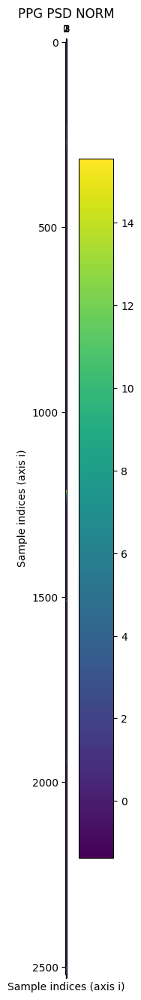

In [156]:
# GCAtrain2 + = pe, pf ablation
# Row max, mean without Self-similarity cp.cuda.Device(0).use()

args = get_mdeap_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label,_ = load_mm_subject_data(args.tensor_save_path, isdeap=True)

visualization_type = 1

args.tpe1 = 1.
args.tpe2 = 1.
args.tpf1 = 1.
args.tpf2 = 1.

eeg_node_idx = [2,3,4,5,8,12,14,18,20,21,22,26,30,32]
eeg_node_cnt = len(eeg_node_idx)
for p in range(1):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    

    


    vlc_best_epoch = []
    vlc_orig_acc = []
    vlc_best_acc = []
    ars_best_epoch = []
    ars_orig_acc = []
    ars_best_acc = []
    print("========================================== DEAP Protocol {} ==========================================".format(int(n_labels_by_class)))

    sub_eeg_de = np.zeros([args.n_samples,args.n_features,eeg_node_cnt],dtype='float64')
    sub_eeg_psd = np.zeros([args.n_samples,args.n_features,eeg_node_cnt],dtype='float64')

    for i in range(32):
        print("\n\n******************* SUBJECT : {} *********************".format(i+1))
        sub_idx = 'sub'+str(i+1)
        date = '230426'

        sub_de = subject_de[i]
        sub_psd = subject_psd[i]

        sub_label = subject_label[i]
        sub_orig_eeg_de = sub_de[:,:,:args.idx_nodes_eeg]
        sub_orig_eeg_psd = sub_psd[:,:,:args.idx_nodes_eeg]

        for order, idx in enumerate(eeg_node_idx):
            sub_eeg_de[:,:,order] = sub_orig_eeg_de[:,:,idx-1]
            sub_eeg_psd[:,:,order] = sub_orig_eeg_psd[:,:,idx-1]

        valence_label, arousal_label = deap_label(sub_label)

        save_np(args.tensor_save_path+sub_idx, 'eeg_de_'+date, sub_eeg_de)
        save_np(args.tensor_save_path+sub_idx, 'eeg_psd_'+date, sub_eeg_psd)
        save_heatmap(eeg_de, "EEG DE", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/EEG_DE_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_psd, "EEG PSD", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/EEG_PSD_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        
        
        eeg_de, eeg_psd, vlc_identifier, ars_identifier = other_preprocessing(sub_eeg_de,sub_eeg_psd, (valence_label,arousal_label), n_labels_by_class, args.out_channels, args.seed, isdeap=True)

        gsr_de = sub_de[:,:,args.idx_nodes_gsr]
        gsr_psd = sub_psd[:,:,args.idx_nodes_gsr]

        ppg_de = sub_de[:,:,args.idx_nodes_ppg]
        ppg_psd = sub_psd[:,:,args.idx_nodes_ppg]

        save_np(args.tensor_save_path+sub_idx, 'gsr_de_'+date, gsr_de)
        save_np(args.tensor_save_path+sub_idx, 'gsr_psd_'+date, gsr_psd)
        save_heatmap(gsr_de, "GSR DE", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/GSR_DE_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_psd, "GSR PSD", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/GSR_PSD_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        
        save_np(args.tensor_save_path+sub_idx, 'ppg_de_'+date, ppg_de)
        save_np(args.tensor_save_path+sub_idx, 'ppg_psd_'+date, ppg_psd)
        save_heatmap(ppg_de, "PPG DE", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/PPG_DE_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_psd, "PPG PSD", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/PPG_PSD_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        

        eeg_de = normalization(eeg_de, axis = 0, ntype='standardization')
        eeg_psd = normalization(eeg_psd, axis = 0, ntype='standardization')
        
        save_np(args.tensor_save_path+sub_idx, 'eeg_de_norm_'+date, eeg_de)
        save_np(args.tensor_save_path+sub_idx, 'eeg_psd_norm_'+date, eeg_psd)
        save_heatmap(eeg_de, "EEG DE NORM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/EEG_DE_NORM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_psd, "EEG PSD NORM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/EEG_PSD_NORM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        
        gsr_de = normalization(gsr_de, axis = 0, ntype='standardization')
        gsr_psd = normalization(gsr_psd, axis = 0, ntype='standardization')
        
        save_np(args.tensor_save_path+sub_idx, 'gsr_de_norm_'+date, gsr_de)
        save_np(args.tensor_save_path+sub_idx, 'gsr_psd_norm_'+date, gsr_psd)
        save_heatmap(gsr_de, "GSR DE NORM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/GSR_DE_NORM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_psd, "GSR PSD NORM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/GSR_PSD_NORM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    
        ppg_de = normalization(ppg_de, axis = 0, ntype='standardization')
        ppg_psd = normalization(ppg_psd, axis = 0, ntype='standardization')
        
        save_np(args.tensor_save_path+sub_idx, 'ppg_de_norm_'+date, ppg_de)
        save_np(args.tensor_save_path+sub_idx, 'ppg_psd_norm_'+date, ppg_psd)
        save_heatmap(ppg_de, "PPG DE NORM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/PPG_DE_NORM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_psd, "PPG PSD NORM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/feature/PPG_PSD_NORM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    
        print("DE_EEG shape: ", eeg_de.shape)
        print("DE_GSR shape: ", gsr_de.shape)
        print("DE_PPG shape: ", ppg_de.shape)
        print("PSD_EEG shape: ", eeg_psd.shape)
        print("PSD_GSR shape: ", gsr_psd.shape)
        print("PSD_PPG shape: ", ppg_psd.shape)

        eeg_de_ssm, eeg_de_nssm = ssm_construction(eeg_de, args.n_samples, args.de_k)
        eeg_psd_ssm, eeg_psd_nssm = ssm_construction(eeg_psd, args.n_samples, args.psd_k)

        save_np(args.tensor_save_path+sub_idx, 'eeg_de_ssm_'+date, eeg_de_ssm)
        save_np(args.tensor_save_path+sub_idx, 'eeg_psd_ssm_'+date, eeg_psd_ssm)
        
        save_heatmap(eeg_de_ssm, "EEG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_psd_ssm, "EEG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_de_nssm, "EEG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_psd_nssm, "EEG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        gsr_de_ssm, gsr_de_nssm = ssm_construction(gsr_de, args.n_samples, args.de_k)
        gsr_psd_ssm, gsr_psd_nssm = ssm_construction(gsr_psd, args.n_samples, args.psd_k)
        
        save_np(args.tensor_save_path+sub_idx, 'gsr_de_ssm_'+date, gsr_de_ssm)
        save_np(args.tensor_save_path+sub_idx, 'gsr_psd_ssm_'+date, gsr_psd_ssm)
        
        save_heatmap(gsr_de_ssm, "GSR DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_psd_ssm, "GSR PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_de_nssm, "GSR DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_psd_nssm, "GSRT PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        ppg_de_ssm, ppg_de_nssm = ssm_construction(ppg_de, args.n_samples, args.de_k)
        ppg_psd_ssm, ppg_psd_nssm = ssm_construction(ppg_psd, args.n_samples, args.psd_k)

        save_np(args.tensor_save_path+sub_idx, 'ppg_de_ssm_'+date, ppg_de_ssm)
        save_np(args.tensor_save_path+sub_idx, 'ppg_psd_ssm_'+date, ppg_psd_ssm)
                
        save_heatmap(ppg_de_ssm, "PPG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_psd_ssm, "PPG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_de_nssm, "PPG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_psd_nssm, "PPG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        eeg_fsm = local_ssm_fusion(eeg_de_ssm, eeg_psd_ssm, eeg_de_nssm, eeg_psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'eeg_fused_ssm_'+date, eeg_fsm)
        save_heatmap(eeg_fsm, "EEG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/EEG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        gsr_fsm = local_ssm_fusion(gsr_de_ssm, gsr_psd_ssm, gsr_de_nssm, gsr_psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'gsr_fused_ssm_'+date, gsr_fsm)
        save_heatmap(gsr_fsm, "GSR Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/GSR_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        ppg_fsm = local_ssm_fusion(ppg_de_ssm, ppg_psd_ssm, ppg_de_nssm, ppg_psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'ppg_fused_ssm_'+date, ppg_fsm)
        save_heatmap(ppg_fsm, "PPG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/PPG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        fsm = global_ssm_fusion(eeg_fsm,gsr_fsm,ppg_fsm,args.k2, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'Global_fused_ssm_'+date, fsm)
        save_heatmap(fsm, "Global Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Global_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        adj = normalize_adj(fsm)
#                 save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
#                 save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        eeg_feature = local_input_feature(eeg_de, eeg_psd)
        gsr_feature = local_input_feature(gsr_de, gsr_psd)
        ppg_feature = local_input_feature(ppg_de, ppg_psd)

        feature = global_input_feature(eeg_feature,gsr_feature,ppg_feature)

#                 save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

        feature = torch.from_numpy(feature).to(torch.float32).to(device)
        adj = torch.from_numpy(adj).to(torch.float32).to(device)
        ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
        vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

        vlc_identifier = torch.from_numpy(vlc_identifier).bool()
        vlc_train_identifier = vlc_identifier.to(device)
        isunlabeled = ~vlc_identifier
        vlc_test_identifier = isunlabeled.to(device)

        ars_identifier = torch.from_numpy(ars_identifier).bool()
        ars_train_identifier = ars_identifier.to(device)
        isunlabeled = ~ars_identifier
        ars_test_identifier = isunlabeled.to(device)


        activation = get_activation('celu')
        gcn = GraphConvolution

        encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
        model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

        model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, vlc_label,
                                                                    vlc_train_identifier, vlc_test_identifier,
                                                                    args,device,date,sub_idx, isdeap=True)
        print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
        vlc_best_acc.append(round(best_acc.item(), 2))
        vlc_orig_acc.append(best_acc.item())
        vlc_best_epoch.append(best_epoch)

#                 experiment_type = 'subject_dependent'
#                 model_save_name = sub_idx+'_model_valence'
#                 model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
#                 torch.save(model.state_dict(), model_path)


        encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
        model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

        model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, ars_label,
                                                                            ars_train_identifier, ars_test_identifier,
                                                                            args,date,sub_idx, isdeap=True)

        print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
        ars_best_acc.append(round(best_acc.item(), 2))
        ars_orig_acc.append(best_acc.item())
        ars_best_epoch.append(best_epoch)

#                 experiment_type = 'subject_dependent'
#                 model_save_name = sub_idx+'_model_arousal'
#                 model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
#                 torch.save(model.state_dict(), model_path)

    print("\n**************** Valence *********************")
    print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
    print("\n Best Epochs : {}".format(vlc_best_epoch))
    print("**************** Arousal *********************")
    print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))
    print("\n Best Epochs : {}".format(ars_best_epoch))


    vlc_best_acc_list = np.array(vlc_best_acc)
    save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_vlc_best_acc_list_'+date, vlc_best_acc_list)
    ars_best_acc_list = np.array(ars_best_acc)
    save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_ars_best_acc_list_'+date, ars_best_acc_list)


In [116]:
Best_EF_vlc_acc

[[97.76, 97.79, 97.67, 97.44, 97.18, 96.76, 95.99, 94.74, 93.23],
 [97.62, 97.65, 97.55, 97.44, 97.17, 96.66, 95.93, 94.7, 93.22],
 [97.55, 97.58, 97.52, 97.28, 97.05, 96.61, 95.71, 94.65, 92.96],
 [97.34, 97.41, 97.38, 97.04, 96.88, 96.33, 95.59, 94.44, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0]]

In [114]:
Best_EF_ars_acc

[[97.67, 97.72, 97.56, 97.52, 97.11, 96.85, 96.2, 95.14, 93.48],
 [97.67, 97.69, 97.51, 97.32, 97.09, 96.74, 96.14, 95.01, 93.35],
 [97.52, 97.58, 97.48, 97.39, 96.97, 96.69, 96.05, 95.0, 93.42],
 [97.4, 97.47, 97.31, 97.24, 96.88, 96.67, 95.97, 94.9, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0]]

Device: cuda
Current cuda device: 1
Count of using GPUs: 3
========================================== DEAP Protocol 90 ==========================================


******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)
DE_EEG shape:  (2520, 128)
DE_GSR shape:  (2520, 4)
DE_PPG shape:  (2520, 4)
PSD_EEG shape:  (2520, 128)
PSD_GSR shape:  (2520, 4)
PSD_PPG shape:  (2520, 4)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm constructio

/tmp/ipykernel_90323/243427724.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)



********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3473 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3561 sec
Done
**********************************************
directory already 

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3739 sec
Done
**********************************************
directory already exists
gsr_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3561 sec
Done
**********************************************
directory already exists
ppg_fused_ssm_230426 is saved successfully

********** Global SSM fusion start ***********
sparse kernel matrix construction start...
Three skms has been completed
fused ssm construction start...
time step :  0
0.5807 sec
Done
**********************************************
directory already exists
Global_fused_ssm_230426 is saved successfully
directory already exists
adjacency_matrix_2

0.3445 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3587 sec
Done
**********************************************
directory already exists
gsr_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3421 sec
Done
**********************************************
directory already exists
ppg_fused_ssm_230426 is saved successfully

********** Global SSM fusion start ***********
sparse kernel matrix construction start...
Three skms has been completed
fused ssm construction start...
time step :  0

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3698 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2743 sec
Done
**********************************************
directory already exists
gsr_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2909 sec
Done
**********************************************
directory already exists
ppg_fused_ssm_230426 is saved success

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3386 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3499 sec
Done
**********************************************
directory already exists
gsr_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3398 

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3393 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3503 sec
Done
**********************************************
directory already exists
gsr_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix co

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3535 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2730 sec
Done
****************************

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3428 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3504 sec
Done
**********************************************
directory already 

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature b

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

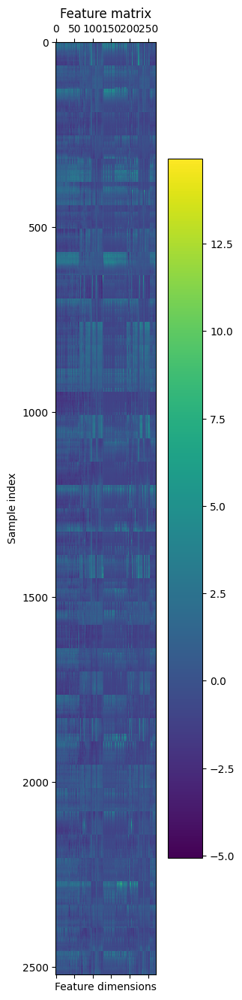

In [134]:
cp.cuda.Device(1).use()

args = get_mdeap_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)
args.pe1 = 0.2
args.pe2 = 0.2
args.pf1 = 0.2
args.pf2 = 0.2

subject_de, subject_psd, subject_label, _ = load_mm_subject_data(args.tensor_save_path, isdeap=True)

visualization_type = 1

for p in range(1,3):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
        
    vlc_best_epoch = []
    vlc_orig_acc = []
    vlc_best_acc = []
    ars_best_epoch = []
    ars_orig_acc = []
    ars_best_acc = []
    print("========================================== DEAP Protocol {} ==========================================".format(int(n_labels_by_class)))

    for i in range(32):
        print("\n\n******************* SUBJECT : {} *********************".format(i+1))
        sub_idx = 'sub'+str(i+1)
        date = '230426'

        sub_de = subject_de[i]
        sub_psd = subject_psd[i]

        sub_label = subject_label[i]
        sub_eeg_de = sub_de[:,:,:args.idx_nodes_eeg]
        sub_eeg_psd = sub_psd[:,:,:args.idx_nodes_eeg]

        valence_label, arousal_label = deap_label(sub_label)
        eeg_de, eeg_psd, vlc_identifier, ars_identifier = other_preprocessing(sub_eeg_de,sub_eeg_psd, (valence_label,arousal_label), n_labels_by_class, args.out_channels, args.seed, isdeap=True)

        gsr_de = sub_de[:,:,args.idx_nodes_gsr]
        gsr_psd = sub_psd[:,:,args.idx_nodes_gsr]

        ppg_de = sub_de[:,:,args.idx_nodes_ppg]
        ppg_psd = sub_psd[:,:,args.idx_nodes_ppg]


        eeg_de = normalization(eeg_de, axis = 0, ntype='standardization')
        eeg_psd = normalization(eeg_psd, axis = 0, ntype='standardization')

        gsr_de = normalization(gsr_de, axis = 0, ntype='standardization')
        gsr_psd = normalization(gsr_psd, axis = 0, ntype='standardization')

        ppg_de = normalization(ppg_de, axis = 0, ntype='standardization')
        ppg_psd = normalization(ppg_psd, axis = 0, ntype='standardization')

        print("DE_EEG shape: ", eeg_de.shape)
        print("DE_GSR shape: ", gsr_de.shape)
        print("DE_PPG shape: ", ppg_de.shape)
        print("PSD_EEG shape: ", eeg_psd.shape)
        print("PSD_GSR shape: ", gsr_psd.shape)
        print("PSD_PPG shape: ", ppg_psd.shape)

        eeg_de_ssm, eeg_de_nssm = ssm_construction(eeg_de, args.n_samples, args.de_k)
        eeg_psd_ssm, eeg_psd_nssm = ssm_construction(eeg_psd, args.n_samples, args.psd_k)

        save_heatmap(eeg_de_ssm, "EEG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_psd_ssm, "EEG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_de_nssm, "EEG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(eeg_psd_nssm, "EEG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        gsr_de_ssm, gsr_de_nssm = ssm_construction(gsr_de, args.n_samples, args.de_k)
        gsr_psd_ssm, gsr_psd_nssm = ssm_construction(gsr_psd, args.n_samples, args.psd_k)

        save_heatmap(gsr_de_ssm, "GSR DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_psd_ssm, "GSR PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_de_nssm, "GSR DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(gsr_psd_nssm, "GSRT PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        ppg_de_ssm, ppg_de_nssm = ssm_construction(ppg_de, args.n_samples, args.de_k)
        ppg_psd_ssm, ppg_psd_nssm = ssm_construction(ppg_psd, args.n_samples, args.psd_k)

        save_heatmap(ppg_de_ssm, "PPG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_psd_ssm, "PPG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_de_nssm, "PPG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(ppg_psd_nssm, "PPGG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        eeg_fsm = local_ssm_fusion(eeg_de_ssm, eeg_psd_ssm, eeg_de_nssm, eeg_psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'eeg_fused_ssm_'+date, eeg_fsm)
        save_heatmap(eeg_fsm, "EEG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/EEG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        gsr_fsm = local_ssm_fusion(gsr_de_ssm, gsr_psd_ssm, gsr_de_nssm, gsr_psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'gsr_fused_ssm_'+date, gsr_fsm)
        save_heatmap(gsr_fsm, "GSR Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/GSR_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        ppg_fsm = local_ssm_fusion(ppg_de_ssm, ppg_psd_ssm, ppg_de_nssm, ppg_psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'ppg_fused_ssm_'+date, ppg_fsm)
        save_heatmap(ppg_fsm, "PPG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/PPG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        fsm = global_ssm_fusion(eeg_fsm,gsr_fsm,ppg_fsm,args.k2, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'Global_fused_ssm_'+date, fsm)
        save_heatmap(fsm, "Global Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Global_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        adj = normalize_adj(fsm)
        save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
        save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


        eeg_feature = local_input_feature(eeg_de, eeg_psd)
        gsr_feature = local_input_feature(gsr_de, gsr_psd)
        ppg_feature = local_input_feature(ppg_de, ppg_psd)

        feature = global_input_feature(eeg_feature,gsr_feature,ppg_feature)

        save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

        feature = torch.from_numpy(feature).to(torch.float32).to(device)
        adj = torch.from_numpy(adj).to(torch.float32).to(device)
        ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
        vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

        vlc_identifier = torch.from_numpy(vlc_identifier).bool()
        vlc_train_identifier = vlc_identifier.to(device)
        isunlabeled = ~vlc_identifier
        vlc_test_identifier = isunlabeled.to(device)

        ars_identifier = torch.from_numpy(ars_identifier).bool()
        ars_train_identifier = ars_identifier.to(device)
        isunlabeled = ~ars_identifier
        ars_test_identifier = isunlabeled.to(device)


        activation = get_activation('celu')
        gcn = GraphConvolution

        encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
        model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

        model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, vlc_label,
                                                                    vlc_train_identifier, vlc_test_identifier,
                                                                    args,device,date,sub_idx, isdeap=True)
        print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
        vlc_best_acc.append(round(best_acc.item(), 2))
        vlc_orig_acc.append(best_acc.item())
        vlc_best_epoch.append(best_epoch)

        experiment_type = 'subject_dependent'
        model_save_name = sub_idx+'_model_valence'
        model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
        torch.save(model.state_dict(), model_path)


        encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
        model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

        model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, ars_label,
                                                                            ars_train_identifier, ars_test_identifier,
                                                                            args,date,sub_idx, isdeap=True)

        print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
        ars_best_acc.append(round(best_acc.item(), 2))
        ars_orig_acc.append(best_acc.item())
        ars_best_epoch.append(best_epoch)

        experiment_type = 'subject_dependent'
        model_save_name = sub_idx+'_model_arousal'
        model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
        torch.save(model.state_dict(), model_path)

    print("\n**************** Valence *********************")
    print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
    print("\n Best Epochs : {}".format(vlc_best_epoch))
    print("**************** Arousal *********************")
    print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))
    print("\n Best Epochs : {}".format(ars_best_epoch))


    vlc_best_acc_list = np.array(vlc_best_acc)
    save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_vlc_best_acc_list_'+date, vlc_best_acc_list)
    ars_best_acc_list = np.array(ars_best_acc)
    save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_ars_best_acc_list_'+date, ars_best_acc_list)


In [118]:
args

{'bus_id': 'PCI_BUS_ID',
 'cuda_id': ['0', '1', '2'],
 'os_path': '/home/neuroai/users/dhkim/eer/SSLGCN',
 'feature_name1': 'DE_LDS_data',
 'feature_name2': 'PSD_LDS_data',
 'deap_label_dir_path': 'dataset/deap/data_preprocessed_matlab/',
 'deap_data_dir_path': 'dataset/deap/extractedfeatures/de_psd_lds/',
 'figure_save_path': 'store_deap/figure/',
 'tensor_save_path': 'store_deap/tensor/',
 'model_save_path': 'store_deap/model/',
 'valence': 'Valence',
 'arousal': 'Arousal',
 'n_subjects': 32,
 'n_trials': 40,
 'n_nodes': 32,
 'n_features': 4,
 'n_samples': 2520,
 'n_labels_by_class1': 60,
 'n_labels_by_class2': 90,
 'n_labels_by_class3': 120,
 'n_labels': 2,
 'seed': 2023,
 'EEG_band': None,
 'pca_components1': 9,
 'pca_components2': 6,
 'essm_lambda': 0.9,
 'de_k': 1200,
 'psd_k': 1200,
 'k1': 30,
 'k2': 130,
 't1': 1,
 't2': 1,
 'feature_dimension': 256,
 'gcn_hid_channels': 128,
 'gcn_out_channels': 64,
 'out_channels': 2,
 'learning_rate': 0.005,
 'l2_lambda': 0.001,
 'epochs': 3

In [120]:
args = get_mdeap_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)

Device: cuda
Current cuda device: 1
Count of using GPUs: 3


In [121]:
args

{'bus_id': 'PCI_BUS_ID',
 'cuda_id': ['0', '1', '2'],
 'os_path': '/home/neuroai/users/dhkim/eer/SSLGCN',
 'feature_name1': 'DE_LDS_data',
 'feature_name2': 'PSD_LDS_data',
 'deap_label_dir_path': 'dataset/deap/data_preprocessed_matlab/',
 'deap_data_dir_path': 'dataset/deap/mmextractedfeatures/de_psd_lds/',
 'figure_save_path': 'store_deap/figure/',
 'tensor_save_path': 'store_deap/tensor/',
 'model_save_path': 'store_deap/model/',
 'valence': 'Valence',
 'arousal': 'Arousal',
 'n_subjects': 32,
 'n_trials': 40,
 'n_nodes': 34,
 'idx_nodes_eeg': 32,
 'idx_nodes_gsr': 32,
 'idx_nodes_ppg': 33,
 'n_features': 4,
 'n_samples': 2520,
 'n_labels_by_class1': 60,
 'n_labels_by_class2': 90,
 'n_labels_by_class3': 120,
 'n_labels': 2,
 'seed': 2023,
 'EEG_band': None,
 'pca_components1': 9,
 'pca_components2': 6,
 'essm_lambda': 0.9,
 'de_k': 1200,
 'psd_k': 1200,
 'k1': 30,
 'k2': 130,
 't1': 1,
 't2': 1,
 'feature_dimension': 272,
 'gcn_hid_channels': 128,
 'gcn_out_channels': 64,
 'out_chan

# Load data and labels

* **load_feature_label(data_dir_path,label_dir_path, trial:int, feature_name, EEG_band=None)**
    - input
        1. data_dir_path : data directory path
        2. label_dir_path : label directory path
        3. n_tirals: the number of trials
        4. feature_name : EEG's feature name
        5. EEG_band : EEG band used in experiments - 0 : delta wave, 1: theta wave, 2: alpha wave, 3: beta wave, 4: delta wave, None: all waves
    - output
        1. subject_data_list : the list containing data loaded from each subject data
        2. subject_label_list : the list containing data loaded from each subject labels
        3. subject_sample_counts : the list containing sample counts by trials in every subject data

In [123]:
subject_de, subject_psd, subject_label, _ = load_mm_subject_data(args.tensor_save_path, isdeap=True)


In [48]:
subject_de, subject_psd, subject_label = load_deap_data(args.deap_data_dir_path,args.feature_name1, args.feature_name2, args.deap_label_dir_path, args.n_labels)


*********** Load features and labels ************
de_lds
s01.mat
s02.mat
s03.mat
s04.mat
s05.mat
s06.mat
s07.mat
s08.mat
s09.mat
s10.mat
s11.mat
s12.mat
s13.mat
s14.mat
s15.mat
s16.mat
s17.mat
s18.mat
s19.mat
s20.mat
s21.mat
s22.mat
s23.mat
s24.mat
s25.mat
s26.mat
s27.mat
s28.mat
s29.mat
s30.mat
s31.mat
s32.mat
get data in DE_LDS_data ... done
psd_lds
s01.mat
s02.mat
s03.mat
s04.mat
s05.mat
s06.mat
s07.mat
s08.mat
s09.mat
s10.mat
s11.mat
s12.mat
s13.mat
s14.mat
s15.mat
s16.mat
s17.mat
s18.mat
s19.mat
s20.mat
s21.mat
s22.mat
s23.mat
s24.mat
s25.mat
s26.mat
s27.mat
s28.mat
s29.mat
s30.mat
s31.mat
s32.mat
get data in PSD_LDS_data ... done
get label ... s01.mat
s02.mat
s03.mat
s04.mat
s05.mat
s06.mat
s07.mat
s08.mat
s09.mat
s10.mat
s11.mat
s12.mat
s13.mat
s14.mat
s15.mat
s16.mat
s17.mat
s18.mat
s19.mat
s20.mat
s21.mat
s22.mat
s23.mat
s24.mat
s25.mat
s26.mat
s27.mat
s28.mat
s29.mat
s30.mat
s31.mat
s32.mat
done


In [101]:
np.save('store_deap/tensor/multimodal/subject_psd',subject_psd)
np.save('store_deap/tensor/multimodal/subject_de',subject_de)
np.save('store_deap/tensor/multimodal/subject_label',subject_label)

In [124]:
subject_de.shape

(32, 2520, 4, 34)

In [125]:
i = 0
date = '230426'

In [126]:
print("\n\n******************* SUBJECT : {} *********************".format(i+1))
sub_idx = 'sub'+str(i+1)
n_labels_by_class = args.n_labels_by_class3

sub_de = subject_de[i]
sub_psd = subject_psd[i]

sub_label = subject_label[i]
sub_eeg_de = sub_de[:,:,:32]
sub_eeg_psd = sub_psd[:,:,:32]

valence_label, arousal_label = deap_label(sub_label)
eeg_de, eeg_psd, vlc_identifier, ars_identifier = other_preprocessing(sub_eeg_de,sub_eeg_psd, (valence_label,arousal_label), n_labels_by_class, args.out_channels, args.seed, isdeap=True)

gsr_de = sub_de[:,:,32]
ppg_de = sub_de[:,:,33]

gsr_psd = sub_psd[:,:,32]
ppg_psd = sub_psd[:,:,33]


eeg_de = normalization(eeg_de, axis = 0, ntype='standardization')
eeg_psd = normalization(eeg_psd, axis = 0, ntype='standardization')

gsr_de = normalization(gsr_de, axis = 0, ntype='standardization')
gsr_psd = normalization(gsr_psd, axis = 0, ntype='standardization')

ppg_de = normalization(ppg_de, axis = 0, ntype='standardization')
ppg_psd = normalization(ppg_psd, axis = 0, ntype='standardization')




******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)


In [127]:
print("DE_EEG shape: ", eeg_de.shape)
print("DE_GSR shape: ", gsr_de.shape)
print("DE_PPG shape: ", ppg_de.shape)
print("PSD_EEG shape: ", eeg_psd.shape)
print("PSD_GSR shape: ", gsr_psd.shape)
print("PSD_PPG shape: ", ppg_psd.shape)


DE_EEG shape:  (2520, 128)
DE_GSR shape:  (2520, 4)
DE_PPG shape:  (2520, 4)
PSD_EEG shape:  (2520, 128)
PSD_GSR shape:  (2520, 4)
PSD_PPG shape:  (2520, 4)



********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done



<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

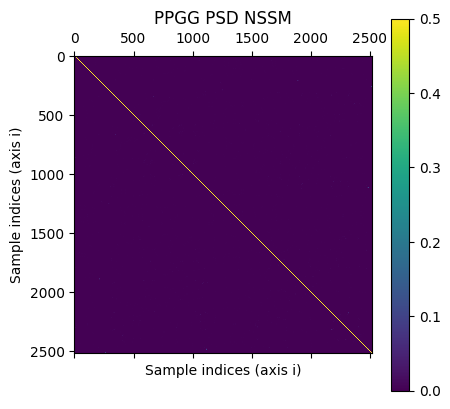

In [128]:

eeg_de_ssm, eeg_de_nssm = ssm_construction(eeg_de, args.n_samples, args.de_k)
eeg_psd_ssm, eeg_psd_nssm = ssm_construction(eeg_psd, args.n_samples, args.psd_k)

save_heatmap(eeg_de_ssm, "EEG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(eeg_psd_ssm, "EEG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(eeg_de_nssm, "EEG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(eeg_psd_nssm, "EEG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/EEG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


gsr_de_ssm, gsr_de_nssm = ssm_construction(gsr_de, args.n_samples, args.de_k)
gsr_psd_ssm, gsr_psd_nssm = ssm_construction(gsr_psd, args.n_samples, args.psd_k)

save_heatmap(gsr_de_ssm, "GSR DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(gsr_psd_ssm, "GSR PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(gsr_de_nssm, "GSR DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(gsr_psd_nssm, "GSRT PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/GSR_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


ppg_de_ssm, ppg_de_nssm = ssm_construction(ppg_de, args.n_samples, args.de_k)
ppg_psd_ssm, ppg_psd_nssm = ssm_construction(ppg_psd, args.n_samples, args.psd_k)

save_heatmap(ppg_de_ssm, "PPG DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(ppg_psd_ssm, "PPG PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(ppg_de_nssm, "PPG DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(ppg_psd_nssm, "PPGG PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PPG_PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')



In [129]:
args.k2

130


********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3485 sec
Done
**********************************************
directory already exists
eeg_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3620 sec
Done
**********************************************
directory already exists
gsr_fused_ssm_230426 is saved successfully

********** Local SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3448 sec
Done
**********************************************
directory alrea

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

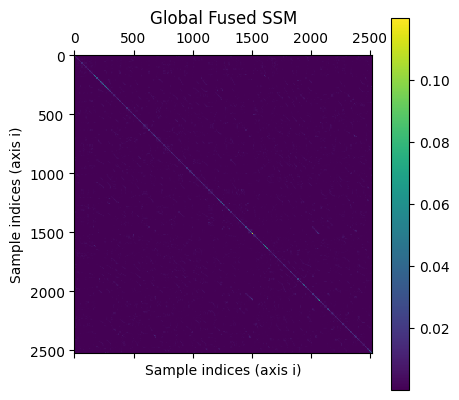

In [130]:
eeg_fsm = local_ssm_fusion(eeg_de_ssm, eeg_psd_ssm, eeg_de_nssm, eeg_psd_nssm, args.k1, args.t1)
save_np(args.tensor_save_path+sub_idx, 'eeg_fused_ssm_'+date, eeg_fsm)
save_heatmap(eeg_fsm, "EEG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/EEG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

gsr_fsm = local_ssm_fusion(gsr_de_ssm, gsr_psd_ssm, gsr_de_nssm, gsr_psd_nssm, args.k1, args.t1)
save_np(args.tensor_save_path+sub_idx, 'gsr_fused_ssm_'+date, gsr_fsm)
save_heatmap(gsr_fsm, "GSR Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/GSR_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

ppg_fsm = local_ssm_fusion(ppg_de_ssm, ppg_psd_ssm, ppg_de_nssm, ppg_psd_nssm, args.k1, args.t1)
save_np(args.tensor_save_path+sub_idx, 'ppg_fused_ssm_'+date, ppg_fsm)
save_heatmap(ppg_fsm, "PPG Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/PPG_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

fsm = global_ssm_fusion(eeg_fsm,gsr_fsm,ppg_fsm,args.k2, args.t1)
save_np(args.tensor_save_path+sub_idx, 'Global_fused_ssm_'+date, fsm)
save_heatmap(fsm, "Global Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Global_Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')




directory already exists
adjacency_matrix_230426 is saved successfully


<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

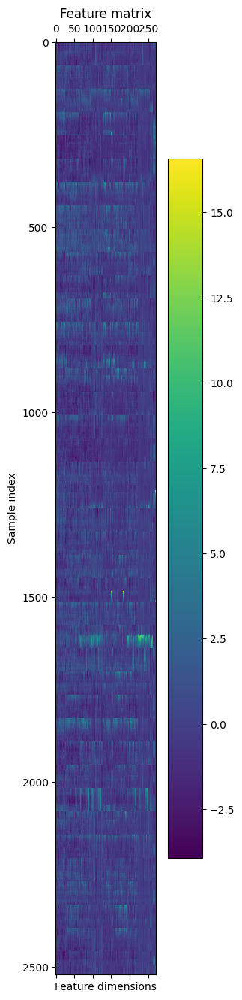

In [131]:
adj = normalize_adj(fsm)
save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


eeg_feature = local_input_feature(eeg_de, eeg_psd)
gsr_feature = local_input_feature(gsr_de, gsr_psd)
ppg_feature = local_input_feature(ppg_de, ppg_psd)

feature = global_input_feature(eeg_feature,gsr_feature,ppg_feature)

save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

feature = torch.from_numpy(feature).to(torch.float32).to(device)
adj = torch.from_numpy(adj).to(torch.float32).to(device)
ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

vlc_identifier = torch.from_numpy(vlc_identifier).bool()
vlc_train_identifier = vlc_identifier.to(device)
isunlabeled = ~vlc_identifier
vlc_test_identifier = isunlabeled.to(device)

ars_identifier = torch.from_numpy(ars_identifier).bool()
ars_train_identifier = ars_identifier.to(device)
isunlabeled = ~ars_identifier
ars_test_identifier = isunlabeled.to(device)



In [132]:
activation = get_activation('celu')
gcn = GraphConvolution

encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, vlc_label,
                                                            vlc_train_identifier, vlc_test_identifier,
                                                            args,device,date,sub_idx, isdeap=True)
print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
vlc_best_acc.append(round(best_acc.item(), 2))
vlc_orig_acc.append(best_acc.item())
vlc_best_epoch.append(best_epoch)

experiment_type = 'subject_dependent'
model_save_name = sub_idx+'_model_valence'
model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
torch.save(model.state_dict(), model_path)


encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, ars_label,
                                                                    ars_train_identifier, ars_test_identifier,
                                                                    args,date,sub_idx, isdeap=True)

print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
ars_best_acc.append(round(best_acc.item(), 2))
ars_orig_acc.append(best_acc.item())
ars_best_epoch.append(best_epoch)

experiment_type = 'subject_dependent'
model_save_name = sub_idx+'_model_arousal'
model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
torch.save(model.state_dict(), model_path)

*** Best ACC : 99.69 ***
*** Best ACC : 98.29 ***


In [122]:

visualization_type = 1
sample = best_z.cpu().detach().numpy().copy()
drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
tsne_sample = StandardScaler().fit_transform(sample) # standardization
dr_result = drmodel.fit_transform(tsne_sample)


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


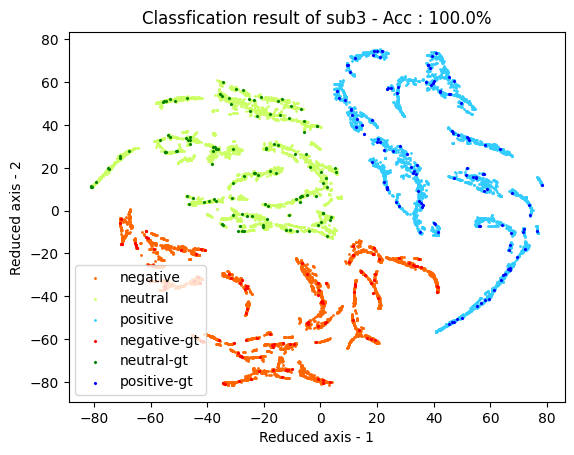

In [123]:
save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

In [120]:
def save_scatter(result, label, best_acc,sub_idx, date, save_path, dr_type, iden):

    negw = np.where(label.cpu()==0)[0]
    neuw = np.where(label.cpu()==1)[0]
    posw = np.where(label.cpu()==2)[0]
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    neg = result[negw]
    neu = result[neuw]
    pos = result[posw]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    neggtw,neugtw,posgtw = [], [], []
    
    for i in gts:
        if i in negw:
            neggtw.append(i)
        elif i in neuw:
            neugtw.append(i)
        elif i in posw:
            posgtw.append(i)

    neggt = result[neggtw,:]
    neugt = result[neugtw,:]
    posgt = result[posgtw,:]
    
    plt.clf()
    c1 = plt.scatter(neg[:,0], neg[:,1], marker = "o", color='#FF6600',s=1.)
    gt1 = plt.scatter(neggt[:,0], neggt[:,1], marker = "x", color='red',s=2.)
    c2 = plt.scatter(neu[:,0], neu[:,1], marker = "o",color ='#CCFF66', s=1.)
    gt2 = plt.scatter(neugt[:,0], neugt[:,1], marker = "x", color='green',s=2.)
    c3 = plt.scatter(pos[:,0], pos[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt3 = plt.scatter(posgt[:,0], posgt[:,1], marker = "x", color='blue',s=2.)
    
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2,c3, gt1,gt2,gt3),labels=("negative","neutral", "positive", "negative-gt", "neutral-gt", "positive-gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return

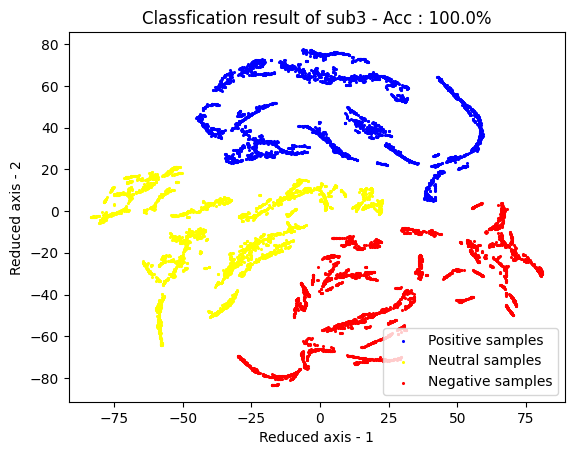

In [106]:
args

{'bus_id': 'PCI_BUS_ID',
 'cuda_id': ['0', '1', '2'],
 'os_path': '/home/neuroai/users/dhkim/eer/SSLGCN',
 'seed_data_dir_path': 'dataset/seed/SEED_EEG/ExtractedFeatures/data/',
 'feature_name1': 'de_LDS',
 'feature_name2': 'psd_LDS',
 'seed_label_dir_path': 'dataset/seed/SEED_EEG/ExtractedFeatures/label/',
 'figure_save_path': '/home/neuroai/users/dhkim/eer/SSLGCN/store/figure/',
 'tensor_save_path': '/home/neuroai/users/dhkim/eer/SSLGCN/store/tensor/',
 'model_save_path': '/home/neuroai/users/dhkim/eer/SSLGCN/store/model/',
 'n_subjects': 15,
 'n_sessions': 3,
 'n_trials': 15,
 'n_nodes': 62,
 'n_features': 5,
 'n_samples': 10182,
 'n_labels_by_trials': 8,
 'seed': 2023,
 'EEG_band': None,
 'pca_components1': 9,
 'pca_components2': 6,
 'essm_lambda': 0.9,
 'de_k': 3394,
 'psd_k': 3394,
 'k1': 30,
 'k2': 130,
 't1': 1,
 't2': 1,
 'feature_dimension': 620,
 'gcn_hid_channels': 64,
 'gcn_out_channels': 128,
 'out_channels': 3,
 'learning_rate': 0.01,
 'l2_lambda': 0.001,
 'epochs': 1000

In [94]:
args.feature_dimension

620

In [91]:
valence_label, arousal_label = deap_label(sub_label)

************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)


# Subject-dependent experiments using all subject data

In [92]:
date = '230331_mah_oSNF'
sub_idx = 'sub1'


In [93]:
de, psd, vlc_identifier, ars_identifier = preprocessing(sub_de,sub_psd, (valence_label,arousal_label), args.n_labels_by_class, args.out_channels, args.seed, isdeap=True)

In [94]:
psd

array([[2.59857215e+06, 4.54285179e+06, 1.36069111e+06, ...,
        1.09686196e+04, 1.39200117e+04, 1.04771857e+04],
       [2.46336916e+06, 4.42914609e+06, 1.38528905e+06, ...,
        1.16192085e+04, 1.33719902e+04, 1.03508640e+04],
       [2.58044911e+06, 4.19995157e+06, 1.34221615e+06, ...,
        1.14364148e+04, 1.32166358e+04, 1.08090524e+04],
       ...,
       [3.12714625e-05, 2.35753739e-04, 8.67718458e-04, ...,
        2.45945823e-06, 2.26324664e-06, 2.44513353e-06],
       [2.95023352e-05, 2.41767122e-04, 8.56581878e-04, ...,
        2.40332060e-06, 2.22391576e-06, 2.37930040e-06],
       [2.76356847e-05, 2.46851165e-04, 8.42202788e-04, ...,
        2.33282817e-06, 2.12962362e-06, 2.28173267e-06]])

In [95]:
de = normalization(de, axis = 0, ntype='standardization')
psd = normalization(psd, axis = 0, ntype='standardization')

In [96]:
args.de_k

1200


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully


<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

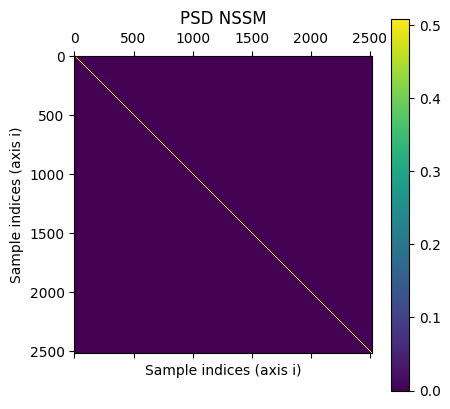

In [97]:

de_ssm, de_nssm = ssm_construction2(de, args.n_samples,args.de_k,'ma')
psd_ssm, psd_nssm = ssm_construction2(psd, args.n_samples,args.psd_k, 'ma')
save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

In [112]:
psd

array([[-0.00219646,  0.44126961, -0.14766601, ...,  0.05836608,
         0.05300091,  0.03368996],
       [-0.01323479,  0.42376572, -0.14734207, ...,  0.07469474,
         0.04338789,  0.03086515],
       [-0.00367608,  0.38848345, -0.14790931, ...,  0.07010693,
         0.04066277,  0.04111116],
       ...,
       [-0.21435077, -0.2580584 , -0.16558549, ..., -0.21692739,
        -0.19117447, -0.20060072],
       [-0.21435077, -0.2580584 , -0.16558549, ..., -0.21692739,
        -0.19117447, -0.20060072],
       [-0.21435077, -0.2580584 , -0.16558549, ..., -0.21692739,
        -0.19117447, -0.20060072]])

In [97]:
de_ssm

array([[1.00000000e+00, 1.08459337e-03, 1.43168298e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.08459337e-03, 1.00000000e+00, 9.84552966e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.43168298e-04, 9.84552966e-04, 1.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [2.33863805e-12, 1.72943472e-12, 1.25100629e-12, ...,
        1.00000000e+00, 9.91730416e-04, 2.73105629e-07],
       [2.47710746e-12, 2.01890237e-12, 1.18413730e-12, ...,
        9.91730416e-04, 1.00000000e+00, 9.08619419e-06],
       [2.05525787e-13, 1.31007741e-13, 9.28567659e-14, ...,
        2.73105629e-07, 9.08619419e-06, 1.00000000e+00]])

In [98]:
psd_ssm

array([[1.00000000e+00, 2.99652807e-06, 0.00000000e+00, ...,
        4.16357823e-11, 4.16357823e-11, 4.16357823e-11],
       [2.99652807e-06, 1.00000000e+00, 0.00000000e+00, ...,
        3.19097339e-12, 3.19097339e-12, 3.19097339e-12],
       [2.02180047e-16, 1.15735674e-16, 1.00000000e+00, ...,
        9.83407231e-19, 9.83407231e-19, 9.83407231e-19],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.00000000e+00, 9.99999999e-01, 9.99999997e-01],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        9.99999999e-01, 1.00000000e+00, 9.99999998e-01],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        9.99999997e-01, 9.99999998e-01, 1.00000000e+00]])

In [25]:
fused_feature = (de+psd)*0.5

In [26]:
fused_feature

array([[ 0.37342548,  0.69084746,  0.36802912, ...,  0.32740899,
         0.40857538,  0.36144676],
       [ 0.35769441,  0.68961198,  0.37387216, ...,  0.34170076,
         0.39606393,  0.35929402],
       [ 0.38041596,  0.6638694 ,  0.37112132, ...,  0.33767842,
         0.39517999,  0.37048053],
       ...,
       [-2.82124019, -2.67816886, -2.39959235, ..., -3.01144374,
        -2.91394534, -3.04744934],
       [-2.83281096, -2.67363287, -2.39975412, ..., -3.00251578,
        -2.90993028, -3.04962391],
       [-2.85166621, -2.6696269 , -2.40068936, ..., -2.99584932,
        -2.9127916 , -3.05612189]])

In [30]:
nfused_feature = (fused_feature-fused_feature.mean())/fused_feature.std()

In [114]:
de_nssm

array([[0.00000000e+00, 4.40337524e-01, 5.81253544e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [4.40337524e-01, 0.00000000e+00, 2.81822573e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [5.81253544e-02, 2.81822573e-01, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 9.74184663e-01, 2.68273828e-04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        9.74184663e-01, 0.00000000e+00, 9.06673279e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        2.68273828e-04, 9.06673279e-03, 0.00000000e+00]])


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3412 sec
Done
**********************************************
directory already exists
fused_ssm_230331_mah_oSNF is saved successfully


<Figure size 640x480 with 0 Axes>

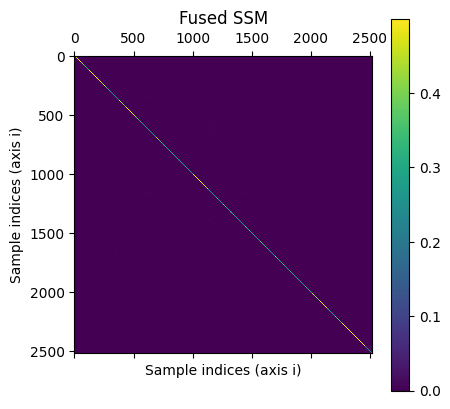

In [110]:
fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k2, args.t1)
save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


In [106]:
a = np.where(valence_label == 1)[0]
b = np.where(fsm[0] != 0 )[0]
print(len(b))
cnt = 0
for i in range(len(b)):
    if b[i] in a:
        cnt+=1
print(cnt)

2520
1449


In [146]:
f1 = de
matrix = np.zeros((length,length),float)
inv_cov = np.linalg.inv(np.cov(f1, rowvar=False))
for i in range(length):
    diff = f1[i,:]-f1
    a = diff@inv_cov
    for j in range(length):
        diff = f1[i,:]-f1[j,:]
        matrix[i,j] = np.sqrt(a[j]@diff)


In [152]:
matrix

array([[ 0.        ,  0.68292498,  1.46193928, ..., 33.06001172,
        33.23053815, 33.33108958],
       [ 0.68292498,  0.        ,  0.91257713, ..., 32.9900361 ,
        33.1637053 , 33.2669965 ],
       [ 1.46193928,  0.91257713,  0.        , ..., 32.87283312,
        33.05055222, 33.15610392],
       ...,
       [33.06001172, 32.9900361 , 32.87283312, ...,  0.        ,
         0.90684077,  1.46983394],
       [33.23053815, 33.1637053 , 33.05055222, ...,  0.90684077,
         0.        ,  0.69472966],
       [33.33108958, 33.2669965 , 33.15610392, ...,  1.46983394,
         0.69472966,  0.        ]])

In [147]:
np.mean(matrix)

24.82172367790395

In [160]:
-0.5 * np.mean(matrix)

-12.410861838951975

In [161]:
a = matrix/(-0.5*np.mean(matrix))
for i in range(10182):
    print(a[0,i], end =', ')

-0.0, -0.05502639444043465, -0.11779514595403773, -0.18812208304916012, -0.2619828847272054, -0.3428993480720426, -0.42619636061785104, -0.5153190677320634, -0.6038655649661401, -0.6876777432493412, -0.7524797544149489, -0.8234509706404963, -0.9031055125042691, -0.9910043948478391, -1.0779613253612954, -1.1656394569935158, -1.2471518880492034, -1.3270639507968598, -1.3844340943165627, -1.4410100302556315, -1.4950747130079132, -1.53151028244062, -1.5723142168414177, -1.6212396225417711, -1.6668792329950908, -1.7202200940470787, -1.7688499029594182, -1.819987372581857, -1.8723669838665264, -1.9280791187031021, -1.9813922298398312, -2.0350941579846134, -2.088918212164053, -2.1302648371469033, -2.1607289105199556, -2.1884557768732056, -2.21431811582941, -2.2386423241543594, -2.2661088234389632, -2.285931364841999, -2.2980747465256606, -2.303843910985822, -2.30823192425102, -2.306955981648746, -2.307198400551238, -2.3066811134779974, -2.3031785934470865, -2.3033642454556613, -2.301679325132

In [167]:
b = np.exp(matrix/(-0.1*np.mean(matrix)))
for i in range(10182):
    print(b[0,i], end =', ')

1.0, 0.7594718874334716, 0.5548953565496921, 0.39038946293286725, 0.269843147592056, 0.18005431198392619, 0.11872067628729717, 0.07603242851920909, 0.04883403235636811, 0.03211639228048344, 0.023227954923730955, 0.016289169282751443, 0.010937833213574702, 0.007047925405131436, 0.0045628555843866625, 0.002943378272686347, 0.001958141557998116, 0.0013131587902671703, 0.0009856882088413385, 0.0007428249415685127, 0.0005668739637847994, 0.0004724628624054843, 0.0003852681070048268, 0.0003016635867331763, 0.0002401141398481053, 0.00018390330215985857, 0.00014420862605921117, 0.0001116728589669663, 8.594225683850765e-05, 6.504731736015782e-05, 4.982662146472968e-05, 3.8093351593253056e-05, 2.9105276976731088e-05, 2.366947805157537e-05, 2.032529166443257e-05, 1.7694107483185062e-05, 1.5547812893807865e-05, 1.376733747614466e-05, 1.2000717513227698e-05, 1.0868337371759215e-05, 1.0228079450461714e-05, 9.93725676333309e-06, 9.721607026093676e-06, 9.783826348609256e-06, 9.771974610545612e-06, 9.7

directory already exists
adjacency_matrix_230331_mah_oSNF is saved successfully


<Figure size 640x480 with 0 Axes>

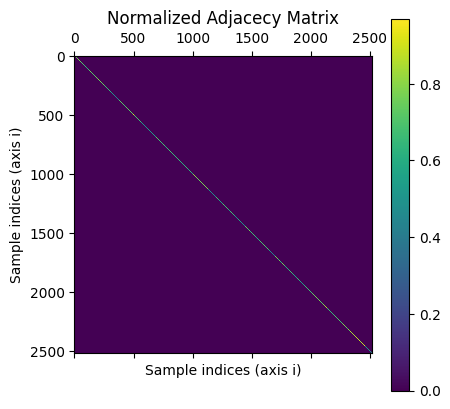

In [111]:
adj = normalize_adj(fsm)
save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


In [94]:
args

{'bus_id': 'PCI_BUS_ID',
 'cuda_id': ['0', '1', '2'],
 'os_path': '/home/neuroai/users/dhkim/eer/SSLGCN',
 'feature_name1': 'PSD_LDS_data',
 'feature_name2': 'DE_LDS_data',
 'deap_label_dir_path': 'dataset/deap/data_preprocessed_matlab/',
 'deap_data_dir_path': 'dataset/deap/extractedfeatures/de_psd_lds/',
 'figure_save_path': 'store_deap/figure/',
 'tensor_save_path': 'store_deap/tensor/',
 'model_save_path': 'store_deap/model/',
 'valence': 'Valence',
 'arousal': 'Arousal',
 'n_subjects': 32,
 'n_trials': 40,
 'n_nodes': 32,
 'n_features': 4,
 'n_samples': 2520,
 'n_labels_by_class': 60,
 'n_labels': 2,
 'seed': 2023,
 'EEG_band': None,
 'pca_components1': 9,
 'pca_components2': 6,
 'essm_lambda': 0.9,
 'de_k': 1200,
 'psd_k': 1200,
 'k1': 30,
 'k2': 130,
 't1': 1,
 't2': 1,
 'feature_dimension': 256,
 'gcn_hid_channels': 128,
 'gcn_out_channels': 64,
 'out_channels': 2,
 'learning_rate': 0.001,
 'l2_lambda': 0.001,
 'epochs': 3000,
 'proj_hid_channels': 16,
 'ptau': 0.7,
 'pf1': 0.1

In [41]:
feature2 = fused_feature
feature2 = torch.from_numpy(feature2).to(torch.float32).to(device)

In [112]:
adj = torch.from_numpy(adj).to(torch.float32).to(device)

In [171]:
sub_idx = 'sub3'

directory already exists
feature_matrix_230403 is saved successfully


<Figure size 640x480 with 0 Axes>

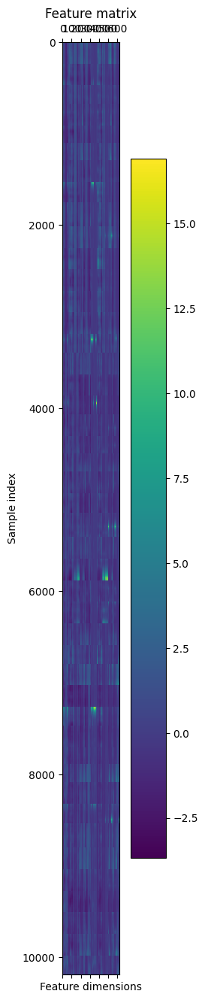

In [172]:
feature = input_feature(de, psd)

save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

save_np(args.tensor_save_path+sub_idx, 'feature_matrix_'+date, feature)

<Figure size 640x480 with 0 Axes>

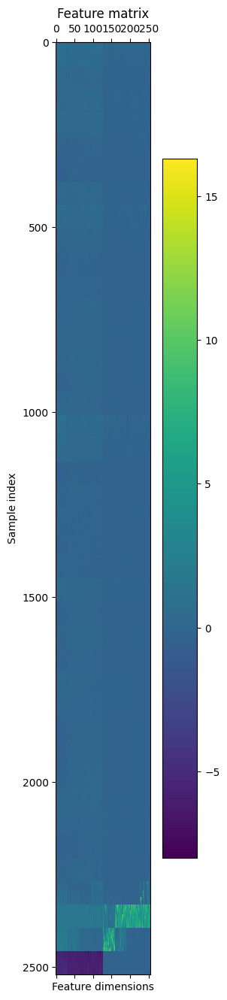

In [103]:
feature = torch.from_numpy(feature).to(torch.float32).to(device)
adj = torch.from_numpy(adj).to(torch.float32).to(device)
ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

vlc_identifier = torch.from_numpy(vlc_identifier).bool()
vlc_train_identifier = vlc_identifier.to(device)
isunlabeled = ~vlc_identifier
vlc_test_identifier = isunlabeled.to(device)


ars_identifier = torch.from_numpy(ars_identifier).bool()
ars_train_identifier = ars_identifier.to(device)
isunlabeled = ~ars_identifier
ars_test_identifier = isunlabeled.to(device)

*** Best ACC : 91.92 ***


In [113]:
activation = get_activation('celu')
gcn = GraphConvolution

encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)

model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, vlc_label,
                                                                    vlc_train_identifier, vlc_test_identifier,
                                                                    args,device,date,sub_idx, isdeap=True)
print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))



Epoch 10 - Train Acc : 74.58    Train Loss : 0.54,    Test Acc : 65.5,    Test Loss :0.5,    Total Acc : 70.04
Epoch 20 - Train Acc : 77.08    Train Loss : 0.48,    Test Acc : 67.65,    Test Loss :0.5,    Total Acc : 72.36
Epoch 30 - Train Acc : 70.83    Train Loss : 0.65,    Test Acc : 74.79,    Test Loss :0.53,    Total Acc : 72.81
Epoch 40 - Train Acc : 83.33    Train Loss : 0.44,    Test Acc : 73.94,    Test Loss :0.46,    Total Acc : 78.64
Epoch 50 - Train Acc : 84.58    Train Loss : 0.38,    Test Acc : 76.5,    Test Loss :0.41,    Total Acc : 80.54
Epoch 60 - Train Acc : 91.25    Train Loss : 0.31,    Test Acc : 85.73,    Test Loss :0.33,    Total Acc : 88.49
Epoch 70 - Train Acc : 90.83    Train Loss : 0.35,    Test Acc : 83.44,    Test Loss :0.37,    Total Acc : 87.14
Epoch 80 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 83.44,    Test Loss :0.35,    Total Acc : 85.89
Epoch 90 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 81.88,    Test Loss :0.4,    Total A

Epoch 760 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.0,    Test Loss :0.75,    Total Acc : 92.17
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.35,    Test Loss :0.84,    Total Acc : 94.26
Epoch 780 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.6,    Test Loss :0.78,    Total Acc : 94.18
Epoch 790 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.58,    Test Loss :0.76,    Total Acc : 94.67
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.92,    Test Loss :0.65,    Total Acc : 95.04
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.81,    Test Loss :0.79,    Total Acc : 94.7
Epoch 820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.02,    Test Loss :0.77,    Total Acc : 94.09
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.29,    Test Loss :0.75,    Total Acc : 94.65
Epoch 840 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.52,    Test Loss :0.81,   

Epoch 1480 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.77,    Test Loss :0.74,    Total Acc : 94.47
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.44,    Test Loss :0.67,    Total Acc : 95.72
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.98,    Test Loss :0.69,    Total Acc : 95.99
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.58,    Test Loss :0.68,    Total Acc : 95.58
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.27,    Test Loss :0.71,    Total Acc : 95.22
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.9,    Test Loss :0.76,    Total Acc : 95.24
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.96,    Test Loss :0.93,    Total Acc : 94.48
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.25,    Test Loss :0.66,    Total Acc : 94.71
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.52,    Test L

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :0.99,    Total Acc : 95.61
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.54,    Test Loss :0.94,    Total Acc : 96.27
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.9,    Test Loss :1.05,    Total Acc : 95.95
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.9,    Test Loss :1.12,    Total Acc : 95.95
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.17,    Test Loss :0.96,    Total Acc : 96.08
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :1.03,    Total Acc : 95.93
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.69,    Test Loss :1.03,    Total Acc : 95.84
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.31,    Test Loss :1.17,    Total Acc : 94.95
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.88,    Test 

Epoch 2930 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 86.96,    Test Loss :0.73,    Total Acc : 89.73
Epoch 2940 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 86.52,    Test Loss :1.0,    Total Acc : 91.18
Epoch 2950 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 86.15,    Test Loss :0.91,    Total Acc : 89.95
Epoch 2960 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 86.83,    Test Loss :0.83,    Total Acc : 91.75
Epoch 2970 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 86.88,    Test Loss :0.85,    Total Acc : 91.35
Epoch 2980 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 83.77,    Test Loss :0.9,    Total Acc : 88.97
Epoch 2990 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 84.88,    Test Loss :1.0,    Total Acc : 89.94
Epoch 3000 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 84.94,    Test Loss :0.84,    Total Acc : 90.39
*** Best ACC : 94.38 ***


In [166]:
for name,param in model.named_parameters():
    print(name, param)

encoder.gcn1.weight Parameter containing:
tensor([[-0.0291,  0.0506,  0.0979,  ..., -0.0844,  0.0756,  0.0579],
        [-0.0196, -0.0384, -0.0776,  ...,  0.0642,  0.0486, -0.1075],
        [ 0.1588,  0.0212,  0.0381,  ..., -0.0438, -0.0714,  0.0723],
        ...,
        [ 0.0180,  0.0140,  0.0469,  ...,  0.0063,  0.0746,  0.0962],
        [ 0.0130, -0.0408, -0.0722,  ..., -0.0290, -0.0623,  0.0345],
        [-0.0581, -0.0743,  0.0413,  ..., -0.0748,  0.0584, -0.0703]],
       device='cuda:1', requires_grad=True)
encoder.gcn1.bias Parameter containing:
tensor([-0.0170,  0.0648,  0.0286, -0.0670,  0.0456,  0.0437,  0.0854, -0.0893,
         0.0717, -0.0140, -0.0299,  0.0156,  0.1045,  0.0496, -0.0277,  0.0780,
         0.0213, -0.0346, -0.1034, -0.0002,  0.0629,  0.0168,  0.0389, -0.0259,
         0.0568, -0.0285, -0.0916, -0.0479, -0.0405,  0.0156, -0.0144,  0.0831,
        -0.0029,  0.0926,  0.0487, -0.0379,  0.0639,  0.0538,  0.0320,  0.1174,
        -0.0335,  0.1005, -0.0444, -0.03

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


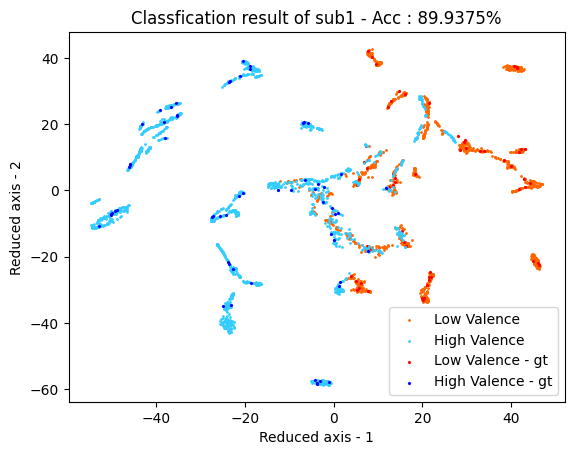

In [175]:

visualization_type = 1
sample = best_z.cpu().detach().numpy().copy()
drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
tsne_sample = StandardScaler().fit_transform(sample) # standardization
dr_result = drmodel.fit_transform(tsne_sample)

cf_name = 'Valence'
fig_name = 'GCN Encoder'
save_scatter_deap(dr_result, vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

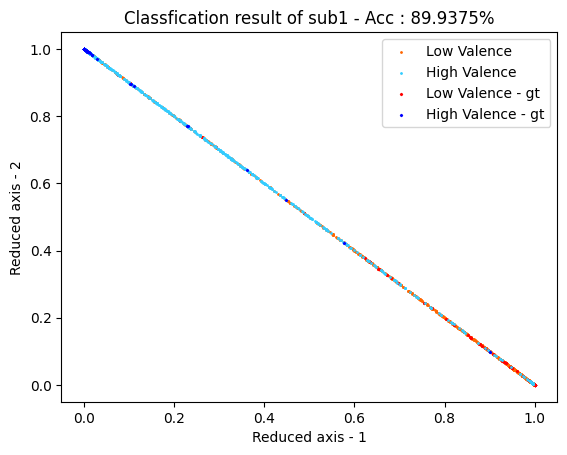

In [244]:
save_scatter_deap(result.detach().cpu().numpy(), vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


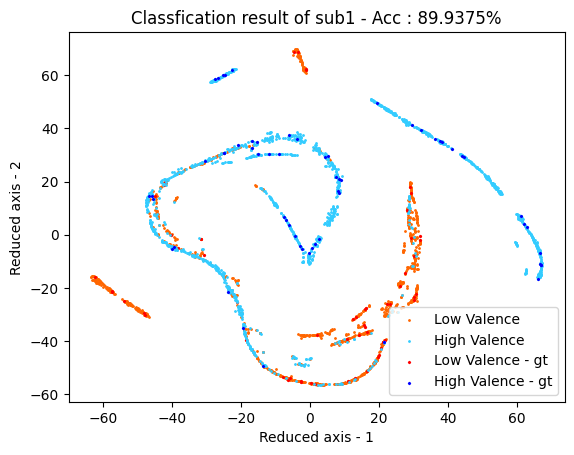

In [209]:
dr_result = feature.cpu().numpy()
visualization_type = 1
if visualization_type == 0:
    sample = result.cpu().detach().numpy().copy()
    drmodel = PCA(n_components = 2)
    pca_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(pca_sample)
    
elif visualization_type == 1:
    sample = result.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, n_iter_without_progress = 2000)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)
    
cf_name = 'Valence'
fig_name = 'Output'
save_scatter_deap(result, vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

In [100]:
class GraphConvolution(nn.Module):
    def __init__(self, in_channels, out_channels,
                 seed = 2023,
                 bias = False
                ):
        super(GraphConvolution, self).__init__()
        random.seed(seed)
        np.random.seed(seed)
        cp.random.seed(seed)
        os.environ["PYTHONHASHSEED"] = str(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)  # type: ignore
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True  # type: ignore
        torch.backends.cudnn.benchmark = False  # type: ignore
        
        self.weight = nn.Parameter(torch.empty(in_channels, out_channels))
        self.bias = None
        if bias:
            self.bias = nn.Parameter(torch.torch.empty(out_channels))
#         else:
#             self.register_parameter('bias',None)
        self.reset_parameters()
        
    def forward(self, x, adj):
        out = torch.mm(x, self.weight)
        out = torch.mm(adj, out)

        if self.bias is not None:
            out += self.bias
        return out
    
    def reset_parameters(self) -> None:
        nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
            bound = 1 / math.sqrt(fan_in)
            nn.init.uniform_(self.bias, -bound, bound)

class Encoder(nn.Module):
    def __init__(self, in_channels: int, hid_channels: int, out_channels: int, activation, seed, base_model=GraphConvolution):
        super(Encoder, self).__init__()
        self.base_model = base_model

        self.gcn1 = base_model(in_channels, hid_channels, seed, bias = True)
        self.gcn2 = base_model(hid_channels, out_channels, seed, bias = True)

        self.activation = activation

    def forward(self, x: torch.Tensor, edges: torch.Tensor):
        x = x.squeeze()
        x1 = self.activation(self.gcn1(x, edges))
        x2 = self.activation(self.gcn2(x1, edges))
        return x2
#         return torch.cat((x1,x2),axis=1)

class GRACE(nn.Module):
    def __init__(self, encoder: Encoder, num_in: int, num_hidden: int, num_proj_hidden: int, num_out: int, tau: float = 0.5):
        super(GRACE, self).__init__()
        self.encoder: Encoder = encoder
        self.tau: float = tau
        
        self.fc1 = nn.Linear(num_hidden, num_proj_hidden)
        self.fc2 = nn.Linear(num_proj_hidden, num_hidden)

        self.gcn_classifier = GraphConvolution(num_hidden, num_out, 2023, bias=False)
        self.fc_classifier = nn.Linear(num_hidden, num_out)
        self.activation = nn.CELU()
        self.num_hidden = num_hidden
        self.norm1d = nn.BatchNorm1d(num_in)

    def forward(self, x: torch.Tensor, edges:torch.Tensor) -> torch.Tensor:
#         x = self.norm1d(x)
        x = x.unsqueeze(dim=0)
        return self.encoder(x, edges)
    
    def decoder(self, z):
        return self.activation(torch.mm(z, z.t()))
    
    def classification(self, z: torch.Tensor) ->torch.Tensor:
#         return self.gcn_classifier(self.activation(z), adj)
        return self.fc_classifier(self.activation(z))
    
    def projection(self, z: torch.Tensor) -> torch.Tensor:
        z = self.activation(self.fc1(z))
        return self.fc2(z)

    def sim(self, z1: torch.Tensor, z2: torch.Tensor):
        z1 = F.normalize(z1)
        z2 = F.normalize(z2)
        return torch.mm(z1, z2.t())

    def semi_loss(self, z1: torch.Tensor, z2: torch.Tensor):
        f = lambda x: torch.exp(x / self.tau)
        refl_sim = f(self.sim(z1, z1))
        between_sim = f(self.sim(z1, z2))

        return -torch.log(between_sim.diag() / (refl_sim.sum(1) + between_sim.sum(1) - refl_sim.diag()))

    def batched_semi_loss(self, z1: torch.Tensor, z2: torch.Tensor, batch_size: int):
        # Space complexity: O(BN) (semi_loss: O(N^2))
        device = z1.device
        num_nodes = z1.size(0)
        num_batches = (num_nodes - 1) // batch_size + 1
        f = lambda x: torch.exp(x / self.tau)
        indices = torch.arange(0, num_nodes).to(device)
        losses = []

        for i in range(num_batches):
            mask = indices[i * batch_size:(i + 1) * batch_size]
            refl_sim = f(self.sim(z1[mask], z1))  # [B, N]
            between_sim = f(self.sim(z1[mask], z2))  # [B, N]

            losses.append(-torch.log(between_sim[:, i * batch_size:(i + 1) * batch_size].diag()
                                     / (refl_sim.sum(1) + between_sim.sum(1)
                                        - refl_sim[:, i * batch_size:(i + 1) * batch_size].diag())))

        return torch.cat(losses)

    def loss(self, h1: torch.Tensor, h2: torch.Tensor, mean: bool = True, batch_size: Optional[int] = None):

        if batch_size is None:
            l1 = self.semi_loss(h1, h2)
            l2 = self.semi_loss(h2, h1)
        else:
            l1 = self.batched_semi_loss(h1, h2, batch_size)
            l2 = self.batched_semi_loss(h2, h1, batch_size)

        ret = (l1 + l2) * 0.5
        ret = ret.mean() if mean else ret.sum()

        return ret


class LogReg(nn.Module):
    def __init__(self, ft_in, nb_classes):
        super(LogReg, self).__init__()
        self.fc = nn.Linear(ft_in, nb_classes)

        for m in self.modules():
            self.weights_init(m)

    def weights_init(self, m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight.data)
            if m.bias is not None:
                m.bias.data.fill_(0.0)

    def forward(self, seq):
        ret = self.fc(seq)
        return ret

# activation Relu, Gelu, leaky Relu, Elu 비교해보기


In [98]:
def accuracy(out, label, isbinary = False):
    if isbinary == True:
        out = torch.sigmoid(out)
    else:
        out = nn.functional.softmax(out, dim=1)
    pred = out.argmax(dim=1)
    iscorrect = torch.eq(pred,label).float()
    return iscorrect.mean()*100

def GCA_train(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False ):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        x1 = drop_features(feature, orig_adj, p = args.pf1, threshold = args.tpf1)
        x2 = drop_features(feature, orig_adj, p = args.pf2, threshold = args.tpf2)
        e1 = drop_edges(orig_adj, p = args.pe1, threshold = args.tpe1)
        e2 = drop_edges(orig_adj, p = args.pe2, threshold = args.tpe2)

#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)
 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]
        r1_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r1_y)
        r1_acc = accuracy(r1_pred, r1_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        r2_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r2_y)
        r2_acc = accuracy(r2_pred, r2_y, isdeap)

        
        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = (labeled_loss1 + labeled_loss2)/2. + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr1_pred = r1[test_identifier]
        tr1_y = label[test_identifier]
        tr1_loss = criterion(tr1_pred, tr1_y)
        tr1_acc = accuracy(tr1_pred, tr1_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr2_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr2_y)
        
        tr_acc = (tr1_acc + tr2_acc)/2.
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            best_z = z1 if tr1_acc > tr2_acc else z2
            
        if tr1_acc > tr2_acc:
            result = r1
        else:
            result = r2


        if epoch % 10 == 0:
            print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return model, best_acc, best_epoch, best_model, best_z, result



In [183]:
activation = get_activation('celu')
gcn = GraphConvolution

encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.005)

model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, vlc_label,
                                                                    vlc_train_identifier, vlc_test_identifier,
                                                                    args,device,date,sub_idx, isdeap=True)
print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
vlc_best_acc.append(round(best_acc.item(), 2))



Epoch 10 - Train Acc : 71.25    Train Loss : 0.58,    Test Acc : 63.58,    Test Loss :0.57,    Total Acc : 67.42
Epoch 20 - Train Acc : 71.67    Train Loss : 0.57,    Test Acc : 63.75,    Test Loss :0.63,    Total Acc : 67.71
Epoch 30 - Train Acc : 80.0    Train Loss : 0.48,    Test Acc : 70.79,    Test Loss :0.58,    Total Acc : 75.4
Epoch 40 - Train Acc : 79.17    Train Loss : 0.47,    Test Acc : 69.75,    Test Loss :0.51,    Total Acc : 74.46
Epoch 50 - Train Acc : 79.58    Train Loss : 0.45,    Test Acc : 69.83,    Test Loss :0.53,    Total Acc : 74.71
Epoch 60 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 76.79,    Test Loss :0.43,    Total Acc : 81.1
Epoch 70 - Train Acc : 91.25    Train Loss : 0.36,    Test Acc : 81.08,    Test Loss :0.41,    Total Acc : 86.17
Epoch 80 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 70.5,    Test Loss :0.55,    Total Acc : 75.67
Epoch 90 - Train Acc : 89.17    Train Loss : 0.39,    Test Acc : 77.77,    Test Loss :0.45,    Total

KeyboardInterrupt: 

In [26]:
    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

In [125]:
subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)

best_acc_list = []
orig_acc_list = []
visualization_type = 1

for i in range(32):
    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '230403'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    de,identifier = preprocessing(sub_de, sub_sample_counts, args.n_samples, args.n_labels_by_trials, args.n_nodes, args.n_features, args.seed)
    psd,_ = preprocessing(sub_psd, sub_sample_counts, args.n_samples, args.n_labels_by_trials, args.n_nodes, args.n_features, args.seed)

    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

    de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k, 'ma')
    psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k, 'ma')

    save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
    save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
    save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
    save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    adj = normalize_adj(fsm)
    save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
    save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    feature = input_feature(de, psd)
    label = sub_label

    save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(adj).to(torch.float32).to(device)
    label = torch.from_numpy(label).to(torch.long).to(device)

    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)

    activation = get_activation('celu')
    gcn = GraphConvolution

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, label,
                                                                        train_identifier, test_identifier,
                                                                        args,device,date,sub_idx, isdeap=False)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    best_acc_list.append(round(best_acc.item(), 2))
    orig_acc_list.append(best_acc.item())
    
#     sample = best_z.cpu().detach().numpy().copy()
#     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)

#     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)
    
print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))



******************* SUBJECT : 1 *********************

********** SSM construction start ***********

Distance matrix construction start...


KeyboardInterrupt: 

In [143]:
a = de_nssm[2,np.where(de_nssm[2,:] != 0)[0]]
print('array([', end='')
for i in range(a.shape[0]):
    print(a[i], end =', ')
print('])')


array([0.125288318688852, 0.16187658350763184, 0.5, 0.15054764496564038, 0.062659848323914, 0.0236575345872409, 0.009666561144266362, 0.0037886765601878687, 0.0014826543520613563, 0.0005680376663759199, 0.0002199489585758564, 8.349773640911185e-05, 3.288200821527913e-05, 1.3181151349232387e-05, 5.171399844355529e-06, 2.1215653770602543e-06, 8.374628711063562e-07, 3.544139960844629e-07, 1.5531067218068926e-07, 7.314040879891405e-08, 3.4159843979737185e-08, 1.7399565317002422e-08, 8.307411606494226e-09, 4.363941423618646e-09, 2.4714262453785982e-09, 1.449986202369129e-09, 9.46660938627347e-10, 6.35537230740467e-10, 4.809700193980676e-10, 3.838788396545066e-10, 3.052189373880034e-10, 2.376903225396117e-10, 1.739743218402121e-10, 1.3287590355143184e-10, 9.569319734330253e-11, 6.765370424895908e-11, 4.584142518350562e-11, 3.7369422120589703e-11, 3.363312932443213e-11, 3.2320507929354433e-11, 3.269386862188036e-11, 3.239469359889272e-11, 3.211750365977365e-11, 3.2501052204781735e-11, 3.27532



******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :0.56,    Total Acc : 96.28
Epoch 640 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.48,    Test Loss :0.63,    Total Acc : 96.03
Epoch 650 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.29,    Test Loss :0.59,    Total Acc : 95.44
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :0.42,    Total Acc : 96.91
Epoch 670 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 88.15,    Test Loss :0.75,    Total Acc : 92.61
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.23,    Test Loss :1.31,    Total Acc : 95.2
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.6,    Test Loss :0.94,    Total Acc : 94.59
Epoch 700 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.79,    Test Loss :1.98,    Total Acc : 94.56
Epoch 710 - Train Acc : 92.08    Train Loss : 9.23,    Test Acc : 82.46,    Test Loss :9.0

Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :2.03,    Total Acc : 96.77
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.71,    Test Loss :3.45,    Total Acc : 95.65
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.5,    Test Loss :1.77,    Total Acc : 94.12
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.69,    Test Loss :1.59,    Total Acc : 95.64
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.12,    Test Loss :1.93,    Total Acc : 95.56
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :2.54,    Total Acc : 95.64
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :1.87,    Total Acc : 96.26
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.46,    Test Loss :1.82,    Total Acc : 95.52
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.81,    Test L

Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.58,    Test Loss :2.56,    Total Acc : 95.79
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :2.63,    Total Acc : 95.8
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.6,    Test Loss :1.58,    Total Acc : 97.3
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.67,    Test Loss :3.05,    Total Acc : 95.12
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.23,    Test Loss :2.59,    Total Acc : 96.11
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.42,    Test Loss :1.89,    Total Acc : 96.0
Epoch 2170 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.08,    Test Loss :2.18,    Total Acc : 95.33
Epoch 2180 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 92.42,    Test Loss :2.22,    Total Acc : 94.96
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.35,    Test Loss

Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :0.81,    Total Acc : 96.07
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.92,    Test Loss :0.84,    Total Acc : 95.33
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.52,    Test Loss :1.01,    Total Acc : 94.64
Epoch 2870 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.25,    Test Loss :1.27,    Total Acc : 90.96
Epoch 2880 - Train Acc : 92.08    Train Loss : 0.42,    Test Acc : 80.6,    Test Loss :1.59,    Total Acc : 86.34
Epoch 2890 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 83.67,    Test Loss :1.32,    Total Acc : 89.54
Epoch 2900 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.75,    Test Loss :0.92,    Total Acc : 93.33
Epoch 2910 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.62,    Test Loss :0.6,    Total Acc : 95.19
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.67,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.5    Train Loss : 0.62,    Test Acc : 67.52,    Test Loss :0.64,    Total Acc : 70.01
Epoch 20 - Train Acc : 87.08    Train Loss : 0.4,    Test Acc : 75.9,    Test Loss :0.5,    Total Acc : 81.49
Epoch 30 - Train Acc : 76.67    Train Loss : 0.54,    Test Acc : 77.08,    Test Loss :0.54,    Total Acc : 76.88
Epoch 40 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 78.21,    Test Loss :0.53,    Total Acc : 84.1
Epoch 50 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 80.71,    Test Loss :0.46,    Total Acc : 85.77
Epoch 60 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 82.6,    Test Loss :0.49,    Total Acc : 85.26
Epoch 70 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 84.46,    Test Loss :0.36,    Total Acc : 88.48
Epoch 80 - Train Acc : 91.25    Train Loss : 0.3,    Test Acc : 83.77,    Test Loss :0.41,    Total Acc : 87.51
Epoch 90 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 78.33,    Test Loss :0.62,    Total Acc :

Epoch 750 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.06,    Test Loss :0.53,    Total Acc : 94.2
Epoch 760 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.12,    Test Loss :0.39,    Total Acc : 96.35
Epoch 770 - Train Acc : 98.33    Train Loss : 0.09,    Test Acc : 89.79,    Test Loss :0.5,    Total Acc : 94.06
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.42,    Total Acc : 96.5
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.35,    Test Loss :0.52,    Total Acc : 95.18
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.42,    Test Loss :0.49,    Total Acc : 95.21
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.29,    Test Loss :0.47,    Total Acc : 95.65
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.54,    Test Loss :0.55,    Total Acc : 95.06
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.39,

Epoch 1480 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.83,    Test Loss :0.67,    Total Acc : 95.5
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.56,    Test Loss :0.51,    Total Acc : 97.78
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.56,    Test Loss :0.63,    Total Acc : 97.28
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.61,    Total Acc : 97.47
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.58,    Test Loss :0.62,    Total Acc : 97.29
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.4,    Test Loss :0.69,    Total Acc : 97.49
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.06,    Test Loss :0.6,    Total Acc : 97.32
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.77,    Total Acc : 96.66
Epoch 1560 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 91.71,    Test L

Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.27,    Test Loss :0.9,    Total Acc : 96.14
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 94.06,    Test Loss :0.3,    Total Acc : 95.99
Epoch 2230 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.42,    Test Loss :0.3,    Total Acc : 94.96
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 92.92,    Test Loss :0.21,    Total Acc : 96.04
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 91.12,    Test Loss :0.54,    Total Acc : 95.15
Epoch 2260 - Train Acc : 96.25    Train Loss : 0.29,    Test Acc : 90.4,    Test Loss :0.44,    Total Acc : 93.32
Epoch 2270 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 88.92,    Test Loss :0.66,    Total Acc : 92.79
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.04,    Test Loss :0.48,    Total Acc : 96.52
Epoch 2290 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 89.54,    Test Los

Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.02,    Test Loss :0.89,    Total Acc : 97.3
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.62,    Test Loss :0.84,    Total Acc : 97.31
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.88,    Total Acc : 97.27
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.27,    Test Loss :0.97,    Total Acc : 96.93
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.46,    Test Loss :0.94,    Total Acc : 97.23
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.15,    Test Loss :0.97,    Total Acc : 96.57
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.25,    Test Loss :0.82,    Total Acc : 97.62
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.67,    Test Loss :0.82,    Total Acc : 97.83
*** Best ACC : 96.33 ***
directory already exists
arousal_test_acc_230331_mah_oSNF

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 2 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 650 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.9,    Test Loss :2.56,    Total Acc : 92.74
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.62,    Test Loss :2.49,    Total Acc : 92.31
Epoch 670 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.21,    Test Loss :2.48,    Total Acc : 92.6
Epoch 680 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.48,    Test Loss :2.49,    Total Acc : 92.74
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.31,    Test Loss :2.19,    Total Acc : 93.16
Epoch 700 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 86.12,    Test Loss :2.16,    Total Acc : 92.65
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.48,    Test Loss :2.22,    Total Acc : 92.74
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.48,    Test Loss :2.1,    Total Acc : 92.74
Epoch 730 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.6,    Test Loss :2.08,

Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.31,    Test Loss :4.96,    Total Acc : 92.95
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 86.54,    Test Loss :7.47,    Total Acc : 93.06
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.67,    Test Loss :10.61,    Total Acc : 93.83
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.02,    Test Loss :11.17,    Total Acc : 93.01
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.23,    Test Loss :14.25,    Total Acc : 92.61
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.83,    Test Loss :12.73,    Total Acc : 93.42
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.9,    Test Loss :18.4,    Total Acc : 92.95
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.38,    Test Loss :7.66,    Total Acc : 92.48
Epoch 1460 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 81.81,    

Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.08,    Test Loss :16.79,    Total Acc : 92.54
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.17,    Test Loss :20.74,    Total Acc : 91.38
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.4,    Test Loss :18.32,    Total Acc : 91.2
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.9,    Test Loss :20.2,    Total Acc : 91.74
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.27,    Test Loss :22.32,    Total Acc : 92.14
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.19,    Test Loss :25.77,    Total Acc : 92.09
Epoch 2180 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.94,    Test Loss :24.68,    Total Acc : 92.47
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.48,    Test Loss :23.83,    Total Acc : 92.24
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.69,   

Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.5,    Test Loss :7.68,    Total Acc : 93.25
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.62,    Test Loss :7.73,    Total Acc : 93.31
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.54,    Test Loss :10.62,    Total Acc : 92.56
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.52,    Test Loss :8.21,    Total Acc : 92.84
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.96,    Test Loss :7.74,    Total Acc : 93.27
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.06,    Test Loss :8.4,    Total Acc : 92.82
Epoch 2900 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 87.02,    Test Loss :5.85,    Total Acc : 93.3
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.29,    Test Loss :7.22,    Total Acc : 93.65
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.96,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.5    Train Loss : 0.58,    Test Acc : 66.71,    Test Loss :0.64,    Total Acc : 72.1
Epoch 20 - Train Acc : 80.0    Train Loss : 0.5,    Test Acc : 64.42,    Test Loss :0.99,    Total Acc : 72.21
Epoch 30 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 72.08,    Test Loss :0.91,    Total Acc : 80.83
Epoch 40 - Train Acc : 92.92    Train Loss : 0.2,    Test Acc : 78.73,    Test Loss :0.84,    Total Acc : 85.82
Epoch 50 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 78.46,    Test Loss :1.03,    Total Acc : 86.52
Epoch 60 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 79.31,    Test Loss :1.39,    Total Acc : 87.57
Epoch 70 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 78.73,    Test Loss :1.33,    Total Acc : 87.28
Epoch 80 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.23,    Test Loss :0.85,    Total Acc : 89.86
Epoch 90 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.46,    Test Loss :0.91,    Total Ac

Epoch 740 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.21,    Test Loss :1.58,    Total Acc : 93.6
Epoch 750 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.83,    Test Loss :1.41,    Total Acc : 93.92
Epoch 760 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.56,    Test Loss :1.6,    Total Acc : 93.78
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.88,    Test Loss :1.48,    Total Acc : 93.94
Epoch 780 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.4,    Test Loss :1.55,    Total Acc : 92.99
Epoch 790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.5,    Test Loss :1.38,    Total Acc : 93.54
Epoch 800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.9,    Test Loss :1.5,    Total Acc : 93.95
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.38,    Test Loss :1.6,    Total Acc : 93.48
Epoch 820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.02,    Test Loss :1.47,   

Epoch 1470 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.12,    Test Loss :1.49,    Total Acc : 92.31
Epoch 1480 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.88,    Test Loss :1.39,    Total Acc : 92.19
Epoch 1490 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.08,    Test Loss :1.63,    Total Acc : 91.79
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.73,    Test Loss :1.47,    Total Acc : 92.11
Epoch 1510 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 85.54,    Test Loss :1.6,    Total Acc : 91.52
Epoch 1520 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 88.06,    Test Loss :1.24,    Total Acc : 92.78
Epoch 1530 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 87.02,    Test Loss :0.94,    Total Acc : 92.05
Epoch 1540 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.94,    Test Loss :0.92,    Total Acc : 92.3
Epoch 1550 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.96,    Test Loss :1

Epoch 2200 - Train Acc : 65.0    Train Loss : 0.66,    Test Acc : 63.02,    Test Loss :0.74,    Total Acc : 64.01
Epoch 2210 - Train Acc : 65.0    Train Loss : 0.66,    Test Acc : 63.19,    Test Loss :0.82,    Total Acc : 64.09
Epoch 2220 - Train Acc : 66.25    Train Loss : 0.65,    Test Acc : 63.31,    Test Loss :0.94,    Total Acc : 64.78
Epoch 2230 - Train Acc : 66.25    Train Loss : 0.65,    Test Acc : 64.1,    Test Loss :1.03,    Total Acc : 65.18
Epoch 2240 - Train Acc : 67.5    Train Loss : 0.64,    Test Acc : 64.58,    Test Loss :0.68,    Total Acc : 66.04
Epoch 2250 - Train Acc : 67.08    Train Loss : 0.64,    Test Acc : 64.98,    Test Loss :0.66,    Total Acc : 66.03
Epoch 2260 - Train Acc : 67.5    Train Loss : 0.64,    Test Acc : 65.58,    Test Loss :0.6,    Total Acc : 66.54
Epoch 2270 - Train Acc : 67.08    Train Loss : 0.64,    Test Acc : 64.94,    Test Loss :0.94,    Total Acc : 66.01
Epoch 2280 - Train Acc : 68.33    Train Loss : 0.63,    Test Acc : 64.83,    Test Loss

Epoch 2940 - Train Acc : 72.92    Train Loss : 0.56,    Test Acc : 71.02,    Test Loss :2.04,    Total Acc : 71.97
Epoch 2950 - Train Acc : 72.5    Train Loss : 0.62,    Test Acc : 71.62,    Test Loss :2.18,    Total Acc : 72.06
Epoch 2960 - Train Acc : 71.67    Train Loss : 0.57,    Test Acc : 70.4,    Test Loss :0.87,    Total Acc : 71.03
Epoch 2970 - Train Acc : 71.67    Train Loss : 0.55,    Test Acc : 69.29,    Test Loss :0.84,    Total Acc : 70.48
Epoch 2980 - Train Acc : 72.5    Train Loss : 0.53,    Test Acc : 70.19,    Test Loss :0.8,    Total Acc : 71.34
Epoch 2990 - Train Acc : 73.33    Train Loss : 0.54,    Test Acc : 70.12,    Test Loss :1.58,    Total Acc : 71.73
Epoch 3000 - Train Acc : 72.92    Train Loss : 0.5,    Test Acc : 71.5,    Test Loss :1.15,    Total Acc : 72.21
*** Best ACC : 91.38 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 3 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (756,),    high valence : (1764,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm 

/tmp/ipykernel_96451/723135367.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


Epoch 10 - Train Acc : 69.17    Train Loss : 0.62,    Test Acc : 63.17,    Test Loss :0.74,    Total Acc : 66.17
Epoch 20 - Train Acc : 72.92    Train Loss : 0.58,    Test Acc : 64.35,    Test Loss :1.11,    Total Acc : 68.64
Epoch 30 - Train Acc : 83.33    Train Loss : 0.46,    Test Acc : 71.15,    Test Loss :0.65,    Total Acc : 77.24
Epoch 40 - Train Acc : 81.25    Train Loss : 0.43,    Test Acc : 65.27,    Test Loss :0.72,    Total Acc : 73.26
Epoch 50 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 75.92,    Test Loss :0.98,    Total Acc : 84.42
Epoch 60 - Train Acc : 93.75    Train Loss : 0.28,    Test Acc : 77.71,    Test Loss :1.15,    Total Acc : 85.73
Epoch 70 - Train Acc : 82.08    Train Loss : 0.69,    Test Acc : 76.83,    Test Loss :1.1,    Total Acc : 79.46
Epoch 80 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 75.12,    Test Loss :1.12,    Total Acc : 81.94
Epoch 90 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 75.5,    Test Loss :1.39,    Tot

Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.46,    Test Loss :1.9,    Total Acc : 94.73
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.94,    Test Loss :3.04,    Total Acc : 95.97
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.1,    Test Loss :3.15,    Total Acc : 94.55
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :2.38,    Total Acc : 96.58
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.77,    Test Loss :3.17,    Total Acc : 94.39
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.08,    Test Loss :2.93,    Total Acc : 93.33
Epoch 820 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.5,    Test Loss :1.54,    Total Acc : 93.92
Epoch 830 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 85.19,    Test Loss :3.88,    Total Acc : 91.76
Epoch 840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :0.43

Epoch 1480 - Train Acc : 96.25    Train Loss : 0.44,    Test Acc : 88.5,    Test Loss :0.95,    Total Acc : 92.38
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.83,    Test Loss :0.51,    Total Acc : 93.79
Epoch 1500 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 92.94,    Test Loss :0.36,    Total Acc : 95.84
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 90.94,    Test Loss :0.43,    Total Acc : 95.26
Epoch 1520 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 92.06,    Test Loss :0.38,    Total Acc : 93.95
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.88,    Test Loss :0.28,    Total Acc : 97.44
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 91.56,    Test Loss :0.37,    Total Acc : 94.53
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 96.52,    Test Loss :0.13,    Total Acc : 98.05
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.15,    Test L

Epoch 2210 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.88,    Test Loss :0.23,    Total Acc : 97.73
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.25,    Total Acc : 97.36
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.42,    Test Loss :0.22,    Total Acc : 98.21
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.02,    Test Loss :0.48,    Total Acc : 96.01
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.35,    Test Loss :0.28,    Total Acc : 97.18
Epoch 2260 - Train Acc : 93.75    Train Loss : 0.15,    Test Acc : 89.5,    Test Loss :0.26,    Total Acc : 91.62
Epoch 2270 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.29,    Test Loss :0.19,    Total Acc : 97.23
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :0.49,    Total Acc : 95.96
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.75,    Test

Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.44,    Test Loss :0.29,    Total Acc : 97.72
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.96,    Test Loss :0.32,    Total Acc : 97.48
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.58,    Test Loss :0.27,    Total Acc : 97.79
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.35,    Test Loss :0.37,    Total Acc : 97.18
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.44,    Test Loss :0.25,    Total Acc : 98.22
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.88,    Test Loss :0.34,    Total Acc : 97.44
*** Best ACC : 97.67 ***
directory already exists
valence_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.17    Train Loss : 0.65,    Test Acc : 53.44,    Test Loss :0.65,    Total Acc : 58.8
Epoch 20 - Train Acc : 75.83    Train Loss : 0.56,    Test Acc : 73.17,    Test Loss :0.56,    Total Acc : 74.5
Epoch 30 - Train Acc : 80.0    Train Loss : 0.47,    Test Acc : 78.19,    Test Loss :0.46,    Total Acc : 79.09
Epoch 40 - Train Acc : 86.67    Train Loss : 0.38,    Test Acc : 80.04,    Test Loss :0.45,    Total Acc : 83.35
Epoch 50 - Train Acc : 72.08    Train Loss : 0.61,    Test Acc : 72.4,    Test Loss :0.62,    Total Acc : 72.24
Epoch 60 - Train Acc : 89.58    Train Loss : 0.33,    Test Acc : 82.08,    Test Loss :0.41,    Total Acc : 85.83
Epoch 70 - Train Acc : 85.42    Train Loss : 0.35,    Test Acc : 78.9,    Test Loss :0.57,    Total Acc : 82.16
Epoch 80 - Train Acc : 84.58    Train Loss : 0.44,    Test Acc : 78.52,    Test Loss :0.52,    Total Acc : 81.55
Epoch 90 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 81.94,    Test Loss :0.38,    Total 

Epoch 760 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 89.23,    Test Loss :0.58,    Total Acc : 94.2
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.48,    Test Loss :0.28,    Total Acc : 96.32
Epoch 780 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.56,    Test Loss :0.29,    Total Acc : 95.66
Epoch 790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.1,    Test Loss :0.27,    Total Acc : 96.34
Epoch 800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.73,    Test Loss :0.33,    Total Acc : 96.16
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.33,    Total Acc : 96.62
Epoch 820 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 90.15,    Test Loss :0.43,    Total Acc : 93.82
Epoch 830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.71,    Test Loss :0.3,    Total Acc : 96.15
Epoch 840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.62,    Test Loss :0.22, 

Epoch 1490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.5,    Test Loss :0.72,    Total Acc : 97.25
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.63,    Total Acc : 96.77
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.32,    Total Acc : 97.07
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.64,    Total Acc : 97.36
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.42,    Test Loss :0.21,    Total Acc : 97.5
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.58,    Total Acc : 96.61
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :0.35,    Total Acc : 96.32
Epoch 1560 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.29,    Test Loss :0.46,    Total Acc : 96.44
Epoch 1570 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.33,    Test 

Epoch 2230 - Train Acc : 78.33    Train Loss : 0.48,    Test Acc : 74.58,    Test Loss :0.44,    Total Acc : 76.46
Epoch 2240 - Train Acc : 78.33    Train Loss : 0.5,    Test Acc : 73.27,    Test Loss :0.48,    Total Acc : 75.8
Epoch 2250 - Train Acc : 88.75    Train Loss : 0.36,    Test Acc : 78.4,    Test Loss :0.48,    Total Acc : 83.57
Epoch 2260 - Train Acc : 90.42    Train Loss : 0.38,    Test Acc : 81.46,    Test Loss :0.38,    Total Acc : 85.94
Epoch 2270 - Train Acc : 89.58    Train Loss : 0.39,    Test Acc : 81.9,    Test Loss :0.59,    Total Acc : 85.74
Epoch 2280 - Train Acc : 94.58    Train Loss : 0.26,    Test Acc : 85.6,    Test Loss :0.41,    Total Acc : 90.09
Epoch 2290 - Train Acc : 94.17    Train Loss : 0.25,    Test Acc : 86.75,    Test Loss :0.39,    Total Acc : 90.46
Epoch 2300 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 85.0,    Test Loss :0.44,    Total Acc : 88.96
Epoch 2310 - Train Acc : 95.83    Train Loss : 0.22,    Test Acc : 85.33,    Test Loss

Epoch 2970 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 89.31,    Test Loss :0.64,    Total Acc : 92.99
Epoch 2980 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 88.69,    Test Loss :3.63,    Total Acc : 92.68
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 89.75,    Test Loss :0.68,    Total Acc : 93.21
Epoch 3000 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 89.75,    Test Loss :1.43,    Total Acc : 93.21
*** Best ACC : 97.17 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 4 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 84.83,    Test Loss :0.83,    Total Acc : 90.75
Epoch 640 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 83.52,    Test Loss :0.92,    Total Acc : 90.51
Epoch 650 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 82.65,    Test Loss :1.3,    Total Acc : 90.07
Epoch 660 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.92,    Test Loss :1.26,    Total Acc : 92.04
Epoch 670 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 87.04,    Test Loss :0.93,    Total Acc : 91.85
Epoch 680 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.08,    Test Loss :1.18,    Total Acc : 91.0
Epoch 690 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.94,    Test Loss :1.11,    Total Acc : 92.55
Epoch 700 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.96,    Test Loss :1.22,    Total Acc : 91.27
Epoch 710 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.12,    Test Loss :1.06, 

Epoch 1360 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.42,    Test Loss :1.55,    Total Acc : 91.08
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.83,    Test Loss :1.41,    Total Acc : 92.71
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.69,    Test Loss :1.99,    Total Acc : 91.34
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.81,    Test Loss :1.39,    Total Acc : 92.2
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.69,    Test Loss :1.34,    Total Acc : 91.64
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.38,    Test Loss :1.23,    Total Acc : 92.06
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.96,    Test Loss :1.46,    Total Acc : 91.27
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.56,    Test Loss :1.27,    Total Acc : 92.78
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 84.67,    Test 

Epoch 2080 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 81.62,    Test Loss :3.93,    Total Acc : 89.98
Epoch 2090 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.69,    Test Loss :3.06,    Total Acc : 92.64
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.21,    Test Loss :2.89,    Total Acc : 92.1
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.12,    Test Loss :3.3,    Total Acc : 92.56
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.27,    Test Loss :3.59,    Total Acc : 93.64
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.58,    Test Loss :3.24,    Total Acc : 92.29
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.23,    Test Loss :3.46,    Total Acc : 91.61
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.81,    Test Loss :3.37,    Total Acc : 92.41
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.4,    Test L

Epoch 2810 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 79.48,    Test Loss :8.38,    Total Acc : 88.91
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.38,    Test Loss :4.62,    Total Acc : 90.77
Epoch 2830 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 82.52,    Test Loss :3.52,    Total Acc : 90.22
Epoch 2840 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 80.12,    Test Loss :3.35,    Total Acc : 89.02
Epoch 2850 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 81.62,    Test Loss :1.76,    Total Acc : 89.56
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.17,    Test Loss :1.68,    Total Acc : 92.17
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.69,    Test Loss :1.59,    Total Acc : 92.84
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.52,    Test Loss :1.44,    Total Acc : 90.09
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.29,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 80.0    Train Loss : 0.5,    Test Acc : 69.08,    Test Loss :0.77,    Total Acc : 74.54
Epoch 20 - Train Acc : 79.58    Train Loss : 0.42,    Test Acc : 68.73,    Test Loss :0.76,    Total Acc : 74.16
Epoch 30 - Train Acc : 83.75    Train Loss : 0.38,    Test Acc : 70.44,    Test Loss :0.9,    Total Acc : 77.09
Epoch 40 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 74.4,    Test Loss :0.76,    Total Acc : 78.86
Epoch 50 - Train Acc : 82.92    Train Loss : 0.38,    Test Acc : 71.0,    Test Loss :0.86,    Total Acc : 76.96
Epoch 60 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 70.98,    Test Loss :0.91,    Total Acc : 78.41
Epoch 70 - Train Acc : 89.17    Train Loss : 0.34,    Test Acc : 76.17,    Test Loss :0.87,    Total Acc : 82.67
Epoch 80 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 75.85,    Test Loss :1.03,    Total Acc : 82.3
Epoch 90 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 75.67,    Test Loss :0.99,    Total Ac

Epoch 760 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 86.67,    Test Loss :2.99,    Total Acc : 93.12
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.1,    Test Loss :3.17,    Total Acc : 94.05
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.77,    Test Loss :3.69,    Total Acc : 94.39
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.12,    Test Loss :2.15,    Total Acc : 94.06
Epoch 800 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.1,    Test Loss :2.68,    Total Acc : 93.55
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.02,    Test Loss :2.77,    Total Acc : 94.01
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.79,    Test Loss :2.79,    Total Acc : 93.69
Epoch 830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.02,    Test Loss :3.21,    Total Acc : 93.09
Epoch 840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.5,    Test Loss :2.44

Epoch 1480 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.69,    Test Loss :2.7,    Total Acc : 92.72
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.27,    Test Loss :2.64,    Total Acc : 93.64
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.58,    Test Loss :3.21,    Total Acc : 93.58
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.17,    Test Loss :2.39,    Total Acc : 93.58
Epoch 1520 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 84.4,    Test Loss :2.4,    Total Acc : 90.53
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 87.33,    Test Loss :2.2,    Total Acc : 93.46
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.06,    Test Loss :1.91,    Total Acc : 94.03
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.98,    Test Loss :1.98,    Total Acc : 93.07
Epoch 1560 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 82.65,    Test Los

Epoch 2220 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.75,    Test Loss :8.5,    Total Acc : 93.04
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.98,    Test Loss :6.43,    Total Acc : 93.57
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.62,    Test Loss :5.77,    Total Acc : 94.1
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.12,    Test Loss :6.57,    Total Acc : 94.06
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.06,    Test Loss :6.75,    Total Acc : 94.03
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :8.06,    Total Acc : 94.23
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.65,    Test Loss :8.26,    Total Acc : 93.41
Epoch 2290 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 87.48,    Test Loss :8.8,    Total Acc : 93.11
Epoch 2300 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.35,    Test Los

Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.9,    Test Loss :12.0,    Total Acc : 93.95
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.83,    Test Loss :9.71,    Total Acc : 93.92
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.81,    Test Loss :14.07,    Total Acc : 93.91
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.4,    Test Loss :11.21,    Total Acc : 93.7
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.04,    Test Loss :11.45,    Total Acc : 94.02
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.27,    Test Loss :11.55,    Total Acc : 93.64
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.85,    Test Loss :10.49,    Total Acc : 93.22
*** Best ACC : 89.79 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 5 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1575,),    high valence : (945,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.42,    Test Loss :0.39,    Total Acc : 96.0
Epoch 640 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.08,    Test Loss :0.4,    Total Acc : 95.83
Epoch 650 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.79,    Test Loss :0.43,    Total Acc : 96.27
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.92,    Test Loss :0.27,    Total Acc : 96.04
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.06,    Test Loss :0.61,    Total Acc : 94.61
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.6,    Test Loss :0.45,    Total Acc : 96.09
Epoch 690 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.42,    Test Loss :0.58,    Total Acc : 94.08
Epoch 700 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.15,    Test Loss :0.34,    Total Acc : 96.16
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.58,    

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.75,    Test Loss :0.44,    Total Acc : 96.88
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.62,    Total Acc : 96.68
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.44,    Test Loss :0.54,    Total Acc : 95.8
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.51,    Total Acc : 96.33
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.75,    Test Loss :0.69,    Total Acc : 96.17
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.49,    Total Acc : 96.66
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.67,    Test Loss :0.53,    Total Acc : 96.83
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.59,    Total Acc : 95.95
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.98,    Test 

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.23,    Test Loss :0.42,    Total Acc : 97.11
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.19,    Test Loss :0.51,    Total Acc : 97.09
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.25,    Test Loss :0.59,    Total Acc : 96.12
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.79,    Test Loss :0.5,    Total Acc : 96.9
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.71,    Total Acc : 95.72
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.19,    Test Loss :0.5,    Total Acc : 97.09
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.06,    Test Loss :0.57,    Total Acc : 96.53
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.25,    Test Loss :0.72,    Total Acc : 95.71
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.29,    Test L

Epoch 2810 - Train Acc : 87.08    Train Loss : 0.29,    Test Acc : 88.27,    Test Loss :0.73,    Total Acc : 87.68
Epoch 2820 - Train Acc : 88.33    Train Loss : 0.28,    Test Acc : 88.23,    Test Loss :0.64,    Total Acc : 88.28
Epoch 2830 - Train Acc : 88.75    Train Loss : 0.27,    Test Acc : 87.75,    Test Loss :0.59,    Total Acc : 88.25
Epoch 2840 - Train Acc : 87.92    Train Loss : 0.28,    Test Acc : 87.94,    Test Loss :0.7,    Total Acc : 87.93
Epoch 2850 - Train Acc : 88.33    Train Loss : 0.27,    Test Acc : 87.67,    Test Loss :0.69,    Total Acc : 88.0
Epoch 2860 - Train Acc : 89.17    Train Loss : 0.27,    Test Acc : 86.33,    Test Loss :1.21,    Total Acc : 87.75
Epoch 2870 - Train Acc : 88.33    Train Loss : 0.28,    Test Acc : 87.54,    Test Loss :0.99,    Total Acc : 87.94
Epoch 2880 - Train Acc : 88.75    Train Loss : 0.27,    Test Acc : 87.81,    Test Loss :0.98,    Total Acc : 88.28
Epoch 2890 - Train Acc : 88.75    Train Loss : 0.26,    Test Acc : 87.38,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.25    Train Loss : 0.58,    Test Acc : 71.79,    Test Loss :0.54,    Total Acc : 74.02
Epoch 20 - Train Acc : 77.5    Train Loss : 0.49,    Test Acc : 72.21,    Test Loss :0.47,    Total Acc : 74.85
Epoch 30 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 79.52,    Test Loss :0.4,    Total Acc : 82.47
Epoch 40 - Train Acc : 77.92    Train Loss : 0.66,    Test Acc : 73.48,    Test Loss :0.7,    Total Acc : 75.7
Epoch 50 - Train Acc : 90.0    Train Loss : 0.35,    Test Acc : 83.56,    Test Loss :0.42,    Total Acc : 86.78
Epoch 60 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 84.4,    Test Loss :0.35,    Total Acc : 88.24
Epoch 70 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 83.06,    Test Loss :0.43,    Total Acc : 86.95
Epoch 80 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 86.4,    Test Loss :0.39,    Total Acc : 90.91
Epoch 90 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 87.79,    Test Loss :0.43,    Total Ac

Epoch 750 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.54,    Test Loss :0.95,    Total Acc : 94.56
Epoch 760 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.06,    Test Loss :1.06,    Total Acc : 95.32
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.65,    Test Loss :0.88,    Total Acc : 94.82
Epoch 780 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.69,    Test Loss :0.85,    Total Acc : 94.43
Epoch 790 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.85,    Test Loss :0.91,    Total Acc : 94.3
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.5,    Test Loss :0.71,    Total Acc : 96.25
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.65,    Test Loss :0.97,    Total Acc : 95.82
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.15,    Test Loss :0.95,    Total Acc : 95.07
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.44,    Test Loss :0.81,

Epoch 1470 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 92.29,    Test Loss :1.13,    Total Acc : 95.31
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.83,    Test Loss :0.98,    Total Acc : 95.92
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.38,    Test Loss :1.01,    Total Acc : 95.69
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.21,    Test Loss :0.99,    Total Acc : 96.1
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :1.0,    Total Acc : 96.14
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.83,    Test Loss :1.0,    Total Acc : 95.0
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.33,    Test Loss :0.95,    Total Acc : 95.04
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.67,    Test Loss :1.36,    Total Acc : 95.12
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.17,    Test Loss :1.1,    Total Acc : 94.88
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.54,    Test Loss :1.21,    Total Acc : 95.56
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :1.04,    Total Acc : 94.95
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.77,    Test Loss :1.13,    Total Acc : 95.89
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.65,    Test Loss :1.22,    Total Acc : 95.82
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.81,    Test Loss :1.15,    Total Acc : 95.7
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.75,    Test Loss :1.21,    Total Acc : 95.88
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.06,    Test Loss :1.12,    Total Acc : 96.03
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.33,    Test 

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.81,    Test Loss :2.72,    Total Acc : 96.41
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.96,    Test Loss :3.2,    Total Acc : 95.98
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.5,    Test Loss :2.91,    Total Acc : 95.75
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.81,    Test Loss :2.37,    Total Acc : 96.41
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.9,    Test Loss :2.57,    Total Acc : 95.95
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.77,    Test Loss :3.1,    Total Acc : 95.18
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.88,    Test Loss :3.01,    Total Acc : 95.44
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :2.55,    Total Acc : 96.19
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.02,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 6 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 91.12,    Test Loss :0.75,    Total Acc : 94.52
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :0.88,    Total Acc : 94.95
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.75,    Test Loss :0.92,    Total Acc : 94.38
Epoch 670 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.35,    Test Loss :0.83,    Total Acc : 94.47
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :0.66,    Total Acc : 96.15
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.17,    Test Loss :0.68,    Total Acc : 96.08
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.77,    Test Loss :0.54,    Total Acc : 96.89
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss :0.66,    Total Acc : 96.81
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.83,    Test Loss :0.

Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :1.19,    Total Acc : 96.49
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.71,    Test Loss :1.15,    Total Acc : 96.85
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.96,    Test Loss :1.04,    Total Acc : 95.98
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.73,    Test Loss :1.11,    Total Acc : 96.36
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :1.18,    Total Acc : 94.74
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :1.07,    Total Acc : 96.49
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :1.0,    Total Acc : 96.91
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.19,    Test Loss :0.96,    Total Acc : 96.09
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.38,    Test 

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.33,    Test Loss :1.72,    Total Acc : 97.17
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.52,    Test Loss :1.93,    Total Acc : 96.76
Epoch 2110 - Train Acc : 91.67    Train Loss : 0.52,    Test Acc : 87.08,    Test Loss :3.19,    Total Acc : 89.38
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.83,    Test Loss :1.64,    Total Acc : 97.21
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.58,    Test Loss :1.45,    Total Acc : 97.08
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.5,    Test Loss :1.66,    Total Acc : 95.33
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.69,    Test Loss :1.43,    Total Acc : 97.34
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :1.51,    Total Acc : 96.28
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.5,    Test L

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.73,    Test Loss :1.02,    Total Acc : 97.36
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.29,    Test Loss :0.89,    Total Acc : 97.65
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.97,    Total Acc : 97.16
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.56,    Test Loss :0.98,    Total Acc : 97.78
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.73,    Test Loss :0.95,    Total Acc : 97.36
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.46,    Test Loss :0.91,    Total Acc : 96.73
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 96.25,    Test Loss :0.76,    Total Acc : 97.92
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.1,    Test Loss :1.02,    Total Acc : 95.64
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.29,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.08    Train Loss : 0.58,    Test Acc : 74.02,    Test Loss :0.53,    Total Acc : 75.55
Epoch 20 - Train Acc : 80.83    Train Loss : 0.42,    Test Acc : 78.48,    Test Loss :0.45,    Total Acc : 79.66
Epoch 30 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 78.44,    Test Loss :0.44,    Total Acc : 84.01
Epoch 40 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 75.58,    Test Loss :0.7,    Total Acc : 82.17
Epoch 50 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 85.23,    Test Loss :0.33,    Total Acc : 88.66
Epoch 60 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 83.42,    Test Loss :0.46,    Total Acc : 89.83
Epoch 70 - Train Acc : 86.67    Train Loss : 0.39,    Test Acc : 79.44,    Test Loss :0.93,    Total Acc : 83.05
Epoch 80 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 86.52,    Test Loss :0.5,    Total Acc : 91.39
Epoch 90 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.27,    Test Loss :0.5,    Total

Epoch 740 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.06,    Test Loss :0.53,    Total Acc : 94.61
Epoch 750 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.23,    Test Loss :0.84,    Total Acc : 94.41
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.56,    Test Loss :0.79,    Total Acc : 95.28
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :0.75,    Total Acc : 95.47
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.48,    Test Loss :0.77,    Total Acc : 95.24
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :0.63,    Total Acc : 95.96
Epoch 800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.67,    Test Loss :0.58,    Total Acc : 95.83
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.35,    Test Loss :0.82,    Total Acc : 95.18
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.06,    Test Loss :0

Epoch 1460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.48,    Test Loss :0.88,    Total Acc : 95.24
Epoch 1470 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.1,    Test Loss :0.9,    Total Acc : 95.55
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.88,    Test Loss :0.77,    Total Acc : 95.44
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.1,    Test Loss :0.82,    Total Acc : 95.55
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.4,    Test Loss :1.03,    Total Acc : 95.7
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.17,    Test Loss :0.85,    Total Acc : 95.58
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.44,    Test Loss :0.96,    Total Acc : 95.72
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.62,    Test Loss :0.82,    Total Acc : 95.31
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Los

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.71,    Test Loss :1.19,    Total Acc : 94.85
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.08,    Test Loss :1.33,    Total Acc : 94.54
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.38,    Test Loss :1.38,    Total Acc : 94.69
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.31,    Test Loss :1.7,    Total Acc : 93.95
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.35,    Test Loss :1.32,    Total Acc : 94.68
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.25,    Test Loss :1.32,    Total Acc : 94.62
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.15,    Test Loss :1.14,    Total Acc : 95.07
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.96,    Test Loss :1.44,    Total Acc : 94.98
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.48,    Test

Epoch 2910 - Train Acc : 85.42    Train Loss : 0.35,    Test Acc : 77.77,    Test Loss :0.76,    Total Acc : 81.59
Epoch 2920 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 77.4,    Test Loss :0.82,    Total Acc : 81.61
Epoch 2930 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 77.73,    Test Loss :0.83,    Total Acc : 81.78
Epoch 2940 - Train Acc : 84.17    Train Loss : 0.37,    Test Acc : 73.35,    Test Loss :1.03,    Total Acc : 78.76
Epoch 2950 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 77.65,    Test Loss :0.85,    Total Acc : 81.74
Epoch 2960 - Train Acc : 85.0    Train Loss : 0.36,    Test Acc : 77.1,    Test Loss :0.87,    Total Acc : 81.05
Epoch 2970 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 77.6,    Test Loss :0.89,    Total Acc : 81.72
Epoch 2980 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 76.81,    Test Loss :0.91,    Total Acc : 81.32
Epoch 2990 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 77.27,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 7 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1701,),    high arousal : (819,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm 

Epoch 630 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.46,    Test Loss :0.33,    Total Acc : 94.31
Epoch 640 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.1,    Test Loss :0.25,    Total Acc : 96.64
Epoch 650 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 90.23,    Test Loss :0.67,    Total Acc : 93.66
Epoch 660 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.08,    Test Loss :0.34,    Total Acc : 94.92
Epoch 670 - Train Acc : 97.5    Train Loss : 0.27,    Test Acc : 92.85,    Test Loss :0.28,    Total Acc : 95.18
Epoch 680 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 94.81,    Test Loss :0.13,    Total Acc : 96.16
Epoch 690 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 92.98,    Test Loss :0.29,    Total Acc : 96.49
Epoch 700 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.62,    Test Loss :0.34,    Total Acc : 95.4
Epoch 710 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.69,    Test Loss :0.17,  

Epoch 1360 - Train Acc : 86.25    Train Loss : 0.32,    Test Acc : 85.33,    Test Loss :0.66,    Total Acc : 85.79
Epoch 1370 - Train Acc : 82.92    Train Loss : 0.36,    Test Acc : 83.83,    Test Loss :0.49,    Total Acc : 83.38
Epoch 1380 - Train Acc : 83.33    Train Loss : 0.34,    Test Acc : 84.12,    Test Loss :0.6,    Total Acc : 83.73
Epoch 1390 - Train Acc : 83.33    Train Loss : 0.35,    Test Acc : 82.69,    Test Loss :1.4,    Total Acc : 83.01
Epoch 1400 - Train Acc : 83.33    Train Loss : 0.35,    Test Acc : 84.19,    Test Loss :0.53,    Total Acc : 83.76
Epoch 1410 - Train Acc : 90.0    Train Loss : 0.32,    Test Acc : 85.44,    Test Loss :1.99,    Total Acc : 87.72
Epoch 1420 - Train Acc : 76.67    Train Loss : 0.39,    Test Acc : 57.9,    Test Loss :0.58,    Total Acc : 67.28
Epoch 1430 - Train Acc : 83.33    Train Loss : 0.35,    Test Acc : 83.65,    Test Loss :0.7,    Total Acc : 83.49
Epoch 1440 - Train Acc : 83.33    Train Loss : 0.35,    Test Acc : 84.06,    Test Los

Epoch 2080 - Train Acc : 83.33    Train Loss : 0.41,    Test Acc : 82.58,    Test Loss :1.1,    Total Acc : 82.96
Epoch 2090 - Train Acc : 83.33    Train Loss : 0.41,    Test Acc : 82.46,    Test Loss :1.24,    Total Acc : 82.9
Epoch 2100 - Train Acc : 82.92    Train Loss : 0.41,    Test Acc : 83.25,    Test Loss :0.98,    Total Acc : 83.08
Epoch 2110 - Train Acc : 84.17    Train Loss : 0.39,    Test Acc : 83.02,    Test Loss :1.14,    Total Acc : 83.59
Epoch 2120 - Train Acc : 83.33    Train Loss : 0.39,    Test Acc : 83.21,    Test Loss :0.82,    Total Acc : 83.27
Epoch 2130 - Train Acc : 82.92    Train Loss : 0.4,    Test Acc : 82.04,    Test Loss :1.24,    Total Acc : 82.48
Epoch 2140 - Train Acc : 83.33    Train Loss : 0.39,    Test Acc : 81.56,    Test Loss :1.71,    Total Acc : 82.45
Epoch 2150 - Train Acc : 83.33    Train Loss : 0.39,    Test Acc : 81.75,    Test Loss :1.95,    Total Acc : 82.54
Epoch 2160 - Train Acc : 83.33    Train Loss : 0.37,    Test Acc : 82.25,    Test L

Epoch 2800 - Train Acc : 83.33    Train Loss : 0.32,    Test Acc : 81.44,    Test Loss :2.32,    Total Acc : 82.39
Epoch 2810 - Train Acc : 83.33    Train Loss : 0.31,    Test Acc : 82.25,    Test Loss :1.57,    Total Acc : 82.79
Epoch 2820 - Train Acc : 85.42    Train Loss : 0.29,    Test Acc : 74.19,    Test Loss :1.53,    Total Acc : 79.8
Epoch 2830 - Train Acc : 85.83    Train Loss : 0.29,    Test Acc : 73.5,    Test Loss :3.3,    Total Acc : 79.67
Epoch 2840 - Train Acc : 85.83    Train Loss : 0.29,    Test Acc : 74.65,    Test Loss :1.49,    Total Acc : 80.24
Epoch 2850 - Train Acc : 82.5    Train Loss : 0.4,    Test Acc : 79.1,    Test Loss :5.8,    Total Acc : 80.8
Epoch 2860 - Train Acc : 82.5    Train Loss : 0.44,    Test Acc : 82.71,    Test Loss :0.64,    Total Acc : 82.6
Epoch 2870 - Train Acc : 83.33    Train Loss : 0.42,    Test Acc : 81.19,    Test Loss :2.69,    Total Acc : 82.26
Epoch 2880 - Train Acc : 83.33    Train Loss : 0.42,    Test Acc : 80.6,    Test Loss :5.0

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.5    Train Loss : 0.58,    Test Acc : 74.15,    Test Loss :0.55,    Total Acc : 75.82
Epoch 20 - Train Acc : 87.92    Train Loss : 0.39,    Test Acc : 79.21,    Test Loss :0.64,    Total Acc : 83.56
Epoch 30 - Train Acc : 88.33    Train Loss : 0.43,    Test Acc : 70.6,    Test Loss :0.89,    Total Acc : 79.47
Epoch 40 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 75.94,    Test Loss :0.92,    Total Acc : 82.55
Epoch 50 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 81.27,    Test Loss :0.74,    Total Acc : 86.89
Epoch 60 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 83.46,    Test Loss :0.65,    Total Acc : 87.98
Epoch 70 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 82.15,    Test Loss :0.63,    Total Acc : 87.74
Epoch 80 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 81.71,    Test Loss :1.37,    Total Acc : 88.35
Epoch 90 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 79.54,    Test Loss :1.64,    Total 

Epoch 750 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.67,    Test Loss :2.43,    Total Acc : 92.12
Epoch 760 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 83.12,    Test Loss :2.05,    Total Acc : 89.9
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.85,    Test Loss :1.66,    Total Acc : 92.72
Epoch 780 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.62,    Test Loss :2.28,    Total Acc : 91.81
Epoch 790 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.79,    Test Loss :2.4,    Total Acc : 91.48
Epoch 800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.06,    Test Loss :2.58,    Total Acc : 92.32
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.33,    Test Loss :2.3,    Total Acc : 92.67
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.85,    Test Loss :2.24,    Total Acc : 93.22
Epoch 830 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 82.9,    Test Loss :2.7,  

Epoch 1470 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.69,    Test Loss :3.05,    Total Acc : 91.64
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.29,    Test Loss :3.25,    Total Acc : 93.15
Epoch 1490 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 86.42,    Test Loss :3.02,    Total Acc : 92.17
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.12,    Test Loss :2.47,    Total Acc : 92.56
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.0,    Test Loss :2.37,    Total Acc : 92.79
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 81.92,    Test Loss :2.85,    Total Acc : 90.75
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 84.96,    Test Loss :2.5,    Total Acc : 91.85
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.67,    Test Loss :2.54,    Total Acc : 91.92
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.27,    Test 

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.12,    Test Loss :4.88,    Total Acc : 91.85
Epoch 2200 - Train Acc : 95.42    Train Loss : 0.57,    Test Acc : 81.73,    Test Loss :5.75,    Total Acc : 88.57
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.44,    Test Loss :2.71,    Total Acc : 90.59
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.65,    Test Loss :2.88,    Total Acc : 92.11
Epoch 2230 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 75.71,    Test Loss :2.35,    Total Acc : 84.94
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.94,    Test Loss :5.41,    Total Acc : 92.05
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.83,    Test Loss :4.64,    Total Acc : 91.0
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.62,    Test Loss :5.45,    Total Acc : 92.81
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 79.65,    Test 

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.27,    Test Loss :12.73,    Total Acc : 92.64
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.81,    Test Loss :13.16,    Total Acc : 92.41
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.33,    Test Loss :11.16,    Total Acc : 92.67
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.94,    Test Loss :9.95,    Total Acc : 92.47
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.62,    Test Loss :11.9,    Total Acc : 91.81
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.4,    Test Loss :11.38,    Total Acc : 91.99
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.19,    Test Loss :11.15,    Total Acc : 92.39
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.15,    Test Loss :12.93,    Total Acc : 92.57
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.46,  

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 8 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 80.98,    Test Loss :3.14,    Total Acc : 89.45
Epoch 650 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.25,    Test Loss :1.87,    Total Acc : 90.71
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.79,    Test Loss :2.58,    Total Acc : 90.98
Epoch 670 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 82.5,    Test Loss :2.33,    Total Acc : 90.21
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.73,    Test Loss :2.19,    Total Acc : 89.95
Epoch 690 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.56,    Test Loss :2.76,    Total Acc : 90.36
Epoch 700 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.65,    Test Loss :2.7,    Total Acc : 90.41
Epoch 710 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.19,    Test Loss :2.5,    Total Acc : 90.68
Epoch 720 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 80.98,    Test Loss :2.33,  

Epoch 1380 - Train Acc : 82.92    Train Loss : 0.42,    Test Acc : 73.52,    Test Loss :1.8,    Total Acc : 78.22
Epoch 1390 - Train Acc : 83.75    Train Loss : 0.41,    Test Acc : 74.06,    Test Loss :1.83,    Total Acc : 78.91
Epoch 1400 - Train Acc : 83.33    Train Loss : 0.41,    Test Acc : 73.25,    Test Loss :1.98,    Total Acc : 78.29
Epoch 1410 - Train Acc : 85.42    Train Loss : 0.38,    Test Acc : 74.4,    Test Loss :2.03,    Total Acc : 79.91
Epoch 1420 - Train Acc : 83.33    Train Loss : 0.42,    Test Acc : 73.0,    Test Loss :1.86,    Total Acc : 78.17
Epoch 1430 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 74.67,    Test Loss :2.34,    Total Acc : 80.25
Epoch 1440 - Train Acc : 80.83    Train Loss : 0.44,    Test Acc : 70.65,    Test Loss :2.1,    Total Acc : 75.74
Epoch 1450 - Train Acc : 80.0    Train Loss : 0.45,    Test Acc : 67.9,    Test Loss :2.1,    Total Acc : 73.95
Epoch 1460 - Train Acc : 84.17    Train Loss : 0.4,    Test Acc : 74.15,    Test Loss :

Epoch 2100 - Train Acc : 78.33    Train Loss : 0.46,    Test Acc : 72.08,    Test Loss :4.12,    Total Acc : 75.21
Epoch 2110 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 72.31,    Test Loss :4.1,    Total Acc : 75.74
Epoch 2120 - Train Acc : 78.75    Train Loss : 0.45,    Test Acc : 73.12,    Test Loss :3.69,    Total Acc : 75.94
Epoch 2130 - Train Acc : 78.75    Train Loss : 0.45,    Test Acc : 70.88,    Test Loss :4.25,    Total Acc : 74.81
Epoch 2140 - Train Acc : 78.75    Train Loss : 0.45,    Test Acc : 71.83,    Test Loss :3.97,    Total Acc : 75.29
Epoch 2150 - Train Acc : 79.58    Train Loss : 0.44,    Test Acc : 71.75,    Test Loss :4.06,    Total Acc : 75.67
Epoch 2160 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 72.81,    Test Loss :4.13,    Total Acc : 75.99
Epoch 2170 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 72.58,    Test Loss :4.02,    Total Acc : 75.88
Epoch 2180 - Train Acc : 80.42    Train Loss : 0.43,    Test Acc : 72.27,    Test

Epoch 2820 - Train Acc : 67.5    Train Loss : 0.59,    Test Acc : 63.5,    Test Loss :1.12,    Total Acc : 65.5
Epoch 2830 - Train Acc : 67.5    Train Loss : 0.58,    Test Acc : 63.81,    Test Loss :0.95,    Total Acc : 65.66
Epoch 2840 - Train Acc : 67.5    Train Loss : 0.58,    Test Acc : 64.23,    Test Loss :1.07,    Total Acc : 65.86
Epoch 2850 - Train Acc : 67.5    Train Loss : 0.57,    Test Acc : 63.75,    Test Loss :0.92,    Total Acc : 65.62
Epoch 2860 - Train Acc : 67.08    Train Loss : 0.58,    Test Acc : 63.67,    Test Loss :1.0,    Total Acc : 65.38
Epoch 2870 - Train Acc : 67.08    Train Loss : 0.58,    Test Acc : 64.65,    Test Loss :0.91,    Total Acc : 65.86
Epoch 2880 - Train Acc : 66.25    Train Loss : 0.63,    Test Acc : 62.73,    Test Loss :1.35,    Total Acc : 64.49
Epoch 2890 - Train Acc : 67.5    Train Loss : 0.57,    Test Acc : 63.46,    Test Loss :0.89,    Total Acc : 65.48
Epoch 2900 - Train Acc : 67.08    Train Loss : 0.57,    Test Acc : 64.17,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 84.58    Train Loss : 0.47,    Test Acc : 76.73,    Test Loss :0.54,    Total Acc : 80.66
Epoch 20 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 84.88,    Test Loss :0.54,    Total Acc : 88.9
Epoch 30 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.62,    Test Loss :0.41,    Total Acc : 93.69
Epoch 40 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 87.73,    Test Loss :0.85,    Total Acc : 93.24
Epoch 50 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 96.17,    Test Loss :0.17,    Total Acc : 97.46
Epoch 60 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.48,    Test Loss :0.29,    Total Acc : 95.53
Epoch 70 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.48,    Test Loss :0.29,    Total Acc : 96.24
Epoch 80 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.33,    Total Acc : 96.19
Epoch 90 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.02,    Test Loss :0.33,    Tota

Epoch 740 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :1.51,    Total Acc : 96.49
Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :1.7,    Total Acc : 96.53
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.58,    Test Loss :1.14,    Total Acc : 96.79
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.5,    Test Loss :0.95,    Total Acc : 96.54
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.58,    Test Loss :1.42,    Total Acc : 95.79
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.44,    Test Loss :1.35,    Total Acc : 96.22
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.31,    Test Loss :1.4,    Total Acc : 95.66
Epoch 810 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 91.65,    Test Loss :1.35,    Total Acc : 95.61
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.61

Epoch 1460 - Train Acc : 96.25    Train Loss : 0.32,    Test Acc : 81.54,    Test Loss :3.1,    Total Acc : 88.9
Epoch 1470 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :2.13,    Total Acc : 96.59
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :1.24,    Total Acc : 97.58
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.06,    Test Loss :1.11,    Total Acc : 97.53
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.15,    Test Loss :1.33,    Total Acc : 96.57
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.42,    Test Loss :1.54,    Total Acc : 96.71
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.4,    Test Loss :1.0,    Total Acc : 97.2
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.92,    Test Loss :1.17,    Total Acc : 97.46
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.15,    Test Loss

Epoch 2180 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.04,    Test Loss :1.84,    Total Acc : 95.52
Epoch 2190 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.15,    Test Loss :1.59,    Total Acc : 93.45
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :1.31,    Total Acc : 96.77
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.8,    Total Acc : 96.83
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.44,    Test Loss :0.46,    Total Acc : 97.51
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.27,    Test Loss :1.4,    Total Acc : 96.64
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :1.59,    Total Acc : 95.9
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.83,    Test Loss :1.38,    Total Acc : 97.21
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.85,    Test L

Epoch 2900 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.19,    Test Loss :3.23,    Total Acc : 96.39
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :2.88,    Total Acc : 96.8
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.73,    Test Loss :3.04,    Total Acc : 96.86
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.81,    Test Loss :3.7,    Total Acc : 95.41
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.92,    Test Loss :3.1,    Total Acc : 96.96
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.83,    Test Loss :2.65,    Total Acc : 96.92
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :2.4,    Total Acc : 97.16
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.12,    Test Loss :2.87,    Total Acc : 97.06
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.48,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 9 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 93.75    Train Loss : 0.58,    Test Acc : 88.1,    Test Loss :0.94,    Total Acc : 90.93
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.4,    Test Loss :0.19,    Total Acc : 97.2
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.51,    Total Acc : 97.16
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.96,    Test Loss :0.7,    Total Acc : 96.98
Epoch 680 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 86.88,    Test Loss :1.76,    Total Acc : 92.19
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.71,    Test Loss :0.29,    Total Acc : 97.35
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.77,    Test Loss :0.55,    Total Acc : 96.39
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.48,    Test Loss :0.68,    Total Acc : 96.24
Epoch 720 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.69,    Test Loss :0.81, 

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.88,    Test Loss :0.54,    Total Acc : 96.44
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.83,    Test Loss :0.58,    Total Acc : 95.92
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :0.52,    Total Acc : 96.53
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :0.78,    Total Acc : 96.05
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.71,    Test Loss :0.92,    Total Acc : 95.85
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.75,    Test Loss :1.09,    Total Acc : 95.88
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.85,    Test Loss :0.9,    Total Acc : 96.43
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.95,    Total Acc : 96.48
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.02,    Test 

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.04,    Test Loss :2.33,    Total Acc : 96.52
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.79,    Test Loss :1.89,    Total Acc : 96.4
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.19,    Test Loss :2.32,    Total Acc : 96.09
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :2.57,    Total Acc : 96.21
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :2.37,    Total Acc : 96.28
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :1.98,    Total Acc : 96.5
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.62,    Test Loss :2.29,    Total Acc : 96.31
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :1.66,    Total Acc : 96.3
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.06,    Test Los

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.69,    Test Loss :2.94,    Total Acc : 95.84
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.9,    Test Loss :3.19,    Total Acc : 95.95
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.85,    Test Loss :2.63,    Total Acc : 96.43
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.25,    Test Loss :2.92,    Total Acc : 96.12
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :3.51,    Total Acc : 96.05
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.12,    Test Loss :3.11,    Total Acc : 96.06
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :3.43,    Total Acc : 96.16
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.98,    Test Loss :2.62,    Total Acc : 95.99
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.69,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 82.92    Train Loss : 0.47,    Test Acc : 73.62,    Test Loss :0.47,    Total Acc : 78.27
Epoch 20 - Train Acc : 85.83    Train Loss : 0.33,    Test Acc : 80.33,    Test Loss :0.56,    Total Acc : 83.08
Epoch 30 - Train Acc : 94.58    Train Loss : 0.25,    Test Acc : 81.96,    Test Loss :0.61,    Total Acc : 88.27
Epoch 40 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 84.52,    Test Loss :0.68,    Total Acc : 90.59
Epoch 50 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 84.67,    Test Loss :0.66,    Total Acc : 90.88
Epoch 60 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 86.29,    Test Loss :0.68,    Total Acc : 91.06
Epoch 70 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 78.23,    Test Loss :1.0,    Total Acc : 85.36
Epoch 80 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 84.12,    Test Loss :0.7,    Total Acc : 91.44
Epoch 90 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.02,    Test Loss :0.56,    Tota

Epoch 760 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.23,    Test Loss :0.65,    Total Acc : 94.41
Epoch 770 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.04,    Test Loss :0.94,    Total Acc : 93.4
Epoch 780 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.69,    Test Loss :0.76,    Total Acc : 93.3
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.23,    Test Loss :0.8,    Total Acc : 95.11
Epoch 800 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.6,    Test Loss :0.76,    Total Acc : 95.39
Epoch 810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.6,    Test Loss :1.43,    Total Acc : 95.3
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.04,    Test Loss :0.82,    Total Acc : 96.02
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.52,    Test Loss :1.02,    Total Acc : 93.76
Epoch 840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.0,    Test Loss :0.69,   

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.06,    Test Loss :1.69,    Total Acc : 94.53
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.06,    Test Loss :2.11,    Total Acc : 93.41
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.15,    Test Loss :1.85,    Total Acc : 93.86
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.79,    Test Loss :1.63,    Total Acc : 95.19
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.0,    Test Loss :2.97,    Total Acc : 95.0
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.67,    Test Loss :1.4,    Total Acc : 94.33
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.65,    Test Loss :3.21,    Total Acc : 93.7
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :1.3,    Total Acc : 95.55
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.6,    Test Loss :0

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.25,    Test Loss :1.83,    Total Acc : 95.62
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :1.12,    Total Acc : 96.15
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.88,    Test Loss :1.27,    Total Acc : 95.94
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :1.21,    Total Acc : 95.93
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.94,    Test Loss :1.41,    Total Acc : 95.97
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.73,    Test Loss :1.06,    Total Acc : 96.36
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.81,    Test Loss :1.43,    Total Acc : 95.91
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :1.01,    Total Acc : 95.96
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Tes

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.71,    Test Loss :0.72,    Total Acc : 95.35
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.69,    Test Loss :0.83,    Total Acc : 95.84
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :1.76,    Total Acc : 96.5
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.46,    Test Loss :0.72,    Total Acc : 96.23
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.8,    Total Acc : 96.47
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.46,    Test Loss :1.76,    Total Acc : 96.23
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :0.75,    Total Acc : 96.49
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.29,    Test Loss :0.73,    Total Acc : 96.65
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.31,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 10 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 86.29,    Test Loss :1.06,    Total Acc : 92.1
Epoch 650 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.0,    Test Loss :0.93,    Total Acc : 93.79
Epoch 660 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.29,    Test Loss :0.75,    Total Acc : 94.44
Epoch 670 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.38,    Test Loss :0.85,    Total Acc : 94.06
Epoch 680 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 86.31,    Test Loss :0.77,    Total Acc : 92.11
Epoch 690 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.29,    Test Loss :0.6,    Total Acc : 93.81
Epoch 700 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.5,    Test Loss :0.54,    Total Acc : 95.25
Epoch 710 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.83,    Test Loss :0.6,    Total Acc : 94.29
Epoch 720 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.56,    Test Loss :0.78, 

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.29,    Test Loss :0.87,    Total Acc : 93.94
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.23,    Test Loss :1.15,    Total Acc : 94.7
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 90.12,    Test Loss :0.87,    Total Acc : 94.44
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.25,    Test Loss :0.91,    Total Acc : 95.21
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.75,    Test Loss :1.05,    Total Acc : 95.17
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.9,    Test Loss :1.29,    Total Acc : 95.45
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :1.01,    Total Acc : 95.36
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.21,    Test Loss :0.84,    Total Acc : 94.9
Epoch 1450 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.62,    Test Loss 

Epoch 2090 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 86.46,    Test Loss :0.85,    Total Acc : 91.35
Epoch 2100 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.31,    Test Loss :0.82,    Total Acc : 91.7
Epoch 2110 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.73,    Test Loss :0.8,    Total Acc : 92.61
Epoch 2120 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 85.71,    Test Loss :0.78,    Total Acc : 91.19
Epoch 2130 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 87.5,    Test Loss :0.86,    Total Acc : 92.71
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.52,    Test Loss :0.71,    Total Acc : 93.72
Epoch 2150 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.56,    Test Loss :0.89,    Total Acc : 92.53
Epoch 2160 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 89.81,    Test Loss :0.93,    Total Acc : 94.28
Epoch 2170 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 90.75,    Test Los

Epoch 2810 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.02,    Test Loss :0.96,    Total Acc : 94.39
Epoch 2820 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.83,    Test Loss :1.14,    Total Acc : 94.08
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.88,    Test Loss :1.71,    Total Acc : 93.81
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.31,    Test Loss :1.58,    Total Acc : 94.03
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.5,    Test Loss :1.23,    Total Acc : 94.83
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 90.19,    Test Loss :1.42,    Total Acc : 94.47
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.58,    Test Loss :1.57,    Total Acc : 93.67
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 86.81,    Test Loss :2.06,    Total Acc : 91.74
Epoch 2890 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 87.85,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 78.33    Train Loss : 0.53,    Test Acc : 71.81,    Test Loss :0.48,    Total Acc : 75.07
Epoch 20 - Train Acc : 83.75    Train Loss : 0.48,    Test Acc : 75.67,    Test Loss :0.42,    Total Acc : 79.71
Epoch 30 - Train Acc : 80.83    Train Loss : 0.47,    Test Acc : 79.67,    Test Loss :0.35,    Total Acc : 80.25
Epoch 40 - Train Acc : 80.83    Train Loss : 0.45,    Test Acc : 81.9,    Test Loss :0.33,    Total Acc : 81.36
Epoch 50 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 83.58,    Test Loss :0.34,    Total Acc : 85.13
Epoch 60 - Train Acc : 85.42    Train Loss : 0.39,    Test Acc : 82.77,    Test Loss :0.39,    Total Acc : 84.09
Epoch 70 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 86.96,    Test Loss :0.34,    Total Acc : 88.27
Epoch 80 - Train Acc : 90.83    Train Loss : 0.43,    Test Acc : 87.52,    Test Loss :0.32,    Total Acc : 89.18
Epoch 90 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 84.35,    Test Loss :0.38,    Tota

Epoch 750 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 95.71,    Test Loss :0.18,    Total Acc : 97.44
Epoch 760 - Train Acc : 94.58    Train Loss : 0.26,    Test Acc : 86.56,    Test Loss :0.38,    Total Acc : 90.57
Epoch 770 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 89.79,    Test Loss :0.3,    Total Acc : 92.81
Epoch 780 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 86.58,    Test Loss :0.33,    Total Acc : 89.12
Epoch 790 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 94.52,    Test Loss :0.19,    Total Acc : 96.64
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 95.17,    Test Loss :0.29,    Total Acc : 97.17
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.75,    Test Loss :0.29,    Total Acc : 96.67
Epoch 820 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 92.25,    Test Loss :0.31,    Total Acc : 94.25
Epoch 830 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 94.12,    Test Loss :0.54

Epoch 1480 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 95.63,    Test Loss :0.21,    Total Acc : 97.19
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.29,    Test Loss :0.09,    Total Acc : 98.44
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.6,    Test Loss :0.2,    Total Acc : 97.8
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.46,    Test Loss :0.23,    Total Acc : 97.02
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 96.85,    Test Loss :0.14,    Total Acc : 98.01
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.65,    Test Loss :0.26,    Total Acc : 96.41
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.35,    Test Loss :0.25,    Total Acc : 95.84
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.02,    Test Loss :0.14,    Total Acc : 98.01
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.38,    Test Los

Epoch 2200 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 96.42,    Test Loss :0.2,    Total Acc : 97.79
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.9,    Test Loss :0.22,    Total Acc : 97.95
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 95.85,    Test Loss :0.26,    Total Acc : 97.3
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.27,    Total Acc : 97.57
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.65,    Test Loss :0.18,    Total Acc : 97.61
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.75,    Test Loss :0.15,    Total Acc : 98.88
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 98.58,    Test Loss :0.08,    Total Acc : 99.29
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.54,    Test Loss :0.16,    Total Acc : 98.27
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.58,    Test Lo

Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 98.04,    Test Loss :0.26,    Total Acc : 98.81
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.85,    Test Loss :0.09,    Total Acc : 98.93
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.4,    Test Loss :0.16,    Total Acc : 97.99
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.85,    Test Loss :0.21,    Total Acc : 97.93
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.96,    Test Loss :0.22,    Total Acc : 98.48
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.04,    Test Loss :0.17,    Total Acc : 98.52
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.88,    Test Loss :0.38,    Total Acc : 98.94
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.56,    Test Loss :0.27,    Total Acc : 97.57
*** Best ACC : 99.27 ***
directory already exists
arousal_test_acc_230331_mah_oSN

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 11 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (756,),    high arousal : (1764,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.0,    Test Loss :1.0,    Total Acc : 97.29
Epoch 640 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.52,    Test Loss :1.08,    Total Acc : 97.05
Epoch 650 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.29,    Test Loss :0.8,    Total Acc : 96.23
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.5,    Test Loss :1.0,    Total Acc : 96.83
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.73,    Test Loss :0.73,    Total Acc : 97.66
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.92,    Test Loss :0.95,    Total Acc : 96.75
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.6,    Test Loss :1.17,    Total Acc : 97.8
Epoch 700 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.58,    Test Loss :1.07,    Total Acc : 97.08
Epoch 710 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.08,    Test Loss :1.06,    

Epoch 1350 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.56,    Test Loss :1.19,    Total Acc : 95.95
Epoch 1360 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.69,    Test Loss :0.7,    Total Acc : 95.51
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.23,    Test Loss :1.3,    Total Acc : 96.2
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.02,    Test Loss :1.22,    Total Acc : 97.3
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.69,    Test Loss :1.33,    Total Acc : 97.84
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :1.45,    Total Acc : 96.72
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.88,    Test Loss :1.4,    Total Acc : 96.73
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.69,    Test Loss :0.95,    Total Acc : 97.84
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.44,    Test Los

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.06,    Test Loss :1.63,    Total Acc : 98.03
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.42,    Test Loss :1.91,    Total Acc : 97.71
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.73,    Test Loss :1.72,    Total Acc : 97.86
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.12,    Test Loss :1.31,    Total Acc : 96.56
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.67,    Test Loss :1.51,    Total Acc : 97.83
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.94,    Test Loss :1.67,    Total Acc : 97.97
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.06,    Test Loss :1.4,    Total Acc : 97.53
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.94,    Test Loss :1.96,    Total Acc : 97.97
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.81,    Test

Epoch 2800 - Train Acc : 82.08    Train Loss : 0.31,    Test Acc : 80.81,    Test Loss :0.55,    Total Acc : 81.45
Epoch 2810 - Train Acc : 84.17    Train Loss : 0.29,    Test Acc : 82.02,    Test Loss :0.49,    Total Acc : 83.09
Epoch 2820 - Train Acc : 84.17    Train Loss : 0.31,    Test Acc : 82.29,    Test Loss :0.39,    Total Acc : 83.23
Epoch 2830 - Train Acc : 84.17    Train Loss : 0.29,    Test Acc : 81.98,    Test Loss :0.48,    Total Acc : 83.07
Epoch 2840 - Train Acc : 85.0    Train Loss : 0.29,    Test Acc : 75.52,    Test Loss :0.4,    Total Acc : 80.26
Epoch 2850 - Train Acc : 85.0    Train Loss : 0.29,    Test Acc : 75.04,    Test Loss :0.45,    Total Acc : 80.02
Epoch 2860 - Train Acc : 84.58    Train Loss : 0.29,    Test Acc : 75.15,    Test Loss :0.54,    Total Acc : 79.86
Epoch 2870 - Train Acc : 84.58    Train Loss : 0.29,    Test Acc : 75.65,    Test Loss :0.44,    Total Acc : 80.11
Epoch 2880 - Train Acc : 85.0    Train Loss : 0.29,    Test Acc : 75.23,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.08    Train Loss : 0.64,    Test Acc : 47.88,    Test Loss :0.68,    Total Acc : 57.48
Epoch 20 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 80.5,    Test Loss :0.47,    Total Acc : 82.54
Epoch 30 - Train Acc : 85.83    Train Loss : 0.37,    Test Acc : 80.81,    Test Loss :0.49,    Total Acc : 83.32
Epoch 40 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 75.06,    Test Loss :0.69,    Total Acc : 82.53
Epoch 50 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 84.06,    Test Loss :0.49,    Total Acc : 87.66
Epoch 60 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 85.73,    Test Loss :0.45,    Total Acc : 88.91
Epoch 70 - Train Acc : 92.5    Train Loss : 0.29,    Test Acc : 79.44,    Test Loss :0.86,    Total Acc : 85.97
Epoch 80 - Train Acc : 84.58    Train Loss : 0.32,    Test Acc : 83.0,    Test Loss :0.41,    Total Acc : 83.79
Epoch 90 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.69,    Test Loss :0.5,    Total 

Epoch 740 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.98,    Test Loss :0.39,    Total Acc : 94.16
Epoch 750 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 93.77,    Test Loss :0.26,    Total Acc : 95.84
Epoch 760 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 90.12,    Test Loss :0.48,    Total Acc : 91.73
Epoch 770 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.31,    Test Loss :0.28,    Total Acc : 96.53
Epoch 780 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.23,    Test Loss :0.28,    Total Acc : 96.91
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.27,    Total Acc : 97.36
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.19,    Test Loss :0.23,    Total Acc : 97.59
Epoch 810 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.17,    Test Loss :0.44,    Total Acc : 95.54
Epoch 820 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.31,    Test Loss :0.

Epoch 1460 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 96.06,    Test Loss :0.28,    Total Acc : 97.41
Epoch 1470 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.17,    Test Loss :0.17,    Total Acc : 97.88
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.6,    Test Loss :0.17,    Total Acc : 98.3
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 96.12,    Test Loss :0.21,    Total Acc : 97.65
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.81,    Test Loss :0.23,    Total Acc : 95.86
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.15,    Test Acc : 90.73,    Test Loss :0.48,    Total Acc : 94.74
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.17,    Test Loss :0.16,    Total Acc : 97.88
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 96.27,    Test Loss :0.16,    Total Acc : 97.72
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 94.17,    Test L

Epoch 2180 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.02,    Test Loss :0.45,    Total Acc : 96.8
Epoch 2190 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.29,    Test Loss :0.34,    Total Acc : 97.94
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.54,    Test Loss :0.24,    Total Acc : 98.27
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.79,    Test Loss :0.22,    Total Acc : 98.4
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.54,    Test Loss :0.23,    Total Acc : 98.27
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.15,    Test Loss :0.18,    Total Acc : 98.57
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.17,    Test Loss :0.26,    Total Acc : 98.08
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 96.88,    Test Loss :0.22,    Total Acc : 98.44
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.81,    Test 

Epoch 2910 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 87.06,    Test Loss :2.13,    Total Acc : 89.16
Epoch 2920 - Train Acc : 89.17    Train Loss : 2.32,    Test Acc : 82.35,    Test Loss :5.47,    Total Acc : 85.76
Epoch 2930 - Train Acc : 70.83    Train Loss : 1.97,    Test Acc : 49.31,    Test Loss :6.44,    Total Acc : 60.07
Epoch 2940 - Train Acc : 59.17    Train Loss : 0.66,    Test Acc : 41.75,    Test Loss :0.96,    Total Acc : 50.46
Epoch 2950 - Train Acc : 65.0    Train Loss : 0.61,    Test Acc : 80.48,    Test Loss :1.78,    Total Acc : 72.74
Epoch 2960 - Train Acc : 70.83    Train Loss : 0.57,    Test Acc : 81.81,    Test Loss :2.32,    Total Acc : 76.32
Epoch 2970 - Train Acc : 68.33    Train Loss : 0.58,    Test Acc : 80.77,    Test Loss :3.05,    Total Acc : 74.55
Epoch 2980 - Train Acc : 68.33    Train Loss : 0.58,    Test Acc : 80.83,    Test Loss :2.49,    Total Acc : 74.58
Epoch 2990 - Train Acc : 72.5    Train Loss : 0.53,    Test Acc : 82.02,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 12 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 640 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 96.75,    Test Loss :0.39,    Total Acc : 97.96
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.38,    Test Loss :0.46,    Total Acc : 98.19
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.75,    Test Loss :0.72,    Total Acc : 97.38
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.19,    Test Loss :0.56,    Total Acc : 98.09
Epoch 680 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 93.19,    Test Loss :0.69,    Total Acc : 95.55
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.52,    Test Loss :0.42,    Total Acc : 98.26
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.81,    Test Loss :0.38,    Total Acc : 98.41
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.77,    Test Loss :0.62,    Total Acc : 97.89
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.9,    Test Loss :0.

Epoch 1360 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.65,    Test Loss :1.3,    Total Acc : 96.91
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.81,    Test Loss :1.31,    Total Acc : 97.91
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.69,    Test Loss :2.29,    Total Acc : 96.43
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.88,    Test Loss :0.99,    Total Acc : 97.73
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 92.5,    Test Loss :1.68,    Total Acc : 95.42
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.92,    Test Loss :1.83,    Total Acc : 97.04
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.67,    Test Loss :1.96,    Total Acc : 97.12
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.0,    Test Loss :3.26,    Total Acc : 97.5
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.83,    Test Loss 

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 93.75,    Test Loss :0.59,    Total Acc : 96.67
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.77,    Test Loss :0.43,    Total Acc : 97.39
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.23,    Test Loss :0.5,    Total Acc : 97.11
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.69,    Test Loss :0.34,    Total Acc : 96.22
Epoch 2120 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.1,    Test Loss :0.47,    Total Acc : 95.72
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.71,    Test Loss :0.33,    Total Acc : 97.85
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.44,    Test Loss :0.45,    Total Acc : 97.72
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.54,    Test Loss :0.44,    Total Acc : 97.77
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.73,    Test L

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.81,    Test Loss :0.75,    Total Acc : 97.91
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.31,    Test Loss :0.86,    Total Acc : 98.16
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.35,    Test Loss :0.97,    Total Acc : 97.47
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.83,    Test Loss :0.85,    Total Acc : 97.92
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.19,    Test Loss :0.83,    Total Acc : 97.59
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.92,    Total Acc : 97.17
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.67,    Test Loss :0.88,    Total Acc : 97.83
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.5,    Test Loss :0.8,    Total Acc : 97.75
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.62,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 80.42    Train Loss : 0.57,    Test Acc : 77.29,    Test Loss :0.49,    Total Acc : 78.85
Epoch 20 - Train Acc : 82.08    Train Loss : 0.4,    Test Acc : 79.92,    Test Loss :0.41,    Total Acc : 81.0
Epoch 30 - Train Acc : 77.08    Train Loss : 0.55,    Test Acc : 71.73,    Test Loss :0.7,    Total Acc : 74.41
Epoch 40 - Train Acc : 84.17    Train Loss : 0.38,    Test Acc : 81.15,    Test Loss :0.44,    Total Acc : 82.66
Epoch 50 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 85.38,    Test Loss :0.29,    Total Acc : 88.1
Epoch 60 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 87.52,    Test Loss :0.34,    Total Acc : 91.68
Epoch 70 - Train Acc : 88.33    Train Loss : 0.37,    Test Acc : 82.81,    Test Loss :0.71,    Total Acc : 85.57
Epoch 80 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.04,    Test Loss :0.36,    Total Acc : 93.27
Epoch 90 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 88.88,    Test Loss :0.37,    Total 

Epoch 750 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.52,    Test Loss :0.43,    Total Acc : 94.84
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.12,    Test Loss :0.35,    Total Acc : 96.06
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss :0.33,    Total Acc : 96.81
Epoch 780 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.85,    Test Loss :0.41,    Total Acc : 95.8
Epoch 790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :0.31,    Total Acc : 96.38
Epoch 800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.54,    Test Loss :0.31,    Total Acc : 96.56
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.08,    Test Loss :0.42,    Total Acc : 96.04
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.29,    Test Loss :0.28,    Total Acc : 97.15
Epoch 830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.83,    Test Loss :0.2

Epoch 1470 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.88,    Test Loss :0.64,    Total Acc : 95.02
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.0,    Test Loss :0.71,    Total Acc : 96.0
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.08,    Test Loss :0.41,    Total Acc : 97.04
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.02,    Test Loss :0.48,    Total Acc : 96.51
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.69,    Test Loss :0.51,    Total Acc : 96.84
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :0.59,    Total Acc : 96.49
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.92,    Test Loss :0.42,    Total Acc : 97.46
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.67,    Test Loss :0.52,    Total Acc : 97.33
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.96,    Test 

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.0,    Test Loss :0.33,    Total Acc : 98.0
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.56,    Total Acc : 96.48
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.92,    Test Loss :0.39,    Total Acc : 97.46
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.12,    Test Loss :0.52,    Total Acc : 96.56
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.1,    Test Loss :0.34,    Total Acc : 97.55
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.65,    Test Loss :0.58,    Total Acc : 96.41
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.65,    Test Loss :0.67,    Total Acc : 97.32
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :0.45,    Total Acc : 96.72
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test L

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.58,    Test Loss :0.37,    Total Acc : 95.29
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.69,    Test Loss :0.4,    Total Acc : 96.64
Epoch 2930 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.65,    Test Loss :0.55,    Total Acc : 95.41
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 93.35,    Test Loss :0.63,    Total Acc : 96.26
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.17,    Test Loss :0.84,    Total Acc : 95.08
Epoch 2960 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 93.94,    Test Loss :0.4,    Total Acc : 96.34
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.79,    Test Loss :0.37,    Total Acc : 97.19
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.12,    Test Loss :0.27,    Total Acc : 97.06
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 91.12,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 13 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (504,),    high arousal : (2016,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 86.98,    Test Loss :0.74,    Total Acc : 92.66
Epoch 650 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.52,    Test Loss :0.61,    Total Acc : 92.3
Epoch 660 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 88.29,    Test Loss :0.47,    Total Acc : 92.69
Epoch 670 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 89.42,    Test Loss :0.46,    Total Acc : 92.62
Epoch 680 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.69,    Test Loss :0.43,    Total Acc : 94.22
Epoch 690 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.06,    Test Loss :0.65,    Total Acc : 93.2
Epoch 700 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.79,    Test Loss :0.64,    Total Acc : 94.06
Epoch 710 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 87.48,    Test Loss :0.53,    Total Acc : 91.45
Epoch 720 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.54,    Test Loss :0.48

Epoch 1360 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.6,    Test Loss :0.83,    Total Acc : 94.68
Epoch 1370 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 89.92,    Test Loss :0.44,    Total Acc : 93.71
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.27,    Test Loss :0.56,    Total Acc : 94.43
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.17,    Test Acc : 91.46,    Test Loss :0.39,    Total Acc : 94.9
Epoch 1400 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.42,    Test Loss :0.37,    Total Acc : 91.29
Epoch 1410 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 83.58,    Test Loss :0.76,    Total Acc : 87.0
Epoch 1420 - Train Acc : 90.42    Train Loss : 0.88,    Test Acc : 82.52,    Test Loss :1.47,    Total Acc : 86.47
Epoch 1430 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 86.17,    Test Loss :0.99,    Total Acc : 90.17
Epoch 1440 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 90.9,    Test Loss :

Epoch 2080 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 90.23,    Test Loss :0.63,    Total Acc : 94.07
Epoch 2090 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 87.67,    Test Loss :0.81,    Total Acc : 91.13
Epoch 2100 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 89.1,    Test Loss :0.59,    Total Acc : 92.68
Epoch 2110 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 89.9,    Test Loss :0.69,    Total Acc : 93.49
Epoch 2120 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 88.25,    Test Loss :0.65,    Total Acc : 92.67
Epoch 2130 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 90.08,    Test Loss :0.83,    Total Acc : 92.96
Epoch 2140 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 91.38,    Test Loss :0.71,    Total Acc : 94.44
Epoch 2150 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 88.73,    Test Loss :0.66,    Total Acc : 92.91
Epoch 2160 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.92,    Test L

Epoch 2800 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.88,    Test Loss :0.58,    Total Acc : 95.31
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.33,    Test Loss :0.4,    Total Acc : 96.46
Epoch 2820 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 90.71,    Test Loss :0.52,    Total Acc : 94.1
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 91.83,    Test Loss :0.41,    Total Acc : 95.5
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.54,    Test Loss :0.39,    Total Acc : 97.06
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.46,    Test Loss :0.55,    Total Acc : 96.23
Epoch 2860 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 93.17,    Test Loss :0.43,    Total Acc : 95.54
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.98,    Test Loss :0.67,    Total Acc : 95.36
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.21,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 68.33    Train Loss : 0.65,    Test Acc : 46.27,    Test Loss :0.56,    Total Acc : 57.3
Epoch 20 - Train Acc : 70.42    Train Loss : 0.59,    Test Acc : 48.21,    Test Loss :0.63,    Total Acc : 59.31
Epoch 30 - Train Acc : 77.08    Train Loss : 0.52,    Test Acc : 58.1,    Test Loss :0.52,    Total Acc : 67.59
Epoch 40 - Train Acc : 75.0    Train Loss : 0.51,    Test Acc : 65.38,    Test Loss :0.48,    Total Acc : 70.19
Epoch 50 - Train Acc : 82.92    Train Loss : 0.44,    Test Acc : 88.75,    Test Loss :0.33,    Total Acc : 85.83
Epoch 60 - Train Acc : 71.67    Train Loss : 0.57,    Test Acc : 52.83,    Test Loss :0.76,    Total Acc : 62.25
Epoch 70 - Train Acc : 79.58    Train Loss : 0.46,    Test Acc : 72.38,    Test Loss :0.5,    Total Acc : 75.98
Epoch 80 - Train Acc : 84.58    Train Loss : 0.42,    Test Acc : 80.83,    Test Loss :0.38,    Total Acc : 82.71
Epoch 90 - Train Acc : 85.0    Train Loss : 0.37,    Test Acc : 77.85,    Test Loss :0.39,    Total 

Epoch 750 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 97.02,    Test Loss :0.07,    Total Acc : 97.68
Epoch 760 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 98.23,    Test Loss :0.06,    Total Acc : 96.61
Epoch 770 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 94.77,    Test Loss :0.19,    Total Acc : 94.89
Epoch 780 - Train Acc : 95.83    Train Loss : 0.24,    Test Acc : 95.1,    Test Loss :0.19,    Total Acc : 95.47
Epoch 790 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 88.69,    Test Loss :0.37,    Total Acc : 91.43
Epoch 800 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 97.83,    Test Loss :0.05,    Total Acc : 98.92
Epoch 810 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 96.83,    Test Loss :0.08,    Total Acc : 98.42
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.58,    Test Loss :0.12,    Total Acc : 97.79
Epoch 830 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 96.42,    Test Loss :0.12,

Epoch 1470 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 97.62,    Test Loss :0.06,    Total Acc : 97.56
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 97.31,    Test Loss :0.09,    Total Acc : 98.24
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 95.67,    Test Loss :0.11,    Total Acc : 97.0
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.52,    Test Loss :0.2,    Total Acc : 96.34
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 99.5,    Test Loss :0.02,    Total Acc : 99.75
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.62,    Test Loss :0.08,    Total Acc : 98.1
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.27,    Test Loss :0.1,    Total Acc : 98.14
Epoch 1540 - Train Acc : 96.67    Train Loss : 0.25,    Test Acc : 98.35,    Test Loss :0.08,    Total Acc : 97.51
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 98.73,    Test Loss :

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 98.52,    Test Loss :0.04,    Total Acc : 99.05
Epoch 2200 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 89.42,    Test Loss :0.53,    Total Acc : 92.83
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 98.08,    Test Loss :0.06,    Total Acc : 98.83
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 99.42,    Test Loss :0.02,    Total Acc : 99.71
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.88,    Test Loss :0.06,    Total Acc : 98.73
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 99.65,    Test Loss :0.01,    Total Acc : 99.82
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.69,    Test Loss :0.07,    Total Acc : 98.84
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 99.25,    Test Loss :0.03,    Total Acc : 99.62
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 98.54,    Tes

Epoch 2910 - Train Acc : 94.17    Train Loss : 0.28,    Test Acc : 91.94,    Test Loss :0.33,    Total Acc : 93.05
Epoch 2920 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 97.5,    Test Loss :0.06,    Total Acc : 97.92
Epoch 2930 - Train Acc : 96.25    Train Loss : 0.24,    Test Acc : 92.33,    Test Loss :0.33,    Total Acc : 94.29
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 97.85,    Test Loss :0.05,    Total Acc : 98.93
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 97.12,    Test Loss :0.07,    Total Acc : 98.35
Epoch 2960 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 89.77,    Test Loss :0.32,    Total Acc : 93.43
Epoch 2970 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 86.94,    Test Loss :0.54,    Total Acc : 90.34
Epoch 2980 - Train Acc : 92.08    Train Loss : 0.33,    Test Acc : 83.71,    Test Loss :0.87,    Total Acc : 87.9
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 95.56,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 14 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.23,    Test Loss :0.31,    Total Acc : 97.61
Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.75,    Test Loss :0.27,    Total Acc : 97.88
Epoch 650 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.77,    Test Loss :0.49,    Total Acc : 94.76
Epoch 660 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.62,    Test Loss :0.48,    Total Acc : 96.31
Epoch 670 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 94.15,    Test Loss :0.4,    Total Acc : 96.24
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.35,    Test Loss :0.38,    Total Acc : 97.26
Epoch 690 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 92.21,    Test Loss :0.29,    Total Acc : 94.85
Epoch 700 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 90.0,    Test Loss :0.35,    Total Acc : 93.33
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.44

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.37,    Total Acc : 96.34
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.35,    Test Loss :0.34,    Total Acc : 98.18
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.23,    Test Loss :0.23,    Total Acc : 98.61
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 95.19,    Test Loss :0.39,    Total Acc : 96.97
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.5,    Test Loss :1.24,    Total Acc : 96.54
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.15,    Test Acc : 92.83,    Test Loss :0.5,    Total Acc : 96.0
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.54,    Test Loss :0.43,    Total Acc : 97.27
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.83,    Test Loss :0.5,    Total Acc : 96.92
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.06,    Test Los

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.17,    Test Loss :0.96,    Total Acc : 98.08
Epoch 2080 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.04,    Test Loss :1.05,    Total Acc : 94.69
Epoch 2090 - Train Acc : 75.83    Train Loss : 0.42,    Test Acc : 75.33,    Test Loss :0.8,    Total Acc : 75.58
Epoch 2100 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 85.23,    Test Loss :1.48,    Total Acc : 88.03
Epoch 2110 - Train Acc : 91.67    Train Loss : 0.22,    Test Acc : 86.6,    Test Loss :2.05,    Total Acc : 89.14
Epoch 2120 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 91.58,    Test Loss :2.44,    Total Acc : 91.21
Epoch 2130 - Train Acc : 73.75    Train Loss : 0.4,    Test Acc : 69.65,    Test Loss :1.72,    Total Acc : 71.7
Epoch 2140 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 91.27,    Test Loss :1.78,    Total Acc : 91.05
Epoch 2150 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 91.29,    Test Los

Epoch 2800 - Train Acc : 76.67    Train Loss : 0.45,    Test Acc : 76.58,    Test Loss :0.64,    Total Acc : 76.62
Epoch 2810 - Train Acc : 81.25    Train Loss : 0.35,    Test Acc : 72.46,    Test Loss :0.69,    Total Acc : 76.85
Epoch 2820 - Train Acc : 80.83    Train Loss : 0.34,    Test Acc : 84.9,    Test Loss :0.58,    Total Acc : 82.86
Epoch 2830 - Train Acc : 80.83    Train Loss : 0.34,    Test Acc : 84.54,    Test Loss :0.59,    Total Acc : 82.69
Epoch 2840 - Train Acc : 79.17    Train Loss : 0.36,    Test Acc : 83.44,    Test Loss :0.54,    Total Acc : 81.3
Epoch 2850 - Train Acc : 81.67    Train Loss : 0.34,    Test Acc : 73.88,    Test Loss :0.59,    Total Acc : 77.77
Epoch 2860 - Train Acc : 81.25    Train Loss : 0.36,    Test Acc : 69.81,    Test Loss :0.71,    Total Acc : 75.53
Epoch 2870 - Train Acc : 81.67    Train Loss : 0.34,    Test Acc : 72.23,    Test Loss :0.63,    Total Acc : 76.95
Epoch 2880 - Train Acc : 81.25    Train Loss : 0.34,    Test Acc : 72.96,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 80.0    Train Loss : 0.51,    Test Acc : 72.54,    Test Loss :0.5,    Total Acc : 76.27
Epoch 20 - Train Acc : 85.0    Train Loss : 0.34,    Test Acc : 76.92,    Test Loss :0.42,    Total Acc : 80.96
Epoch 30 - Train Acc : 93.33    Train Loss : 0.29,    Test Acc : 84.71,    Test Loss :0.32,    Total Acc : 89.02
Epoch 40 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 84.1,    Test Loss :0.44,    Total Acc : 87.89
Epoch 50 - Train Acc : 90.0    Train Loss : 0.25,    Test Acc : 79.94,    Test Loss :0.58,    Total Acc : 84.97
Epoch 60 - Train Acc : 98.33    Train Loss : 0.18,    Test Acc : 87.0,    Test Loss :0.43,    Total Acc : 92.67
Epoch 70 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 82.19,    Test Loss :0.52,    Total Acc : 85.68
Epoch 80 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 87.42,    Test Loss :0.35,    Total Acc : 92.25
Epoch 90 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 86.92,    Test Loss :0.37,    Total Acc 

Epoch 760 - Train Acc : 96.25    Train Loss : 0.34,    Test Acc : 88.1,    Test Loss :1.17,    Total Acc : 92.18
Epoch 770 - Train Acc : 87.92    Train Loss : 0.42,    Test Acc : 79.6,    Test Loss :1.3,    Total Acc : 83.76
Epoch 780 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 83.58,    Test Loss :0.88,    Total Acc : 87.0
Epoch 790 - Train Acc : 90.83    Train Loss : 0.3,    Test Acc : 86.38,    Test Loss :0.34,    Total Acc : 88.6
Epoch 800 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 87.52,    Test Loss :0.46,    Total Acc : 89.8
Epoch 810 - Train Acc : 92.08    Train Loss : 0.29,    Test Acc : 89.77,    Test Loss :0.3,    Total Acc : 90.93
Epoch 820 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 85.23,    Test Loss :0.56,    Total Acc : 88.45
Epoch 830 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 84.56,    Test Loss :0.6,    Total Acc : 88.11
Epoch 840 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 81.88,    Test Loss :0.55,    To

Epoch 1490 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.5,    Test Loss :0.38,    Total Acc : 87.33
Epoch 1500 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 86.23,    Test Loss :0.27,    Total Acc : 87.7
Epoch 1510 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 85.48,    Test Loss :0.28,    Total Acc : 87.11
Epoch 1520 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 86.56,    Test Loss :0.29,    Total Acc : 87.66
Epoch 1530 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.33,    Test Loss :0.35,    Total Acc : 87.25
Epoch 1540 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.96,    Test Loss :0.3,    Total Acc : 87.56
Epoch 1550 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.83,    Test Loss :0.31,    Total Acc : 87.5
Epoch 1560 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.69,    Test Loss :0.3,    Total Acc : 87.43
Epoch 1570 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.5,    Test Loss

Epoch 2210 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.96,    Test Loss :0.59,    Total Acc : 87.56
Epoch 2220 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 85.5,    Test Loss :0.54,    Total Acc : 87.33
Epoch 2230 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 86.17,    Test Loss :0.41,    Total Acc : 87.67
Epoch 2240 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 86.12,    Test Loss :0.39,    Total Acc : 87.65
Epoch 2250 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 86.65,    Test Loss :0.27,    Total Acc : 87.91
Epoch 2260 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 87.08,    Test Loss :0.28,    Total Acc : 87.92
Epoch 2270 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 86.19,    Test Loss :0.4,    Total Acc : 87.68
Epoch 2280 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 86.65,    Test Loss :0.29,    Total Acc : 87.91
Epoch 2290 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 86.12,    Test 

Epoch 2930 - Train Acc : 56.67    Train Loss : 0.71,    Test Acc : 53.46,    Test Loss :0.66,    Total Acc : 55.06
Epoch 2940 - Train Acc : 56.67    Train Loss : 0.7,    Test Acc : 53.75,    Test Loss :0.64,    Total Acc : 55.21
Epoch 2950 - Train Acc : 56.67    Train Loss : 0.71,    Test Acc : 53.4,    Test Loss :0.65,    Total Acc : 55.03
Epoch 2960 - Train Acc : 56.67    Train Loss : 0.7,    Test Acc : 53.6,    Test Loss :0.64,    Total Acc : 55.14
Epoch 2970 - Train Acc : 56.67    Train Loss : 0.7,    Test Acc : 53.5,    Test Loss :0.64,    Total Acc : 55.08
Epoch 2980 - Train Acc : 56.67    Train Loss : 0.7,    Test Acc : 53.56,    Test Loss :0.64,    Total Acc : 55.11
Epoch 2990 - Train Acc : 56.67    Train Loss : 0.7,    Test Acc : 53.65,    Test Loss :0.63,    Total Acc : 55.16
Epoch 3000 - Train Acc : 56.67    Train Loss : 0.7,    Test Acc : 53.65,    Test Loss :0.63,    Total Acc : 55.16
*** Best ACC : 95.94 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is sav

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 15 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1197,),    high arousal : (1323,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 640 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.92,    Test Loss :0.37,    Total Acc : 95.13
Epoch 650 - Train Acc : 96.25    Train Loss : 0.22,    Test Acc : 89.6,    Test Loss :0.71,    Total Acc : 92.93
Epoch 660 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.92,    Test Loss :0.49,    Total Acc : 94.83
Epoch 670 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.65,    Test Loss :0.47,    Total Acc : 95.91
Epoch 680 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.79,    Test Loss :0.45,    Total Acc : 94.06
Epoch 690 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.54,    Test Loss :0.22,    Total Acc : 95.44
Epoch 700 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 92.69,    Test Loss :0.32,    Total Acc : 95.3
Epoch 710 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 91.29,    Test Loss :0.31,    Total Acc : 94.6
Epoch 720 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.52,    Test Loss :0.28,

Epoch 1360 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.4,    Test Loss :0.53,    Total Acc : 95.78
Epoch 1370 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 89.94,    Test Loss :0.69,    Total Acc : 93.93
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.6,    Test Loss :0.6,    Total Acc : 95.59
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.65,    Test Loss :0.5,    Total Acc : 95.41
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.52,    Test Loss :0.49,    Total Acc : 96.05
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.06,    Test Loss :0.62,    Total Acc : 95.32
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.58,    Test Loss :0.61,    Total Acc : 94.67
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.75,    Test Loss :0.65,    Total Acc : 94.96
Epoch 1440 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 86.6,    Test Loss 

Epoch 2080 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.42,    Test Loss :0.69,    Total Acc : 95.58
Epoch 2090 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.6,    Test Loss :0.55,    Total Acc : 95.89
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.77,    Test Loss :0.6,    Total Acc : 96.39
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.77,    Test Loss :0.48,    Total Acc : 96.39
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.71,    Test Loss :0.56,    Total Acc : 95.65
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.02,    Test Loss :0.5,    Total Acc : 96.01
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :0.5,    Total Acc : 96.15
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.12,    Test Loss :0.57,    Total Acc : 95.85
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.44,    Test Los

Epoch 2800 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 91.83,    Test Loss :0.81,    Total Acc : 95.5
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.88,    Test Loss :0.72,    Total Acc : 96.44
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.06,    Test Loss :0.79,    Total Acc : 95.82
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.75,    Total Acc : 96.16
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.75,    Test Loss :0.77,    Total Acc : 95.67
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.02,    Test Loss :0.9,    Total Acc : 96.51
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.02,    Test Loss :0.86,    Total Acc : 95.59
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.21,    Test Loss :0.67,    Total Acc : 95.9
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.23,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.67    Train Loss : 0.51,    Test Acc : 70.4,    Test Loss :0.55,    Total Acc : 73.53
Epoch 20 - Train Acc : 80.42    Train Loss : 0.37,    Test Acc : 74.42,    Test Loss :0.42,    Total Acc : 77.42
Epoch 30 - Train Acc : 84.17    Train Loss : 0.35,    Test Acc : 79.58,    Test Loss :0.45,    Total Acc : 81.88
Epoch 40 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 83.81,    Test Loss :0.44,    Total Acc : 89.41
Epoch 50 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 85.15,    Test Loss :0.45,    Total Acc : 90.07
Epoch 60 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 83.42,    Test Loss :0.47,    Total Acc : 87.75
Epoch 70 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.94,    Test Loss :0.43,    Total Acc : 92.01
Epoch 80 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 85.6,    Test Loss :0.61,    Total Acc : 89.47
Epoch 90 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 79.73,    Test Loss :0.64,    Total 

Epoch 750 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 88.75,    Test Loss :0.78,    Total Acc : 93.33
Epoch 760 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.69,    Test Loss :0.69,    Total Acc : 94.64
Epoch 770 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 89.33,    Test Loss :0.63,    Total Acc : 93.21
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.4,    Test Loss :0.56,    Total Acc : 95.2
Epoch 790 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 89.71,    Test Loss :0.65,    Total Acc : 94.44
Epoch 800 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.94,    Test Loss :0.83,    Total Acc : 94.05
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.5,    Test Loss :0.71,    Total Acc : 94.25
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.69,    Test Loss :0.66,    Total Acc : 94.84
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.38,    Test Loss :1.22

Epoch 1470 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.04,    Test Loss :0.61,    Total Acc : 95.81
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.19,    Test Loss :0.68,    Total Acc : 95.59
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.62,    Test Loss :0.59,    Total Acc : 95.31
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.81,    Test Loss :0.47,    Total Acc : 95.7
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.54,    Test Loss :0.56,    Total Acc : 95.77
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.94,    Test Loss :0.67,    Total Acc : 95.97
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.44,    Test Loss :0.4,    Total Acc : 96.22
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.9,    Test Loss :0.74,    Total Acc : 94.32
Epoch 1550 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 90.65,    Test Lo

Epoch 2190 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 89.06,    Test Loss :0.91,    Total Acc : 93.49
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.46,    Test Loss :0.67,    Total Acc : 95.02
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.71,    Test Loss :0.63,    Total Acc : 95.15
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.29,    Test Loss :0.63,    Total Acc : 95.65
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :0.71,    Total Acc : 95.72
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.67,    Test Loss :0.69,    Total Acc : 95.62
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.88,    Test Loss :0.6,    Total Acc : 95.73
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.52,    Test Loss :0.7,    Total Acc : 95.76
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.69,    Test 

Epoch 2920 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 85.21,    Test Loss :0.45,    Total Acc : 88.65
Epoch 2930 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 87.88,    Test Loss :0.6,    Total Acc : 91.85
Epoch 2940 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 87.35,    Test Loss :0.87,    Total Acc : 91.59
Epoch 2950 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 88.06,    Test Loss :0.79,    Total Acc : 91.95
Epoch 2960 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.12,    Test Loss :1.04,    Total Acc : 91.9
Epoch 2970 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 88.79,    Test Loss :0.35,    Total Acc : 92.1
Epoch 2980 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 88.85,    Test Loss :0.52,    Total Acc : 92.76
Epoch 2990 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 89.1,    Test Loss :0.42,    Total Acc : 93.09
Epoch 3000 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 88.42,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 16 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1575,),    high arousal : (945,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 650 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 80.46,    Test Loss :1.11,    Total Acc : 89.19
Epoch 660 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 82.08,    Test Loss :1.2,    Total Acc : 88.96
Epoch 670 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 82.0,    Test Loss :1.22,    Total Acc : 89.54
Epoch 680 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 80.58,    Test Loss :1.47,    Total Acc : 89.04
Epoch 690 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 81.44,    Test Loss :1.13,    Total Acc : 90.72
Epoch 700 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 80.96,    Test Loss :1.22,    Total Acc : 89.65
Epoch 710 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 80.77,    Test Loss :1.31,    Total Acc : 89.76
Epoch 720 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 79.69,    Test Loss :1.29,    Total Acc : 87.97
Epoch 730 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.6,    Test Loss :0.94,  

Epoch 1380 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.85,    Test Loss :1.25,    Total Acc : 92.01
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.75,    Test Loss :1.45,    Total Acc : 91.04
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 83.46,    Test Loss :1.04,    Total Acc : 91.1
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.81,    Test Loss :1.09,    Total Acc : 91.99
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 83.75,    Test Loss :1.17,    Total Acc : 91.25
Epoch 1430 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 84.67,    Test Loss :1.13,    Total Acc : 90.88
Epoch 1440 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 83.27,    Test Loss :1.3,    Total Acc : 90.8
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.94,    Test Loss :1.14,    Total Acc : 90.84
Epoch 1460 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 85.33,    Test Loss

Epoch 2100 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 81.04,    Test Loss :1.15,    Total Acc : 88.85
Epoch 2110 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 81.75,    Test Loss :1.07,    Total Acc : 87.96
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.31,    Test Loss :0.88,    Total Acc : 93.16
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.96,    Test Loss :1.07,    Total Acc : 92.56
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 86.0,    Test Loss :0.95,    Total Acc : 91.96
Epoch 2150 - Train Acc : 97.92    Train Loss : 0.18,    Test Acc : 85.83,    Test Loss :1.26,    Total Acc : 91.88
Epoch 2160 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 85.42,    Test Loss :1.02,    Total Acc : 90.63
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.73,    Test Loss :0.75,    Total Acc : 93.45
Epoch 2180 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.85,    Test

Epoch 2820 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 83.4,    Test Loss :3.93,    Total Acc : 90.86
Epoch 2830 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.02,    Test Loss :2.72,    Total Acc : 91.47
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.88,    Test Loss :2.69,    Total Acc : 92.23
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.21,    Test Loss :2.38,    Total Acc : 92.6
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.21,    Test Loss :2.31,    Total Acc : 91.98
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 84.46,    Test Loss :2.12,    Total Acc : 91.6
Epoch 2880 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 86.21,    Test Loss :2.25,    Total Acc : 91.85
Epoch 2890 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 84.04,    Test Loss :2.77,    Total Acc : 90.77
Epoch 2900 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 86.15,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.42    Train Loss : 0.6,    Test Acc : 73.88,    Test Loss :0.62,    Total Acc : 74.65
Epoch 20 - Train Acc : 79.58    Train Loss : 0.55,    Test Acc : 77.67,    Test Loss :0.62,    Total Acc : 78.63
Epoch 30 - Train Acc : 82.08    Train Loss : 0.46,    Test Acc : 78.19,    Test Loss :0.63,    Total Acc : 80.14
Epoch 40 - Train Acc : 85.83    Train Loss : 0.4,    Test Acc : 77.4,    Test Loss :0.57,    Total Acc : 81.61
Epoch 50 - Train Acc : 86.25    Train Loss : 0.33,    Test Acc : 75.69,    Test Loss :0.59,    Total Acc : 80.97
Epoch 60 - Train Acc : 83.75    Train Loss : 0.45,    Test Acc : 81.54,    Test Loss :0.57,    Total Acc : 82.65
Epoch 70 - Train Acc : 85.42    Train Loss : 0.38,    Test Acc : 78.73,    Test Loss :0.65,    Total Acc : 82.07
Epoch 80 - Train Acc : 90.0    Train Loss : 0.26,    Test Acc : 84.83,    Test Loss :0.74,    Total Acc : 87.42
Epoch 90 - Train Acc : 87.08    Train Loss : 0.41,    Test Acc : 80.46,    Test Loss :1.78,    Total

Epoch 740 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.4,    Test Loss :3.48,    Total Acc : 92.28
Epoch 750 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 85.21,    Test Loss :3.71,    Total Acc : 91.56
Epoch 760 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.42,    Test Loss :2.53,    Total Acc : 93.5
Epoch 770 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 82.52,    Test Loss :4.1,    Total Acc : 89.18
Epoch 780 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 84.15,    Test Loss :1.9,    Total Acc : 90.61
Epoch 790 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.85,    Test Loss :1.97,    Total Acc : 91.93
Epoch 800 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.25,    Test Loss :1.66,    Total Acc : 93.12
Epoch 810 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 86.81,    Test Loss :1.61,    Total Acc : 92.36
Epoch 820 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 85.98,    Test Loss :2.06,

Epoch 1470 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.58,    Test Loss :9.08,    Total Acc : 94.08
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.9,    Test Loss :8.79,    Total Acc : 93.74
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.25,    Test Loss :8.41,    Total Acc : 92.0
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.83,    Test Loss :6.84,    Total Acc : 93.71
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.12,    Test Loss :7.24,    Total Acc : 93.56
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.15,    Test Loss :6.07,    Total Acc : 94.07
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.52,    Test Loss :8.18,    Total Acc : 94.55
Epoch 1540 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 83.94,    Test Loss :6.87,    Total Acc : 90.3
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.73,    Test Lo

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.23,    Test Loss :8.2,    Total Acc : 93.91
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.5,    Test Loss :10.98,    Total Acc : 92.75
Epoch 2210 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 83.42,    Test Loss :10.52,    Total Acc : 90.46
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.52,    Test Loss :11.16,    Total Acc : 92.14
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.48,    Test Loss :8.76,    Total Acc : 93.32
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.06,    Test Loss :12.03,    Total Acc : 93.32
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.9,    Test Loss :11.18,    Total Acc : 93.24
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.58,    Test Loss :11.42,    Total Acc : 92.96
Epoch 2270 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.46,    Te

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.27,    Test Loss :21.12,    Total Acc : 93.64
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.19,    Test Loss :18.05,    Total Acc : 92.89
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.58,    Test Loss :20.44,    Total Acc : 93.79
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.88,    Test Loss :23.72,    Total Acc : 93.44
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.35,    Test Loss :22.87,    Total Acc : 94.18
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.71,    Test Loss :21.25,    Total Acc : 92.65
Epoch 2970 - Train Acc : 97.5    Train Loss : 0.2,    Test Acc : 83.06,    Test Loss :24.72,    Total Acc : 90.28
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.71,    Test Loss :27.62,    Total Acc : 94.35
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.62,  

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 17 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.48,    Test Loss :0.37,    Total Acc : 93.99
Epoch 640 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.62,    Test Loss :0.34,    Total Acc : 95.69
Epoch 650 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.46,    Test Loss :0.36,    Total Acc : 96.73
Epoch 660 - Train Acc : 95.83    Train Loss : 0.14,    Test Acc : 88.96,    Test Loss :0.4,    Total Acc : 92.4
Epoch 670 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 90.98,    Test Loss :0.35,    Total Acc : 94.66
Epoch 680 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 91.19,    Test Loss :0.32,    Total Acc : 94.55
Epoch 690 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss :0.28,    Total Acc : 95.16
Epoch 700 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.27,    Test Loss :0.3,    Total Acc : 96.43
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.88,    Test Loss :0.31,   

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 93.29,    Test Loss :0.37,    Total Acc : 96.02
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.96,    Test Loss :0.51,    Total Acc : 96.98
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.35,    Test Loss :0.41,    Total Acc : 97.18
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.42,    Total Acc : 97.16
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.79,    Test Loss :0.49,    Total Acc : 95.98
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 92.83,    Test Loss :0.55,    Total Acc : 95.79
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :0.45,    Total Acc : 96.32
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.0,    Test Loss :0.64,    Total Acc : 95.08
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.15,    Test

Epoch 2080 - Train Acc : 95.42    Train Loss : 0.34,    Test Acc : 90.46,    Test Loss :0.77,    Total Acc : 92.94
Epoch 2090 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.04,    Test Loss :0.56,    Total Acc : 96.31
Epoch 2100 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 85.94,    Test Loss :0.52,    Total Acc : 90.47
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.92,    Test Loss :0.4,    Total Acc : 96.96
Epoch 2120 - Train Acc : 96.25    Train Loss : 0.24,    Test Acc : 85.96,    Test Loss :0.82,    Total Acc : 91.1
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.46,    Test Loss :0.41,    Total Acc : 94.9
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.48,    Test Loss :0.56,    Total Acc : 95.61
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.29,    Test Loss :0.34,    Total Acc : 96.73
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.9,    Test Los

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :0.46,    Total Acc : 96.53
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.42,    Total Acc : 96.97
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :0.5,    Total Acc : 96.72
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.62,    Test Loss :0.53,    Total Acc : 96.1
Epoch 2850 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 92.27,    Test Loss :0.46,    Total Acc : 94.68
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.69,    Test Loss :0.53,    Total Acc : 96.84
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.96,    Test Loss :0.52,    Total Acc : 96.27
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.92,    Test Loss :0.5,    Total Acc : 96.25
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.58,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.42    Train Loss : 0.62,    Test Acc : 73.83,    Test Loss :0.51,    Total Acc : 69.62
Epoch 20 - Train Acc : 72.92    Train Loss : 0.53,    Test Acc : 74.9,    Test Loss :0.45,    Total Acc : 73.91
Epoch 30 - Train Acc : 85.83    Train Loss : 0.42,    Test Acc : 79.29,    Test Loss :0.41,    Total Acc : 82.56
Epoch 40 - Train Acc : 81.67    Train Loss : 0.39,    Test Acc : 81.83,    Test Loss :0.4,    Total Acc : 81.75
Epoch 50 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 85.29,    Test Loss :0.33,    Total Acc : 88.69
Epoch 60 - Train Acc : 81.67    Train Loss : 0.57,    Test Acc : 83.19,    Test Loss :0.48,    Total Acc : 82.43
Epoch 70 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 84.71,    Test Loss :0.33,    Total Acc : 87.35
Epoch 80 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 88.27,    Test Loss :0.28,    Total Acc : 89.76
Epoch 90 - Train Acc : 87.5    Train Loss : 0.34,    Test Acc : 81.9,    Test Loss :0.49,    Total 

Epoch 760 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 94.19,    Test Loss :0.23,    Total Acc : 96.05
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :0.25,    Total Acc : 96.03
Epoch 780 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.98,    Test Loss :0.24,    Total Acc : 94.66
Epoch 790 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.75,    Test Loss :0.24,    Total Acc : 95.75
Epoch 800 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 91.79,    Test Loss :0.22,    Total Acc : 92.56
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.38,    Test Loss :0.27,    Total Acc : 96.69
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.88,    Test Loss :0.31,    Total Acc : 96.52
Epoch 830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.38,    Test Loss :0.18,    Total Acc : 97.48
Epoch 840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.19,    Test Loss :0.19

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.65,    Test Loss :0.28,    Total Acc : 98.32
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.25,    Test Loss :0.25,    Total Acc : 97.92
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.92,    Test Loss :0.83,    Total Acc : 96.04
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 92.25,    Test Loss :0.4,    Total Acc : 95.29
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.48,    Test Loss :0.2,    Total Acc : 97.74
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.85,    Test Loss :0.16,    Total Acc : 98.22
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.35,    Test Loss :0.17,    Total Acc : 98.68
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.12,    Test Loss :0.26,    Total Acc : 97.56
Epoch 1560 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 94.42,    Test L

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.06,    Test Loss :0.16,    Total Acc : 98.53
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.33,    Test Loss :0.22,    Total Acc : 98.17
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 96.92,    Test Loss :0.17,    Total Acc : 98.04
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.94,    Test Loss :0.17,    Total Acc : 98.47
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.65,    Test Loss :0.25,    Total Acc : 98.11
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.75,    Test Loss :0.16,    Total Acc : 98.38
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.42,    Test Loss :0.21,    Total Acc : 98.71
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.81,    Test Loss :0.23,    Total Acc : 98.41
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.92,    Tes

Epoch 2920 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.06,    Test Loss :0.29,    Total Acc : 97.32
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.31,    Test Loss :0.18,    Total Acc : 98.16
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.39,    Total Acc : 97.58
Epoch 2950 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.73,    Test Loss :0.3,    Total Acc : 97.45
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.38,    Test Loss :0.4,    Total Acc : 96.98
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.42,    Test Loss :0.38,    Total Acc : 97.0
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.04,    Test Loss :0.35,    Total Acc : 97.81
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.02,    Test Loss :0.4,    Total Acc : 96.8
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.0,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 18 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (2016,),    high arousal : (504,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 89.96,    Test Loss :0.54,    Total Acc : 93.73
Epoch 640 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.65,    Test Loss :0.4,    Total Acc : 95.49
Epoch 650 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.44,    Test Loss :0.49,    Total Acc : 94.59
Epoch 660 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 86.98,    Test Loss :0.62,    Total Acc : 92.24
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.67,    Test Loss :0.61,    Total Acc : 93.42
Epoch 680 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 87.62,    Test Loss :0.53,    Total Acc : 92.15
Epoch 690 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.27,    Test Loss :0.52,    Total Acc : 93.39
Epoch 700 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.71,    Test Loss :0.44,    Total Acc : 94.02
Epoch 710 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 88.69,    Test Loss :0.62,   

Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.06,    Test Loss :0.74,    Total Acc : 94.61
Epoch 1380 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 89.21,    Test Loss :0.67,    Total Acc : 92.73
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.71,    Test Loss :0.54,    Total Acc : 95.15
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.48,    Test Loss :0.66,    Total Acc : 95.03
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.85,    Test Loss :0.65,    Total Acc : 95.01
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.1,    Test Loss :0.62,    Total Acc : 95.34
Epoch 1430 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 88.94,    Test Loss :0.75,    Total Acc : 93.64
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.71,    Test Loss :0.67,    Total Acc : 95.15
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.42,    Test L

Epoch 2090 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.54,    Test Loss :0.83,    Total Acc : 92.65
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.12,    Test Loss :0.72,    Total Acc : 95.06
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.19,    Test Loss :0.76,    Total Acc : 94.59
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.0,    Test Loss :0.95,    Total Acc : 93.79
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.06,    Test Loss :0.66,    Total Acc : 96.03
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.65,    Test Loss :0.76,    Total Acc : 95.32
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.62,    Test Loss :0.67,    Total Acc : 95.81
Epoch 2160 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 88.4,    Test Loss :0.78,    Total Acc : 92.95
Epoch 2170 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 88.94,    Test L

Epoch 2810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.62,    Test Loss :0.73,    Total Acc : 93.9
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.1,    Test Loss :0.75,    Total Acc : 94.64
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.02,    Test Loss :0.55,    Total Acc : 94.59
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.23,    Test Loss :0.61,    Total Acc : 94.91
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.67,    Test Loss :0.6,    Total Acc : 95.12
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.88,    Test Loss :0.69,    Total Acc : 95.44
Epoch 2870 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.5,    Test Loss :0.96,    Total Acc : 91.79
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :0.56,    Total Acc : 95.64
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.94,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.08    Train Loss : 0.57,    Test Acc : 90.38,    Test Loss :0.48,    Total Acc : 83.73
Epoch 20 - Train Acc : 78.75    Train Loss : 0.49,    Test Acc : 66.52,    Test Loss :0.59,    Total Acc : 72.64
Epoch 30 - Train Acc : 80.0    Train Loss : 0.46,    Test Acc : 76.52,    Test Loss :0.49,    Total Acc : 78.26
Epoch 40 - Train Acc : 84.17    Train Loss : 0.42,    Test Acc : 81.96,    Test Loss :0.44,    Total Acc : 83.06
Epoch 50 - Train Acc : 91.67    Train Loss : 0.31,    Test Acc : 85.6,    Test Loss :0.32,    Total Acc : 88.64
Epoch 60 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 84.67,    Test Loss :0.32,    Total Acc : 88.58
Epoch 70 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 90.46,    Test Loss :0.22,    Total Acc : 91.9
Epoch 80 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 91.42,    Test Loss :0.19,    Total Acc : 92.17
Epoch 90 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 84.23,    Test Loss :0.33,    Total

Epoch 750 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 96.75,    Test Loss :0.12,    Total Acc : 97.75
Epoch 760 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.17,    Test Loss :0.25,    Total Acc : 96.67
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.9,    Test Loss :0.09,    Total Acc : 98.24
Epoch 780 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 95.08,    Test Loss :0.29,    Total Acc : 97.54
Epoch 790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.65,    Test Loss :0.34,    Total Acc : 97.11
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.54,    Test Loss :0.22,    Total Acc : 97.77
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.48,    Test Loss :0.17,    Total Acc : 98.03
Epoch 820 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 96.83,    Test Loss :0.11,    Total Acc : 98.0
Epoch 830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.94,    Test Loss :0.17

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.15,    Test Loss :0.32,    Total Acc : 98.07
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.71,    Test Loss :0.24,    Total Acc : 97.85
Epoch 1490 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 95.5,    Test Loss :0.27,    Total Acc : 96.71
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.17,    Test Loss :0.39,    Total Acc : 97.08
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.12,    Test Loss :0.23,    Total Acc : 97.15
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.15,    Test Loss :0.18,    Total Acc : 98.07
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.75,    Test Loss :0.38,    Total Acc : 96.96
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.33,    Test Loss :0.25,    Total Acc : 97.25
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.54,    Test

Epoch 2200 - Train Acc : 89.17    Train Loss : 0.5,    Test Acc : 83.54,    Test Loss :1.42,    Total Acc : 86.35
Epoch 2210 - Train Acc : 91.67    Train Loss : 0.57,    Test Acc : 94.98,    Test Loss :0.46,    Total Acc : 93.32
Epoch 2220 - Train Acc : 93.33    Train Loss : 0.33,    Test Acc : 95.04,    Test Loss :0.8,    Total Acc : 94.19
Epoch 2230 - Train Acc : 91.25    Train Loss : 0.32,    Test Acc : 94.23,    Test Loss :0.67,    Total Acc : 92.74
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 96.83,    Test Loss :0.19,    Total Acc : 97.58
Epoch 2250 - Train Acc : 94.58    Train Loss : 0.27,    Test Acc : 96.9,    Test Loss :0.17,    Total Acc : 95.74
Epoch 2260 - Train Acc : 97.92    Train Loss : 0.18,    Test Acc : 93.4,    Test Loss :0.55,    Total Acc : 95.66
Epoch 2270 - Train Acc : 95.0    Train Loss : 0.28,    Test Acc : 94.75,    Test Loss :1.01,    Total Acc : 94.88
Epoch 2280 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 96.1,    Test Loss

Epoch 2940 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 96.4,    Test Loss :0.18,    Total Acc : 97.57
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.06,    Test Loss :0.25,    Total Acc : 97.82
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.46,    Total Acc : 96.0
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 97.71,    Test Loss :0.09,    Total Acc : 98.44
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.12,    Test Loss :0.24,    Total Acc : 97.85
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.21,    Test Loss :0.47,    Total Acc : 96.19
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.96,    Test Loss :0.26,    Total Acc : 97.98
*** Best ACC : 98.42 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 19 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.88,    Test Loss :0.5,    Total Acc : 92.19
Epoch 640 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 87.17,    Test Loss :0.51,    Total Acc : 91.71
Epoch 650 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.69,    Test Loss :0.43,    Total Acc : 95.64
Epoch 660 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 87.75,    Test Loss :0.53,    Total Acc : 91.38
Epoch 670 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 87.77,    Test Loss :0.46,    Total Acc : 92.43
Epoch 680 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.92,    Test Loss :0.38,    Total Acc : 95.46
Epoch 690 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.92,    Test Loss :0.45,    Total Acc : 95.04
Epoch 700 - Train Acc : 97.5    Train Loss : 0.19,    Test Acc : 88.96,    Test Loss :0.48,    Total Acc : 93.23
Epoch 710 - Train Acc : 66.67    Train Loss : 0.61,    Test Acc : 60.92,    Test Loss :0.67, 

Epoch 1350 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.02,    Test Loss :0.38,    Total Acc : 95.59
Epoch 1360 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.73,    Test Loss :0.52,    Total Acc : 94.66
Epoch 1370 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 87.88,    Test Loss :0.54,    Total Acc : 91.65
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.1,    Test Loss :0.38,    Total Acc : 95.84
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.25,    Test Loss :0.42,    Total Acc : 95.0
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.17,    Test Loss :0.47,    Total Acc : 94.25
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss :0.37,    Total Acc : 95.36
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.19,    Test Loss :0.37,    Total Acc : 95.18
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.67,    Test Loss

Epoch 2070 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.9,    Test Loss :0.68,    Total Acc : 94.53
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :0.55,    Total Acc : 95.68
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 89.73,    Test Loss :0.75,    Total Acc : 94.03
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.98,    Test Loss :0.68,    Total Acc : 95.28
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.71,    Test Loss :0.65,    Total Acc : 95.65
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.65,    Test Loss :0.69,    Total Acc : 95.11
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.69,    Test Loss :0.69,    Total Acc : 94.43
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.46,    Test Loss :0.51,    Total Acc : 95.73
Epoch 2150 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 86.12,    Test 

Epoch 2790 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 92.88,    Test Loss :0.31,    Total Acc : 95.4
Epoch 2800 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 91.02,    Test Loss :0.34,    Total Acc : 94.26
Epoch 2810 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.69,    Test Loss :0.38,    Total Acc : 94.43
Epoch 2820 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.77,    Test Loss :0.38,    Total Acc : 95.05
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 91.85,    Test Loss :0.32,    Total Acc : 95.51
Epoch 2840 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 84.65,    Test Loss :0.44,    Total Acc : 88.99
Epoch 2850 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 88.27,    Test Loss :0.53,    Total Acc : 93.3
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 90.33,    Test Loss :0.29,    Total Acc : 94.75
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.25,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.42    Train Loss : 0.63,    Test Acc : 65.38,    Test Loss :0.53,    Total Acc : 65.4
Epoch 20 - Train Acc : 77.08    Train Loss : 0.52,    Test Acc : 66.46,    Test Loss :0.54,    Total Acc : 71.77
Epoch 30 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 72.75,    Test Loss :0.47,    Total Acc : 78.88
Epoch 40 - Train Acc : 82.5    Train Loss : 0.42,    Test Acc : 75.4,    Test Loss :0.56,    Total Acc : 78.95
Epoch 50 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 77.52,    Test Loss :0.56,    Total Acc : 83.76
Epoch 60 - Train Acc : 87.5    Train Loss : 0.35,    Test Acc : 77.85,    Test Loss :0.55,    Total Acc : 82.68
Epoch 70 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 78.6,    Test Loss :0.42,    Total Acc : 83.68
Epoch 80 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 83.38,    Test Loss :0.42,    Total Acc : 87.1
Epoch 90 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 84.67,    Test Loss :0.51,    Total Acc

Epoch 740 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.41,    Total Acc : 95.86
Epoch 750 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.35,    Total Acc : 96.33
Epoch 760 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 91.83,    Test Loss :0.38,    Total Acc : 95.08
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.65,    Test Loss :0.39,    Total Acc : 95.91
Epoch 780 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.77,    Test Loss :0.49,    Total Acc : 95.68
Epoch 790 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.54,    Test Loss :0.38,    Total Acc : 95.85
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.37,    Total Acc : 96.61
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.65,    Test Loss :0.4,    Total Acc : 96.11
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.04,    Test Loss :0.47

Epoch 1460 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 94.58,    Test Loss :0.32,    Total Acc : 96.67
Epoch 1470 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.52,    Test Loss :0.57,    Total Acc : 95.05
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.46,    Test Loss :0.36,    Total Acc : 96.73
Epoch 1490 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 88.83,    Test Loss :0.62,    Total Acc : 93.38
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.71,    Test Loss :0.49,    Total Acc : 95.85
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.38,    Test Loss :0.28,    Total Acc : 96.69
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.33,    Test Loss :0.24,    Total Acc : 96.75
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.23,    Test Loss :0.32,    Total Acc : 96.61
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.29,    Tes

Epoch 2180 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.52,    Test Loss :0.52,    Total Acc : 95.55
Epoch 2190 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 92.6,    Test Loss :0.48,    Total Acc : 95.47
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.73,    Test Loss :0.46,    Total Acc : 96.16
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :0.51,    Total Acc : 95.94
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.31,    Test Loss :0.58,    Total Acc : 95.74
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.25,    Test Loss :0.52,    Total Acc : 96.21
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 92.35,    Test Loss :0.62,    Total Acc : 95.55
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.96,    Test Loss :0.74,    Total Acc : 95.48
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.71,    Test 

Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.6,    Total Acc : 96.61
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.79,    Test Loss :0.74,    Total Acc : 96.4
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.44,    Test Loss :0.62,    Total Acc : 96.51
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :0.72,    Total Acc : 96.07
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.65,    Test Loss :0.85,    Total Acc : 96.32
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.48,    Test Loss :0.8,    Total Acc : 96.24
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.84,    Total Acc : 95.93
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :0.83,    Total Acc : 95.34
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.0,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 20 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 640 - Train Acc : 96.25    Train Loss : 0.23,    Test Acc : 89.6,    Test Loss :0.46,    Total Acc : 92.93
Epoch 650 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.81,    Test Loss :0.24,    Total Acc : 95.99
Epoch 660 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.75,    Test Loss :0.35,    Total Acc : 96.38
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.75,    Test Loss :0.35,    Total Acc : 96.67
Epoch 680 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 93.04,    Test Loss :0.53,    Total Acc : 95.9
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.73,    Test Loss :0.31,    Total Acc : 96.66
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.0,    Test Loss :0.27,    Total Acc : 97.0
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.02,    Test Loss :0.39,    Total Acc : 96.01
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.44,    Test Loss :0.38,

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.94,    Test Loss :0.88,    Total Acc : 94.97
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.42,    Test Loss :0.34,    Total Acc : 97.21
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.54,    Test Loss :0.25,    Total Acc : 97.27
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.38,    Test Loss :0.31,    Total Acc : 97.19
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.88,    Test Loss :0.29,    Total Acc : 97.23
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.56,    Test Loss :0.58,    Total Acc : 95.78
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.71,    Test Loss :0.47,    Total Acc : 96.44
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.48,    Test Loss :0.74,    Total Acc : 95.03
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.54,    Test

Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.02,    Test Loss :0.65,    Total Acc : 97.3
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.35,    Test Loss :0.61,    Total Acc : 97.18
Epoch 2120 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.56,    Test Loss :1.34,    Total Acc : 93.95
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.17,    Test Loss :0.56,    Total Acc : 96.88
Epoch 2140 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.1,    Test Loss :1.13,    Total Acc : 94.72
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.68,    Total Acc : 97.07
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.02,    Test Loss :0.83,    Total Acc : 96.51
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.9,    Test Loss :0.78,    Total Acc : 96.95
Epoch 2180 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.73,    Test L

Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.92,    Test Loss :0.37,    Total Acc : 96.54
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.77,    Test Loss :0.39,    Total Acc : 95.76
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.65,    Test Loss :0.29,    Total Acc : 96.82
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.35,    Total Acc : 96.62
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.35,    Total Acc : 96.68
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.5,    Test Loss :0.42,    Total Acc : 96.54
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.27,    Test Loss :0.36,    Total Acc : 96.72
Epoch 2900 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.94,    Test Loss :0.32,    Total Acc : 97.26
Epoch 2910 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.67,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 74.17    Train Loss : 0.54,    Test Acc : 72.38,    Test Loss :0.53,    Total Acc : 73.27
Epoch 20 - Train Acc : 81.67    Train Loss : 0.45,    Test Acc : 73.71,    Test Loss :0.48,    Total Acc : 77.69
Epoch 30 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 73.88,    Test Loss :0.59,    Total Acc : 78.6
Epoch 40 - Train Acc : 86.67    Train Loss : 0.36,    Test Acc : 75.83,    Test Loss :0.44,    Total Acc : 81.25
Epoch 50 - Train Acc : 89.17    Train Loss : 0.36,    Test Acc : 76.35,    Test Loss :0.56,    Total Acc : 82.76
Epoch 60 - Train Acc : 92.5    Train Loss : 0.32,    Test Acc : 77.31,    Test Loss :0.43,    Total Acc : 84.91
Epoch 70 - Train Acc : 81.67    Train Loss : 0.52,    Test Acc : 71.71,    Test Loss :0.75,    Total Acc : 76.69
Epoch 80 - Train Acc : 85.42    Train Loss : 0.39,    Test Acc : 73.96,    Test Loss :0.46,    Total Acc : 79.69
Epoch 90 - Train Acc : 90.0    Train Loss : 0.32,    Test Acc : 76.58,    Test Loss :0.71,    Tota

Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.4,    Test Loss :0.64,    Total Acc : 94.7
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.54,    Test Loss :0.72,    Total Acc : 94.27
Epoch 780 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.08,    Test Loss :0.75,    Total Acc : 94.33
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.1,    Test Loss :0.81,    Total Acc : 93.55
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.62,    Test Loss :0.77,    Total Acc : 94.31
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.48,    Test Loss :0.74,    Total Acc : 94.03
Epoch 820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.06,    Test Loss :0.75,    Total Acc : 94.32
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.44,    Test Loss :0.66,    Total Acc : 95.22
Epoch 840 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.75,    Test Loss :0.67

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.73,    Test Loss :1.0,    Total Acc : 93.86
Epoch 1490 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 84.65,    Test Loss :1.02,    Total Acc : 90.86
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.06,    Test Loss :0.92,    Total Acc : 94.03
Epoch 1510 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 84.02,    Test Loss :1.23,    Total Acc : 89.51
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.88,    Test Loss :0.67,    Total Acc : 94.23
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.02,    Test Loss :0.76,    Total Acc : 93.51
Epoch 1540 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 83.71,    Test Loss :1.06,    Total Acc : 90.81
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.79,    Test Loss :1.17,    Total Acc : 92.48
Epoch 1560 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 87.12,    Test L

Epoch 2200 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.25,    Test Loss :1.12,    Total Acc : 93.5
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 83.79,    Test Loss :0.89,    Total Acc : 90.85
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.21,    Test Loss :1.01,    Total Acc : 91.98
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 87.21,    Test Loss :0.96,    Total Acc : 93.19
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.23,    Test Loss :1.37,    Total Acc : 93.11
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.5,    Test Loss :1.39,    Total Acc : 93.75
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.25,    Test Loss :1.21,    Total Acc : 92.21
Epoch 2270 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 85.77,    Test Loss :1.38,    Total Acc : 92.05
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.5,    Test Lo

Epoch 2920 - Train Acc : 75.83    Train Loss : 0.51,    Test Acc : 64.15,    Test Loss :1.14,    Total Acc : 69.99
Epoch 2930 - Train Acc : 75.42    Train Loss : 0.51,    Test Acc : 64.19,    Test Loss :0.88,    Total Acc : 69.8
Epoch 2940 - Train Acc : 75.83    Train Loss : 0.51,    Test Acc : 64.12,    Test Loss :0.59,    Total Acc : 69.98
Epoch 2950 - Train Acc : 75.0    Train Loss : 0.53,    Test Acc : 64.04,    Test Loss :0.78,    Total Acc : 69.52
Epoch 2960 - Train Acc : 75.83    Train Loss : 0.51,    Test Acc : 64.58,    Test Loss :0.62,    Total Acc : 70.21
Epoch 2970 - Train Acc : 75.42    Train Loss : 0.52,    Test Acc : 64.5,    Test Loss :0.6,    Total Acc : 69.96
Epoch 2980 - Train Acc : 75.42    Train Loss : 0.51,    Test Acc : 63.85,    Test Loss :0.72,    Total Acc : 69.64
Epoch 2990 - Train Acc : 75.83    Train Loss : 0.51,    Test Acc : 64.27,    Test Loss :0.84,    Total Acc : 70.05
Epoch 3000 - Train Acc : 75.42    Train Loss : 0.51,    Test Acc : 64.21,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 21 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 620 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 84.1,    Test Loss :3.16,    Total Acc : 91.01
Epoch 630 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 83.75,    Test Loss :3.87,    Total Acc : 89.17
Epoch 640 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.31,    Test Loss :3.67,    Total Acc : 91.61
Epoch 650 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.17,    Test Loss :4.34,    Total Acc : 91.96
Epoch 660 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 85.96,    Test Loss :4.98,    Total Acc : 92.15
Epoch 670 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.12,    Test Loss :4.67,    Total Acc : 91.81
Epoch 680 - Train Acc : 89.58    Train Loss : 0.33,    Test Acc : 78.52,    Test Loss :4.19,    Total Acc : 84.05
Epoch 690 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 82.06,    Test Loss :4.57,    Total Acc : 86.86
Epoch 700 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.08,    Test Loss :4.68

Epoch 1340 - Train Acc : 75.0    Train Loss : 0.53,    Test Acc : 63.27,    Test Loss :0.55,    Total Acc : 69.14
Epoch 1350 - Train Acc : 75.0    Train Loss : 0.51,    Test Acc : 64.44,    Test Loss :0.54,    Total Acc : 69.72
Epoch 1360 - Train Acc : 71.67    Train Loss : 0.69,    Test Acc : 63.85,    Test Loss :0.67,    Total Acc : 67.76
Epoch 1370 - Train Acc : 78.33    Train Loss : 0.47,    Test Acc : 66.62,    Test Loss :0.9,    Total Acc : 72.48
Epoch 1380 - Train Acc : 78.75    Train Loss : 0.52,    Test Acc : 67.27,    Test Loss :0.6,    Total Acc : 73.01
Epoch 1390 - Train Acc : 75.42    Train Loss : 0.61,    Test Acc : 62.35,    Test Loss :0.7,    Total Acc : 68.89
Epoch 1400 - Train Acc : 77.08    Train Loss : 0.5,    Test Acc : 65.9,    Test Loss :0.58,    Total Acc : 71.49
Epoch 1410 - Train Acc : 77.5    Train Loss : 0.5,    Test Acc : 65.27,    Test Loss :0.51,    Total Acc : 71.39
Epoch 1420 - Train Acc : 77.92    Train Loss : 0.49,    Test Acc : 66.0,    Test Loss :0.

Epoch 2060 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 65.77,    Test Loss :0.6,    Total Acc : 72.47
Epoch 2070 - Train Acc : 78.75    Train Loss : 0.45,    Test Acc : 65.79,    Test Loss :0.56,    Total Acc : 72.27
Epoch 2080 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 65.58,    Test Loss :0.6,    Total Acc : 72.38
Epoch 2090 - Train Acc : 77.92    Train Loss : 0.47,    Test Acc : 65.81,    Test Loss :0.64,    Total Acc : 71.86
Epoch 2100 - Train Acc : 77.92    Train Loss : 0.48,    Test Acc : 63.85,    Test Loss :0.6,    Total Acc : 70.89
Epoch 2110 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 66.52,    Test Loss :0.56,    Total Acc : 72.84
Epoch 2120 - Train Acc : 78.75    Train Loss : 0.45,    Test Acc : 64.85,    Test Loss :0.55,    Total Acc : 71.8
Epoch 2130 - Train Acc : 79.17    Train Loss : 0.44,    Test Acc : 67.62,    Test Loss :0.58,    Total Acc : 73.4
Epoch 2140 - Train Acc : 79.17    Train Loss : 0.44,    Test Acc : 65.94,    Test Los

Epoch 2780 - Train Acc : 80.42    Train Loss : 0.44,    Test Acc : 65.44,    Test Loss :0.67,    Total Acc : 72.93
Epoch 2790 - Train Acc : 80.83    Train Loss : 0.43,    Test Acc : 67.1,    Test Loss :0.55,    Total Acc : 73.97
Epoch 2800 - Train Acc : 80.0    Train Loss : 0.45,    Test Acc : 66.71,    Test Loss :0.59,    Total Acc : 73.35
Epoch 2810 - Train Acc : 80.83    Train Loss : 0.43,    Test Acc : 67.23,    Test Loss :0.56,    Total Acc : 74.03
Epoch 2820 - Train Acc : 80.83    Train Loss : 0.43,    Test Acc : 66.69,    Test Loss :0.6,    Total Acc : 73.76
Epoch 2830 - Train Acc : 80.42    Train Loss : 0.43,    Test Acc : 66.48,    Test Loss :0.61,    Total Acc : 73.45
Epoch 2840 - Train Acc : 80.83    Train Loss : 0.43,    Test Acc : 66.6,    Test Loss :0.61,    Total Acc : 73.72
Epoch 2850 - Train Acc : 80.42    Train Loss : 0.44,    Test Acc : 65.62,    Test Loss :0.61,    Total Acc : 73.02
Epoch 2860 - Train Acc : 80.42    Train Loss : 0.43,    Test Acc : 65.06,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.08    Train Loss : 0.62,    Test Acc : 68.08,    Test Loss :0.54,    Total Acc : 70.08
Epoch 20 - Train Acc : 72.5    Train Loss : 0.57,    Test Acc : 70.0,    Test Loss :0.55,    Total Acc : 71.25
Epoch 30 - Train Acc : 81.67    Train Loss : 0.5,    Test Acc : 78.21,    Test Loss :0.55,    Total Acc : 79.94
Epoch 40 - Train Acc : 75.42    Train Loss : 0.47,    Test Acc : 75.27,    Test Loss :0.51,    Total Acc : 75.34
Epoch 50 - Train Acc : 75.0    Train Loss : 0.54,    Test Acc : 71.52,    Test Loss :0.63,    Total Acc : 73.26
Epoch 60 - Train Acc : 89.58    Train Loss : 0.36,    Test Acc : 82.04,    Test Loss :0.51,    Total Acc : 85.81
Epoch 70 - Train Acc : 87.08    Train Loss : 0.4,    Test Acc : 78.85,    Test Loss :0.53,    Total Acc : 82.97
Epoch 80 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 80.67,    Test Loss :0.51,    Total Acc : 86.17
Epoch 90 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 79.1,    Test Loss :0.58,    Total Acc

Epoch 740 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.33,    Test Loss :0.7,    Total Acc : 96.17
Epoch 750 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.02,    Test Loss :0.74,    Total Acc : 95.39
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :0.61,    Total Acc : 96.07
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :0.66,    Total Acc : 95.86
Epoch 780 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.67,    Test Loss :0.72,    Total Acc : 95.62
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.02,    Test Loss :0.86,    Total Acc : 95.51
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.06,    Test Loss :0.76,    Total Acc : 97.03
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.0,    Test Loss :0.59,    Total Acc : 97.0
Epoch 820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.55

Epoch 1460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.7,    Total Acc : 97.33
Epoch 1470 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.94,    Test Loss :0.62,    Total Acc : 96.97
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.15,    Test Loss :0.82,    Total Acc : 96.57
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.54,    Test Loss :0.94,    Total Acc : 95.15
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.56,    Test Loss :0.62,    Total Acc : 96.78
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.94,    Test Loss :0.51,    Total Acc : 95.55
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.5,    Test Loss :0.75,    Total Acc : 94.33
Epoch 1530 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 91.08,    Test Loss :0.55,    Total Acc : 94.5
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.38,    Test Los

Epoch 2190 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 86.96,    Test Loss :1.08,    Total Acc : 92.23
Epoch 2200 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 86.44,    Test Loss :1.15,    Total Acc : 91.76
Epoch 2210 - Train Acc : 93.75    Train Loss : 0.32,    Test Acc : 85.5,    Test Loss :1.62,    Total Acc : 89.62
Epoch 2220 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 90.48,    Test Loss :0.92,    Total Acc : 94.41
Epoch 2230 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 86.98,    Test Loss :0.87,    Total Acc : 91.82
Epoch 2240 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 87.5,    Test Loss :0.84,    Total Acc : 92.5
Epoch 2250 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 86.4,    Test Loss :0.93,    Total Acc : 91.95
Epoch 2260 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 83.77,    Test Loss :0.91,    Total Acc : 88.34
Epoch 2270 - Train Acc : 92.5    Train Loss : 0.29,    Test Acc : 85.5,    Test Loss :0

Epoch 2910 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 87.33,    Test Loss :0.9,    Total Acc : 92.42
Epoch 2920 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 88.1,    Test Loss :1.01,    Total Acc : 92.8
Epoch 2930 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 86.83,    Test Loss :0.81,    Total Acc : 91.33
Epoch 2940 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 88.23,    Test Loss :0.82,    Total Acc : 92.86
Epoch 2950 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 88.77,    Test Loss :1.04,    Total Acc : 92.93
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 87.96,    Test Loss :0.92,    Total Acc : 92.73
Epoch 2970 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 88.54,    Test Loss :0.83,    Total Acc : 93.02
Epoch 2980 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 88.23,    Test Loss :0.92,    Total Acc : 92.66
Epoch 2990 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 87.88,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 22 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1386,),    high valence : (1134,)
low arousal : (378,),    high arousal : (2142,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 97.08    Train Loss : 0.2,    Test Acc : 77.44,    Test Loss :0.65,    Total Acc : 87.26
Epoch 650 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 77.35,    Test Loss :0.82,    Total Acc : 84.72
Epoch 660 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 78.88,    Test Loss :0.91,    Total Acc : 86.1
Epoch 670 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 77.92,    Test Loss :0.79,    Total Acc : 85.83
Epoch 680 - Train Acc : 81.67    Train Loss : 0.45,    Test Acc : 71.92,    Test Loss :0.75,    Total Acc : 76.79
Epoch 690 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 77.92,    Test Loss :0.7,    Total Acc : 86.04
Epoch 700 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 78.12,    Test Loss :0.58,    Total Acc : 86.56
Epoch 710 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 76.0,    Test Loss :0.81,    Total Acc : 83.62
Epoch 720 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 79.25,    Test Loss :0.81, 

Epoch 1370 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 79.56,    Test Loss :1.06,    Total Acc : 88.11
Epoch 1380 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 79.5,    Test Loss :1.2,    Total Acc : 87.25
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 82.19,    Test Loss :1.02,    Total Acc : 90.26
Epoch 1400 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 79.54,    Test Loss :1.38,    Total Acc : 87.69
Epoch 1410 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 81.25,    Test Loss :1.37,    Total Acc : 88.96
Epoch 1420 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 81.9,    Test Loss :0.86,    Total Acc : 88.66
Epoch 1430 - Train Acc : 92.92    Train Loss : 0.35,    Test Acc : 79.08,    Test Loss :1.03,    Total Acc : 86.0
Epoch 1440 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 80.54,    Test Loss :0.75,    Total Acc : 87.56
Epoch 1450 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 82.9,    Test Loss

Epoch 2110 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 82.08,    Test Loss :1.2,    Total Acc : 90.62
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 80.9,    Test Loss :1.32,    Total Acc : 89.82
Epoch 2130 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 81.19,    Test Loss :1.35,    Total Acc : 89.14
Epoch 2140 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 81.15,    Test Loss :1.18,    Total Acc : 88.7
Epoch 2150 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 80.92,    Test Loss :1.47,    Total Acc : 89.21
Epoch 2160 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 77.71,    Test Loss :1.69,    Total Acc : 86.77
Epoch 2170 - Train Acc : 90.42    Train Loss : 0.34,    Test Acc : 76.52,    Test Loss :1.32,    Total Acc : 83.47
Epoch 2180 - Train Acc : 94.58    Train Loss : 0.28,    Test Acc : 77.92,    Test Loss :2.35,    Total Acc : 86.25
Epoch 2190 - Train Acc : 90.0    Train Loss : 0.34,    Test Acc : 78.08,    Test Los

Epoch 2840 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 78.5,    Test Loss :0.87,    Total Acc : 86.33
Epoch 2850 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 78.96,    Test Loss :0.97,    Total Acc : 87.4
Epoch 2860 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 78.35,    Test Loss :1.35,    Total Acc : 85.64
Epoch 2870 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 80.4,    Test Loss :1.31,    Total Acc : 87.7
Epoch 2880 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 80.79,    Test Loss :1.39,    Total Acc : 88.52
Epoch 2890 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 79.4,    Test Loss :1.62,    Total Acc : 87.82
Epoch 2900 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 81.69,    Test Loss :1.43,    Total Acc : 88.97
Epoch 2910 - Train Acc : 98.75    Train Loss : 0.15,    Test Acc : 82.1,    Test Loss :1.57,    Total Acc : 90.43
Epoch 2920 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 81.08,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 71.25    Train Loss : 0.62,    Test Acc : 51.88,    Test Loss :0.79,    Total Acc : 61.56
Epoch 20 - Train Acc : 85.0    Train Loss : 0.49,    Test Acc : 80.52,    Test Loss :0.47,    Total Acc : 82.76
Epoch 30 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 85.73,    Test Loss :0.42,    Total Acc : 89.32
Epoch 40 - Train Acc : 96.25    Train Loss : 0.23,    Test Acc : 86.15,    Test Loss :0.59,    Total Acc : 91.2
Epoch 50 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.02,    Test Loss :0.39,    Total Acc : 93.76
Epoch 60 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.6,    Test Loss :0.54,    Total Acc : 91.64
Epoch 70 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 86.58,    Test Loss :0.62,    Total Acc : 88.5
Epoch 80 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 88.54,    Test Loss :0.54,    Total Acc : 93.23
Epoch 90 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 91.85,    Test Loss :0.5,    Total A

Epoch 740 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.98,    Test Loss :0.54,    Total Acc : 96.99
Epoch 750 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.52,    Test Loss :0.51,    Total Acc : 96.55
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.61,    Total Acc : 96.62
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.39,    Total Acc : 96.86
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.81,    Test Loss :0.53,    Total Acc : 96.41
Epoch 790 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.62,    Test Loss :0.42,    Total Acc : 96.4
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.43,    Total Acc : 96.5
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.33,    Test Loss :0.37,    Total Acc : 97.17
Epoch 820 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.94,    Test Loss :0.25,

Epoch 1470 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 89.9,    Test Loss :0.32,    Total Acc : 93.07
Epoch 1480 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 89.5,    Test Loss :0.41,    Total Acc : 93.29
Epoch 1490 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 91.33,    Test Loss :0.39,    Total Acc : 94.42
Epoch 1500 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 87.4,    Test Loss :0.37,    Total Acc : 91.41
Epoch 1510 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 90.44,    Test Loss :0.5,    Total Acc : 93.97
Epoch 1520 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 86.69,    Test Loss :0.35,    Total Acc : 90.84
Epoch 1530 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 86.42,    Test Loss :0.45,    Total Acc : 91.13
Epoch 1540 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 90.21,    Test Loss :0.59,    Total Acc : 93.65
Epoch 1550 - Train Acc : 90.83    Train Loss : 0.17,    Test Acc : 76.15,    Test Loss 

Epoch 2200 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 90.04,    Test Loss :0.74,    Total Acc : 93.77
Epoch 2210 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 88.62,    Test Loss :0.63,    Total Acc : 92.85
Epoch 2220 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 89.77,    Test Loss :0.78,    Total Acc : 93.64
Epoch 2230 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 89.42,    Test Loss :0.94,    Total Acc : 93.46
Epoch 2240 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 88.71,    Test Loss :0.74,    Total Acc : 92.9
Epoch 2250 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 88.23,    Test Loss :0.87,    Total Acc : 92.66
Epoch 2260 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 89.67,    Test Loss :0.82,    Total Acc : 93.58
Epoch 2270 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 89.94,    Test Loss :0.68,    Total Acc : 93.51
Epoch 2280 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 89.48,    Test Loss

Epoch 2920 - Train Acc : 75.0    Train Loss : 0.86,    Test Acc : 57.19,    Test Loss :2.94,    Total Acc : 66.09
Epoch 2930 - Train Acc : 75.42    Train Loss : 0.74,    Test Acc : 57.21,    Test Loss :1.67,    Total Acc : 66.31
Epoch 2940 - Train Acc : 79.58    Train Loss : 0.48,    Test Acc : 91.31,    Test Loss :1.48,    Total Acc : 85.45
Epoch 2950 - Train Acc : 80.0    Train Loss : 0.42,    Test Acc : 90.27,    Test Loss :3.2,    Total Acc : 85.14
Epoch 2960 - Train Acc : 80.0    Train Loss : 0.4,    Test Acc : 90.6,    Test Loss :3.16,    Total Acc : 85.3
Epoch 2970 - Train Acc : 78.33    Train Loss : 0.4,    Test Acc : 90.44,    Test Loss :2.55,    Total Acc : 84.39
Epoch 2980 - Train Acc : 76.25    Train Loss : 0.43,    Test Acc : 89.21,    Test Loss :3.92,    Total Acc : 82.73
Epoch 2990 - Train Acc : 77.5    Train Loss : 0.43,    Test Acc : 89.58,    Test Loss :3.88,    Total Acc : 83.54
Epoch 3000 - Train Acc : 80.0    Train Loss : 0.4,    Test Acc : 89.44,    Test Loss :5.7

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 23 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 90.17,    Test Loss :0.45,    Total Acc : 94.04
Epoch 650 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.29,    Test Loss :0.62,    Total Acc : 94.23
Epoch 660 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.0,    Test Loss :0.36,    Total Acc : 95.08
Epoch 670 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.69,    Test Loss :0.46,    Total Acc : 95.51
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.81,    Test Loss :0.48,    Total Acc : 94.49
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.75,    Test Loss :0.36,    Total Acc : 95.67
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.4,    Test Loss :0.58,    Total Acc : 95.2
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.25,    Test Loss :0.49,    Total Acc : 96.12
Epoch 720 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 88.52,    Test Loss :0.69, 

Epoch 1360 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.46,    Test Loss :0.58,    Total Acc : 94.02
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.06,    Test Loss :0.55,    Total Acc : 95.03
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.81,    Test Loss :0.36,    Total Acc : 96.2
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.75,    Test Loss :0.57,    Total Acc : 94.46
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.9,    Test Loss :0.61,    Total Acc : 93.82
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.81,    Test Loss :0.45,    Total Acc : 94.78
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.44,    Test Loss :0.67,    Total Acc : 94.8
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.4,    Test Loss :0.72,    Total Acc : 94.99
Epoch 1440 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 90.0,    Test Loss 

Epoch 2080 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.81,    Test Loss :0.66,    Total Acc : 94.28
Epoch 2090 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.83,    Test Loss :0.87,    Total Acc : 95.21
Epoch 2100 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 89.35,    Test Loss :0.6,    Total Acc : 93.01
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.75,    Test Loss :0.42,    Total Acc : 94.54
Epoch 2120 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 89.62,    Test Loss :0.68,    Total Acc : 93.77
Epoch 2130 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.02,    Test Loss :0.43,    Total Acc : 94.89
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.71,    Test Loss :0.82,    Total Acc : 94.44
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.1,    Test Loss :0.83,    Total Acc : 94.64
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.94,    Test Lo

Epoch 2800 - Train Acc : 87.92    Train Loss : 0.37,    Test Acc : 77.5,    Test Loss :3.05,    Total Acc : 82.71
Epoch 2810 - Train Acc : 87.5    Train Loss : 0.38,    Test Acc : 77.42,    Test Loss :3.41,    Total Acc : 82.46
Epoch 2820 - Train Acc : 88.33    Train Loss : 0.36,    Test Acc : 78.33,    Test Loss :2.69,    Total Acc : 83.33
Epoch 2830 - Train Acc : 88.33    Train Loss : 0.37,    Test Acc : 77.58,    Test Loss :3.14,    Total Acc : 82.96
Epoch 2840 - Train Acc : 88.75    Train Loss : 0.36,    Test Acc : 79.4,    Test Loss :0.82,    Total Acc : 84.07
Epoch 2850 - Train Acc : 88.75    Train Loss : 0.36,    Test Acc : 79.92,    Test Loss :1.69,    Total Acc : 84.33
Epoch 2860 - Train Acc : 87.92    Train Loss : 0.37,    Test Acc : 77.35,    Test Loss :0.9,    Total Acc : 82.64
Epoch 2870 - Train Acc : 88.33    Train Loss : 0.36,    Test Acc : 77.92,    Test Loss :0.53,    Total Acc : 83.12
Epoch 2880 - Train Acc : 87.5    Train Loss : 0.38,    Test Acc : 78.44,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 71.25    Train Loss : 0.7,    Test Acc : 60.17,    Test Loss :0.65,    Total Acc : 65.71
Epoch 20 - Train Acc : 73.75    Train Loss : 0.59,    Test Acc : 61.46,    Test Loss :0.61,    Total Acc : 67.6
Epoch 30 - Train Acc : 73.33    Train Loss : 0.66,    Test Acc : 65.21,    Test Loss :0.75,    Total Acc : 69.27
Epoch 40 - Train Acc : 86.67    Train Loss : 0.44,    Test Acc : 74.04,    Test Loss :0.57,    Total Acc : 80.35
Epoch 50 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 76.69,    Test Loss :0.61,    Total Acc : 84.59
Epoch 60 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 75.54,    Test Loss :0.61,    Total Acc : 81.94
Epoch 70 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 76.5,    Test Loss :0.67,    Total Acc : 84.29
Epoch 80 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 77.27,    Test Loss :0.75,    Total Acc : 86.34
Epoch 90 - Train Acc : 96.25    Train Loss : 0.22,    Test Acc : 77.46,    Test Loss :0.81,    Total

Epoch 750 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 80.81,    Test Loss :0.92,    Total Acc : 89.99
Epoch 760 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 77.58,    Test Loss :1.05,    Total Acc : 85.25
Epoch 770 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 79.73,    Test Loss :1.2,    Total Acc : 89.03
Epoch 780 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 80.98,    Test Loss :1.14,    Total Acc : 90.07
Epoch 790 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 80.21,    Test Loss :1.13,    Total Acc : 87.6
Epoch 800 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 79.25,    Test Loss :1.22,    Total Acc : 88.17
Epoch 810 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 79.08,    Test Loss :1.53,    Total Acc : 87.25
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 79.6,    Test Loss :1.39,    Total Acc : 89.59
Epoch 830 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.4,    Test Loss :1.32,  

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.19,    Test Loss :1.27,    Total Acc : 91.59
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.02,    Test Loss :1.55,    Total Acc : 91.09
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.0,    Test Loss :1.49,    Total Acc : 91.5
Epoch 1500 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.98,    Test Loss :1.63,    Total Acc : 90.16
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.25,    Test Loss :1.27,    Total Acc : 91.42
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.0,    Test Loss :1.32,    Total Acc : 90.38
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 80.71,    Test Loss :1.62,    Total Acc : 89.73
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.29,    Test Loss :1.37,    Total Acc : 92.15
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 81.33,    Test Lo

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.19,    Test Loss :2.22,    Total Acc : 91.59
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 83.85,    Test Loss :2.04,    Total Acc : 91.93
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 81.5,    Test Loss :2.36,    Total Acc : 89.71
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.33,    Test Loss :2.29,    Total Acc : 91.25
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.33,    Test Loss :2.18,    Total Acc : 91.25
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.1,    Test Loss :2.33,    Total Acc : 90.93
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.0,    Test Loss :2.37,    Total Acc : 90.88
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.92,    Test Loss :2.9,    Total Acc : 90.83
Epoch 2270 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 81.79,    Test Loss

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.42,    Test Loss :2.11,    Total Acc : 91.5
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.42,    Test Loss :2.12,    Total Acc : 91.71
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.23,    Test Loss :2.45,    Total Acc : 92.11
Epoch 2940 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 78.69,    Test Loss :2.77,    Total Acc : 88.51
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.21,    Test Loss :3.3,    Total Acc : 91.6
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.83,    Test Loss :2.66,    Total Acc : 91.42
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.14,    Test Acc : 80.29,    Test Loss :2.71,    Total Acc : 89.73
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 83.08,    Test Loss :1.97,    Total Acc : 90.92
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.69,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 24 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.44,    Test Loss :0.99,    Total Acc : 90.09
Epoch 640 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.02,    Test Loss :0.94,    Total Acc : 90.59
Epoch 650 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 81.94,    Test Loss :1.28,    Total Acc : 90.76
Epoch 660 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.58,    Test Loss :1.24,    Total Acc : 90.58
Epoch 670 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 81.21,    Test Loss :1.09,    Total Acc : 89.77
Epoch 680 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 80.31,    Test Loss :0.99,    Total Acc : 89.11
Epoch 690 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 81.38,    Test Loss :0.76,    Total Acc : 89.23
Epoch 700 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.25,    Test Loss :0.97,    Total Acc : 90.71
Epoch 710 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 78.02,    Test Loss :0.

Epoch 1350 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.02,    Test Loss :1.42,    Total Acc : 90.59
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.08,    Test Loss :0.89,    Total Acc : 91.12
Epoch 1370 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 80.31,    Test Loss :1.46,    Total Acc : 89.32
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.38,    Test Loss :1.29,    Total Acc : 90.56
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.06,    Test Loss :1.33,    Total Acc : 91.53
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.6,    Test Loss :1.58,    Total Acc : 89.97
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.73,    Test Loss :1.18,    Total Acc : 90.95
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 81.9,    Test Loss :1.27,    Total Acc : 89.91
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.44,    Test L

Epoch 2070 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.9,    Test Loss :1.43,    Total Acc : 91.74
Epoch 2080 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.48,    Test Loss :1.33,    Total Acc : 91.53
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.33,    Test Loss :1.47,    Total Acc : 91.17
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.0,    Test Loss :1.48,    Total Acc : 91.79
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.65,    Test Loss :1.7,    Total Acc : 91.61
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 83.1,    Test Loss :1.52,    Total Acc : 91.34
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 83.06,    Test Loss :1.65,    Total Acc : 91.53
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.48,    Test Loss :1.47,    Total Acc : 91.74
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.62,    Test Los

Epoch 2790 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.88,    Test Loss :0.66,    Total Acc : 56.19
Epoch 2800 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.88,    Test Loss :0.66,    Total Acc : 56.19
Epoch 2810 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.88,    Test Loss :0.66,    Total Acc : 56.19
Epoch 2820 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 55.17,    Test Loss :0.66,    Total Acc : 56.33
Epoch 2830 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.88,    Test Loss :0.66,    Total Acc : 56.19
Epoch 2840 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.88,    Test Loss :0.66,    Total Acc : 56.19
Epoch 2850 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.88,    Test Loss :0.66,    Total Acc : 56.19
Epoch 2860 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.88,    Test Loss :0.66,    Total Acc : 56.19
Epoch 2870 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 54.96,    Test Loss :0

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.17    Train Loss : 0.67,    Test Acc : 66.69,    Test Loss :0.59,    Total Acc : 65.43
Epoch 20 - Train Acc : 72.08    Train Loss : 0.6,    Test Acc : 66.21,    Test Loss :0.57,    Total Acc : 69.15
Epoch 30 - Train Acc : 75.0    Train Loss : 0.55,    Test Acc : 65.31,    Test Loss :0.59,    Total Acc : 70.16
Epoch 40 - Train Acc : 75.83    Train Loss : 0.55,    Test Acc : 68.79,    Test Loss :0.68,    Total Acc : 72.31
Epoch 50 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 72.42,    Test Loss :0.58,    Total Acc : 77.88
Epoch 60 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 72.0,    Test Loss :0.68,    Total Acc : 80.58
Epoch 70 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 70.48,    Test Loss :0.75,    Total Acc : 78.99
Epoch 80 - Train Acc : 88.33    Train Loss : 0.36,    Test Acc : 70.42,    Test Loss :0.81,    Total Acc : 79.38
Epoch 90 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 75.83,    Test Loss :0.69,    Total 

Epoch 760 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 80.98,    Test Loss :1.29,    Total Acc : 88.82
Epoch 770 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 78.6,    Test Loss :1.38,    Total Acc : 86.39
Epoch 780 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 79.92,    Test Loss :1.3,    Total Acc : 88.71
Epoch 790 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.33,    Test Loss :1.23,    Total Acc : 90.25
Epoch 800 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 80.4,    Test Loss :1.3,    Total Acc : 88.74
Epoch 810 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.15,    Test Loss :1.58,    Total Acc : 89.74
Epoch 820 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 81.44,    Test Loss :1.38,    Total Acc : 89.68
Epoch 830 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.04,    Test Loss :1.38,    Total Acc : 90.4
Epoch 840 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 82.23,    Test Loss :1.3,    T

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.1,    Test Loss :1.95,    Total Acc : 90.55
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 82.06,    Test Loss :1.65,    Total Acc : 90.82
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.23,    Test Loss :1.27,    Total Acc : 91.41
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 80.21,    Test Loss :1.51,    Total Acc : 88.65
Epoch 1520 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 80.29,    Test Loss :1.38,    Total Acc : 88.9
Epoch 1530 - Train Acc : 96.67    Train Loss : 0.21,    Test Acc : 81.83,    Test Loss :1.21,    Total Acc : 89.25
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.9,    Test Loss :1.3,    Total Acc : 91.24
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.31,    Test Loss :1.59,    Total Acc : 90.66
Epoch 1560 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 80.58,    Test Loss 

Epoch 2210 - Train Acc : 95.83    Train Loss : 0.27,    Test Acc : 80.08,    Test Loss :2.84,    Total Acc : 87.96
Epoch 2220 - Train Acc : 84.17    Train Loss : 1.04,    Test Acc : 75.19,    Test Loss :5.25,    Total Acc : 79.68
Epoch 2230 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 78.65,    Test Loss :0.99,    Total Acc : 86.41
Epoch 2240 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 78.94,    Test Loss :1.22,    Total Acc : 87.39
Epoch 2250 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 78.5,    Test Loss :0.94,    Total Acc : 84.46
Epoch 2260 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 80.27,    Test Loss :1.61,    Total Acc : 87.22
Epoch 2270 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 76.73,    Test Loss :1.42,    Total Acc : 86.49
Epoch 2280 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 80.9,    Test Loss :1.63,    Total Acc : 89.41
Epoch 2290 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 81.04,    Test 

Epoch 2940 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 79.08,    Test Loss :2.53,    Total Acc : 87.46
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.67,    Test Loss :1.77,    Total Acc : 90.21
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.81,    Test Loss :2.3,    Total Acc : 90.41
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.17,    Test Loss :2.05,    Total Acc : 90.38
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 80.9,    Test Loss :1.94,    Total Acc : 90.03
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.79,    Test Loss :1.82,    Total Acc : 90.69
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.33,    Test Loss :1.92,    Total Acc : 90.67
*** Best ACC : 83.52 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 25 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.04,    Test Loss :6.98,    Total Acc : 96.02
Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.12,    Test Loss :6.44,    Total Acc : 94.56
Epoch 650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.65,    Test Loss :6.16,    Total Acc : 95.82
Epoch 660 - Train Acc : 94.17    Train Loss : 0.27,    Test Acc : 90.06,    Test Loss :6.66,    Total Acc : 92.11
Epoch 670 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 91.58,    Test Loss :6.03,    Total Acc : 94.54
Epoch 680 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 88.75,    Test Loss :8.11,    Total Acc : 93.54
Epoch 690 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 87.77,    Test Loss :11.21,    Total Acc : 93.05
Epoch 700 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.67,    Test Loss :12.85,    Total Acc : 95.12
Epoch 710 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.81,    Test Loss :

Epoch 1350 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.9,    Test Loss :930.71,    Total Acc : 93.11
Epoch 1360 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 87.25,    Test Loss :979.73,    Total Acc : 92.58
Epoch 1370 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.83,    Test Loss :992.65,    Total Acc : 93.08
Epoch 1380 - Train Acc : 90.83    Train Loss : 0.45,    Test Acc : 82.98,    Test Loss :974.17,    Total Acc : 86.91
Epoch 1390 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 82.31,    Test Loss :944.32,    Total Acc : 88.66
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.48,    Test Loss :890.99,    Total Acc : 93.7
Epoch 1410 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 86.58,    Test Loss :848.34,    Total Acc : 92.25
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.98,    Test Loss :985.71,    Total Acc : 93.16
Epoch 1430 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 

Epoch 2070 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 86.31,    Test Loss :996.85,    Total Acc : 92.11
Epoch 2080 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.56,    Test Loss :1097.14,    Total Acc : 92.95
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.94,    Test Loss :1193.84,    Total Acc : 93.14
Epoch 2100 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 86.77,    Test Loss :1065.35,    Total Acc : 92.34
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.23,    Test Loss :1084.21,    Total Acc : 93.28
Epoch 2120 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.35,    Test Loss :1046.08,    Total Acc : 93.34
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.58,    Test Loss :1015.77,    Total Acc : 92.96
Epoch 2140 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.81,    Test Loss :1067.97,    Total Acc : 93.07
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.12,    T

Epoch 2770 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.0,    Test Loss :1209.99,    Total Acc : 93.17
Epoch 2780 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.4,    Test Loss :1100.59,    Total Acc : 93.36
Epoch 2790 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.06,    Test Loss :1183.7,    Total Acc : 93.2
Epoch 2800 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.71,    Test Loss :1053.97,    Total Acc : 93.02
Epoch 2810 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.46,    Test Loss :1218.27,    Total Acc : 93.4
Epoch 2820 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.1,    Test Loss :1150.58,    Total Acc : 93.22
Epoch 2830 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 90.21,    Test Loss :1145.36,    Total Acc : 93.85
Epoch 2840 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.21,    Test Loss :1101.05,    Total Acc : 92.56
Epoch 2850 - Train Acc : 98.33    Train Loss : 0.12,    Test Ac

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.83    Train Loss : 0.64,    Test Acc : 67.65,    Test Loss :0.59,    Total Acc : 66.74
Epoch 20 - Train Acc : 70.0    Train Loss : 0.58,    Test Acc : 59.35,    Test Loss :0.7,    Total Acc : 64.68
Epoch 30 - Train Acc : 82.5    Train Loss : 0.46,    Test Acc : 67.21,    Test Loss :0.6,    Total Acc : 74.85
Epoch 40 - Train Acc : 79.17    Train Loss : 0.49,    Test Acc : 65.31,    Test Loss :0.72,    Total Acc : 72.24
Epoch 50 - Train Acc : 84.58    Train Loss : 0.4,    Test Acc : 76.92,    Test Loss :0.48,    Total Acc : 80.75
Epoch 60 - Train Acc : 87.5    Train Loss : 0.34,    Test Acc : 83.29,    Test Loss :0.41,    Total Acc : 85.4
Epoch 70 - Train Acc : 87.08    Train Loss : 0.38,    Test Acc : 79.27,    Test Loss :0.5,    Total Acc : 83.18
Epoch 80 - Train Acc : 86.25    Train Loss : 0.34,    Test Acc : 76.35,    Test Loss :0.53,    Total Acc : 81.3
Epoch 90 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 84.12,    Test Loss :0.4,    Total Acc : 

Epoch 750 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.77,    Test Loss :0.92,    Total Acc : 93.18
Epoch 760 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 87.58,    Test Loss :0.82,    Total Acc : 92.75
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.44,    Test Loss :0.82,    Total Acc : 94.22
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.71,    Test Loss :0.96,    Total Acc : 93.35
Epoch 790 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.23,    Test Loss :0.83,    Total Acc : 94.2
Epoch 800 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 84.27,    Test Loss :1.24,    Total Acc : 90.47
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.12,    Test Loss :1.24,    Total Acc : 91.15
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.38,    Test Loss :1.15,    Total Acc : 93.77
Epoch 830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.77,    Test Loss :1.12

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 89.48,    Test Loss :0.91,    Total Acc : 94.11
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.35,    Test Loss :1.01,    Total Acc : 94.26
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.19,    Test Loss :0.98,    Total Acc : 95.09
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.0,    Test Loss :0.79,    Total Acc : 94.5
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.08,    Test Loss :0.91,    Total Acc : 95.04
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.23,    Test Loss :1.06,    Total Acc : 93.61
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.19,    Test Loss :0.98,    Total Acc : 95.09
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.79,    Test Loss :0.8,    Total Acc : 95.4
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.06,    Test Lo

Epoch 2190 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.29,    Test Loss :7.42,    Total Acc : 70.31
Epoch 2200 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.42,    Test Loss :6.69,    Total Acc : 70.38
Epoch 2210 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.71,    Test Loss :6.37,    Total Acc : 70.52
Epoch 2220 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 73.0,    Test Loss :5.12,    Total Acc : 70.67
Epoch 2230 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.94,    Test Loss :5.15,    Total Acc : 70.64
Epoch 2240 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.77,    Test Loss :5.77,    Total Acc : 70.55
Epoch 2250 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.83,    Test Loss :6.12,    Total Acc : 70.58
Epoch 2260 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.98,    Test Loss :5.51,    Total Acc : 70.66
Epoch 2270 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.69,    Test Loss :6.

Epoch 2910 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.88,    Test Loss :5.82,    Total Acc : 70.6
Epoch 2920 - Train Acc : 67.92    Train Loss : 0.6,    Test Acc : 73.0,    Test Loss :6.08,    Total Acc : 70.46
Epoch 2930 - Train Acc : 67.92    Train Loss : 0.68,    Test Acc : 72.67,    Test Loss :7.67,    Total Acc : 70.29
Epoch 2940 - Train Acc : 68.33    Train Loss : 0.58,    Test Acc : 72.56,    Test Loss :8.09,    Total Acc : 70.45
Epoch 2950 - Train Acc : 62.92    Train Loss : 0.56,    Test Acc : 53.62,    Test Loss :7.54,    Total Acc : 58.27
Epoch 2960 - Train Acc : 68.33    Train Loss : 0.59,    Test Acc : 72.77,    Test Loss :9.44,    Total Acc : 70.55
Epoch 2970 - Train Acc : 62.5    Train Loss : 0.57,    Test Acc : 52.29,    Test Loss :9.25,    Total Acc : 57.4
Epoch 2980 - Train Acc : 68.33    Train Loss : 0.6,    Test Acc : 72.77,    Test Loss :4.62,    Total Acc : 70.55
Epoch 2990 - Train Acc : 67.92    Train Loss : 0.61,    Test Acc : 73.0,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 26 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1323,),    high arousal : (1197,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.23,    Test Loss :0.59,    Total Acc : 93.99
Epoch 640 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.81,    Test Loss :0.75,    Total Acc : 92.28
Epoch 650 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.1,    Test Loss :0.55,    Total Acc : 94.14
Epoch 660 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.83,    Test Loss :0.51,    Total Acc : 94.29
Epoch 670 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.42,    Test Loss :0.89,    Total Acc : 91.75
Epoch 680 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.79,    Test Loss :0.42,    Total Acc : 93.85
Epoch 690 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.73,    Test Loss :0.58,    Total Acc : 92.74
Epoch 700 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 90.38,    Test Loss :0.54,    Total Acc : 94.56
Epoch 710 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 88.75,    Test Loss :0.54, 

Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.02,    Test Loss :0.8,    Total Acc : 93.59
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.52,    Test Loss :0.64,    Total Acc : 94.34
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.21,    Test Loss :0.6,    Total Acc : 93.69
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.9,    Test Loss :0.72,    Total Acc : 93.32
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.9,    Test Loss :0.52,    Total Acc : 94.53
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.04,    Test Loss :0.57,    Total Acc : 94.6
Epoch 1430 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.83,    Test Loss :0.79,    Total Acc : 93.08
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.0,    Test Loss :0.79,    Total Acc : 93.29
Epoch 1450 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.31,    Test Loss :0.

Epoch 2090 - Train Acc : 67.5    Train Loss : 0.88,    Test Acc : 72.52,    Test Loss :0.91,    Total Acc : 70.01
Epoch 2100 - Train Acc : 67.92    Train Loss : 0.68,    Test Acc : 70.94,    Test Loss :1.71,    Total Acc : 69.43
Epoch 2110 - Train Acc : 71.67    Train Loss : 0.53,    Test Acc : 63.17,    Test Loss :1.77,    Total Acc : 67.42
Epoch 2120 - Train Acc : 75.83    Train Loss : 0.46,    Test Acc : 65.6,    Test Loss :1.46,    Total Acc : 70.72
Epoch 2130 - Train Acc : 75.83    Train Loss : 0.46,    Test Acc : 65.15,    Test Loss :0.99,    Total Acc : 70.49
Epoch 2140 - Train Acc : 74.17    Train Loss : 0.57,    Test Acc : 64.42,    Test Loss :1.95,    Total Acc : 69.29
Epoch 2150 - Train Acc : 76.67    Train Loss : 0.44,    Test Acc : 64.52,    Test Loss :0.7,    Total Acc : 70.59
Epoch 2160 - Train Acc : 77.08    Train Loss : 0.44,    Test Acc : 67.58,    Test Loss :0.57,    Total Acc : 72.33
Epoch 2170 - Train Acc : 77.5    Train Loss : 0.43,    Test Acc : 66.5,    Test Los

Epoch 2810 - Train Acc : 79.17    Train Loss : 0.41,    Test Acc : 68.58,    Test Loss :1.17,    Total Acc : 73.88
Epoch 2820 - Train Acc : 79.17    Train Loss : 0.41,    Test Acc : 68.46,    Test Loss :1.88,    Total Acc : 73.81
Epoch 2830 - Train Acc : 78.75    Train Loss : 0.42,    Test Acc : 67.85,    Test Loss :0.86,    Total Acc : 73.3
Epoch 2840 - Train Acc : 78.75    Train Loss : 0.42,    Test Acc : 67.73,    Test Loss :1.78,    Total Acc : 73.24
Epoch 2850 - Train Acc : 79.17    Train Loss : 0.41,    Test Acc : 67.73,    Test Loss :1.24,    Total Acc : 73.45
Epoch 2860 - Train Acc : 79.17    Train Loss : 0.41,    Test Acc : 67.54,    Test Loss :1.45,    Total Acc : 73.35
Epoch 2870 - Train Acc : 79.17    Train Loss : 0.41,    Test Acc : 67.38,    Test Loss :3.46,    Total Acc : 73.27
Epoch 2880 - Train Acc : 78.75    Train Loss : 0.41,    Test Acc : 67.77,    Test Loss :2.87,    Total Acc : 73.26
Epoch 2890 - Train Acc : 78.75    Train Loss : 0.43,    Test Acc : 67.48,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 71.67    Train Loss : 0.61,    Test Acc : 67.02,    Test Loss :0.73,    Total Acc : 69.34
Epoch 20 - Train Acc : 74.17    Train Loss : 0.57,    Test Acc : 68.4,    Test Loss :0.77,    Total Acc : 71.28
Epoch 30 - Train Acc : 78.33    Train Loss : 0.54,    Test Acc : 66.0,    Test Loss :0.87,    Total Acc : 72.17
Epoch 40 - Train Acc : 76.25    Train Loss : 0.52,    Test Acc : 67.12,    Test Loss :0.86,    Total Acc : 71.69
Epoch 50 - Train Acc : 81.67    Train Loss : 0.46,    Test Acc : 69.02,    Test Loss :0.84,    Total Acc : 75.34
Epoch 60 - Train Acc : 72.08    Train Loss : 0.62,    Test Acc : 68.23,    Test Loss :1.23,    Total Acc : 70.16
Epoch 70 - Train Acc : 82.5    Train Loss : 0.44,    Test Acc : 70.29,    Test Loss :0.69,    Total Acc : 76.4
Epoch 80 - Train Acc : 82.08    Train Loss : 0.43,    Test Acc : 71.06,    Test Loss :0.94,    Total Acc : 76.57
Epoch 90 - Train Acc : 87.92    Train Loss : 0.29,    Test Acc : 74.48,    Test Loss :1.12,    Total

Epoch 750 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 83.35,    Test Loss :0.74,    Total Acc : 90.84
Epoch 760 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 83.73,    Test Loss :0.57,    Total Acc : 90.41
Epoch 770 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 84.23,    Test Loss :0.62,    Total Acc : 90.86
Epoch 780 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.06,    Test Loss :0.67,    Total Acc : 89.86
Epoch 790 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 81.06,    Test Loss :1.0,    Total Acc : 87.61
Epoch 800 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 82.56,    Test Loss :0.97,    Total Acc : 88.57
Epoch 810 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 83.92,    Test Loss :0.88,    Total Acc : 89.67
Epoch 820 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.35,    Test Loss :0.77,    Total Acc : 90.01
Epoch 830 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.52,    Test Loss :0.7

Epoch 1470 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 85.5,    Test Loss :0.99,    Total Acc : 91.29
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.27,    Test Loss :1.0,    Total Acc : 92.22
Epoch 1490 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 83.98,    Test Loss :1.24,    Total Acc : 90.53
Epoch 1500 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 83.54,    Test Loss :0.91,    Total Acc : 91.15
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.25,    Test Loss :0.86,    Total Acc : 92.0
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.9,    Test Loss :0.93,    Total Acc : 91.53
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.12,    Test Loss :0.81,    Total Acc : 91.94
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.08,    Test Loss :0.68,    Total Acc : 92.62
Epoch 1550 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 84.25,    Test Loss 

Epoch 2200 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.12,    Test Loss :0.96,    Total Acc : 91.94
Epoch 2210 - Train Acc : 94.17    Train Loss : 0.3,    Test Acc : 82.62,    Test Loss :1.44,    Total Acc : 88.4
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 85.38,    Test Loss :0.9,    Total Acc : 91.65
Epoch 2230 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 83.27,    Test Loss :1.01,    Total Acc : 89.97
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.21,    Test Loss :0.99,    Total Acc : 92.19
Epoch 2250 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 81.75,    Test Loss :1.68,    Total Acc : 89.21
Epoch 2260 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 83.42,    Test Loss :1.12,    Total Acc : 90.25
Epoch 2270 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.04,    Test Loss :1.11,    Total Acc : 89.06
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 86.02,    Test Los

Epoch 2920 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 82.81,    Test Loss :6.73,    Total Acc : 90.99
Epoch 2930 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 82.52,    Test Loss :6.51,    Total Acc : 90.43
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 82.9,    Test Loss :4.92,    Total Acc : 91.24
Epoch 2950 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 80.65,    Test Loss :6.18,    Total Acc : 89.07
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 79.92,    Test Loss :5.05,    Total Acc : 88.71
Epoch 2970 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 79.65,    Test Loss :5.59,    Total Acc : 88.16
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.06,    Test Loss :6.79,    Total Acc : 90.41
Epoch 2990 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 80.79,    Test Loss :5.65,    Total Acc : 88.94
Epoch 3000 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 82.19,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 27 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.19,    Test Loss :0.58,    Total Acc : 97.09
Epoch 660 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.98,    Test Loss :0.63,    Total Acc : 96.99
Epoch 670 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.85,    Test Loss :0.6,    Total Acc : 96.93
Epoch 680 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.23,    Test Loss :0.62,    Total Acc : 96.91
Epoch 690 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.33,    Test Loss :0.59,    Total Acc : 97.17
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :0.6,    Total Acc : 96.93
Epoch 710 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.23,    Test Loss :0.61,    Total Acc : 97.11
Epoch 720 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.0,    Test Loss :0.59,    Total Acc : 97.0
Epoch 730 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.06,    Test Loss :0.58,

Epoch 1370 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.71,    Test Loss :0.49,    Total Acc : 97.35
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.56,    Test Loss :0.51,    Total Acc : 97.28
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.71,    Test Loss :0.61,    Total Acc : 96.85
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.98,    Test Loss :1.91,    Total Acc : 95.99
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.2,    Test Acc : 93.52,    Test Loss :1.53,    Total Acc : 96.34
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 94.27,    Test Loss :0.7,    Total Acc : 96.09
Epoch 1430 - Train Acc : 52.08    Train Loss : 25.23,    Test Acc : 76.4,    Test Loss :12.57,    Total Acc : 64.24
Epoch 1440 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 86.65,    Test Loss :0.75,    Total Acc : 90.61
Epoch 1450 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 78.04,    Test

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.77,    Test Loss :4.87,    Total Acc : 95.39
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.12,    Test Loss :4.7,    Total Acc : 95.56
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.58,    Test Loss :5.43,    Total Acc : 95.79
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :3.54,    Total Acc : 96.5
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.19,    Test Loss :7.26,    Total Acc : 95.59
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.6,    Test Loss :5.76,    Total Acc : 95.3
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.42,    Test Loss :6.15,    Total Acc : 95.21
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.54,    Test Loss :6.94,    Total Acc : 95.27
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.5,    Test Loss

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.46,    Test Loss :9.27,    Total Acc : 95.23
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :8.76,    Total Acc : 95.14
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.77,    Test Loss :7.4,    Total Acc : 95.89
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.67,    Test Loss :9.14,    Total Acc : 95.83
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.67,    Test Loss :7.75,    Total Acc : 95.33
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.06,    Test Loss :8.6,    Total Acc : 95.03
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.73,    Test Loss :7.96,    Total Acc : 94.86
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.21,    Test Loss :7.37,    Total Acc : 95.1
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.58,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.0    Train Loss : 0.51,    Test Acc : 73.04,    Test Loss :0.55,    Total Acc : 74.02
Epoch 20 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 86.04,    Test Loss :0.39,    Total Acc : 87.19
Epoch 30 - Train Acc : 86.25    Train Loss : 0.44,    Test Acc : 81.96,    Test Loss :0.83,    Total Acc : 84.1
Epoch 40 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 83.29,    Test Loss :0.59,    Total Acc : 89.35
Epoch 50 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 87.21,    Test Loss :0.44,    Total Acc : 90.9
Epoch 60 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.88,    Test Loss :0.39,    Total Acc : 92.6
Epoch 70 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.96,    Test Loss :0.47,    Total Acc : 94.98
Epoch 80 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 86.27,    Test Loss :0.84,    Total Acc : 90.84
Epoch 90 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.6,    Test Loss :0.66,    Total Acc 

Epoch 760 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.4,    Test Loss :1.4,    Total Acc : 94.7
Epoch 770 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.44,    Test Loss :1.37,    Total Acc : 94.72
Epoch 780 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.31,    Test Loss :1.25,    Total Acc : 95.16
Epoch 790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.94,    Test Loss :1.49,    Total Acc : 94.47
Epoch 800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.15,    Test Loss :1.25,    Total Acc : 95.07
Epoch 810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.1,    Test Loss :1.22,    Total Acc : 95.05
Epoch 820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.6,    Test Loss :1.26,    Total Acc : 94.8
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.73,    Test Loss :1.38,    Total Acc : 94.86
Epoch 840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.15,    Test Loss :1.34,  

Epoch 1480 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.38,    Test Loss :10.66,    Total Acc : 93.98
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.5,    Test Loss :11.43,    Total Acc : 94.25
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.58,    Test Loss :11.84,    Total Acc : 94.79
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.5,    Test Loss :10.39,    Total Acc : 94.75
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.52,    Test Loss :10.57,    Total Acc : 94.76
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.73,    Test Loss :10.06,    Total Acc : 94.36
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.13,    Test Loss :8.74,    Total Acc : 94.56
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.42,    Test Loss :11.96,    Total Acc : 94.71
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.85,  

Epoch 2200 - Train Acc : 86.67    Train Loss : 0.32,    Test Acc : 85.5,    Test Loss :13.08,    Total Acc : 86.08
Epoch 2210 - Train Acc : 86.67    Train Loss : 0.32,    Test Acc : 85.73,    Test Loss :10.71,    Total Acc : 86.2
Epoch 2220 - Train Acc : 86.67    Train Loss : 0.32,    Test Acc : 85.06,    Test Loss :12.93,    Total Acc : 85.86
Epoch 2230 - Train Acc : 85.83    Train Loss : 0.3,    Test Acc : 85.23,    Test Loss :14.95,    Total Acc : 85.53
Epoch 2240 - Train Acc : 85.42    Train Loss : 0.63,    Test Acc : 87.52,    Test Loss :10.91,    Total Acc : 86.47
Epoch 2250 - Train Acc : 86.67    Train Loss : 0.34,    Test Acc : 86.1,    Test Loss :12.32,    Total Acc : 86.39
Epoch 2260 - Train Acc : 85.42    Train Loss : 0.34,    Test Acc : 85.67,    Test Loss :27.12,    Total Acc : 85.54
Epoch 2270 - Train Acc : 86.67    Train Loss : 0.31,    Test Acc : 85.62,    Test Loss :34.41,    Total Acc : 86.15
Epoch 2280 - Train Acc : 86.67    Train Loss : 0.31,    Test Acc : 85.69,   

Epoch 2920 - Train Acc : 86.67    Train Loss : 0.3,    Test Acc : 86.42,    Test Loss :91.3,    Total Acc : 86.54
Epoch 2930 - Train Acc : 86.67    Train Loss : 0.3,    Test Acc : 86.38,    Test Loss :102.76,    Total Acc : 86.52
Epoch 2940 - Train Acc : 86.67    Train Loss : 0.29,    Test Acc : 86.42,    Test Loss :100.72,    Total Acc : 86.54
Epoch 2950 - Train Acc : 86.67    Train Loss : 0.29,    Test Acc : 85.81,    Test Loss :119.86,    Total Acc : 86.24
Epoch 2960 - Train Acc : 86.67    Train Loss : 0.3,    Test Acc : 86.44,    Test Loss :97.25,    Total Acc : 86.55
Epoch 2970 - Train Acc : 86.67    Train Loss : 0.3,    Test Acc : 86.02,    Test Loss :107.58,    Total Acc : 86.34
Epoch 2980 - Train Acc : 86.67    Train Loss : 0.3,    Test Acc : 86.77,    Test Loss :106.13,    Total Acc : 86.72
Epoch 2990 - Train Acc : 86.67    Train Loss : 0.3,    Test Acc : 86.77,    Test Loss :110.81,    Total Acc : 86.72
Epoch 3000 - Train Acc : 86.67    Train Loss : 0.31,    Test Acc : 86.81,

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 28 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (630,),    high arousal : (1890,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 88.81,    Test Loss :0.51,    Total Acc : 93.99
Epoch 640 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 86.02,    Test Loss :0.63,    Total Acc : 91.14
Epoch 650 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.54,    Test Loss :0.74,    Total Acc : 92.73
Epoch 660 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.58,    Test Loss :0.51,    Total Acc : 94.38
Epoch 670 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.23,    Test Loss :0.58,    Total Acc : 94.2
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.27,    Test Loss :0.84,    Total Acc : 93.72
Epoch 690 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.12,    Test Loss :0.84,    Total Acc : 93.65
Epoch 700 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.06,    Test Loss :0.99,    Total Acc : 93.11
Epoch 710 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.12,    Test Loss :0.83

Epoch 1350 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.62,    Test Loss :1.16,    Total Acc : 93.4
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.04,    Test Loss :1.19,    Total Acc : 93.1
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.38,    Test Loss :1.36,    Total Acc : 93.27
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.92,    Test Loss :1.34,    Total Acc : 93.25
Epoch 1390 - Train Acc : 94.17    Train Loss : 0.29,    Test Acc : 82.92,    Test Loss :1.47,    Total Acc : 88.54
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.19,    Test Loss :0.98,    Total Acc : 92.47
Epoch 1410 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 87.35,    Test Loss :1.45,    Total Acc : 92.64
Epoch 1420 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.52,    Test Loss :1.27,    Total Acc : 90.09
Epoch 1430 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 80.6,    Test Los

Epoch 2070 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.17,    Test Loss :1.31,    Total Acc : 93.67
Epoch 2080 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.4,    Test Loss :1.6,    Total Acc : 92.78
Epoch 2090 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 86.71,    Test Loss :1.57,    Total Acc : 92.73
Epoch 2100 - Train Acc : 96.25    Train Loss : 0.27,    Test Acc : 85.02,    Test Loss :1.87,    Total Acc : 90.64
Epoch 2110 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 83.92,    Test Loss :1.41,    Total Acc : 90.29
Epoch 2120 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.52,    Test Loss :1.22,    Total Acc : 89.68
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 86.96,    Test Loss :0.84,    Total Acc : 92.23
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.29,    Test Loss :0.8,    Total Acc : 93.52
Epoch 2150 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.73,    Test Loss

Epoch 2790 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.88,    Test Loss :2.42,    Total Acc : 93.31
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.5,    Test Loss :1.78,    Total Acc : 94.75
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.56,    Test Loss :1.98,    Total Acc : 93.57
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.92,    Test Loss :2.32,    Total Acc : 93.96
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.65,    Test Loss :3.11,    Total Acc : 93.32
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.0,    Test Loss :2.96,    Total Acc : 93.79
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.21,    Test Loss :4.49,    Total Acc : 93.19
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.38,    Test Loss :3.28,    Total Acc : 92.27
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.79,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 71.67    Train Loss : 0.66,    Test Acc : 64.71,    Test Loss :0.64,    Total Acc : 68.19
Epoch 20 - Train Acc : 74.17    Train Loss : 0.58,    Test Acc : 70.81,    Test Loss :0.59,    Total Acc : 72.49
Epoch 30 - Train Acc : 80.83    Train Loss : 0.48,    Test Acc : 71.75,    Test Loss :0.63,    Total Acc : 76.29
Epoch 40 - Train Acc : 90.0    Train Loss : 0.32,    Test Acc : 74.4,    Test Loss :0.58,    Total Acc : 82.2
Epoch 50 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 76.6,    Test Loss :0.64,    Total Acc : 85.18
Epoch 60 - Train Acc : 88.75    Train Loss : 0.29,    Test Acc : 74.0,    Test Loss :0.7,    Total Acc : 81.38
Epoch 70 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 76.48,    Test Loss :0.69,    Total Acc : 84.28
Epoch 80 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 74.96,    Test Loss :0.71,    Total Acc : 83.1
Epoch 90 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 72.33,    Test Loss :0.83,    Total Acc 

Epoch 750 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 79.75,    Test Loss :1.45,    Total Acc : 89.25
Epoch 760 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 80.48,    Test Loss :1.83,    Total Acc : 89.61
Epoch 770 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 76.81,    Test Loss :2.17,    Total Acc : 87.78
Epoch 780 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 79.9,    Test Loss :1.91,    Total Acc : 89.32
Epoch 790 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 80.38,    Test Loss :1.69,    Total Acc : 89.15
Epoch 800 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 83.73,    Test Loss :1.18,    Total Acc : 90.2
Epoch 810 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 78.29,    Test Loss :1.45,    Total Acc : 87.69
Epoch 820 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 80.5,    Test Loss :1.22,    Total Acc : 88.79
Epoch 830 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 76.79,    Test Loss :1.59

Epoch 1470 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.23,    Test Loss :1.25,    Total Acc : 90.28
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.02,    Test Loss :1.34,    Total Acc : 90.09
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.06,    Test Loss :1.6,    Total Acc : 89.82
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 78.19,    Test Loss :1.92,    Total Acc : 89.09
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 79.35,    Test Loss :1.78,    Total Acc : 89.47
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 80.02,    Test Loss :1.48,    Total Acc : 88.97
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 79.5,    Test Loss :1.8,    Total Acc : 89.54
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 80.71,    Test Loss :1.76,    Total Acc : 90.15
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.54,    Test Los

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.62,    Test Loss :2.19,    Total Acc : 89.81
Epoch 2200 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.38,    Test Loss :1.98,    Total Acc : 89.77
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 81.19,    Test Loss :1.93,    Total Acc : 89.55
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.9,    Test Loss :2.28,    Total Acc : 89.95
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 79.88,    Test Loss :2.64,    Total Acc : 89.73
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.27,    Test Loss :2.61,    Total Acc : 89.72
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.75,    Test Loss :2.76,    Total Acc : 89.88
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.9,    Test Loss :2.34,    Total Acc : 90.82
Epoch 2270 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 80.92,    Test L

Epoch 2910 - Train Acc : 77.92    Train Loss : 0.5,    Test Acc : 57.0,    Test Loss :1.28,    Total Acc : 67.46
Epoch 2920 - Train Acc : 81.67    Train Loss : 0.47,    Test Acc : 62.88,    Test Loss :1.5,    Total Acc : 72.27
Epoch 2930 - Train Acc : 87.5    Train Loss : 0.38,    Test Acc : 68.4,    Test Loss :1.38,    Total Acc : 77.95
Epoch 2940 - Train Acc : 90.0    Train Loss : 0.36,    Test Acc : 74.83,    Test Loss :1.28,    Total Acc : 82.42
Epoch 2950 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 65.46,    Test Loss :1.03,    Total Acc : 74.81
Epoch 2960 - Train Acc : 92.5    Train Loss : 0.29,    Test Acc : 74.31,    Test Loss :1.62,    Total Acc : 83.41
Epoch 2970 - Train Acc : 89.58    Train Loss : 0.35,    Test Acc : 69.85,    Test Loss :1.58,    Total Acc : 79.72
Epoch 2980 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 69.02,    Test Loss :1.83,    Total Acc : 78.26
Epoch 2990 - Train Acc : 86.67    Train Loss : 0.42,    Test Acc : 64.06,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 29 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1134,),    high arousal : (1386,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 83.67,    Test Loss :1.06,    Total Acc : 91.0
Epoch 640 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 84.75,    Test Loss :0.64,    Total Acc : 91.33
Epoch 650 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 84.81,    Test Loss :0.7,    Total Acc : 89.28
Epoch 660 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 82.98,    Test Loss :0.91,    Total Acc : 89.41
Epoch 670 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.08,    Test Loss :0.57,    Total Acc : 91.58
Epoch 680 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 85.0,    Test Loss :0.69,    Total Acc : 91.25
Epoch 690 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 84.4,    Test Loss :0.74,    Total Acc : 90.74
Epoch 700 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.98,    Test Loss :1.02,    Total Acc : 91.86
Epoch 710 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 83.73,    Test Loss :1.01, 

Epoch 1350 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.96,    Test Loss :1.21,    Total Acc : 92.56
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.94,    Test Loss :1.2,    Total Acc : 93.47
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.0,    Test Loss :0.94,    Total Acc : 93.29
Epoch 1380 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 88.15,    Test Loss :1.02,    Total Acc : 92.41
Epoch 1390 - Train Acc : 93.75    Train Loss : 0.28,    Test Acc : 79.83,    Test Loss :0.81,    Total Acc : 86.79
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.11,    Test Acc : 85.94,    Test Loss :1.16,    Total Acc : 92.97
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.81,    Test Loss :1.17,    Total Acc : 92.7
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.02,    Test Loss :1.21,    Total Acc : 93.59
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.19,    Test L

Epoch 2070 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.6,    Test Loss :0.98,    Total Acc : 91.68
Epoch 2080 - Train Acc : 97.08    Train Loss : 0.23,    Test Acc : 87.96,    Test Loss :0.79,    Total Acc : 92.52
Epoch 2090 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 84.52,    Test Loss :1.02,    Total Acc : 90.8
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.69,    Test Loss :0.83,    Total Acc : 94.84
Epoch 2110 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.15,    Test Loss :0.96,    Total Acc : 93.66
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.31,    Test Loss :0.88,    Total Acc : 93.24
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.58,    Test Loss :0.92,    Total Acc : 93.08
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.83,    Test Loss :0.92,    Total Acc : 92.5
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.62,    Test Loss

Epoch 2800 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 84.46,    Test Loss :1.31,    Total Acc : 91.6
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.98,    Test Loss :1.13,    Total Acc : 94.78
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.08,    Test Loss :1.26,    Total Acc : 94.33
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.94,    Test Loss :1.47,    Total Acc : 92.55
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.42,    Test Loss :1.24,    Total Acc : 94.21
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.73,    Test Loss :1.28,    Total Acc : 94.66
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.08,    Test Loss :1.68,    Total Acc : 90.42
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.9,    Test Loss :1.44,    Total Acc : 93.95
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.56,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 70.83    Train Loss : 0.63,    Test Acc : 61.83,    Test Loss :0.62,    Total Acc : 66.33
Epoch 20 - Train Acc : 71.25    Train Loss : 0.58,    Test Acc : 66.54,    Test Loss :0.56,    Total Acc : 68.9
Epoch 30 - Train Acc : 82.92    Train Loss : 0.47,    Test Acc : 76.33,    Test Loss :0.49,    Total Acc : 79.62
Epoch 40 - Train Acc : 82.5    Train Loss : 0.45,    Test Acc : 71.17,    Test Loss :0.52,    Total Acc : 76.83
Epoch 50 - Train Acc : 90.0    Train Loss : 0.35,    Test Acc : 79.94,    Test Loss :0.42,    Total Acc : 84.97
Epoch 60 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 76.88,    Test Loss :0.51,    Total Acc : 81.77
Epoch 70 - Train Acc : 77.08    Train Loss : 0.53,    Test Acc : 67.58,    Test Loss :0.7,    Total Acc : 72.33
Epoch 80 - Train Acc : 87.08    Train Loss : 0.41,    Test Acc : 72.08,    Test Loss :0.52,    Total Acc : 79.58
Epoch 90 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 79.12,    Test Loss :0.5,    Total A

Epoch 750 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 82.04,    Test Loss :0.73,    Total Acc : 90.6
Epoch 760 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.65,    Test Loss :0.85,    Total Acc : 90.49
Epoch 770 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.19,    Test Loss :0.74,    Total Acc : 90.97
Epoch 780 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.15,    Test Loss :0.87,    Total Acc : 89.95
Epoch 790 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 82.56,    Test Loss :0.91,    Total Acc : 90.03
Epoch 800 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 81.48,    Test Loss :0.78,    Total Acc : 89.07
Epoch 810 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 81.04,    Test Loss :0.9,    Total Acc : 89.9
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.83,    Test Loss :0.76,    Total Acc : 91.71
Epoch 830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.38,    Test Loss :0.85, 

Epoch 1470 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 86.6,    Test Loss :0.82,    Total Acc : 91.84
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.35,    Test Loss :0.83,    Total Acc : 91.76
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 83.85,    Test Loss :0.84,    Total Acc : 91.09
Epoch 1500 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 81.19,    Test Loss :1.4,    Total Acc : 87.89
Epoch 1510 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 81.06,    Test Loss :0.78,    Total Acc : 88.45
Epoch 1520 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 81.71,    Test Loss :0.82,    Total Acc : 87.52
Epoch 1530 - Train Acc : 92.5    Train Loss : 0.69,    Test Acc : 81.75,    Test Loss :1.67,    Total Acc : 87.12
Epoch 1540 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 81.35,    Test Loss :0.55,    Total Acc : 85.89
Epoch 1550 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 79.69,    Test L

Epoch 2200 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.35,    Test Loss :0.9,    Total Acc : 91.76
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.75,    Test Loss :0.96,    Total Acc : 91.83
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.48,    Test Loss :0.89,    Total Acc : 92.53
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 81.67,    Test Loss :0.84,    Total Acc : 90.42
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.21,    Test Loss :1.17,    Total Acc : 91.19
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.25,    Test Loss :0.93,    Total Acc : 92.0
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 84.88,    Test Loss :1.14,    Total Acc : 92.44
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.21,    Test Loss :0.95,    Total Acc : 91.6
Epoch 2280 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.88,    Test Los

Epoch 2920 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.65,    Test Loss :0.92,    Total Acc : 91.7
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.85,    Test Loss :0.9,    Total Acc : 92.43
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.5,    Test Loss :0.79,    Total Acc : 93.25
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.52,    Test Loss :1.01,    Total Acc : 91.55
Epoch 2960 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 81.1,    Test Loss :0.98,    Total Acc : 89.09
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.94,    Test Loss :0.74,    Total Acc : 90.84
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.23,    Test Loss :0.72,    Total Acc : 91.49
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.29,    Test Loss :0.76,    Total Acc : 93.15
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.73,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 30 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1512,),    high valence : (1008,)
low arousal : (1512,),    high arousal : (1008,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 640 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 78.58,    Test Loss :0.76,    Total Acc : 85.75
Epoch 650 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.65,    Test Loss :0.9,    Total Acc : 90.28
Epoch 660 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 83.33,    Test Loss :0.89,    Total Acc : 90.42
Epoch 670 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.29,    Test Loss :0.54,    Total Acc : 92.23
Epoch 680 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 77.4,    Test Loss :1.17,    Total Acc : 86.2
Epoch 690 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 77.12,    Test Loss :0.99,    Total Acc : 85.23
Epoch 700 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 84.23,    Test Loss :0.56,    Total Acc : 90.24
Epoch 710 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 83.17,    Test Loss :1.0,    Total Acc : 89.5
Epoch 720 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 80.27,    Test Loss :1.09,   

Epoch 1370 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 86.48,    Test Loss :0.92,    Total Acc : 92.41
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.56,    Test Loss :0.75,    Total Acc : 93.66
Epoch 1390 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 84.98,    Test Loss :0.93,    Total Acc : 91.24
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 83.94,    Test Loss :1.04,    Total Acc : 91.55
Epoch 1410 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 81.94,    Test Loss :1.49,    Total Acc : 89.72
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 85.35,    Test Loss :0.9,    Total Acc : 91.84
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.92,    Test Loss :0.87,    Total Acc : 92.33
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.27,    Test Loss :0.91,    Total Acc : 93.14
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.81,    Test Los

Epoch 2090 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 83.08,    Test Loss :0.83,    Total Acc : 90.08
Epoch 2100 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.85,    Test Loss :0.92,    Total Acc : 91.8
Epoch 2110 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 83.46,    Test Loss :1.11,    Total Acc : 90.69
Epoch 2120 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 83.1,    Test Loss :1.38,    Total Acc : 90.72
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.83,    Test Loss :1.54,    Total Acc : 91.08
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.31,    Test Loss :1.45,    Total Acc : 91.45
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.4,    Test Loss :1.17,    Total Acc : 91.78
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.67,    Test Loss :1.09,    Total Acc : 92.12
Epoch 2170 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 84.35,    Test Lo

Epoch 2820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.88,    Test Loss :1.49,    Total Acc : 92.52
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.79,    Test Loss :1.78,    Total Acc : 91.69
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.65,    Test Loss :2.1,    Total Acc : 90.49
Epoch 2850 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.29,    Test Loss :1.57,    Total Acc : 91.1
Epoch 2860 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 73.46,    Test Loss :2.08,    Total Acc : 83.81
Epoch 2870 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.46,    Test Loss :1.43,    Total Acc : 90.19
Epoch 2880 - Train Acc : 91.67    Train Loss : 0.37,    Test Acc : 75.6,    Test Loss :2.69,    Total Acc : 83.64
Epoch 2890 - Train Acc : 92.92    Train Loss : 0.38,    Test Acc : 79.71,    Test Loss :3.93,    Total Acc : 86.31
Epoch 2900 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 76.19,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.42    Train Loss : 0.64,    Test Acc : 47.44,    Test Loss :0.75,    Total Acc : 56.43
Epoch 20 - Train Acc : 72.92    Train Loss : 0.64,    Test Acc : 55.92,    Test Loss :1.15,    Total Acc : 64.42
Epoch 30 - Train Acc : 84.17    Train Loss : 0.47,    Test Acc : 61.67,    Test Loss :0.8,    Total Acc : 72.92
Epoch 40 - Train Acc : 84.17    Train Loss : 0.44,    Test Acc : 59.75,    Test Loss :0.93,    Total Acc : 71.96
Epoch 50 - Train Acc : 85.83    Train Loss : 0.42,    Test Acc : 63.23,    Test Loss :0.78,    Total Acc : 74.53
Epoch 60 - Train Acc : 83.75    Train Loss : 0.43,    Test Acc : 64.96,    Test Loss :0.81,    Total Acc : 74.35
Epoch 70 - Train Acc : 85.0    Train Loss : 0.43,    Test Acc : 67.67,    Test Loss :0.7,    Total Acc : 76.33
Epoch 80 - Train Acc : 87.92    Train Loss : 0.36,    Test Acc : 66.4,    Test Loss :0.77,    Total Acc : 77.16
Epoch 90 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 61.92,    Test Loss :0.94,    Total

Epoch 760 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 71.46,    Test Loss :1.75,    Total Acc : 83.23
Epoch 770 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 73.02,    Test Loss :1.48,    Total Acc : 84.84
Epoch 780 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 70.25,    Test Loss :1.46,    Total Acc : 83.25
Epoch 790 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 73.02,    Test Loss :1.27,    Total Acc : 85.68
Epoch 800 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 73.54,    Test Loss :1.48,    Total Acc : 85.94
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 74.92,    Test Loss :1.45,    Total Acc : 87.04
Epoch 820 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 72.56,    Test Loss :1.67,    Total Acc : 85.66
Epoch 830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 71.81,    Test Loss :1.36,    Total Acc : 85.49
Epoch 840 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 72.48,    Test Loss :1.17, 

Epoch 1480 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 73.83,    Test Loss :1.7,    Total Acc : 85.46
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 73.35,    Test Loss :2.22,    Total Acc : 85.84
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 74.35,    Test Loss :2.23,    Total Acc : 86.76
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 75.1,    Test Loss :2.13,    Total Acc : 87.34
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 73.92,    Test Loss :2.15,    Total Acc : 86.54
Epoch 1530 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 74.71,    Test Loss :1.93,    Total Acc : 85.9
Epoch 1540 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 73.98,    Test Loss :1.98,    Total Acc : 84.49
Epoch 1550 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 72.71,    Test Loss :1.72,    Total Acc : 85.31
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 72.33,    Test Loss 

Epoch 2200 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 71.52,    Test Loss :2.96,    Total Acc : 85.55
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 72.23,    Test Loss :3.3,    Total Acc : 85.49
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 70.81,    Test Loss :3.05,    Total Acc : 85.2
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 73.56,    Test Loss :3.05,    Total Acc : 86.78
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 73.9,    Test Loss :3.17,    Total Acc : 86.74
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 74.44,    Test Loss :2.78,    Total Acc : 87.01
Epoch 2260 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 69.85,    Test Loss :3.25,    Total Acc : 83.05
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 72.71,    Test Loss :3.06,    Total Acc : 86.35
Epoch 2280 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 74.46,    Test Lo

Epoch 2920 - Train Acc : 97.5    Train Loss : 0.2,    Test Acc : 70.1,    Test Loss :8.06,    Total Acc : 83.8
Epoch 2930 - Train Acc : 92.92    Train Loss : 0.29,    Test Acc : 72.79,    Test Loss :4.55,    Total Acc : 82.85
Epoch 2940 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 68.9,    Test Loss :6.17,    Total Acc : 81.95
Epoch 2950 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 71.08,    Test Loss :6.28,    Total Acc : 83.04
Epoch 2960 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 72.73,    Test Loss :7.87,    Total Acc : 83.66
Epoch 2970 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 68.94,    Test Loss :6.5,    Total Acc : 81.97
Epoch 2980 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 67.17,    Test Loss :7.91,    Total Acc : 79.42
Epoch 2990 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 67.79,    Test Loss :5.59,    Total Acc : 81.19
Epoch 3000 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 66.42,    Test Loss :6

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 31 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (567,),    high arousal : (1953,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.73,    Test Loss :0.83,    Total Acc : 93.03
Epoch 640 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.17,    Test Loss :1.33,    Total Acc : 90.46
Epoch 650 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.38,    Test Loss :0.81,    Total Acc : 92.98
Epoch 660 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 84.0,    Test Loss :1.12,    Total Acc : 89.5
Epoch 670 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.98,    Test Loss :1.14,    Total Acc : 91.86
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.02,    Test Loss :0.89,    Total Acc : 92.09
Epoch 690 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 82.79,    Test Loss :1.09,    Total Acc : 90.77
Epoch 700 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 84.52,    Test Loss :0.95,    Total Acc : 91.22
Epoch 710 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.98,    Test Loss :0.79,

Epoch 1370 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.44,    Test Loss :0.84,    Total Acc : 93.3
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.85,    Test Loss :0.86,    Total Acc : 93.01
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.65,    Test Loss :0.94,    Total Acc : 93.61
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.94,    Test Loss :1.09,    Total Acc : 93.47
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.98,    Test Loss :1.04,    Total Acc : 93.78
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.21,    Test Loss :1.09,    Total Acc : 93.4
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.69,    Test Loss :1.03,    Total Acc : 93.64
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.85,    Test Loss :1.27,    Total Acc : 93.72
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 87.04,    Test Lo

Epoch 2100 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 83.21,    Test Loss :1.64,    Total Acc : 90.77
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.27,    Test Loss :1.3,    Total Acc : 93.93
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.42,    Test Loss :1.42,    Total Acc : 91.58
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.58,    Test Loss :1.25,    Total Acc : 92.38
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.25,    Test Loss :1.56,    Total Acc : 92.92
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.73,    Test Loss :1.35,    Total Acc : 93.36
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.25,    Test Loss :0.97,    Total Acc : 94.62
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.75,    Test Loss :1.34,    Total Acc : 93.38
Epoch 2180 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 84.67,    Test Lo

Epoch 2820 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 85.81,    Test Loss :0.64,    Total Acc : 90.61
Epoch 2830 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 84.96,    Test Loss :0.88,    Total Acc : 89.98
Epoch 2840 - Train Acc : 94.58    Train Loss : 0.24,    Test Acc : 87.58,    Test Loss :0.93,    Total Acc : 91.08
Epoch 2850 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 82.02,    Test Loss :0.89,    Total Acc : 86.84
Epoch 2860 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 87.54,    Test Loss :0.46,    Total Acc : 91.27
Epoch 2870 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 85.4,    Test Loss :0.74,    Total Acc : 89.57
Epoch 2880 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 88.58,    Test Loss :0.36,    Total Acc : 91.79
Epoch 2890 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 84.71,    Test Loss :0.67,    Total Acc : 89.23
Epoch 2900 - Train Acc : 94.58    Train Loss : 0.24,    Test Acc : 87.12,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.58    Train Loss : 0.67,    Test Acc : 69.81,    Test Loss :0.68,    Total Acc : 67.2
Epoch 20 - Train Acc : 71.67    Train Loss : 0.61,    Test Acc : 70.31,    Test Loss :0.54,    Total Acc : 70.99
Epoch 30 - Train Acc : 72.08    Train Loss : 0.55,    Test Acc : 60.5,    Test Loss :0.64,    Total Acc : 66.29
Epoch 40 - Train Acc : 80.83    Train Loss : 0.44,    Test Acc : 71.85,    Test Loss :0.54,    Total Acc : 76.34
Epoch 50 - Train Acc : 83.33    Train Loss : 0.41,    Test Acc : 67.88,    Test Loss :0.86,    Total Acc : 75.6
Epoch 60 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 76.0,    Test Loss :0.63,    Total Acc : 81.75
Epoch 70 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 64.77,    Test Loss :0.76,    Total Acc : 74.47
Epoch 80 - Train Acc : 90.42    Train Loss : 0.34,    Test Acc : 78.96,    Test Loss :0.42,    Total Acc : 84.69
Epoch 90 - Train Acc : 80.83    Train Loss : 0.48,    Test Acc : 70.92,    Test Loss :0.68,    Total 

Epoch 740 - Train Acc : 94.58    Train Loss : 0.17,    Test Acc : 78.23,    Test Loss :1.9,    Total Acc : 86.41
Epoch 750 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 80.27,    Test Loss :1.7,    Total Acc : 87.64
Epoch 760 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 76.92,    Test Loss :4.27,    Total Acc : 84.08
Epoch 770 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 84.38,    Test Loss :2.79,    Total Acc : 90.52
Epoch 780 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 80.42,    Test Loss :3.31,    Total Acc : 86.46
Epoch 790 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 84.94,    Test Loss :1.5,    Total Acc : 89.34
Epoch 800 - Train Acc : 94.58    Train Loss : 0.16,    Test Acc : 82.83,    Test Loss :0.74,    Total Acc : 88.71
Epoch 810 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 81.35,    Test Loss :1.0,    Total Acc : 88.39
Epoch 820 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 85.48,    Test Loss :0.39,  

Epoch 1460 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 84.52,    Test Loss :0.64,    Total Acc : 91.01
Epoch 1470 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 80.79,    Test Loss :0.88,    Total Acc : 89.77
Epoch 1480 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 86.27,    Test Loss :0.64,    Total Acc : 92.09
Epoch 1490 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 83.04,    Test Loss :0.62,    Total Acc : 90.06
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 83.58,    Test Loss :0.73,    Total Acc : 90.75
Epoch 1510 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.23,    Test Loss :0.46,    Total Acc : 93.07
Epoch 1520 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 80.67,    Test Loss :0.93,    Total Acc : 89.08
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.58,    Test Loss :0.56,    Total Acc : 92.17
Epoch 1540 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 82.88,    Test 

Epoch 2180 - Train Acc : 88.75    Train Loss : 0.81,    Test Acc : 72.42,    Test Loss :79.21,    Total Acc : 80.58
Epoch 2190 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 79.83,    Test Loss :66.44,    Total Acc : 87.62
Epoch 2200 - Train Acc : 78.33    Train Loss : 0.53,    Test Acc : 78.08,    Test Loss :77.84,    Total Acc : 78.21
Epoch 2210 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 80.69,    Test Loss :57.44,    Total Acc : 87.01
Epoch 2220 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 81.54,    Test Loss :70.9,    Total Acc : 88.27
Epoch 2230 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 80.52,    Test Loss :72.44,    Total Acc : 88.8
Epoch 2240 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 82.73,    Test Loss :64.75,    Total Acc : 88.24
Epoch 2250 - Train Acc : 89.17    Train Loss : 0.37,    Test Acc : 84.27,    Test Loss :57.2,    Total Acc : 86.72
Epoch 2260 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 78.5,    

Epoch 2900 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 76.83,    Test Loss :45.9,    Total Acc : 86.96
Epoch 2910 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.5,    Test Loss :40.21,    Total Acc : 90.83
Epoch 2920 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 84.79,    Test Loss :50.44,    Total Acc : 91.35
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.46,    Test Loss :55.18,    Total Acc : 91.6
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.65,    Test Loss :37.78,    Total Acc : 91.11
Epoch 2950 - Train Acc : 94.58    Train Loss : 0.17,    Test Acc : 84.85,    Test Loss :53.59,    Total Acc : 89.72
Epoch 2960 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 83.27,    Test Loss :49.56,    Total Acc : 90.59
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.38,    Test Loss :59.07,    Total Acc : 90.77
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.17,    T

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 32 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.04,    Test Loss :0.41,    Total Acc : 97.02
Epoch 640 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 92.67,    Test Loss :0.39,    Total Acc : 95.71
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.98,    Test Loss :0.28,    Total Acc : 96.99
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.0,    Test Loss :0.33,    Total Acc : 96.08
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.69,    Test Loss :0.28,    Total Acc : 96.43
Epoch 680 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.38,    Test Loss :0.25,    Total Acc : 96.77
Epoch 690 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 94.46,    Test Loss :0.32,    Total Acc : 96.6
Epoch 700 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 91.6,    Test Loss :0.38,    Total Acc : 94.55
Epoch 710 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.56,    Test Loss :0.26,  

Epoch 1360 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.04,    Test Loss :0.32,    Total Acc : 97.31
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.62,    Test Loss :0.36,    Total Acc : 97.1
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.96,    Test Loss :0.35,    Total Acc : 97.48
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.83,    Test Loss :0.35,    Total Acc : 97.42
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.46,    Test Loss :0.3,    Total Acc : 97.73
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.0,    Test Loss :0.41,    Total Acc : 96.29
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.4,    Test Loss :0.34,    Total Acc : 97.2
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.79,    Test Loss :0.42,    Total Acc : 97.4
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.04,    Test Loss

Epoch 2080 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 91.42,    Test Loss :1.03,    Total Acc : 93.21
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.54,    Total Acc : 97.05
Epoch 2100 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.08,    Test Loss :0.57,    Total Acc : 97.12
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.54,    Test Loss :1.13,    Total Acc : 97.06
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.27,    Test Loss :1.59,    Total Acc : 96.22
Epoch 2130 - Train Acc : 94.58    Train Loss : 0.24,    Test Acc : 90.19,    Test Loss :0.84,    Total Acc : 92.39
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 94.02,    Test Loss :0.66,    Total Acc : 96.8
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.73,    Test Loss :1.53,    Total Acc : 97.16
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.56,    Test L

Epoch 2800 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 91.44,    Test Loss :0.97,    Total Acc : 95.3
Epoch 2810 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 93.23,    Test Loss :0.38,    Total Acc : 95.99
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.02,    Test Loss :0.3,    Total Acc : 96.3
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.52,    Test Loss :0.3,    Total Acc : 96.34
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.0,    Test Loss :0.31,    Total Acc : 95.67
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.77,    Test Loss :0.29,    Total Acc : 97.18
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.56,    Test Loss :0.28,    Total Acc : 96.57
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.23,    Test Loss :0.32,    Total Acc : 95.99
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.85,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 68.75    Train Loss : 0.68,    Test Acc : 64.19,    Test Loss :0.65,    Total Acc : 66.47
Epoch 20 - Train Acc : 82.92    Train Loss : 0.48,    Test Acc : 74.27,    Test Loss :0.56,    Total Acc : 78.59
Epoch 30 - Train Acc : 86.67    Train Loss : 0.41,    Test Acc : 75.29,    Test Loss :0.52,    Total Acc : 80.98
Epoch 40 - Train Acc : 74.17    Train Loss : 0.64,    Test Acc : 64.9,    Test Loss :0.97,    Total Acc : 69.53
Epoch 50 - Train Acc : 89.17    Train Loss : 0.37,    Test Acc : 77.4,    Test Loss :0.51,    Total Acc : 83.28
Epoch 60 - Train Acc : 90.42    Train Loss : 0.33,    Test Acc : 80.6,    Test Loss :0.57,    Total Acc : 85.51
Epoch 70 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 79.27,    Test Loss :0.59,    Total Acc : 85.05
Epoch 80 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 83.27,    Test Loss :0.43,    Total Acc : 87.89
Epoch 90 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 84.58,    Test Loss :0.47,    Total

Epoch 760 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.75,    Test Loss :0.56,    Total Acc : 94.54
Epoch 770 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 85.77,    Test Loss :0.51,    Total Acc : 92.05
Epoch 780 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 89.1,    Test Loss :0.43,    Total Acc : 92.89
Epoch 790 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 87.46,    Test Loss :0.76,    Total Acc : 92.48
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.38,    Test Loss :0.68,    Total Acc : 93.77
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.79,    Test Loss :0.72,    Total Acc : 93.98
Epoch 820 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 88.27,    Test Loss :0.62,    Total Acc : 93.51
Epoch 830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.94,    Test Loss :0.48,    Total Acc : 93.55
Epoch 840 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.48,    Test Loss :0.5,  

Epoch 1480 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 86.06,    Test Loss :0.69,    Total Acc : 90.53
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.4,    Test Loss :1.17,    Total Acc : 90.11
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 88.19,    Test Loss :0.74,    Total Acc : 92.84
Epoch 1510 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 86.46,    Test Loss :1.07,    Total Acc : 91.15
Epoch 1520 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 87.77,    Test Loss :0.57,    Total Acc : 92.22
Epoch 1530 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 86.12,    Test Loss :1.06,    Total Acc : 91.4
Epoch 1540 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 85.54,    Test Loss :0.68,    Total Acc : 90.48
Epoch 1550 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 87.81,    Test Loss :0.44,    Total Acc : 92.24
Epoch 1560 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 87.35,    Test Lo

Epoch 2200 - Train Acc : 59.58    Train Loss : 0.63,    Test Acc : 57.81,    Test Loss :0.93,    Total Acc : 58.7
Epoch 2210 - Train Acc : 58.33    Train Loss : 0.67,    Test Acc : 56.98,    Test Loss :1.09,    Total Acc : 57.66
Epoch 2220 - Train Acc : 56.67    Train Loss : 0.69,    Test Acc : 52.69,    Test Loss :0.65,    Total Acc : 54.68
Epoch 2230 - Train Acc : 56.67    Train Loss : 0.69,    Test Acc : 55.31,    Test Loss :0.64,    Total Acc : 55.99
Epoch 2240 - Train Acc : 56.67    Train Loss : 0.69,    Test Acc : 54.75,    Test Loss :0.65,    Total Acc : 55.71
Epoch 2250 - Train Acc : 56.67    Train Loss : 0.68,    Test Acc : 53.02,    Test Loss :0.65,    Total Acc : 54.84
Epoch 2260 - Train Acc : 56.67    Train Loss : 0.68,    Test Acc : 53.44,    Test Loss :0.66,    Total Acc : 55.05
Epoch 2270 - Train Acc : 56.25    Train Loss : 0.69,    Test Acc : 53.48,    Test Loss :0.66,    Total Acc : 54.86
Epoch 2280 - Train Acc : 56.67    Train Loss : 0.69,    Test Acc : 54.94,    Test

Epoch 2920 - Train Acc : 58.75    Train Loss : 0.67,    Test Acc : 56.56,    Test Loss :1.01,    Total Acc : 57.66
Epoch 2930 - Train Acc : 60.0    Train Loss : 0.66,    Test Acc : 57.46,    Test Loss :1.19,    Total Acc : 58.73
Epoch 2940 - Train Acc : 59.17    Train Loss : 0.67,    Test Acc : 58.02,    Test Loss :1.29,    Total Acc : 58.59
Epoch 2950 - Train Acc : 60.0    Train Loss : 0.65,    Test Acc : 58.27,    Test Loss :1.28,    Total Acc : 59.14
Epoch 2960 - Train Acc : 59.58    Train Loss : 0.66,    Test Acc : 58.29,    Test Loss :1.0,    Total Acc : 58.94
Epoch 2970 - Train Acc : 59.58    Train Loss : 0.66,    Test Acc : 57.52,    Test Loss :0.92,    Total Acc : 58.55
Epoch 2980 - Train Acc : 59.58    Train Loss : 0.66,    Test Acc : 57.94,    Test Loss :0.94,    Total Acc : 58.76
Epoch 2990 - Train Acc : 60.0    Train Loss : 0.65,    Test Acc : 58.06,    Test Loss :0.91,    Total Acc : 59.03
Epoch 3000 - Train Acc : 58.75    Train Loss : 0.66,    Test Acc : 58.06,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(



**************** Valence *********************
** Best ACC : [96.27, 87.71, 97.67, 89.6, 95.69, 96.75, 96.35, 84.4, 95.65, 93.96, 96.54, 97.02, 94.71, 97.88, 94.75, 88.92, 95.31, 94.08, 93.29, 95.85, 90.17, 83.85, 94.44, 85.0, 93.27, 91.54, 96.42, 90.65, 91.81, 88.56, 90.29, 96.17] **
 ** Avearge acc : 92.95531249999999,    std : 3.9211238698036235 **

**************** Arousal *********************
** Best ACC : [96.33, 91.38, 97.17, 89.79, 93.46, 93.35, 89.77, 97.04, 94.75, 99.27, 98.35, 96.65, 99.71, 95.94, 93.33, 89.73, 98.23, 98.42, 96.42, 90.73, 95.19, 94.46, 85.56, 83.52, 93.96, 87.21, 94.0, 85.46, 87.5, 78.42, 89.88, 94.48] **
 ** Avearge acc : 92.795625,    std : 4.9646468514260915 **



<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

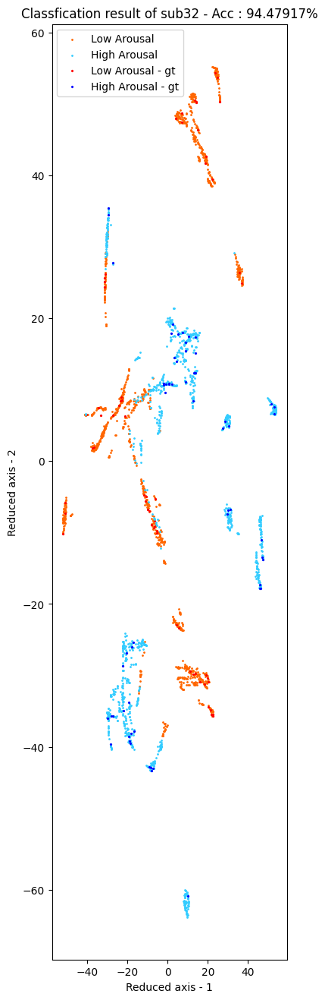

In [114]:
vlc_best_acc = []
ars_best_acc = []
visualization_type = 1
for i in range(32):
    print("\n\n******************* SUBJECT : {} *********************".format(i+1))

    date = '230331_mah_oSNF'
    sub_idx = 'sub'+str(i+1)

    subject_de, subject_psd, subject_label, _ = load_subject_data(args.tensor_save_path, isdeap=True)

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    valence_label, arousal_label = deap_label(sub_label)

    de, psd, vlc_identifier, ars_identifier = preprocessing(sub_de,sub_psd, (valence_label,arousal_label), args.n_labels_by_class, args.out_channels, args.seed, isdeap=True)

    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

    de_ssm, de_nssm = ssm_construction2(de, args.n_samples,args.de_k,'ma')
    psd_ssm, psd_nssm = ssm_construction2(psd, args.n_samples,args.psd_k, 'ma')
    save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
    save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
    save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
    save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    adj = normalize_adj(fsm)
    save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
    save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    feature = input_feature(de, psd)

    save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(adj).to(torch.float32).to(device)
    ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
    vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

    vlc_identifier = torch.from_numpy(vlc_identifier).bool()
    vlc_train_identifier = vlc_identifier.to(device)
    isunlabeled = ~vlc_identifier
    vlc_test_identifier = isunlabeled.to(device)

    ars_identifier = torch.from_numpy(ars_identifier).bool()
    ars_train_identifier = ars_identifier.to(device)
    isunlabeled = ~ars_identifier
    ars_test_identifier = isunlabeled.to(device)

    activation = get_activation('celu')
    gcn = GraphConvolution

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, vlc_label,
                                                                    vlc_train_identifier, vlc_test_identifier,
                                                                    args,device,date,sub_idx, isdeap=True)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    vlc_best_acc.append(round(best_acc.item(), 2))
    

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_valence'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'valence_test_acc_'+date, best_acc)

    cf_name = args.valence
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)


    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, ars_label,
                                                                        ars_train_identifier, ars_test_identifier,
                                                                        args,date,sub_idx, isdeap=True)
    
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    ars_best_acc.append(round(best_acc.item(), 2))

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_arousal'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'arousal_test_acc_'+date, best_acc)

    cf_name = args.arousal
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, ars_train_identifier, cf_name, fig_name)
print("\n**************** Valence *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
print("**************** Arousal *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))




******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.48,    Test Loss :0.47,    Total Acc : 96.53
Epoch 640 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.33,    Test Loss :0.58,    Total Acc : 94.75
Epoch 650 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.0,    Test Loss :0.48,    Total Acc : 95.29
Epoch 660 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 86.88,    Test Loss :0.66,    Total Acc : 92.19
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.0,    Test Loss :0.59,    Total Acc : 95.5
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.51,    Total Acc : 96.14
Epoch 690 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.31,    Test Loss :0.49,    Total Acc : 95.24
Epoch 700 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.94,    Test Loss :0.5,    Total Acc : 95.26
Epoch 710 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 87.52,    Test Loss :0.69, 

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.38,    Test Loss :0.46,    Total Acc : 97.19
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.15,    Test Loss :0.63,    Total Acc : 95.16
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.35,    Test Loss :0.65,    Total Acc : 95.76
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.5,    Test Loss :0.49,    Total Acc : 96.75
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.19,    Test Loss :0.58,    Total Acc : 96.18
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.08,    Test Loss :0.62,    Total Acc : 95.62
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 88.98,    Test Loss :0.8,    Total Acc : 94.07
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.81,    Test Loss :0.49,    Total Acc : 96.7
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.29,    Test L

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.55,    Total Acc : 96.21
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.77,    Test Loss :0.47,    Total Acc : 96.39
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.42,    Total Acc : 97.05
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.23,    Test Loss :0.6,    Total Acc : 95.91
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.15,    Test Loss :0.44,    Total Acc : 95.36
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.71,    Test Loss :0.42,    Total Acc : 96.65
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.73,    Test Loss :0.49,    Total Acc : 96.36
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.67,    Test Loss :0.47,    Total Acc : 96.33
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.44,    Test 

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.31,    Test Loss :0.59,    Total Acc : 96.66
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.4,    Test Loss :0.54,    Total Acc : 97.2
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.23,    Test Loss :0.63,    Total Acc : 96.91
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.4,    Test Loss :0.73,    Total Acc : 96.2
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.08,    Test Loss :0.85,    Total Acc : 95.54
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.65,    Test Loss :0.69,    Total Acc : 96.82
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.54,    Test Loss :0.78,    Total Acc : 96.27
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.92,    Test Loss :0.61,    Total Acc : 96.96
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.77,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.08    Train Loss : 0.62,    Test Acc : 69.29,    Test Loss :0.55,    Total Acc : 70.69
Epoch 20 - Train Acc : 84.58    Train Loss : 0.44,    Test Acc : 78.29,    Test Loss :0.42,    Total Acc : 81.44
Epoch 30 - Train Acc : 75.83    Train Loss : 0.58,    Test Acc : 66.98,    Test Loss :0.65,    Total Acc : 71.41
Epoch 40 - Train Acc : 88.75    Train Loss : 0.38,    Test Acc : 81.23,    Test Loss :0.4,    Total Acc : 84.99
Epoch 50 - Train Acc : 84.58    Train Loss : 0.38,    Test Acc : 81.58,    Test Loss :0.43,    Total Acc : 83.08
Epoch 60 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 83.15,    Test Loss :0.42,    Total Acc : 87.41
Epoch 70 - Train Acc : 87.5    Train Loss : 0.34,    Test Acc : 84.85,    Test Loss :0.37,    Total Acc : 86.18
Epoch 80 - Train Acc : 85.83    Train Loss : 0.45,    Test Acc : 81.92,    Test Loss :0.49,    Total Acc : 83.88
Epoch 90 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 80.77,    Test Loss :0.49,    Tota

Epoch 760 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.17,    Test Loss :0.55,    Total Acc : 92.83
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.4,    Test Loss :0.52,    Total Acc : 93.99
Epoch 780 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.67,    Test Loss :0.54,    Total Acc : 94.12
Epoch 790 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.08,    Test Loss :0.69,    Total Acc : 92.62
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.31,    Test Loss :0.68,    Total Acc : 92.74
Epoch 810 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.23,    Test Loss :0.62,    Total Acc : 93.7
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.02,    Test Loss :0.51,    Total Acc : 94.8
Epoch 830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.33,    Test Loss :0.54,    Total Acc : 94.46
Epoch 840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.75,    Test Loss :0.51, 

Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.75,    Test Loss :0.71,    Total Acc : 95.88
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.88,    Test Loss :0.65,    Total Acc : 95.44
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.0,    Test Loss :0.71,    Total Acc : 94.29
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.52,    Test Loss :0.69,    Total Acc : 95.55
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.81,    Test Loss :0.74,    Total Acc : 94.7
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.21,    Test Loss :0.54,    Total Acc : 96.4
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.65,    Test Loss :0.62,    Total Acc : 95.82
Epoch 1560 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 91.04,    Test Loss :0.59,    Total Acc : 94.69
Epoch 1570 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.98,    Test L

Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.71,    Test Loss :0.54,    Total Acc : 96.85
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.08,    Test Loss :0.64,    Total Acc : 96.54
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.29,    Test Loss :0.61,    Total Acc : 96.65
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.83,    Test Loss :0.67,    Total Acc : 95.71
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.02,    Test Loss :0.65,    Total Acc : 96.3
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.31,    Test Loss :0.7,    Total Acc : 95.95
Epoch 2270 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.08,    Test Loss :0.78,    Total Acc : 95.62
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.88,    Test Loss :0.81,    Total Acc : 95.23
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.75,    Test L

Epoch 2930 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.27,    Test Loss :0.64,    Total Acc : 96.43
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.35,    Test Loss :0.58,    Total Acc : 96.18
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.21,    Test Loss :0.54,    Total Acc : 97.1
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.5,    Test Loss :0.64,    Total Acc : 94.54
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.31,    Test Loss :0.4,    Total Acc : 95.45
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.12,    Test Loss :0.45,    Total Acc : 96.56
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.79,    Test Loss :0.56,    Total Acc : 95.19
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.46,    Test Loss :0.43,    Total Acc : 96.73
*** Best ACC : 95.21 ***
directory already exists
arousal_test_acc_230331_mah_oSNF i

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 2 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.6,    Test Loss :2.4,    Total Acc : 92.3
Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.92,    Test Loss :2.29,    Total Acc : 92.96
Epoch 650 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.5,    Test Loss :2.36,    Total Acc : 92.54
Epoch 660 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.0,    Test Loss :2.22,    Total Acc : 91.79
Epoch 670 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.5,    Test Loss :2.72,    Total Acc : 92.75
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.9,    Test Loss :2.35,    Total Acc : 92.24
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.27,    Test Loss :2.63,    Total Acc : 92.64
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.88,    Test Loss :2.0,    Total Acc : 92.94
Epoch 710 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.9,    Test Loss :1.99,    T

Epoch 1350 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.9,    Test Loss :2.76,    Total Acc : 92.24
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.88,    Test Loss :2.67,    Total Acc : 92.44
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.33,    Test Loss :2.16,    Total Acc : 92.67
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.77,    Test Loss :2.46,    Total Acc : 93.39
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.46,    Test Loss :2.26,    Total Acc : 92.23
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.27,    Test Loss :2.24,    Total Acc : 93.64
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.92,    Test Loss :2.08,    Total Acc : 92.96
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.73,    Test Loss :2.29,    Total Acc : 92.86
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.27,    Test

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.33,    Test Loss :2.51,    Total Acc : 93.17
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.08,    Test Loss :2.83,    Total Acc : 93.04
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.08,    Test Loss :2.83,    Total Acc : 93.54
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.06,    Test Loss :3.02,    Total Acc : 93.03
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.65,    Test Loss :2.48,    Total Acc : 93.32
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.06,    Test Loss :2.51,    Total Acc : 93.53
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.77,    Test Loss :2.69,    Total Acc : 93.89
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.44,    Test Loss :2.73,    Total Acc : 93.72
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.4,    Test

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.69,    Test Loss :3.52,    Total Acc : 92.84
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.23,    Test Loss :3.06,    Total Acc : 93.11
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 83.94,    Test Loss :3.51,    Total Acc : 91.97
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.33,    Test Loss :3.38,    Total Acc : 93.17
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.06,    Test Loss :2.81,    Total Acc : 93.03
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.92,    Test Loss :3.14,    Total Acc : 92.46
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.52,    Test Loss :3.19,    Total Acc : 92.05
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.56,    Test Loss :3.65,    Total Acc : 92.57
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 85.69,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.67    Train Loss : 0.53,    Test Acc : 70.56,    Test Loss :0.58,    Total Acc : 73.61
Epoch 20 - Train Acc : 82.92    Train Loss : 0.4,    Test Acc : 68.79,    Test Loss :0.76,    Total Acc : 75.85
Epoch 30 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 73.92,    Test Loss :0.9,    Total Acc : 82.58
Epoch 40 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 80.29,    Test Loss :0.84,    Total Acc : 87.44
Epoch 50 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 77.29,    Test Loss :0.96,    Total Acc : 85.31
Epoch 60 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 80.77,    Test Loss :1.26,    Total Acc : 88.72
Epoch 70 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 80.4,    Test Loss :1.29,    Total Acc : 86.03
Epoch 80 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 77.08,    Test Loss :1.43,    Total Acc : 86.67
Epoch 90 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 79.38,    Test Loss :1.13,    Tota

Epoch 750 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.6,    Test Loss :1.6,    Total Acc : 93.3
Epoch 760 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.15,    Test Loss :1.84,    Total Acc : 92.86
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.0,    Test Loss :1.25,    Total Acc : 93.0
Epoch 780 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.81,    Test Loss :1.73,    Total Acc : 91.99
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.46,    Test Loss :1.49,    Total Acc : 93.73
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.23,    Test Loss :1.75,    Total Acc : 92.61
Epoch 810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.98,    Test Loss :1.87,    Total Acc : 92.49
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.02,    Test Loss :1.84,    Total Acc : 92.51
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.88,    Test Loss :2.0,  

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.38,    Test Loss :2.35,    Total Acc : 93.69
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.73,    Test Loss :2.68,    Total Acc : 93.36
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.6,    Test Loss :2.37,    Total Acc : 93.8
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.79,    Test Loss :2.7,    Total Acc : 93.4
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.81,    Test Loss :2.42,    Total Acc : 93.41
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.29,    Test Loss :2.57,    Total Acc : 93.15
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.25,    Test Loss :2.98,    Total Acc : 92.62
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.06,    Test Loss :2.7,    Total Acc : 93.03
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.67,    Test Los

Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.4,    Test Loss :2.24,    Total Acc : 93.7
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.9,    Test Loss :2.13,    Total Acc : 93.24
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.85,    Test Loss :2.15,    Total Acc : 93.22
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.1,    Test Loss :2.17,    Total Acc : 93.55
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.69,    Test Loss :2.02,    Total Acc : 93.84
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.83,    Test Loss :1.96,    Total Acc : 93.92
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.79,    Test Loss :2.21,    Total Acc : 93.4
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.69,    Test Loss :2.49,    Total Acc : 93.34
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.77,    Test Los

Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.94,    Test Loss :2.58,    Total Acc : 93.47
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.46,    Test Loss :2.31,    Total Acc : 93.73
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.9,    Test Loss :2.26,    Total Acc : 93.95
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.56,    Test Loss :2.37,    Total Acc : 93.78
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.65,    Test Loss :2.37,    Total Acc : 93.61
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.58,    Test Loss :2.41,    Total Acc : 93.79
*** Best ACC : 89.58 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 3 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (756,),    high valence : (1764,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm 

/tmp/ipykernel_96451/723135367.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


Epoch 10 - Train Acc : 70.83    Train Loss : 0.61,    Test Acc : 63.29,    Test Loss :0.93,    Total Acc : 67.06
Epoch 20 - Train Acc : 78.75    Train Loss : 0.54,    Test Acc : 62.52,    Test Loss :1.07,    Total Acc : 70.64
Epoch 30 - Train Acc : 80.42    Train Loss : 0.47,    Test Acc : 62.33,    Test Loss :0.95,    Total Acc : 71.38
Epoch 40 - Train Acc : 88.75    Train Loss : 0.41,    Test Acc : 69.73,    Test Loss :0.87,    Total Acc : 79.24
Epoch 50 - Train Acc : 82.5    Train Loss : 0.44,    Test Acc : 62.73,    Test Loss :0.92,    Total Acc : 72.61
Epoch 60 - Train Acc : 89.17    Train Loss : 0.36,    Test Acc : 68.27,    Test Loss :0.92,    Total Acc : 78.72
Epoch 70 - Train Acc : 76.67    Train Loss : 0.59,    Test Acc : 72.5,    Test Loss :1.05,    Total Acc : 74.58
Epoch 80 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 77.5,    Test Loss :1.0,    Total Acc : 84.58
Epoch 90 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 74.92,    Test Loss :1.14,    Total

Epoch 760 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 85.81,    Test Loss :1.17,    Total Acc : 92.07
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.17,    Test Loss :1.36,    Total Acc : 94.58
Epoch 780 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.19,    Test Loss :0.94,    Total Acc : 92.97
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.85,    Test Loss :0.79,    Total Acc : 94.93
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.96,    Test Loss :0.89,    Total Acc : 94.48
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.75,    Test Loss :1.75,    Total Acc : 93.17
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.73,    Test Loss :1.47,    Total Acc : 94.86
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.88,    Test Loss :2.24,    Total Acc : 92.94
Epoch 840 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.4,    Test Loss :0.79

Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.06,    Test Loss :1.12,    Total Acc : 94.03
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.58,    Test Loss :0.56,    Total Acc : 93.38
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.15,    Test Loss :0.59,    Total Acc : 94.07
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.25,    Test Loss :0.47,    Total Acc : 95.42
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.19,    Test Loss :0.41,    Total Acc : 96.39
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.65,    Test Loss :0.92,    Total Acc : 92.41
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.0,    Test Loss :0.57,    Total Acc : 95.5
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.75,    Test Loss :0.39,    Total Acc : 96.88
Epoch 1570 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.19,    Test 

Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.27,    Test Loss :2.65,    Total Acc : 93.14
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.48,    Test Loss :2.38,    Total Acc : 94.74
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.29,    Test Loss :2.41,    Total Acc : 90.44
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.52,    Test Loss :1.96,    Total Acc : 93.76
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.38,    Test Loss :2.1,    Total Acc : 91.06
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.94,    Test Loss :1.34,    Total Acc : 95.47
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.48,    Test Loss :2.31,    Total Acc : 93.24
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.75,    Test Loss :3.18,    Total Acc : 93.38
Epoch 2300 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.88,    Test 

Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.06,    Test Loss :5.33,    Total Acc : 93.53
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.6,    Test Loss :5.7,    Total Acc : 93.8
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.96,    Test Loss :4.66,    Total Acc : 93.48
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.92,    Test Loss :5.78,    Total Acc : 92.25
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :6.63,    Total Acc : 94.42
*** Best ACC : 95.0 ***
directory already exists
valence_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 62.08    Train Loss : 0.67,    Test Acc : 52.15,    Test Loss :0.63,    Total Acc : 57.11
Epoch 20 - Train Acc : 72.08    Train Loss : 0.6,    Test Acc : 63.42,    Test Loss :0.58,    Total Acc : 67.75
Epoch 30 - Train Acc : 74.58    Train Loss : 0.53,    Test Acc : 61.31,    Test Loss :0.59,    Total Acc : 67.95
Epoch 40 - Train Acc : 81.25    Train Loss : 0.46,    Test Acc : 72.27,    Test Loss :0.51,    Total Acc : 76.76
Epoch 50 - Train Acc : 75.42    Train Loss : 0.53,    Test Acc : 71.71,    Test Loss :0.57,    Total Acc : 73.56
Epoch 60 - Train Acc : 84.17    Train Loss : 0.45,    Test Acc : 73.23,    Test Loss :0.58,    Total Acc : 78.7
Epoch 70 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 79.35,    Test Loss :0.44,    Total Acc : 84.47
Epoch 80 - Train Acc : 80.42    Train Loss : 0.51,    Test Acc : 73.38,    Test Loss :0.66,    Total Acc : 76.9
Epoch 90 - Train Acc : 86.67    Train Loss : 0.34,    Test Acc : 77.65,    Test Loss :0.47,    Tota

Epoch 740 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.81,    Test Loss :0.53,    Total Acc : 94.49
Epoch 750 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.75,    Test Loss :0.37,    Total Acc : 94.54
Epoch 760 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.35,    Test Loss :0.52,    Total Acc : 94.47
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.52,    Test Loss :0.39,    Total Acc : 95.34
Epoch 780 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.94,    Test Loss :0.26,    Total Acc : 95.97
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :0.25,    Total Acc : 96.07
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :0.3,    Total Acc : 95.68
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.23,    Test Loss :0.28,    Total Acc : 95.41
Epoch 820 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 89.33,    Test Loss :0.4

Epoch 1480 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.29,    Test Loss :0.18,    Total Acc : 97.44
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.58,    Test Loss :0.34,    Total Acc : 94.96
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.44,    Test Loss :0.23,    Total Acc : 96.72
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.67,    Test Loss :0.25,    Total Acc : 96.42
Epoch 1520 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 91.5,    Test Loss :0.36,    Total Acc : 94.29
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.9,    Test Loss :0.31,    Total Acc : 96.24
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.32,    Total Acc : 96.34
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.21,    Total Acc : 96.86
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.4,    Test L

Epoch 2210 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 96.17,    Test Loss :0.17,    Total Acc : 97.04
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.42,    Test Loss :0.09,    Total Acc : 98.71
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.52,    Test Loss :0.12,    Total Acc : 98.26
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.29,    Total Acc : 96.77
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.9,    Test Loss :0.18,    Total Acc : 97.95
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.85,    Test Loss :0.35,    Total Acc : 96.43
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :0.19,    Total Acc : 97.94
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.67,    Test Loss :0.18,    Total Acc : 97.83
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.31,    Test

Epoch 2930 - Train Acc : 96.25    Train Loss : 0.26,    Test Acc : 91.52,    Test Loss :0.61,    Total Acc : 93.89
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.98,    Test Loss :0.38,    Total Acc : 93.95
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.79,    Test Loss :0.52,    Total Acc : 93.56
Epoch 2960 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 88.88,    Test Loss :0.41,    Total Acc : 92.77
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.96,    Test Loss :0.3,    Total Acc : 95.35
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.98,    Test Loss :0.42,    Total Acc : 96.99
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.9,    Test Loss :0.23,    Total Acc : 97.95
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.27,    Test Loss :0.29,    Total Acc : 98.14
*** Best ACC : 98.52 ***
directory already exists
arousal_test_acc_230331_mah_oSNF 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 4 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 90.83    Train Loss : 0.24,    Test Acc : 78.17,    Test Loss :0.95,    Total Acc : 84.5
Epoch 650 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 83.88,    Test Loss :1.04,    Total Acc : 89.65
Epoch 660 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 83.71,    Test Loss :1.04,    Total Acc : 91.02
Epoch 670 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 84.88,    Test Loss :0.84,    Total Acc : 89.31
Epoch 680 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 83.58,    Test Loss :1.3,    Total Acc : 90.96
Epoch 690 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 86.46,    Test Loss :1.15,    Total Acc : 91.35
Epoch 700 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 84.58,    Test Loss :0.98,    Total Acc : 91.04
Epoch 710 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 86.04,    Test Loss :0.83,    Total Acc : 92.6
Epoch 720 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 81.29,    Test Loss :1.27, 

Epoch 1360 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.48,    Test Loss :1.36,    Total Acc : 91.61
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 82.54,    Test Loss :1.31,    Total Acc : 90.85
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.92,    Test Loss :1.06,    Total Acc : 92.75
Epoch 1390 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 80.94,    Test Loss :1.57,    Total Acc : 88.8
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 83.65,    Test Loss :1.12,    Total Acc : 90.78
Epoch 1410 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 85.98,    Test Loss :1.06,    Total Acc : 91.53
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 84.31,    Test Loss :1.25,    Total Acc : 92.16
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.29,    Test Loss :1.2,    Total Acc : 93.02
Epoch 1440 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 82.79,    Test L

Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.58,    Test Loss :1.16,    Total Acc : 93.29
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 86.08,    Test Loss :1.23,    Total Acc : 92.42
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.81,    Test Loss :1.25,    Total Acc : 91.7
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.83,    Test Loss :1.22,    Total Acc : 93.92
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 80.04,    Test Loss :1.67,    Total Acc : 90.02
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.38,    Test Loss :1.25,    Total Acc : 92.98
Epoch 2160 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.29,    Test Loss :1.22,    Total Acc : 92.52
Epoch 2170 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.62,    Test Loss :1.45,    Total Acc : 91.69
Epoch 2180 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.69,    Test L

Epoch 2820 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 85.77,    Test Loss :1.85,    Total Acc : 91.64
Epoch 2830 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 83.19,    Test Loss :1.91,    Total Acc : 90.55
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.94,    Test Loss :1.75,    Total Acc : 93.47
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.62,    Test Loss :1.99,    Total Acc : 91.4
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.94,    Test Loss :1.63,    Total Acc : 91.34
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.5,    Test Loss :1.7,    Total Acc : 92.54
Epoch 2880 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 84.48,    Test Loss :2.09,    Total Acc : 90.99
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.88,    Test Loss :1.9,    Total Acc : 92.44
Epoch 2900 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 81.0,    Test Loss :2

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 78.33    Train Loss : 0.48,    Test Acc : 68.81,    Test Loss :0.7,    Total Acc : 73.57
Epoch 20 - Train Acc : 81.25    Train Loss : 0.44,    Test Acc : 69.38,    Test Loss :0.67,    Total Acc : 75.31
Epoch 30 - Train Acc : 84.58    Train Loss : 0.4,    Test Acc : 72.54,    Test Loss :0.66,    Total Acc : 78.56
Epoch 40 - Train Acc : 83.75    Train Loss : 0.39,    Test Acc : 70.85,    Test Loss :0.81,    Total Acc : 77.3
Epoch 50 - Train Acc : 85.42    Train Loss : 0.35,    Test Acc : 70.62,    Test Loss :0.84,    Total Acc : 78.02
Epoch 60 - Train Acc : 83.75    Train Loss : 0.36,    Test Acc : 70.73,    Test Loss :0.89,    Total Acc : 77.24
Epoch 70 - Train Acc : 83.75    Train Loss : 0.45,    Test Acc : 69.85,    Test Loss :1.14,    Total Acc : 76.8
Epoch 80 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 78.17,    Test Loss :0.69,    Total Acc : 85.33
Epoch 90 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 76.06,    Test Loss :0.99,    Total Ac

Epoch 760 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 86.35,    Test Loss :1.99,    Total Acc : 91.93
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.65,    Test Loss :2.05,    Total Acc : 93.61
Epoch 780 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.04,    Test Loss :2.49,    Total Acc : 93.4
Epoch 790 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.06,    Test Loss :1.97,    Total Acc : 92.91
Epoch 800 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.62,    Test Loss :2.56,    Total Acc : 93.6
Epoch 810 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.15,    Test Loss :2.67,    Total Acc : 94.07
Epoch 820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.0,    Test Loss :2.5,    Total Acc : 93.58
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.56,    Test Loss :2.32,    Total Acc : 94.28
Epoch 840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.44,    Test Loss :2.51,    T

Epoch 1480 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.94,    Test Loss :3.41,    Total Acc : 93.76
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.85,    Test Loss :2.92,    Total Acc : 93.72
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.46,    Test Loss :3.19,    Total Acc : 94.73
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :2.77,    Total Acc : 94.21
Epoch 1520 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 85.08,    Test Loss :2.71,    Total Acc : 91.29
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.79,    Test Loss :2.26,    Total Acc : 93.9
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.17,    Test Loss :2.36,    Total Acc : 93.17
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.79,    Test Loss :3.74,    Total Acc : 93.9
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.4,    Test Lo

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.96,    Test Loss :4.48,    Total Acc : 93.98
Epoch 2210 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 84.92,    Test Loss :4.05,    Total Acc : 89.33
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.75,    Test Loss :3.61,    Total Acc : 93.88
Epoch 2230 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.58,    Test Loss :2.82,    Total Acc : 92.04
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :3.1,    Total Acc : 94.02
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.83,    Test Loss :2.96,    Total Acc : 93.92
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.92,    Test Loss :3.27,    Total Acc : 93.75
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.38,    Test Loss :3.51,    Total Acc : 94.19
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.04,    Test 

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.06,    Test Loss :4.24,    Total Acc : 94.03
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.92,    Test Loss :3.99,    Total Acc : 93.46
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.9,    Test Loss :2.97,    Total Acc : 94.45
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.54,    Test Loss :2.4,    Total Acc : 94.27
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.77,    Test Loss :2.38,    Total Acc : 94.39
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.08,    Test Loss :2.55,    Total Acc : 94.04
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.73,    Test Loss :2.8,    Total Acc : 94.36
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.65,    Test Loss :2.37,    Total Acc : 93.82
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.54,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 5 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1575,),    high valence : (945,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.04,    Test Loss :0.52,    Total Acc : 93.81
Epoch 640 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.12,    Test Loss :0.5,    Total Acc : 93.85
Epoch 650 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 91.9,    Test Loss :0.27,    Total Acc : 95.11
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :0.37,    Total Acc : 95.14
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.35,    Test Loss :0.52,    Total Acc : 94.18
Epoch 680 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.42,    Test Loss :0.4,    Total Acc : 94.29
Epoch 690 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.85,    Test Loss :0.4,    Total Acc : 93.3
Epoch 700 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.12,    Test Loss :0.34,    Total Acc : 94.85
Epoch 710 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.44,    Test Loss :0.25,    To

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.56,    Total Acc : 96.66
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.81,    Test Loss :0.32,    Total Acc : 96.49
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.4,    Test Loss :0.44,    Total Acc : 96.78
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.88,    Test Loss :0.33,    Total Acc : 96.52
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.45,    Total Acc : 96.29
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.48,    Test Loss :0.4,    Total Acc : 96.74
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.45,    Total Acc : 96.62
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.19,    Test Loss :0.54,    Total Acc : 96.09
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.0,    Test Los

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.65,    Test Loss :0.35,    Total Acc : 97.11
Epoch 2090 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.37,    Total Acc : 96.33
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.58,    Test Loss :0.51,    Total Acc : 96.08
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.88,    Test Loss :0.42,    Total Acc : 96.44
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.56,    Test Loss :0.31,    Total Acc : 97.28
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.54,    Total Acc : 96.54
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.38,    Test Loss :0.32,    Total Acc : 97.69
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.88,    Test Loss :0.37,    Total Acc : 96.94
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.62,    Tes

Epoch 2800 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.94,    Test Loss :0.34,    Total Acc : 94.84
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.94,    Test Loss :0.5,    Total Acc : 95.97
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.48,    Test Loss :0.39,    Total Acc : 96.74
Epoch 2830 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.71,    Test Loss :0.46,    Total Acc : 95.02
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.71,    Test Loss :0.46,    Total Acc : 95.44
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.6,    Test Loss :0.3,    Total Acc : 95.89
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.31,    Test Loss :0.66,    Total Acc : 94.74
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.21,    Test Loss :0.49,    Total Acc : 96.6
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.81,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.42    Train Loss : 0.61,    Test Acc : 73.04,    Test Loss :0.56,    Total Acc : 74.23
Epoch 20 - Train Acc : 77.5    Train Loss : 0.5,    Test Acc : 73.88,    Test Loss :0.5,    Total Acc : 75.69
Epoch 30 - Train Acc : 86.25    Train Loss : 0.4,    Test Acc : 79.44,    Test Loss :0.44,    Total Acc : 82.84
Epoch 40 - Train Acc : 77.5    Train Loss : 0.53,    Test Acc : 72.67,    Test Loss :0.58,    Total Acc : 75.08
Epoch 50 - Train Acc : 83.75    Train Loss : 0.43,    Test Acc : 78.81,    Test Loss :0.49,    Total Acc : 81.28
Epoch 60 - Train Acc : 92.08    Train Loss : 0.3,    Test Acc : 84.77,    Test Loss :0.37,    Total Acc : 88.43
Epoch 70 - Train Acc : 90.42    Train Loss : 0.32,    Test Acc : 84.33,    Test Loss :0.38,    Total Acc : 87.38
Epoch 80 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 86.38,    Test Loss :0.35,    Total Acc : 89.44
Epoch 90 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 87.88,    Test Loss :0.33,    Total Ac

Epoch 750 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.02,    Test Loss :0.44,    Total Acc : 95.3
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Loss :0.54,    Total Acc : 95.86
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.65,    Test Loss :0.58,    Total Acc : 94.11
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.88,    Test Loss :0.61,    Total Acc : 95.94
Epoch 790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.6,    Test Loss :0.62,    Total Acc : 96.09
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.06,    Test Loss :0.63,    Total Acc : 95.53
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :0.73,    Total Acc : 95.55
Epoch 820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :0.68,    Total Acc : 95.16
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.75,    Test Loss :0.83,

Epoch 1480 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.06,    Test Loss :1.11,    Total Acc : 93.91
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.88,    Test Loss :0.88,    Total Acc : 95.23
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.56,    Test Loss :0.96,    Total Acc : 95.78
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.17,    Test Loss :0.88,    Total Acc : 95.17
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.42,    Test Loss :0.83,    Total Acc : 95.29
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.69,    Test Loss :0.97,    Total Acc : 93.72
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.81,    Test Loss :1.16,    Total Acc : 94.91
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.77,    Test Loss :0.98,    Total Acc : 95.39
Epoch 1560 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.4,    Test L

Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :0.95,    Total Acc : 95.96
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.85,    Test Loss :0.95,    Total Acc : 95.43
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :1.06,    Total Acc : 95.68
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.33,    Test Loss :1.16,    Total Acc : 95.17
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Loss :0.99,    Total Acc : 95.86
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :1.04,    Total Acc : 95.55
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.4,    Test Loss :1.0,    Total Acc : 96.2
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.77,    Test Loss :0.96,    Total Acc : 95.89
Epoch 2300 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.0,    Test Los

Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.42,    Test Loss :1.18,    Total Acc : 95.71
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.27,    Test Loss :1.06,    Total Acc : 95.64
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.79,    Test Loss :1.05,    Total Acc : 95.9
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.83,    Test Loss :1.1,    Total Acc : 95.21
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :1.05,    Total Acc : 95.64
*** Best ACC : 93.17 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 6 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.92,    Test Loss :0.84,    Total Acc : 93.12
Epoch 650 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.73,    Test Loss :0.75,    Total Acc : 95.16
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.81,    Test Loss :0.66,    Total Acc : 95.41
Epoch 670 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.54,    Test Loss :0.89,    Total Acc : 92.15
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.96,    Test Loss :0.73,    Total Acc : 95.06
Epoch 690 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.81,    Test Loss :0.84,    Total Acc : 94.7
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.67,    Test Loss :0.69,    Total Acc : 95.33
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.54,    Test Loss :0.76,    Total Acc : 94.77
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.69,    Test Loss :0.7

Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :0.52,    Total Acc : 95.61
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :0.54,    Total Acc : 95.55
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.9,    Test Loss :0.55,    Total Acc : 95.45
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.69,    Test Loss :0.47,    Total Acc : 95.84
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.69,    Test Loss :0.61,    Total Acc : 94.84
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.54,    Test Loss :0.57,    Total Acc : 95.27
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :0.53,    Total Acc : 95.96
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.44,    Test Loss :0.64,    Total Acc : 95.22
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.12,    Test 

Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.77,    Test Loss :0.43,    Total Acc : 95.89
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :0.38,    Total Acc : 96.05
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.58,    Test Loss :0.39,    Total Acc : 96.29
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.49,    Total Acc : 95.93
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss :0.44,    Total Acc : 96.81
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.98,    Test Loss :0.5,    Total Acc : 96.49
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.29,    Test Loss :0.57,    Total Acc : 96.65
Epoch 2180 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test Loss :0.58,    Total Acc : 96.45
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test Lo

Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.17,    Test Loss :0.49,    Total Acc : 96.58
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.83,    Test Loss :0.44,    Total Acc : 96.92
Epoch 2860 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 90.38,    Test Loss :0.61,    Total Acc : 93.94
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 93.83,    Test Loss :0.25,    Total Acc : 96.29
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.62,    Test Loss :0.23,    Total Acc : 97.1
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.81,    Test Loss :0.29,    Total Acc : 96.41
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.51,    Total Acc : 95.8
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.42,    Test Loss :0.5,    Total Acc : 95.71
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.6,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.0    Train Loss : 0.55,    Test Acc : 73.08,    Test Loss :0.55,    Total Acc : 74.04
Epoch 20 - Train Acc : 82.92    Train Loss : 0.43,    Test Acc : 75.94,    Test Loss :0.49,    Total Acc : 79.43
Epoch 30 - Train Acc : 81.25    Train Loss : 0.45,    Test Acc : 77.06,    Test Loss :0.57,    Total Acc : 79.16
Epoch 40 - Train Acc : 88.33    Train Loss : 0.38,    Test Acc : 79.31,    Test Loss :0.47,    Total Acc : 83.82
Epoch 50 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 80.56,    Test Loss :0.42,    Total Acc : 84.03
Epoch 60 - Train Acc : 89.17    Train Loss : 0.29,    Test Acc : 79.44,    Test Loss :0.51,    Total Acc : 84.3
Epoch 70 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 78.46,    Test Loss :0.72,    Total Acc : 84.02
Epoch 80 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 80.29,    Test Loss :0.45,    Total Acc : 87.85
Epoch 90 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 80.73,    Test Loss :0.45,    Total 

Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.92,    Test Loss :0.62,    Total Acc : 95.46
Epoch 760 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.19,    Test Loss :0.71,    Total Acc : 93.47
Epoch 770 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 85.04,    Test Loss :1.14,    Total Acc : 91.69
Epoch 780 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.04,    Test Loss :0.8,    Total Acc : 95.02
Epoch 790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.46,    Test Loss :0.66,    Total Acc : 95.23
Epoch 800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.38,    Test Loss :0.62,    Total Acc : 95.69
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.67,    Test Loss :0.76,    Total Acc : 95.33
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.81,    Test Loss :0.75,    Total Acc : 94.91
Epoch 830 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 84.33,    Test Loss :1.0

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :0.89,    Total Acc : 94.95
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.15,    Test Loss :0.88,    Total Acc : 95.57
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.46,    Test Loss :0.66,    Total Acc : 95.73
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :0.83,    Total Acc : 94.42
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.35,    Test Loss :1.28,    Total Acc : 93.26
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.85,    Test Loss :0.5,    Total Acc : 96.22
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.62,    Test Loss :1.07,    Total Acc : 93.1
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.98,    Test Loss :0.43,    Total Acc : 96.49
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.92,    Test Lo

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.67,    Test Loss :0.83,    Total Acc : 95.83
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.38,    Test Loss :0.71,    Total Acc : 96.19
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.44,    Test Loss :0.63,    Total Acc : 96.22
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.42,    Test Loss :0.55,    Total Acc : 96.21
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.96,    Test Loss :0.56,    Total Acc : 96.48
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.46,    Test Loss :0.67,    Total Acc : 95.73
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.58,    Test Loss :0.63,    Total Acc : 96.29
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.96,    Test Loss :0.61,    Total Acc : 96.48
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.98,    Tes

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.62,    Test Loss :0.76,    Total Acc : 95.31
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.69,    Test Loss :0.75,    Total Acc : 95.34
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.73,    Test Loss :0.94,    Total Acc : 94.86
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.73,    Test Loss :0.71,    Total Acc : 95.86
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.96,    Test Loss :0.75,    Total Acc : 95.48
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.9,    Test Loss :0.83,    Total Acc : 95.45
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.75,    Test Loss :0.82,    Total Acc : 95.38
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.88,    Test Loss :0.74,    Total Acc : 95.44
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.12,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 7 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1701,),    high arousal : (819,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm 

Epoch 630 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.77,    Test Loss :0.34,    Total Acc : 94.76
Epoch 640 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 94.9,    Test Loss :0.16,    Total Acc : 97.24
Epoch 650 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.23,    Test Loss :0.35,    Total Acc : 95.49
Epoch 660 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.33,    Test Loss :0.51,    Total Acc : 92.0
Epoch 670 - Train Acc : 97.08    Train Loss : 0.25,    Test Acc : 91.1,    Test Loss :0.43,    Total Acc : 94.09
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.13,    Total Acc : 97.27
Epoch 690 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.88,    Test Loss :0.13,    Total Acc : 97.44
Epoch 700 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 88.5,    Test Loss :0.36,    Total Acc : 92.79
Epoch 710 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 93.08,    Test Loss :0.25, 

Epoch 1370 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.54,    Test Loss :0.28,    Total Acc : 95.15
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.73,    Test Loss :0.16,    Total Acc : 97.86
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.98,    Test Loss :0.4,    Total Acc : 95.99
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.5,    Test Loss :0.35,    Total Acc : 96.25
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.29,    Test Loss :0.22,    Total Acc : 97.15
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.54,    Test Loss :0.22,    Total Acc : 96.06
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.21,    Test Loss :0.45,    Total Acc : 94.9
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.23,    Total Acc : 97.27
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.17,    Test Los

Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.92,    Test Loss :0.25,    Total Acc : 96.96
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.24,    Total Acc : 97.07
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.23,    Test Loss :0.23,    Total Acc : 97.11
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.94,    Test Loss :0.52,    Total Acc : 93.64
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.9,    Test Loss :0.39,    Total Acc : 96.53
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.65,    Test Loss :0.34,    Total Acc : 96.82
Epoch 2160 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.77,    Test Loss :0.29,    Total Acc : 96.05
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.32,    Total Acc : 97.16
Epoch 2180 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.54,    Test 

Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.38,    Total Acc : 96.42
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.52,    Total Acc : 96.14
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.65,    Test Loss :0.48,    Total Acc : 96.32
Epoch 2850 - Train Acc : 97.92    Train Loss : 0.18,    Test Acc : 89.23,    Test Loss :0.7,    Total Acc : 93.57
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.88,    Test Loss :0.27,    Total Acc : 96.94
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.42,    Test Loss :0.29,    Total Acc : 96.5
Epoch 2880 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.62,    Test Loss :0.42,    Total Acc : 94.27
Epoch 2890 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.81,    Test Loss :0.36,    Total Acc : 94.78
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.69,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 83.75    Train Loss : 0.49,    Test Acc : 75.88,    Test Loss :0.55,    Total Acc : 79.81
Epoch 20 - Train Acc : 83.33    Train Loss : 0.44,    Test Acc : 76.08,    Test Loss :0.6,    Total Acc : 79.71
Epoch 30 - Train Acc : 87.5    Train Loss : 0.34,    Test Acc : 73.08,    Test Loss :0.82,    Total Acc : 80.29
Epoch 40 - Train Acc : 74.17    Train Loss : 0.65,    Test Acc : 63.02,    Test Loss :1.32,    Total Acc : 68.59
Epoch 50 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 72.58,    Test Loss :0.74,    Total Acc : 79.62
Epoch 60 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 80.58,    Test Loss :0.65,    Total Acc : 86.33
Epoch 70 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 76.15,    Test Loss :1.02,    Total Acc : 83.49
Epoch 80 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 83.23,    Test Loss :0.85,    Total Acc : 88.91
Epoch 90 - Train Acc : 89.17    Train Loss : 0.36,    Test Acc : 69.56,    Test Loss :1.73,    Tot

Epoch 760 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.02,    Test Loss :2.27,    Total Acc : 91.18
Epoch 770 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 85.88,    Test Loss :1.91,    Total Acc : 92.1
Epoch 780 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 79.88,    Test Loss :2.49,    Total Acc : 89.73
Epoch 790 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 83.38,    Test Loss :2.37,    Total Acc : 90.65
Epoch 800 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 85.48,    Test Loss :2.53,    Total Acc : 91.91
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.19,    Test Loss :2.3,    Total Acc : 92.39
Epoch 820 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.6,    Test Loss :2.58,    Total Acc : 92.8
Epoch 830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.29,    Test Loss :2.77,    Total Acc : 91.23
Epoch 840 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.42,    Test Loss :2.86, 

Epoch 1480 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 86.52,    Test Loss :2.47,    Total Acc : 92.64
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.71,    Test Loss :3.32,    Total Acc : 93.35
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.48,    Test Loss :2.88,    Total Acc : 92.74
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.04,    Test Loss :2.8,    Total Acc : 93.31
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.83,    Test Loss :2.87,    Total Acc : 92.21
Epoch 1530 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 86.17,    Test Loss :2.82,    Total Acc : 92.04
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.56,    Test Loss :2.96,    Total Acc : 92.36
Epoch 1550 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.44,    Test Loss :4.55,    Total Acc : 91.09
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.75,    Test 

Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.33,    Test Loss :2.63,    Total Acc : 92.67
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.38,    Test Loss :1.71,    Total Acc : 92.19
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.65,    Test Loss :2.23,    Total Acc : 92.82
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 84.75,    Test Loss :2.55,    Total Acc : 92.38
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 84.15,    Test Loss :2.4,    Total Acc : 91.45
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.5,    Test Loss :2.98,    Total Acc : 92.83
Epoch 2270 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.56,    Test Loss :2.88,    Total Acc : 90.45
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.06,    Test Loss :2.53,    Total Acc : 91.11
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.85,    Test L

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.25,    Test Loss :3.1,    Total Acc : 93.12
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.54,    Test Loss :2.77,    Total Acc : 93.27
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.79,    Test Loss :3.31,    Total Acc : 92.4
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 85.33,    Test Loss :3.43,    Total Acc : 92.25
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.08,    Test Loss :3.02,    Total Acc : 93.54
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.62,    Test Loss :3.14,    Total Acc : 93.31
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.38,    Test Loss :2.96,    Total Acc : 93.19
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.96,    Test Loss :3.03,    Total Acc : 93.48
*** Best ACC : 89.79 ***
directory already exists
arousal_test_acc_230331_mah_oSNF

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 8 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.42,    Test Loss :1.9,    Total Acc : 89.71
Epoch 650 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 79.92,    Test Loss :1.79,    Total Acc : 89.12
Epoch 660 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 75.15,    Test Loss :1.41,    Total Acc : 85.28
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.25,    Test Loss :1.04,    Total Acc : 90.21
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 79.54,    Test Loss :1.44,    Total Acc : 89.56
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.71,    Test Loss :1.62,    Total Acc : 90.35
Epoch 700 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 79.83,    Test Loss :1.72,    Total Acc : 89.5
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.71,    Test Loss :1.71,    Total Acc : 89.85
Epoch 720 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.4,    Test Loss :1.64,  

Epoch 1360 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 79.73,    Test Loss :2.26,    Total Acc : 89.03
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.88,    Test Loss :1.9,    Total Acc : 90.44
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 80.06,    Test Loss :1.6,    Total Acc : 89.82
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 79.94,    Test Loss :1.75,    Total Acc : 89.34
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.94,    Test Loss :1.78,    Total Acc : 90.26
Epoch 1410 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 79.21,    Test Loss :2.09,    Total Acc : 88.77
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.96,    Test Loss :1.99,    Total Acc : 90.48
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.48,    Test Loss :2.15,    Total Acc : 91.03
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.56,    Test 

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 80.23,    Test Loss :2.17,    Total Acc : 90.11
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 80.88,    Test Loss :2.22,    Total Acc : 90.44
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.6,    Test Loss :2.38,    Total Acc : 90.09
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 81.58,    Test Loss :2.34,    Total Acc : 90.79
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.71,    Test Loss :2.34,    Total Acc : 91.15
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 79.9,    Test Loss :2.67,    Total Acc : 89.74
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 81.15,    Test Loss :2.36,    Total Acc : 90.36
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.73,    Test Loss :2.24,    Total Acc : 91.45
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.81,    Test 

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.19,    Test Loss :2.76,    Total Acc : 91.09
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 81.62,    Test Loss :2.34,    Total Acc : 90.81
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.52,    Test Loss :2.08,    Total Acc : 91.26
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 81.69,    Test Loss :2.22,    Total Acc : 90.84
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 81.1,    Test Loss :2.49,    Total Acc : 90.34
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.52,    Test Loss :2.4,    Total Acc : 91.26
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 81.29,    Test Loss :2.26,    Total Acc : 90.44
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.12,    Test Loss :2.02,    Total Acc : 91.56
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.4,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 90.0    Train Loss : 0.34,    Test Acc : 79.48,    Test Loss :0.48,    Total Acc : 84.74
Epoch 20 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 89.88,    Test Loss :0.46,    Total Acc : 94.31
Epoch 30 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 90.85,    Test Loss :0.53,    Total Acc : 94.39
Epoch 40 - Train Acc : 95.83    Train Loss : 0.22,    Test Acc : 84.69,    Test Loss :0.77,    Total Acc : 90.26
Epoch 50 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 93.21,    Test Loss :0.2,    Total Acc : 95.35
Epoch 60 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.36,    Total Acc : 95.9
Epoch 70 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.48,    Test Loss :0.28,    Total Acc : 97.24
Epoch 80 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.5,    Test Loss :0.42,    Total Acc : 95.75
Epoch 90 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.29,    Total 

Epoch 760 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :0.69,    Total Acc : 96.09
Epoch 770 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.83,    Test Loss :0.47,    Total Acc : 96.92
Epoch 780 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.31,    Test Loss :0.67,    Total Acc : 96.16
Epoch 790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.94,    Test Loss :0.7,    Total Acc : 95.97
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.42,    Test Loss :0.89,    Total Acc : 95.21
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.88,    Test Loss :0.79,    Total Acc : 95.23
Epoch 820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.21,    Test Loss :0.61,    Total Acc : 96.6
Epoch 830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.27,    Test Loss :0.63,    Total Acc : 96.64
Epoch 840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.27,    Test Loss :0.63

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.1,    Test Loss :0.79,    Total Acc : 97.05
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.0,    Test Loss :0.79,    Total Acc : 97.0
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.52,    Test Loss :1.0,    Total Acc : 96.26
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.71,    Test Loss :1.03,    Total Acc : 96.35
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.08,    Test Loss :0.85,    Total Acc : 96.54
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.92,    Total Acc : 96.66
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.06,    Test Loss :0.79,    Total Acc : 97.03
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.9,    Test Loss :0.94,    Total Acc : 96.45
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.46,    Test Los

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.12,    Test Loss :0.96,    Total Acc : 96.56
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :1.1,    Total Acc : 96.54
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.46,    Test Loss :0.74,    Total Acc : 96.73
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.73,    Test Loss :1.07,    Total Acc : 96.36
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.94,    Test Loss :1.12,    Total Acc : 95.97
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.65,    Test Loss :1.12,    Total Acc : 96.32
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.56,    Test Loss :0.94,    Total Acc : 95.78
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.86,    Total Acc : 96.26
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.46,    Test

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.79,    Test Loss :0.93,    Total Acc : 97.4
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.94,    Test Loss :1.01,    Total Acc : 96.97
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.79,    Test Loss :0.96,    Total Acc : 97.4
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.06,    Test Loss :0.82,    Total Acc : 97.53
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.9,    Test Loss :0.79,    Total Acc : 97.45
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.1,    Test Loss :0.77,    Total Acc : 97.55
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.25,    Test Loss :0.74,    Total Acc : 97.62
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.81,    Test Loss :0.8,    Total Acc : 97.41
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.98,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 9 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.52,    Test Loss :0.64,    Total Acc : 95.76
Epoch 650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.79,    Test Loss :0.74,    Total Acc : 95.9
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.88,    Test Loss :0.75,    Total Acc : 95.94
Epoch 670 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.08,    Test Loss :0.7,    Total Acc : 95.83
Epoch 680 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.62,    Test Loss :0.73,    Total Acc : 95.81
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.46,    Test Loss :0.77,    Total Acc : 95.73
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.29,    Test Loss :0.79,    Total Acc : 95.65
Epoch 710 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.73,    Total Acc : 95.98
Epoch 720 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.65,    Test Loss :0.8

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.5,    Test Loss :0.45,    Total Acc : 96.75
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.42,    Test Loss :0.58,    Total Acc : 95.5
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.38,    Test Loss :0.37,    Total Acc : 97.19
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.56,    Total Acc : 96.21
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.85,    Test Loss :0.62,    Total Acc : 95.43
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.56,    Test Loss :0.75,    Total Acc : 95.28
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.5,    Test Loss :0.44,    Total Acc : 94.92
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :0.79,    Total Acc : 95.36
Epoch 1440 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 88.04,    Test L

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.06,    Test Loss :0.71,    Total Acc : 96.53
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.61,    Total Acc : 96.66
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.52,    Test Loss :0.76,    Total Acc : 96.26
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.0,    Test Loss :0.74,    Total Acc : 96.5
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.25,    Test Loss :0.77,    Total Acc : 96.62
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.15,    Test Loss :0.71,    Total Acc : 96.57
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.06,    Test Loss :0.75,    Total Acc : 96.53
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.62,    Test Loss :0.72,    Total Acc : 96.81
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.67,    Test 

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.88,    Test Loss :0.62,    Total Acc : 96.94
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :0.53,    Total Acc : 96.8
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.96,    Test Loss :0.52,    Total Acc : 96.06
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.67,    Test Loss :0.65,    Total Acc : 96.83
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.71,    Test Loss :0.77,    Total Acc : 96.15
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.98,    Test Loss :0.65,    Total Acc : 96.49
Epoch 2870 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.83,    Test Loss :0.8,    Total Acc : 94.08
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 90.21,    Test Loss :0.59,    Total Acc : 94.48
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.92,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 87.08    Train Loss : 0.41,    Test Acc : 76.25,    Test Loss :0.62,    Total Acc : 81.67
Epoch 20 - Train Acc : 84.58    Train Loss : 0.34,    Test Acc : 78.54,    Test Loss :0.49,    Total Acc : 81.56
Epoch 30 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 82.58,    Test Loss :0.53,    Total Acc : 89.21
Epoch 40 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 84.77,    Test Loss :0.53,    Total Acc : 90.93
Epoch 50 - Train Acc : 91.25    Train Loss : 0.31,    Test Acc : 83.85,    Test Loss :0.49,    Total Acc : 87.55
Epoch 60 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 85.85,    Test Loss :0.49,    Total Acc : 92.72
Epoch 70 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 80.0,    Test Loss :0.82,    Total Acc : 87.5
Epoch 80 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 83.79,    Test Loss :0.8,    Total Acc : 91.27
Epoch 90 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 85.38,    Test Loss :0.68,    Total A

Epoch 760 - Train Acc : 95.83    Train Loss : 0.36,    Test Acc : 81.96,    Test Loss :1.46,    Total Acc : 88.9
Epoch 770 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.69,    Test Loss :0.55,    Total Acc : 93.51
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.69,    Test Loss :0.66,    Total Acc : 94.34
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.35,    Test Loss :0.81,    Total Acc : 95.18
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.73,    Test Loss :0.87,    Total Acc : 94.86
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.96,    Test Loss :0.87,    Total Acc : 94.98
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.12,    Test Loss :0.9,    Total Acc : 94.56
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.98,    Test Loss :0.96,    Total Acc : 94.49
Epoch 840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :0.7

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.12,    Test Loss :0.88,    Total Acc : 95.06
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.54,    Test Loss :0.79,    Total Acc : 94.77
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.6,    Test Loss :0.94,    Total Acc : 94.8
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.06,    Test Loss :0.67,    Total Acc : 95.53
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.96,    Test Loss :0.7,    Total Acc : 94.98
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.19,    Test Loss :0.67,    Total Acc : 95.59
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.69,    Test Loss :0.79,    Total Acc : 95.34
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.85,    Test Loss :0.85,    Total Acc : 94.93
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.85,    Test L

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.56,    Test Loss :1.07,    Total Acc : 94.28
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.65,    Test Loss :1.02,    Total Acc : 94.82
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.1,    Test Loss :0.92,    Total Acc : 95.05
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.96,    Test Loss :0.94,    Total Acc : 94.98
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.81,    Test Loss :0.81,    Total Acc : 95.91
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.88,    Test Loss :0.77,    Total Acc : 95.94
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.62,    Test Loss :0.85,    Total Acc : 95.31
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.54,    Test Loss :0.88,    Total Acc : 95.77
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.29,    Test

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.48,    Test Loss :0.81,    Total Acc : 95.74
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.58,    Test Loss :0.69,    Total Acc : 95.79
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.69,    Test Loss :0.74,    Total Acc : 96.34
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.31,    Test Loss :0.72,    Total Acc : 95.66
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.33,    Test Loss :0.54,    Total Acc : 96.67
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.17,    Test Loss :0.9,    Total Acc : 95.58
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.69,    Test Loss :0.76,    Total Acc : 96.34
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.65,    Test Loss :0.93,    Total Acc : 94.41
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.52,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 10 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 87.06,    Test Loss :0.76,    Total Acc : 92.07
Epoch 650 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 85.9,    Test Loss :0.89,    Total Acc : 91.91
Epoch 660 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.54,    Test Loss :0.61,    Total Acc : 94.15
Epoch 670 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 88.5,    Test Loss :0.69,    Total Acc : 91.33
Epoch 680 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.6,    Test Loss :0.62,    Total Acc : 93.39
Epoch 690 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.73,    Test Loss :0.5,    Total Acc : 93.45
Epoch 700 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.4,    Test Loss :0.46,    Total Acc : 94.7
Epoch 710 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.56,    Test Loss :0.55,    Total Acc : 93.86
Epoch 720 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.5,    Test Loss :0.63,    To

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :0.65,    Total Acc : 95.64
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.21,    Test Loss :0.74,    Total Acc : 94.9
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.27,    Test Loss :0.8,    Total Acc : 94.93
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.83,    Test Loss :0.76,    Total Acc : 94.92
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.71,    Test Loss :0.69,    Total Acc : 94.44
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.46,    Test Loss :0.81,    Total Acc : 95.23
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.35,    Test Loss :0.9,    Total Acc : 94.97
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.96,    Test Loss :0.7,    Total Acc : 95.48
Epoch 1440 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 88.0,    Test Loss

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.56,    Test Loss :0.82,    Total Acc : 95.28
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.9,    Test Loss :0.99,    Total Acc : 95.45
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.65,    Test Loss :1.0,    Total Acc : 95.32
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.77,    Test Loss :0.77,    Total Acc : 95.39
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.21,    Test Loss :1.07,    Total Acc : 95.1
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.96,    Test Loss :0.99,    Total Acc : 95.48
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.31,    Test Loss :0.95,    Total Acc : 96.16
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.65,    Test Loss :1.07,    Total Acc : 95.32
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.62,    Test L

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.65,    Test Loss :0.74,    Total Acc : 95.82
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.54,    Test Loss :0.81,    Total Acc : 95.77
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.46,    Test Loss :0.64,    Total Acc : 95.73
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.6,    Test Loss :0.82,    Total Acc : 94.59
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.73,    Test Loss :0.72,    Total Acc : 94.66
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.4,    Test Loss :0.68,    Total Acc : 96.2
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.12,    Test Loss :0.78,    Total Acc : 94.85
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.56,    Test Loss :0.86,    Total Acc : 94.78
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.58,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.67    Train Loss : 0.54,    Test Acc : 78.52,    Test Loss :0.43,    Total Acc : 77.59
Epoch 20 - Train Acc : 76.25    Train Loss : 0.53,    Test Acc : 74.77,    Test Loss :0.42,    Total Acc : 75.51
Epoch 30 - Train Acc : 79.17    Train Loss : 0.5,    Test Acc : 76.69,    Test Loss :0.4,    Total Acc : 77.93
Epoch 40 - Train Acc : 80.83    Train Loss : 0.47,    Test Acc : 81.92,    Test Loss :0.34,    Total Acc : 81.38
Epoch 50 - Train Acc : 87.5    Train Loss : 0.38,    Test Acc : 82.4,    Test Loss :0.38,    Total Acc : 84.95
Epoch 60 - Train Acc : 88.33    Train Loss : 0.37,    Test Acc : 82.5,    Test Loss :0.36,    Total Acc : 85.42
Epoch 70 - Train Acc : 92.5    Train Loss : 0.3,    Test Acc : 88.62,    Test Loss :0.27,    Total Acc : 90.56
Epoch 80 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 83.67,    Test Loss :0.36,    Total Acc : 87.04
Epoch 90 - Train Acc : 93.33    Train Loss : 0.27,    Test Acc : 87.77,    Test Loss :0.28,    Total Ac

Epoch 750 - Train Acc : 93.75    Train Loss : 0.35,    Test Acc : 92.54,    Test Loss :0.29,    Total Acc : 93.15
Epoch 760 - Train Acc : 94.17    Train Loss : 0.27,    Test Acc : 87.85,    Test Loss :0.41,    Total Acc : 91.01
Epoch 770 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 88.56,    Test Loss :0.25,    Total Acc : 93.03
Epoch 780 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 90.9,    Test Loss :0.34,    Total Acc : 93.16
Epoch 790 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.17,    Test Loss :0.21,    Total Acc : 95.25
Epoch 800 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 88.77,    Test Loss :0.45,    Total Acc : 93.14
Epoch 810 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 87.79,    Test Loss :0.47,    Total Acc : 91.4
Epoch 820 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 91.83,    Test Loss :0.27,    Total Acc : 94.67
Epoch 830 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.73,    Test Loss :0.24,    

Epoch 1470 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 93.02,    Test Loss :0.28,    Total Acc : 95.05
Epoch 1480 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.1,    Test Loss :0.32,    Total Acc : 95.93
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.81,    Test Loss :0.31,    Total Acc : 96.49
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.58,    Test Loss :0.37,    Total Acc : 96.29
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 91.69,    Test Loss :0.43,    Total Acc : 94.39
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 93.9,    Test Loss :0.22,    Total Acc : 96.32
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.25,    Test Loss :0.36,    Total Acc : 95.71
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.54,    Test Loss :0.33,    Total Acc : 95.65
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.69,    Test Loss

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.12,    Test Loss :0.3,    Total Acc : 97.56
Epoch 2200 - Train Acc : 98.33    Train Loss : 0.2,    Test Acc : 93.29,    Test Loss :0.38,    Total Acc : 95.81
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.02,    Test Loss :0.15,    Total Acc : 97.8
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.25,    Test Loss :0.27,    Total Acc : 97.62
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.83,    Test Loss :0.25,    Total Acc : 97.42
Epoch 2240 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.52,    Test Loss :0.29,    Total Acc : 95.72
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.08,    Test Loss :0.17,    Total Acc : 97.83
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.9,    Test Loss :0.24,    Total Acc : 97.45
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Lo

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.19,    Test Loss :0.37,    Total Acc : 96.89
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.1,    Test Loss :0.29,    Total Acc : 96.14
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.56,    Test Loss :0.31,    Total Acc : 97.28
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 95.6,    Test Loss :0.24,    Total Acc : 97.39
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :0.27,    Total Acc : 96.93
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.58,    Test Loss :0.36,    Total Acc : 95.46
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.75,    Test Loss :0.22,    Total Acc : 97.38
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.38,    Test Loss :0.25,    Total Acc : 97.19
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.96,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 11 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (756,),    high arousal : (1764,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.69,    Test Loss :0.76,    Total Acc : 96.14
Epoch 640 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.58,    Test Loss :0.76,    Total Acc : 96.38
Epoch 650 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.33,    Test Loss :0.61,    Total Acc : 97.17
Epoch 660 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.83,    Test Loss :0.67,    Total Acc : 96.0
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.96,    Test Loss :0.57,    Total Acc : 97.27
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.96,    Test Loss :0.72,    Total Acc : 96.98
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.12,    Test Loss :0.82,    Total Acc : 97.06
Epoch 700 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.75,    Total Acc : 96.76
Epoch 710 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.98,    Test Loss :0.76

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.19,    Test Loss :1.04,    Total Acc : 98.09
Epoch 1360 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.0,    Test Loss :1.32,    Total Acc : 95.67
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.83,    Test Loss :1.02,    Total Acc : 96.71
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.29,    Test Loss :1.04,    Total Acc : 98.15
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.15,    Test Loss :1.14,    Total Acc : 98.07
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.15,    Test Loss :1.11,    Total Acc : 97.57
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.85,    Test Loss :1.02,    Total Acc : 97.43
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.12,    Test Loss :1.2,    Total Acc : 98.06
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.04,    Test 

Epoch 2070 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.25,    Test Loss :1.1,    Total Acc : 95.29
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.54,    Test Loss :0.94,    Total Acc : 97.27
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.52,    Test Loss :0.89,    Total Acc : 97.26
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.96,    Test Loss :0.72,    Total Acc : 96.98
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.71,    Test Loss :0.84,    Total Acc : 96.85
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.86,    Total Acc : 97.33
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :0.83,    Total Acc : 96.09
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.98,    Test Loss :0.87,    Total Acc : 96.99
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.83,    Test 

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.83,    Test Loss :2.07,    Total Acc : 97.92
Epoch 2800 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.81,    Test Loss :2.66,    Total Acc : 97.7
Epoch 2810 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 94.88,    Test Loss :1.9,    Total Acc : 96.6
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.0,    Test Loss :2.81,    Total Acc : 97.08
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.23,    Test Loss :1.54,    Total Acc : 97.61
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.98,    Test Loss :1.93,    Total Acc : 97.99
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.71,    Test Loss :2.34,    Total Acc : 97.85
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.29,    Test Loss :2.2,    Total Acc : 97.65
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.81,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 71.25    Train Loss : 0.55,    Test Acc : 64.42,    Test Loss :0.56,    Total Acc : 67.83
Epoch 20 - Train Acc : 85.0    Train Loss : 0.43,    Test Acc : 72.46,    Test Loss :0.53,    Total Acc : 78.73
Epoch 30 - Train Acc : 82.92    Train Loss : 0.43,    Test Acc : 78.02,    Test Loss :0.6,    Total Acc : 80.47
Epoch 40 - Train Acc : 92.5    Train Loss : 0.3,    Test Acc : 82.48,    Test Loss :0.43,    Total Acc : 87.49
Epoch 50 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 82.62,    Test Loss :0.46,    Total Acc : 87.15
Epoch 60 - Train Acc : 88.75    Train Loss : 0.37,    Test Acc : 81.75,    Test Loss :0.57,    Total Acc : 85.25
Epoch 70 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 83.12,    Test Loss :0.51,    Total Acc : 88.65
Epoch 80 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.25,    Test Loss :0.42,    Total Acc : 92.25
Epoch 90 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 84.9,    Test Loss :0.49,    Total A

Epoch 740 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.38,    Test Loss :0.33,    Total Acc : 96.69
Epoch 750 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.96,    Test Loss :0.39,    Total Acc : 95.35
Epoch 760 - Train Acc : 94.17    Train Loss : 0.31,    Test Acc : 89.73,    Test Loss :0.6,    Total Acc : 91.95
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.23,    Test Loss :0.29,    Total Acc : 96.41
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test Loss :0.29,    Total Acc : 96.45
Epoch 790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.32,    Total Acc : 96.56
Epoch 800 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.06,    Test Loss :0.31,    Total Acc : 96.82
Epoch 810 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.4,    Test Loss :0.44,    Total Acc : 95.57
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.19,    Test Loss :0.35,

Epoch 1460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.71,    Test Loss :0.27,    Total Acc : 97.35
Epoch 1470 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.67,    Test Loss :0.28,    Total Acc : 96.92
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.31,    Test Loss :0.35,    Total Acc : 96.95
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.31,    Total Acc : 97.36
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.56,    Test Loss :0.45,    Total Acc : 93.03
Epoch 1510 - Train Acc : 95.42    Train Loss : 0.29,    Test Acc : 93.4,    Test Loss :0.38,    Total Acc : 94.41
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.67,    Test Loss :0.29,    Total Acc : 94.92
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.2,    Total Acc : 96.9
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.02,    Test Los

Epoch 2180 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.73,    Test Loss :0.25,    Total Acc : 97.86
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.17,    Test Loss :0.18,    Total Acc : 98.08
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.56,    Test Loss :0.35,    Total Acc : 97.28
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.3,    Total Acc : 97.58
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.65,    Test Loss :0.19,    Total Acc : 98.32
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.77,    Test Loss :0.15,    Total Acc : 98.39
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.31,    Test Loss :0.22,    Total Acc : 97.95
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.19,    Test Loss :0.24,    Total Acc : 96.18
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 95.83,    Test 

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.6,    Test Loss :0.15,    Total Acc : 98.3
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.42,    Test Loss :0.28,    Total Acc : 97.5
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.4,    Test Loss :0.2,    Total Acc : 98.2
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.27,    Test Loss :0.12,    Total Acc : 98.64
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.4,    Test Loss :0.16,    Total Acc : 98.2
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.71,    Test Loss :0.09,    Total Acc : 98.85
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.42,    Test Loss :0.17,    Total Acc : 98.21
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.58,    Test Loss :0.18,    Total Acc : 98.08
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.5,    Test Loss :0

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 12 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 640 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.75,    Test Loss :0.32,    Total Acc : 97.67
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.0,    Test Loss :0.39,    Total Acc : 97.5
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.27,    Test Loss :0.4,    Total Acc : 97.14
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.08,    Test Loss :0.39,    Total Acc : 97.54
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.85,    Test Loss :0.43,    Total Acc : 96.51
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.4,    Total Acc : 97.57
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.77,    Test Loss :0.33,    Total Acc : 97.89
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.21,    Test Loss :0.39,    Total Acc : 97.6
Epoch 720 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.96,    Test Loss :0.39, 

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.1,    Test Loss :0.64,    Total Acc : 98.05
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.04,    Test Loss :0.62,    Total Acc : 98.02
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.46,    Test Loss :0.76,    Total Acc : 97.73
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.69,    Test Loss :0.59,    Total Acc : 97.84
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.75,    Test Loss :0.54,    Total Acc : 97.88
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.85,    Test Loss :0.54,    Total Acc : 97.93
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.1,    Test Loss :0.74,    Total Acc : 97.55
Epoch 1430 - Train Acc : 94.58    Train Loss : 1.01,    Test Acc : 90.38,    Test Loss :1.52,    Total Acc : 92.48
Epoch 1440 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 90.79,    Test 

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.96,    Test Loss :0.76,    Total Acc : 97.27
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.71,    Test Loss :0.64,    Total Acc : 97.35
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.38,    Test Loss :0.7,    Total Acc : 97.19
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.47,    Total Acc : 97.47
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.46,    Test Loss :0.4,    Total Acc : 97.23
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.42,    Test Loss :0.38,    Total Acc : 97.71
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.67,    Test Loss :0.35,    Total Acc : 97.83
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.71,    Test Loss :0.39,    Total Acc : 97.65
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.29,    Test 

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.48,    Test Loss :0.58,    Total Acc : 97.74
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.46,    Test Loss :0.55,    Total Acc : 97.73
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.58,    Test Loss :0.44,    Total Acc : 98.29
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.02,    Test Loss :0.52,    Total Acc : 98.01
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.62,    Total Acc : 97.58
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.25,    Test Loss :0.61,    Total Acc : 97.21
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.69,    Test Loss :0.62,    Total Acc : 97.84
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.38,    Test Loss :0.68,    Total Acc : 96.77
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.69,    Tes

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.25    Train Loss : 0.61,    Test Acc : 74.98,    Test Loss :0.51,    Total Acc : 75.61
Epoch 20 - Train Acc : 80.0    Train Loss : 0.49,    Test Acc : 76.08,    Test Loss :0.47,    Total Acc : 78.04
Epoch 30 - Train Acc : 81.67    Train Loss : 0.5,    Test Acc : 73.04,    Test Loss :0.6,    Total Acc : 77.35
Epoch 40 - Train Acc : 83.33    Train Loss : 0.39,    Test Acc : 79.0,    Test Loss :0.42,    Total Acc : 81.17
Epoch 50 - Train Acc : 90.0    Train Loss : 0.32,    Test Acc : 82.25,    Test Loss :0.33,    Total Acc : 86.12
Epoch 60 - Train Acc : 88.33    Train Loss : 0.28,    Test Acc : 81.15,    Test Loss :0.41,    Total Acc : 84.74
Epoch 70 - Train Acc : 84.17    Train Loss : 0.47,    Test Acc : 79.56,    Test Loss :0.75,    Total Acc : 81.86
Epoch 80 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 84.44,    Test Loss :0.35,    Total Acc : 89.3
Epoch 90 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 86.19,    Test Loss :0.31,    Total A

Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.44,    Test Loss :0.28,    Total Acc : 96.72
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.19,    Test Loss :0.46,    Total Acc : 96.09
Epoch 780 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 93.06,    Test Loss :0.37,    Total Acc : 95.7
Epoch 790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.52,    Test Loss :0.54,    Total Acc : 94.05
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.32,    Total Acc : 96.97
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.48,    Test Loss :0.42,    Total Acc : 96.03
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.98,    Test Loss :0.34,    Total Acc : 96.99
Epoch 830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.92,    Test Loss :0.45,    Total Acc : 95.54
Epoch 840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.0,    Test Loss :0.5

Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.44,    Total Acc : 96.21
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.32,    Total Acc : 97.33
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.5,    Test Loss :0.45,    Total Acc : 96.25
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.23,    Test Loss :0.66,    Total Acc : 93.7
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.21,    Test Loss :0.41,    Total Acc : 96.6
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.69,    Test Loss :0.43,    Total Acc : 96.84
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Loss :0.63,    Total Acc : 95.86
Epoch 1560 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.77,    Test Loss :0.54,    Total Acc : 95.18
Epoch 1570 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.77,    Test L

Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.4,    Test Loss :0.33,    Total Acc : 97.2
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.65,    Test Loss :0.71,    Total Acc : 94.61
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.36,    Total Acc : 96.62
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.44,    Test Loss :0.4,    Total Acc : 96.72
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.71,    Test Loss :0.36,    Total Acc : 96.85
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.4,    Test Loss :0.33,    Total Acc : 97.2
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :0.45,    Total Acc : 96.8
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.47,    Total Acc : 96.68
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.58,    Test Loss 

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.94,    Test Loss :0.4,    Total Acc : 96.47
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Loss :0.56,    Total Acc : 95.86
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.12,    Test Loss :0.53,    Total Acc : 96.06
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.42,    Test Loss :0.4,    Total Acc : 96.71
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.9,    Test Loss :0.35,    Total Acc : 97.45
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.1,    Test Loss :0.44,    Total Acc : 97.05
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.58,    Test Loss :0.38,    Total Acc : 96.58
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.0,    Test Loss :0.36,    Total Acc : 97.0
*** Best ACC : 95.56 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 13 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (504,),    high arousal : (2016,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 90.1,    Test Loss :0.43,    Total Acc : 94.43
Epoch 640 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 86.69,    Test Loss :0.53,    Total Acc : 91.05
Epoch 650 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.02,    Test Loss :0.5,    Total Acc : 94.39
Epoch 660 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 88.46,    Test Loss :0.45,    Total Acc : 92.77
Epoch 670 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 89.65,    Test Loss :0.47,    Total Acc : 92.95
Epoch 680 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 88.92,    Test Loss :0.42,    Total Acc : 92.79
Epoch 690 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 89.54,    Test Loss :0.42,    Total Acc : 93.1
Epoch 700 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.12,    Test Loss :0.41,    Total Acc : 94.23
Epoch 710 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 86.71,    Test Loss :0.5, 

Epoch 1350 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 88.71,    Test Loss :0.56,    Total Acc : 92.9
Epoch 1360 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 87.94,    Test Loss :0.58,    Total Acc : 92.09
Epoch 1370 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.92,    Test Loss :0.42,    Total Acc : 94.33
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.46,    Test Loss :0.45,    Total Acc : 94.6
Epoch 1390 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 87.52,    Test Loss :0.53,    Total Acc : 91.26
Epoch 1400 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.58,    Test Loss :0.49,    Total Acc : 92.42
Epoch 1410 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 87.52,    Test Loss :0.56,    Total Acc : 92.3
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.56,    Test Loss :0.54,    Total Acc : 94.16
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.85,    Test Lo

Epoch 2070 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 87.04,    Test Loss :0.77,    Total Acc : 91.02
Epoch 2080 - Train Acc : 95.83    Train Loss : 0.14,    Test Acc : 89.94,    Test Loss :0.48,    Total Acc : 92.89
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 90.38,    Test Loss :0.51,    Total Acc : 94.35
Epoch 2100 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 89.35,    Test Loss :0.72,    Total Acc : 93.22
Epoch 2110 - Train Acc : 95.42    Train Loss : 0.14,    Test Acc : 88.29,    Test Loss :0.67,    Total Acc : 91.85
Epoch 2120 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 87.83,    Test Loss :0.68,    Total Acc : 91.0
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.44,    Test Loss :0.56,    Total Acc : 92.97
Epoch 2140 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.96,    Test Loss :0.58,    Total Acc : 94.65
Epoch 2150 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.42,    Test Lo

Epoch 2790 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.48,    Test Loss :0.55,    Total Acc : 94.61
Epoch 2800 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.08,    Test Loss :0.58,    Total Acc : 94.71
Epoch 2810 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.31,    Test Loss :0.57,    Total Acc : 94.53
Epoch 2820 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 88.33,    Test Loss :0.59,    Total Acc : 93.12
Epoch 2830 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 90.56,    Test Loss :0.55,    Total Acc : 93.82
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 91.52,    Test Loss :0.65,    Total Acc : 94.93
Epoch 2850 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 88.12,    Test Loss :0.78,    Total Acc : 92.6
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 89.33,    Test Loss :0.69,    Total Acc : 94.04
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.69,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.5    Train Loss : 0.66,    Test Acc : 44.77,    Test Loss :0.69,    Total Acc : 56.14
Epoch 20 - Train Acc : 69.17    Train Loss : 0.62,    Test Acc : 48.38,    Test Loss :0.6,    Total Acc : 58.77
Epoch 30 - Train Acc : 76.67    Train Loss : 0.53,    Test Acc : 57.04,    Test Loss :0.55,    Total Acc : 66.85
Epoch 40 - Train Acc : 75.0    Train Loss : 0.53,    Test Acc : 84.12,    Test Loss :0.4,    Total Acc : 79.56
Epoch 50 - Train Acc : 85.0    Train Loss : 0.43,    Test Acc : 82.71,    Test Loss :0.37,    Total Acc : 83.85
Epoch 60 - Train Acc : 85.0    Train Loss : 0.37,    Test Acc : 82.04,    Test Loss :0.35,    Total Acc : 83.52
Epoch 70 - Train Acc : 84.58    Train Loss : 0.41,    Test Acc : 69.04,    Test Loss :0.54,    Total Acc : 76.81
Epoch 80 - Train Acc : 77.08    Train Loss : 0.45,    Test Acc : 88.15,    Test Loss :0.28,    Total Acc : 82.61
Epoch 90 - Train Acc : 88.33    Train Loss : 0.35,    Test Acc : 86.77,    Test Loss :0.3,    Total Ac

Epoch 760 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 97.08,    Test Loss :0.07,    Total Acc : 96.88
Epoch 770 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 94.96,    Test Loss :0.14,    Total Acc : 95.19
Epoch 780 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 91.62,    Test Loss :0.25,    Total Acc : 93.1
Epoch 790 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 87.81,    Test Loss :0.35,    Total Acc : 90.99
Epoch 800 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 94.02,    Test Loss :0.21,    Total Acc : 96.39
Epoch 810 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 94.81,    Test Loss :0.13,    Total Acc : 96.57
Epoch 820 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 94.23,    Test Loss :0.16,    Total Acc : 95.66
Epoch 830 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.92,    Test Loss :0.17,    Total Acc : 95.92
Epoch 840 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 95.04,    Test Loss :0.1

Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.04,    Test Loss :0.1,    Total Acc : 98.02
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 98.31,    Test Loss :0.05,    Total Acc : 98.95
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.92,    Test Loss :0.1,    Total Acc : 97.75
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.9,    Test Loss :0.12,    Total Acc : 97.95
Epoch 1540 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 95.71,    Test Loss :0.13,    Total Acc : 95.15
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.1,    Test Loss :0.08,    Total Acc : 98.55
Epoch 1560 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 92.62,    Test Loss :0.34,    Total Acc : 93.19
Epoch 1570 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 95.65,    Test Loss :0.11,    Total Acc : 97.61
Epoch 1580 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.29,    Test Los

Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.69,    Test Loss :0.12,    Total Acc : 98.84
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.73,    Test Loss :0.13,    Total Acc : 98.36
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 98.19,    Test Loss :0.09,    Total Acc : 99.09
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.9,    Test Loss :0.12,    Total Acc : 98.45
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 98.4,    Test Loss :0.07,    Total Acc : 98.99
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.54,    Test Loss :0.13,    Total Acc : 98.77
Epoch 2300 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.42,    Test Loss :0.12,    Total Acc : 98.71
Epoch 2310 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.77,    Test Loss :0.27,    Total Acc : 96.68
Epoch 2320 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.98,    Test 

Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.42,    Test Loss :0.08,    Total Acc : 98.5
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.33,    Test Loss :0.07,    Total Acc : 98.46
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 97.9,    Test Loss :0.06,    Total Acc : 98.74
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 98.21,    Test Loss :0.06,    Total Acc : 99.1
*** Best ACC : 99.6 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 14 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.21,    Test Loss :0.31,    Total Acc : 97.1
Epoch 640 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.19,    Test Loss :0.25,    Total Acc : 97.39
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.27,    Test Loss :0.31,    Total Acc : 97.14
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.38,    Test Loss :0.28,    Total Acc : 97.19
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.33,    Total Acc : 97.05
Epoch 680 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.38,    Total Acc : 96.69
Epoch 690 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.02,    Test Loss :0.41,    Total Acc : 97.01
Epoch 700 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.56,    Test Loss :0.44,    Total Acc : 96.78
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.02,    Test Loss :0.5

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.46,    Test Loss :0.34,    Total Acc : 97.23
Epoch 1360 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.73,    Test Loss :0.52,    Total Acc : 95.74
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.58,    Test Loss :0.38,    Total Acc : 96.29
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 92.65,    Test Loss :0.29,    Total Acc : 96.32
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.15,    Test Loss :0.44,    Total Acc : 96.16
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.35,    Total Acc : 97.36
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.4,    Test Loss :0.18,    Total Acc : 98.2
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.79,    Test Loss :0.27,    Total Acc : 97.9
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.06,    Test Los

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.65,    Test Loss :0.4,    Total Acc : 97.82
Epoch 2090 - Train Acc : 90.42    Train Loss : 0.22,    Test Acc : 82.46,    Test Loss :0.53,    Total Acc : 86.44
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.85,    Test Loss :0.47,    Total Acc : 97.22
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.42,    Test Loss :0.38,    Total Acc : 98.21
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.48,    Test Loss :0.65,    Total Acc : 95.11
Epoch 2130 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 92.42,    Test Loss :0.37,    Total Acc : 95.17
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.21,    Test Loss :0.21,    Total Acc : 96.69
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.29,    Test Loss :0.46,    Total Acc : 97.65
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.71,    Test L

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.25,    Test Loss :0.4,    Total Acc : 97.62
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.98,    Test Loss :0.49,    Total Acc : 95.78
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.12,    Test Loss :0.27,    Total Acc : 97.56
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.23,    Test Loss :0.4,    Total Acc : 96.7
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.88,    Test Loss :0.35,    Total Acc : 97.44
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.21,    Test Loss :0.38,    Total Acc : 97.4
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.46,    Total Acc : 96.9
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :0.48,    Total Acc : 96.91
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.33,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 80.83    Train Loss : 0.47,    Test Acc : 73.96,    Test Loss :0.47,    Total Acc : 77.4
Epoch 20 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 75.92,    Test Loss :0.55,    Total Acc : 81.08
Epoch 30 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 82.58,    Test Loss :0.42,    Total Acc : 86.92
Epoch 40 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 84.06,    Test Loss :0.36,    Total Acc : 88.7
Epoch 50 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 81.27,    Test Loss :0.51,    Total Acc : 86.47
Epoch 60 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 86.46,    Test Loss :0.31,    Total Acc : 90.31
Epoch 70 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 83.19,    Test Loss :0.44,    Total Acc : 88.26
Epoch 80 - Train Acc : 87.92    Train Loss : 0.29,    Test Acc : 81.73,    Test Loss :0.42,    Total Acc : 84.82
Epoch 90 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 83.52,    Test Loss :0.43,    Tota

Epoch 750 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 88.62,    Test Loss :0.64,    Total Acc : 93.06
Epoch 760 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.23,    Test Loss :0.53,    Total Acc : 94.49
Epoch 770 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.06,    Test Loss :0.49,    Total Acc : 95.11
Epoch 780 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.4,    Test Loss :0.49,    Total Acc : 95.28
Epoch 790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.06,    Test Loss :0.54,    Total Acc : 95.32
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.49,    Total Acc : 95.8
Epoch 810 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.65,    Test Loss :0.52,    Total Acc : 93.78
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.39,    Total Acc : 96.77
Epoch 830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.42,    Test Loss :0.69, 

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.96,    Test Loss :0.62,    Total Acc : 96.48
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.51,    Total Acc : 96.34
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.6,    Test Loss :0.44,    Total Acc : 96.3
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.57,    Total Acc : 96.61
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.54,    Total Acc : 96.19
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 91.1,    Test Loss :0.67,    Total Acc : 94.93
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.58,    Test Loss :0.75,    Total Acc : 96.29
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.6,    Test Loss :0.7,    Total Acc : 96.3
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss

Epoch 2200 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.7,    Total Acc : 96.26
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.83,    Test Loss :0.56,    Total Acc : 94.38
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.65,    Total Acc : 96.68
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.42,    Test Loss :0.46,    Total Acc : 97.21
Epoch 2240 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 92.42,    Test Loss :0.61,    Total Acc : 95.17
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.57,    Total Acc : 96.83
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.7,    Total Acc : 96.28
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.04,    Test Loss :0.51,    Total Acc : 96.31
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.44,    Test 

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test Loss :0.38,    Total Acc : 97.41
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.36,    Total Acc : 97.58
Epoch 2940 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 91.9,    Test Loss :0.75,    Total Acc : 95.11
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test Loss :0.53,    Total Acc : 97.41
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.65,    Test Loss :0.62,    Total Acc : 97.32
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.71,    Test Loss :0.43,    Total Acc : 96.85
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.67,    Test Loss :0.33,    Total Acc : 97.33
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.46,    Total Acc : 96.61
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.85,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 15 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1197,),    high arousal : (1323,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.96,    Test Loss :0.53,    Total Acc : 94.98
Epoch 640 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.79,    Test Loss :0.48,    Total Acc : 94.27
Epoch 650 - Train Acc : 95.83    Train Loss : 0.26,    Test Acc : 85.08,    Test Loss :0.94,    Total Acc : 90.46
Epoch 660 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.33,    Test Loss :0.5,    Total Acc : 93.33
Epoch 670 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 89.73,    Test Loss :0.47,    Total Acc : 93.41
Epoch 680 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.35,    Test Loss :0.67,    Total Acc : 93.14
Epoch 690 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.06,    Test Loss :0.34,    Total Acc : 94.61
Epoch 700 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.69,    Test Loss :0.31,    Total Acc : 94.3
Epoch 710 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.31,    Test Loss :0.48

Epoch 1350 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.52,    Test Loss :0.56,    Total Acc : 94.05
Epoch 1360 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 85.58,    Test Loss :1.04,    Total Acc : 91.75
Epoch 1370 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 88.29,    Test Loss :0.72,    Total Acc : 92.9
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.06,    Test Loss :0.48,    Total Acc : 95.32
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 89.94,    Test Loss :0.45,    Total Acc : 94.14
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.1,    Test Acc : 90.15,    Test Loss :0.6,    Total Acc : 94.03
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.31,    Test Loss :0.63,    Total Acc : 94.24
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 89.1,    Test Loss :0.61,    Total Acc : 93.72
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.98,    Test Loss :0

Epoch 2070 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :0.66,    Total Acc : 94.93
Epoch 2080 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.08,    Test Loss :0.6,    Total Acc : 95.33
Epoch 2090 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 90.88,    Test Loss :0.59,    Total Acc : 95.02
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.5,    Test Loss :0.66,    Total Acc : 95.75
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :0.78,    Total Acc : 94.93
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.29,    Test Loss :0.82,    Total Acc : 93.23
Epoch 2130 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.27,    Test Loss :0.88,    Total Acc : 92.59
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.4,    Test Loss :0.59,    Total Acc : 95.7
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 89.85,    Test Los

Epoch 2800 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.6,    Test Loss :0.68,    Total Acc : 94.68
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.21,    Test Loss :0.7,    Total Acc : 95.6
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.62,    Test Loss :0.63,    Total Acc : 95.1
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.08,    Test Loss :0.57,    Total Acc : 95.54
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.56,    Test Loss :0.68,    Total Acc : 94.57
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.38,    Test Loss :0.6,    Total Acc : 95.48
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.67,    Test Loss :0.55,    Total Acc : 95.62
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.54,    Test Loss :0.6,    Total Acc : 95.06
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 90.17,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.92    Train Loss : 0.53,    Test Acc : 72.27,    Test Loss :0.67,    Total Acc : 75.09
Epoch 20 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 76.9,    Test Loss :0.43,    Total Acc : 80.11
Epoch 30 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 79.38,    Test Loss :0.44,    Total Acc : 82.4
Epoch 40 - Train Acc : 89.17    Train Loss : 0.29,    Test Acc : 81.77,    Test Loss :0.39,    Total Acc : 85.47
Epoch 50 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 81.75,    Test Loss :0.54,    Total Acc : 86.71
Epoch 60 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 85.08,    Test Loss :0.33,    Total Acc : 88.58
Epoch 70 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 86.88,    Test Loss :0.38,    Total Acc : 89.9
Epoch 80 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 85.75,    Test Loss :0.4,    Total Acc : 90.58
Epoch 90 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 82.92,    Test Loss :0.55,    Total Acc

Epoch 750 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.79,    Test Loss :0.4,    Total Acc : 94.06
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.46,    Test Loss :0.47,    Total Acc : 94.73
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.29,    Test Loss :0.44,    Total Acc : 94.94
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.81,    Test Loss :0.55,    Total Acc : 94.91
Epoch 790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.96,    Test Loss :0.69,    Total Acc : 94.27
Epoch 800 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.67,    Test Loss :0.7,    Total Acc : 93.71
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :0.52,    Total Acc : 94.95
Epoch 820 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.69,    Test Loss :0.7,    Total Acc : 93.72
Epoch 830 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.88,    Test Loss :0.72,

Epoch 1470 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.71,    Test Loss :0.47,    Total Acc : 95.65
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.69,    Test Loss :0.42,    Total Acc : 96.34
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.6,    Test Loss :0.44,    Total Acc : 95.8
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.38,    Total Acc : 96.14
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 91.88,    Test Loss :0.48,    Total Acc : 95.52
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.04,    Test Loss :0.4,    Total Acc : 96.52
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.58,    Test Loss :0.53,    Total Acc : 95.79
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.38,    Test Loss :0.52,    Total Acc : 95.19
Epoch 1550 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 88.19,    Test Lo

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.96,    Test Loss :0.48,    Total Acc : 95.48
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.54,    Test Loss :0.49,    Total Acc : 95.77
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.08,    Test Loss :0.53,    Total Acc : 95.33
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.4,    Test Loss :0.55,    Total Acc : 95.49
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.42,    Test Loss :0.54,    Total Acc : 93.58
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :0.42,    Total Acc : 95.84
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.62,    Test Loss :0.42,    Total Acc : 96.31
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.33,    Test Loss :0.52,    Total Acc : 95.67
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.42,    Test Lo

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.62,    Test Loss :0.32,    Total Acc : 96.81
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.67,    Test Loss :0.48,    Total Acc : 95.83
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.33,    Test Loss :0.32,    Total Acc : 96.67
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.12,    Test Loss :0.32,    Total Acc : 96.56
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.06,    Test Loss :0.53,    Total Acc : 95.53
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.75,    Test Loss :0.43,    Total Acc : 95.88
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.62,    Test Loss :0.58,    Total Acc : 95.31
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.79,    Test Loss :0.48,    Total Acc : 95.9
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.81,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 16 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1575,),    high arousal : (945,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 82.44,    Test Loss :0.79,    Total Acc : 90.8
Epoch 640 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 82.31,    Test Loss :0.76,    Total Acc : 89.07
Epoch 650 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 82.27,    Test Loss :0.77,    Total Acc : 89.89
Epoch 660 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 79.4,    Test Loss :0.98,    Total Acc : 85.32
Epoch 670 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 81.65,    Test Loss :0.97,    Total Acc : 88.32
Epoch 680 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 77.31,    Test Loss :1.19,    Total Acc : 86.36
Epoch 690 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 81.54,    Test Loss :0.79,    Total Acc : 89.94
Epoch 700 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 82.29,    Test Loss :0.68,    Total Acc : 89.9
Epoch 710 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 80.33,    Test Loss :1.08,   

Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.31,    Test Loss :0.79,    Total Acc : 91.74
Epoch 1380 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 81.23,    Test Loss :1.09,    Total Acc : 89.78
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 83.38,    Test Loss :0.88,    Total Acc : 91.27
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 83.4,    Test Loss :0.85,    Total Acc : 90.66
Epoch 1410 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.46,    Test Loss :1.02,    Total Acc : 90.4
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 82.77,    Test Loss :1.03,    Total Acc : 90.34
Epoch 1430 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 84.19,    Test Loss :0.81,    Total Acc : 89.8
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.1,    Test Loss :0.98,    Total Acc : 90.93
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.9,    Test Loss

Epoch 2110 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.42,    Test Loss :1.2,    Total Acc : 91.5
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.27,    Test Loss :1.04,    Total Acc : 92.43
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.9,    Test Loss :1.11,    Total Acc : 92.24
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.35,    Test Loss :0.95,    Total Acc : 92.47
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.12,    Test Loss :1.14,    Total Acc : 91.23
Epoch 2160 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 82.75,    Test Loss :1.16,    Total Acc : 90.33
Epoch 2170 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 84.83,    Test Loss :0.97,    Total Acc : 91.58
Epoch 2180 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.98,    Test Loss :1.13,    Total Acc : 91.78
Epoch 2190 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.35,    Test Lo

Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.04,    Test Loss :0.91,    Total Acc : 92.31
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.4,    Test Loss :1.0,    Total Acc : 91.99
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 84.94,    Test Loss :0.99,    Total Acc : 91.84
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.5,    Test Loss :0.84,    Total Acc : 92.54
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.56,    Test Loss :0.86,    Total Acc : 92.16
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.15,    Test Loss :1.28,    Total Acc : 91.66
Epoch 2900 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.96,    Test Loss :1.02,    Total Acc : 91.56
Epoch 2910 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.81,    Test Loss :0.92,    Total Acc : 91.99
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 86.9,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.08    Train Loss : 0.61,    Test Acc : 68.67,    Test Loss :0.63,    Total Acc : 70.38
Epoch 20 - Train Acc : 77.92    Train Loss : 0.53,    Test Acc : 75.85,    Test Loss :0.56,    Total Acc : 76.89
Epoch 30 - Train Acc : 83.33    Train Loss : 0.47,    Test Acc : 75.77,    Test Loss :0.63,    Total Acc : 79.55
Epoch 40 - Train Acc : 83.33    Train Loss : 0.47,    Test Acc : 75.67,    Test Loss :0.7,    Total Acc : 79.5
Epoch 50 - Train Acc : 86.67    Train Loss : 0.39,    Test Acc : 80.44,    Test Loss :0.56,    Total Acc : 83.55
Epoch 60 - Train Acc : 87.92    Train Loss : 0.41,    Test Acc : 84.35,    Test Loss :0.49,    Total Acc : 86.14
Epoch 70 - Train Acc : 85.42    Train Loss : 0.4,    Test Acc : 77.77,    Test Loss :0.57,    Total Acc : 81.59
Epoch 80 - Train Acc : 90.42    Train Loss : 0.25,    Test Acc : 83.77,    Test Loss :0.41,    Total Acc : 87.09
Epoch 90 - Train Acc : 84.17    Train Loss : 0.53,    Test Acc : 79.81,    Test Loss :0.62,    Tota

Epoch 760 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.23,    Test Loss :3.29,    Total Acc : 91.66
Epoch 770 - Train Acc : 92.5    Train Loss : 0.31,    Test Acc : 77.73,    Test Loss :3.84,    Total Acc : 85.11
Epoch 780 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 81.9,    Test Loss :3.55,    Total Acc : 88.45
Epoch 790 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 84.96,    Test Loss :2.71,    Total Acc : 91.65
Epoch 800 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.94,    Test Loss :3.17,    Total Acc : 90.3
Epoch 810 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.42,    Test Loss :2.77,    Total Acc : 92.38
Epoch 820 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 86.38,    Test Loss :2.94,    Total Acc : 92.35
Epoch 830 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.94,    Test Loss :2.92,    Total Acc : 92.55
Epoch 840 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.54,    Test Loss :3.09, 

Epoch 1500 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.54,    Test Loss :3.24,    Total Acc : 93.56
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.83,    Test Loss :2.19,    Total Acc : 93.08
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.0,    Test Loss :2.62,    Total Acc : 94.0
Epoch 1530 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 86.96,    Test Loss :4.52,    Total Acc : 92.65
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 84.75,    Test Loss :2.85,    Total Acc : 91.54
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.77,    Test Loss :2.42,    Total Acc : 93.68
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.19,    Test Loss :2.99,    Total Acc : 93.18
Epoch 1570 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.21,    Test Loss :3.51,    Total Acc : 92.9
Epoch 1580 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.21,    Test Loss

Epoch 2220 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 84.73,    Test Loss :2.67,    Total Acc : 91.74
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.98,    Test Loss :2.21,    Total Acc : 93.57
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.54,    Test Loss :2.96,    Total Acc : 92.85
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.52,    Test Loss :2.98,    Total Acc : 92.55
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.08,    Test Loss :1.81,    Total Acc : 92.21
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.9,    Test Loss :1.97,    Total Acc : 93.74
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.4,    Test Loss :2.27,    Total Acc : 92.28
Epoch 2290 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.23,    Test Loss :2.1,    Total Acc : 92.91
Epoch 2300 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.88,    Test Los

Epoch 2940 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.0,    Test Loss :4.59,    Total Acc : 93.79
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.23,    Test Loss :4.85,    Total Acc : 93.91
Epoch 2960 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.35,    Test Loss :4.56,    Total Acc : 92.05
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.17,    Test Loss :5.36,    Total Acc : 92.58
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.83,    Test Loss :5.63,    Total Acc : 93.29
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.25,    Test Loss :2.94,    Total Acc : 93.5
Epoch 3000 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 87.42,    Test Loss :3.15,    Total Acc : 92.88
*** Best ACC : 89.56 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 17 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.38,    Test Loss :0.33,    Total Acc : 95.77
Epoch 640 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.71,    Test Loss :0.28,    Total Acc : 97.35
Epoch 650 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.69,    Test Loss :0.29,    Total Acc : 96.34
Epoch 660 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.58,    Test Loss :0.33,    Total Acc : 95.67
Epoch 670 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 89.44,    Test Loss :0.38,    Total Acc : 93.68
Epoch 680 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 84.06,    Test Loss :0.67,    Total Acc : 90.16
Epoch 690 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.48,    Test Loss :0.37,    Total Acc : 93.99
Epoch 700 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.98,    Test Loss :0.26,    Total Acc : 96.28
Epoch 710 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.08,    Test Loss :0.1

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 93.83,    Test Loss :0.3,    Total Acc : 96.29
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.92,    Test Loss :0.36,    Total Acc : 96.54
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.46,    Test Loss :0.27,    Total Acc : 97.23
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.24,    Total Acc : 97.57
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.52,    Test Loss :0.2,    Total Acc : 96.84
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.15,    Test Loss :0.29,    Total Acc : 96.86
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.28,    Total Acc : 96.08
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.62,    Test Loss :0.31,    Total Acc : 96.19
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.75,    Test Lo

Epoch 2070 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 89.27,    Test Loss :0.35,    Total Acc : 92.55
Epoch 2080 - Train Acc : 94.17    Train Loss : 0.16,    Test Acc : 90.0,    Test Loss :0.34,    Total Acc : 92.08
Epoch 2090 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.44,    Test Loss :0.34,    Total Acc : 95.59
Epoch 2100 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.6,    Test Loss :0.37,    Total Acc : 95.97
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.27,    Total Acc : 97.27
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.79,    Test Loss :0.43,    Total Acc : 96.19
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.9,    Test Loss :0.29,    Total Acc : 97.24
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.52,    Test Loss :0.31,    Total Acc : 96.84
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.42,    Test Loss

Epoch 2790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :0.39,    Total Acc : 96.72
Epoch 2800 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.46,    Test Loss :0.25,    Total Acc : 97.02
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.08,    Test Loss :0.28,    Total Acc : 97.04
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :0.35,    Total Acc : 96.8
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.65,    Test Loss :0.37,    Total Acc : 96.41
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 91.65,    Test Loss :0.35,    Total Acc : 94.99
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.75,    Test Loss :0.29,    Total Acc : 96.17
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.3,    Total Acc : 96.68
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.46,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 62.08    Train Loss : 0.64,    Test Acc : 72.31,    Test Loss :0.5,    Total Acc : 67.2
Epoch 20 - Train Acc : 75.0    Train Loss : 0.52,    Test Acc : 75.12,    Test Loss :0.45,    Total Acc : 75.06
Epoch 30 - Train Acc : 89.58    Train Loss : 0.41,    Test Acc : 80.0,    Test Loss :0.41,    Total Acc : 84.79
Epoch 40 - Train Acc : 90.0    Train Loss : 0.35,    Test Acc : 80.25,    Test Loss :0.43,    Total Acc : 85.12
Epoch 50 - Train Acc : 85.42    Train Loss : 0.37,    Test Acc : 75.46,    Test Loss :0.49,    Total Acc : 80.44
Epoch 60 - Train Acc : 87.5    Train Loss : 0.39,    Test Acc : 84.02,    Test Loss :0.33,    Total Acc : 85.76
Epoch 70 - Train Acc : 84.17    Train Loss : 0.42,    Test Acc : 74.98,    Test Loss :0.52,    Total Acc : 79.57
Epoch 80 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 86.4,    Test Loss :0.34,    Total Acc : 87.36
Epoch 90 - Train Acc : 86.67    Train Loss : 0.39,    Test Acc : 78.4,    Test Loss :0.54,    Total Acc

Epoch 740 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.73,    Test Loss :0.28,    Total Acc : 96.45
Epoch 750 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.9,    Test Loss :0.31,    Total Acc : 95.82
Epoch 760 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 93.92,    Test Loss :0.31,    Total Acc : 95.92
Epoch 770 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.88,    Test Loss :0.21,    Total Acc : 97.02
Epoch 780 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.17,    Test Loss :0.27,    Total Acc : 96.58
Epoch 790 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.42,    Test Loss :0.33,    Total Acc : 95.38
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.9,    Test Loss :0.2,    Total Acc : 97.45
Epoch 810 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 93.69,    Test Loss :0.26,    Total Acc : 96.22
Epoch 820 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.21,    Test Loss :0.3, 

Epoch 1460 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 92.44,    Test Loss :0.37,    Total Acc : 95.18
Epoch 1470 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 93.56,    Test Loss :0.25,    Total Acc : 96.16
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.83,    Test Loss :0.2,    Total Acc : 97.5
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.6,    Test Loss :0.21,    Total Acc : 96.89
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.5,    Test Loss :0.25,    Total Acc : 97.04
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.92,    Test Loss :0.21,    Total Acc : 97.25
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.22,    Total Acc : 97.47
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.58,    Test Loss :0.21,    Total Acc : 97.58
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.62,    Test Los

Epoch 2180 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.35,    Test Loss :0.26,    Total Acc : 96.76
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.4,    Test Loss :0.3,    Total Acc : 97.2
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.54,    Test Loss :0.14,    Total Acc : 98.27
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.48,    Test Loss :0.17,    Total Acc : 98.24
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 95.94,    Test Loss :0.22,    Total Acc : 97.34
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.25,    Test Loss :0.18,    Total Acc : 98.12
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.52,    Test Loss :0.23,    Total Acc : 95.93
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.27,    Test Loss :0.2,    Total Acc : 97.64
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.44,    Test Loss

Epoch 2900 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.73,    Test Loss :0.4,    Total Acc : 96.95
Epoch 2910 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.46,    Test Loss :0.22,    Total Acc : 98.02
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.06,    Test Loss :0.22,    Total Acc : 98.53
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.67,    Test Loss :0.44,    Total Acc : 96.21
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.9,    Test Loss :0.29,    Total Acc : 97.03
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 95.02,    Test Loss :0.32,    Total Acc : 96.89
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.1,    Test Loss :0.31,    Total Acc : 97.55
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.9,    Test Loss :0.21,    Total Acc : 97.74
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.06,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 18 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (2016,),    high arousal : (504,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.83,    Test Loss :0.52,    Total Acc : 94.38
Epoch 640 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 89.54,    Test Loss :0.54,    Total Acc : 93.31
Epoch 650 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss :0.57,    Total Acc : 95.16
Epoch 660 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 90.02,    Test Loss :0.64,    Total Acc : 94.8
Epoch 670 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.67,    Test Loss :0.58,    Total Acc : 93.5
Epoch 680 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.33,    Test Loss :0.54,    Total Acc : 94.33
Epoch 690 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.81,    Test Loss :0.48,    Total Acc : 96.2
Epoch 700 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.48,    Test Loss :0.45,    Total Acc : 95.82
Epoch 710 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 88.92,    Test Loss :0.67,  

Epoch 1360 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 89.54,    Test Loss :0.72,    Total Acc : 93.31
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.88,    Test Loss :0.7,    Total Acc : 96.23
Epoch 1380 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 88.81,    Test Loss :1.04,    Total Acc : 92.11
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.21,    Test Loss :0.81,    Total Acc : 93.77
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.51,    Total Acc : 96.9
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.98,    Test Loss :0.66,    Total Acc : 95.57
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.21,    Test Loss :0.62,    Total Acc : 95.69
Epoch 1430 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 88.52,    Test Loss :0.75,    Total Acc : 93.01
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.06,    Test Loss

Epoch 2080 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.21,    Test Loss :0.91,    Total Acc : 92.48
Epoch 2090 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.88,    Test Loss :1.05,    Total Acc : 91.4
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.17,    Test Loss :0.83,    Total Acc : 95.58
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.96,    Test Loss :0.82,    Total Acc : 94.98
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.69,    Test Loss :0.82,    Total Acc : 94.93
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.23,    Test Loss :0.62,    Total Acc : 95.91
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.48,    Test Loss :0.73,    Total Acc : 96.24
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.78,    Total Acc : 96.21
Epoch 2160 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 91.88,    Test L

Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.08,    Test Loss :0.67,    Total Acc : 94.83
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.4,    Test Loss :0.52,    Total Acc : 96.49
Epoch 2830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.52,    Test Loss :0.68,    Total Acc : 94.43
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.54,    Test Loss :0.61,    Total Acc : 94.35
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.94,    Test Loss :0.59,    Total Acc : 95.26
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.1,    Test Loss :0.59,    Total Acc : 95.84
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.67,    Total Acc : 95.39
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.75,    Test Loss :0.57,    Total Acc : 96.17
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.27,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.5    Train Loss : 0.55,    Test Acc : 76.52,    Test Loss :0.55,    Total Acc : 77.01
Epoch 20 - Train Acc : 77.92    Train Loss : 0.52,    Test Acc : 76.9,    Test Loss :0.43,    Total Acc : 77.41
Epoch 30 - Train Acc : 82.5    Train Loss : 0.47,    Test Acc : 88.23,    Test Loss :0.42,    Total Acc : 85.36
Epoch 40 - Train Acc : 88.33    Train Loss : 0.4,    Test Acc : 87.83,    Test Loss :0.35,    Total Acc : 88.08
Epoch 50 - Train Acc : 86.25    Train Loss : 0.39,    Test Acc : 70.88,    Test Loss :0.55,    Total Acc : 78.56
Epoch 60 - Train Acc : 81.67    Train Loss : 0.41,    Test Acc : 76.56,    Test Loss :0.41,    Total Acc : 79.11
Epoch 70 - Train Acc : 89.17    Train Loss : 0.34,    Test Acc : 91.08,    Test Loss :0.23,    Total Acc : 90.12
Epoch 80 - Train Acc : 89.17    Train Loss : 0.29,    Test Acc : 94.88,    Test Loss :0.18,    Total Acc : 92.02
Epoch 90 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 84.96,    Test Loss :0.3,    Total A

Epoch 740 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 96.15,    Test Loss :0.12,    Total Acc : 97.66
Epoch 750 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 95.44,    Test Loss :0.14,    Total Acc : 97.51
Epoch 760 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 95.96,    Test Loss :0.14,    Total Acc : 97.56
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.02,    Test Loss :0.19,    Total Acc : 97.01
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.38,    Test Loss :0.22,    Total Acc : 96.69
Epoch 790 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 93.08,    Test Loss :0.24,    Total Acc : 95.08
Epoch 800 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 95.35,    Test Loss :0.16,    Total Acc : 96.84
Epoch 810 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 95.31,    Test Loss :0.32,    Total Acc : 96.61
Epoch 820 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.29,    Test Loss :0.21

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.31,    Test Loss :0.17,    Total Acc : 97.66
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.5,    Test Loss :0.17,    Total Acc : 97.75
Epoch 1490 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 94.98,    Test Loss :0.18,    Total Acc : 96.45
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.02,    Test Loss :0.24,    Total Acc : 97.01
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 95.71,    Test Loss :0.17,    Total Acc : 97.02
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.06,    Test Loss :0.14,    Total Acc : 98.53
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.29,    Test Loss :0.17,    Total Acc : 97.44
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 95.4,    Test Loss :0.16,    Total Acc : 96.45
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.46,    Test L

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.21,    Test Loss :0.35,    Total Acc : 97.1
Epoch 2200 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :0.49,    Total Acc : 96.03
Epoch 2210 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 93.98,    Test Loss :0.43,    Total Acc : 94.7
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.77,    Test Loss :0.45,    Total Acc : 97.39
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.26,    Total Acc : 97.05
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.06,    Test Loss :0.33,    Total Acc : 97.03
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.65,    Test Loss :0.39,    Total Acc : 96.82
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.35,    Total Acc : 96.54
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.15,    Test Los

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.15,    Test Loss :0.13,    Total Acc : 98.36
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.06,    Test Loss :0.16,    Total Acc : 98.03
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.88,    Test Loss :0.17,    Total Acc : 97.94
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.56,    Test Loss :0.16,    Total Acc : 98.28
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.34,    Total Acc : 97.16
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.92,    Test Loss :0.61,    Total Acc : 95.25
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.15,    Test Loss :0.18,    Total Acc : 97.86
Epoch 2980 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 93.46,    Test Loss :0.24,    Total Acc : 95.27
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 94.27,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 19 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 81.35,    Test Loss :0.6,    Total Acc : 86.72
Epoch 640 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 82.6,    Test Loss :0.6,    Total Acc : 87.97
Epoch 650 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 88.98,    Test Loss :0.43,    Total Acc : 93.24
Epoch 660 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 88.4,    Test Loss :0.45,    Total Acc : 91.07
Epoch 670 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 88.94,    Test Loss :0.45,    Total Acc : 93.01
Epoch 680 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 90.92,    Test Loss :0.41,    Total Acc : 94.62
Epoch 690 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 89.79,    Test Loss :0.46,    Total Acc : 93.44
Epoch 700 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.56,    Test Loss :0.44,    Total Acc : 92.41
Epoch 710 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 88.92,    Test Loss :0.48,  

Epoch 1360 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.42,    Test Loss :0.46,    Total Acc : 93.67
Epoch 1370 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.79,    Test Loss :0.54,    Total Acc : 94.27
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.17,    Test Loss :0.45,    Total Acc : 95.38
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.52,    Test Loss :0.54,    Total Acc : 94.43
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.04,    Test Loss :0.5,    Total Acc : 96.02
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.67,    Test Loss :0.48,    Total Acc : 94.92
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 90.17,    Test Loss :0.67,    Total Acc : 94.04
Epoch 1430 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.52,    Test Loss :0.49,    Total Acc : 93.72
Epoch 1440 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 88.81,    Test

Epoch 2080 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.23,    Test Loss :0.46,    Total Acc : 95.2
Epoch 2090 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 90.52,    Test Loss :0.49,    Total Acc : 94.01
Epoch 2100 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.42,    Test Loss :0.45,    Total Acc : 95.29
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.25,    Test Loss :0.42,    Total Acc : 95.5
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.83,    Test Loss :0.44,    Total Acc : 95.79
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.69,    Test Loss :0.43,    Total Acc : 96.14
Epoch 2140 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 90.08,    Test Loss :0.56,    Total Acc : 93.58
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.73,    Test Loss :0.58,    Total Acc : 94.03
Epoch 2160 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 90.25,    Test Loss

Epoch 2820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.83,    Test Loss :0.63,    Total Acc : 94.5
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Loss :0.58,    Total Acc : 95.86
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss :0.61,    Total Acc : 94.95
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.17,    Test Loss :0.66,    Total Acc : 95.38
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.83,    Test Loss :0.7,    Total Acc : 94.92
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.77,    Test Loss :0.63,    Total Acc : 94.76
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 89.4,    Test Loss :0.76,    Total Acc : 94.07
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.08,    Test Loss :0.72,    Total Acc : 95.54
Epoch 2900 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 92.27,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 74.17    Train Loss : 0.62,    Test Acc : 71.17,    Test Loss :0.53,    Total Acc : 72.67
Epoch 20 - Train Acc : 79.58    Train Loss : 0.49,    Test Acc : 69.48,    Test Loss :0.55,    Total Acc : 74.53
Epoch 30 - Train Acc : 78.75    Train Loss : 0.46,    Test Acc : 70.1,    Test Loss :0.48,    Total Acc : 74.43
Epoch 40 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 75.58,    Test Loss :0.49,    Total Acc : 81.54
Epoch 50 - Train Acc : 82.5    Train Loss : 0.43,    Test Acc : 76.21,    Test Loss :0.56,    Total Acc : 79.35
Epoch 60 - Train Acc : 82.5    Train Loss : 0.41,    Test Acc : 73.48,    Test Loss :0.54,    Total Acc : 77.99
Epoch 70 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 74.29,    Test Loss :0.49,    Total Acc : 77.98
Epoch 80 - Train Acc : 89.17    Train Loss : 0.34,    Test Acc : 75.31,    Test Loss :0.63,    Total Acc : 82.24
Epoch 90 - Train Acc : 88.75    Train Loss : 0.33,    Test Acc : 75.38,    Test Loss :0.71,    Total

Epoch 740 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.92,    Test Loss :0.54,    Total Acc : 95.25
Epoch 750 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 88.73,    Test Loss :0.67,    Total Acc : 92.91
Epoch 760 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 87.94,    Test Loss :0.7,    Total Acc : 91.68
Epoch 770 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 91.81,    Test Loss :0.36,    Total Acc : 95.07
Epoch 780 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.27,    Test Loss :0.61,    Total Acc : 93.51
Epoch 790 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.69,    Test Loss :0.37,    Total Acc : 94.22
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.67,    Test Loss :0.48,    Total Acc : 94.83
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.71,    Test Loss :0.46,    Total Acc : 93.94
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.19,    Test Loss :0.3

Epoch 1460 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.83,    Test Loss :0.49,    Total Acc : 96.21
Epoch 1470 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.96,    Test Loss :0.7,    Total Acc : 94.27
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.88,    Test Loss :0.45,    Total Acc : 96.44
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.92,    Test Loss :0.62,    Total Acc : 93.83
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.79,    Test Loss :0.73,    Total Acc : 95.4
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.45,    Total Acc : 96.14
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.17,    Test Loss :0.45,    Total Acc : 95.88
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.47,    Total Acc : 96.14
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.69,    Test Lo

Epoch 2180 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.12,    Test Loss :0.83,    Total Acc : 94.85
Epoch 2190 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.73,    Test Loss :0.71,    Total Acc : 95.45
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.66,    Total Acc : 96.05
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.19,    Test Loss :0.67,    Total Acc : 95.89
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.67,    Total Acc : 96.19
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.79,    Test Loss :0.63,    Total Acc : 96.19
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.94,    Test Loss :0.59,    Total Acc : 96.05
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.81,    Test Loss :0.75,    Total Acc : 95.91
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.73,    Tes

Epoch 2900 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 94.19,    Test Loss :0.42,    Total Acc : 96.47
Epoch 2910 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.98,    Test Loss :0.63,    Total Acc : 95.07
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :0.48,    Total Acc : 96.38
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.42,    Total Acc : 96.62
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.75,    Test Loss :0.37,    Total Acc : 96.88
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.71,    Test Loss :0.55,    Total Acc : 96.15
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.71,    Test Loss :0.62,    Total Acc : 96.35
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :0.8,    Total Acc : 94.02
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.52,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 20 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.54,    Test Loss :0.39,    Total Acc : 96.27
Epoch 640 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.21,    Test Loss :0.43,    Total Acc : 94.9
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.98,    Test Loss :0.51,    Total Acc : 95.49
Epoch 660 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.0,    Test Loss :0.47,    Total Acc : 95.29
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.39,    Total Acc : 95.9
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.92,    Test Loss :0.61,    Total Acc : 95.25
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.35,    Test Loss :0.41,    Total Acc : 95.47
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.35,    Total Acc : 96.28
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.31,    Test Loss :0.4,

Epoch 1350 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :0.34,    Total Acc : 96.09
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.19,    Test Loss :0.33,    Total Acc : 96.59
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.32,    Total Acc : 95.9
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.37,    Total Acc : 95.69
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.59,    Total Acc : 96.41
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.02,    Test Loss :0.43,    Total Acc : 97.01
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :0.56,    Total Acc : 95.64
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.06,    Test Loss :0.55,    Total Acc : 95.82
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.83,    Test 

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.38,    Test Loss :0.66,    Total Acc : 97.19
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.91,    Total Acc : 96.19
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.1,    Test Loss :0.56,    Total Acc : 96.55
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.25,    Test Loss :1.0,    Total Acc : 96.12
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.79,    Test Loss :0.41,    Total Acc : 96.9
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.79,    Test Loss :0.47,    Total Acc : 96.4
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.15,    Test Loss :0.63,    Total Acc : 95.36
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.19,    Test Loss :0.95,    Total Acc : 95.09
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.77,    Test Lo

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.71,    Test Loss :0.6,    Total Acc : 97.35
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.21,    Test Loss :0.54,    Total Acc : 97.1
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.38,    Test Loss :0.63,    Total Acc : 97.19
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.98,    Test Loss :0.44,    Total Acc : 97.49
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.48,    Total Acc : 96.83
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.92,    Test Loss :0.54,    Total Acc : 96.75
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.42,    Test Loss :0.55,    Total Acc : 96.71
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.27,    Test Loss :0.45,    Total Acc : 97.14
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.29,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.83    Train Loss : 0.54,    Test Acc : 73.17,    Test Loss :0.5,    Total Acc : 74.5
Epoch 20 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 73.15,    Test Loss :0.48,    Total Acc : 77.61
Epoch 30 - Train Acc : 78.33    Train Loss : 0.51,    Test Acc : 71.9,    Test Loss :0.63,    Total Acc : 75.11
Epoch 40 - Train Acc : 80.42    Train Loss : 0.47,    Test Acc : 72.31,    Test Loss :0.56,    Total Acc : 76.36
Epoch 50 - Train Acc : 85.83    Train Loss : 0.38,    Test Acc : 74.23,    Test Loss :0.52,    Total Acc : 80.03
Epoch 60 - Train Acc : 88.75    Train Loss : 0.33,    Test Acc : 76.4,    Test Loss :0.58,    Total Acc : 82.57
Epoch 70 - Train Acc : 90.42    Train Loss : 0.34,    Test Acc : 76.71,    Test Loss :0.5,    Total Acc : 83.56
Epoch 80 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 77.29,    Test Loss :0.45,    Total Acc : 83.65
Epoch 90 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 77.48,    Test Loss :0.49,    Total Ac

Epoch 740 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.33,    Test Loss :0.76,    Total Acc : 92.46
Epoch 750 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.25,    Test Loss :1.03,    Total Acc : 89.96
Epoch 760 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 83.44,    Test Loss :0.86,    Total Acc : 89.01
Epoch 770 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 82.98,    Test Loss :0.85,    Total Acc : 89.61
Epoch 780 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.81,    Test Loss :0.6,    Total Acc : 92.7
Epoch 790 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 82.46,    Test Loss :0.82,    Total Acc : 88.31
Epoch 800 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 84.5,    Test Loss :0.7,    Total Acc : 91.42
Epoch 810 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.38,    Test Loss :0.6,    Total Acc : 93.27
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.73,    Test Loss :0.75,  

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.69,    Test Loss :0.77,    Total Acc : 92.72
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.15,    Test Loss :0.91,    Total Acc : 92.36
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 84.48,    Test Loss :0.89,    Total Acc : 91.61
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.98,    Test Loss :0.75,    Total Acc : 93.49
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 83.81,    Test Loss :0.95,    Total Acc : 90.03
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.27,    Test Loss :0.84,    Total Acc : 92.01
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.96,    Test Loss :0.72,    Total Acc : 93.48
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.67,    Test Loss :0.92,    Total Acc : 92.83
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.29,    Test 

Epoch 2200 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.67,    Test Loss :0.69,    Total Acc : 93.92
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.44,    Test Loss :0.69,    Total Acc : 93.3
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.62,    Test Loss :0.65,    Total Acc : 94.31
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.69,    Test Loss :0.65,    Total Acc : 94.34
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.38,    Test Loss :0.81,    Total Acc : 93.69
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.67,    Test Loss :0.77,    Total Acc : 93.83
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.98,    Test Loss :0.86,    Total Acc : 92.78
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.98,    Test Loss :0.72,    Total Acc : 93.78
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.98,    Test 

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.79,    Test Loss :0.64,    Total Acc : 94.4
Epoch 2930 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 87.4,    Test Loss :0.75,    Total Acc : 92.86
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.88,    Test Loss :0.99,    Total Acc : 92.44
Epoch 2950 - Train Acc : 95.42    Train Loss : 0.93,    Test Acc : 84.73,    Test Loss :1.5,    Total Acc : 90.07
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 83.46,    Test Loss :1.49,    Total Acc : 90.48
Epoch 2970 - Train Acc : 96.25    Train Loss : 0.24,    Test Acc : 85.35,    Test Loss :1.02,    Total Acc : 90.8
Epoch 2980 - Train Acc : 96.67    Train Loss : 0.31,    Test Acc : 84.35,    Test Loss :1.28,    Total Acc : 90.51
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.15,    Test Acc : 84.79,    Test Loss :1.22,    Total Acc : 91.77
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.15,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 21 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 80.77,    Test Loss :4.9,    Total Acc : 87.89
Epoch 650 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 84.15,    Test Loss :3.62,    Total Acc : 91.45
Epoch 660 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 84.04,    Test Loss :3.09,    Total Acc : 90.15
Epoch 670 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 83.52,    Test Loss :3.65,    Total Acc : 88.64
Epoch 680 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 82.79,    Test Loss :3.03,    Total Acc : 88.9
Epoch 690 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 83.96,    Test Loss :3.48,    Total Acc : 89.69
Epoch 700 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 84.1,    Test Loss :2.17,    Total Acc : 90.59
Epoch 710 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 83.0,    Test Loss :3.38,    Total Acc : 89.62
Epoch 720 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.33,    Test Loss :1.7,    

Epoch 1360 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.42,    Test Loss :3.51,    Total Acc : 93.29
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.94,    Test Loss :4.36,    Total Acc : 93.26
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.1,    Test Loss :3.7,    Total Acc : 93.34
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.19,    Test Loss :3.86,    Total Acc : 93.39
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.73,    Test Loss :3.94,    Total Acc : 92.95
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.94,    Test Loss :3.09,    Total Acc : 92.84
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.6,    Test Loss :3.48,    Total Acc : 93.59
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.29,    Test Loss :4.51,    Total Acc : 92.02
Epoch 1440 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.54,    Test Loss

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.21,    Test Loss :7.29,    Total Acc : 93.9
Epoch 2090 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 86.56,    Test Loss :5.8,    Total Acc : 93.07
Epoch 2100 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.04,    Test Loss :5.98,    Total Acc : 92.9
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.08,    Test Loss :7.32,    Total Acc : 93.92
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.46,    Test Loss :5.76,    Total Acc : 92.1
Epoch 2130 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.5,    Test Loss :5.99,    Total Acc : 93.12
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.94,    Test Loss :5.64,    Total Acc : 93.26
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 84.9,    Test Loss :5.47,    Total Acc : 91.61
Epoch 2160 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 81.73,    Test Loss :5.

Epoch 2800 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.19,    Test Loss :7.45,    Total Acc : 92.76
Epoch 2810 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.46,    Test Loss :8.05,    Total Acc : 93.81
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.98,    Test Loss :8.09,    Total Acc : 93.49
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.71,    Test Loss :7.1,    Total Acc : 93.85
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.38,    Test Loss :8.31,    Total Acc : 93.98
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.69,    Test Loss :8.77,    Total Acc : 94.64
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.75,    Test Loss :8.27,    Total Acc : 92.88
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.27,    Test Loss :9.19,    Total Acc : 93.64
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.75,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 74.17    Train Loss : 0.59,    Test Acc : 69.79,    Test Loss :0.53,    Total Acc : 71.98
Epoch 20 - Train Acc : 74.17    Train Loss : 0.51,    Test Acc : 75.12,    Test Loss :0.47,    Total Acc : 74.65
Epoch 30 - Train Acc : 75.42    Train Loss : 0.53,    Test Acc : 76.69,    Test Loss :0.6,    Total Acc : 76.05
Epoch 40 - Train Acc : 86.25    Train Loss : 0.4,    Test Acc : 74.5,    Test Loss :0.54,    Total Acc : 80.38
Epoch 50 - Train Acc : 78.75    Train Loss : 0.43,    Test Acc : 80.33,    Test Loss :0.51,    Total Acc : 79.54
Epoch 60 - Train Acc : 90.42    Train Loss : 0.34,    Test Acc : 79.06,    Test Loss :0.46,    Total Acc : 84.74
Epoch 70 - Train Acc : 82.5    Train Loss : 0.47,    Test Acc : 79.35,    Test Loss :0.65,    Total Acc : 80.93
Epoch 80 - Train Acc : 91.67    Train Loss : 0.31,    Test Acc : 81.08,    Test Loss :0.54,    Total Acc : 86.38
Epoch 90 - Train Acc : 89.58    Train Loss : 0.33,    Test Acc : 80.75,    Test Loss :0.49,    Total

Epoch 740 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 89.4,    Test Loss :0.52,    Total Acc : 93.24
Epoch 750 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 88.33,    Test Loss :0.69,    Total Acc : 92.92
Epoch 760 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 90.69,    Test Loss :0.58,    Total Acc : 94.72
Epoch 770 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 90.08,    Test Loss :0.67,    Total Acc : 93.58
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.83,    Test Loss :0.56,    Total Acc : 96.42
Epoch 790 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.65,    Test Loss :0.66,    Total Acc : 94.91
Epoch 800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.04,    Test Loss :0.61,    Total Acc : 96.31
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.67,    Test Loss :0.53,    Total Acc : 96.12
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.73,    Test Loss :0.5

Epoch 1460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.7,    Total Acc : 96.26
Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.77,    Total Acc : 96.28
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.4,    Test Loss :0.79,    Total Acc : 96.2
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.33,    Test Loss :0.7,    Total Acc : 95.67
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.25,    Test Loss :0.75,    Total Acc : 95.71
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.0,    Test Loss :0.69,    Total Acc : 96.0
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.21,    Test Loss :0.83,    Total Acc : 95.19
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.94,    Test Loss :0.6,    Total Acc : 95.76
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.29,    Test Loss :

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.71,    Test Loss :0.73,    Total Acc : 96.85
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.52,    Test Loss :0.86,    Total Acc : 95.76
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 90.56,    Test Loss :0.92,    Total Acc : 94.24
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :0.64,    Total Acc : 96.53
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.71,    Total Acc : 96.5
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.25,    Test Loss :0.84,    Total Acc : 96.12
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.77,    Total Acc : 95.93
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.9,    Test Loss :0.73,    Total Acc : 95.95
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.79,    Test L

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :0.95,    Total Acc : 95.64
Epoch 2930 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss :0.96,    Total Acc : 95.16
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.52,    Test Loss :0.84,    Total Acc : 95.05
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.54,    Test Loss :1.06,    Total Acc : 94.44
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.31,    Test Loss :0.82,    Total Acc : 95.45
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.81,    Test Loss :0.72,    Total Acc : 94.99
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.75,    Test Loss :0.66,    Total Acc : 95.46
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.48,    Test Loss :0.91,    Total Acc : 94.32
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.42,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 22 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1386,),    high valence : (1134,)
low arousal : (378,),    high arousal : (2142,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 76.38,    Test Loss :0.82,    Total Acc : 84.02
Epoch 650 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 76.81,    Test Loss :0.94,    Total Acc : 84.24
Epoch 660 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 81.27,    Test Loss :0.88,    Total Acc : 89.39
Epoch 670 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 78.27,    Test Loss :0.81,    Total Acc : 85.18
Epoch 680 - Train Acc : 83.75    Train Loss : 0.42,    Test Acc : 71.71,    Test Loss :0.89,    Total Acc : 77.73
Epoch 690 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 75.69,    Test Loss :0.74,    Total Acc : 84.3
Epoch 700 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 81.67,    Test Loss :0.64,    Total Acc : 89.58
Epoch 710 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 78.08,    Test Loss :0.82,    Total Acc : 85.71
Epoch 720 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 78.06,    Test Loss :0.82, 

Epoch 1370 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 78.69,    Test Loss :1.01,    Total Acc : 87.47
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 79.94,    Test Loss :0.97,    Total Acc : 88.72
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.81,    Test Loss :1.02,    Total Acc : 90.28
Epoch 1400 - Train Acc : 95.83    Train Loss : 0.29,    Test Acc : 79.23,    Test Loss :1.23,    Total Acc : 87.53
Epoch 1410 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 80.54,    Test Loss :1.31,    Total Acc : 88.4
Epoch 1420 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 81.25,    Test Loss :1.0,    Total Acc : 88.54
Epoch 1430 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 79.44,    Test Loss :0.82,    Total Acc : 86.8
Epoch 1440 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 79.5,    Test Loss :0.8,    Total Acc : 87.67
Epoch 1450 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.42,    Test Loss 

Epoch 2090 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 80.4,    Test Loss :1.02,    Total Acc : 88.95
Epoch 2100 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.69,    Test Loss :0.82,    Total Acc : 92.43
Epoch 2110 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 83.33,    Test Loss :0.87,    Total Acc : 91.25
Epoch 2120 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.19,    Test Loss :0.9,    Total Acc : 91.26
Epoch 2130 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 85.48,    Test Loss :0.82,    Total Acc : 91.28
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.94,    Test Loss :0.81,    Total Acc : 91.55
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.85,    Test Loss :0.95,    Total Acc : 90.72
Epoch 2160 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 81.94,    Test Loss :1.19,    Total Acc : 89.3
Epoch 2170 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.73,    Test Los

Epoch 2810 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 83.12,    Test Loss :1.16,    Total Acc : 90.94
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.62,    Test Loss :0.91,    Total Acc : 92.31
Epoch 2830 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 85.29,    Test Loss :0.96,    Total Acc : 91.81
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.19,    Test Loss :0.84,    Total Acc : 92.89
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 79.83,    Test Loss :1.36,    Total Acc : 89.29
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.5,    Test Loss :0.88,    Total Acc : 92.62
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.21,    Test Loss :1.0,    Total Acc : 90.9
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.27,    Test Loss :0.99,    Total Acc : 91.93
Epoch 2890 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 79.23,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.08    Train Loss : 0.59,    Test Acc : 58.25,    Test Loss :0.51,    Total Acc : 62.67
Epoch 20 - Train Acc : 82.92    Train Loss : 0.48,    Test Acc : 75.65,    Test Loss :0.54,    Total Acc : 79.28
Epoch 30 - Train Acc : 91.25    Train Loss : 0.35,    Test Acc : 83.33,    Test Loss :0.47,    Total Acc : 87.29
Epoch 40 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 86.62,    Test Loss :0.47,    Total Acc : 90.19
Epoch 50 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 86.69,    Test Loss :0.54,    Total Acc : 90.43
Epoch 60 - Train Acc : 95.42    Train Loss : 0.26,    Test Acc : 87.48,    Test Loss :0.57,    Total Acc : 91.45
Epoch 70 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 89.1,    Test Loss :0.46,    Total Acc : 93.09
Epoch 80 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 89.96,    Test Loss :0.5,    Total Acc : 93.94
Epoch 90 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.21,    Test Loss :0.54,    Tot

Epoch 750 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.96,    Test Loss :0.55,    Total Acc : 95.15
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :0.65,    Total Acc : 96.8
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.92,    Test Loss :0.57,    Total Acc : 96.75
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.59,    Total Acc : 96.47
Epoch 790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.04,    Test Loss :0.39,    Total Acc : 96.81
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.15,    Test Loss :0.6,    Total Acc : 96.57
Epoch 810 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.25,    Test Loss :0.4,    Total Acc : 96.71
Epoch 820 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 93.27,    Test Loss :0.38,    Total Acc : 94.76
Epoch 830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.96,    Test Loss :0.51, 

Epoch 1470 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :0.43,    Total Acc : 96.7
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.57,    Total Acc : 96.77
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.81,    Test Loss :0.59,    Total Acc : 96.7
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.54,    Total Acc : 96.77
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.1,    Test Loss :0.44,    Total Acc : 96.55
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.44,    Total Acc : 96.54
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.29,    Test Loss :0.52,    Total Acc : 95.65
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.25,    Test Loss :0.59,    Total Acc : 95.0
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Lo

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.69,    Test Loss :0.54,    Total Acc : 96.84
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.12,    Test Loss :0.59,    Total Acc : 95.65
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.17,    Test Loss :0.63,    Total Acc : 96.08
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :0.63,    Total Acc : 96.91
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.35,    Test Loss :0.66,    Total Acc : 96.18
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 89.1,    Test Loss :0.82,    Total Acc : 93.93
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :0.55,    Total Acc : 96.7
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.77,    Test Loss :0.56,    Total Acc : 96.68
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.46,    Test L

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :0.51,    Total Acc : 96.8
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.96,    Test Loss :0.38,    Total Acc : 96.77
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.4,    Test Loss :0.39,    Total Acc : 95.78
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.4,    Test Loss :0.32,    Total Acc : 96.7
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.4,    Total Acc : 96.83
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.58,    Test Loss :0.39,    Total Acc : 97.08
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.41,    Total Acc : 97.22
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.48,    Test Loss :0.49,    Total Acc : 97.24
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.02,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 23 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.12,    Test Loss :0.66,    Total Acc : 91.19
Epoch 650 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 84.52,    Test Loss :0.84,    Total Acc : 89.55
Epoch 660 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 87.96,    Test Loss :0.37,    Total Acc : 93.98
Epoch 670 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.58,    Test Loss :0.5,    Total Acc : 94.96
Epoch 680 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 87.85,    Test Loss :0.56,    Total Acc : 93.09
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.77,    Test Loss :0.42,    Total Acc : 95.18
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.1,    Test Loss :0.58,    Total Acc : 95.05
Epoch 710 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.02,    Test Loss :0.53,    Total Acc : 95.59
Epoch 720 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 86.38,    Test Loss :0.67,

Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.5,    Test Loss :0.58,    Total Acc : 95.25
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.83,    Test Loss :0.38,    Total Acc : 95.5
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.12,    Test Loss :0.51,    Total Acc : 94.56
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.83,    Test Loss :0.44,    Total Acc : 94.71
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.48,    Test Loss :0.45,    Total Acc : 96.03
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.31,    Test Loss :0.81,    Total Acc : 95.66
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.31,    Test Loss :0.63,    Total Acc : 94.74
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.53,    Total Acc : 96.19
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.31,    Test Los

Epoch 2110 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.96,    Test Loss :0.63,    Total Acc : 95.77
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.96,    Test Loss :0.8,    Total Acc : 94.77
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.79,    Test Loss :0.66,    Total Acc : 94.9
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.06,    Test Loss :0.61,    Total Acc : 95.53
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.65,    Total Acc : 96.68
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.1,    Test Loss :0.9,    Total Acc : 94.34
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.73,    Test Loss :0.49,    Total Acc : 94.86
Epoch 2180 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.06,    Test Loss :0.8,    Total Acc : 96.03
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.83,    Test Los

Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :0.35,    Total Acc : 96.3
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :0.62,    Total Acc : 94.95
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.9,    Test Loss :0.22,    Total Acc : 96.53
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.21,    Test Loss :0.27,    Total Acc : 96.19
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.75,    Test Loss :0.94,    Total Acc : 94.88
Epoch 2900 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.69,    Test Loss :0.49,    Total Acc : 94.72
Epoch 2910 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :0.4,    Total Acc : 95.94
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.29,    Test Loss :0.51,    Total Acc : 96.15
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.27,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 81.67    Train Loss : 0.58,    Test Acc : 68.31,    Test Loss :0.59,    Total Acc : 74.99
Epoch 20 - Train Acc : 79.58    Train Loss : 0.53,    Test Acc : 63.4,    Test Loss :0.62,    Total Acc : 71.49
Epoch 30 - Train Acc : 81.67    Train Loss : 0.51,    Test Acc : 68.02,    Test Loss :0.59,    Total Acc : 74.84
Epoch 40 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 69.9,    Test Loss :0.55,    Total Acc : 75.99
Epoch 50 - Train Acc : 89.58    Train Loss : 0.35,    Test Acc : 75.04,    Test Loss :0.58,    Total Acc : 82.31
Epoch 60 - Train Acc : 90.42    Train Loss : 0.32,    Test Acc : 77.77,    Test Loss :0.59,    Total Acc : 84.09
Epoch 70 - Train Acc : 88.33    Train Loss : 0.41,    Test Acc : 73.46,    Test Loss :0.61,    Total Acc : 80.9
Epoch 80 - Train Acc : 88.75    Train Loss : 0.34,    Test Acc : 74.12,    Test Loss :0.61,    Total Acc : 81.44
Epoch 90 - Train Acc : 92.08    Train Loss : 0.3,    Test Acc : 77.81,    Test Loss :0.58,    Total

Epoch 750 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 81.17,    Test Loss :0.94,    Total Acc : 89.54
Epoch 760 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 79.92,    Test Loss :0.85,    Total Acc : 87.25
Epoch 770 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 80.35,    Test Loss :1.01,    Total Acc : 89.34
Epoch 780 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 79.44,    Test Loss :1.08,    Total Acc : 88.05
Epoch 790 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 80.12,    Test Loss :1.08,    Total Acc : 88.19
Epoch 800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.88,    Test Loss :0.96,    Total Acc : 91.23
Epoch 810 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 78.52,    Test Loss :1.19,    Total Acc : 86.97
Epoch 820 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.1,    Test Loss :0.96,    Total Acc : 89.93
Epoch 830 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 81.92,    Test Loss :1.1, 

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.79,    Test Loss :0.85,    Total Acc : 91.9
Epoch 1480 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.56,    Test Loss :1.19,    Total Acc : 89.95
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.58,    Test Loss :0.92,    Total Acc : 91.58
Epoch 1500 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 80.83,    Test Loss :1.13,    Total Acc : 88.96
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.31,    Test Loss :1.03,    Total Acc : 91.24
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 80.85,    Test Loss :1.03,    Total Acc : 89.39
Epoch 1530 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 80.21,    Test Loss :1.27,    Total Acc : 89.06
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.12,    Test Loss :0.84,    Total Acc : 91.85
Epoch 1550 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 80.62,    Test 

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.25,    Test Loss :1.1,    Total Acc : 91.12
Epoch 2200 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.58,    Test Loss :0.95,    Total Acc : 91.17
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 81.67,    Test Loss :1.01,    Total Acc : 89.79
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.06,    Test Loss :1.07,    Total Acc : 91.82
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.0,    Test Loss :1.01,    Total Acc : 92.0
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.94,    Test Loss :1.04,    Total Acc : 90.64
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.4,    Test Loss :1.11,    Total Acc : 91.49
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.62,    Test Loss :1.27,    Total Acc : 90.19
Epoch 2270 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.73,    Test Los

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.29,    Test Loss :1.11,    Total Acc : 92.15
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.81,    Test Loss :1.34,    Total Acc : 91.2
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.75,    Test Loss :1.37,    Total Acc : 91.88
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.46,    Test Loss :1.3,    Total Acc : 90.6
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.46,    Test Loss :1.23,    Total Acc : 92.23
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.15,    Test Loss :1.15,    Total Acc : 91.86
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 82.65,    Test Loss :1.31,    Total Acc : 90.91
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.9,    Test Loss :1.19,    Total Acc : 90.61
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.98,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 24 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.19,    Test Loss :0.94,    Total Acc : 90.68
Epoch 650 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.5,    Test Loss :0.99,    Total Acc : 91.04
Epoch 660 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.96,    Test Loss :1.01,    Total Acc : 90.56
Epoch 670 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 82.81,    Test Loss :1.0,    Total Acc : 90.78
Epoch 680 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.29,    Test Loss :0.99,    Total Acc : 89.81
Epoch 690 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 82.02,    Test Loss :0.94,    Total Acc : 89.97
Epoch 700 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.19,    Test Loss :0.85,    Total Acc : 90.26
Epoch 710 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 81.31,    Test Loss :0.75,    Total Acc : 88.78
Epoch 720 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 80.35,    Test Loss :0.91, 

Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.27,    Test Loss :1.0,    Total Acc : 90.72
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.27,    Test Loss :1.15,    Total Acc : 90.93
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.19,    Test Loss :1.03,    Total Acc : 91.39
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 79.96,    Test Loss :1.05,    Total Acc : 89.15
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.33,    Test Loss :1.16,    Total Acc : 90.25
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 80.79,    Test Loss :1.09,    Total Acc : 89.77
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.48,    Test Loss :1.15,    Total Acc : 90.82
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.73,    Test Loss :1.11,    Total Acc : 91.36
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.6,    Test L

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.38,    Test Loss :1.13,    Total Acc : 90.69
Epoch 2100 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.71,    Test Loss :1.15,    Total Acc : 91.44
Epoch 2110 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 80.15,    Test Loss :1.45,    Total Acc : 88.41
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.79,    Test Loss :1.33,    Total Acc : 90.69
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.12,    Test Loss :1.25,    Total Acc : 91.56
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.79,    Test Loss :1.22,    Total Acc : 91.4
Epoch 2150 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.44,    Test Loss :1.09,    Total Acc : 91.09
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.52,    Test Loss :1.11,    Total Acc : 91.76
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 83.27,    Test 

Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.85,    Test Loss :1.35,    Total Acc : 91.93
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.35,    Test Loss :1.37,    Total Acc : 91.47
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.1,    Test Loss :1.47,    Total Acc : 91.14
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.23,    Test Loss :1.39,    Total Acc : 91.91
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.83,    Test Loss :1.49,    Total Acc : 90.5
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.46,    Test Loss :1.23,    Total Acc : 91.73
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.33,    Test Loss :1.37,    Total Acc : 91.17
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 82.85,    Test Loss :1.3,    Total Acc : 91.01
Epoch 2900 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 82.35,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 70.42    Train Loss : 0.63,    Test Acc : 66.21,    Test Loss :0.63,    Total Acc : 68.31
Epoch 20 - Train Acc : 75.0    Train Loss : 0.58,    Test Acc : 66.4,    Test Loss :0.56,    Total Acc : 70.7
Epoch 30 - Train Acc : 75.0    Train Loss : 0.54,    Test Acc : 67.0,    Test Loss :0.6,    Total Acc : 71.0
Epoch 40 - Train Acc : 80.83    Train Loss : 0.51,    Test Acc : 67.15,    Test Loss :0.6,    Total Acc : 73.99
Epoch 50 - Train Acc : 80.42    Train Loss : 0.48,    Test Acc : 66.58,    Test Loss :0.68,    Total Acc : 73.5
Epoch 60 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 68.56,    Test Loss :0.64,    Total Acc : 75.11
Epoch 70 - Train Acc : 76.67    Train Loss : 0.54,    Test Acc : 58.88,    Test Loss :0.79,    Total Acc : 67.77
Epoch 80 - Train Acc : 81.25    Train Loss : 0.46,    Test Acc : 68.06,    Test Loss :0.74,    Total Acc : 74.66
Epoch 90 - Train Acc : 88.33    Train Loss : 0.36,    Test Acc : 70.6,    Test Loss :0.67,    Total Acc :

Epoch 760 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 75.4,    Test Loss :1.66,    Total Acc : 84.57
Epoch 770 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 76.58,    Test Loss :1.47,    Total Acc : 86.42
Epoch 780 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 78.06,    Test Loss :1.45,    Total Acc : 88.2
Epoch 790 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 76.02,    Test Loss :1.75,    Total Acc : 86.14
Epoch 800 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 75.29,    Test Loss :1.4,    Total Acc : 84.73
Epoch 810 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 77.12,    Test Loss :1.44,    Total Acc : 87.1
Epoch 820 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 76.54,    Test Loss :1.3,    Total Acc : 85.77
Epoch 830 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 79.94,    Test Loss :1.21,    Total Acc : 89.34
Epoch 840 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 78.81,    Test Loss :1.48,    

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.5,    Test Loss :1.47,    Total Acc : 89.75
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 80.25,    Test Loss :1.52,    Total Acc : 89.71
Epoch 1500 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 79.75,    Test Loss :1.53,    Total Acc : 89.04
Epoch 1510 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 80.04,    Test Loss :1.55,    Total Acc : 88.98
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 77.33,    Test Loss :1.73,    Total Acc : 87.62
Epoch 1530 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 80.04,    Test Loss :1.3,    Total Acc : 88.77
Epoch 1540 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 80.56,    Test Loss :1.52,    Total Acc : 88.61
Epoch 1550 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 79.21,    Test Loss :1.55,    Total Acc : 88.77
Epoch 1560 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 79.42,    Test Loss

Epoch 2210 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 80.12,    Test Loss :1.61,    Total Acc : 89.23
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 79.71,    Test Loss :1.68,    Total Acc : 89.23
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.04,    Test Loss :1.76,    Total Acc : 89.6
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 79.96,    Test Loss :1.73,    Total Acc : 89.56
Epoch 2250 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 78.0,    Test Loss :1.88,    Total Acc : 87.54
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.12,    Test Loss :1.66,    Total Acc : 90.06
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 79.04,    Test Loss :1.49,    Total Acc : 88.9
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 80.65,    Test Loss :1.42,    Total Acc : 89.91
Epoch 2290 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 80.46,    Test Loss 

Epoch 2930 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.02,    Test Loss :1.81,    Total Acc : 89.8
Epoch 2940 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 78.83,    Test Loss :1.91,    Total Acc : 88.17
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 80.85,    Test Loss :1.8,    Total Acc : 89.8
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 79.12,    Test Loss :1.84,    Total Acc : 89.35
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 80.94,    Test Loss :1.67,    Total Acc : 90.26
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 79.75,    Test Loss :1.63,    Total Acc : 89.25
Epoch 2990 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 80.75,    Test Loss :1.67,    Total Acc : 88.92
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.0,    Test Loss :1.53,    Total Acc : 90.5
*** Best ACC : 81.62 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is sa

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 25 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.02,    Test Loss :5.73,    Total Acc : 96.01
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.58,    Test Loss :5.75,    Total Acc : 95.29
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.65,    Test Loss :6.25,    Total Acc : 94.82
Epoch 670 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.69,    Test Loss :6.37,    Total Acc : 94.64
Epoch 680 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.85,    Test Loss :6.46,    Total Acc : 94.72
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :6.5,    Total Acc : 95.64
Epoch 700 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.29,    Test Loss :6.53,    Total Acc : 94.44
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.44,    Test Loss :6.83,    Total Acc : 95.22
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.92,    Test Loss :6.

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.48,    Test Loss :13.16,    Total Acc : 95.74
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.52,    Test Loss :13.57,    Total Acc : 95.26
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.65,    Test Loss :14.45,    Total Acc : 95.32
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.94,    Test Loss :13.99,    Total Acc : 94.26
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.85,    Test Loss :12.99,    Total Acc : 95.43
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.33,    Test Loss :13.55,    Total Acc : 94.96
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.23,    Test Loss :13.94,    Total Acc : 94.91
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.08,    Test Loss :13.55,    Total Acc : 95.54
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.44

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.04,    Test Loss :15.37,    Total Acc : 95.52
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.75,    Test Loss :17.29,    Total Acc : 95.38
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.29,    Test Loss :15.64,    Total Acc : 94.94
Epoch 2110 - Train Acc : 97.08    Train Loss : 0.25,    Test Acc : 88.21,    Test Loss :14.6,    Total Acc : 92.65
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.65,    Test Loss :11.11,    Total Acc : 94.7
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.81,    Test Loss :11.92,    Total Acc : 94.41
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.31,    Test Loss :11.3,    Total Acc : 95.66
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :11.13,    Total Acc : 95.43
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.04,   

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.65,    Test Loss :10.41,    Total Acc : 95.82
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :11.65,    Total Acc : 96.47
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.79,    Test Loss :11.22,    Total Acc : 96.9
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :11.73,    Total Acc : 95.94
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.65,    Test Loss :11.2,    Total Acc : 96.32
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :11.36,    Total Acc : 96.66
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.9,    Test Loss :12.27,    Total Acc : 95.95
Epoch 2870 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 92.52,    Test Loss :11.23,    Total Acc : 95.01
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.06,   

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 56.25    Train Loss : 0.65,    Test Acc : 55.88,    Test Loss :0.61,    Total Acc : 56.06
Epoch 20 - Train Acc : 67.5    Train Loss : 0.6,    Test Acc : 64.58,    Test Loss :0.6,    Total Acc : 66.04
Epoch 30 - Train Acc : 72.92    Train Loss : 0.56,    Test Acc : 64.85,    Test Loss :0.59,    Total Acc : 68.89
Epoch 40 - Train Acc : 74.17    Train Loss : 0.53,    Test Acc : 70.4,    Test Loss :0.56,    Total Acc : 72.28
Epoch 50 - Train Acc : 83.75    Train Loss : 0.46,    Test Acc : 73.75,    Test Loss :0.51,    Total Acc : 78.75
Epoch 60 - Train Acc : 86.25    Train Loss : 0.42,    Test Acc : 73.85,    Test Loss :0.59,    Total Acc : 80.05
Epoch 70 - Train Acc : 73.33    Train Loss : 0.66,    Test Acc : 69.33,    Test Loss :0.79,    Total Acc : 71.33
Epoch 80 - Train Acc : 82.92    Train Loss : 0.45,    Test Acc : 73.94,    Test Loss :0.5,    Total Acc : 78.43
Epoch 90 - Train Acc : 80.42    Train Loss : 0.47,    Test Acc : 74.73,    Test Loss :0.52,    Total 

Epoch 750 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.33,    Test Loss :0.66,    Total Acc : 94.46
Epoch 760 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.02,    Test Loss :0.44,    Total Acc : 96.09
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.52,    Test Loss :0.59,    Total Acc : 95.26
Epoch 780 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.92,    Test Loss :0.7,    Total Acc : 95.04
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.62,    Test Loss :0.57,    Total Acc : 95.81
Epoch 800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.62,    Test Loss :0.46,    Total Acc : 96.1
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.96,    Test Loss :0.7,    Total Acc : 94.77
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.62,    Test Loss :0.71,    Total Acc : 96.31
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.62

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.98,    Test Loss :0.84,    Total Acc : 94.99
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.21,    Test Loss :0.89,    Total Acc : 95.9
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.5,    Test Loss :0.92,    Total Acc : 96.75
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.23,    Test Loss :0.67,    Total Acc : 96.61
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.6,    Total Acc : 97.16
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.4,    Test Loss :0.81,    Total Acc : 95.7
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.98,    Test Loss :0.88,    Total Acc : 95.99
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.5,    Test Loss :0.82,    Total Acc : 96.25
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.31,    Test Loss

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.23,    Test Loss :0.82,    Total Acc : 96.11
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.88,    Test Loss :1.02,    Total Acc : 95.23
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 90.71,    Test Loss :1.17,    Total Acc : 94.94
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.15,    Test Loss :0.73,    Total Acc : 96.57
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.5,    Test Loss :0.71,    Total Acc : 95.54
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.98,    Test Loss :0.73,    Total Acc : 96.28
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.02,    Test Loss :1.02,    Total Acc : 94.8
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.71,    Test Loss :0.89,    Total Acc : 96.35
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.6,    Test L

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.19,    Test Loss :0.84,    Total Acc : 96.59
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.44,    Test Loss :0.77,    Total Acc : 96.22
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.82,    Total Acc : 95.98
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.83,    Test Loss :1.02,    Total Acc : 94.92
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.23,    Test Loss :0.76,    Total Acc : 96.11
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.46,    Test Loss :0.87,    Total Acc : 96.23
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.54,    Test Loss :1.02,    Total Acc : 95.06
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.5,    Test Loss :0.89,    Total Acc : 95.75
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.15,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 26 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1323,),    high arousal : (1197,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 650 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.92,    Test Loss :0.41,    Total Acc : 93.83
Epoch 660 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.71,    Test Loss :0.47,    Total Acc : 92.6
Epoch 670 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 83.17,    Test Loss :0.68,    Total Acc : 87.62
Epoch 680 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.15,    Test Loss :0.45,    Total Acc : 93.74
Epoch 690 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.02,    Test Loss :0.45,    Total Acc : 93.18
Epoch 700 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.23,    Test Loss :0.45,    Total Acc : 93.28
Epoch 710 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.96,    Test Loss :0.57,    Total Acc : 91.31
Epoch 720 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.02,    Test Loss :0.46,    Total Acc : 93.39
Epoch 730 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.83,    Test Loss :0.56,

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.6,    Test Loss :0.49,    Total Acc : 94.59
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.17,    Test Loss :0.65,    Total Acc : 94.38
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.15,    Test Loss :0.62,    Total Acc : 94.16
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.75,    Test Loss :0.63,    Total Acc : 94.46
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.17,    Test Loss :0.65,    Total Acc : 94.38
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.42,    Test Loss :0.65,    Total Acc : 94.5
Epoch 1430 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 88.9,    Test Loss :0.76,    Total Acc : 93.61
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.85,    Test Loss :0.61,    Total Acc : 94.72
Epoch 1450 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 86.88,    Test Lo

Epoch 2100 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.88,    Test Loss :0.64,    Total Acc : 94.02
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.92,    Test Loss :0.72,    Total Acc : 93.83
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.06,    Test Loss :0.84,    Total Acc : 92.91
Epoch 2130 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 87.38,    Test Loss :0.81,    Total Acc : 93.06
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.77,    Test Loss :0.75,    Total Acc : 94.39
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.52,    Test Loss :0.85,    Total Acc : 93.34
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 88.33,    Test Loss :0.82,    Total Acc : 93.75
Epoch 2170 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 88.02,    Test Loss :0.69,    Total Acc : 93.18
Epoch 2180 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.06,    Test Lo

Epoch 2820 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.42,    Test Loss :0.76,    Total Acc : 94.71
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.29,    Test Loss :0.69,    Total Acc : 93.52
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.94,    Test Loss :0.64,    Total Acc : 94.26
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.04,    Test Loss :0.67,    Total Acc : 94.31
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.06,    Test Loss :0.8,    Total Acc : 93.82
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.06,    Test Loss :0.67,    Total Acc : 93.61
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 88.0,    Test Loss :0.84,    Total Acc : 93.38
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.5,    Test Loss :0.72,    Total Acc : 94.54
Epoch 2900 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.08,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.42    Train Loss : 0.58,    Test Acc : 66.77,    Test Loss :0.83,    Total Acc : 71.09
Epoch 20 - Train Acc : 77.92    Train Loss : 0.54,    Test Acc : 68.62,    Test Loss :0.71,    Total Acc : 73.27
Epoch 30 - Train Acc : 77.5    Train Loss : 0.52,    Test Acc : 69.04,    Test Loss :0.74,    Total Acc : 73.27
Epoch 40 - Train Acc : 73.75    Train Loss : 0.53,    Test Acc : 68.92,    Test Loss :0.75,    Total Acc : 71.33
Epoch 50 - Train Acc : 75.42    Train Loss : 0.52,    Test Acc : 70.15,    Test Loss :0.7,    Total Acc : 72.78
Epoch 60 - Train Acc : 78.33    Train Loss : 0.48,    Test Acc : 69.67,    Test Loss :0.66,    Total Acc : 74.0
Epoch 70 - Train Acc : 79.17    Train Loss : 0.46,    Test Acc : 69.94,    Test Loss :0.57,    Total Acc : 74.55
Epoch 80 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 70.77,    Test Loss :0.64,    Total Acc : 76.43
Epoch 90 - Train Acc : 85.42    Train Loss : 0.37,    Test Acc : 71.6,    Test Loss :0.57,    Total

Epoch 760 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 81.94,    Test Loss :0.93,    Total Acc : 86.59
Epoch 770 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 81.65,    Test Loss :0.74,    Total Acc : 87.28
Epoch 780 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 82.38,    Test Loss :0.68,    Total Acc : 87.85
Epoch 790 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 80.92,    Test Loss :0.87,    Total Acc : 88.38
Epoch 800 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 83.94,    Test Loss :0.96,    Total Acc : 90.09
Epoch 810 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.33,    Test Loss :0.79,    Total Acc : 91.62
Epoch 820 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 83.4,    Test Loss :0.64,    Total Acc : 89.41
Epoch 830 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 84.92,    Test Loss :0.64,    Total Acc : 91.21
Epoch 840 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 84.96,    Test Loss :0.8,

Epoch 1480 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.35,    Test Loss :0.68,    Total Acc : 93.34
Epoch 1490 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 87.02,    Test Loss :0.83,    Total Acc : 92.05
Epoch 1500 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 85.6,    Test Loss :0.79,    Total Acc : 91.97
Epoch 1510 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 88.0,    Test Loss :0.64,    Total Acc : 92.96
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.81,    Test Loss :0.77,    Total Acc : 92.99
Epoch 1530 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 87.56,    Test Loss :0.75,    Total Acc : 92.53
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 86.98,    Test Loss :0.71,    Total Acc : 92.66
Epoch 1550 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 86.27,    Test Loss :0.81,    Total Acc : 91.68
Epoch 1560 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.33,    Test Lo

Epoch 2210 - Train Acc : 92.92    Train Loss : 0.32,    Test Acc : 82.23,    Test Loss :1.1,    Total Acc : 87.57
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 87.27,    Test Loss :1.0,    Total Acc : 92.59
Epoch 2230 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 82.12,    Test Loss :1.16,    Total Acc : 88.98
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 85.79,    Test Loss :0.92,    Total Acc : 92.69
Epoch 2250 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 80.48,    Test Loss :2.18,    Total Acc : 88.78
Epoch 2260 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 84.54,    Test Loss :1.28,    Total Acc : 91.23
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 84.96,    Test Loss :1.09,    Total Acc : 91.23
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.96,    Test Loss :0.8,    Total Acc : 93.27
Epoch 2290 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 87.48,    Test Loss

Epoch 2930 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.12,    Test Loss :0.73,    Total Acc : 91.4
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 84.52,    Test Loss :0.63,    Total Acc : 91.64
Epoch 2950 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 82.71,    Test Loss :0.86,    Total Acc : 89.9
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 84.04,    Test Loss :0.61,    Total Acc : 90.77
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.69,    Test Loss :0.57,    Total Acc : 92.22
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 85.4,    Test Loss :0.63,    Total Acc : 92.49
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 84.62,    Test Loss :0.82,    Total Acc : 91.69
Epoch 3000 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.48,    Test Loss :0.63,    Total Acc : 92.7
*** Best ACC : 88.98 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 27 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.56,    Test Loss :0.62,    Total Acc : 97.28
Epoch 650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.44,    Test Loss :0.66,    Total Acc : 97.22
Epoch 660 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.58,    Test Loss :0.65,    Total Acc : 97.29
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.71,    Test Loss :0.59,    Total Acc : 97.35
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.48,    Test Loss :0.69,    Total Acc : 97.24
Epoch 690 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.35,    Test Loss :0.67,    Total Acc : 97.18
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.73,    Total Acc : 96.97
Epoch 710 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.0,    Test Loss :0.74,    Total Acc : 97.0
Epoch 720 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.81,    Test Loss :0.7

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.92,    Test Loss :0.95,    Total Acc : 96.96
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.96,    Test Loss :0.83,    Total Acc : 96.98
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.92,    Test Loss :0.75,    Total Acc : 97.46
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.58,    Test Loss :0.89,    Total Acc : 97.29
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.02,    Test Loss :0.77,    Total Acc : 97.51
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.67,    Test Loss :0.78,    Total Acc : 97.33
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.67,    Test Loss :0.74,    Total Acc : 97.33
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.71,    Test Loss :0.76,    Total Acc : 97.35
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.12,    Tes

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.48,    Test Loss :2.24,    Total Acc : 95.74
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.65,    Test Loss :1.96,    Total Acc : 95.82
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.52,    Test Loss :1.87,    Total Acc : 95.76
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.02,    Test Loss :2.17,    Total Acc : 96.01
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.56,    Test Loss :1.6,    Total Acc : 96.28
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.38,    Test Loss :1.79,    Total Acc : 95.69
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.35,    Test Loss :2.4,    Total Acc : 95.68
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.58,    Test Loss :1.72,    Total Acc : 95.79
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.77,    Test 

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.77,    Test Loss :0.74,    Total Acc : 96.89
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.02,    Test Loss :0.58,    Total Acc : 97.51
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.67,    Test Loss :0.68,    Total Acc : 97.33
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.69,    Test Loss :0.86,    Total Acc : 97.34
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.1,    Test Loss :0.76,    Total Acc : 97.55
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.85,    Test Loss :0.69,    Total Acc : 97.43
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.56,    Test Loss :0.82,    Total Acc : 96.78
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.94,    Test Loss :0.73,    Total Acc : 97.47
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.17,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.5    Train Loss : 0.5,    Test Acc : 70.52,    Test Loss :0.57,    Total Acc : 74.01
Epoch 20 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 84.73,    Test Loss :0.37,    Total Acc : 88.82
Epoch 30 - Train Acc : 85.0    Train Loss : 0.57,    Test Acc : 80.31,    Test Loss :0.81,    Total Acc : 82.66
Epoch 40 - Train Acc : 89.17    Train Loss : 0.33,    Test Acc : 74.83,    Test Loss :0.8,    Total Acc : 82.0
Epoch 50 - Train Acc : 95.83    Train Loss : 0.22,    Test Acc : 82.42,    Test Loss :0.56,    Total Acc : 89.13
Epoch 60 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 85.75,    Test Loss :0.53,    Total Acc : 92.04
Epoch 70 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.17,    Test Loss :0.5,    Total Acc : 94.08
Epoch 80 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.54,    Test Loss :0.61,    Total Acc : 93.15
Epoch 90 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.5,    Test Loss :0.77,    Total Acc 

Epoch 740 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.88,    Test Loss :1.07,    Total Acc : 94.23
Epoch 750 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.02,    Test Loss :0.67,    Total Acc : 96.51
Epoch 760 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.88,    Test Loss :1.23,    Total Acc : 92.73
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.83,    Test Loss :0.94,    Total Acc : 95.21
Epoch 780 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.27,    Test Loss :0.86,    Total Acc : 95.14
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.23,    Test Loss :1.26,    Total Acc : 94.11
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :1.04,    Total Acc : 94.23
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.46,    Test Loss :1.32,    Total Acc : 93.52
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.71,    Test Loss :1

Epoch 1460 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.58,    Test Loss :1.2,    Total Acc : 93.58
Epoch 1470 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.69,    Test Loss :0.93,    Total Acc : 95.84
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.98,    Test Loss :1.0,    Total Acc : 95.99
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.17,    Test Loss :1.14,    Total Acc : 94.58
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.77,    Test Loss :1.67,    Total Acc : 93.89
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.1,    Test Loss :1.08,    Total Acc : 95.05
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.48,    Test Loss :1.35,    Total Acc : 93.74
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.42,    Test Loss :1.09,    Total Acc : 94.71
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.33,    Test L

Epoch 2180 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.62,    Test Loss :1.62,    Total Acc : 93.81
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.33,    Test Loss :1.82,    Total Acc : 93.67
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.71,    Test Loss :1.62,    Total Acc : 93.85
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.46,    Test Loss :1.59,    Total Acc : 93.73
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.31,    Test Loss :1.88,    Total Acc : 93.16
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.21,    Test Loss :1.93,    Total Acc : 93.1
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.9,    Test Loss :1.74,    Total Acc : 93.45
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.15,    Test Loss :1.72,    Total Acc : 93.57
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.02,    Test 

Epoch 2900 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.98,    Test Loss :1.76,    Total Acc : 94.28
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.65,    Test Loss :1.88,    Total Acc : 94.82
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.31,    Test Loss :2.06,    Total Acc : 94.66
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.58,    Test Loss :2.2,    Total Acc : 94.79
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.88,    Test Loss :2.26,    Total Acc : 94.94
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.88,    Test Loss :2.22,    Total Acc : 94.44
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.56,    Test Loss :2.45,    Total Acc : 93.57
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.48,    Test Loss :2.21,    Total Acc : 91.82
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.96,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 28 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (630,),    high arousal : (1890,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.42,    Test Loss :0.84,    Total Acc : 91.67
Epoch 640 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.52,    Test Loss :0.89,    Total Acc : 91.22
Epoch 650 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.12,    Test Loss :0.89,    Total Acc : 92.44
Epoch 660 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.04,    Test Loss :0.83,    Total Acc : 93.31
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.17,    Test Loss :0.85,    Total Acc : 93.38
Epoch 680 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.48,    Test Loss :0.76,    Total Acc : 93.32
Epoch 690 - Train Acc : 97.92    Train Loss : 0.1,    Test Acc : 87.54,    Test Loss :0.83,    Total Acc : 92.73
Epoch 700 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 87.52,    Test Loss :0.77,    Total Acc : 92.72
Epoch 710 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.9,    Test Loss :0.71,

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.1,    Test Loss :1.22,    Total Acc : 92.93
Epoch 1360 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.5,    Test Loss :0.96,    Total Acc : 93.21
Epoch 1370 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.4,    Test Loss :1.47,    Total Acc : 92.57
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.9,    Test Loss :1.32,    Total Acc : 93.24
Epoch 1390 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 86.85,    Test Loss :1.14,    Total Acc : 91.55
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 86.23,    Test Loss :1.29,    Total Acc : 92.28
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.77,    Test Loss :1.52,    Total Acc : 92.97
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.12,    Test Loss :1.19,    Total Acc : 92.94
Epoch 1430 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 82.25,    Test Loss 

Epoch 2080 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.12,    Test Loss :2.22,    Total Acc : 93.15
Epoch 2090 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 86.73,    Test Loss :2.01,    Total Acc : 92.74
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.46,    Test Loss :2.45,    Total Acc : 93.02
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.5,    Test Loss :2.23,    Total Acc : 93.04
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.83,    Test Loss :2.79,    Total Acc : 92.71
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.25,    Test Loss :1.54,    Total Acc : 93.92
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 87.02,    Test Loss :2.56,    Total Acc : 92.89
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 86.9,    Test Loss :2.18,    Total Acc : 92.61
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.73,    Test L

Epoch 2800 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.42,    Test Loss :2.73,    Total Acc : 93.5
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.81,    Test Loss :2.9,    Total Acc : 93.91
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.56,    Test Loss :2.73,    Total Acc : 93.78
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.33,    Test Loss :2.21,    Total Acc : 94.67
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.71,    Test Loss :1.42,    Total Acc : 95.35
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :2.12,    Total Acc : 94.23
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.31,    Test Loss :1.36,    Total Acc : 94.24
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :1.86,    Total Acc : 94.74
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.54,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 73.33    Train Loss : 0.64,    Test Acc : 65.46,    Test Loss :0.63,    Total Acc : 69.4
Epoch 20 - Train Acc : 71.67    Train Loss : 0.6,    Test Acc : 70.25,    Test Loss :0.62,    Total Acc : 70.96
Epoch 30 - Train Acc : 77.92    Train Loss : 0.53,    Test Acc : 65.98,    Test Loss :0.66,    Total Acc : 71.95
Epoch 40 - Train Acc : 82.08    Train Loss : 0.46,    Test Acc : 70.9,    Test Loss :0.59,    Total Acc : 76.49
Epoch 50 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 72.65,    Test Loss :0.61,    Total Acc : 78.82
Epoch 60 - Train Acc : 85.42    Train Loss : 0.4,    Test Acc : 69.79,    Test Loss :0.75,    Total Acc : 77.6
Epoch 70 - Train Acc : 87.92    Train Loss : 0.34,    Test Acc : 76.38,    Test Loss :0.66,    Total Acc : 82.15
Epoch 80 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 71.83,    Test Loss :0.78,    Total Acc : 80.92
Epoch 90 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 73.69,    Test Loss :0.71,    Total Acc

Epoch 740 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 79.5,    Test Loss :1.48,    Total Acc : 89.12
Epoch 750 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 81.29,    Test Loss :1.12,    Total Acc : 88.77
Epoch 760 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.88,    Test Loss :1.14,    Total Acc : 90.31
Epoch 770 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 80.56,    Test Loss :1.15,    Total Acc : 89.45
Epoch 780 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 79.79,    Test Loss :1.5,    Total Acc : 89.48
Epoch 790 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 81.17,    Test Loss :1.14,    Total Acc : 89.54
Epoch 800 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 79.56,    Test Loss :1.63,    Total Acc : 88.95
Epoch 810 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 80.27,    Test Loss :1.34,    Total Acc : 87.84
Epoch 820 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 81.46,    Test Loss :1.26,

Epoch 1460 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.1,    Test Loss :1.17,    Total Acc : 90.14
Epoch 1470 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 81.44,    Test Loss :1.14,    Total Acc : 89.89
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.94,    Test Loss :1.34,    Total Acc : 90.05
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 81.02,    Test Loss :1.39,    Total Acc : 90.3
Epoch 1500 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 81.29,    Test Loss :1.35,    Total Acc : 89.81
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 78.77,    Test Loss :1.48,    Total Acc : 89.18
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.19,    Test Loss :1.16,    Total Acc : 89.97
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 80.75,    Test Loss :1.3,    Total Acc : 90.17
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 76.77,    Test Loss :

Epoch 2180 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.4,    Test Loss :1.59,    Total Acc : 90.49
Epoch 2190 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.92,    Test Loss :1.57,    Total Acc : 90.25
Epoch 2200 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 80.29,    Test Loss :1.46,    Total Acc : 89.73
Epoch 2210 - Train Acc : 96.25    Train Loss : 0.28,    Test Acc : 78.19,    Test Loss :1.72,    Total Acc : 87.22
Epoch 2220 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 78.42,    Test Loss :1.57,    Total Acc : 88.38
Epoch 2230 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 78.04,    Test Loss :1.51,    Total Acc : 87.77
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 77.96,    Test Loss :1.92,    Total Acc : 88.56
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.17,    Test Loss :1.31,    Total Acc : 90.38
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 80.88,    Test L

Epoch 2900 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 78.54,    Test Loss :2.01,    Total Acc : 88.65
Epoch 2910 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 76.0,    Test Loss :1.94,    Total Acc : 86.33
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.58,    Test Loss :1.56,    Total Acc : 89.88
Epoch 2930 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 80.6,    Test Loss :1.5,    Total Acc : 88.84
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.1,    Test Loss :1.58,    Total Acc : 90.84
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 78.54,    Test Loss :2.12,    Total Acc : 89.27
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.17,    Test Loss :1.73,    Total Acc : 91.08
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 82.83,    Test Loss :1.22,    Total Acc : 90.79
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 81.5,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 29 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1134,),    high arousal : (1386,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.5,    Test Loss :0.85,    Total Acc : 89.29
Epoch 640 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 82.6,    Test Loss :0.86,    Total Acc : 89.22
Epoch 650 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 81.04,    Test Loss :0.98,    Total Acc : 85.52
Epoch 660 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 82.06,    Test Loss :0.85,    Total Acc : 89.78
Epoch 670 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.0,    Test Loss :0.76,    Total Acc : 91.58
Epoch 680 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 81.92,    Test Loss :0.9,    Total Acc : 88.46
Epoch 690 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 82.56,    Test Loss :0.8,    Total Acc : 90.03
Epoch 700 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 83.58,    Test Loss :0.83,    Total Acc : 90.75
Epoch 710 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 82.17,    Test Loss :0.93,    To

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.52,    Test Loss :0.84,    Total Acc : 94.26
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :0.81,    Total Acc : 94.23
Epoch 1380 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 88.21,    Test Loss :0.85,    Total Acc : 92.23
Epoch 1390 - Train Acc : 89.58    Train Loss : 0.42,    Test Acc : 76.77,    Test Loss :1.27,    Total Acc : 83.18
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 80.58,    Test Loss :1.03,    Total Acc : 89.25
Epoch 1410 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 82.75,    Test Loss :1.03,    Total Acc : 90.54
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 84.23,    Test Loss :0.85,    Total Acc : 91.07
Epoch 1430 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 83.44,    Test Loss :0.74,    Total Acc : 89.84
Epoch 1440 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 86.52,    Test

Epoch 2090 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 85.88,    Test Loss :0.99,    Total Acc : 91.9
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 84.21,    Test Loss :0.97,    Total Acc : 91.9
Epoch 2110 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.67,    Test Loss :0.99,    Total Acc : 93.42
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.04,    Test Loss :0.87,    Total Acc : 92.31
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.83,    Test Loss :0.95,    Total Acc : 93.0
Epoch 2140 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 83.4,    Test Loss :1.12,    Total Acc : 90.45
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.98,    Test Loss :0.83,    Total Acc : 93.99
Epoch 2160 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 86.56,    Test Loss :0.98,    Total Acc : 92.45
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.5,    Test Loss 

Epoch 2830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.85,    Test Loss :1.01,    Total Acc : 92.51
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.5,    Test Loss :0.98,    Total Acc : 94.25
Epoch 2850 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 88.0,    Test Loss :1.22,    Total Acc : 93.17
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.52,    Test Loss :1.1,    Total Acc : 93.55
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.44,    Test Loss :1.24,    Total Acc : 92.51
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.46,    Test Loss :1.31,    Total Acc : 93.23
Epoch 2890 - Train Acc : 95.42    Train Loss : 0.24,    Test Acc : 84.35,    Test Loss :1.26,    Total Acc : 89.89
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.65,    Test Loss :1.23,    Total Acc : 92.82
Epoch 2910 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.77,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 74.17    Train Loss : 0.59,    Test Acc : 62.98,    Test Loss :0.61,    Total Acc : 68.57
Epoch 20 - Train Acc : 77.08    Train Loss : 0.52,    Test Acc : 67.6,    Test Loss :0.61,    Total Acc : 72.34
Epoch 30 - Train Acc : 81.67    Train Loss : 0.48,    Test Acc : 72.25,    Test Loss :0.52,    Total Acc : 76.96
Epoch 40 - Train Acc : 78.75    Train Loss : 0.52,    Test Acc : 67.19,    Test Loss :0.55,    Total Acc : 72.97
Epoch 50 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 69.96,    Test Loss :0.54,    Total Acc : 76.02
Epoch 60 - Train Acc : 75.83    Train Loss : 0.57,    Test Acc : 70.62,    Test Loss :0.63,    Total Acc : 73.23
Epoch 70 - Train Acc : 85.83    Train Loss : 0.36,    Test Acc : 75.65,    Test Loss :0.47,    Total Acc : 80.74
Epoch 80 - Train Acc : 80.83    Train Loss : 0.4,    Test Acc : 72.98,    Test Loss :0.48,    Total Acc : 76.91
Epoch 90 - Train Acc : 84.58    Train Loss : 0.45,    Test Acc : 76.54,    Test Loss :0.57,    Tot

Epoch 740 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.75,    Test Loss :0.76,    Total Acc : 90.96
Epoch 750 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 81.96,    Test Loss :0.78,    Total Acc : 89.31
Epoch 760 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.19,    Test Loss :0.78,    Total Acc : 90.26
Epoch 770 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 83.65,    Test Loss :0.77,    Total Acc : 89.74
Epoch 780 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 82.1,    Test Loss :0.79,    Total Acc : 89.39
Epoch 790 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 82.71,    Test Loss :0.74,    Total Acc : 88.02
Epoch 800 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 82.54,    Test Loss :0.65,    Total Acc : 89.81
Epoch 810 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 79.75,    Test Loss :0.81,    Total Acc : 88.42
Epoch 820 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 83.06,    Test Loss :0.7

Epoch 1470 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 84.46,    Test Loss :0.72,    Total Acc : 91.19
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.02,    Test Loss :0.88,    Total Acc : 91.09
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.85,    Test Loss :0.98,    Total Acc : 90.51
Epoch 1500 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.69,    Test Loss :1.0,    Total Acc : 89.39
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 86.94,    Test Loss :0.7,    Total Acc : 92.84
Epoch 1520 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 82.65,    Test Loss :0.87,    Total Acc : 87.78
Epoch 1530 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 82.92,    Test Loss :0.86,    Total Acc : 89.17
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 82.52,    Test Loss :0.83,    Total Acc : 90.43
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.58,    Test L

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 84.48,    Test Loss :0.76,    Total Acc : 92.24
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.35,    Test Loss :0.85,    Total Acc : 92.68
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.04,    Test Loss :0.8,    Total Acc : 91.9
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.73,    Test Loss :0.71,    Total Acc : 92.66
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.08,    Test Loss :0.96,    Total Acc : 90.42
Epoch 2240 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 83.02,    Test Loss :0.9,    Total Acc : 90.05
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.12,    Test Loss :0.89,    Total Acc : 92.35
Epoch 2260 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 84.92,    Test Loss :0.89,    Total Acc : 91.42
Epoch 2270 - Train Acc : 94.58    Train Loss : 0.37,    Test Acc : 81.19,    Test Lo

Epoch 2920 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.02,    Test Loss :0.8,    Total Acc : 92.8
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.5,    Test Loss :0.82,    Total Acc : 92.75
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.25,    Test Loss :0.97,    Total Acc : 91.71
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.27,    Test Loss :1.24,    Total Acc : 91.93
Epoch 2960 - Train Acc : 93.75    Train Loss : 0.29,    Test Acc : 78.92,    Test Loss :1.25,    Total Acc : 86.33
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.92,    Test Loss :0.8,    Total Acc : 91.33
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.44,    Test Loss :0.81,    Total Acc : 90.39
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.46,    Test Loss :0.73,    Total Acc : 92.52
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.52,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 30 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1512,),    high valence : (1008,)
low arousal : (1512,),    high arousal : (1008,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 650 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 79.27,    Test Loss :0.95,    Total Acc : 88.18
Epoch 660 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 82.79,    Test Loss :0.88,    Total Acc : 89.73
Epoch 670 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.17,    Test Loss :0.65,    Total Acc : 91.04
Epoch 680 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 78.42,    Test Loss :1.06,    Total Acc : 86.5
Epoch 690 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 75.98,    Test Loss :1.11,    Total Acc : 84.86
Epoch 700 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 79.62,    Test Loss :0.96,    Total Acc : 87.1
Epoch 710 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 80.46,    Test Loss :0.87,    Total Acc : 87.73
Epoch 720 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 79.71,    Test Loss :0.98,    Total Acc : 86.94
Epoch 730 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 83.6,    Test Loss :0.76,   

Epoch 1370 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 79.71,    Test Loss :1.18,    Total Acc : 88.19
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.58,    Test Loss :1.02,    Total Acc : 91.88
Epoch 1390 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 81.67,    Test Loss :1.15,    Total Acc : 89.38
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.31,    Test Loss :1.08,    Total Acc : 90.32
Epoch 1410 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 79.31,    Test Loss :1.58,    Total Acc : 88.2
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 82.06,    Test Loss :1.11,    Total Acc : 89.99
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 81.56,    Test Loss :1.13,    Total Acc : 90.36
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.71,    Test Loss :0.94,    Total Acc : 92.15
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.23,    Test L

Epoch 2090 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 83.69,    Test Loss :0.92,    Total Acc : 90.8
Epoch 2100 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 81.21,    Test Loss :1.13,    Total Acc : 89.77
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 80.44,    Test Loss :1.12,    Total Acc : 89.39
Epoch 2120 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.23,    Test Loss :1.23,    Total Acc : 89.78
Epoch 2130 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 78.42,    Test Loss :1.53,    Total Acc : 88.17
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.96,    Test Loss :1.03,    Total Acc : 91.56
Epoch 2150 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.88,    Test Loss :1.15,    Total Acc : 90.31
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.6,    Test Loss :1.21,    Total Acc : 90.39
Epoch 2170 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 82.33,    Test Los

Epoch 2810 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.81,    Test Loss :0.99,    Total Acc : 91.99
Epoch 2820 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.62,    Test Loss :1.27,    Total Acc : 90.69
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.31,    Test Loss :0.98,    Total Acc : 91.03
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.81,    Test Loss :1.21,    Total Acc : 90.49
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.83,    Test Loss :0.96,    Total Acc : 92.71
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 80.15,    Test Loss :1.44,    Total Acc : 89.45
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.67,    Test Loss :1.08,    Total Acc : 91.71
Epoch 2880 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 79.88,    Test Loss :1.22,    Total Acc : 88.48
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.79,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 73.75    Train Loss : 0.58,    Test Acc : 52.88,    Test Loss :0.7,    Total Acc : 63.31
Epoch 20 - Train Acc : 78.75    Train Loss : 0.52,    Test Acc : 65.75,    Test Loss :0.63,    Total Acc : 72.25
Epoch 30 - Train Acc : 78.75    Train Loss : 0.53,    Test Acc : 58.65,    Test Loss :0.98,    Total Acc : 68.7
Epoch 40 - Train Acc : 82.08    Train Loss : 0.48,    Test Acc : 59.08,    Test Loss :0.89,    Total Acc : 70.58
Epoch 50 - Train Acc : 85.0    Train Loss : 0.44,    Test Acc : 63.73,    Test Loss :0.77,    Total Acc : 74.36
Epoch 60 - Train Acc : 84.17    Train Loss : 0.45,    Test Acc : 63.17,    Test Loss :0.79,    Total Acc : 73.67
Epoch 70 - Train Acc : 82.08    Train Loss : 0.46,    Test Acc : 64.04,    Test Loss :0.72,    Total Acc : 73.06
Epoch 80 - Train Acc : 82.5    Train Loss : 0.45,    Test Acc : 63.27,    Test Loss :0.91,    Total Acc : 72.89
Epoch 90 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 60.33,    Test Loss :0.94,    Total

Epoch 740 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 74.19,    Test Loss :1.11,    Total Acc : 85.01
Epoch 750 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 73.06,    Test Loss :1.27,    Total Acc : 85.07
Epoch 760 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 71.44,    Test Loss :1.63,    Total Acc : 83.22
Epoch 770 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 79.06,    Test Loss :0.94,    Total Acc : 88.49
Epoch 780 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 75.88,    Test Loss :1.14,    Total Acc : 86.27
Epoch 790 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 74.67,    Test Loss :1.28,    Total Acc : 86.29
Epoch 800 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 72.35,    Test Loss :1.48,    Total Acc : 84.3
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 79.15,    Test Loss :1.08,    Total Acc : 89.16
Epoch 820 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 75.81,    Test Loss :1.24

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 79.75,    Test Loss :1.09,    Total Acc : 89.25
Epoch 1480 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 78.12,    Test Loss :1.1,    Total Acc : 88.02
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 74.12,    Test Loss :1.44,    Total Acc : 86.44
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 78.21,    Test Loss :1.23,    Total Acc : 88.9
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 77.02,    Test Loss :1.34,    Total Acc : 88.3
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 77.15,    Test Loss :1.39,    Total Acc : 88.16
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 81.23,    Test Loss :1.09,    Total Acc : 90.2
Epoch 1540 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 76.21,    Test Loss :1.51,    Total Acc : 86.65
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 77.42,    Test Loss 

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 76.08,    Test Loss :1.57,    Total Acc : 88.04
Epoch 2200 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 75.35,    Test Loss :1.99,    Total Acc : 87.05
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 76.73,    Test Loss :1.69,    Total Acc : 87.95
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 78.46,    Test Loss :1.48,    Total Acc : 89.02
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 75.98,    Test Loss :1.84,    Total Acc : 87.99
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 78.9,    Test Loss :1.56,    Total Acc : 89.24
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 75.73,    Test Loss :1.86,    Total Acc : 87.66
Epoch 2260 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 73.52,    Test Loss :2.21,    Total Acc : 85.09
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 76.79,    Test

Epoch 2910 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 76.38,    Test Loss :1.97,    Total Acc : 87.56
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 78.52,    Test Loss :1.72,    Total Acc : 88.84
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 76.83,    Test Loss :1.83,    Total Acc : 88.42
Epoch 2940 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 71.94,    Test Loss :2.21,    Total Acc : 84.72
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 78.08,    Test Loss :1.6,    Total Acc : 88.83
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 75.21,    Test Loss :1.85,    Total Acc : 87.6
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 79.56,    Test Loss :1.21,    Total Acc : 89.16
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 78.04,    Test Loss :1.39,    Total Acc : 88.4
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 77.56,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 31 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (567,),    high arousal : (1953,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.54,    Test Loss :0.87,    Total Acc : 90.65
Epoch 650 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.31,    Test Loss :0.79,    Total Acc : 92.74
Epoch 660 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 84.69,    Test Loss :0.84,    Total Acc : 89.84
Epoch 670 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.79,    Test Loss :0.92,    Total Acc : 91.98
Epoch 680 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.31,    Test Loss :0.8,    Total Acc : 91.74
Epoch 690 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 82.15,    Test Loss :1.06,    Total Acc : 90.03
Epoch 700 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.21,    Test Loss :0.9,    Total Acc : 90.98
Epoch 710 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.0,    Test Loss :0.83,    Total Acc : 91.88
Epoch 720 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.17,    Test Loss :0.75,    

Epoch 1370 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.48,    Test Loss :0.92,    Total Acc : 92.32
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.77,    Test Loss :0.83,    Total Acc : 93.89
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.54,    Test Loss :0.95,    Total Acc : 93.06
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.0,    Test Loss :1.0,    Total Acc : 93.0
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.46,    Test Loss :0.93,    Total Acc : 92.52
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 84.62,    Test Loss :0.96,    Total Acc : 91.9
Epoch 1430 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 83.56,    Test Loss :1.04,    Total Acc : 90.74
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.31,    Test Loss :1.14,    Total Acc : 92.95
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.02,    Test Lo

Epoch 2100 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.54,    Test Loss :1.26,    Total Acc : 91.85
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.23,    Test Loss :1.27,    Total Acc : 91.99
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.81,    Test Loss :1.31,    Total Acc : 92.2
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.79,    Test Loss :1.28,    Total Acc : 92.69
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.6,    Test Loss :1.27,    Total Acc : 93.8
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.71,    Test Loss :1.42,    Total Acc : 92.65
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.38,    Test Loss :0.91,    Total Acc : 93.69
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.06,    Test Loss :1.18,    Total Acc : 91.11
Epoch 2180 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 85.17,    Test Lo

Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.98,    Test Loss :1.59,    Total Acc : 92.49
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.52,    Test Loss :1.47,    Total Acc : 93.05
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.79,    Test Loss :1.42,    Total Acc : 91.69
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.88,    Test Loss :1.78,    Total Acc : 92.94
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.48,    Test Loss :1.61,    Total Acc : 91.11
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.27,    Test Loss :1.65,    Total Acc : 92.01
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.29,    Test Loss :1.09,    Total Acc : 93.65
Epoch 2900 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.9,    Test Loss :1.13,    Total Acc : 92.74
Epoch 2910 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 83.75,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 66.25    Train Loss : 0.68,    Test Acc : 66.83,    Test Loss :0.67,    Total Acc : 66.54
Epoch 20 - Train Acc : 67.92    Train Loss : 0.64,    Test Acc : 56.38,    Test Loss :0.8,    Total Acc : 62.15
Epoch 30 - Train Acc : 74.17    Train Loss : 0.57,    Test Acc : 55.04,    Test Loss :0.7,    Total Acc : 64.6
Epoch 40 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 71.0,    Test Loss :0.52,    Total Acc : 75.08
Epoch 50 - Train Acc : 79.58    Train Loss : 0.48,    Test Acc : 81.19,    Test Loss :0.39,    Total Acc : 80.39
Epoch 60 - Train Acc : 83.33    Train Loss : 0.39,    Test Acc : 80.54,    Test Loss :0.39,    Total Acc : 81.94
Epoch 70 - Train Acc : 80.42    Train Loss : 0.62,    Test Acc : 57.54,    Test Loss :1.05,    Total Acc : 68.98
Epoch 80 - Train Acc : 76.25    Train Loss : 0.49,    Test Acc : 54.83,    Test Loss :1.11,    Total Acc : 65.54
Epoch 90 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 68.27,    Test Loss :1.66,    Total

Epoch 740 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 77.71,    Test Loss :1.06,    Total Acc : 84.69
Epoch 750 - Train Acc : 92.5    Train Loss : 0.21,    Test Acc : 80.85,    Test Loss :0.71,    Total Acc : 86.68
Epoch 760 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 80.25,    Test Loss :0.63,    Total Acc : 85.96
Epoch 770 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 81.52,    Test Loss :0.62,    Total Acc : 85.34
Epoch 780 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 76.38,    Test Loss :0.81,    Total Acc : 84.85
Epoch 790 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 84.6,    Test Loss :0.57,    Total Acc : 89.39
Epoch 800 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 82.6,    Test Loss :0.67,    Total Acc : 88.39
Epoch 810 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 82.65,    Test Loss :0.6,    Total Acc : 88.82
Epoch 820 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 86.48,    Test Loss :0.35,  

Epoch 1460 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 86.42,    Test Loss :0.41,    Total Acc : 90.71
Epoch 1470 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 85.54,    Test Loss :0.46,    Total Acc : 91.31
Epoch 1480 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.04,    Test Loss :0.53,    Total Acc : 91.56
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 83.35,    Test Loss :0.62,    Total Acc : 89.59
Epoch 1500 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 81.12,    Test Loss :0.77,    Total Acc : 88.06
Epoch 1510 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 85.31,    Test Loss :0.59,    Total Acc : 89.95
Epoch 1520 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 83.23,    Test Loss :0.64,    Total Acc : 89.11
Epoch 1530 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 80.42,    Test Loss :0.67,    Total Acc : 86.67
Epoch 1540 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 76.27,    Test L

Epoch 2180 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 78.94,    Test Loss :1.01,    Total Acc : 85.93
Epoch 2190 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 82.4,    Test Loss :0.79,    Total Acc : 89.53
Epoch 2200 - Train Acc : 90.42    Train Loss : 0.34,    Test Acc : 85.02,    Test Loss :0.58,    Total Acc : 87.72
Epoch 2210 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 80.56,    Test Loss :0.78,    Total Acc : 88.41
Epoch 2220 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.96,    Test Loss :0.8,    Total Acc : 90.23
Epoch 2230 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.52,    Test Loss :0.8,    Total Acc : 89.68
Epoch 2240 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 76.31,    Test Loss :1.13,    Total Acc : 85.45
Epoch 2250 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 87.77,    Test Loss :0.45,    Total Acc : 91.59
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.69,    Test Lo

Epoch 2910 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.98,    Test Loss :0.79,    Total Acc : 91.16
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 83.12,    Test Loss :1.03,    Total Acc : 91.35
Epoch 2930 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.88,    Test Loss :0.46,    Total Acc : 94.02
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.67,    Test Loss :0.74,    Total Acc : 92.12
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.1,    Test Loss :0.63,    Total Acc : 93.34
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 84.67,    Test Loss :0.94,    Total Acc : 91.92
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.75,    Test Loss :0.71,    Total Acc : 93.38
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.69,    Test Loss :0.54,    Total Acc : 93.84
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.15,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 32 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.58,    Test Loss :0.54,    Total Acc : 97.29
Epoch 640 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.23,    Test Loss :0.72,    Total Acc : 95.7
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :0.48,    Total Acc : 96.93
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.43,    Total Acc : 97.36
Epoch 670 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.35,    Test Loss :0.59,    Total Acc : 96.97
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.04,    Test Loss :0.54,    Total Acc : 97.52
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.04,    Test Loss :0.48,    Total Acc : 97.02
Epoch 700 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.46,    Test Loss :0.58,    Total Acc : 95.1
Epoch 710 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.75,    Test Loss :0.54

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.33,    Test Loss :0.75,    Total Acc : 97.17
Epoch 1360 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 90.35,    Test Loss :0.86,    Total Acc : 93.72
Epoch 1370 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 91.65,    Test Loss :0.8,    Total Acc : 94.78
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.44,    Test Loss :0.49,    Total Acc : 97.22
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.52,    Test Loss :0.49,    Total Acc : 97.26
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.9,    Test Loss :0.49,    Total Acc : 97.24
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.12,    Test Loss :0.51,    Total Acc : 97.56
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.48,    Total Acc : 97.47
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.58,    Test 

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.25,    Test Loss :0.55,    Total Acc : 97.12
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.65,    Test Loss :0.52,    Total Acc : 97.32
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.12,    Test Loss :0.52,    Total Acc : 97.56
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.12,    Test Loss :0.55,    Total Acc : 96.85
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.17,    Test Loss :0.57,    Total Acc : 96.17
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 95.04,    Test Loss :0.54,    Total Acc : 97.1
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.77,    Test Loss :0.62,    Total Acc : 96.89
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.85,    Total Acc : 96.61
Epoch 2170 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 93.42,    Test

Epoch 2810 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 94.04,    Test Loss :0.48,    Total Acc : 96.4
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.38,    Total Acc : 97.33
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.25,    Test Loss :0.42,    Total Acc : 97.62
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.21,    Test Loss :0.42,    Total Acc : 97.6
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.4,    Test Loss :0.41,    Total Acc : 97.7
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.31,    Test Loss :0.4,    Total Acc : 97.66
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.41,    Total Acc : 97.36
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.44,    Test Loss :0.37,    Total Acc : 97.72
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.17,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 73.33    Train Loss : 0.63,    Test Acc : 64.83,    Test Loss :0.64,    Total Acc : 69.08
Epoch 20 - Train Acc : 82.08    Train Loss : 0.48,    Test Acc : 72.4,    Test Loss :0.55,    Total Acc : 77.24
Epoch 30 - Train Acc : 77.92    Train Loss : 0.55,    Test Acc : 66.98,    Test Loss :0.71,    Total Acc : 72.45
Epoch 40 - Train Acc : 83.33    Train Loss : 0.46,    Test Acc : 74.27,    Test Loss :0.56,    Total Acc : 78.8
Epoch 50 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 74.71,    Test Loss :0.54,    Total Acc : 80.48
Epoch 60 - Train Acc : 89.58    Train Loss : 0.37,    Test Acc : 76.88,    Test Loss :0.62,    Total Acc : 83.23
Epoch 70 - Train Acc : 84.58    Train Loss : 0.41,    Test Acc : 73.38,    Test Loss :0.63,    Total Acc : 78.98
Epoch 80 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 77.65,    Test Loss :0.51,    Total Acc : 82.57
Epoch 90 - Train Acc : 86.25    Train Loss : 0.31,    Test Acc : 76.85,    Test Loss :0.61,    Tota

Epoch 750 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 87.19,    Test Loss :0.54,    Total Acc : 92.76
Epoch 760 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.02,    Test Loss :0.62,    Total Acc : 92.89
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.81,    Test Loss :0.52,    Total Acc : 93.49
Epoch 780 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.44,    Test Loss :0.73,    Total Acc : 91.18
Epoch 790 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 85.77,    Test Loss :0.77,    Total Acc : 91.84
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.08,    Test Loss :0.56,    Total Acc : 93.12
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.06,    Test Loss :0.67,    Total Acc : 93.32
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.56,    Test Loss :0.69,    Total Acc : 92.86
Epoch 830 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.31,    Test Loss :0.77

Epoch 1490 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.73,    Test Loss :0.72,    Total Acc : 94.16
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 86.31,    Test Loss :0.88,    Total Acc : 91.91
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 86.52,    Test Loss :0.79,    Total Acc : 92.43
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 86.94,    Test Loss :0.78,    Total Acc : 93.05
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.75,    Test Loss :0.86,    Total Acc : 93.75
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.0,    Test Loss :0.9,    Total Acc : 93.79
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.29,    Test Loss :0.65,    Total Acc : 94.23
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.25,    Test Loss :0.89,    Total Acc : 94.12
Epoch 1570 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.06,    Test Lo

Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.98,    Test Loss :0.72,    Total Acc : 94.99
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 89.67,    Test Loss :0.82,    Total Acc : 94.21
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 91.12,    Test Loss :0.62,    Total Acc : 94.94
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :0.82,    Total Acc : 95.68
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.77,    Test Loss :1.07,    Total Acc : 94.39
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.96,    Test Loss :1.14,    Total Acc : 94.48
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.21,    Test Loss :0.8,    Total Acc : 95.6
Epoch 2300 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.23,    Test Loss :1.22,    Total Acc : 92.07
Epoch 2310 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.19,    Test 

Epoch 2970 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.85,    Test Loss :0.69,    Total Acc : 93.8
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.52,    Test Loss :0.55,    Total Acc : 95.76
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.04,    Test Loss :0.5,    Total Acc : 95.81
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.02,    Test Loss :0.71,    Total Acc : 95.01
*** Best ACC : 94.21 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(



**************** Valence *********************
** Best ACC : [95.48, 88.06, 95.0, 89.5, 95.83, 96.15, 96.9, 85.69, 96.06, 92.46, 96.75, 97.15, 92.23, 97.46, 92.96, 87.81, 95.98, 94.33, 93.65, 95.65, 90.19, 87.15, 94.35, 85.4, 94.19, 92.35, 97.06, 90.77, 90.73, 87.35, 88.85, 96.19] **
 ** Avearge acc : 92.80250000000001,    std : 3.6574418997435902 **

**************** Arousal *********************
** Best ACC : [95.21, 89.58, 98.52, 90.15, 93.17, 94.81, 89.79, 97.33, 94.06, 96.81, 98.1, 95.56, 99.6, 96.83, 94.17, 89.56, 97.81, 98.12, 94.33, 90.65, 94.31, 95.19, 86.17, 81.62, 95.9, 88.98, 93.81, 85.33, 87.75, 82.71, 91.25, 94.21] **
 ** Avearge acc : 92.8559375,    std : 4.568362575485197 **



<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

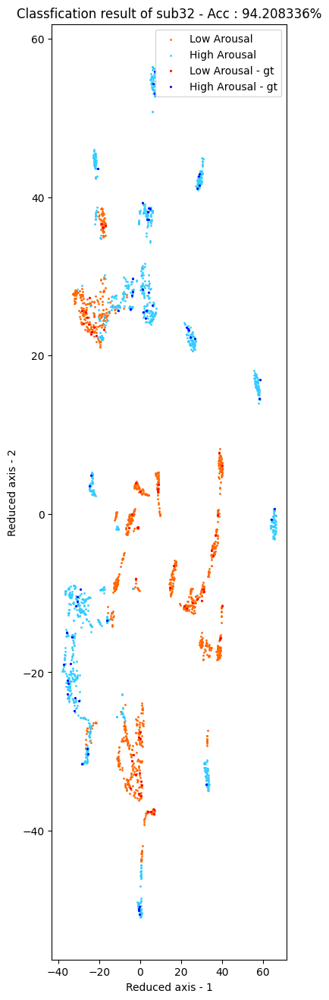

In [115]:
vlc_best_acc = []
ars_best_acc = []
visualization_type = 1
for i in range(32):
    print("\n\n******************* SUBJECT : {} *********************".format(i+1))

    date = '230331_mah_oSNF'
    sub_idx = 'sub'+str(i+1)

    subject_de, subject_psd, subject_label, _ = load_subject_data(args.tensor_save_path, isdeap=True)

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    valence_label, arousal_label = deap_label(sub_label)

    de, psd, vlc_identifier, ars_identifier = preprocessing(sub_de,sub_psd, (valence_label,arousal_label), args.n_labels_by_class, args.out_channels, args.seed, isdeap=True)

    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

    de_ssm, de_nssm = ssm_construction2(de, args.n_samples,args.de_k,'ma')
    psd_ssm, psd_nssm = ssm_construction2(psd, args.n_samples,args.psd_k, 'ma')
    save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
    save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
    save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
    save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    adj = normalize_adj(fsm)
    save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
    save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    feature = input_feature(de, psd)

    save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(adj).to(torch.float32).to(device)
    ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
    vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

    vlc_identifier = torch.from_numpy(vlc_identifier).bool()
    vlc_train_identifier = vlc_identifier.to(device)
    isunlabeled = ~vlc_identifier
    vlc_test_identifier = isunlabeled.to(device)

    ars_identifier = torch.from_numpy(ars_identifier).bool()
    ars_train_identifier = ars_identifier.to(device)
    isunlabeled = ~ars_identifier
    ars_test_identifier = isunlabeled.to(device)

    activation = get_activation('celu')
    gcn = GraphConvolution

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.005)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, vlc_label,
                                                                    vlc_train_identifier, vlc_test_identifier,
                                                                    args,device,date,sub_idx, isdeap=True)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    vlc_best_acc.append(round(best_acc.item(), 2))
    

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_valence'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'valence_test_acc_'+date, best_acc)

    cf_name = args.valence
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)


    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.005)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, ars_label,
                                                                        ars_train_identifier, ars_test_identifier,
                                                                        args,date,sub_idx, isdeap=True)
    
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    ars_best_acc.append(round(best_acc.item(), 2))

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_arousal'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'arousal_test_acc_'+date, best_acc)

    cf_name = args.arousal
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, ars_train_identifier, cf_name, fig_name)
print("\n**************** Valence *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
print("**************** Arousal *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))




******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 87.08    Train Loss : 0.38,    Test Acc : 84.96,    Test Loss :0.46,    Total Acc : 86.02
Epoch 640 - Train Acc : 93.75    Train Loss : 0.18,    Test Acc : 86.44,    Test Loss :0.37,    Total Acc : 90.09
Epoch 650 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 85.92,    Test Loss :0.4,    Total Acc : 90.67
Epoch 660 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 79.85,    Test Loss :0.68,    Total Acc : 85.34
Epoch 670 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 87.5,    Test Loss :0.38,    Total Acc : 91.46
Epoch 680 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 89.21,    Test Loss :0.33,    Total Acc : 92.94
Epoch 690 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 91.1,    Test Loss :0.31,    Total Acc : 93.68
Epoch 700 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 84.75,    Test Loss :0.46,    Total Acc : 89.88
Epoch 710 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 90.79,    Test Loss :0.38,

Epoch 1350 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.62,    Test Loss :0.41,    Total Acc : 95.6
Epoch 1360 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 90.44,    Test Loss :0.43,    Total Acc : 93.14
Epoch 1370 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 87.4,    Test Loss :0.48,    Total Acc : 92.03
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.5,    Test Loss :0.41,    Total Acc : 95.12
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.73,    Test Loss :0.37,    Total Acc : 95.74
Epoch 1400 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.29,    Test Loss :0.61,    Total Acc : 91.48
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.31,    Test Loss :0.59,    Total Acc : 92.53
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.25,    Test Loss :0.41,    Total Acc : 95.5
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.29,    Test Loss

Epoch 2070 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.62,    Test Loss :0.55,    Total Acc : 95.48
Epoch 2080 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.48,    Test Loss :0.5,    Total Acc : 96.03
Epoch 2090 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.4,    Test Loss :0.67,    Total Acc : 94.07
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.1,    Test Loss :0.44,    Total Acc : 96.55
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.81,    Test Loss :0.68,    Total Acc : 94.7
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :0.59,    Total Acc : 96.05
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.23,    Test Loss :0.43,    Total Acc : 96.41
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.88,    Test Loss :0.68,    Total Acc : 94.52
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.65,    Test Loss

Epoch 2800 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.77,    Test Loss :0.54,    Total Acc : 96.18
Epoch 2810 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.08,    Test Loss :0.56,    Total Acc : 95.71
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.08,    Test Loss :0.67,    Total Acc : 94.62
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test Loss :0.46,    Total Acc : 96.45
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.54,    Total Acc : 96.9
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.5,    Total Acc : 96.68
Epoch 2860 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.83,    Test Loss :0.58,    Total Acc : 95.08
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.77,    Test Loss :0.57,    Total Acc : 96.18
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.6,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 61.67    Train Loss : 0.73,    Test Acc : 55.06,    Test Loss :0.65,    Total Acc : 58.36
Epoch 20 - Train Acc : 66.25    Train Loss : 0.7,    Test Acc : 63.38,    Test Loss :0.6,    Total Acc : 64.81
Epoch 30 - Train Acc : 72.5    Train Loss : 0.65,    Test Acc : 68.19,    Test Loss :0.56,    Total Acc : 70.34
Epoch 40 - Train Acc : 80.0    Train Loss : 0.53,    Test Acc : 70.15,    Test Loss :0.52,    Total Acc : 75.07
Epoch 50 - Train Acc : 82.08    Train Loss : 0.46,    Test Acc : 73.08,    Test Loss :0.5,    Total Acc : 77.58
Epoch 60 - Train Acc : 86.67    Train Loss : 0.4,    Test Acc : 78.52,    Test Loss :0.43,    Total Acc : 82.59
Epoch 70 - Train Acc : 87.08    Train Loss : 0.38,    Test Acc : 81.98,    Test Loss :0.39,    Total Acc : 84.53
Epoch 80 - Train Acc : 87.5    Train Loss : 0.35,    Test Acc : 81.33,    Test Loss :0.41,    Total Acc : 84.42
Epoch 90 - Train Acc : 77.92    Train Loss : 0.54,    Test Acc : 71.96,    Test Loss :0.71,    Total Ac

Epoch 740 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 88.4,    Test Loss :0.43,    Total Acc : 91.07
Epoch 750 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.83,    Test Loss :0.41,    Total Acc : 93.08
Epoch 760 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 88.94,    Test Loss :0.43,    Total Acc : 92.18
Epoch 770 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 86.46,    Test Loss :0.42,    Total Acc : 92.6
Epoch 780 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 85.9,    Test Loss :0.5,    Total Acc : 92.11
Epoch 790 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 84.56,    Test Loss :0.55,    Total Acc : 90.2
Epoch 800 - Train Acc : 93.33    Train Loss : 0.18,    Test Acc : 82.62,    Test Loss :0.66,    Total Acc : 87.98
Epoch 810 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 84.42,    Test Loss :0.56,    Total Acc : 89.71
Epoch 820 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 88.67,    Test Loss :0.42,  

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.77,    Test Loss :0.65,    Total Acc : 92.26
Epoch 1480 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.5,    Test Loss :0.59,    Total Acc : 91.38
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 89.33,    Test Loss :0.5,    Total Acc : 94.46
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.56,    Test Loss :0.69,    Total Acc : 92.57
Epoch 1510 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.17,    Test Loss :0.71,    Total Acc : 90.92
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 86.23,    Test Loss :0.65,    Total Acc : 92.49
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 88.56,    Test Loss :0.58,    Total Acc : 93.86
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.73,    Test Loss :0.52,    Total Acc : 93.03
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.15,    Test L

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :0.43,    Total Acc : 94.93
Epoch 2200 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.1,    Test Loss :0.56,    Total Acc : 92.8
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.21,    Test Loss :0.52,    Total Acc : 94.6
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.56,    Test Loss :0.53,    Total Acc : 94.07
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.38,    Test Loss :0.55,    Total Acc : 93.98
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.71,    Test Loss :0.57,    Total Acc : 94.35
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.58,    Test Loss :0.66,    Total Acc : 93.38
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 86.1,    Test Loss :0.72,    Total Acc : 92.64
Epoch 2270 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 88.15,    Test Loss

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.12,    Test Loss :0.55,    Total Acc : 94.56
Epoch 2930 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 89.9,    Test Loss :0.49,    Total Acc : 94.11
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.35,    Test Loss :0.62,    Total Acc : 93.68
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 88.54,    Test Loss :0.63,    Total Acc : 93.44
Epoch 2960 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.17,    Test Loss :0.69,    Total Acc : 92.46
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.81,    Test Loss :0.59,    Total Acc : 93.2
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.42,    Test Loss :0.62,    Total Acc : 93.79
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.73,    Test Loss :0.63,    Total Acc : 93.24
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.71,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 2 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.5,    Test Loss :2.08,    Total Acc : 91.75
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.21,    Test Loss :1.87,    Total Acc : 90.69
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.27,    Test Loss :1.71,    Total Acc : 92.14
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.5,    Test Loss :1.96,    Total Acc : 92.25
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.46,    Test Loss :2.01,    Total Acc : 92.23
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.48,    Test Loss :1.95,    Total Acc : 92.24
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.62,    Test Loss :2.03,    Total Acc : 92.31
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.71,    Test Loss :1.8,    Total Acc : 91.85
Epoch 730 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.83,    Test Loss :2.07

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.96,    Test Loss :2.17,    Total Acc : 92.77
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 80.02,    Test Loss :2.76,    Total Acc : 89.8
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.15,    Test Loss :2.4,    Total Acc : 91.57
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.85,    Test Loss :2.48,    Total Acc : 92.43
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.44,    Test Loss :2.33,    Total Acc : 91.51
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.31,    Test Loss :2.51,    Total Acc : 92.16
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.4,    Test Loss :2.25,    Total Acc : 91.99
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.27,    Test Loss :2.45,    Total Acc : 92.64
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.5,    Test Lo

Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.79,    Test Loss :3.04,    Total Acc : 92.9
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 84.44,    Test Loss :2.62,    Total Acc : 92.01
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.88,    Test Loss :2.65,    Total Acc : 92.44
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.88,    Test Loss :2.35,    Total Acc : 92.44
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.19,    Test Acc : 83.75,    Test Loss :3.78,    Total Acc : 91.25
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.5,    Test Loss :2.34,    Total Acc : 92.75
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.27,    Test Loss :2.25,    Total Acc : 93.14
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.54,    Test Loss :2.41,    Total Acc : 92.77
Epoch 2180 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.73,    Test 

Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.6,    Test Loss :2.84,    Total Acc : 92.3
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.52,    Test Loss :2.84,    Total Acc : 92.26
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.6,    Test Loss :2.94,    Total Acc : 93.3
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.23,    Test Loss :2.9,    Total Acc : 92.61
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.94,    Test Loss :3.15,    Total Acc : 92.76
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.67,    Test Loss :3.01,    Total Acc : 92.83
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.85,    Test Loss :2.97,    Total Acc : 92.93
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.0,    Test Loss :3.12,    Total Acc : 92.5
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.92,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.5    Train Loss : 0.66,    Test Acc : 62.5,    Test Loss :0.63,    Total Acc : 67.5
Epoch 20 - Train Acc : 76.25    Train Loss : 0.6,    Test Acc : 64.02,    Test Loss :0.67,    Total Acc : 70.14
Epoch 30 - Train Acc : 83.33    Train Loss : 0.51,    Test Acc : 69.12,    Test Loss :0.62,    Total Acc : 76.23
Epoch 40 - Train Acc : 85.83    Train Loss : 0.42,    Test Acc : 69.98,    Test Loss :0.66,    Total Acc : 77.91
Epoch 50 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 69.92,    Test Loss :0.76,    Total Acc : 77.88
Epoch 60 - Train Acc : 90.0    Train Loss : 0.33,    Test Acc : 72.38,    Test Loss :0.77,    Total Acc : 81.19
Epoch 70 - Train Acc : 91.25    Train Loss : 0.3,    Test Acc : 74.08,    Test Loss :0.75,    Total Acc : 82.67
Epoch 80 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 73.33,    Test Loss :0.97,    Total Acc : 83.75
Epoch 90 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 72.88,    Test Loss :0.99,    Total A

Epoch 740 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.19,    Test Loss :1.48,    Total Acc : 91.59
Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.08,    Test Loss :1.47,    Total Acc : 92.04
Epoch 760 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 83.85,    Test Loss :1.35,    Total Acc : 91.51
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.98,    Test Loss :1.36,    Total Acc : 92.78
Epoch 780 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.5,    Test Loss :1.49,    Total Acc : 91.33
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.46,    Test Loss :1.35,    Total Acc : 92.23
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.04,    Test Loss :1.21,    Total Acc : 93.02
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.67,    Test Loss :1.62,    Total Acc : 91.12
Epoch 820 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 84.77,    Test Loss :1.5

Epoch 1460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.54,    Test Loss :1.23,    Total Acc : 93.77
Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.15,    Test Loss :1.41,    Total Acc : 93.57
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.0,    Test Loss :1.46,    Total Acc : 93.5
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.98,    Test Loss :1.7,    Total Acc : 92.49
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.35,    Test Loss :1.43,    Total Acc : 93.18
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.96,    Test Loss :1.53,    Total Acc : 92.98
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.77,    Test Loss :1.58,    Total Acc : 92.18
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.17,    Test Loss :1.71,    Total Acc : 92.58
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.52,    Test L

Epoch 2190 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 86.65,    Test Loss :1.93,    Total Acc : 92.7
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.56,    Test Loss :1.93,    Total Acc : 93.28
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.42,    Test Loss :1.73,    Total Acc : 93.21
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.27,    Test Loss :1.67,    Total Acc : 93.14
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.62,    Test Loss :1.77,    Total Acc : 92.81
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.19,    Test Loss :1.77,    Total Acc : 93.09
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.12,    Test Loss :1.6,    Total Acc : 93.56
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.08,    Test Loss :1.76,    Total Acc : 93.54
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.79,    Test 

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.15,    Test Loss :1.44,    Total Acc : 94.57
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.88,    Test Loss :1.69,    Total Acc : 93.94
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.08,    Test Loss :1.64,    Total Acc : 94.04
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.92,    Test Loss :1.69,    Total Acc : 93.46
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.46,    Test Loss :1.44,    Total Acc : 94.73
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.21,    Test Loss :1.75,    Total Acc : 93.4
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.42,    Test Loss :1.63,    Total Acc : 94.21
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.65,    Test Loss :1.7,    Total Acc : 93.32
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.85,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 3 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (756,),    high valence : (1764,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm 

/tmp/ipykernel_96451/723135367.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


Epoch 10 - Train Acc : 63.33    Train Loss : 0.71,    Test Acc : 49.69,    Test Loss :0.7,    Total Acc : 56.51
Epoch 20 - Train Acc : 68.33    Train Loss : 0.66,    Test Acc : 58.77,    Test Loss :0.73,    Total Acc : 63.55
Epoch 30 - Train Acc : 70.83    Train Loss : 0.6,    Test Acc : 61.56,    Test Loss :0.84,    Total Acc : 66.2
Epoch 40 - Train Acc : 80.42    Train Loss : 0.54,    Test Acc : 64.75,    Test Loss :0.92,    Total Acc : 72.58
Epoch 50 - Train Acc : 81.25    Train Loss : 0.53,    Test Acc : 62.54,    Test Loss :1.06,    Total Acc : 71.9
Epoch 60 - Train Acc : 77.92    Train Loss : 0.55,    Test Acc : 57.85,    Test Loss :1.15,    Total Acc : 67.89
Epoch 70 - Train Acc : 77.92    Train Loss : 0.53,    Test Acc : 61.56,    Test Loss :0.92,    Total Acc : 69.74
Epoch 80 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 67.35,    Test Loss :0.99,    Total Acc : 75.97
Epoch 90 - Train Acc : 86.67    Train Loss : 0.4,    Test Acc : 67.85,    Test Loss :1.03,    Total 

Epoch 750 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 75.71,    Test Loss :1.89,    Total Acc : 83.9
Epoch 760 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 76.83,    Test Loss :1.05,    Total Acc : 84.46
Epoch 770 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 85.54,    Test Loss :1.33,    Total Acc : 91.1
Epoch 780 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 86.19,    Test Loss :0.54,    Total Acc : 92.47
Epoch 790 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 83.44,    Test Loss :0.79,    Total Acc : 90.89
Epoch 800 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 79.83,    Test Loss :1.05,    Total Acc : 88.25
Epoch 810 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 84.4,    Test Loss :0.85,    Total Acc : 90.74
Epoch 820 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.69,    Test Loss :0.97,    Total Acc : 91.51
Epoch 830 - Train Acc : 91.25    Train Loss : 0.42,    Test Acc : 77.31,    Test Loss :1.67

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.31,    Test Loss :2.03,    Total Acc : 93.16
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.65,    Test Loss :2.23,    Total Acc : 91.61
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.23,    Test Loss :1.86,    Total Acc : 94.11
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.38,    Test Loss :1.83,    Total Acc : 93.19
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.21,    Test Loss :1.86,    Total Acc : 92.9
Epoch 1520 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 85.06,    Test Loss :2.12,    Total Acc : 91.07
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.48,    Test Loss :1.87,    Total Acc : 93.11
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.9,    Test Loss :1.91,    Total Acc : 93.24
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.67,    Test L

Epoch 2190 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.1,    Test Loss :1.87,    Total Acc : 93.43
Epoch 2200 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 85.6,    Test Loss :2.53,    Total Acc : 92.18
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.04,    Test Loss :2.42,    Total Acc : 93.52
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.48,    Test Loss :2.72,    Total Acc : 92.53
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.73,    Test Loss :2.06,    Total Acc : 94.36
Epoch 2240 - Train Acc : 97.92    Train Loss : 0.1,    Test Acc : 79.19,    Test Loss :2.83,    Total Acc : 88.55
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.96,    Test Loss :2.22,    Total Acc : 94.98
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.19,    Test Loss :2.55,    Total Acc : 93.09
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.67,    Test Lo

Epoch 2910 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.58,    Test Loss :1.98,    Total Acc : 93.17
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.81,    Test Loss :2.39,    Total Acc : 92.49
Epoch 2930 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 90.83,    Test Loss :1.45,    Total Acc : 94.58
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.67,    Test Loss :2.37,    Total Acc : 94.33
Epoch 2950 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.52,    Test Loss :2.68,    Total Acc : 92.34
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.81,    Test Loss :2.35,    Total Acc : 93.91
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.42,    Test Loss :2.15,    Total Acc : 94.0
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :2.2,    Total Acc : 94.23
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.71,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 57.92    Train Loss : 0.71,    Test Acc : 48.77,    Test Loss :0.67,    Total Acc : 53.34
Epoch 20 - Train Acc : 57.08    Train Loss : 0.7,    Test Acc : 54.71,    Test Loss :0.62,    Total Acc : 55.9
Epoch 30 - Train Acc : 62.92    Train Loss : 0.67,    Test Acc : 54.48,    Test Loss :0.62,    Total Acc : 58.7
Epoch 40 - Train Acc : 69.17    Train Loss : 0.63,    Test Acc : 62.21,    Test Loss :0.63,    Total Acc : 65.69
Epoch 50 - Train Acc : 73.75    Train Loss : 0.6,    Test Acc : 62.23,    Test Loss :0.62,    Total Acc : 67.99
Epoch 60 - Train Acc : 71.67    Train Loss : 0.58,    Test Acc : 60.21,    Test Loss :0.63,    Total Acc : 65.94
Epoch 70 - Train Acc : 73.33    Train Loss : 0.56,    Test Acc : 64.02,    Test Loss :0.6,    Total Acc : 68.68
Epoch 80 - Train Acc : 79.17    Train Loss : 0.5,    Test Acc : 65.44,    Test Loss :0.57,    Total Acc : 72.3
Epoch 90 - Train Acc : 79.17    Train Loss : 0.52,    Test Acc : 63.6,    Test Loss :0.63,    Total Acc

Epoch 750 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 81.67,    Test Loss :0.53,    Total Acc : 86.67
Epoch 760 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.17,    Test Loss :0.44,    Total Acc : 89.5
Epoch 770 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 83.54,    Test Loss :0.44,    Total Acc : 90.31
Epoch 780 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 85.04,    Test Loss :0.41,    Total Acc : 90.65
Epoch 790 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 85.54,    Test Loss :0.4,    Total Acc : 91.1
Epoch 800 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 83.12,    Test Loss :0.45,    Total Acc : 88.65
Epoch 810 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 85.6,    Test Loss :0.39,    Total Acc : 91.55
Epoch 820 - Train Acc : 90.83    Train Loss : 0.3,    Test Acc : 79.96,    Test Loss :0.67,    Total Acc : 85.4
Epoch 830 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 86.02,    Test Loss :0.33,   

Epoch 1470 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 85.58,    Test Loss :0.41,    Total Acc : 90.92
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 87.33,    Test Loss :0.38,    Total Acc : 93.67
Epoch 1490 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.02,    Test Loss :0.46,    Total Acc : 91.97
Epoch 1500 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 85.46,    Test Loss :0.45,    Total Acc : 91.27
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 88.77,    Test Loss :0.36,    Total Acc : 93.97
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 85.54,    Test Loss :0.58,    Total Acc : 90.9
Epoch 1530 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 86.48,    Test Loss :0.45,    Total Acc : 90.95
Epoch 1540 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 87.12,    Test Loss :0.4,    Total Acc : 92.1
Epoch 1550 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 87.08,    Test Lo

Epoch 2190 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.25,    Test Loss :0.54,    Total Acc : 91.88
Epoch 2200 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 87.31,    Test Loss :0.49,    Total Acc : 91.36
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.83,    Test Loss :0.39,    Total Acc : 94.5
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.46,    Test Loss :0.43,    Total Acc : 94.02
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.73,    Test Loss :0.33,    Total Acc : 94.66
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.65,    Test Loss :0.38,    Total Acc : 93.7
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.02,    Test Loss :0.44,    Total Acc : 93.8
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.44,    Test Loss :0.4,    Total Acc : 93.8
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.83,    Test Loss :0

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.4,    Test Loss :0.36,    Total Acc : 94.49
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 86.69,    Test Loss :0.57,    Total Acc : 93.14
Epoch 2930 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 88.65,    Test Loss :0.41,    Total Acc : 93.07
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 91.08,    Test Loss :0.41,    Total Acc : 95.33
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.83,    Test Loss :0.42,    Total Acc : 94.42
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.08,    Test Loss :0.51,    Total Acc : 93.62
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.58,    Test Loss :0.34,    Total Acc : 94.67
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.17,    Test Loss :0.46,    Total Acc : 94.08
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.69,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 4 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 78.33,    Test Loss :0.73,    Total Acc : 83.33
Epoch 640 - Train Acc : 82.08    Train Loss : 0.41,    Test Acc : 69.19,    Test Loss :0.8,    Total Acc : 75.64
Epoch 650 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 77.52,    Test Loss :0.69,    Total Acc : 84.59
Epoch 660 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 75.17,    Test Loss :0.8,    Total Acc : 82.58
Epoch 670 - Train Acc : 82.08    Train Loss : 0.56,    Test Acc : 78.38,    Test Loss :0.67,    Total Acc : 80.23
Epoch 680 - Train Acc : 88.75    Train Loss : 0.3,    Test Acc : 75.23,    Test Loss :0.7,    Total Acc : 81.99
Epoch 690 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 73.67,    Test Loss :0.8,    Total Acc : 79.96
Epoch 700 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 79.19,    Test Loss :0.68,    Total Acc : 85.22
Epoch 710 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 77.83,    Test Loss :0.66,  

Epoch 1350 - Train Acc : 88.33    Train Loss : 0.37,    Test Acc : 72.65,    Test Loss :0.96,    Total Acc : 80.49
Epoch 1360 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 80.4,    Test Loss :0.86,    Total Acc : 87.7
Epoch 1370 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 76.44,    Test Loss :0.82,    Total Acc : 84.05
Epoch 1380 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 81.29,    Test Loss :0.65,    Total Acc : 86.69
Epoch 1390 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 77.69,    Test Loss :0.93,    Total Acc : 84.47
Epoch 1400 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 82.5,    Test Loss :0.62,    Total Acc : 90.0
Epoch 1410 - Train Acc : 90.83    Train Loss : 0.3,    Test Acc : 76.56,    Test Loss :0.76,    Total Acc : 83.7
Epoch 1420 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 78.52,    Test Loss :0.8,    Total Acc : 84.68
Epoch 1430 - Train Acc : 86.25    Train Loss : 0.39,    Test Acc : 78.65,    Test Loss :0

Epoch 2070 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 82.04,    Test Loss :0.95,    Total Acc : 89.15
Epoch 2080 - Train Acc : 90.42    Train Loss : 0.44,    Test Acc : 75.02,    Test Loss :1.39,    Total Acc : 82.72
Epoch 2090 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 83.62,    Test Loss :0.66,    Total Acc : 90.56
Epoch 2100 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 81.62,    Test Loss :0.78,    Total Acc : 86.85
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 85.58,    Test Loss :0.69,    Total Acc : 92.17
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 79.6,    Test Loss :0.79,    Total Acc : 88.55
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 85.27,    Test Loss :0.75,    Total Acc : 91.8
Epoch 2140 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 79.96,    Test Loss :1.1,    Total Acc : 89.15
Epoch 2150 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 83.44,    Test Los

Epoch 2790 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 85.44,    Test Loss :0.7,    Total Acc : 92.09
Epoch 2800 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 84.73,    Test Loss :0.86,    Total Acc : 92.16
Epoch 2810 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 83.46,    Test Loss :0.89,    Total Acc : 90.06
Epoch 2820 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.29,    Test Loss :0.62,    Total Acc : 93.52
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.27,    Test Loss :0.67,    Total Acc : 92.51
Epoch 2840 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 82.6,    Test Loss :0.91,    Total Acc : 89.43
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.92,    Test Loss :0.77,    Total Acc : 92.54
Epoch 2860 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 83.58,    Test Loss :0.76,    Total Acc : 90.12
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 81.52,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.0    Train Loss : 0.64,    Test Acc : 64.15,    Test Loss :0.63,    Total Acc : 69.57
Epoch 20 - Train Acc : 79.58    Train Loss : 0.52,    Test Acc : 69.08,    Test Loss :0.55,    Total Acc : 74.33
Epoch 30 - Train Acc : 78.75    Train Loss : 0.48,    Test Acc : 67.65,    Test Loss :0.6,    Total Acc : 73.2
Epoch 40 - Train Acc : 78.75    Train Loss : 0.48,    Test Acc : 68.42,    Test Loss :0.66,    Total Acc : 73.58
Epoch 50 - Train Acc : 79.58    Train Loss : 0.45,    Test Acc : 69.35,    Test Loss :0.64,    Total Acc : 74.47
Epoch 60 - Train Acc : 83.75    Train Loss : 0.43,    Test Acc : 70.25,    Test Loss :0.64,    Total Acc : 77.0
Epoch 70 - Train Acc : 82.5    Train Loss : 0.41,    Test Acc : 72.02,    Test Loss :0.66,    Total Acc : 77.26
Epoch 80 - Train Acc : 83.75    Train Loss : 0.4,    Test Acc : 70.12,    Test Loss :0.76,    Total Acc : 76.94
Epoch 90 - Train Acc : 90.0    Train Loss : 0.33,    Test Acc : 75.71,    Test Loss :0.68,    Total Ac

Epoch 760 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 78.48,    Test Loss :0.98,    Total Acc : 86.74
Epoch 770 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 79.65,    Test Loss :1.0,    Total Acc : 87.74
Epoch 780 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 78.02,    Test Loss :1.29,    Total Acc : 85.68
Epoch 790 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 77.06,    Test Loss :1.14,    Total Acc : 85.2
Epoch 800 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 83.0,    Test Loss :0.99,    Total Acc : 90.67
Epoch 810 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 81.27,    Test Loss :1.01,    Total Acc : 88.14
Epoch 820 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 81.31,    Test Loss :0.91,    Total Acc : 88.57
Epoch 830 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 81.56,    Test Loss :1.06,    Total Acc : 89.53
Epoch 840 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 82.25,    Test Loss :1.17,   

Epoch 1480 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 77.94,    Test Loss :1.49,    Total Acc : 86.47
Epoch 1490 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 79.31,    Test Loss :1.52,    Total Acc : 87.16
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 83.96,    Test Loss :1.36,    Total Acc : 90.73
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 83.06,    Test Loss :1.44,    Total Acc : 90.07
Epoch 1520 - Train Acc : 92.92    Train Loss : 0.2,    Test Acc : 77.85,    Test Loss :1.43,    Total Acc : 85.39
Epoch 1530 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 82.1,    Test Loss :1.25,    Total Acc : 89.39
Epoch 1540 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 82.0,    Test Loss :1.3,    Total Acc : 88.71
Epoch 1550 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 82.46,    Test Loss :1.43,    Total Acc : 89.15
Epoch 1560 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 78.0,    Test Loss :1.

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 84.19,    Test Loss :1.39,    Total Acc : 92.09
Epoch 2210 - Train Acc : 90.83    Train Loss : 0.33,    Test Acc : 80.04,    Test Loss :1.81,    Total Acc : 85.44
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.42,    Test Loss :1.37,    Total Acc : 91.67
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 83.15,    Test Loss :1.5,    Total Acc : 90.53
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.9,    Test Loss :1.17,    Total Acc : 92.95
Epoch 2250 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.81,    Test Loss :1.5,    Total Acc : 91.07
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 84.23,    Test Loss :1.28,    Total Acc : 91.28
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 83.27,    Test Loss :1.4,    Total Acc : 90.39
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 84.19,    Test Loss

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.38,    Test Loss :1.89,    Total Acc : 92.69
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.0,    Test Loss :1.53,    Total Acc : 91.38
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.17,    Test Loss :1.8,    Total Acc : 92.58
Epoch 2950 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.08,    Test Loss :1.54,    Total Acc : 92.62
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.58,    Test Loss :1.53,    Total Acc : 90.96
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.25,    Test Loss :1.73,    Total Acc : 92.62
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.92,    Test Loss :1.72,    Total Acc : 92.54
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.96,    Test Loss :2.16,    Total Acc : 91.85
Epoch 3000 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.33,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 5 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1575,),    high valence : (945,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 89.77,    Test Loss :0.29,    Total Acc : 92.39
Epoch 640 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 84.54,    Test Loss :0.61,    Total Acc : 88.94
Epoch 650 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 84.31,    Test Loss :0.68,    Total Acc : 87.99
Epoch 660 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 87.0,    Test Loss :0.38,    Total Acc : 90.79
Epoch 670 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 89.08,    Test Loss :0.36,    Total Acc : 93.08
Epoch 680 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 89.67,    Test Loss :0.28,    Total Acc : 92.96
Epoch 690 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 90.21,    Test Loss :0.32,    Total Acc : 94.27
Epoch 700 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 89.62,    Test Loss :0.32,    Total Acc : 93.35
Epoch 710 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.92,    Test Loss :0.22

Epoch 1360 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 90.75,    Test Loss :0.25,    Total Acc : 94.12
Epoch 1370 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.15,    Test Loss :0.4,    Total Acc : 93.74
Epoch 1380 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.35,    Test Loss :0.21,    Total Acc : 95.34
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.9,    Test Loss :0.24,    Total Acc : 94.61
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.73,    Test Loss :0.22,    Total Acc : 94.82
Epoch 1410 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 88.65,    Test Loss :0.4,    Total Acc : 92.24
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.12,    Test Loss :0.39,    Total Acc : 94.65
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.98,    Test Loss :0.28,    Total Acc : 94.86
Epoch 1440 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 90.65,    Test Los

Epoch 2080 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.52,    Test Loss :0.34,    Total Acc : 94.93
Epoch 2090 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 90.71,    Test Loss :0.38,    Total Acc : 93.9
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.1,    Test Loss :0.36,    Total Acc : 95.34
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.02,    Test Loss :0.39,    Total Acc : 95.3
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.31,    Test Loss :0.35,    Total Acc : 95.45
Epoch 2130 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 89.19,    Test Loss :0.53,    Total Acc : 93.14
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.04,    Test Loss :0.29,    Total Acc : 96.02
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.81,    Test Loss :0.4,    Total Acc : 94.07
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.96,    Test Los

Epoch 2800 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 90.96,    Test Loss :0.4,    Total Acc : 93.81
Epoch 2810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.69,    Test Loss :0.61,    Total Acc : 93.93
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.29,    Test Loss :0.24,    Total Acc : 96.44
Epoch 2830 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 92.5,    Test Loss :0.29,    Total Acc : 94.79
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.35,    Test Loss :0.38,    Total Acc : 95.47
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.31,    Test Loss :0.27,    Total Acc : 96.66
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.0,    Test Loss :0.5,    Total Acc : 94.79
Epoch 2870 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 90.69,    Test Loss :0.4,    Total Acc : 94.51
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.31,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.08    Train Loss : 0.65,    Test Acc : 66.67,    Test Loss :0.59,    Total Acc : 66.88
Epoch 20 - Train Acc : 73.75    Train Loss : 0.63,    Test Acc : 70.17,    Test Loss :0.57,    Total Acc : 71.96
Epoch 30 - Train Acc : 75.83    Train Loss : 0.6,    Test Acc : 73.75,    Test Loss :0.55,    Total Acc : 74.79
Epoch 40 - Train Acc : 76.67    Train Loss : 0.57,    Test Acc : 73.65,    Test Loss :0.53,    Total Acc : 75.16
Epoch 50 - Train Acc : 75.42    Train Loss : 0.52,    Test Acc : 72.79,    Test Loss :0.5,    Total Acc : 74.1
Epoch 60 - Train Acc : 77.92    Train Loss : 0.48,    Test Acc : 74.73,    Test Loss :0.48,    Total Acc : 76.32
Epoch 70 - Train Acc : 86.67    Train Loss : 0.44,    Test Acc : 80.31,    Test Loss :0.43,    Total Acc : 83.49
Epoch 80 - Train Acc : 85.0    Train Loss : 0.41,    Test Acc : 79.96,    Test Loss :0.44,    Total Acc : 82.48
Epoch 90 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 82.5,    Test Loss :0.41,    Total 

Epoch 760 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 85.5,    Test Loss :0.43,    Total Acc : 89.42
Epoch 770 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.08,    Test Loss :0.34,    Total Acc : 94.83
Epoch 780 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.56,    Test Loss :0.28,    Total Acc : 95.36
Epoch 790 - Train Acc : 92.08    Train Loss : 0.29,    Test Acc : 84.88,    Test Loss :0.5,    Total Acc : 88.48
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.71,    Test Loss :0.34,    Total Acc : 93.94
Epoch 810 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.08,    Test Loss :0.44,    Total Acc : 93.0
Epoch 820 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 86.96,    Test Loss :0.62,    Total Acc : 91.81
Epoch 830 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.21,    Test Loss :0.48,    Total Acc : 91.94
Epoch 840 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.52,    Test Loss :0.49,   

Epoch 1480 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.71,    Test Loss :0.56,    Total Acc : 93.23
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.98,    Test Loss :0.51,    Total Acc : 94.07
Epoch 1500 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.96,    Test Loss :0.7,    Total Acc : 91.6
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.75,    Test Loss :0.5,    Total Acc : 94.46
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.56,    Test Loss :0.43,    Total Acc : 95.16
Epoch 1530 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 85.1,    Test Loss :0.68,    Total Acc : 90.68
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 88.65,    Test Loss :0.59,    Total Acc : 94.32
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.25,    Test Loss :0.58,    Total Acc : 94.62
Epoch 1560 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.77,    Test Loss :

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.08,    Test Loss :0.61,    Total Acc : 95.04
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.29,    Test Loss :0.64,    Total Acc : 94.02
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.21,    Test Loss :0.74,    Total Acc : 94.4
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.73,    Test Loss :0.79,    Total Acc : 94.16
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.31,    Test Loss :0.6,    Total Acc : 94.95
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 88.15,    Test Loss :0.79,    Total Acc : 93.66
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.96,    Test Loss :0.59,    Total Acc : 95.06
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.62,    Test Loss :0.9,    Total Acc : 93.19
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.15,    Test Los

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.0,    Test Loss :0.7,    Total Acc : 95.0
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.52,    Test Loss :0.64,    Total Acc : 94.76
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.31,    Test Loss :0.71,    Total Acc : 94.45
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.6,    Test Loss :0.71,    Total Acc : 95.09
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.35,    Test Loss :0.81,    Total Acc : 94.68
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.06,    Test Loss :0.63,    Total Acc : 96.03
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.85,    Test Loss :0.79,    Total Acc : 93.8
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :0.72,    Total Acc : 95.34
*** Best ACC : 92.19 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is s

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 6 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 88.65,    Test Loss :0.75,    Total Acc : 93.49
Epoch 650 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.92,    Test Loss :0.76,    Total Acc : 94.25
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.5,    Test Loss :0.85,    Total Acc : 93.25
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.04,    Test Loss :0.87,    Total Acc : 94.02
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.77,    Test Loss :0.81,    Total Acc : 94.18
Epoch 690 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.35,    Test Loss :0.83,    Total Acc : 94.26
Epoch 700 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.35,    Test Loss :0.73,    Total Acc : 94.47
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.98,    Test Loss :0.79,    Total Acc : 94.49
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.56,    Test Loss :0.76

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.44,    Test Loss :0.92,    Total Acc : 94.22
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.88,    Test Loss :1.0,    Total Acc : 94.44
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.19,    Test Loss :0.97,    Total Acc : 94.39
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.77,    Test Loss :1.02,    Total Acc : 93.97
Epoch 1400 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 87.15,    Test Loss :1.06,    Total Acc : 91.7
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 87.77,    Test Loss :1.03,    Total Acc : 93.26
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.1,    Test Loss :0.93,    Total Acc : 94.55
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.62,    Test Loss :0.91,    Total Acc : 94.81
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.27,    Test L

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.62,    Test Loss :1.16,    Total Acc : 93.81
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.15,    Test Loss :1.01,    Total Acc : 94.57
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.46,    Test Loss :0.99,    Total Acc : 94.73
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.06,    Test Loss :1.12,    Total Acc : 94.03
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.98,    Test Loss :1.01,    Total Acc : 94.78
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 89.73,    Test Loss :0.98,    Total Acc : 93.61
Epoch 2140 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 83.42,    Test Loss :1.45,    Total Acc : 90.46
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.69,    Test Loss :0.97,    Total Acc : 94.64
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.1,    Test Lo

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.73,    Test Loss :1.07,    Total Acc : 94.86
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.88,    Test Loss :1.19,    Total Acc : 94.23
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.46,    Test Loss :1.16,    Total Acc : 94.73
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.4,    Test Loss :1.08,    Total Acc : 95.2
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :1.05,    Total Acc : 95.68
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.92,    Test Loss :1.14,    Total Acc : 95.46
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.29,    Test Loss :1.03,    Total Acc : 94.73
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :0.96,    Total Acc : 95.61
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.02,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 66.67    Train Loss : 0.7,    Test Acc : 69.15,    Test Loss :0.6,    Total Acc : 67.91
Epoch 20 - Train Acc : 72.5    Train Loss : 0.61,    Test Acc : 71.21,    Test Loss :0.56,    Total Acc : 71.85
Epoch 30 - Train Acc : 77.5    Train Loss : 0.5,    Test Acc : 74.58,    Test Loss :0.5,    Total Acc : 76.04
Epoch 40 - Train Acc : 81.25    Train Loss : 0.47,    Test Acc : 74.04,    Test Loss :0.51,    Total Acc : 77.65
Epoch 50 - Train Acc : 82.5    Train Loss : 0.43,    Test Acc : 75.1,    Test Loss :0.48,    Total Acc : 78.8
Epoch 60 - Train Acc : 85.42    Train Loss : 0.38,    Test Acc : 77.9,    Test Loss :0.48,    Total Acc : 81.66
Epoch 70 - Train Acc : 79.17    Train Loss : 0.49,    Test Acc : 75.88,    Test Loss :0.66,    Total Acc : 77.52
Epoch 80 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 75.58,    Test Loss :0.52,    Total Acc : 81.54
Epoch 90 - Train Acc : 87.08    Train Loss : 0.34,    Test Acc : 76.52,    Test Loss :0.49,    Total Acc : 

Epoch 750 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.71,    Test Loss :0.64,    Total Acc : 92.73
Epoch 760 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.23,    Test Loss :0.63,    Total Acc : 92.2
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.98,    Test Loss :0.48,    Total Acc : 93.78
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.0,    Test Loss :0.6,    Total Acc : 93.0
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.79,    Test Loss :0.46,    Total Acc : 94.4
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.98,    Test Loss :0.51,    Total Acc : 93.49
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.04,    Test Loss :0.61,    Total Acc : 92.81
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.1,    Test Loss :0.51,    Total Acc : 94.05
Epoch 830 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.48,    Test Loss :0.68,   

Epoch 1470 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.19,    Test Loss :0.87,    Total Acc : 92.39
Epoch 1480 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.44,    Test Loss :0.53,    Total Acc : 93.68
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.54,    Test Loss :0.71,    Total Acc : 93.77
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.48,    Test Loss :0.55,    Total Acc : 94.24
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.67,    Test Loss :0.59,    Total Acc : 94.12
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.17,    Test Loss :0.68,    Total Acc : 93.88
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.94,    Test Loss :0.88,    Total Acc : 92.76
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.1,    Test Loss :0.51,    Total Acc : 94.34
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.21,    Test

Epoch 2190 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.23,    Test Loss :0.67,    Total Acc : 93.7
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.48,    Test Loss :0.49,    Total Acc : 95.24
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.38,    Test Loss :0.59,    Total Acc : 94.19
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.94,    Test Loss :0.65,    Total Acc : 94.47
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.94,    Test Loss :0.56,    Total Acc : 94.97
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.29,    Test Loss :0.62,    Total Acc : 94.15
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.23,    Test Loss :0.71,    Total Acc : 93.91
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.79,    Test Loss :0.67,    Total Acc : 94.4
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.65,    Test 

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.17,    Test Loss :0.71,    Total Acc : 94.08
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.83,    Test Loss :0.45,    Total Acc : 94.92
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.96,    Test Loss :0.52,    Total Acc : 94.98
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.38,    Test Loss :0.76,    Total Acc : 94.19
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.21,    Test Loss :0.56,    Total Acc : 95.1
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.77,    Test Loss :0.56,    Total Acc : 94.89
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.35,    Test Loss :0.69,    Total Acc : 94.18
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.85,    Test Loss :0.51,    Total Acc : 94.93
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.35,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 7 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1701,),    high arousal : (819,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm 

Epoch 640 - Train Acc : 99.17    Train Loss : 0.14,    Test Acc : 94.92,    Test Loss :0.12,    Total Acc : 97.04
Epoch 650 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 88.08,    Test Loss :0.42,    Total Acc : 90.92
Epoch 660 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.81,    Test Loss :0.24,    Total Acc : 93.16
Epoch 670 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 93.5,    Test Loss :0.15,    Total Acc : 95.71
Epoch 680 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.88,    Test Loss :0.14,    Total Acc : 96.94
Epoch 690 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 94.38,    Test Loss :0.13,    Total Acc : 96.77
Epoch 700 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 88.1,    Test Loss :0.31,    Total Acc : 92.18
Epoch 710 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 90.52,    Test Loss :0.26,    Total Acc : 91.72
Epoch 720 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 89.17,    Test Loss :0.24,

Epoch 1370 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 90.33,    Test Loss :0.28,    Total Acc : 93.92
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.2,    Total Acc : 96.76
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.25,    Test Loss :0.32,    Total Acc : 95.12
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.22,    Total Acc : 96.61
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 91.21,    Test Loss :0.34,    Total Acc : 94.98
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.88,    Test Loss :0.32,    Total Acc : 95.23
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.96,    Test Loss :0.45,    Total Acc : 94.77
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.9,    Test Loss :0.31,    Total Acc : 95.74
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.04,    Test Lo

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.81,    Test Loss :0.29,    Total Acc : 96.41
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.33,    Test Loss :0.37,    Total Acc : 96.17
Epoch 2110 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.19,    Test Loss :0.42,    Total Acc : 96.18
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.75,    Test Loss :0.33,    Total Acc : 96.17
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :0.39,    Total Acc : 95.93
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.4,    Test Loss :0.3,    Total Acc : 96.7
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.35,    Total Acc : 96.16
Epoch 2160 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 92.21,    Test Loss :0.33,    Total Acc : 94.44
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test L

Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.46,    Test Loss :0.33,    Total Acc : 95.52
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.29,    Test Loss :0.43,    Total Acc : 95.94
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.25,    Total Acc : 96.83
Epoch 2850 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.83,    Test Loss :0.5,    Total Acc : 94.08
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.71,    Test Loss :0.3,    Total Acc : 96.85
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.96,    Test Loss :0.21,    Total Acc : 96.77
Epoch 2880 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 90.54,    Test Loss :0.44,    Total Acc : 93.81
Epoch 2890 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.02,    Test Loss :0.35,    Total Acc : 94.89
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 68.33    Train Loss : 0.72,    Test Acc : 61.48,    Test Loss :0.65,    Total Acc : 64.91
Epoch 20 - Train Acc : 75.42    Train Loss : 0.62,    Test Acc : 63.71,    Test Loss :0.61,    Total Acc : 69.56
Epoch 30 - Train Acc : 82.08    Train Loss : 0.5,    Test Acc : 72.71,    Test Loss :0.53,    Total Acc : 77.4
Epoch 40 - Train Acc : 81.25    Train Loss : 0.45,    Test Acc : 74.31,    Test Loss :0.49,    Total Acc : 77.78
Epoch 50 - Train Acc : 86.67    Train Loss : 0.36,    Test Acc : 77.21,    Test Loss :0.54,    Total Acc : 81.94
Epoch 60 - Train Acc : 81.25    Train Loss : 0.44,    Test Acc : 77.33,    Test Loss :0.55,    Total Acc : 79.29
Epoch 70 - Train Acc : 86.67    Train Loss : 0.4,    Test Acc : 79.73,    Test Loss :0.57,    Total Acc : 83.2
Epoch 80 - Train Acc : 88.75    Train Loss : 0.34,    Test Acc : 73.06,    Test Loss :0.72,    Total Acc : 80.91
Epoch 90 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 77.15,    Test Loss :0.64,    Total

Epoch 740 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 84.17,    Test Loss :1.43,    Total Acc : 91.46
Epoch 750 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 81.83,    Test Loss :1.63,    Total Acc : 87.58
Epoch 760 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 84.17,    Test Loss :1.28,    Total Acc : 89.58
Epoch 770 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.69,    Test Loss :1.33,    Total Acc : 91.8
Epoch 780 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 80.67,    Test Loss :1.7,    Total Acc : 87.42
Epoch 790 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 81.33,    Test Loss :1.45,    Total Acc : 87.54
Epoch 800 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 85.42,    Test Loss :1.29,    Total Acc : 91.25
Epoch 810 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 84.29,    Test Loss :1.55,    Total Acc : 91.73
Epoch 820 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 85.1,    Test Loss :1.41, 

Epoch 1460 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 82.92,    Test Loss :1.69,    Total Acc : 90.62
Epoch 1470 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 82.08,    Test Loss :2.05,    Total Acc : 90.21
Epoch 1480 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 84.31,    Test Loss :1.74,    Total Acc : 90.7
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.23,    Test Loss :1.7,    Total Acc : 92.7
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 85.27,    Test Loss :1.6,    Total Acc : 91.39
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 84.27,    Test Loss :1.92,    Total Acc : 91.93
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 85.31,    Test Loss :1.75,    Total Acc : 92.66
Epoch 1530 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 82.88,    Test Loss :1.83,    Total Acc : 88.31
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.31,    Test Loss 

Epoch 2180 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 80.35,    Test Loss :1.99,    Total Acc : 88.3
Epoch 2190 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 83.81,    Test Loss :2.29,    Total Acc : 90.86
Epoch 2200 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 81.75,    Test Loss :1.83,    Total Acc : 89.62
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.02,    Test Loss :2.1,    Total Acc : 91.89
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.96,    Test Loss :2.04,    Total Acc : 92.27
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 83.12,    Test Loss :1.91,    Total Acc : 90.52
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 83.56,    Test Loss :2.18,    Total Acc : 90.95
Epoch 2250 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 78.44,    Test Loss :2.13,    Total Acc : 85.89
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.27,    Test Loss

Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 83.83,    Test Loss :1.92,    Total Acc : 91.92
Epoch 2910 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.06,    Test Loss :2.06,    Total Acc : 90.7
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.0,    Test Loss :1.87,    Total Acc : 93.5
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.08,    Test Loss :1.94,    Total Acc : 93.54
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.19,    Test Loss :1.97,    Total Acc : 93.59
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.5,    Test Loss :2.11,    Total Acc : 93.25
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.56,    Test Loss :2.19,    Total Acc : 92.86
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.52,    Test Loss :1.98,    Total Acc : 92.84
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.35,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 8 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 75.71,    Test Loss :1.34,    Total Acc : 87.23
Epoch 650 - Train Acc : 94.58    Train Loss : 0.16,    Test Acc : 74.12,    Test Loss :1.57,    Total Acc : 84.35
Epoch 660 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 78.25,    Test Loss :1.25,    Total Acc : 88.5
Epoch 670 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 79.1,    Test Loss :1.33,    Total Acc : 87.89
Epoch 680 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 77.88,    Test Loss :1.19,    Total Acc : 88.94
Epoch 690 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 80.42,    Test Loss :1.2,    Total Acc : 89.58
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 78.75,    Test Loss :1.16,    Total Acc : 89.38
Epoch 710 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 77.94,    Test Loss :1.22,    Total Acc : 88.55
Epoch 720 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 77.83,    Test Loss :1.19,  

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.92,    Test Loss :1.36,    Total Acc : 90.25
Epoch 1380 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 77.98,    Test Loss :1.45,    Total Acc : 87.53
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.29,    Test Loss :1.37,    Total Acc : 90.23
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 77.48,    Test Loss :1.68,    Total Acc : 87.7
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.27,    Test Loss :1.51,    Total Acc : 89.64
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.52,    Test Loss :1.48,    Total Acc : 90.26
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.21,    Test Loss :1.51,    Total Acc : 90.69
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.23,    Test Loss :1.45,    Total Acc : 90.11
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 79.52,    Test

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.1,    Test Loss :1.71,    Total Acc : 90.05
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.65,    Test Loss :1.82,    Total Acc : 90.11
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.46,    Test Loss :1.81,    Total Acc : 89.73
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 78.58,    Test Loss :1.8,    Total Acc : 89.08
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 79.96,    Test Loss :1.6,    Total Acc : 89.77
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 79.94,    Test Loss :1.96,    Total Acc : 89.76
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.06,    Test Loss :1.67,    Total Acc : 91.03
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.1,    Test Loss :1.63,    Total Acc : 89.84
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.25,    Test Lo

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.5,    Test Loss :1.84,    Total Acc : 90.75
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 80.77,    Test Loss :1.79,    Total Acc : 90.39
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 81.77,    Test Loss :1.83,    Total Acc : 90.68
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.56,    Test Loss :1.78,    Total Acc : 90.78
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.08,    Test Loss :1.81,    Total Acc : 90.04
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 80.04,    Test Loss :1.75,    Total Acc : 90.02
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 79.81,    Test Loss :1.87,    Total Acc : 89.28
Epoch 2880 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 80.9,    Test Loss :1.82,    Total Acc : 89.41
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 79.17,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 78.33    Train Loss : 0.61,    Test Acc : 71.83,    Test Loss :0.53,    Total Acc : 75.08
Epoch 20 - Train Acc : 86.25    Train Loss : 0.44,    Test Acc : 74.04,    Test Loss :0.48,    Total Acc : 80.15
Epoch 30 - Train Acc : 92.08    Train Loss : 0.33,    Test Acc : 82.29,    Test Loss :0.39,    Total Acc : 87.19
Epoch 40 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 81.08,    Test Loss :0.43,    Total Acc : 86.79
Epoch 50 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 87.88,    Test Loss :0.3,    Total Acc : 91.65
Epoch 60 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 92.06,    Test Loss :0.27,    Total Acc : 95.82
Epoch 70 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.38,    Test Loss :0.27,    Total Acc : 96.06
Epoch 80 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.23,    Test Loss :0.34,    Total Acc : 95.91
Epoch 90 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.1,    Test Loss :0.32,    Total 

Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.08,    Test Loss :0.23,    Total Acc : 97.54
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.1,    Test Loss :0.47,    Total Acc : 96.55
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.1,    Test Loss :0.26,    Total Acc : 97.55
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :0.54,    Total Acc : 95.68
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.31,    Test Loss :0.4,    Total Acc : 96.66
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.79,    Test Loss :0.47,    Total Acc : 96.4
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.46,    Total Acc : 96.34
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.23,    Test Loss :0.3,    Total Acc : 97.61
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.36, 

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.38,    Test Loss :0.84,    Total Acc : 96.19
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.71,    Test Loss :0.88,    Total Acc : 96.85
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.81,    Test Loss :1.04,    Total Acc : 95.7
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.56,    Test Loss :1.18,    Total Acc : 95.28
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.31,    Test Loss :1.36,    Total Acc : 95.16
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.96,    Test Loss :0.93,    Total Acc : 95.98
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.73,    Test Loss :0.96,    Total Acc : 96.36
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 93.23,    Test Loss :0.83,    Total Acc : 96.41
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.29,    Test

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :0.91,    Total Acc : 96.53
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.95,    Total Acc : 96.47
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :1.02,    Total Acc : 96.07
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :0.77,    Total Acc : 96.3
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.33,    Test Loss :0.89,    Total Acc : 96.17
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.19,    Test Loss :0.8,    Total Acc : 96.09
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.46,    Test Loss :1.43,    Total Acc : 95.73
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.17,    Test Loss :1.56,    Total Acc : 94.88
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Lo

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.54,    Test Loss :0.88,    Total Acc : 96.27
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.23,    Test Loss :0.92,    Total Acc : 96.11
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :1.06,    Total Acc : 95.36
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.62,    Test Loss :0.9,    Total Acc : 96.31
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.84,    Total Acc : 96.5
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.91,    Total Acc : 95.8
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test Loss :0.81,    Total Acc : 96.45
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.76,    Total Acc : 96.62
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.21,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 9 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.54,    Test Loss :0.51,    Total Acc : 95.56
Epoch 640 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.04,    Test Loss :0.44,    Total Acc : 94.81
Epoch 650 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :0.54,    Total Acc : 95.41
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.21,    Test Loss :0.54,    Total Acc : 96.1
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.25,    Test Loss :0.48,    Total Acc : 95.92
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.08,    Test Loss :0.45,    Total Acc : 96.04
Epoch 690 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.85,    Test Loss :0.58,    Total Acc : 94.72
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.49,    Total Acc : 95.8
Epoch 710 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.33,    Test Loss :0.53

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :0.78,    Total Acc : 96.07
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :0.76,    Total Acc : 95.96
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.81,    Test Loss :0.73,    Total Acc : 96.41
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.62,    Test Loss :0.69,    Total Acc : 96.31
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.17,    Test Loss :0.75,    Total Acc : 96.08
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.77,    Total Acc : 96.14
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Loss :0.98,    Total Acc : 95.86
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.76,    Total Acc : 96.16
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.75,    Test Loss :0.8,    Total Acc : 96.38
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.94,    Test Loss :1.02,    Total Acc : 95.97
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.85,    Test Loss :0.87,    Total Acc : 96.43
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.44,    Test Loss :0.91,    Total Acc : 96.22
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :0.93,    Total Acc : 96.3
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.06,    Test Loss :1.03,    Total Acc : 96.53
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.65,    Test Loss :0.92,    Total Acc : 96.32
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :1.02,    Total Acc : 96.21
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.29,    Test L

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.42,    Test Loss :1.08,    Total Acc : 96.21
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.35,    Test Loss :1.22,    Total Acc : 96.18
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :1.14,    Total Acc : 96.16
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.02,    Test Loss :1.09,    Total Acc : 96.51
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.83,    Test Loss :1.11,    Total Acc : 95.92
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.77,    Test Loss :1.26,    Total Acc : 95.89
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.58,    Test Loss :1.42,    Total Acc : 95.79
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.9,    Test Loss :1.23,    Total Acc : 95.95
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.56,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.5    Train Loss : 0.62,    Test Acc : 69.1,    Test Loss :0.57,    Total Acc : 73.3
Epoch 20 - Train Acc : 78.75    Train Loss : 0.48,    Test Acc : 70.29,    Test Loss :0.55,    Total Acc : 74.52
Epoch 30 - Train Acc : 90.83    Train Loss : 0.37,    Test Acc : 78.35,    Test Loss :0.51,    Total Acc : 84.59
Epoch 40 - Train Acc : 94.58    Train Loss : 0.28,    Test Acc : 83.15,    Test Loss :0.48,    Total Acc : 88.86
Epoch 50 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 82.23,    Test Loss :0.48,    Total Acc : 87.78
Epoch 60 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 82.67,    Test Loss :0.51,    Total Acc : 89.25
Epoch 70 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 84.21,    Test Loss :0.47,    Total Acc : 90.02
Epoch 80 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 84.56,    Test Loss :0.48,    Total Acc : 91.24
Epoch 90 - Train Acc : 99.17    Train Loss : 0.14,    Test Acc : 84.73,    Test Loss :0.52,    Total

Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.29,    Test Loss :0.6,    Total Acc : 94.15
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.21,    Test Loss :0.61,    Total Acc : 94.1
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.38,    Test Loss :0.64,    Total Acc : 94.19
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.46,    Test Loss :0.59,    Total Acc : 94.23
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.96,    Test Loss :0.63,    Total Acc : 94.48
Epoch 800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.04,    Test Loss :0.56,    Total Acc : 94.31
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.9,    Test Loss :0.59,    Total Acc : 94.45
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.4,    Test Loss :0.58,    Total Acc : 94.7
Epoch 830 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.9,    Test Loss :0.77,  

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.06,    Test Loss :0.84,    Total Acc : 94.03
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.65,    Test Loss :0.72,    Total Acc : 94.82
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.4,    Test Loss :0.92,    Total Acc : 92.36
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.65,    Test Loss :0.85,    Total Acc : 94.32
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.88,    Test Loss :0.76,    Total Acc : 94.94
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.56,    Test Loss :0.8,    Total Acc : 94.78
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :0.7,    Total Acc : 94.95
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.56,    Test Loss :1.02,    Total Acc : 93.78
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.33,    Test Lo

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.02,    Test Loss :0.95,    Total Acc : 94.51
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.81,    Test Loss :1.09,    Total Acc : 93.7
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.58,    Test Loss :1.03,    Total Acc : 94.58
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.62,    Test Loss :0.85,    Total Acc : 95.31
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.33,    Test Loss :1.15,    Total Acc : 93.67
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.83,    Test Loss :0.81,    Total Acc : 95.42
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.96,    Test Loss :0.81,    Total Acc : 95.98
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.44,    Test Loss :0.79,    Total Acc : 95.22
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.83,    Test Loss :0.87,    Total Acc : 94.92
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.62,    Test Loss :0.95,    Total Acc : 94.81
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.5,    Test Loss :0.88,    Total Acc : 95.25
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.9,    Test Loss :1.0,    Total Acc : 94.45
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.4,    Test Loss :0.89,    Total Acc : 94.7
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.56,    Test Loss :0.81,    Total Acc : 95.78
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.92,    Test Loss :0.95,    Total Acc : 94.96
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :0.88,    Total Acc : 95.36
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.38,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 10 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.44,    Test Loss :0.45,    Total Acc : 91.55
Epoch 640 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 86.52,    Test Loss :0.4,    Total Acc : 91.39
Epoch 650 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 82.06,    Test Loss :0.57,    Total Acc : 88.95
Epoch 660 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.21,    Test Loss :0.4,    Total Acc : 92.23
Epoch 670 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 85.67,    Test Loss :0.45,    Total Acc : 91.38
Epoch 680 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 85.52,    Test Loss :0.47,    Total Acc : 91.51
Epoch 690 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.54,    Test Loss :0.39,    Total Acc : 92.23
Epoch 700 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 88.12,    Test Loss :0.34,    Total Acc : 92.81
Epoch 710 - Train Acc : 95.83    Train Loss : 0.14,    Test Acc : 88.42,    Test Loss :0.35,

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.88,    Test Loss :0.39,    Total Acc : 94.81
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.23,    Test Loss :0.45,    Total Acc : 93.7
Epoch 1370 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.08,    Test Loss :0.48,    Total Acc : 92.29
Epoch 1380 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.31,    Test Loss :0.52,    Total Acc : 92.61
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 88.17,    Test Loss :0.49,    Total Acc : 93.88
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.44,    Test Loss :0.42,    Total Acc : 93.68
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.62,    Test Loss :0.56,    Total Acc : 93.81
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.35,    Test Loss :0.48,    Total Acc : 93.76
Epoch 1430 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.67,    Test Los

Epoch 2070 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.02,    Test Loss :0.62,    Total Acc : 92.39
Epoch 2080 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.12,    Test Loss :0.48,    Total Acc : 93.65
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.73,    Test Loss :0.66,    Total Acc : 93.03
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.54,    Test Loss :0.6,    Total Acc : 93.56
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.73,    Test Loss :0.5,    Total Acc : 94.36
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.94,    Test Loss :0.61,    Total Acc : 93.26
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.92,    Test Loss :0.54,    Total Acc : 93.96
Epoch 2140 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.83,    Test Loss :0.45,    Total Acc : 94.08
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.1,    Test Los

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.29,    Test Loss :0.52,    Total Acc : 94.65
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.02,    Test Loss :0.54,    Total Acc : 94.51
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.67,    Test Loss :0.56,    Total Acc : 94.62
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.06,    Test Loss :0.56,    Total Acc : 94.61
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.1,    Test Loss :0.64,    Total Acc : 93.64
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.19,    Test Loss :0.44,    Total Acc : 95.09
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.0,    Test Loss :0.53,    Total Acc : 95.0
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.35,    Test Loss :0.57,    Total Acc : 93.97
Epoch 2870 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 85.6,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 70.0    Train Loss : 0.69,    Test Acc : 55.06,    Test Loss :0.64,    Total Acc : 62.53
Epoch 20 - Train Acc : 72.92    Train Loss : 0.58,    Test Acc : 75.29,    Test Loss :0.46,    Total Acc : 74.1
Epoch 30 - Train Acc : 72.5    Train Loss : 0.53,    Test Acc : 77.73,    Test Loss :0.38,    Total Acc : 75.11
Epoch 40 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 78.42,    Test Loss :0.41,    Total Acc : 77.12
Epoch 50 - Train Acc : 78.33    Train Loss : 0.49,    Test Acc : 79.19,    Test Loss :0.41,    Total Acc : 78.76
Epoch 60 - Train Acc : 80.83    Train Loss : 0.48,    Test Acc : 79.35,    Test Loss :0.4,    Total Acc : 80.09
Epoch 70 - Train Acc : 82.92    Train Loss : 0.43,    Test Acc : 80.67,    Test Loss :0.36,    Total Acc : 81.79
Epoch 80 - Train Acc : 83.33    Train Loss : 0.41,    Test Acc : 81.19,    Test Loss :0.36,    Total Acc : 82.26
Epoch 90 - Train Acc : 88.33    Train Loss : 0.37,    Test Acc : 82.85,    Test Loss :0.39,    Total

Epoch 760 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 87.71,    Test Loss :0.28,    Total Acc : 91.15
Epoch 770 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 89.96,    Test Loss :0.29,    Total Acc : 94.15
Epoch 780 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 91.31,    Test Loss :0.26,    Total Acc : 95.03
Epoch 790 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 89.08,    Test Loss :0.32,    Total Acc : 92.46
Epoch 800 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 85.31,    Test Loss :0.38,    Total Acc : 89.74
Epoch 810 - Train Acc : 86.25    Train Loss : 0.33,    Test Acc : 89.02,    Test Loss :0.26,    Total Acc : 87.64
Epoch 820 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 90.94,    Test Loss :0.21,    Total Acc : 94.64
Epoch 830 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 91.81,    Test Loss :0.21,    Total Acc : 95.28
Epoch 840 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 91.15,    Test Loss :0

Epoch 1480 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.77,    Test Loss :0.25,    Total Acc : 96.18
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.25,    Test Acc : 89.52,    Test Loss :0.48,    Total Acc : 92.68
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 94.02,    Test Loss :0.17,    Total Acc : 97.01
Epoch 1510 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 86.83,    Test Loss :0.46,    Total Acc : 90.29
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 93.48,    Test Loss :0.19,    Total Acc : 96.53
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.48,    Test Loss :0.33,    Total Acc : 95.11
Epoch 1540 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 87.44,    Test Loss :0.44,    Total Acc : 90.8
Epoch 1550 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 90.02,    Test Loss :0.3,    Total Acc : 93.55
Epoch 1560 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 94.38,    Test Lo

Epoch 2200 - Train Acc : 90.83    Train Loss : 0.43,    Test Acc : 82.71,    Test Loss :0.78,    Total Acc : 86.77
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.94,    Test Loss :0.23,    Total Acc : 95.84
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.77,    Test Loss :0.26,    Total Acc : 96.18
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.88,    Test Loss :0.35,    Total Acc : 94.81
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.56,    Test Loss :0.26,    Total Acc : 95.66
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.46,    Test Loss :0.32,    Total Acc : 95.31
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 94.35,    Test Loss :0.2,    Total Acc : 96.97
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.58,    Test Loss :0.29,    Total Acc : 96.29
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.48,    Test 

Epoch 2920 - Train Acc : 89.17    Train Loss : 0.38,    Test Acc : 83.5,    Test Loss :0.73,    Total Acc : 86.33
Epoch 2930 - Train Acc : 95.42    Train Loss : 0.24,    Test Acc : 90.81,    Test Loss :0.43,    Total Acc : 93.11
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 94.67,    Test Loss :0.18,    Total Acc : 96.71
Epoch 2950 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.12,    Test Loss :0.37,    Total Acc : 94.52
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.6,    Test Loss :0.3,    Total Acc : 96.09
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.67,    Test Loss :0.24,    Total Acc : 96.83
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.35,    Total Acc : 96.14
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 94.1,    Test Loss :0.18,    Total Acc : 96.64
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.9,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 11 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (756,),    high arousal : (1764,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.48,    Test Loss :0.68,    Total Acc : 95.11
Epoch 650 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 91.0,    Test Loss :0.67,    Total Acc : 94.67
Epoch 660 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.88,    Test Loss :0.62,    Total Acc : 96.44
Epoch 670 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.31,    Test Loss :0.54,    Total Acc : 95.61
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.52,    Test Loss :0.61,    Total Acc : 96.05
Epoch 690 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.77,    Test Loss :0.62,    Total Acc : 95.68
Epoch 700 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.08,    Test Loss :0.6,    Total Acc : 96.33
Epoch 710 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.96,    Test Loss :0.58,    Total Acc : 95.85
Epoch 720 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.9,    Test Loss :0.54,   

Epoch 1360 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.85,    Test Loss :0.73,    Total Acc : 96.01
Epoch 1370 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 91.0,    Test Loss :0.67,    Total Acc : 94.67
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.85,    Test Loss :0.73,    Total Acc : 96.43
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.33,    Test Loss :0.65,    Total Acc : 96.25
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.02,    Test Loss :0.61,    Total Acc : 96.51
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.6,    Test Loss :0.7,    Total Acc : 95.39
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.35,    Test Loss :0.78,    Total Acc : 96.26
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.78,    Total Acc : 97.27
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.83,    Test Loss 

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test Loss :1.0,    Total Acc : 96.45
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.02,    Test Loss :0.95,    Total Acc : 97.51
Epoch 2100 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.27,    Test Loss :0.89,    Total Acc : 95.01
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.9,    Test Loss :0.84,    Total Acc : 96.95
Epoch 2120 - Train Acc : 98.33    Train Loss : 0.21,    Test Acc : 92.44,    Test Loss :1.15,    Total Acc : 95.39
Epoch 2130 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 88.25,    Test Loss :0.97,    Total Acc : 92.46
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.42,    Test Loss :0.79,    Total Acc : 97.21
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.02,    Test Loss :0.77,    Total Acc : 97.3
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.4,    Test Loss

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.4,    Test Loss :1.01,    Total Acc : 97.7
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.23,    Test Loss :1.0,    Total Acc : 97.11
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.9,    Test Loss :1.35,    Total Acc : 96.95
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 94.42,    Test Loss :1.05,    Total Acc : 96.79
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.27,    Test Loss :1.1,    Total Acc : 97.64
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.69,    Test Loss :1.26,    Total Acc : 97.34
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.19,    Test Loss :1.1,    Total Acc : 97.59
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :1.07,    Total Acc : 97.57
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.52,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 62.08    Train Loss : 0.69,    Test Acc : 51.02,    Test Loss :0.66,    Total Acc : 56.55
Epoch 20 - Train Acc : 68.33    Train Loss : 0.61,    Test Acc : 62.17,    Test Loss :0.6,    Total Acc : 65.25
Epoch 30 - Train Acc : 75.42    Train Loss : 0.54,    Test Acc : 70.04,    Test Loss :0.53,    Total Acc : 72.73
Epoch 40 - Train Acc : 84.17    Train Loss : 0.44,    Test Acc : 72.27,    Test Loss :0.5,    Total Acc : 78.22
Epoch 50 - Train Acc : 86.25    Train Loss : 0.42,    Test Acc : 79.83,    Test Loss :0.45,    Total Acc : 83.04
Epoch 60 - Train Acc : 87.92    Train Loss : 0.34,    Test Acc : 75.94,    Test Loss :0.47,    Total Acc : 81.93
Epoch 70 - Train Acc : 92.92    Train Loss : 0.3,    Test Acc : 81.19,    Test Loss :0.44,    Total Acc : 87.05
Epoch 80 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 86.85,    Test Loss :0.33,    Total Acc : 90.3
Epoch 90 - Train Acc : 95.0    Train Loss : 0.26,    Test Acc : 80.33,    Test Loss :0.52,    Total 

Epoch 750 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 91.15,    Test Loss :0.37,    Total Acc : 94.53
Epoch 760 - Train Acc : 89.58    Train Loss : 0.36,    Test Acc : 86.1,    Test Loss :0.62,    Total Acc : 87.84
Epoch 770 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 90.12,    Test Loss :0.5,    Total Acc : 94.85
Epoch 780 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.65,    Test Loss :0.47,    Total Acc : 95.11
Epoch 790 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.27,    Test Loss :0.49,    Total Acc : 94.72
Epoch 800 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.38,    Test Loss :0.46,    Total Acc : 95.27
Epoch 810 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.48,    Test Loss :0.51,    Total Acc : 94.2
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.94,    Test Loss :0.41,    Total Acc : 95.76
Epoch 830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.5,    Test Loss :0.62, 

Epoch 1470 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.77,    Test Loss :0.56,    Total Acc : 94.05
Epoch 1480 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.9,    Test Loss :0.56,    Total Acc : 93.91
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.96,    Test Loss :0.52,    Total Acc : 95.98
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.0,    Test Loss :0.59,    Total Acc : 94.08
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.02,    Test Loss :0.53,    Total Acc : 94.89
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.56,    Test Loss :0.58,    Total Acc : 94.57
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.0,    Test Loss :0.62,    Total Acc : 94.58
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 90.48,    Test Loss :0.52,    Total Acc : 93.99
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.04,    Test Loss

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.77,    Test Loss :0.54,    Total Acc : 96.39
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.06,    Test Loss :0.73,    Total Acc : 96.03
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.38,    Test Loss :0.8,    Total Acc : 93.56
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.04,    Test Loss :0.55,    Total Acc : 96.52
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :0.72,    Total Acc : 95.64
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.06,    Test Loss :0.62,    Total Acc : 95.32
Epoch 2250 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 86.81,    Test Loss :0.72,    Total Acc : 92.57
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.21,    Test Loss :0.53,    Total Acc : 96.4
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.44,    Test 

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.56,    Test Loss :0.68,    Total Acc : 95.78
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.6,    Test Loss :0.67,    Total Acc : 94.89
Epoch 2930 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.77,    Test Loss :0.73,    Total Acc : 94.47
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.65,    Test Loss :0.61,    Total Acc : 96.11
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.42,    Test Loss :0.68,    Total Acc : 95.71
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.55,    Total Acc : 96.2
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.52,    Test Loss :0.61,    Total Acc : 95.76
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.48,    Test Loss :0.59,    Total Acc : 95.53
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.98,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 12 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 640 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.29,    Test Loss :0.52,    Total Acc : 96.44
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.92,    Test Loss :0.36,    Total Acc : 97.46
Epoch 660 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.0,    Test Loss :0.6,    Total Acc : 96.29
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.25,    Test Loss :0.38,    Total Acc : 97.62
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.96,    Test Loss :0.35,    Total Acc : 97.48
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.62,    Test Loss :0.41,    Total Acc : 97.1
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.25,    Test Loss :0.35,    Total Acc : 97.12
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.79,    Test Loss :0.42,    Total Acc : 97.4
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.37, 

Epoch 1360 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.23,    Test Loss :0.38,    Total Acc : 97.41
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.77,    Test Loss :0.26,    Total Acc : 97.89
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.54,    Test Loss :0.61,    Total Acc : 96.56
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.39,    Total Acc : 97.58
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.43,    Total Acc : 97.22
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.96,    Test Loss :0.38,    Total Acc : 97.27
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.77,    Test Loss :0.45,    Total Acc : 97.18
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.65,    Test Loss :0.52,    Total Acc : 97.32
Epoch 1440 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.85,    Test

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.04,    Test Loss :0.4,    Total Acc : 97.52
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.5,    Test Loss :0.51,    Total Acc : 97.25
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.04,    Test Loss :0.49,    Total Acc : 97.02
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.0,    Test Loss :0.43,    Total Acc : 96.58
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.08,    Test Loss :0.4,    Total Acc : 97.54
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.96,    Test Loss :0.43,    Total Acc : 97.48
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.29,    Test Loss :0.45,    Total Acc : 97.65
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.04,    Test Loss :0.42,    Total Acc : 97.52
Epoch 2170 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.31,    Test Los

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.0,    Test Loss :0.42,    Total Acc : 98.0
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.54,    Test Loss :0.44,    Total Acc : 97.56
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.54,    Total Acc : 97.57
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.75,    Test Loss :0.53,    Total Acc : 97.38
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.67,    Test Loss :0.42,    Total Acc : 97.62
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.33,    Test Loss :0.67,    Total Acc : 96.75
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 94.88,    Test Loss :0.48,    Total Acc : 97.02
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.25,    Test Acc : 89.35,    Test Loss :1.03,    Total Acc : 93.01
Epoch 2890 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 91.46,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 63.33    Train Loss : 0.7,    Test Acc : 51.96,    Test Loss :0.67,    Total Acc : 57.65
Epoch 20 - Train Acc : 61.67    Train Loss : 0.67,    Test Acc : 59.67,    Test Loss :0.6,    Total Acc : 60.67
Epoch 30 - Train Acc : 72.92    Train Loss : 0.59,    Test Acc : 68.25,    Test Loss :0.53,    Total Acc : 70.58
Epoch 40 - Train Acc : 78.33    Train Loss : 0.55,    Test Acc : 74.33,    Test Loss :0.5,    Total Acc : 76.33
Epoch 50 - Train Acc : 78.75    Train Loss : 0.49,    Test Acc : 75.19,    Test Loss :0.49,    Total Acc : 76.97
Epoch 60 - Train Acc : 78.33    Train Loss : 0.46,    Test Acc : 75.15,    Test Loss :0.47,    Total Acc : 76.74
Epoch 70 - Train Acc : 81.67    Train Loss : 0.51,    Test Acc : 76.29,    Test Loss :0.6,    Total Acc : 78.98
Epoch 80 - Train Acc : 81.67    Train Loss : 0.39,    Test Acc : 75.46,    Test Loss :0.42,    Total Acc : 78.56
Epoch 90 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 74.44,    Test Loss :0.53,    Total

Epoch 760 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.04,    Test Loss :0.38,    Total Acc : 94.81
Epoch 770 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.17,    Test Loss :0.41,    Total Acc : 94.46
Epoch 780 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.81,    Test Loss :0.51,    Total Acc : 93.36
Epoch 790 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 88.52,    Test Loss :0.54,    Total Acc : 92.18
Epoch 800 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.19,    Test Loss :0.46,    Total Acc : 93.34
Epoch 810 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.31,    Test Loss :0.37,    Total Acc : 94.53
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :0.34,    Total Acc : 96.15
Epoch 830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.67,    Test Loss :0.35,    Total Acc : 95.62
Epoch 840 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.85,    Test Loss :0.45

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.69,    Test Loss :0.49,    Total Acc : 95.84
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :0.47,    Total Acc : 96.15
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.35,    Total Acc : 96.25
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.62,    Test Loss :0.44,    Total Acc : 96.1
Epoch 1520 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.42,    Test Loss :0.61,    Total Acc : 93.38
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.4,    Total Acc : 96.46
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.79,    Test Loss :0.43,    Total Acc : 96.4
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.75,    Test Loss :0.54,    Total Acc : 95.17
Epoch 1560 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 89.1,    Test Lo

Epoch 2200 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.88,    Test Loss :0.47,    Total Acc : 95.52
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.43,    Total Acc : 96.48
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.02,    Test Loss :0.62,    Total Acc : 95.51
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.04,    Test Loss :0.42,    Total Acc : 95.81
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 92.62,    Test Loss :0.43,    Total Acc : 95.69
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.15,    Test Loss :0.56,    Total Acc : 95.57
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.06,    Test Loss :0.43,    Total Acc : 95.61
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.77,    Test Loss :0.42,    Total Acc : 96.68
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.08,    Test

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.4,    Test Loss :0.45,    Total Acc : 96.2
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.33,    Test Loss :0.52,    Total Acc : 95.96
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.08,    Test Loss :0.58,    Total Acc : 96.04
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.53,    Total Acc : 96.14
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.77,    Test Loss :0.49,    Total Acc : 96.68
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.06,    Test Loss :0.4,    Total Acc : 97.03
Epoch 2990 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 92.71,    Test Loss :0.49,    Total Acc : 95.52
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.75,    Test Loss :0.37,    Total Acc : 97.38
*** Best ACC : 94.92 ***
directory already exists
arousal_test_acc_230331_mah_oSNF i

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 13 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (504,),    high arousal : (2016,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 77.92    Train Loss : 0.46,    Test Acc : 69.75,    Test Loss :0.55,    Total Acc : 73.83
Epoch 650 - Train Acc : 81.25    Train Loss : 0.47,    Test Acc : 72.08,    Test Loss :0.55,    Total Acc : 76.67
Epoch 660 - Train Acc : 77.92    Train Loss : 0.48,    Test Acc : 69.17,    Test Loss :0.56,    Total Acc : 73.54
Epoch 670 - Train Acc : 87.08    Train Loss : 0.36,    Test Acc : 77.54,    Test Loss :0.42,    Total Acc : 82.31
Epoch 680 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 77.04,    Test Loss :0.42,    Total Acc : 81.23
Epoch 690 - Train Acc : 82.08    Train Loss : 0.42,    Test Acc : 74.44,    Test Loss :0.5,    Total Acc : 78.26
Epoch 700 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 76.29,    Test Loss :0.46,    Total Acc : 81.06
Epoch 710 - Train Acc : 87.08    Train Loss : 0.39,    Test Acc : 76.48,    Test Loss :0.49,    Total Acc : 81.78
Epoch 720 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 71.1,    Test Loss :0.5

Epoch 1360 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 79.96,    Test Loss :0.45,    Total Acc : 86.23
Epoch 1370 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 79.77,    Test Loss :0.46,    Total Acc : 84.68
Epoch 1380 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 82.31,    Test Loss :0.39,    Total Acc : 88.03
Epoch 1390 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 80.98,    Test Loss :0.42,    Total Acc : 86.95
Epoch 1400 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 83.65,    Test Loss :0.37,    Total Acc : 88.28
Epoch 1410 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 81.44,    Test Loss :0.44,    Total Acc : 85.93
Epoch 1420 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 76.94,    Test Loss :0.54,    Total Acc : 82.64
Epoch 1430 - Train Acc : 87.5    Train Loss : 0.31,    Test Acc : 80.54,    Test Loss :0.5,    Total Acc : 84.02
Epoch 1440 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 81.06,    Test Lo

Epoch 2090 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 86.17,    Test Loss :0.45,    Total Acc : 90.17
Epoch 2100 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 84.25,    Test Loss :0.47,    Total Acc : 89.21
Epoch 2110 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 86.92,    Test Loss :0.42,    Total Acc : 92.21
Epoch 2120 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 83.83,    Test Loss :0.49,    Total Acc : 88.58
Epoch 2130 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 81.71,    Test Loss :0.58,    Total Acc : 87.1
Epoch 2140 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 85.44,    Test Loss :0.46,    Total Acc : 90.01
Epoch 2150 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.75,    Test Loss :0.43,    Total Acc : 92.33
Epoch 2160 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 85.85,    Test Loss :0.48,    Total Acc : 91.26
Epoch 2170 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 85.4,    Test Lo

Epoch 2820 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 89.67,    Test Loss :0.53,    Total Acc : 93.58
Epoch 2830 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 85.65,    Test Loss :0.69,    Total Acc : 90.32
Epoch 2840 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 88.65,    Test Loss :0.6,    Total Acc : 92.66
Epoch 2850 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 87.9,    Test Loss :0.59,    Total Acc : 92.49
Epoch 2860 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 86.12,    Test Loss :0.49,    Total Acc : 89.94
Epoch 2870 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 87.94,    Test Loss :0.52,    Total Acc : 92.3
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 87.02,    Test Loss :0.54,    Total Acc : 91.84
Epoch 2890 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.04,    Test Loss :0.5,    Total Acc : 92.15
Epoch 2900 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 87.31,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.58    Train Loss : 0.7,    Test Acc : 45.56,    Test Loss :0.76,    Total Acc : 55.07
Epoch 20 - Train Acc : 61.67    Train Loss : 0.68,    Test Acc : 46.33,    Test Loss :0.64,    Total Acc : 54.0
Epoch 30 - Train Acc : 67.92    Train Loss : 0.66,    Test Acc : 46.29,    Test Loss :0.66,    Total Acc : 57.1
Epoch 40 - Train Acc : 69.17    Train Loss : 0.64,    Test Acc : 49.52,    Test Loss :0.61,    Total Acc : 59.34
Epoch 50 - Train Acc : 70.42    Train Loss : 0.63,    Test Acc : 50.73,    Test Loss :0.61,    Total Acc : 60.57
Epoch 60 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 50.42,    Test Loss :0.58,    Total Acc : 60.0
Epoch 70 - Train Acc : 72.08    Train Loss : 0.56,    Test Acc : 51.92,    Test Loss :0.54,    Total Acc : 62.0
Epoch 80 - Train Acc : 78.75    Train Loss : 0.49,    Test Acc : 81.6,    Test Loss :0.41,    Total Acc : 80.18
Epoch 90 - Train Acc : 85.42    Train Loss : 0.41,    Test Acc : 75.0,    Test Loss :0.43,    Total Ac

Epoch 760 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 86.31,    Test Loss :0.33,    Total Acc : 90.24
Epoch 770 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 93.67,    Test Loss :0.19,    Total Acc : 94.33
Epoch 780 - Train Acc : 85.42    Train Loss : 0.44,    Test Acc : 81.23,    Test Loss :0.48,    Total Acc : 83.32
Epoch 790 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 77.6,    Test Loss :0.55,    Total Acc : 84.64
Epoch 800 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 86.96,    Test Loss :0.34,    Total Acc : 91.6
Epoch 810 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 82.67,    Test Loss :0.37,    Total Acc : 87.79
Epoch 820 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 85.44,    Test Loss :0.36,    Total Acc : 90.43
Epoch 830 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 85.94,    Test Loss :0.3,    Total Acc : 89.84
Epoch 840 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 88.4,    Test Loss :0.29, 

Epoch 1490 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 83.04,    Test Loss :0.43,    Total Acc : 86.31
Epoch 1500 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 84.5,    Test Loss :0.36,    Total Acc : 89.33
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.17,    Test Acc : 92.44,    Test Loss :0.23,    Total Acc : 95.39
Epoch 1520 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 94.08,    Test Loss :0.15,    Total Acc : 93.71
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.14,    Test Acc : 91.17,    Test Loss :0.25,    Total Acc : 95.17
Epoch 1540 - Train Acc : 92.92    Train Loss : 0.18,    Test Acc : 92.33,    Test Loss :0.23,    Total Acc : 92.62
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 94.19,    Test Loss :0.17,    Total Acc : 96.89
Epoch 1560 - Train Acc : 86.67    Train Loss : 0.54,    Test Acc : 75.69,    Test Loss :0.93,    Total Acc : 81.18
Epoch 1570 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 87.04,    Test L

Epoch 2210 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 93.9,    Test Loss :0.17,    Total Acc : 94.66
Epoch 2220 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 95.33,    Test Loss :0.13,    Total Acc : 94.96
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 87.31,    Test Loss :0.46,    Total Acc : 93.24
Epoch 2240 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 93.33,    Test Loss :0.22,    Total Acc : 95.42
Epoch 2250 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 85.38,    Test Loss :0.37,    Total Acc : 89.77
Epoch 2260 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 93.67,    Test Loss :0.21,    Total Acc : 95.58
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 94.46,    Test Loss :0.2,    Total Acc : 95.98
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 90.77,    Test Loss :0.32,    Total Acc : 95.18
Epoch 2290 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 94.56,    Test Loss

Epoch 2930 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 89.12,    Test Loss :0.34,    Total Acc : 92.9
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.44,    Test Loss :0.16,    Total Acc : 97.72
Epoch 2950 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :0.24,    Total Acc : 96.03
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.1,    Test Loss :0.26,    Total Acc : 96.55
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 95.81,    Test Loss :0.15,    Total Acc : 97.7
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.12,    Test Loss :0.27,    Total Acc : 94.23
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 94.23,    Test Loss :0.19,    Total Acc : 95.45
Epoch 3000 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 93.46,    Test Loss :0.23,    Total Acc : 95.48
*** Best ACC : 97.12 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is sa

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 14 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.02,    Test Loss :0.52,    Total Acc : 94.18
Epoch 640 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.5,    Test Loss :0.37,    Total Acc : 95.54
Epoch 650 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.44,    Test Loss :0.42,    Total Acc : 95.01
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.34,    Total Acc : 96.16
Epoch 670 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.98,    Test Loss :0.45,    Total Acc : 95.28
Epoch 680 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :0.35,    Total Acc : 95.75
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.04,    Test Loss :0.45,    Total Acc : 95.52
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.46,    Test Loss :0.39,    Total Acc : 95.73
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.96,    Test Loss :0.3

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 90.56,    Test Loss :0.52,    Total Acc : 94.66
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.58,    Test Loss :0.48,    Total Acc : 96.29
Epoch 1370 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.33,    Test Loss :0.44,    Total Acc : 93.83
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.21,    Test Loss :0.46,    Total Acc : 96.4
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.4,    Test Loss :0.3,    Total Acc : 96.49
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.17,    Test Loss :0.38,    Total Acc : 96.17
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.44,    Test Loss :0.33,    Total Acc : 94.09
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.88,    Test Loss :0.52,    Total Acc : 95.94
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.33,    Test L

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.06,    Test Loss :0.32,    Total Acc : 97.03
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.69,    Test Loss :0.34,    Total Acc : 96.84
Epoch 2090 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.69,    Test Loss :0.72,    Total Acc : 95.43
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.73,    Test Loss :0.42,    Total Acc : 96.16
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.56,    Test Loss :0.5,    Total Acc : 96.78
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.98,    Test Loss :0.33,    Total Acc : 96.99
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.12,    Test Loss :0.53,    Total Acc : 97.06
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :0.41,    Total Acc : 96.3
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.75,    Test L

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.43,    Total Acc : 96.66
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.59,    Total Acc : 96.25
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.33,    Test Loss :0.41,    Total Acc : 97.17
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.41,    Total Acc : 96.26
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.33,    Test Loss :0.29,    Total Acc : 97.67
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.41,    Total Acc : 97.05
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.53,    Total Acc : 96.07
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.98,    Test Loss :0.43,    Total Acc : 96.99
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.4,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 71.67    Train Loss : 0.66,    Test Acc : 69.77,    Test Loss :0.6,    Total Acc : 70.72
Epoch 20 - Train Acc : 74.17    Train Loss : 0.57,    Test Acc : 72.04,    Test Loss :0.54,    Total Acc : 73.1
Epoch 30 - Train Acc : 82.92    Train Loss : 0.47,    Test Acc : 75.75,    Test Loss :0.47,    Total Acc : 79.33
Epoch 40 - Train Acc : 86.67    Train Loss : 0.4,    Test Acc : 77.75,    Test Loss :0.44,    Total Acc : 82.21
Epoch 50 - Train Acc : 91.67    Train Loss : 0.32,    Test Acc : 79.54,    Test Loss :0.41,    Total Acc : 85.6
Epoch 60 - Train Acc : 85.0    Train Loss : 0.33,    Test Acc : 79.52,    Test Loss :0.42,    Total Acc : 82.26
Epoch 70 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 76.42,    Test Loss :0.5,    Total Acc : 82.38
Epoch 80 - Train Acc : 89.58    Train Loss : 0.27,    Test Acc : 80.54,    Test Loss :0.44,    Total Acc : 85.06
Epoch 90 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 82.54,    Test Loss :0.38,    Total A

Epoch 760 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.83,    Test Loss :0.42,    Total Acc : 94.92
Epoch 770 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.52,    Test Loss :0.43,    Total Acc : 94.64
Epoch 780 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.29,    Test Loss :0.49,    Total Acc : 95.44
Epoch 790 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.17,    Test Loss :0.59,    Total Acc : 94.17
Epoch 800 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.0,    Test Loss :0.59,    Total Acc : 93.25
Epoch 810 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 88.12,    Test Loss :0.79,    Total Acc : 92.4
Epoch 820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.27,    Test Loss :0.39,    Total Acc : 95.43
Epoch 830 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.94,    Test Loss :0.58,    Total Acc : 94.47
Epoch 840 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.19,    Test Loss :0.68,

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.67,    Test Loss :0.59,    Total Acc : 95.83
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.75,    Test Loss :0.52,    Total Acc : 95.46
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :0.52,    Total Acc : 96.05
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.04,    Test Loss :0.53,    Total Acc : 95.52
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.23,    Test Loss :0.48,    Total Acc : 95.41
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.48,    Test Loss :0.54,    Total Acc : 95.74
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :0.47,    Total Acc : 95.68
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.45,    Total Acc : 96.34
Epoch 1560 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.6,    Test 

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.15,    Test Loss :0.7,    Total Acc : 95.07
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.52,    Test Loss :0.51,    Total Acc : 95.34
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.61,    Total Acc : 96.14
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.02,    Test Loss :0.79,    Total Acc : 95.3
Epoch 2240 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 88.67,    Test Loss :0.64,    Total Acc : 93.29
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.19,    Test Loss :0.58,    Total Acc : 95.59
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.25,    Test Loss :0.49,    Total Acc : 96.12
Epoch 2270 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.1,    Test Loss :0.61,    Total Acc : 94.64
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.71,    Test Lo

Epoch 2920 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 88.4,    Test Loss :0.95,    Total Acc : 92.53
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.15,    Test Loss :0.52,    Total Acc : 95.57
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.56,    Test Loss :0.79,    Total Acc : 94.78
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.02,    Test Loss :0.65,    Total Acc : 95.51
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.48,    Test Loss :0.59,    Total Acc : 95.74
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.19,    Test Loss :0.51,    Total Acc : 96.09
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.0,    Test Loss :0.5,    Total Acc : 96.5
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.58,    Test Loss :0.49,    Total Acc : 96.08
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.52,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 15 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1197,),    high arousal : (1323,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 640 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 88.58,    Test Loss :0.33,    Total Acc : 93.25
Epoch 650 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 81.77,    Test Loss :0.58,    Total Acc : 86.51
Epoch 660 - Train Acc : 94.58    Train Loss : 0.17,    Test Acc : 84.1,    Test Loss :0.44,    Total Acc : 89.34
Epoch 670 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 85.35,    Test Loss :0.42,    Total Acc : 89.55
Epoch 680 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 84.31,    Test Loss :0.47,    Total Acc : 89.66
Epoch 690 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.02,    Test Loss :0.33,    Total Acc : 91.64
Epoch 700 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.06,    Test Loss :0.33,    Total Acc : 92.16
Epoch 710 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 86.02,    Test Loss :0.38,    Total Acc : 90.51
Epoch 720 - Train Acc : 89.17    Train Loss : 0.26,    Test Acc : 85.15,    Test Loss :0.37

Epoch 1360 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 86.4,    Test Loss :0.66,    Total Acc : 92.36
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.42,    Test Loss :0.4,    Total Acc : 94.29
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.31,    Test Loss :0.43,    Total Acc : 94.03
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.02,    Test Loss :0.49,    Total Acc : 93.18
Epoch 1400 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.31,    Test Loss :0.49,    Total Acc : 92.41
Epoch 1410 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 86.69,    Test Loss :0.6,    Total Acc : 91.47
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.65,    Test Loss :0.39,    Total Acc : 94.41
Epoch 1430 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 86.73,    Test Loss :0.55,    Total Acc : 92.11
Epoch 1440 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 88.06,    Test Loss :0

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.02,    Test Loss :0.55,    Total Acc : 94.8
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.38,    Test Loss :0.61,    Total Acc : 93.85
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.31,    Test Loss :0.47,    Total Acc : 94.95
Epoch 2110 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.08,    Test Loss :0.4,    Total Acc : 95.12
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.85,    Test Loss :0.5,    Total Acc : 94.72
Epoch 2130 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.73,    Test Loss :0.39,    Total Acc : 94.74
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.69,    Test Loss :0.53,    Total Acc : 93.93
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 90.06,    Test Loss :0.45,    Total Acc : 94.2
Epoch 2160 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.79,    Test Loss

Epoch 2800 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 87.79,    Test Loss :0.71,    Total Acc : 93.06
Epoch 2810 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.9,    Test Loss :0.5,    Total Acc : 95.03
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.54,    Test Loss :0.53,    Total Acc : 94.85
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.83,    Test Loss :0.56,    Total Acc : 94.29
Epoch 2840 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 86.58,    Test Loss :0.87,    Total Acc : 91.83
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.56,    Test Loss :0.76,    Total Acc : 94.07
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.62,    Test Loss :0.53,    Total Acc : 95.1
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.83,    Test Loss :0.54,    Total Acc : 94.71
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.0,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 69.17    Train Loss : 0.65,    Test Acc : 60.46,    Test Loss :0.63,    Total Acc : 64.81
Epoch 20 - Train Acc : 79.17    Train Loss : 0.56,    Test Acc : 71.77,    Test Loss :0.55,    Total Acc : 75.47
Epoch 30 - Train Acc : 81.25    Train Loss : 0.45,    Test Acc : 75.42,    Test Loss :0.52,    Total Acc : 78.33
Epoch 40 - Train Acc : 83.33    Train Loss : 0.38,    Test Acc : 77.54,    Test Loss :0.46,    Total Acc : 80.44
Epoch 50 - Train Acc : 87.08    Train Loss : 0.39,    Test Acc : 76.44,    Test Loss :0.55,    Total Acc : 81.76
Epoch 60 - Train Acc : 89.17    Train Loss : 0.34,    Test Acc : 78.83,    Test Loss :0.47,    Total Acc : 84.0
Epoch 70 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 79.08,    Test Loss :0.5,    Total Acc : 83.29
Epoch 80 - Train Acc : 91.25    Train Loss : 0.3,    Test Acc : 80.9,    Test Loss :0.43,    Total Acc : 86.07
Epoch 90 - Train Acc : 89.17    Train Loss : 0.37,    Test Acc : 78.5,    Test Loss :0.59,    Total A

Epoch 750 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 86.71,    Test Loss :0.55,    Total Acc : 92.1
Epoch 760 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.08,    Test Loss :0.53,    Total Acc : 93.71
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.71,    Test Loss :0.56,    Total Acc : 93.94
Epoch 780 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.65,    Test Loss :0.57,    Total Acc : 93.61
Epoch 790 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.67,    Test Loss :0.67,    Total Acc : 92.71
Epoch 800 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 86.98,    Test Loss :0.59,    Total Acc : 92.66
Epoch 810 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.5,    Test Loss :0.53,    Total Acc : 94.33
Epoch 820 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 87.15,    Test Loss :0.72,    Total Acc : 91.91
Epoch 830 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.42,    Test Loss :0.66, 

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.35,    Test Loss :0.62,    Total Acc : 94.18
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.15,    Test Loss :0.65,    Total Acc : 94.07
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.04,    Test Loss :0.64,    Total Acc : 94.1
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.33,    Test Loss :0.72,    Total Acc : 93.75
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.96,    Test Loss :0.68,    Total Acc : 93.98
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.46,    Test Loss :0.59,    Total Acc : 94.73
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.31,    Test Loss :0.73,    Total Acc : 93.24
Epoch 1550 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 89.12,    Test Loss :0.57,    Total Acc : 93.94
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.62,    Test L

Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.73,    Test Loss :0.86,    Total Acc : 94.36
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.1,    Test Loss :0.73,    Total Acc : 93.93
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.62,    Test Loss :0.87,    Total Acc : 93.4
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.25,    Test Loss :0.51,    Total Acc : 94.92
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.54,    Test Loss :0.67,    Total Acc : 94.77
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.12,    Test Loss :0.92,    Total Acc : 94.06
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.19,    Test Loss :0.61,    Total Acc : 94.18
Epoch 2290 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.12,    Test Loss :0.59,    Total Acc : 94.85
Epoch 2300 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.06,    Test Lo

Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.98,    Test Loss :0.78,    Total Acc : 94.78
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.12,    Test Loss :0.6,    Total Acc : 94.85
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.94,    Test Loss :0.71,    Total Acc : 94.97
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.17,    Test Loss :0.64,    Total Acc : 94.88
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.29,    Test Loss :0.67,    Total Acc : 94.23
Epoch 3000 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.88,    Test Loss :0.57,    Total Acc : 95.31
*** Best ACC : 91.88 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 16 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1575,),    high arousal : (945,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 88.75    Train Loss : 0.29,    Test Acc : 79.06,    Test Loss :0.61,    Total Acc : 83.91
Epoch 650 - Train Acc : 89.17    Train Loss : 0.28,    Test Acc : 79.54,    Test Loss :0.6,    Total Acc : 84.35
Epoch 660 - Train Acc : 82.92    Train Loss : 0.4,    Test Acc : 75.54,    Test Loss :0.68,    Total Acc : 79.23
Epoch 670 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 79.21,    Test Loss :0.7,    Total Acc : 86.48
Epoch 680 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 81.08,    Test Loss :0.65,    Total Acc : 88.04
Epoch 690 - Train Acc : 96.25    Train Loss : 0.22,    Test Acc : 78.92,    Test Loss :0.7,    Total Acc : 87.58
Epoch 700 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 78.35,    Test Loss :0.74,    Total Acc : 85.84
Epoch 710 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 79.83,    Test Loss :0.72,    Total Acc : 87.42
Epoch 720 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 79.33,    Test Loss :0.74,   

Epoch 1390 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 78.6,    Test Loss :1.18,    Total Acc : 86.18
Epoch 1400 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 79.56,    Test Loss :1.08,    Total Acc : 87.91
Epoch 1410 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 77.46,    Test Loss :1.06,    Total Acc : 86.02
Epoch 1420 - Train Acc : 94.58    Train Loss : 0.17,    Test Acc : 79.88,    Test Loss :0.98,    Total Acc : 87.23
Epoch 1430 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 80.1,    Test Loss :1.03,    Total Acc : 87.34
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 80.54,    Test Loss :1.04,    Total Acc : 89.65
Epoch 1450 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 80.25,    Test Loss :1.01,    Total Acc : 89.08
Epoch 1460 - Train Acc : 95.0    Train Loss : 0.25,    Test Acc : 80.5,    Test Loss :1.03,    Total Acc : 87.75
Epoch 1470 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 79.79,    Test Lo

Epoch 2120 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 82.0,    Test Loss :1.08,    Total Acc : 89.96
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 80.23,    Test Loss :1.1,    Total Acc : 88.86
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 82.58,    Test Loss :1.03,    Total Acc : 90.88
Epoch 2150 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 81.98,    Test Loss :1.17,    Total Acc : 89.95
Epoch 2160 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 80.96,    Test Loss :1.07,    Total Acc : 89.23
Epoch 2170 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 81.19,    Test Loss :1.14,    Total Acc : 89.97
Epoch 2180 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 81.12,    Test Loss :1.13,    Total Acc : 89.1
Epoch 2190 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 81.23,    Test Loss :1.16,    Total Acc : 89.36
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 81.1,    Test Loss :

Epoch 2840 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 81.29,    Test Loss :1.2,    Total Acc : 89.6
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.04,    Test Loss :1.28,    Total Acc : 89.9
Epoch 2860 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 79.52,    Test Loss :1.3,    Total Acc : 87.89
Epoch 2870 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 79.52,    Test Loss :1.4,    Total Acc : 88.09
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 81.52,    Test Loss :1.07,    Total Acc : 89.09
Epoch 2890 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 82.33,    Test Loss :1.13,    Total Acc : 89.29
Epoch 2900 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 80.33,    Test Loss :1.31,    Total Acc : 88.5
Epoch 2910 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 81.38,    Test Loss :1.19,    Total Acc : 89.85
Epoch 2920 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.08,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.08    Train Loss : 0.65,    Test Acc : 70.42,    Test Loss :0.61,    Total Acc : 71.25
Epoch 20 - Train Acc : 72.5    Train Loss : 0.62,    Test Acc : 67.67,    Test Loss :0.65,    Total Acc : 70.08
Epoch 30 - Train Acc : 72.5    Train Loss : 0.6,    Test Acc : 67.73,    Test Loss :0.61,    Total Acc : 70.11
Epoch 40 - Train Acc : 74.17    Train Loss : 0.58,    Test Acc : 70.83,    Test Loss :0.6,    Total Acc : 72.5
Epoch 50 - Train Acc : 75.42    Train Loss : 0.53,    Test Acc : 73.69,    Test Loss :0.56,    Total Acc : 74.55
Epoch 60 - Train Acc : 80.83    Train Loss : 0.5,    Test Acc : 76.9,    Test Loss :0.53,    Total Acc : 78.86
Epoch 70 - Train Acc : 83.75    Train Loss : 0.44,    Test Acc : 77.33,    Test Loss :0.52,    Total Acc : 80.54
Epoch 80 - Train Acc : 90.83    Train Loss : 0.36,    Test Acc : 79.71,    Test Loss :0.48,    Total Acc : 85.27
Epoch 90 - Train Acc : 69.17    Train Loss : 0.71,    Test Acc : 70.08,    Test Loss :0.84,    Total Ac

Epoch 760 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.25,    Test Loss :0.46,    Total Acc : 91.75
Epoch 770 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 84.12,    Test Loss :0.5,    Total Acc : 89.56
Epoch 780 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 86.02,    Test Loss :0.5,    Total Acc : 90.51
Epoch 790 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 85.54,    Test Loss :0.56,    Total Acc : 91.73
Epoch 800 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.08,    Test Loss :0.47,    Total Acc : 91.17
Epoch 810 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 85.0,    Test Loss :0.55,    Total Acc : 89.38
Epoch 820 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.42,    Test Loss :0.5,    Total Acc : 91.96
Epoch 830 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 87.04,    Test Loss :0.49,    Total Acc : 92.9
Epoch 840 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 87.5,    Test Loss :0.47,    Tot

Epoch 1480 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 82.0,    Test Loss :1.09,    Total Acc : 88.08
Epoch 1490 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 83.73,    Test Loss :0.97,    Total Acc : 90.41
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 86.4,    Test Loss :0.88,    Total Acc : 92.99
Epoch 1510 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 85.31,    Test Loss :0.93,    Total Acc : 89.32
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.23,    Test Loss :0.93,    Total Acc : 92.57
Epoch 1530 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.94,    Test Loss :1.12,    Total Acc : 92.93
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 84.73,    Test Loss :1.0,    Total Acc : 91.74
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.12,    Test Loss :0.95,    Total Acc : 93.15
Epoch 1560 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 86.0,    Test Los

Epoch 2200 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 85.62,    Test Loss :1.21,    Total Acc : 91.77
Epoch 2210 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 85.0,    Test Loss :1.3,    Total Acc : 90.83
Epoch 2220 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 87.75,    Test Loss :1.15,    Total Acc : 92.0
Epoch 2230 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 86.81,    Test Loss :1.36,    Total Acc : 91.95
Epoch 2240 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.6,    Test Loss :1.3,    Total Acc : 91.26
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.73,    Test Loss :1.4,    Total Acc : 93.16
Epoch 2260 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 84.75,    Test Loss :1.22,    Total Acc : 90.92
Epoch 2270 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.17,    Test Loss :1.24,    Total Acc : 93.17
Epoch 2280 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 83.88,    Test Loss

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.27,    Test Loss :1.63,    Total Acc : 93.64
Epoch 2940 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 83.73,    Test Loss :1.67,    Total Acc : 89.99
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.48,    Test Loss :1.44,    Total Acc : 93.53
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.6,    Test Loss :1.38,    Total Acc : 92.39
Epoch 2970 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 85.54,    Test Loss :1.75,    Total Acc : 91.94
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.75,    Test Loss :1.35,    Total Acc : 93.88
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.38,    Test Loss :1.54,    Total Acc : 93.27
Epoch 3000 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.44,    Test Loss :1.89,    Total Acc : 92.26
*** Best ACC : 89.08 ***
directory already exists
arousal_test_acc_230331_mah_oSNF 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 17 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 89.42,    Test Loss :0.27,    Total Acc : 93.04
Epoch 650 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 87.27,    Test Loss :0.26,    Total Acc : 92.59
Epoch 660 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 85.31,    Test Loss :0.44,    Total Acc : 89.95
Epoch 670 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 82.83,    Test Loss :0.46,    Total Acc : 87.67
Epoch 680 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 85.9,    Test Loss :0.44,    Total Acc : 91.28
Epoch 690 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 88.12,    Test Loss :0.33,    Total Acc : 92.4
Epoch 700 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 87.77,    Test Loss :0.29,    Total Acc : 92.64
Epoch 710 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 88.71,    Test Loss :0.27,    Total Acc : 91.65
Epoch 720 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 89.42,    Test Loss :0.24,

Epoch 1360 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.6,    Test Loss :0.26,    Total Acc : 95.59
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.0,    Test Loss :0.3,    Total Acc : 95.58
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.65,    Test Loss :0.25,    Total Acc : 96.82
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.65,    Test Loss :0.2,    Total Acc : 96.2
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.77,    Test Loss :0.48,    Total Acc : 94.26
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.73,    Test Loss :0.34,    Total Acc : 95.66
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.73,    Test Loss :0.32,    Total Acc : 94.24
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.35,    Test Loss :0.27,    Total Acc : 95.26
Epoch 1440 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.27,    Test Loss :0.

Epoch 2090 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.19,    Test Loss :0.25,    Total Acc : 96.68
Epoch 2100 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 86.75,    Test Loss :0.49,    Total Acc : 91.71
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.33,    Test Loss :0.32,    Total Acc : 96.17
Epoch 2120 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 87.27,    Test Loss :0.46,    Total Acc : 91.76
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.62,    Test Loss :0.31,    Total Acc : 96.1
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.52,    Test Loss :0.28,    Total Acc : 95.14
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.79,    Test Loss :0.29,    Total Acc : 95.98
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.23,    Test Loss :0.37,    Total Acc : 95.41
Epoch 2170 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.81,    Test L

Epoch 2810 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.6,    Test Loss :0.3,    Total Acc : 96.39
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.08,    Test Loss :0.27,    Total Acc : 96.83
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.85,    Test Loss :0.35,    Total Acc : 96.72
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.35,    Test Loss :0.39,    Total Acc : 95.34
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :0.3,    Total Acc : 96.03
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.37,    Total Acc : 96.77
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.79,    Test Loss :0.32,    Total Acc : 96.69
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.83,    Test Loss :0.39,    Total Acc : 95.0
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.46,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 59.17    Train Loss : 0.72,    Test Acc : 61.58,    Test Loss :0.62,    Total Acc : 60.38
Epoch 20 - Train Acc : 64.17    Train Loss : 0.67,    Test Acc : 70.44,    Test Loss :0.55,    Total Acc : 67.3
Epoch 30 - Train Acc : 67.5    Train Loss : 0.61,    Test Acc : 72.54,    Test Loss :0.51,    Total Acc : 70.02
Epoch 40 - Train Acc : 74.58    Train Loss : 0.54,    Test Acc : 73.19,    Test Loss :0.48,    Total Acc : 73.89
Epoch 50 - Train Acc : 79.58    Train Loss : 0.47,    Test Acc : 78.29,    Test Loss :0.41,    Total Acc : 78.94
Epoch 60 - Train Acc : 72.08    Train Loss : 0.57,    Test Acc : 62.77,    Test Loss :0.68,    Total Acc : 67.43
Epoch 70 - Train Acc : 74.58    Train Loss : 0.54,    Test Acc : 65.35,    Test Loss :0.59,    Total Acc : 69.97
Epoch 80 - Train Acc : 82.92    Train Loss : 0.46,    Test Acc : 79.79,    Test Loss :0.44,    Total Acc : 81.35
Epoch 90 - Train Acc : 82.5    Train Loss : 0.45,    Test Acc : 72.48,    Test Loss :0.5,    Total

Epoch 750 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 89.58,    Test Loss :0.27,    Total Acc : 92.71
Epoch 760 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 91.1,    Test Loss :0.23,    Total Acc : 93.68
Epoch 770 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 90.4,    Test Loss :0.24,    Total Acc : 94.57
Epoch 780 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 88.85,    Test Loss :0.3,    Total Acc : 93.39
Epoch 790 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 85.4,    Test Loss :0.42,    Total Acc : 89.57
Epoch 800 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 86.69,    Test Loss :0.38,    Total Acc : 90.22
Epoch 810 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 86.12,    Test Loss :0.36,    Total Acc : 90.15
Epoch 820 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 89.5,    Test Loss :0.3,    Total Acc : 93.71
Epoch 830 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 89.52,    Test Loss :0.31,    

Epoch 1470 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 90.23,    Test Loss :0.34,    Total Acc : 93.45
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.23,    Test Loss :0.23,    Total Acc : 96.2
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.69,    Test Loss :0.23,    Total Acc : 95.01
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 91.06,    Test Loss :0.26,    Total Acc : 94.49
Epoch 1510 - Train Acc : 95.83    Train Loss : 0.14,    Test Acc : 89.19,    Test Loss :0.32,    Total Acc : 92.51
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.0,    Test Loss :0.28,    Total Acc : 94.88
Epoch 1530 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 88.83,    Test Loss :0.39,    Total Acc : 92.12
Epoch 1540 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 92.83,    Test Loss :0.21,    Total Acc : 94.96
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.42,    Test L

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.77,    Test Loss :0.31,    Total Acc : 95.68
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.21,    Test Loss :0.26,    Total Acc : 96.4
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.79,    Test Loss :0.19,    Total Acc : 96.98
Epoch 2220 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.77,    Test Loss :0.26,    Total Acc : 96.05
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.31,    Test Loss :0.19,    Total Acc : 96.53
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.23,    Test Loss :0.23,    Total Acc : 95.78
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.9,    Test Loss :0.27,    Total Acc : 96.24
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.5,    Test Loss :0.38,    Total Acc : 94.42
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.48,    Test Loss

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.17,    Test Loss :0.28,    Total Acc : 96.08
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.83,    Test Loss :0.26,    Total Acc : 96.92
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.48,    Test Loss :0.23,    Total Acc : 96.74
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.02,    Test Loss :0.27,    Total Acc : 96.09
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.73,    Test Loss :0.35,    Total Acc : 95.03
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss :0.35,    Total Acc : 94.74
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.98,    Test Loss :0.43,    Total Acc : 95.07
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.71,    Test Loss :0.35,    Total Acc : 95.94
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.73,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 18 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (2016,),    high arousal : (504,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 90.0    Train Loss : 0.26,    Test Acc : 81.25,    Test Loss :0.49,    Total Acc : 85.62
Epoch 650 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 83.35,    Test Loss :0.55,    Total Acc : 88.55
Epoch 660 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 77.29,    Test Loss :0.92,    Total Acc : 82.81
Epoch 670 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 80.48,    Test Loss :0.81,    Total Acc : 86.49
Epoch 680 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 82.6,    Test Loss :0.61,    Total Acc : 88.18
Epoch 690 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 85.31,    Test Loss :0.48,    Total Acc : 90.16
Epoch 700 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 83.56,    Test Loss :0.45,    Total Acc : 89.49
Epoch 710 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 82.83,    Test Loss :0.7,    Total Acc : 88.29
Epoch 720 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 83.96,    Test Loss :0.5,  

Epoch 1360 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.25,    Test Loss :0.49,    Total Acc : 92.17
Epoch 1370 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 88.5,    Test Loss :0.53,    Total Acc : 93.21
Epoch 1380 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 82.15,    Test Loss :0.89,    Total Acc : 87.32
Epoch 1390 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 86.94,    Test Loss :0.47,    Total Acc : 91.59
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.15,    Test Loss :0.63,    Total Acc : 92.74
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.46,    Test Loss :0.43,    Total Acc : 94.81
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 89.25,    Test Loss :0.51,    Total Acc : 94.0
Epoch 1430 - Train Acc : 91.25    Train Loss : 0.31,    Test Acc : 82.81,    Test Loss :0.74,    Total Acc : 87.03
Epoch 1440 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.85,    Test Lo

Epoch 2090 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.56,    Test Loss :0.56,    Total Acc : 93.16
Epoch 2100 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.5,    Test Loss :0.62,    Total Acc : 93.83
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.6,    Test Loss :0.66,    Total Acc : 94.09
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.9,    Test Loss :0.59,    Total Acc : 94.24
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.19,    Test Loss :0.64,    Total Acc : 93.89
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.12,    Test Loss :0.56,    Total Acc : 95.06
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.88,    Test Loss :0.56,    Total Acc : 94.94
Epoch 2160 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 88.98,    Test Loss :0.61,    Total Acc : 93.03
Epoch 2170 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.73,    Test Loss :

Epoch 2810 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.06,    Test Loss :0.64,    Total Acc : 93.7
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.6,    Test Loss :0.68,    Total Acc : 95.59
Epoch 2830 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 85.38,    Test Loss :0.84,    Total Acc : 89.98
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.29,    Test Loss :0.7,    Total Acc : 93.81
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.69,    Test Loss :0.62,    Total Acc : 94.72
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.12,    Test Loss :0.81,    Total Acc : 93.44
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.33,    Test Loss :0.55,    Total Acc : 95.75
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.27,    Test Loss :0.66,    Total Acc : 93.72
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.08,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 62.5    Train Loss : 0.66,    Test Acc : 79.75,    Test Loss :0.54,    Total Acc : 71.12
Epoch 20 - Train Acc : 70.0    Train Loss : 0.61,    Test Acc : 88.38,    Test Loss :0.48,    Total Acc : 79.19
Epoch 30 - Train Acc : 77.08    Train Loss : 0.54,    Test Acc : 86.02,    Test Loss :0.48,    Total Acc : 81.55
Epoch 40 - Train Acc : 84.17    Train Loss : 0.46,    Test Acc : 83.35,    Test Loss :0.43,    Total Acc : 83.76
Epoch 50 - Train Acc : 82.5    Train Loss : 0.42,    Test Acc : 77.75,    Test Loss :0.44,    Total Acc : 80.12
Epoch 60 - Train Acc : 77.92    Train Loss : 0.46,    Test Acc : 71.92,    Test Loss :0.49,    Total Acc : 74.92
Epoch 70 - Train Acc : 86.67    Train Loss : 0.41,    Test Acc : 92.0,    Test Loss :0.28,    Total Acc : 89.33
Epoch 80 - Train Acc : 87.92    Train Loss : 0.37,    Test Acc : 88.46,    Test Loss :0.32,    Total Acc : 88.19
Epoch 90 - Train Acc : 89.58    Train Loss : 0.35,    Test Acc : 92.92,    Test Loss :0.23,    Total

Epoch 760 - Train Acc : 99.58    Train Loss : 0.13,    Test Acc : 91.62,    Test Loss :0.26,    Total Acc : 95.6
Epoch 770 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 93.75,    Test Loss :0.16,    Total Acc : 96.67
Epoch 780 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.29,    Test Loss :0.15,    Total Acc : 96.94
Epoch 790 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 94.98,    Test Loss :0.12,    Total Acc : 96.86
Epoch 800 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.0,    Test Loss :0.19,    Total Acc : 95.46
Epoch 810 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 95.33,    Test Loss :0.11,    Total Acc : 96.83
Epoch 820 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 91.12,    Test Loss :0.27,    Total Acc : 92.65
Epoch 830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 95.19,    Test Loss :0.13,    Total Acc : 96.76
Epoch 840 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.81,    Test Loss :0.14,

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.38,    Test Loss :0.1,    Total Acc : 98.19
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.98,    Test Loss :0.11,    Total Acc : 97.57
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.71,    Test Loss :0.24,    Total Acc : 96.15
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 92.4,    Test Loss :0.23,    Total Acc : 94.74
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.88,    Test Loss :0.18,    Total Acc : 96.81
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.75,    Test Loss :0.22,    Total Acc : 95.75
Epoch 1540 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 95.12,    Test Loss :0.14,    Total Acc : 96.52
Epoch 1550 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 97.1,    Test Loss :0.09,    Total Acc : 97.93
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.58,    Test Los

Epoch 2200 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 91.0,    Test Loss :0.35,    Total Acc : 93.42
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.25,    Test Acc : 93.79,    Test Loss :0.2,    Total Acc : 94.4
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.31,    Test Loss :0.17,    Total Acc : 97.16
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.12,    Test Loss :0.15,    Total Acc : 97.56
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.67,    Test Loss :0.13,    Total Acc : 97.62
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.88,    Test Loss :0.24,    Total Acc : 95.81
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.17,    Test Loss :0.18,    Total Acc : 97.08
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 94.94,    Test Loss :0.16,    Total Acc : 96.22
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.81,    Test Loss

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.83,    Test Loss :0.16,    Total Acc : 97.42
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.44,    Test Loss :0.28,    Total Acc : 96.01
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.1,    Test Loss :0.28,    Total Acc : 96.34
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.02,    Test Loss :0.25,    Total Acc : 96.3
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.9,    Test Loss :0.17,    Total Acc : 97.45
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.06,    Test Loss :0.38,    Total Acc : 94.2
Epoch 2990 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 93.38,    Test Loss :0.23,    Total Acc : 94.6
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.35,    Test Loss :0.3,    Total Acc : 95.47
*** Best ACC : 98.02 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is s

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 19 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 95.83    Train Loss : 0.24,    Test Acc : 87.48,    Test Loss :0.34,    Total Acc : 91.66
Epoch 640 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 81.21,    Test Loss :0.41,    Total Acc : 86.23
Epoch 650 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 88.5,    Test Loss :0.31,    Total Acc : 92.17
Epoch 660 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 86.38,    Test Loss :0.4,    Total Acc : 89.02
Epoch 670 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 86.9,    Test Loss :0.32,    Total Acc : 91.57
Epoch 680 - Train Acc : 88.75    Train Loss : 0.27,    Test Acc : 78.75,    Test Loss :0.42,    Total Acc : 83.75
Epoch 690 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 88.0,    Test Loss :0.32,    Total Acc : 91.29
Epoch 700 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 87.75,    Test Loss :0.32,    Total Acc : 92.0
Epoch 710 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 85.75,    Test Loss :0.36,  

Epoch 1370 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.06,    Test Loss :0.41,    Total Acc : 92.16
Epoch 1380 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 90.81,    Test Loss :0.4,    Total Acc : 94.36
Epoch 1390 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 87.17,    Test Loss :0.45,    Total Acc : 91.29
Epoch 1400 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 88.96,    Test Loss :0.38,    Total Acc : 92.81
Epoch 1410 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 87.08,    Test Loss :0.43,    Total Acc : 90.0
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 89.54,    Test Loss :0.4,    Total Acc : 93.73
Epoch 1430 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.0,    Test Loss :0.44,    Total Acc : 91.42
Epoch 1440 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 88.19,    Test Loss :0.5,    Total Acc : 90.76
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 89.23,    Test Los

Epoch 2100 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 89.6,    Test Loss :0.43,    Total Acc : 93.14
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 90.1,    Test Loss :0.42,    Total Acc : 94.43
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.14,    Test Acc : 90.1,    Test Loss :0.48,    Total Acc : 94.64
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.08,    Test Loss :0.45,    Total Acc : 93.71
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 91.21,    Test Loss :0.4,    Total Acc : 94.56
Epoch 2150 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 84.38,    Test Loss :0.54,    Total Acc : 88.44
Epoch 2160 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 89.54,    Test Loss :0.45,    Total Acc : 92.9
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.11,    Test Acc : 92.19,    Test Loss :0.37,    Total Acc : 96.09
Epoch 2180 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 82.0,    Test Loss 

Epoch 2820 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.83,    Test Loss :0.47,    Total Acc : 95.08
Epoch 2830 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 88.73,    Test Loss :0.51,    Total Acc : 92.49
Epoch 2840 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 90.83,    Test Loss :0.48,    Total Acc : 93.96
Epoch 2850 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.69,    Test Loss :0.51,    Total Acc : 94.09
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.75,    Test Loss :0.42,    Total Acc : 94.75
Epoch 2870 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.54,    Test Loss :0.42,    Total Acc : 94.73
Epoch 2880 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 88.79,    Test Loss :0.54,    Total Acc : 92.94
Epoch 2890 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 88.25,    Test Loss :0.49,    Total Acc : 92.67
Epoch 2900 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.79,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.17    Train Loss : 0.71,    Test Acc : 54.5,    Test Loss :0.64,    Total Acc : 59.33
Epoch 20 - Train Acc : 64.17    Train Loss : 0.66,    Test Acc : 64.44,    Test Loss :0.57,    Total Acc : 64.3
Epoch 30 - Train Acc : 68.75    Train Loss : 0.62,    Test Acc : 68.4,    Test Loss :0.54,    Total Acc : 68.57
Epoch 40 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 68.73,    Test Loss :0.52,    Total Acc : 70.61
Epoch 50 - Train Acc : 69.17    Train Loss : 0.55,    Test Acc : 68.69,    Test Loss :0.47,    Total Acc : 68.93
Epoch 60 - Train Acc : 78.33    Train Loss : 0.5,    Test Acc : 71.27,    Test Loss :0.47,    Total Acc : 74.8
Epoch 70 - Train Acc : 82.08    Train Loss : 0.47,    Test Acc : 73.35,    Test Loss :0.48,    Total Acc : 77.72
Epoch 80 - Train Acc : 81.67    Train Loss : 0.45,    Test Acc : 72.88,    Test Loss :0.49,    Total Acc : 77.27
Epoch 90 - Train Acc : 85.0    Train Loss : 0.42,    Test Acc : 74.04,    Test Loss :0.5,    Total Acc

Epoch 750 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 85.31,    Test Loss :0.62,    Total Acc : 89.95
Epoch 760 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 84.85,    Test Loss :0.57,    Total Acc : 89.72
Epoch 770 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 83.17,    Test Loss :0.7,    Total Acc : 89.92
Epoch 780 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 79.88,    Test Loss :0.75,    Total Acc : 87.85
Epoch 790 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 83.9,    Test Loss :0.55,    Total Acc : 88.61
Epoch 800 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.98,    Test Loss :0.57,    Total Acc : 90.41
Epoch 810 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 79.9,    Test Loss :0.83,    Total Acc : 85.99
Epoch 820 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 84.15,    Test Loss :0.59,    Total Acc : 91.03
Epoch 830 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 81.94,    Test Loss :0.61

Epoch 1480 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.27,    Test Loss :0.52,    Total Acc : 93.51
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.92,    Test Loss :0.49,    Total Acc : 93.83
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.58,    Test Loss :0.62,    Total Acc : 93.79
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.52,    Test Loss :0.43,    Total Acc : 95.26
Epoch 1520 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 85.19,    Test Loss :0.72,    Total Acc : 90.3
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.33,    Test Loss :0.49,    Total Acc : 94.17
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.67,    Test Loss :0.66,    Total Acc : 92.42
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.48,    Test Loss :0.58,    Total Acc : 94.74
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 87.71,    Test 

Epoch 2200 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.25,    Test Loss :0.57,    Total Acc : 94.21
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.96,    Test Loss :0.52,    Total Acc : 94.56
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.17,    Test Loss :0.58,    Total Acc : 95.17
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.17,    Test Loss :0.52,    Total Acc : 94.17
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.62,    Test Loss :0.47,    Total Acc : 94.69
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.69,    Test Loss :0.52,    Total Acc : 95.34
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.08,    Test Loss :0.67,    Total Acc : 93.83
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.02,    Test Loss :0.51,    Total Acc : 94.39
Epoch 2280 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 86.71,    Test Lo

Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.79,    Test Loss :0.58,    Total Acc : 94.69
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.4,    Total Acc : 96.33
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.67,    Test Loss :0.54,    Total Acc : 94.5
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.96,    Test Loss :0.57,    Total Acc : 95.77
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.35,    Test Loss :0.45,    Total Acc : 95.97
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.75,    Test Loss :0.5,    Total Acc : 95.17
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.25,    Test Loss :0.53,    Total Acc : 95.21
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.17,    Test Loss :0.49,    Total Acc : 95.58
*** Best ACC : 93.17 ***
directory already exists
arousal_test_acc_230331_mah_oSNF 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 20 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.04,    Test Loss :0.45,    Total Acc : 96.02
Epoch 640 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 88.54,    Test Loss :0.51,    Total Acc : 91.77
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.71,    Test Loss :0.52,    Total Acc : 95.85
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.92,    Test Loss :0.51,    Total Acc : 95.96
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss :0.41,    Total Acc : 95.16
Epoch 680 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.85,    Test Loss :0.67,    Total Acc : 94.59
Epoch 690 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.88,    Test Loss :0.47,    Total Acc : 95.23
Epoch 700 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.81,    Test Loss :0.57,    Total Acc : 95.7
Epoch 710 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 88.6,    Test Loss :0.59, 

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.0,    Test Loss :0.69,    Total Acc : 93.88
Epoch 1360 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.6,    Test Loss :0.85,    Total Acc : 91.14
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :0.45,    Total Acc : 95.14
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.15,    Test Loss :0.49,    Total Acc : 94.16
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.98,    Test Loss :0.59,    Total Acc : 95.99
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.54,    Test Loss :0.57,    Total Acc : 94.65
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.71,    Test Loss :0.55,    Total Acc : 94.85
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.73,    Test Loss :0.5,    Total Acc : 95.86
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.5,    Test Loss

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.67,    Test Loss :0.66,    Total Acc : 96.12
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.57,    Total Acc : 96.21
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.21,    Test Loss :0.61,    Total Acc : 96.4
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.48,    Total Acc : 95.95
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.38,    Test Loss :0.73,    Total Acc : 95.69
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.08,    Test Loss :0.68,    Total Acc : 94.63
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.94,    Test Loss :0.69,    Total Acc : 95.97
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.88,    Test Loss :0.73,    Total Acc : 95.94
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.98,    Test

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.62,    Test Loss :0.67,    Total Acc : 96.31
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.58,    Total Acc : 96.9
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.04,    Test Loss :0.63,    Total Acc : 95.81
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.58,    Test Loss :0.63,    Total Acc : 96.08
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.61,    Total Acc : 95.9
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.04,    Test Loss :0.65,    Total Acc : 95.52
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :0.65,    Total Acc : 96.05
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.04,    Test Loss :0.7,    Total Acc : 96.02
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 56.25    Train Loss : 0.71,    Test Acc : 61.06,    Test Loss :0.62,    Total Acc : 58.66
Epoch 20 - Train Acc : 69.17    Train Loss : 0.61,    Test Acc : 70.77,    Test Loss :0.54,    Total Acc : 69.97
Epoch 30 - Train Acc : 77.5    Train Loss : 0.53,    Test Acc : 72.23,    Test Loss :0.49,    Total Acc : 74.86
Epoch 40 - Train Acc : 80.83    Train Loss : 0.48,    Test Acc : 73.08,    Test Loss :0.54,    Total Acc : 76.96
Epoch 50 - Train Acc : 86.25    Train Loss : 0.43,    Test Acc : 73.94,    Test Loss :0.51,    Total Acc : 80.09
Epoch 60 - Train Acc : 86.25    Train Loss : 0.4,    Test Acc : 75.79,    Test Loss :0.5,    Total Acc : 81.02
Epoch 70 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 75.6,    Test Loss :0.5,    Total Acc : 79.47
Epoch 80 - Train Acc : 88.75    Train Loss : 0.37,    Test Acc : 77.08,    Test Loss :0.49,    Total Acc : 82.92
Epoch 90 - Train Acc : 84.58    Train Loss : 0.45,    Test Acc : 75.54,    Test Loss :0.54,    Total A

Epoch 740 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 80.85,    Test Loss :0.61,    Total Acc : 88.76
Epoch 750 - Train Acc : 86.25    Train Loss : 0.4,    Test Acc : 76.52,    Test Loss :1.0,    Total Acc : 81.39
Epoch 760 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 81.75,    Test Loss :0.62,    Total Acc : 88.58
Epoch 770 - Train Acc : 89.17    Train Loss : 0.28,    Test Acc : 77.88,    Test Loss :0.8,    Total Acc : 83.52
Epoch 780 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 80.48,    Test Loss :0.68,    Total Acc : 88.78
Epoch 790 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 80.17,    Test Loss :0.71,    Total Acc : 87.79
Epoch 800 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.73,    Test Loss :0.7,    Total Acc : 89.61
Epoch 810 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 82.48,    Test Loss :0.65,    Total Acc : 89.16
Epoch 820 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 80.62,    Test Loss :0.72, 

Epoch 1460 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.42,    Test Loss :0.79,    Total Acc : 91.08
Epoch 1470 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 83.77,    Test Loss :0.78,    Total Acc : 90.22
Epoch 1480 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.08,    Test Loss :0.76,    Total Acc : 90.42
Epoch 1490 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 79.06,    Test Loss :0.91,    Total Acc : 88.07
Epoch 1500 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.08,    Test Loss :0.81,    Total Acc : 90.21
Epoch 1510 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 78.5,    Test Loss :1.04,    Total Acc : 84.67
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 80.77,    Test Loss :0.87,    Total Acc : 88.51
Epoch 1530 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 81.56,    Test Loss :0.79,    Total Acc : 88.7
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.29,    Test L

Epoch 2180 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.44,    Test Loss :0.89,    Total Acc : 90.09
Epoch 2190 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 78.69,    Test Loss :1.11,    Total Acc : 86.43
Epoch 2200 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 81.06,    Test Loss :0.87,    Total Acc : 88.66
Epoch 2210 - Train Acc : 90.42    Train Loss : 0.38,    Test Acc : 77.48,    Test Loss :0.92,    Total Acc : 83.95
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 80.92,    Test Loss :0.86,    Total Acc : 90.46
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.56,    Test Loss :0.76,    Total Acc : 90.66
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.15,    Test Loss :0.74,    Total Acc : 90.95
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.12,    Test Loss :0.77,    Total Acc : 92.06
Epoch 2260 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 80.08,    Test Lo

Epoch 2900 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 81.88,    Test Loss :0.9,    Total Acc : 88.85
Epoch 2910 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 81.73,    Test Loss :0.98,    Total Acc : 89.41
Epoch 2920 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.21,    Test Loss :0.95,    Total Acc : 90.98
Epoch 2930 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 81.96,    Test Loss :0.94,    Total Acc : 89.52
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.96,    Test Loss :0.99,    Total Acc : 91.48
Epoch 2950 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.58,    Test Loss :0.94,    Total Acc : 91.38
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.6,    Test Loss :0.98,    Total Acc : 90.89
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.65,    Test Loss :0.89,    Total Acc : 91.82
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.85,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 21 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 640 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 80.25,    Test Loss :1.07,    Total Acc : 87.0
Epoch 650 - Train Acc : 86.25    Train Loss : 0.39,    Test Acc : 75.83,    Test Loss :1.1,    Total Acc : 81.04
Epoch 660 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 76.81,    Test Loss :1.16,    Total Acc : 83.2
Epoch 670 - Train Acc : 82.5    Train Loss : 0.41,    Test Acc : 74.58,    Test Loss :1.19,    Total Acc : 78.54
Epoch 680 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 78.52,    Test Loss :1.17,    Total Acc : 85.93
Epoch 690 - Train Acc : 91.25    Train Loss : 0.29,    Test Acc : 77.19,    Test Loss :1.09,    Total Acc : 84.22
Epoch 700 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 75.27,    Test Loss :1.31,    Total Acc : 81.59
Epoch 710 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 78.4,    Test Loss :1.08,    Total Acc : 84.41
Epoch 720 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 76.33,    Test Loss :1.07,   

Epoch 1360 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 80.38,    Test Loss :0.79,    Total Acc : 85.81
Epoch 1370 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 78.48,    Test Loss :0.97,    Total Acc : 86.11
Epoch 1380 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 79.54,    Test Loss :0.9,    Total Acc : 85.19
Epoch 1390 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 78.92,    Test Loss :1.16,    Total Acc : 86.33
Epoch 1400 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 76.98,    Test Loss :1.17,    Total Acc : 84.53
Epoch 1410 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 78.98,    Test Loss :0.82,    Total Acc : 85.11
Epoch 1420 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 78.75,    Test Loss :1.0,    Total Acc : 85.83
Epoch 1430 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 76.56,    Test Loss :1.18,    Total Acc : 84.11
Epoch 1440 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 79.25,    Test 

Epoch 2080 - Train Acc : 91.25    Train Loss : 0.21,    Test Acc : 80.44,    Test Loss :1.0,    Total Acc : 85.84
Epoch 2090 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 82.71,    Test Loss :0.89,    Total Acc : 88.44
Epoch 2100 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 78.29,    Test Loss :1.11,    Total Acc : 84.15
Epoch 2110 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 80.71,    Test Loss :1.09,    Total Acc : 87.65
Epoch 2120 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 81.4,    Test Loss :0.9,    Total Acc : 88.41
Epoch 2130 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 80.94,    Test Loss :0.98,    Total Acc : 87.14
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 82.52,    Test Loss :0.98,    Total Acc : 90.22
Epoch 2150 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 80.04,    Test Loss :1.0,    Total Acc : 87.31
Epoch 2160 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 80.46,    Test Loss

Epoch 2800 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 81.35,    Test Loss :1.17,    Total Acc : 88.8
Epoch 2810 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 82.27,    Test Loss :1.0,    Total Acc : 88.22
Epoch 2820 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 84.23,    Test Loss :1.05,    Total Acc : 90.24
Epoch 2830 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 79.75,    Test Loss :1.37,    Total Acc : 85.71
Epoch 2840 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 82.4,    Test Loss :1.13,    Total Acc : 89.53
Epoch 2850 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 83.42,    Test Loss :1.18,    Total Acc : 90.67
Epoch 2860 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 82.04,    Test Loss :1.2,    Total Acc : 88.31
Epoch 2870 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 83.62,    Test Loss :0.83,    Total Acc : 90.15
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 83.79,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 55.42    Train Loss : 0.72,    Test Acc : 65.75,    Test Loss :0.63,    Total Acc : 60.58
Epoch 20 - Train Acc : 72.08    Train Loss : 0.66,    Test Acc : 71.77,    Test Loss :0.57,    Total Acc : 71.93
Epoch 30 - Train Acc : 75.83    Train Loss : 0.57,    Test Acc : 70.52,    Test Loss :0.53,    Total Acc : 73.18
Epoch 40 - Train Acc : 73.75    Train Loss : 0.54,    Test Acc : 69.06,    Test Loss :0.55,    Total Acc : 71.41
Epoch 50 - Train Acc : 76.67    Train Loss : 0.53,    Test Acc : 71.81,    Test Loss :0.57,    Total Acc : 74.24
Epoch 60 - Train Acc : 83.33    Train Loss : 0.47,    Test Acc : 75.71,    Test Loss :0.53,    Total Acc : 79.52
Epoch 70 - Train Acc : 77.92    Train Loss : 0.56,    Test Acc : 71.48,    Test Loss :0.67,    Total Acc : 74.7
Epoch 80 - Train Acc : 82.08    Train Loss : 0.46,    Test Acc : 73.0,    Test Loss :0.57,    Total Acc : 77.54
Epoch 90 - Train Acc : 89.17    Train Loss : 0.39,    Test Acc : 78.29,    Test Loss :0.48,    Tot

Epoch 740 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 85.9,    Test Loss :0.65,    Total Acc : 91.7
Epoch 750 - Train Acc : 92.5    Train Loss : 0.3,    Test Acc : 84.54,    Test Loss :0.73,    Total Acc : 88.52
Epoch 760 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 87.52,    Test Loss :0.65,    Total Acc : 91.89
Epoch 770 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.83,    Test Loss :0.77,    Total Acc : 92.04
Epoch 780 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 88.4,    Test Loss :0.6,    Total Acc : 93.99
Epoch 790 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.67,    Test Loss :0.69,    Total Acc : 91.46
Epoch 800 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 86.5,    Test Loss :0.55,    Total Acc : 92.62
Epoch 810 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 86.29,    Test Loss :0.58,    Total Acc : 91.9
Epoch 820 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.98,    Test Loss :0.67,    To

Epoch 1460 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.94,    Test Loss :0.75,    Total Acc : 93.14
Epoch 1470 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.6,    Test Loss :0.7,    Total Acc : 94.68
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.1,    Test Loss :0.71,    Total Acc : 95.34
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.31,    Test Loss :0.67,    Total Acc : 95.16
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.98,    Test Loss :0.7,    Total Acc : 94.57
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.69,    Test Loss :0.65,    Total Acc : 95.34
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 90.67,    Test Loss :0.73,    Total Acc : 94.29
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.38,    Test Loss :0.63,    Total Acc : 95.48
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.27,    Test Loss

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.46,    Test Loss :0.73,    Total Acc : 96.23
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.1,    Test Loss :0.96,    Total Acc : 94.84
Epoch 2210 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 85.42,    Test Loss :0.99,    Total Acc : 90.0
Epoch 2220 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 90.29,    Test Loss :0.92,    Total Acc : 94.31
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.88,    Test Loss :0.82,    Total Acc : 95.23
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.38,    Test Loss :0.87,    Total Acc : 95.69
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.33,    Test Loss :0.78,    Total Acc : 94.75
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.83,    Test Loss :0.82,    Total Acc : 95.21
Epoch 2270 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.12,    Test 

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.35,    Test Loss :0.77,    Total Acc : 96.18
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.46,    Test Loss :0.88,    Total Acc : 95.73
Epoch 2930 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.62,    Test Loss :0.83,    Total Acc : 94.9
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :0.76,    Total Acc : 96.14
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.35,    Test Loss :0.93,    Total Acc : 95.97
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.88,    Test Loss :0.73,    Total Acc : 96.23
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.7,    Total Acc : 96.54
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.69,    Test Loss :1.0,    Total Acc : 93.51
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.23,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 22 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1386,),    high valence : (1134,)
low arousal : (378,),    high arousal : (2142,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 83.75    Train Loss : 0.41,    Test Acc : 71.42,    Test Loss :0.71,    Total Acc : 77.58
Epoch 650 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 73.58,    Test Loss :0.64,    Total Acc : 81.38
Epoch 660 - Train Acc : 92.92    Train Loss : 0.29,    Test Acc : 76.35,    Test Loss :0.6,    Total Acc : 84.64
Epoch 670 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 75.69,    Test Loss :0.57,    Total Acc : 83.05
Epoch 680 - Train Acc : 84.17    Train Loss : 0.39,    Test Acc : 70.15,    Test Loss :0.64,    Total Acc : 77.16
Epoch 690 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 76.02,    Test Loss :0.61,    Total Acc : 83.84
Epoch 700 - Train Acc : 91.25    Train Loss : 0.3,    Test Acc : 75.9,    Test Loss :0.57,    Total Acc : 83.57
Epoch 710 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 74.62,    Test Loss :0.6,    Total Acc : 81.48
Epoch 720 - Train Acc : 84.17    Train Loss : 0.39,    Test Acc : 69.94,    Test Loss :0.66, 

Epoch 1360 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 77.33,    Test Loss :0.8,    Total Acc : 83.88
Epoch 1370 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 75.77,    Test Loss :0.71,    Total Acc : 84.55
Epoch 1380 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 73.44,    Test Loss :0.82,    Total Acc : 82.55
Epoch 1390 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 76.83,    Test Loss :0.82,    Total Acc : 85.5
Epoch 1400 - Train Acc : 87.08    Train Loss : 0.41,    Test Acc : 71.27,    Test Loss :1.02,    Total Acc : 79.18
Epoch 1410 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 76.94,    Test Loss :0.89,    Total Acc : 85.34
Epoch 1420 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 74.94,    Test Loss :0.7,    Total Acc : 81.64
Epoch 1430 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 76.1,    Test Loss :0.72,    Total Acc : 83.47
Epoch 1440 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 74.81,    Test Los

Epoch 2100 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 77.04,    Test Loss :0.86,    Total Acc : 85.19
Epoch 2110 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 76.94,    Test Loss :0.99,    Total Acc : 86.18
Epoch 2120 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 76.1,    Test Loss :0.84,    Total Acc : 83.47
Epoch 2130 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 75.62,    Test Loss :0.92,    Total Acc : 82.81
Epoch 2140 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 78.98,    Test Loss :0.8,    Total Acc : 87.41
Epoch 2150 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 75.15,    Test Loss :0.98,    Total Acc : 84.24
Epoch 2160 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 77.21,    Test Loss :0.89,    Total Acc : 86.31
Epoch 2170 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 77.92,    Test Loss :0.94,    Total Acc : 84.79
Epoch 2180 - Train Acc : 89.17    Train Loss : 0.37,    Test Acc : 72.6,    Test Lo

Epoch 2820 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 81.81,    Test Loss :0.8,    Total Acc : 90.7
Epoch 2830 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 79.88,    Test Loss :0.95,    Total Acc : 87.44
Epoch 2840 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 78.23,    Test Loss :1.0,    Total Acc : 86.41
Epoch 2850 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 73.85,    Test Loss :1.02,    Total Acc : 82.55
Epoch 2860 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 78.9,    Test Loss :0.82,    Total Acc : 86.95
Epoch 2870 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 77.79,    Test Loss :1.06,    Total Acc : 87.44
Epoch 2880 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 79.81,    Test Loss :0.93,    Total Acc : 89.07
Epoch 2890 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 75.94,    Test Loss :0.92,    Total Acc : 84.64
Epoch 2900 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 78.73,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 70.42    Train Loss : 0.71,    Test Acc : 52.42,    Test Loss :0.69,    Total Acc : 61.42
Epoch 20 - Train Acc : 70.0    Train Loss : 0.66,    Test Acc : 55.5,    Test Loss :0.57,    Total Acc : 62.75
Epoch 30 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 55.52,    Test Loss :0.54,    Total Acc : 62.55
Epoch 40 - Train Acc : 73.33    Train Loss : 0.56,    Test Acc : 53.62,    Test Loss :0.55,    Total Acc : 63.48
Epoch 50 - Train Acc : 82.08    Train Loss : 0.51,    Test Acc : 68.27,    Test Loss :0.5,    Total Acc : 75.18
Epoch 60 - Train Acc : 83.33    Train Loss : 0.46,    Test Acc : 77.25,    Test Loss :0.5,    Total Acc : 80.29
Epoch 70 - Train Acc : 89.17    Train Loss : 0.4,    Test Acc : 77.67,    Test Loss :0.58,    Total Acc : 83.42
Epoch 80 - Train Acc : 91.25    Train Loss : 0.34,    Test Acc : 85.33,    Test Loss :0.45,    Total Acc : 88.29
Epoch 90 - Train Acc : 92.92    Train Loss : 0.32,    Test Acc : 82.98,    Test Loss :0.52,    Total 

Epoch 750 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.88,    Test Loss :0.55,    Total Acc : 95.52
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.4,    Test Loss :0.48,    Total Acc : 96.7
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.15,    Test Loss :0.48,    Total Acc : 96.36
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.83,    Test Loss :0.54,    Total Acc : 96.42
Epoch 790 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.15,    Test Loss :0.37,    Total Acc : 95.95
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.51,    Total Acc : 96.28
Epoch 810 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.04,    Test Loss :0.46,    Total Acc : 95.48
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.27,    Test Loss :0.46,    Total Acc : 97.14
Epoch 830 - Train Acc : 97.92    Train Loss : 0.2,    Test Acc : 89.25,    Test Loss :0.93,

Epoch 1470 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.27,    Test Loss :0.5,    Total Acc : 96.22
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.48,    Test Loss :0.7,    Total Acc : 96.74
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.56,    Test Loss :0.59,    Total Acc : 96.36
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.25,    Test Loss :0.76,    Total Acc : 96.62
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.77,    Total Acc : 96.28
Epoch 1520 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.27,    Test Loss :0.56,    Total Acc : 96.43
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 91.9,    Test Loss :0.58,    Total Acc : 95.74
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.75,    Test Loss :0.79,    Total Acc : 95.96
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.58,    Test Loss 

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.68,    Total Acc : 96.54
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.85,    Total Acc : 96.54
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.6,    Test Loss :0.79,    Total Acc : 95.39
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.77,    Total Acc : 96.07
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.67,    Test Loss :1.17,    Total Acc : 94.92
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.73,    Test Loss :1.03,    Total Acc : 95.66
Epoch 2250 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 91.96,    Test Loss :0.78,    Total Acc : 94.1
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.29,    Test Loss :1.37,    Total Acc : 94.81
Epoch 2270 - Train Acc : 97.92    Train Loss : 0.19,    Test Acc : 90.08,    Test L

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.52,    Test Loss :0.93,    Total Acc : 96.76
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :1.18,    Total Acc : 96.48
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.54,    Test Loss :0.94,    Total Acc : 96.56
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.73,    Test Loss :0.98,    Total Acc : 96.16
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.52,    Test Loss :0.64,    Total Acc : 96.55
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.29,    Test Loss :0.97,    Total Acc : 96.65
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.04,    Test Loss :0.77,    Total Acc : 97.02
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.19,    Test Loss :0.83,    Total Acc : 96.89
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.12,    Tes

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 23 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 81.79,    Test Loss :0.65,    Total Acc : 87.98
Epoch 640 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 85.27,    Test Loss :0.65,    Total Acc : 92.01
Epoch 650 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 81.44,    Test Loss :0.88,    Total Acc : 87.8
Epoch 660 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 84.48,    Test Loss :0.54,    Total Acc : 91.2
Epoch 670 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 84.08,    Test Loss :0.51,    Total Acc : 89.96
Epoch 680 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 80.48,    Test Loss :0.87,    Total Acc : 87.74
Epoch 690 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.5,    Test Loss :0.52,    Total Acc : 91.42
Epoch 700 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.6,    Test Loss :0.65,    Total Acc : 92.39
Epoch 710 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 83.1,    Test Loss :0.66,   

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.44,    Test Loss :0.82,    Total Acc : 93.22
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.15,    Test Loss :0.56,    Total Acc : 93.16
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.38,    Test Loss :0.71,    Total Acc : 93.48
Epoch 1380 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 85.83,    Test Loss :0.56,    Total Acc : 91.25
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.0,    Test Loss :0.63,    Total Acc : 94.0
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.98,    Test Loss :0.76,    Total Acc : 92.07
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 87.56,    Test Loss :0.55,    Total Acc : 93.57
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.46,    Test Loss :0.72,    Total Acc : 93.31
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.08,    Test L

Epoch 2070 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.58,    Test Loss :0.72,    Total Acc : 92.67
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.79,    Test Loss :0.69,    Total Acc : 94.4
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.54,    Test Loss :0.53,    Total Acc : 93.77
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 88.56,    Test Loss :0.66,    Total Acc : 94.07
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.67,    Test Loss :0.64,    Total Acc : 94.33
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.69,    Test Loss :0.64,    Total Acc : 93.43
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.25,    Test Loss :0.54,    Total Acc : 94.12
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.1,    Test Loss :0.64,    Total Acc : 93.55
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.48,    Test L

Epoch 2790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.75,    Test Loss :0.65,    Total Acc : 94.17
Epoch 2800 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 86.25,    Test Loss :0.9,    Total Acc : 92.71
Epoch 2810 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.58,    Test Loss :0.71,    Total Acc : 92.67
Epoch 2820 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 90.23,    Test Loss :0.56,    Total Acc : 94.28
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 87.17,    Test Loss :0.85,    Total Acc : 92.96
Epoch 2840 - Train Acc : 96.67    Train Loss : 0.22,    Test Acc : 83.06,    Test Loss :1.03,    Total Acc : 89.86
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.58,    Test Loss :0.45,    Total Acc : 95.58
Epoch 2860 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.65,    Test Loss :1.0,    Total Acc : 91.28
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.83,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 66.25    Train Loss : 0.71,    Test Acc : 59.9,    Test Loss :0.64,    Total Acc : 63.07
Epoch 20 - Train Acc : 75.0    Train Loss : 0.65,    Test Acc : 64.65,    Test Loss :0.61,    Total Acc : 69.82
Epoch 30 - Train Acc : 79.58    Train Loss : 0.57,    Test Acc : 69.9,    Test Loss :0.58,    Total Acc : 74.74
Epoch 40 - Train Acc : 82.08    Train Loss : 0.51,    Test Acc : 70.6,    Test Loss :0.62,    Total Acc : 76.34
Epoch 50 - Train Acc : 86.25    Train Loss : 0.46,    Test Acc : 71.21,    Test Loss :0.63,    Total Acc : 78.73
Epoch 60 - Train Acc : 71.67    Train Loss : 0.66,    Test Acc : 57.85,    Test Loss :0.86,    Total Acc : 64.76
Epoch 70 - Train Acc : 69.17    Train Loss : 0.61,    Test Acc : 56.31,    Test Loss :0.72,    Total Acc : 62.74
Epoch 80 - Train Acc : 82.5    Train Loss : 0.48,    Test Acc : 69.35,    Test Loss :0.57,    Total Acc : 75.93
Epoch 90 - Train Acc : 85.42    Train Loss : 0.42,    Test Acc : 70.35,    Test Loss :0.56,    Total 

Epoch 760 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 79.83,    Test Loss :0.67,    Total Acc : 86.79
Epoch 770 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 74.73,    Test Loss :0.91,    Total Acc : 82.78
Epoch 780 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 80.02,    Test Loss :0.86,    Total Acc : 88.14
Epoch 790 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 80.75,    Test Loss :0.7,    Total Acc : 89.12
Epoch 800 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 83.67,    Test Loss :0.64,    Total Acc : 91.42
Epoch 810 - Train Acc : 93.75    Train Loss : 0.28,    Test Acc : 77.52,    Test Loss :0.93,    Total Acc : 85.64
Epoch 820 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 80.4,    Test Loss :0.8,    Total Acc : 89.16
Epoch 830 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 78.6,    Test Loss :0.88,    Total Acc : 87.64
Epoch 840 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.9,    Test Loss :0.69,  

Epoch 1480 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 80.85,    Test Loss :0.79,    Total Acc : 89.18
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 82.9,    Test Loss :0.79,    Total Acc : 91.03
Epoch 1500 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 80.04,    Test Loss :0.91,    Total Acc : 88.56
Epoch 1510 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 79.42,    Test Loss :0.96,    Total Acc : 86.79
Epoch 1520 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 73.56,    Test Loss :1.18,    Total Acc : 82.41
Epoch 1530 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 75.98,    Test Loss :1.02,    Total Acc : 85.28
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.69,    Test Loss :0.69,    Total Acc : 90.51
Epoch 1550 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 80.5,    Test Loss :0.75,    Total Acc : 88.38
Epoch 1560 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 82.23,    Test L

Epoch 2200 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.33,    Test Loss :0.83,    Total Acc : 89.42
Epoch 2210 - Train Acc : 91.67    Train Loss : 0.22,    Test Acc : 75.44,    Test Loss :1.08,    Total Acc : 83.55
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 82.69,    Test Loss :0.88,    Total Acc : 91.34
Epoch 2230 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 79.83,    Test Loss :1.02,    Total Acc : 88.25
Epoch 2240 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 81.33,    Test Loss :0.93,    Total Acc : 89.62
Epoch 2250 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 81.77,    Test Loss :0.91,    Total Acc : 90.05
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.13,    Test Acc : 80.69,    Test Loss :0.95,    Total Acc : 90.14
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.71,    Test Loss :0.87,    Total Acc : 90.65
Epoch 2280 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 79.62,    Test 

Epoch 2920 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.48,    Test Loss :1.03,    Total Acc : 90.32
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.65,    Test Loss :1.11,    Total Acc : 90.61
Epoch 2940 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 76.44,    Test Loss :1.24,    Total Acc : 86.34
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 81.44,    Test Loss :1.0,    Total Acc : 90.72
Epoch 2960 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 80.77,    Test Loss :0.99,    Total Acc : 88.51
Epoch 2970 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 79.94,    Test Loss :1.25,    Total Acc : 89.14
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.65,    Test Loss :0.97,    Total Acc : 90.41
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 80.92,    Test Loss :1.05,    Total Acc : 89.21
Epoch 3000 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 80.31,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 24 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 80.67,    Test Loss :0.83,    Total Acc : 87.21
Epoch 640 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 82.71,    Test Loss :0.78,    Total Acc : 90.52
Epoch 650 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 80.06,    Test Loss :0.84,    Total Acc : 88.57
Epoch 660 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.12,    Test Loss :0.79,    Total Acc : 90.02
Epoch 670 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 83.38,    Test Loss :0.81,    Total Acc : 90.23
Epoch 680 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 81.54,    Test Loss :0.83,    Total Acc : 89.31
Epoch 690 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.42,    Test Loss :0.81,    Total Acc : 90.17
Epoch 700 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 80.58,    Test Loss :0.89,    Total Acc : 87.17
Epoch 710 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 81.35,    Test Loss :0

Epoch 1350 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 81.25,    Test Loss :1.12,    Total Acc : 90.21
Epoch 1360 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 80.52,    Test Loss :1.17,    Total Acc : 88.59
Epoch 1370 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.21,    Test Loss :1.0,    Total Acc : 89.15
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.4,    Test Loss :0.97,    Total Acc : 89.95
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.25,    Test Loss :0.88,    Total Acc : 90.71
Epoch 1400 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 80.48,    Test Loss :0.97,    Total Acc : 88.57
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 81.85,    Test Loss :0.98,    Total Acc : 90.72
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 80.77,    Test Loss :1.0,    Total Acc : 89.55
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 82.1,    Test Loss :

Epoch 2070 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.62,    Test Loss :1.16,    Total Acc : 90.4
Epoch 2080 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 82.15,    Test Loss :0.98,    Total Acc : 89.82
Epoch 2090 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 80.67,    Test Loss :1.13,    Total Acc : 89.71
Epoch 2100 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 80.62,    Test Loss :1.19,    Total Acc : 89.48
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.08,    Test Loss :1.11,    Total Acc : 90.42
Epoch 2120 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 81.04,    Test Loss :1.2,    Total Acc : 89.48
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.1,    Test Loss :1.15,    Total Acc : 91.05
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 81.79,    Test Loss :1.13,    Total Acc : 90.9
Epoch 2150 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 82.73,    Test Loss

Epoch 2790 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 81.83,    Test Loss :1.13,    Total Acc : 90.29
Epoch 2800 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.17,    Test Loss :1.16,    Total Acc : 90.46
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.42,    Test Loss :1.24,    Total Acc : 91.21
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.0,    Test Loss :1.19,    Total Acc : 91.08
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.71,    Test Loss :1.17,    Total Acc : 91.35
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 82.04,    Test Loss :1.38,    Total Acc : 90.81
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.83,    Test Loss :1.25,    Total Acc : 90.79
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.52,    Test Loss :1.29,    Total Acc : 91.05
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.4,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 62.92    Train Loss : 0.72,    Test Acc : 63.04,    Test Loss :0.63,    Total Acc : 62.98
Epoch 20 - Train Acc : 73.75    Train Loss : 0.63,    Test Acc : 68.0,    Test Loss :0.61,    Total Acc : 70.88
Epoch 30 - Train Acc : 70.83    Train Loss : 0.64,    Test Acc : 67.67,    Test Loss :0.67,    Total Acc : 69.25
Epoch 40 - Train Acc : 72.92    Train Loss : 0.6,    Test Acc : 68.25,    Test Loss :0.61,    Total Acc : 70.58
Epoch 50 - Train Acc : 79.58    Train Loss : 0.55,    Test Acc : 67.6,    Test Loss :0.59,    Total Acc : 73.59
Epoch 60 - Train Acc : 73.75    Train Loss : 0.54,    Test Acc : 65.0,    Test Loss :0.6,    Total Acc : 69.38
Epoch 70 - Train Acc : 78.33    Train Loss : 0.53,    Test Acc : 69.9,    Test Loss :0.6,    Total Acc : 74.11
Epoch 80 - Train Acc : 71.25    Train Loss : 0.56,    Test Acc : 66.83,    Test Loss :0.65,    Total Acc : 69.04
Epoch 90 - Train Acc : 81.25    Train Loss : 0.53,    Test Acc : 68.4,    Test Loss :0.61,    Total Acc

Epoch 740 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 73.06,    Test Loss :0.96,    Total Acc : 83.61
Epoch 750 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 72.96,    Test Loss :1.2,    Total Acc : 81.27
Epoch 760 - Train Acc : 90.0    Train Loss : 0.41,    Test Acc : 71.48,    Test Loss :1.32,    Total Acc : 80.74
Epoch 770 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 71.46,    Test Loss :1.28,    Total Acc : 80.31
Epoch 780 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 74.15,    Test Loss :1.03,    Total Acc : 83.95
Epoch 790 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 72.5,    Test Loss :1.19,    Total Acc : 82.08
Epoch 800 - Train Acc : 94.17    Train Loss : 0.25,    Test Acc : 73.04,    Test Loss :0.98,    Total Acc : 83.6
Epoch 810 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 71.38,    Test Loss :1.06,    Total Acc : 80.69
Epoch 820 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 72.5,    Test Loss :1.14,  

Epoch 1480 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 76.5,    Test Loss :1.24,    Total Acc : 86.58
Epoch 1490 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 74.88,    Test Loss :1.34,    Total Acc : 85.56
Epoch 1500 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 76.23,    Test Loss :1.22,    Total Acc : 86.24
Epoch 1510 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 76.08,    Test Loss :1.24,    Total Acc : 86.38
Epoch 1520 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 74.08,    Test Loss :1.24,    Total Acc : 84.75
Epoch 1530 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 75.73,    Test Loss :1.28,    Total Acc : 83.28
Epoch 1540 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 74.92,    Test Loss :1.37,    Total Acc : 84.96
Epoch 1550 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 74.79,    Test Loss :1.43,    Total Acc : 83.85
Epoch 1560 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 76.65,    Test L

Epoch 2200 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 74.1,    Test Loss :1.54,    Total Acc : 84.76
Epoch 2210 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 76.08,    Test Loss :1.29,    Total Acc : 86.17
Epoch 2220 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 75.98,    Test Loss :1.28,    Total Acc : 85.91
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 76.71,    Test Loss :1.22,    Total Acc : 87.31
Epoch 2240 - Train Acc : 95.42    Train Loss : 0.15,    Test Acc : 77.29,    Test Loss :1.38,    Total Acc : 86.35
Epoch 2250 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 76.92,    Test Loss :1.43,    Total Acc : 87.21
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 77.58,    Test Loss :1.35,    Total Acc : 87.96
Epoch 2270 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 75.81,    Test Loss :1.28,    Total Acc : 84.36
Epoch 2280 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 75.75,    Test L

Epoch 2930 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 79.08,    Test Loss :1.39,    Total Acc : 88.92
Epoch 2940 - Train Acc : 94.17    Train Loss : 0.31,    Test Acc : 75.33,    Test Loss :1.63,    Total Acc : 84.75
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 78.19,    Test Loss :1.38,    Total Acc : 88.26
Epoch 2960 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 79.65,    Test Loss :1.37,    Total Acc : 88.78
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 79.19,    Test Loss :1.44,    Total Acc : 89.39
Epoch 2980 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 77.48,    Test Loss :1.38,    Total Acc : 86.24
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 79.31,    Test Loss :1.39,    Total Acc : 88.41
Epoch 3000 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 78.56,    Test Loss :1.56,    Total Acc : 88.66
*** Best ACC : 80.27 ***
directory already exists
arousal_test_acc_230331_mah_oSNF i

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 25 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 640 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.08,    Test Loss :1.94,    Total Acc : 94.04
Epoch 650 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.25,    Test Loss :1.9,    Total Acc : 94.42
Epoch 660 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 88.04,    Test Loss :1.89,    Total Acc : 93.4
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.88,    Test Loss :2.03,    Total Acc : 93.52
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.6,    Test Loss :2.18,    Total Acc : 93.59
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.04,    Test Loss :2.2,    Total Acc : 93.81
Epoch 700 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.81,    Test Loss :2.18,    Total Acc : 93.49
Epoch 710 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.0,    Test Loss :2.27,    Total Acc : 94.5
Epoch 720 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 79.83,    Test Loss :2.7,    To

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.21,    Test Loss :3.01,    Total Acc : 94.6
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.25,    Test Loss :3.1,    Total Acc : 94.42
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :3.12,    Total Acc : 94.42
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.6,    Test Loss :3.05,    Total Acc : 94.09
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 88.25,    Test Loss :2.95,    Total Acc : 93.29
Epoch 1410 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.81,    Test Loss :3.34,    Total Acc : 92.86
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.52,    Test Loss :3.06,    Total Acc : 93.64
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.65,    Test Loss :3.09,    Total Acc : 94.11
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.44,    Test Los

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.06,    Test Loss :3.73,    Total Acc : 95.03
Epoch 2090 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.38,    Test Loss :4.11,    Total Acc : 93.77
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.62,    Test Loss :4.03,    Total Acc : 94.31
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.92,    Test Loss :3.99,    Total Acc : 94.96
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.25,    Test Loss :3.94,    Total Acc : 95.12
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.85,    Test Loss :3.95,    Total Acc : 94.43
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.48,    Test Loss :4.08,    Total Acc : 93.61
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.48,    Test Loss :3.88,    Total Acc : 95.03
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.88,    Test

Epoch 2800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.58,    Test Loss :3.97,    Total Acc : 94.58
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.69,    Test Loss :4.34,    Total Acc : 95.14
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.19,    Test Loss :4.15,    Total Acc : 94.89
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.29,    Test Loss :4.19,    Total Acc : 94.23
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.27,    Test Loss :4.21,    Total Acc : 94.93
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.62,    Test Loss :4.45,    Total Acc : 94.81
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.25,    Test Loss :4.28,    Total Acc : 93.71
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.31,    Test Loss :4.01,    Total Acc : 95.16
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.96,    Tes

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 57.5    Train Loss : 0.72,    Test Acc : 64.08,    Test Loss :0.62,    Total Acc : 60.79
Epoch 20 - Train Acc : 58.75    Train Loss : 0.69,    Test Acc : 61.48,    Test Loss :0.62,    Total Acc : 60.11
Epoch 30 - Train Acc : 62.92    Train Loss : 0.66,    Test Acc : 56.04,    Test Loss :0.62,    Total Acc : 59.48
Epoch 40 - Train Acc : 63.75    Train Loss : 0.64,    Test Acc : 64.31,    Test Loss :0.6,    Total Acc : 64.03
Epoch 50 - Train Acc : 71.67    Train Loss : 0.58,    Test Acc : 72.56,    Test Loss :0.56,    Total Acc : 72.11
Epoch 60 - Train Acc : 76.67    Train Loss : 0.52,    Test Acc : 74.85,    Test Loss :0.53,    Total Acc : 75.76
Epoch 70 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 68.98,    Test Loss :0.58,    Total Acc : 71.57
Epoch 80 - Train Acc : 77.92    Train Loss : 0.52,    Test Acc : 74.5,    Test Loss :0.5,    Total Acc : 76.21
Epoch 90 - Train Acc : 84.17    Train Loss : 0.45,    Test Acc : 77.52,    Test Loss :0.46,    Total

Epoch 750 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 87.46,    Test Loss :0.29,    Total Acc : 92.9
Epoch 760 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.94,    Test Loss :0.31,    Total Acc : 92.09
Epoch 770 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 88.83,    Test Loss :0.29,    Total Acc : 93.79
Epoch 780 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.1,    Test Loss :0.26,    Total Acc : 93.72
Epoch 790 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 89.48,    Test Loss :0.27,    Total Acc : 93.91
Epoch 800 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 85.42,    Test Loss :0.41,    Total Acc : 90.62
Epoch 810 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 83.58,    Test Loss :0.49,    Total Acc : 90.12
Epoch 820 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 87.75,    Test Loss :0.33,    Total Acc : 91.79
Epoch 830 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 87.94,    Test Loss :0.3

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.15,    Test Loss :0.57,    Total Acc : 92.45
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.52,    Test Loss :0.59,    Total Acc : 94.55
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.19,    Test Loss :0.68,    Total Acc : 93.68
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.73,    Test Loss :0.5,    Total Acc : 94.86
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 90.0,    Test Loss :0.46,    Total Acc : 94.58
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.94,    Test Loss :0.67,    Total Acc : 91.93
Epoch 1530 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.9,    Test Loss :0.78,    Total Acc : 92.61
Epoch 1540 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 80.94,    Test Loss :1.07,    Total Acc : 88.18
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.35,    Test Lo

Epoch 2190 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.4,    Test Loss :0.62,    Total Acc : 94.36
Epoch 2200 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.92,    Test Loss :0.61,    Total Acc : 93.83
Epoch 2210 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 88.65,    Test Loss :0.76,    Total Acc : 93.7
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.92,    Test Loss :0.83,    Total Acc : 92.96
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.79,    Test Loss :0.74,    Total Acc : 93.4
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 88.33,    Test Loss :0.67,    Total Acc : 93.75
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.27,    Test Loss :0.68,    Total Acc : 94.01
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.02,    Test Loss :0.6,    Total Acc : 95.3
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 87.25,    Test Loss :

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.23,    Test Loss :0.73,    Total Acc : 94.61
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.02,    Test Loss :0.63,    Total Acc : 94.59
Epoch 2930 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 89.98,    Test Loss :0.65,    Total Acc : 93.53
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.46,    Test Loss :0.92,    Total Acc : 93.23
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.42,    Test Loss :0.67,    Total Acc : 94.71
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.4,    Test Loss :0.89,    Total Acc : 93.7
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.96,    Test Loss :0.95,    Total Acc : 92.35
Epoch 2980 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 85.35,    Test Loss :1.06,    Total Acc : 90.39
Epoch 2990 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 88.04,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 26 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1323,),    high arousal : (1197,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 84.98,    Test Loss :0.42,    Total Acc : 90.2
Epoch 640 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 85.19,    Test Loss :0.44,    Total Acc : 90.09
Epoch 650 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 84.12,    Test Loss :0.52,    Total Acc : 89.77
Epoch 660 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 84.19,    Test Loss :0.55,    Total Acc : 88.34
Epoch 670 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 84.6,    Test Loss :0.52,    Total Acc : 88.97
Epoch 680 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 83.6,    Test Loss :0.53,    Total Acc : 87.01
Epoch 690 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 85.54,    Test Loss :0.41,    Total Acc : 90.48
Epoch 700 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 85.02,    Test Loss :0.43,    Total Acc : 90.01
Epoch 710 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 84.35,    Test Loss :0.46,   

Epoch 1350 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 85.12,    Test Loss :0.56,    Total Acc : 91.52
Epoch 1360 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 87.44,    Test Loss :0.54,    Total Acc : 92.26
Epoch 1370 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 84.9,    Test Loss :0.61,    Total Acc : 90.36
Epoch 1380 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 86.17,    Test Loss :0.54,    Total Acc : 91.42
Epoch 1390 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 86.25,    Test Loss :0.47,    Total Acc : 91.88
Epoch 1400 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 85.58,    Test Loss :0.47,    Total Acc : 89.25
Epoch 1410 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 85.92,    Test Loss :0.52,    Total Acc : 92.13
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.92,    Test Loss :0.49,    Total Acc : 93.12
Epoch 1430 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 86.15,    Test L

Epoch 2070 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.44,    Test Loss :0.53,    Total Acc : 92.89
Epoch 2080 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 86.62,    Test Loss :0.5,    Total Acc : 91.02
Epoch 2090 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.54,    Test Loss :0.55,    Total Acc : 92.73
Epoch 2100 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 85.92,    Test Loss :0.67,    Total Acc : 91.29
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.0,    Test Loss :0.57,    Total Acc : 93.38
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 87.71,    Test Loss :0.53,    Total Acc : 92.6
Epoch 2130 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.75,    Test Loss :0.68,    Total Acc : 91.21
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.71,    Test Loss :0.5,    Total Acc : 93.94
Epoch 2150 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 85.83,    Test Loss

Epoch 2790 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 88.42,    Test Loss :0.58,    Total Acc : 93.38
Epoch 2800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.15,    Test Loss :0.58,    Total Acc : 93.66
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.81,    Test Loss :0.45,    Total Acc : 94.7
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.5,    Test Loss :0.63,    Total Acc : 93.83
Epoch 2830 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.85,    Test Loss :0.64,    Total Acc : 91.26
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.27,    Test Loss :0.51,    Total Acc : 94.43
Epoch 2850 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.81,    Test Loss :0.52,    Total Acc : 91.74
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.5,    Test Loss :0.61,    Total Acc : 93.33
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.33,    Test Loss :0.

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 59.58    Train Loss : 0.71,    Test Acc : 61.65,    Test Loss :0.66,    Total Acc : 60.61
Epoch 20 - Train Acc : 75.42    Train Loss : 0.64,    Test Acc : 67.92,    Test Loss :0.7,    Total Acc : 71.67
Epoch 30 - Train Acc : 75.42    Train Loss : 0.57,    Test Acc : 68.69,    Test Loss :0.79,    Total Acc : 72.05
Epoch 40 - Train Acc : 74.17    Train Loss : 0.55,    Test Acc : 68.35,    Test Loss :0.86,    Total Acc : 71.26
Epoch 50 - Train Acc : 74.58    Train Loss : 0.55,    Test Acc : 69.04,    Test Loss :0.85,    Total Acc : 71.81
Epoch 60 - Train Acc : 74.58    Train Loss : 0.54,    Test Acc : 67.9,    Test Loss :0.86,    Total Acc : 71.24
Epoch 70 - Train Acc : 78.33    Train Loss : 0.52,    Test Acc : 68.81,    Test Loss :0.85,    Total Acc : 73.57
Epoch 80 - Train Acc : 76.67    Train Loss : 0.52,    Test Acc : 67.56,    Test Loss :0.96,    Total Acc : 72.11
Epoch 90 - Train Acc : 77.92    Train Loss : 0.5,    Test Acc : 68.58,    Test Loss :0.91,    Tota

Epoch 760 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 77.5,    Test Loss :0.99,    Total Acc : 84.58
Epoch 770 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 75.81,    Test Loss :1.02,    Total Acc : 82.91
Epoch 780 - Train Acc : 88.33    Train Loss : 0.3,    Test Acc : 74.08,    Test Loss :0.94,    Total Acc : 81.21
Epoch 790 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 76.77,    Test Loss :1.09,    Total Acc : 85.47
Epoch 800 - Train Acc : 86.67    Train Loss : 0.33,    Test Acc : 72.85,    Test Loss :1.07,    Total Acc : 79.76
Epoch 810 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 75.85,    Test Loss :1.11,    Total Acc : 82.93
Epoch 820 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 76.81,    Test Loss :1.05,    Total Acc : 83.82
Epoch 830 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 76.6,    Test Loss :1.01,    Total Acc : 84.97
Epoch 840 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 77.58,    Test Loss :1.21,  

Epoch 1480 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 81.0,    Test Loss :1.2,    Total Acc : 89.25
Epoch 1490 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 80.73,    Test Loss :1.27,    Total Acc : 88.91
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 81.06,    Test Loss :1.22,    Total Acc : 89.28
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 80.48,    Test Loss :1.16,    Total Acc : 88.36
Epoch 1520 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.08,    Test Loss :1.36,    Total Acc : 89.08
Epoch 1530 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 80.94,    Test Loss :1.06,    Total Acc : 88.59
Epoch 1540 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 80.88,    Test Loss :1.04,    Total Acc : 88.35
Epoch 1550 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 80.92,    Test Loss :1.37,    Total Acc : 89.42
Epoch 1560 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 80.17,    Test Lo

Epoch 2200 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.65,    Test Loss :2.32,    Total Acc : 90.28
Epoch 2210 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 78.35,    Test Loss :2.55,    Total Acc : 84.8
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 83.15,    Test Loss :2.01,    Total Acc : 91.16
Epoch 2230 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 80.04,    Test Loss :2.15,    Total Acc : 87.31
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 81.92,    Test Loss :1.92,    Total Acc : 90.33
Epoch 2250 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 76.77,    Test Loss :2.22,    Total Acc : 83.8
Epoch 2260 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 79.52,    Test Loss :2.16,    Total Acc : 86.64
Epoch 2270 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 78.67,    Test Loss :2.35,    Total Acc : 85.58
Epoch 2280 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 82.58,    Test Lo

Epoch 2920 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.9,    Test Loss :2.21,    Total Acc : 90.61
Epoch 2930 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 82.44,    Test Loss :2.14,    Total Acc : 89.34
Epoch 2940 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 84.19,    Test Loss :2.19,    Total Acc : 91.26
Epoch 2950 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 81.42,    Test Loss :2.63,    Total Acc : 89.46
Epoch 2960 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 81.23,    Test Loss :2.45,    Total Acc : 89.99
Epoch 2970 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 83.1,    Test Loss :2.43,    Total Acc : 90.51
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.65,    Test Loss :2.66,    Total Acc : 90.49
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 81.4,    Test Loss :2.17,    Total Acc : 89.03
Epoch 3000 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.92,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 27 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm

Epoch 630 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.51,    Total Acc : 96.29
Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.15,    Test Loss :0.42,    Total Acc : 96.57
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.73,    Test Loss :0.41,    Total Acc : 96.86
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.56,    Test Loss :0.44,    Total Acc : 96.78
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.27,    Test Loss :0.45,    Total Acc : 96.64
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.56,    Total Acc : 96.48
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.54,    Total Acc : 96.26
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.15,    Test Loss :0.64,    Total Acc : 96.07
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.0,    Test Loss :0.48,    Total Acc : 97.5
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.4,    Test Loss :0.85,    Total Acc : 96.2
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.77,    Test Loss :0.57,    Total Acc : 96.89
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.92,    Test Loss :0.52,    Total Acc : 97.46
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.08,    Test Loss :0.6,    Total Acc : 97.04
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.54,    Test Loss :0.57,    Total Acc : 97.27
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.15,    Test Loss :0.59,    Total Acc : 97.07
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.9,    Test Loss :0.55,    Total Acc : 96.95
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.77,    Test Loss

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.17,    Test Loss :0.71,    Total Acc : 97.08
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.67,    Test Loss :0.83,    Total Acc : 96.83
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.42,    Test Loss :0.81,    Total Acc : 97.21
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.17,    Test Loss :0.84,    Total Acc : 97.08
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.81,    Test Loss :0.68,    Total Acc : 97.41
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.48,    Test Loss :0.73,    Total Acc : 97.24
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.77,    Total Acc : 97.27
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.21,    Test Loss :0.79,    Total Acc : 97.1
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.75,    Test

Epoch 2800 - Train Acc : 96.25    Train Loss : 0.24,    Test Acc : 90.48,    Test Loss :0.9,    Total Acc : 93.36
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.04,    Test Loss :1.15,    Total Acc : 95.52
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.46,    Test Loss :1.16,    Total Acc : 95.23
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.02,    Test Loss :0.93,    Total Acc : 95.8
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.98,    Test Loss :0.96,    Total Acc : 95.78
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.29,    Test Loss :0.49,    Total Acc : 96.65
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.33,    Test Loss :0.69,    Total Acc : 96.67
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.6,    Test Loss :0.8,    Total Acc : 96.3
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.02,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.25    Train Loss : 0.67,    Test Acc : 66.94,    Test Loss :0.63,    Total Acc : 71.59
Epoch 20 - Train Acc : 87.08    Train Loss : 0.49,    Test Acc : 80.65,    Test Loss :0.44,    Total Acc : 83.86
Epoch 30 - Train Acc : 82.5    Train Loss : 0.43,    Test Acc : 78.15,    Test Loss :0.45,    Total Acc : 80.32
Epoch 40 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 84.23,    Test Loss :0.38,    Total Acc : 88.16
Epoch 50 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 84.4,    Test Loss :0.37,    Total Acc : 89.49
Epoch 60 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 85.9,    Test Loss :0.39,    Total Acc : 91.28
Epoch 70 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 87.17,    Test Loss :0.35,    Total Acc : 92.75
Epoch 80 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 86.48,    Test Loss :0.41,    Total Acc : 92.2
Epoch 90 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 82.48,    Test Loss :0.62,    Total 

Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.42,    Test Loss :0.71,    Total Acc : 94.71
Epoch 770 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.79,    Test Loss :1.11,    Total Acc : 92.98
Epoch 780 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.77,    Test Loss :0.58,    Total Acc : 95.68
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.85,    Test Loss :1.24,    Total Acc : 92.93
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.79,    Test Loss :0.76,    Total Acc : 94.4
Epoch 810 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.4,    Test Loss :0.62,    Total Acc : 94.78
Epoch 820 - Train Acc : 96.25    Train Loss : 0.24,    Test Acc : 89.67,    Test Loss :0.72,    Total Acc : 92.96
Epoch 830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.33,    Test Loss :0.55,    Total Acc : 95.25
Epoch 840 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 87.71,    Test Loss :0.84

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.88,    Test Loss :1.23,    Total Acc : 93.94
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.42,    Test Loss :1.2,    Total Acc : 94.21
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.5,    Test Loss :1.06,    Total Acc : 95.25
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.73,    Test Loss :1.28,    Total Acc : 93.86
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.52,    Test Loss :1.33,    Total Acc : 93.76
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.94,    Test Loss :1.26,    Total Acc : 93.97
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.67,    Test Loss :1.09,    Total Acc : 94.12
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.98,    Test Loss :0.71,    Total Acc : 95.28
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.31,    Test 

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.38,    Test Loss :1.34,    Total Acc : 95.19
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.12,    Test Loss :1.35,    Total Acc : 95.06
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.2,    Test Acc : 86.19,    Test Loss :1.93,    Total Acc : 92.05
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.46,    Test Loss :1.54,    Total Acc : 94.52
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.12,    Test Loss :1.2,    Total Acc : 95.06
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.44,    Test Loss :1.39,    Total Acc : 93.51
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.92,    Test Loss :1.29,    Total Acc : 94.75
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.56,    Test Loss :1.55,    Total Acc : 93.78
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.27,    Test 

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.0,    Test Loss :1.41,    Total Acc : 95.0
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.6,    Test Loss :1.74,    Total Acc : 93.8
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.96,    Test Loss :1.67,    Total Acc : 93.98
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.25,    Test Loss :1.58,    Total Acc : 94.62
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.21,    Test Loss :1.57,    Total Acc : 94.1
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.35,    Test Loss :1.67,    Total Acc : 94.68
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.88,    Test Loss :1.51,    Total Acc : 94.94
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.77,    Test Loss :1.53,    Total Acc : 93.89
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.04,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 28 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (630,),    high arousal : (1890,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 84.33,    Test Loss :0.51,    Total Acc : 89.88
Epoch 640 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 82.67,    Test Loss :0.52,    Total Acc : 89.25
Epoch 650 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 83.38,    Test Loss :0.56,    Total Acc : 90.23
Epoch 660 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 84.08,    Test Loss :0.62,    Total Acc : 90.17
Epoch 670 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 82.02,    Test Loss :0.62,    Total Acc : 87.26
Epoch 680 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 82.92,    Test Loss :0.55,    Total Acc : 89.79
Epoch 690 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.35,    Test Loss :0.55,    Total Acc : 90.09
Epoch 700 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 83.69,    Test Loss :0.6,    Total Acc : 90.59
Epoch 710 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 84.02,    Test Loss :0.61

Epoch 1360 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 87.1,    Test Loss :0.61,    Total Acc : 92.3
Epoch 1370 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.02,    Test Loss :0.83,    Total Acc : 92.39
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.96,    Test Loss :0.61,    Total Acc : 93.06
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 87.27,    Test Loss :0.6,    Total Acc : 92.8
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.88,    Test Loss :0.75,    Total Acc : 91.4
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.33,    Test Loss :0.69,    Total Acc : 92.04
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.94,    Test Loss :0.68,    Total Acc : 93.05
Epoch 1430 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 86.52,    Test Loss :0.77,    Total Acc : 92.22
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 86.62,    Test Loss :0

Epoch 2100 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 87.98,    Test Loss :0.66,    Total Acc : 93.16
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 85.94,    Test Loss :0.98,    Total Acc : 92.14
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.58,    Test Loss :0.65,    Total Acc : 93.88
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.06,    Test Loss :0.75,    Total Acc : 93.82
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.75,    Test Loss :0.69,    Total Acc : 93.46
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.04,    Test Loss :0.72,    Total Acc : 93.19
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.94,    Test Loss :0.84,    Total Acc : 92.55
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.73,    Test Loss :0.84,    Total Acc : 92.95
Epoch 2180 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.27,    Test Los

Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.88,    Test Loss :0.86,    Total Acc : 93.73
Epoch 2830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 86.71,    Test Loss :0.84,    Total Acc : 92.52
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.31,    Test Loss :0.73,    Total Acc : 93.95
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.75,    Test Loss :0.68,    Total Acc : 93.46
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.23,    Test Loss :0.83,    Total Acc : 92.99
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.19,    Test Loss :0.86,    Total Acc : 93.89
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.92,    Test Loss :0.76,    Total Acc : 93.54
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.46,    Test Loss :0.87,    Total Acc : 94.02
Epoch 2900 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 88.17,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 68.33    Train Loss : 0.69,    Test Acc : 64.15,    Test Loss :0.64,    Total Acc : 66.24
Epoch 20 - Train Acc : 72.5    Train Loss : 0.65,    Test Acc : 65.44,    Test Loss :0.62,    Total Acc : 68.97
Epoch 30 - Train Acc : 72.5    Train Loss : 0.6,    Test Acc : 68.79,    Test Loss :0.6,    Total Acc : 70.65
Epoch 40 - Train Acc : 76.25    Train Loss : 0.57,    Test Acc : 68.75,    Test Loss :0.61,    Total Acc : 72.5
Epoch 50 - Train Acc : 73.33    Train Loss : 0.58,    Test Acc : 67.73,    Test Loss :0.68,    Total Acc : 70.53
Epoch 60 - Train Acc : 72.92    Train Loss : 0.53,    Test Acc : 67.23,    Test Loss :0.61,    Total Acc : 70.07
Epoch 70 - Train Acc : 84.17    Train Loss : 0.43,    Test Acc : 70.4,    Test Loss :0.61,    Total Acc : 77.28
Epoch 80 - Train Acc : 83.33    Train Loss : 0.42,    Test Acc : 72.65,    Test Loss :0.58,    Total Acc : 77.99
Epoch 90 - Train Acc : 81.25    Train Loss : 0.43,    Test Acc : 66.73,    Test Loss :0.7,    Total Ac

Epoch 740 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 77.08,    Test Loss :1.01,    Total Acc : 86.88
Epoch 750 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 80.52,    Test Loss :0.87,    Total Acc : 88.18
Epoch 760 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 79.46,    Test Loss :0.89,    Total Acc : 87.65
Epoch 770 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 77.29,    Test Loss :0.97,    Total Acc : 86.77
Epoch 780 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 80.96,    Test Loss :0.92,    Total Acc : 89.65
Epoch 790 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 82.23,    Test Loss :0.75,    Total Acc : 89.45
Epoch 800 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 79.38,    Test Loss :1.06,    Total Acc : 88.65
Epoch 810 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 77.31,    Test Loss :1.06,    Total Acc : 85.74
Epoch 820 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 81.65,    Test Loss :0.

Epoch 1460 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 79.92,    Test Loss :1.24,    Total Acc : 88.92
Epoch 1470 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.62,    Test Loss :1.09,    Total Acc : 91.19
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.33,    Test Loss :1.11,    Total Acc : 91.25
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.0,    Test Loss :1.27,    Total Acc : 89.67
Epoch 1500 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.21,    Test Loss :1.35,    Total Acc : 89.98
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 80.48,    Test Loss :1.31,    Total Acc : 90.24
Epoch 1520 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.81,    Test Loss :1.12,    Total Acc : 90.07
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 80.71,    Test Loss :1.29,    Total Acc : 90.15
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.65,    Test Los

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 81.04,    Test Loss :1.44,    Total Acc : 90.31
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 80.23,    Test Loss :1.5,    Total Acc : 89.91
Epoch 2210 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 80.15,    Test Loss :1.38,    Total Acc : 88.41
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.21,    Test Loss :1.22,    Total Acc : 91.19
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.38,    Test Loss :1.39,    Total Acc : 90.48
Epoch 2240 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 78.0,    Test Loss :1.67,    Total Acc : 85.04
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.6,    Test Loss :1.3,    Total Acc : 90.68
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.58,    Test Loss :1.45,    Total Acc : 90.67
Epoch 2270 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 83.17,    Test Loss

Epoch 2910 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 77.56,    Test Loss :1.96,    Total Acc : 87.32
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 80.67,    Test Loss :1.83,    Total Acc : 90.12
Epoch 2930 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.35,    Test Loss :1.32,    Total Acc : 91.14
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 78.48,    Test Loss :1.78,    Total Acc : 88.2
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 82.38,    Test Loss :1.46,    Total Acc : 91.19
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.81,    Test Loss :1.53,    Total Acc : 91.41
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 82.23,    Test Loss :1.44,    Total Acc : 91.11
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.5,    Test Loss :1.46,    Total Acc : 91.04
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 82.35,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 29 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1134,),    high arousal : (1386,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 630 - Train Acc : 83.75    Train Loss : 0.38,    Test Acc : 74.06,    Test Loss :0.66,    Total Acc : 78.91
Epoch 640 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 78.12,    Test Loss :0.61,    Total Acc : 83.44
Epoch 650 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 77.15,    Test Loss :0.63,    Total Acc : 82.95
Epoch 660 - Train Acc : 86.25    Train Loss : 0.34,    Test Acc : 75.44,    Test Loss :0.73,    Total Acc : 80.84
Epoch 670 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 79.62,    Test Loss :0.66,    Total Acc : 84.6
Epoch 680 - Train Acc : 87.92    Train Loss : 0.33,    Test Acc : 75.56,    Test Loss :0.75,    Total Acc : 81.74
Epoch 690 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 77.9,    Test Loss :0.75,    Total Acc : 83.11
Epoch 700 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 76.29,    Test Loss :0.72,    Total Acc : 81.9
Epoch 710 - Train Acc : 94.58    Train Loss : 0.25,    Test Acc : 81.62,    Test Loss :0.61,

Epoch 1350 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 78.54,    Test Loss :0.9,    Total Acc : 84.9
Epoch 1360 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 79.17,    Test Loss :0.93,    Total Acc : 85.63
Epoch 1370 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 80.4,    Test Loss :0.87,    Total Acc : 87.49
Epoch 1380 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 80.17,    Test Loss :0.9,    Total Acc : 87.38
Epoch 1390 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 78.46,    Test Loss :0.87,    Total Acc : 85.69
Epoch 1400 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 78.58,    Test Loss :0.98,    Total Acc : 86.17
Epoch 1410 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 78.31,    Test Loss :0.96,    Total Acc : 85.2
Epoch 1420 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 77.88,    Test Loss :0.93,    Total Acc : 84.56
Epoch 1430 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 78.21,    Test Loss

Epoch 2090 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 77.58,    Test Loss :1.0,    Total Acc : 85.46
Epoch 2100 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 80.96,    Test Loss :0.98,    Total Acc : 87.98
Epoch 2110 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 81.21,    Test Loss :0.92,    Total Acc : 89.56
Epoch 2120 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 79.67,    Test Loss :1.03,    Total Acc : 87.33
Epoch 2130 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 81.31,    Test Loss :0.99,    Total Acc : 88.78
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 81.58,    Test Loss :0.92,    Total Acc : 89.75
Epoch 2150 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 79.69,    Test Loss :1.02,    Total Acc : 87.55
Epoch 2160 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 81.54,    Test Loss :0.98,    Total Acc : 89.31
Epoch 2170 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 80.54,    Test Lo

Epoch 2820 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 82.1,    Test Loss :1.01,    Total Acc : 89.59
Epoch 2830 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.08,    Test Loss :1.03,    Total Acc : 89.79
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 83.19,    Test Loss :1.03,    Total Acc : 90.97
Epoch 2850 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 83.0,    Test Loss :0.98,    Total Acc : 89.42
Epoch 2860 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 79.73,    Test Loss :1.09,    Total Acc : 87.99
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 82.31,    Test Loss :1.03,    Total Acc : 90.53
Epoch 2880 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 80.52,    Test Loss :1.21,    Total Acc : 88.8
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 83.92,    Test Loss :0.92,    Total Acc : 91.75
Epoch 2900 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 81.44,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.0    Train Loss : 0.67,    Test Acc : 58.02,    Test Loss :0.63,    Total Acc : 61.51
Epoch 20 - Train Acc : 66.67    Train Loss : 0.62,    Test Acc : 60.35,    Test Loss :0.6,    Total Acc : 63.51
Epoch 30 - Train Acc : 74.17    Train Loss : 0.59,    Test Acc : 63.96,    Test Loss :0.59,    Total Acc : 69.06
Epoch 40 - Train Acc : 76.25    Train Loss : 0.54,    Test Acc : 68.27,    Test Loss :0.57,    Total Acc : 72.26
Epoch 50 - Train Acc : 75.0    Train Loss : 0.52,    Test Acc : 68.85,    Test Loss :0.55,    Total Acc : 71.93
Epoch 60 - Train Acc : 73.33    Train Loss : 0.58,    Test Acc : 67.67,    Test Loss :0.63,    Total Acc : 70.5
Epoch 70 - Train Acc : 79.58    Train Loss : 0.47,    Test Acc : 69.4,    Test Loss :0.54,    Total Acc : 74.49
Epoch 80 - Train Acc : 67.08    Train Loss : 0.6,    Test Acc : 58.27,    Test Loss :0.65,    Total Acc : 62.68
Epoch 90 - Train Acc : 79.58    Train Loss : 0.47,    Test Acc : 69.4,    Test Loss :0.52,    Total Ac

Epoch 760 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 79.19,    Test Loss :0.63,    Total Acc : 85.84
Epoch 770 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 81.27,    Test Loss :0.57,    Total Acc : 86.68
Epoch 780 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 81.19,    Test Loss :0.61,    Total Acc : 88.51
Epoch 790 - Train Acc : 93.75    Train Loss : 0.33,    Test Acc : 80.77,    Test Loss :0.79,    Total Acc : 87.26
Epoch 800 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 82.48,    Test Loss :0.5,    Total Acc : 89.78
Epoch 810 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 78.6,    Test Loss :0.66,    Total Acc : 85.76
Epoch 820 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 81.02,    Test Loss :0.59,    Total Acc : 88.84
Epoch 830 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.17,    Test Loss :0.61,    Total Acc : 89.13
Epoch 840 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 83.92,    Test Loss :0.56,

Epoch 1490 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 78.83,    Test Loss :0.83,    Total Acc : 88.79
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.08,    Test Loss :0.8,    Total Acc : 89.29
Epoch 1510 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 84.0,    Test Loss :0.67,    Total Acc : 90.75
Epoch 1520 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 81.12,    Test Loss :0.83,    Total Acc : 86.81
Epoch 1530 - Train Acc : 92.08    Train Loss : 0.33,    Test Acc : 78.35,    Test Loss :0.94,    Total Acc : 85.22
Epoch 1540 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 81.81,    Test Loss :0.8,    Total Acc : 90.07
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.56,    Test Loss :0.82,    Total Acc : 90.86
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.56,    Test Loss :0.85,    Total Acc : 90.36
Epoch 1570 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 81.48,    Test Loss :0

Epoch 2210 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 84.04,    Test Loss :0.84,    Total Acc : 90.77
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 82.42,    Test Loss :0.9,    Total Acc : 91.0
Epoch 2230 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 80.48,    Test Loss :0.93,    Total Acc : 88.57
Epoch 2240 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 79.23,    Test Loss :0.85,    Total Acc : 86.49
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 83.5,    Test Loss :0.74,    Total Acc : 91.75
Epoch 2260 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 79.75,    Test Loss :0.94,    Total Acc : 86.54
Epoch 2270 - Train Acc : 95.0    Train Loss : 0.32,    Test Acc : 78.48,    Test Loss :1.06,    Total Acc : 86.74
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.21,    Test Loss :0.91,    Total Acc : 90.69
Epoch 2290 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 81.44,    Test Loss :0

Epoch 2930 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.85,    Test Loss :0.8,    Total Acc : 91.51
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 82.58,    Test Loss :0.92,    Total Acc : 90.67
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 81.94,    Test Loss :0.96,    Total Acc : 90.76
Epoch 2960 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 79.5,    Test Loss :1.07,    Total Acc : 87.04
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.06,    Test Loss :0.89,    Total Acc : 91.32
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.19,    Test Loss :0.87,    Total Acc : 90.18
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.29,    Test Loss :0.87,    Total Acc : 91.02
Epoch 3000 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 80.79,    Test Loss :0.94,    Total Acc : 88.1
*** Best ACC : 85.56 ***
directory already exists
arousal_test_acc_230331_mah_oSNF is s

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 30 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1512,),    high valence : (1008,)
low arousal : (1512,),    high arousal : (1008,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused s

Epoch 650 - Train Acc : 87.92    Train Loss : 0.34,    Test Acc : 72.92,    Test Loss :0.68,    Total Acc : 80.42
Epoch 660 - Train Acc : 81.67    Train Loss : 0.45,    Test Acc : 72.98,    Test Loss :0.79,    Total Acc : 77.32
Epoch 670 - Train Acc : 92.5    Train Loss : 0.29,    Test Acc : 79.71,    Test Loss :0.51,    Total Acc : 86.1
Epoch 680 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 72.85,    Test Loss :0.78,    Total Acc : 80.39
Epoch 690 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 73.46,    Test Loss :0.67,    Total Acc : 80.27
Epoch 700 - Train Acc : 83.75    Train Loss : 0.38,    Test Acc : 75.25,    Test Loss :0.68,    Total Acc : 79.5
Epoch 710 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 74.77,    Test Loss :0.71,    Total Acc : 81.14
Epoch 720 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 76.12,    Test Loss :0.62,    Total Acc : 82.65
Epoch 730 - Train Acc : 90.0    Train Loss : 0.32,    Test Acc : 71.81,    Test Loss :0.71, 

Epoch 1370 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 78.62,    Test Loss :0.69,    Total Acc : 86.19
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 82.21,    Test Loss :0.64,    Total Acc : 89.85
Epoch 1390 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 77.79,    Test Loss :0.63,    Total Acc : 87.02
Epoch 1400 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 75.1,    Test Loss :0.76,    Total Acc : 83.59
Epoch 1410 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 78.42,    Test Loss :0.82,    Total Acc : 84.42
Epoch 1420 - Train Acc : 96.25    Train Loss : 0.22,    Test Acc : 79.6,    Test Loss :0.68,    Total Acc : 87.93
Epoch 1430 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 78.15,    Test Loss :0.66,    Total Acc : 85.53
Epoch 1440 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 78.15,    Test Loss :0.61,    Total Acc : 87.2
Epoch 1450 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 80.85,    Test Loss

Epoch 2100 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 81.02,    Test Loss :0.73,    Total Acc : 88.64
Epoch 2110 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 81.21,    Test Loss :0.7,    Total Acc : 89.56
Epoch 2120 - Train Acc : 92.92    Train Loss : 0.18,    Test Acc : 79.6,    Test Loss :0.8,    Total Acc : 86.26
Epoch 2130 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 81.27,    Test Loss :0.74,    Total Acc : 87.93
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 80.44,    Test Loss :0.69,    Total Acc : 89.18
Epoch 2150 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 81.46,    Test Loss :0.77,    Total Acc : 88.85
Epoch 2160 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 82.31,    Test Loss :0.7,    Total Acc : 89.7
Epoch 2170 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 81.31,    Test Loss :0.76,    Total Acc : 88.36
Epoch 2180 - Train Acc : 89.17    Train Loss : 0.34,    Test Acc : 78.75,    Test Loss 

Epoch 2820 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 80.31,    Test Loss :0.96,    Total Acc : 89.53
Epoch 2830 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 78.44,    Test Loss :0.87,    Total Acc : 87.14
Epoch 2840 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 79.96,    Test Loss :0.94,    Total Acc : 88.1
Epoch 2850 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.6,    Test Loss :0.66,    Total Acc : 91.47
Epoch 2860 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 79.96,    Test Loss :1.06,    Total Acc : 88.1
Epoch 2870 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 83.96,    Test Loss :0.75,    Total Acc : 90.94
Epoch 2880 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 78.54,    Test Loss :0.96,    Total Acc : 86.35
Epoch 2890 - Train Acc : 95.42    Train Loss : 0.15,    Test Acc : 82.42,    Test Loss :0.77,    Total Acc : 88.92
Epoch 2900 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 81.6,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 62.08    Train Loss : 0.68,    Test Acc : 46.19,    Test Loss :0.71,    Total Acc : 54.14
Epoch 20 - Train Acc : 66.25    Train Loss : 0.62,    Test Acc : 50.85,    Test Loss :0.71,    Total Acc : 58.55
Epoch 30 - Train Acc : 75.42    Train Loss : 0.55,    Test Acc : 53.69,    Test Loss :0.76,    Total Acc : 64.55
Epoch 40 - Train Acc : 77.08    Train Loss : 0.52,    Test Acc : 59.71,    Test Loss :0.78,    Total Acc : 68.4
Epoch 50 - Train Acc : 81.67    Train Loss : 0.48,    Test Acc : 62.15,    Test Loss :0.77,    Total Acc : 71.91
Epoch 60 - Train Acc : 80.42    Train Loss : 0.51,    Test Acc : 60.06,    Test Loss :0.88,    Total Acc : 70.24
Epoch 70 - Train Acc : 82.08    Train Loss : 0.48,    Test Acc : 61.35,    Test Loss :0.76,    Total Acc : 71.72
Epoch 80 - Train Acc : 84.58    Train Loss : 0.45,    Test Acc : 62.75,    Test Loss :0.76,    Total Acc : 73.67
Epoch 90 - Train Acc : 82.08    Train Loss : 0.46,    Test Acc : 61.65,    Test Loss :0.84,    To

Epoch 740 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 71.38,    Test Loss :0.73,    Total Acc : 80.9
Epoch 750 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 70.02,    Test Loss :0.88,    Total Acc : 79.59
Epoch 760 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 67.96,    Test Loss :1.05,    Total Acc : 78.35
Epoch 770 - Train Acc : 87.92    Train Loss : 0.38,    Test Acc : 69.92,    Test Loss :0.87,    Total Acc : 78.92
Epoch 780 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 73.65,    Test Loss :0.75,    Total Acc : 81.41
Epoch 790 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 70.75,    Test Loss :0.86,    Total Acc : 81.21
Epoch 800 - Train Acc : 88.75    Train Loss : 0.33,    Test Acc : 71.81,    Test Loss :0.83,    Total Acc : 80.28
Epoch 810 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 74.38,    Test Loss :0.75,    Total Acc : 83.44
Epoch 820 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 69.17,    Test Loss :0.91,

Epoch 1470 - Train Acc : 85.0    Train Loss : 0.38,    Test Acc : 73.15,    Test Loss :0.91,    Total Acc : 79.07
Epoch 1480 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 76.02,    Test Loss :0.86,    Total Acc : 84.68
Epoch 1490 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 73.21,    Test Loss :0.93,    Total Acc : 83.9
Epoch 1500 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 75.48,    Test Loss :0.89,    Total Acc : 84.61
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 71.38,    Test Loss :1.01,    Total Acc : 83.81
Epoch 1520 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 73.54,    Test Loss :0.96,    Total Acc : 84.69
Epoch 1530 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 76.17,    Test Loss :0.83,    Total Acc : 83.71
Epoch 1540 - Train Acc : 93.33    Train Loss : 0.28,    Test Acc : 74.4,    Test Loss :0.85,    Total Acc : 83.86
Epoch 1550 - Train Acc : 91.67    Train Loss : 0.22,    Test Acc : 71.56,    Test Lo

Epoch 2190 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 74.96,    Test Loss :0.95,    Total Acc : 85.81
Epoch 2200 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 75.94,    Test Loss :1.04,    Total Acc : 84.64
Epoch 2210 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 72.29,    Test Loss :1.23,    Total Acc : 81.98
Epoch 2220 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 71.98,    Test Loss :1.17,    Total Acc : 84.53
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 73.81,    Test Loss :0.97,    Total Acc : 86.49
Epoch 2240 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 75.23,    Test Loss :0.99,    Total Acc : 85.74
Epoch 2250 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 75.35,    Test Loss :1.01,    Total Acc : 86.01
Epoch 2260 - Train Acc : 94.17    Train Loss : 0.24,    Test Acc : 71.88,    Test Loss :1.46,    Total Acc : 83.02
Epoch 2270 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 75.94,    Tes

Epoch 2930 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 75.23,    Test Loss :1.19,    Total Acc : 86.78
Epoch 2940 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 75.96,    Test Loss :1.11,    Total Acc : 86.52
Epoch 2950 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 76.0,    Test Loss :1.17,    Total Acc : 86.96
Epoch 2960 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 78.29,    Test Loss :1.14,    Total Acc : 86.65
Epoch 2970 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 77.08,    Test Loss :0.93,    Total Acc : 87.08
Epoch 2980 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 75.19,    Test Loss :1.19,    Total Acc : 85.3
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 77.25,    Test Loss :1.03,    Total Acc : 87.58
Epoch 3000 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 72.52,    Test Loss :1.41,    Total Acc : 83.97
*** Best ACC : 80.29 ***
directory already exists
arousal_test_acc_230331_mah_oSNF 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 31 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (567,),    high arousal : (1953,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 81.17,    Test Loss :0.46,    Total Acc : 87.25
Epoch 640 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 80.52,    Test Loss :0.54,    Total Acc : 87.14
Epoch 650 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 81.38,    Test Loss :0.46,    Total Acc : 88.19
Epoch 660 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 81.5,    Test Loss :0.5,    Total Acc : 88.25
Epoch 670 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 81.15,    Test Loss :0.52,    Total Acc : 87.86
Epoch 680 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 79.48,    Test Loss :0.6,    Total Acc : 86.41
Epoch 690 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 79.65,    Test Loss :0.57,    Total Acc : 86.91
Epoch 700 - Train Acc : 84.58    Train Loss : 0.47,    Test Acc : 73.29,    Test Loss :1.01,    Total Acc : 78.94
Epoch 710 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 80.96,    Test Loss :0.55,   

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 83.58,    Test Loss :0.66,    Total Acc : 91.17
Epoch 1360 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.33,    Test Loss :0.66,    Total Acc : 90.12
Epoch 1370 - Train Acc : 94.17    Train Loss : 0.17,    Test Acc : 80.92,    Test Loss :0.82,    Total Acc : 87.54
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 84.88,    Test Loss :0.62,    Total Acc : 91.81
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.33,    Test Loss :0.68,    Total Acc : 91.04
Epoch 1400 - Train Acc : 97.08    Train Loss : 0.2,    Test Acc : 82.0,    Test Loss :0.8,    Total Acc : 89.54
Epoch 1410 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 81.94,    Test Loss :0.73,    Total Acc : 88.47
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 83.56,    Test Loss :0.63,    Total Acc : 90.95
Epoch 1430 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 80.79,    Test Los

Epoch 2080 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 84.02,    Test Loss :0.68,    Total Acc : 90.34
Epoch 2090 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.0,    Test Loss :0.67,    Total Acc : 91.38
Epoch 2100 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.04,    Test Loss :0.56,    Total Acc : 91.9
Epoch 2110 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 83.21,    Test Loss :0.85,    Total Acc : 89.52
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 83.92,    Test Loss :0.61,    Total Acc : 91.75
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 84.06,    Test Loss :0.73,    Total Acc : 91.2
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 85.35,    Test Loss :0.65,    Total Acc : 92.05
Epoch 2150 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 84.4,    Test Loss :0.75,    Total Acc : 90.95
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.02,    Test Loss 

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.31,    Test Loss :0.65,    Total Acc : 93.16
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.71,    Test Loss :0.67,    Total Acc : 93.35
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.08,    Test Loss :0.84,    Total Acc : 91.62
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 86.85,    Test Loss :0.64,    Total Acc : 93.43
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.75,    Test Loss :0.85,    Total Acc : 91.25
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.44,    Test Loss :0.78,    Total Acc : 92.72
Epoch 2870 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 81.98,    Test Loss :1.04,    Total Acc : 88.7
Epoch 2880 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 81.92,    Test Loss :1.0,    Total Acc : 87.0
Epoch 2890 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.79,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 60.42    Train Loss : 0.7,    Test Acc : 56.5,    Test Loss :0.64,    Total Acc : 58.46
Epoch 20 - Train Acc : 65.83    Train Loss : 0.69,    Test Acc : 69.54,    Test Loss :0.61,    Total Acc : 67.69
Epoch 30 - Train Acc : 65.0    Train Loss : 0.67,    Test Acc : 66.46,    Test Loss :0.63,    Total Acc : 65.73
Epoch 40 - Train Acc : 71.25    Train Loss : 0.64,    Test Acc : 70.48,    Test Loss :0.66,    Total Acc : 70.86
Epoch 50 - Train Acc : 74.17    Train Loss : 0.59,    Test Acc : 71.42,    Test Loss :0.77,    Total Acc : 72.79
Epoch 60 - Train Acc : 80.42    Train Loss : 0.53,    Test Acc : 69.0,    Test Loss :0.81,    Total Acc : 74.71
Epoch 70 - Train Acc : 77.08    Train Loss : 0.56,    Test Acc : 65.67,    Test Loss :0.74,    Total Acc : 71.38
Epoch 80 - Train Acc : 83.33    Train Loss : 0.46,    Test Acc : 77.27,    Test Loss :0.64,    Total Acc : 80.3
Epoch 90 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 73.04,    Test Loss :0.55,    Total 

Epoch 760 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 75.67,    Test Loss :4.15,    Total Acc : 83.04
Epoch 770 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 74.73,    Test Loss :4.36,    Total Acc : 82.36
Epoch 780 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 75.62,    Test Loss :3.75,    Total Acc : 84.69
Epoch 790 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 80.12,    Test Loss :3.89,    Total Acc : 87.15
Epoch 800 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 80.31,    Test Loss :3.73,    Total Acc : 87.03
Epoch 810 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 75.73,    Test Loss :3.52,    Total Acc : 85.36
Epoch 820 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 79.1,    Test Loss :4.08,    Total Acc : 86.22
Epoch 830 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 77.6,    Test Loss :3.55,    Total Acc : 86.09
Epoch 840 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 77.98,    Test Loss :3.73,  

Epoch 1480 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 79.75,    Test Loss :4.25,    Total Acc : 87.38
Epoch 1490 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 75.21,    Test Loss :4.03,    Total Acc : 84.48
Epoch 1500 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 75.6,    Test Loss :3.64,    Total Acc : 84.89
Epoch 1510 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 79.88,    Test Loss :3.43,    Total Acc : 87.85
Epoch 1520 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 79.08,    Test Loss :3.4,    Total Acc : 85.38
Epoch 1530 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 78.35,    Test Loss :3.83,    Total Acc : 87.3
Epoch 1540 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 70.58,    Test Loss :3.11,    Total Acc : 80.92
Epoch 1550 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 76.23,    Test Loss :3.14,    Total Acc : 84.99
Epoch 1560 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 74.4,    Test Loss 

Epoch 2200 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 77.54,    Test Loss :3.39,    Total Acc : 85.44
Epoch 2210 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 76.88,    Test Loss :3.34,    Total Acc : 85.73
Epoch 2220 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 77.25,    Test Loss :3.6,    Total Acc : 85.92
Epoch 2230 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 76.73,    Test Loss :3.96,    Total Acc : 85.86
Epoch 2240 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 74.58,    Test Loss :3.28,    Total Acc : 84.58
Epoch 2250 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 82.83,    Test Loss :3.36,    Total Acc : 88.71
Epoch 2260 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 78.85,    Test Loss :3.46,    Total Acc : 86.93
Epoch 2270 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 78.17,    Test Loss :3.42,    Total Acc : 86.79
Epoch 2280 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 81.25,    Test Lo

Epoch 2920 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 79.92,    Test Loss :3.44,    Total Acc : 87.67
Epoch 2930 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 79.98,    Test Loss :3.7,    Total Acc : 88.32
Epoch 2940 - Train Acc : 93.75    Train Loss : 0.17,    Test Acc : 75.83,    Test Loss :3.5,    Total Acc : 84.79
Epoch 2950 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 82.6,    Test Loss :4.19,    Total Acc : 88.8
Epoch 2960 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 75.15,    Test Loss :3.56,    Total Acc : 84.66
Epoch 2970 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 78.83,    Test Loss :4.05,    Total Acc : 87.54
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 78.42,    Test Loss :3.61,    Total Acc : 87.96
Epoch 2990 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 79.5,    Test Loss :3.57,    Total Acc : 87.67
Epoch 3000 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 75.19,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 32 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230331_mah_oSNF is saved successfully
directory already exists
psd_ssm_230331_mah_oSNF is saved successfully
directory already exists
de_nssm_230331_mah_oSNF is saved successfully
directory already exists
psd_nssm_230331_mah_oSNF is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ss

Epoch 630 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 89.17,    Test Loss :0.48,    Total Acc : 93.13
Epoch 640 - Train Acc : 94.58    Train Loss : 0.16,    Test Acc : 85.96,    Test Loss :0.57,    Total Acc : 90.27
Epoch 650 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 89.31,    Test Loss :0.41,    Total Acc : 93.41
Epoch 660 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.67,    Test Loss :0.41,    Total Acc : 95.12
Epoch 670 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.98,    Test Loss :0.41,    Total Acc : 96.28
Epoch 680 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.5,    Test Loss :0.41,    Total Acc : 96.25
Epoch 690 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.96,    Test Loss :0.42,    Total Acc : 96.27
Epoch 700 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.56,    Test Loss :0.47,    Total Acc : 93.95
Epoch 710 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.04,    Test Loss :0.44, 

Epoch 1350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.12,    Test Loss :0.44,    Total Acc : 97.06
Epoch 1360 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.81,    Test Loss :0.51,    Total Acc : 96.2
Epoch 1370 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.96,    Test Loss :0.5,    Total Acc : 95.15
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss :0.47,    Total Acc : 96.6
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.08,    Test Loss :0.46,    Total Acc : 96.54
Epoch 1400 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 88.27,    Test Loss :0.64,    Total Acc : 91.84
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.73,    Test Loss :0.46,    Total Acc : 96.66
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.17,    Test Loss :0.44,    Total Acc : 95.96
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.48,    Test Lo

Epoch 2070 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.67,    Test Loss :0.58,    Total Acc : 95.71
Epoch 2080 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.67,    Test Loss :0.48,    Total Acc : 97.12
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.0,    Test Loss :0.4,    Total Acc : 97.0
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.38,    Test Loss :0.4,    Total Acc : 96.69
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.52,    Test Loss :0.44,    Total Acc : 97.26
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.06,    Test Loss :0.54,    Total Acc : 95.32
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.75,    Test Loss :0.45,    Total Acc : 96.67
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.46,    Total Acc : 96.9
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss

Epoch 2790 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.48,    Total Acc : 96.95
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test Loss :0.43,    Total Acc : 97.41
Epoch 2810 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 93.77,    Test Loss :0.54,    Total Acc : 96.26
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.56,    Total Acc : 96.68
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.77,    Test Loss :0.53,    Total Acc : 96.68
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.29,    Test Loss :0.45,    Total Acc : 97.15
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.56,    Test Loss :0.46,    Total Acc : 97.28
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.94,    Test Loss :0.49,    Total Acc : 97.47
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.94,    Tes

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.83    Train Loss : 0.72,    Test Acc : 59.65,    Test Loss :0.67,    Total Acc : 62.74
Epoch 20 - Train Acc : 76.67    Train Loss : 0.63,    Test Acc : 70.19,    Test Loss :0.62,    Total Acc : 73.43
Epoch 30 - Train Acc : 80.83    Train Loss : 0.51,    Test Acc : 72.19,    Test Loss :0.56,    Total Acc : 76.51
Epoch 40 - Train Acc : 82.08    Train Loss : 0.46,    Test Acc : 71.58,    Test Loss :0.61,    Total Acc : 76.83
Epoch 50 - Train Acc : 85.0    Train Loss : 0.44,    Test Acc : 71.98,    Test Loss :0.59,    Total Acc : 78.49
Epoch 60 - Train Acc : 87.08    Train Loss : 0.39,    Test Acc : 75.0,    Test Loss :0.57,    Total Acc : 81.04
Epoch 70 - Train Acc : 79.17    Train Loss : 0.57,    Test Acc : 70.33,    Test Loss :0.75,    Total Acc : 74.75
Epoch 80 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 73.83,    Test Loss :0.58,    Total Acc : 78.58
Epoch 90 - Train Acc : 86.67    Train Loss : 0.39,    Test Acc : 74.21,    Test Loss :0.58,    Tota

Epoch 760 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 80.94,    Test Loss :0.89,    Total Acc : 90.05
Epoch 770 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 83.04,    Test Loss :0.67,    Total Acc : 91.52
Epoch 780 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.42,    Test Loss :0.77,    Total Acc : 89.96
Epoch 790 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 81.65,    Test Loss :0.79,    Total Acc : 89.78
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.58,    Test Loss :0.75,    Total Acc : 90.88
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.27,    Test Loss :0.82,    Total Acc : 90.72
Epoch 820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.62,    Test Loss :0.76,    Total Acc : 90.4
Epoch 830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.25,    Test Loss :0.78,    Total Acc : 90.92
Epoch 840 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 81.85,    Test Loss :0.86,  

Epoch 1480 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.04,    Test Loss :0.9,    Total Acc : 90.19
Epoch 1490 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.23,    Test Loss :0.85,    Total Acc : 90.99
Epoch 1500 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 83.23,    Test Loss :0.92,    Total Acc : 90.16
Epoch 1510 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 82.46,    Test Loss :1.04,    Total Acc : 90.19
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.46,    Test Loss :0.76,    Total Acc : 91.73
Epoch 1530 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 81.9,    Test Loss :0.93,    Total Acc : 89.7
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 83.65,    Test Loss :0.75,    Total Acc : 91.41
Epoch 1550 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 84.29,    Test Loss :0.8,    Total Acc : 91.31
Epoch 1560 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.02,    Test Loss 

Epoch 2200 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.62,    Test Loss :0.96,    Total Acc : 91.19
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.56,    Test Loss :1.01,    Total Acc : 92.28
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.25,    Test Loss :0.91,    Total Acc : 91.92
Epoch 2230 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 81.77,    Test Loss :1.1,    Total Acc : 89.43
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 83.81,    Test Loss :0.92,    Total Acc : 91.28
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.77,    Test Loss :0.82,    Total Acc : 92.18
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.48,    Test Loss :0.91,    Total Acc : 92.74
Epoch 2270 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 83.0,    Test Loss :1.0,    Total Acc : 90.67
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.62,    Test Lo

Epoch 2920 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.06,    Test Loss :0.93,    Total Acc : 91.91
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.46,    Test Loss :0.89,    Total Acc : 92.02
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.71,    Test Loss :0.83,    Total Acc : 92.23
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.56,    Test Loss :0.86,    Total Acc : 91.66
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.77,    Test Loss :0.95,    Total Acc : 92.39
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.79,    Test Loss :0.89,    Total Acc : 92.69
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.6,    Test Loss :0.81,    Total Acc : 92.59
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 84.38,    Test Loss :0.9,    Total Acc : 91.56
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.23,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(



**************** Valence *********************
** Best ACC : [95.02, 87.77, 91.77, 88.62, 93.85, 92.08, 96.54, 83.52, 93.81, 91.96, 96.4, 96.92, 90.65, 95.98, 92.27, 83.52, 95.38, 92.65, 93.58, 93.85, 85.54, 81.81, 92.79, 84.04, 91.58, 90.65, 96.29, 89.33, 84.67, 85.52, 87.54, 95.5] **
 ** Avearge acc : 90.98125,    std : 4.403239397023515 **

**************** Arousal *********************
** Best ACC : [92.54, 89.48, 93.23, 86.54, 92.19, 92.6, 87.92, 96.9, 92.65, 95.73, 94.33, 94.92, 97.12, 93.52, 91.88, 89.08, 95.17, 98.02, 93.17, 85.31, 93.46, 95.96, 84.27, 80.27, 92.02, 84.4, 93.15, 85.75, 85.56, 80.29, 84.81, 87.33] **
 ** Avearge acc : 90.61156249999999,    std : 4.8104977064326455 **



<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

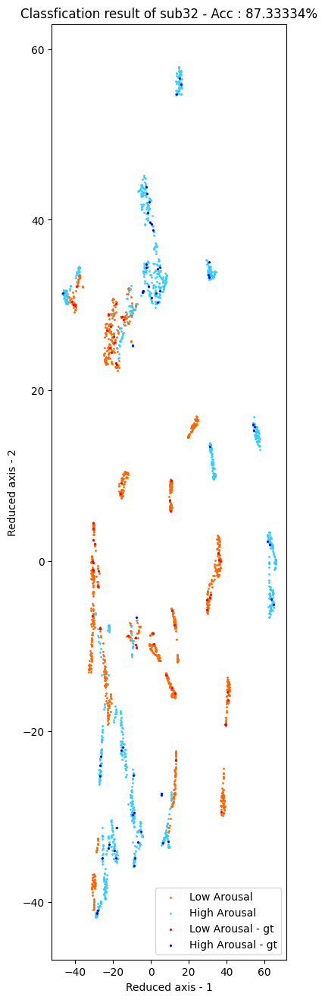

In [116]:
vlc_best_acc = []
ars_best_acc = []
visualization_type = 1
for i in range(32):
    print("\n\n******************* SUBJECT : {} *********************".format(i+1))

    date = '230331_mah_oSNF'
    sub_idx = 'sub'+str(i+1)

    subject_de, subject_psd, subject_label, _ = load_subject_data(args.tensor_save_path, isdeap=True)

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    valence_label, arousal_label = deap_label(sub_label)

    de, psd, vlc_identifier, ars_identifier = preprocessing(sub_de,sub_psd, (valence_label,arousal_label), args.n_labels_by_class, args.out_channels, args.seed, isdeap=True)

    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

    de_ssm, de_nssm = ssm_construction2(de, args.n_samples,args.de_k,'ma')
    psd_ssm, psd_nssm = ssm_construction2(psd, args.n_samples,args.psd_k, 'ma')
    save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
    save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
    save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
    save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    adj = normalize_adj(fsm)
    save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
    save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    feature = input_feature(de, psd)

    save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(adj).to(torch.float32).to(device)
    ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
    vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

    vlc_identifier = torch.from_numpy(vlc_identifier).bool()
    vlc_train_identifier = vlc_identifier.to(device)
    isunlabeled = ~vlc_identifier
    vlc_test_identifier = isunlabeled.to(device)

    ars_identifier = torch.from_numpy(ars_identifier).bool()
    ars_train_identifier = ars_identifier.to(device)
    isunlabeled = ~ars_identifier
    ars_test_identifier = isunlabeled.to(device)

    activation = get_activation('celu')
    gcn = GraphConvolution

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, vlc_label,
                                                                    vlc_train_identifier, vlc_test_identifier,
                                                                    args,device,date,sub_idx, isdeap=True)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    vlc_best_acc.append(round(best_acc.item(), 2))
    

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_valence'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'valence_test_acc_'+date, best_acc)

    cf_name = args.valence
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)


    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, ars_label,
                                                                        ars_train_identifier, ars_test_identifier,
                                                                        args,date,sub_idx, isdeap=True)
    
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    ars_best_acc.append(round(best_acc.item(), 2))

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_arousal'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'arousal_test_acc_'+date, best_acc)

    cf_name = args.arousal
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, ars_train_identifier, cf_name, fig_name)
print("\n**************** Valence *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
print("**************** Arousal *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))




******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 640 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 81.92,    Test Loss :0.48,    Total Acc : 85.75
Epoch 650 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 83.69,    Test Loss :0.41,    Total Acc : 87.89
Epoch 660 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 81.4,    Test Loss :0.43,    Total Acc : 85.7
Epoch 670 - Train Acc : 90.0    Train Loss : 0.26,    Test Acc : 84.12,    Test Loss :0.4,    Total Acc : 87.06
Epoch 680 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 85.42,    Test Loss :0.44,    Total Acc : 89.38
Epoch 690 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 83.98,    Test Loss :0.43,    Total Acc : 88.86
Epoch 700 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 83.15,    Test Loss :0.46,    Total Acc : 87.82
Epoch 710 - Train Acc : 94.58    Train Loss : 0.25,    Test Acc : 85.23,    Test Loss :0.43,    Total Acc : 89.91
Epoch 720 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 84.25,    Test Loss :0.41,   

Epoch 1360 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 88.48,    Test Loss :0.47,    Total Acc : 91.74
Epoch 1370 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 84.0,    Test Loss :0.53,    Total Acc : 88.46
Epoch 1380 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 87.1,    Test Loss :0.46,    Total Acc : 90.43
Epoch 1390 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 86.02,    Test Loss :0.52,    Total Acc : 89.05
Epoch 1400 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 83.46,    Test Loss :0.62,    Total Acc : 87.98
Epoch 1410 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 84.75,    Test Loss :0.56,    Total Acc : 89.46
Epoch 1420 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 87.38,    Test Loss :0.52,    Total Acc : 91.19
Epoch 1430 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 86.85,    Test Loss :0.54,    Total Acc : 90.72
Epoch 1440 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 85.83,    Test Loss :

Epoch 2090 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 86.27,    Test Loss :0.62,    Total Acc : 91.05
Epoch 2100 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 88.42,    Test Loss :0.59,    Total Acc : 92.13
Epoch 2110 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 88.17,    Test Loss :0.6,    Total Acc : 92.62
Epoch 2120 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 89.06,    Test Loss :0.61,    Total Acc : 93.07
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 88.92,    Test Loss :0.55,    Total Acc : 93.21
Epoch 2140 - Train Acc : 94.58    Train Loss : 0.17,    Test Acc : 88.17,    Test Loss :0.61,    Total Acc : 91.38
Epoch 2150 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 88.44,    Test Loss :0.57,    Total Acc : 92.97
Epoch 2160 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 88.17,    Test Loss :0.5,    Total Acc : 92.42
Epoch 2170 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 87.62,    Test Lo

Epoch 2820 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 89.83,    Test Loss :0.56,    Total Acc : 94.08
Epoch 2830 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.27,    Test Loss :0.63,    Total Acc : 92.18
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.58,    Test Loss :0.63,    Total Acc : 94.67
Epoch 2850 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.48,    Test Loss :0.58,    Total Acc : 93.49
Epoch 2860 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 86.79,    Test Loss :0.67,    Total Acc : 91.31
Epoch 2870 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 88.69,    Test Loss :0.67,    Total Acc : 91.84
Epoch 2880 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 86.15,    Test Loss :0.65,    Total Acc : 89.95
Epoch 2890 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.0,    Test Loss :0.54,    Total Acc : 94.88
Epoch 2900 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 89.27,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 61.67    Train Loss : 0.74,    Test Acc : 54.29,    Test Loss :0.66,    Total Acc : 57.98
Epoch 20 - Train Acc : 66.25    Train Loss : 0.71,    Test Acc : 62.31,    Test Loss :0.61,    Total Acc : 64.28
Epoch 30 - Train Acc : 70.0    Train Loss : 0.68,    Test Acc : 67.92,    Test Loss :0.59,    Total Acc : 68.96
Epoch 40 - Train Acc : 76.67    Train Loss : 0.62,    Test Acc : 71.48,    Test Loss :0.55,    Total Acc : 74.07
Epoch 50 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 71.29,    Test Loss :0.52,    Total Acc : 72.73
Epoch 60 - Train Acc : 75.83    Train Loss : 0.56,    Test Acc : 71.15,    Test Loss :0.58,    Total Acc : 73.49
Epoch 70 - Train Acc : 83.33    Train Loss : 0.52,    Test Acc : 74.73,    Test Loss :0.55,    Total Acc : 79.03
Epoch 80 - Train Acc : 83.33    Train Loss : 0.47,    Test Acc : 77.25,    Test Loss :0.48,    Total Acc : 80.29
Epoch 90 - Train Acc : 75.83    Train Loss : 0.57,    Test Acc : 68.33,    Test Loss :0.65,    To

Epoch 740 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 83.46,    Test Loss :0.43,    Total Acc : 87.35
Epoch 750 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 85.04,    Test Loss :0.35,    Total Acc : 89.6
Epoch 760 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 82.67,    Test Loss :0.41,    Total Acc : 88.21
Epoch 770 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 85.62,    Test Loss :0.38,    Total Acc : 90.52
Epoch 780 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 84.31,    Test Loss :0.36,    Total Acc : 88.2
Epoch 790 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 83.29,    Test Loss :0.44,    Total Acc : 89.15
Epoch 800 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 83.85,    Test Loss :0.45,    Total Acc : 89.43
Epoch 810 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 83.98,    Test Loss :0.43,    Total Acc : 89.49
Epoch 820 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 85.83,    Test Loss :0.33, 

Epoch 1470 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 87.65,    Test Loss :0.34,    Total Acc : 91.74
Epoch 1480 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 84.5,    Test Loss :0.54,    Total Acc : 89.12
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 87.25,    Test Loss :0.34,    Total Acc : 91.54
Epoch 1500 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 88.19,    Test Loss :0.33,    Total Acc : 93.26
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 87.94,    Test Loss :0.36,    Total Acc : 92.09
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 87.42,    Test Loss :0.35,    Total Acc : 92.67
Epoch 1530 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 88.19,    Test Loss :0.34,    Total Acc : 92.01
Epoch 1540 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.15,    Test Loss :0.38,    Total Acc : 91.2
Epoch 1550 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 87.27,    Test 

Epoch 2190 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 87.83,    Test Loss :0.42,    Total Acc : 92.25
Epoch 2200 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 85.0,    Test Loss :0.42,    Total Acc : 89.17
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 89.21,    Test Loss :0.38,    Total Acc : 92.1
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.5,    Test Loss :0.22,    Total Acc : 95.21
Epoch 2230 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.27,    Test Loss :0.35,    Total Acc : 93.8
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.6,    Test Loss :0.33,    Total Acc : 94.18
Epoch 2250 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 87.02,    Test Loss :0.42,    Total Acc : 92.47
Epoch 2260 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 85.81,    Test Loss :0.52,    Total Acc : 89.57
Epoch 2270 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 87.17,    Test Loss

Epoch 2910 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.96,    Test Loss :0.34,    Total Acc : 94.65
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.85,    Test Loss :0.36,    Total Acc : 95.22
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 87.98,    Test Loss :0.43,    Total Acc : 93.78
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.33,    Test Loss :0.33,    Total Acc : 95.04
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.56,    Test Loss :0.35,    Total Acc : 94.16
Epoch 2960 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 87.71,    Test Loss :0.57,    Total Acc : 91.98
Epoch 2970 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 88.58,    Test Loss :0.46,    Total Acc : 91.79
Epoch 2980 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 89.56,    Test Loss :0.31,    Total Acc : 93.74
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 88.81,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 2 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 630 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 83.94,    Test Loss :1.46,    Total Acc : 91.97
Epoch 640 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.27,    Test Loss :1.55,    Total Acc : 91.43
Epoch 650 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 83.67,    Test Loss :1.84,    Total Acc : 91.62
Epoch 660 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.44,    Test Loss :1.63,    Total Acc : 90.09
Epoch 670 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 80.25,    Test Loss :1.68,    Total Acc : 89.29
Epoch 680 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 78.9,    Test Loss :1.85,    Total Acc : 87.99
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.0,    Test Loss :1.53,    Total Acc : 91.79
Epoch 700 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 81.67,    Test Loss :1.59,    Total Acc : 87.29
Epoch 710 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 84.98,    Test Loss :1.49,

Epoch 1350 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.23,    Test Loss :1.82,    Total Acc : 91.91
Epoch 1360 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 79.25,    Test Loss :2.06,    Total Acc : 88.58
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.29,    Test Loss :1.47,    Total Acc : 92.65
Epoch 1380 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.25,    Test Loss :1.74,    Total Acc : 90.29
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.73,    Test Loss :1.76,    Total Acc : 91.66
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.83,    Test Loss :1.74,    Total Acc : 92.71
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 83.17,    Test Loss :1.84,    Total Acc : 91.17
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.19,    Test Loss :1.93,    Total Acc : 91.89
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 85.46,    Tes

Epoch 2070 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.02,    Test Loss :2.04,    Total Acc : 91.3
Epoch 2080 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.44,    Test Loss :2.05,    Total Acc : 92.51
Epoch 2090 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 83.77,    Test Loss :2.07,    Total Acc : 91.47
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.92,    Test Loss :2.17,    Total Acc : 92.25
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 83.38,    Test Loss :1.77,    Total Acc : 91.48
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.65,    Test Loss :1.8,    Total Acc : 92.82
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.1,    Test Loss :1.83,    Total Acc : 91.84
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.38,    Test Loss :1.75,    Total Acc : 92.69
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 84.25,    Test L

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.38,    Test Loss :2.06,    Total Acc : 92.69
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.02,    Test Loss :2.19,    Total Acc : 92.01
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.52,    Test Loss :2.17,    Total Acc : 92.26
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 84.1,    Test Loss :2.21,    Total Acc : 91.84
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.71,    Test Loss :2.05,    Total Acc : 91.65
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.21,    Test Loss :2.11,    Total Acc : 92.1
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.98,    Test Loss :2.18,    Total Acc : 91.78
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.29,    Test Loss :2.24,    Total Acc : 92.65
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 83.56,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 73.33    Train Loss : 0.67,    Test Acc : 63.02,    Test Loss :0.63,    Total Acc : 68.18
Epoch 20 - Train Acc : 73.75    Train Loss : 0.62,    Test Acc : 62.73,    Test Loss :0.68,    Total Acc : 68.24
Epoch 30 - Train Acc : 77.5    Train Loss : 0.56,    Test Acc : 65.58,    Test Loss :0.62,    Total Acc : 71.54
Epoch 40 - Train Acc : 80.0    Train Loss : 0.5,    Test Acc : 66.42,    Test Loss :0.62,    Total Acc : 73.21
Epoch 50 - Train Acc : 84.17    Train Loss : 0.46,    Test Acc : 68.23,    Test Loss :0.66,    Total Acc : 76.2
Epoch 60 - Train Acc : 83.75    Train Loss : 0.44,    Test Acc : 68.6,    Test Loss :0.71,    Total Acc : 76.18
Epoch 70 - Train Acc : 84.58    Train Loss : 0.45,    Test Acc : 70.9,    Test Loss :0.66,    Total Acc : 77.74
Epoch 80 - Train Acc : 85.83    Train Loss : 0.43,    Test Acc : 66.67,    Test Loss :0.99,    Total Acc : 76.25
Epoch 90 - Train Acc : 85.42    Train Loss : 0.35,    Test Acc : 71.38,    Test Loss :0.82,    Total A

Epoch 750 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.58,    Test Loss :1.39,    Total Acc : 90.38
Epoch 760 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 79.35,    Test Loss :1.38,    Total Acc : 87.59
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.54,    Test Loss :1.45,    Total Acc : 90.85
Epoch 780 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 83.81,    Test Loss :1.06,    Total Acc : 89.82
Epoch 790 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 85.1,    Test Loss :0.98,    Total Acc : 91.72
Epoch 800 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.12,    Test Loss :0.92,    Total Acc : 92.56
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.1,    Test Loss :1.51,    Total Acc : 90.14
Epoch 820 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 84.29,    Test Loss :1.29,    Total Acc : 91.1
Epoch 830 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 84.85,    Test Loss :1.09, 

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.23,    Test Loss :1.14,    Total Acc : 93.11
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.46,    Test Loss :1.28,    Total Acc : 92.73
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.85,    Test Loss :1.17,    Total Acc : 93.43
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.71,    Test Loss :1.29,    Total Acc : 92.85
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.27,    Test Loss :1.26,    Total Acc : 93.43
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 86.35,    Test Loss :1.12,    Total Acc : 92.55
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.06,    Test Loss :1.15,    Total Acc : 92.82
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 81.83,    Test Loss :1.69,    Total Acc : 89.67
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.6,    Test 

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.98,    Test Loss :1.34,    Total Acc : 92.78
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.67,    Test Loss :1.4,    Total Acc : 92.83
Epoch 2210 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.08,    Test Loss :1.41,    Total Acc : 92.83
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.4,    Test Loss :1.2,    Total Acc : 93.49
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.81,    Test Loss :1.2,    Total Acc : 93.41
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.38,    Test Loss :1.44,    Total Acc : 92.69
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.81,    Test Loss :1.23,    Total Acc : 92.78
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.42,    Test Loss :1.39,    Total Acc : 93.21
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 84.6,    Test Loss

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.71,    Test Loss :1.08,    Total Acc : 93.65
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 85.27,    Test Loss :1.53,    Total Acc : 92.43
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.35,    Test Loss :1.18,    Total Acc : 93.68
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.04,    Test Loss :1.39,    Total Acc : 93.52
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.83,    Test Loss :1.37,    Total Acc : 93.92
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.79,    Test Loss :1.31,    Total Acc : 93.69
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.33,    Test Loss :1.32,    Total Acc : 93.46
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.52,    Test Loss :1.17,    Total Acc : 94.26
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.71,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 3 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (756,),    high valence : (1764,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0

/tmp/ipykernel_7653/723135367.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


Epoch 10 - Train Acc : 66.25    Train Loss : 0.7,    Test Acc : 51.27,    Test Loss :0.7,    Total Acc : 58.76
Epoch 20 - Train Acc : 58.33    Train Loss : 0.67,    Test Acc : 47.23,    Test Loss :0.72,    Total Acc : 52.78
Epoch 30 - Train Acc : 60.42    Train Loss : 0.65,    Test Acc : 48.23,    Test Loss :0.73,    Total Acc : 54.32
Epoch 40 - Train Acc : 70.42    Train Loss : 0.62,    Test Acc : 63.77,    Test Loss :0.75,    Total Acc : 67.09
Epoch 50 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 53.71,    Test Loss :0.96,    Total Acc : 63.1
Epoch 60 - Train Acc : 75.83    Train Loss : 0.59,    Test Acc : 57.44,    Test Loss :1.05,    Total Acc : 66.64
Epoch 70 - Train Acc : 68.33    Train Loss : 0.65,    Test Acc : 64.31,    Test Loss :0.76,    Total Acc : 66.32
Epoch 80 - Train Acc : 82.5    Train Loss : 0.55,    Test Acc : 63.27,    Test Loss :0.8,    Total Acc : 72.89
Epoch 90 - Train Acc : 81.67    Train Loss : 0.53,    Test Acc : 65.62,    Test Loss :0.77,    Total A

Epoch 740 - Train Acc : 87.5    Train Loss : 0.3,    Test Acc : 76.1,    Test Loss :1.62,    Total Acc : 81.8
Epoch 750 - Train Acc : 88.75    Train Loss : 0.4,    Test Acc : 73.73,    Test Loss :2.27,    Total Acc : 81.24
Epoch 760 - Train Acc : 85.83    Train Loss : 0.35,    Test Acc : 72.96,    Test Loss :1.48,    Total Acc : 79.4
Epoch 770 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 78.02,    Test Loss :1.7,    Total Acc : 84.22
Epoch 780 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 71.12,    Test Loss :0.88,    Total Acc : 78.06
Epoch 790 - Train Acc : 87.08    Train Loss : 0.33,    Test Acc : 77.67,    Test Loss :1.89,    Total Acc : 82.38
Epoch 800 - Train Acc : 88.75    Train Loss : 0.29,    Test Acc : 73.08,    Test Loss :1.25,    Total Acc : 80.92
Epoch 810 - Train Acc : 88.75    Train Loss : 0.3,    Test Acc : 77.77,    Test Loss :1.49,    Total Acc : 83.26
Epoch 820 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 78.98,    Test Loss :0.9,    To

Epoch 1460 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 80.9,    Test Loss :2.39,    Total Acc : 88.36
Epoch 1470 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 80.96,    Test Loss :2.9,    Total Acc : 87.56
Epoch 1480 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 78.12,    Test Loss :3.02,    Total Acc : 86.56
Epoch 1490 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 84.06,    Test Loss :2.24,    Total Acc : 90.99
Epoch 1500 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 75.65,    Test Loss :2.77,    Total Acc : 84.49
Epoch 1510 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 80.69,    Test Loss :2.14,    Total Acc : 88.05
Epoch 1520 - Train Acc : 90.83    Train Loss : 0.35,    Test Acc : 80.81,    Test Loss :2.61,    Total Acc : 85.82
Epoch 1530 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 85.52,    Test Loss :1.68,    Total Acc : 89.64
Epoch 1540 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 78.12,    Test Los

Epoch 2190 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 85.48,    Test Loss :2.74,    Total Acc : 91.91
Epoch 2200 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.17,    Test Loss :2.8,    Total Acc : 92.33
Epoch 2210 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 86.58,    Test Loss :3.24,    Total Acc : 92.25
Epoch 2220 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 80.67,    Test Loss :3.42,    Total Acc : 88.46
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 82.5,    Test Loss :3.3,    Total Acc : 90.21
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 82.69,    Test Loss :3.15,    Total Acc : 90.72
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 86.02,    Test Loss :3.28,    Total Acc : 92.39
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 87.15,    Test Loss :3.05,    Total Acc : 92.95
Epoch 2270 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.48,    Test Lo

Epoch 2920 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 85.98,    Test Loss :3.9,    Total Acc : 92.16
Epoch 2930 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.48,    Test Loss :3.4,    Total Acc : 92.7
Epoch 2940 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.65,    Test Loss :3.88,    Total Acc : 91.45
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 87.48,    Test Loss :3.59,    Total Acc : 93.74
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 82.54,    Test Loss :4.24,    Total Acc : 90.44
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.92,    Test Loss :3.28,    Total Acc : 93.75
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 85.4,    Test Loss :3.4,    Total Acc : 90.82
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 86.4,    Test Loss :3.39,    Total Acc : 91.95
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.29,    Test Loss :3

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 59.17    Train Loss : 0.71,    Test Acc : 48.98,    Test Loss :0.67,    Total Acc : 54.07
Epoch 20 - Train Acc : 61.67    Train Loss : 0.7,    Test Acc : 60.81,    Test Loss :0.61,    Total Acc : 61.24
Epoch 30 - Train Acc : 57.08    Train Loss : 0.69,    Test Acc : 50.73,    Test Loss :0.64,    Total Acc : 53.91
Epoch 40 - Train Acc : 61.67    Train Loss : 0.68,    Test Acc : 53.12,    Test Loss :0.61,    Total Acc : 57.4
Epoch 50 - Train Acc : 66.25    Train Loss : 0.65,    Test Acc : 57.6,    Test Loss :0.61,    Total Acc : 61.93
Epoch 60 - Train Acc : 67.92    Train Loss : 0.66,    Test Acc : 58.85,    Test Loss :0.67,    Total Acc : 63.39
Epoch 70 - Train Acc : 65.83    Train Loss : 0.63,    Test Acc : 57.79,    Test Loss :0.6,    Total Acc : 61.81
Epoch 80 - Train Acc : 67.5    Train Loss : 0.61,    Test Acc : 59.71,    Test Loss :0.59,    Total Acc : 63.6
Epoch 90 - Train Acc : 68.33    Train Loss : 0.66,    Test Acc : 63.33,    Test Loss :0.61,    Total A

Epoch 750 - Train Acc : 88.75    Train Loss : 0.37,    Test Acc : 79.48,    Test Loss :0.45,    Total Acc : 84.11
Epoch 760 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 79.62,    Test Loss :0.44,    Total Acc : 84.19
Epoch 770 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 78.71,    Test Loss :0.49,    Total Acc : 84.15
Epoch 780 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 78.71,    Test Loss :0.43,    Total Acc : 84.77
Epoch 790 - Train Acc : 87.08    Train Loss : 0.31,    Test Acc : 77.44,    Test Loss :0.43,    Total Acc : 82.26
Epoch 800 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 78.67,    Test Loss :0.46,    Total Acc : 84.54
Epoch 810 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 81.0,    Test Loss :0.42,    Total Acc : 86.33
Epoch 820 - Train Acc : 87.08    Train Loss : 0.39,    Test Acc : 78.5,    Test Loss :0.5,    Total Acc : 82.79
Epoch 830 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 85.08,    Test Loss :0.36,

Epoch 1480 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 85.27,    Test Loss :0.39,    Total Acc : 90.34
Epoch 1490 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 84.1,    Test Loss :0.41,    Total Acc : 88.09
Epoch 1500 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 85.02,    Test Loss :0.34,    Total Acc : 89.59
Epoch 1510 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 87.56,    Test Loss :0.32,    Total Acc : 91.28
Epoch 1520 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 83.21,    Test Loss :0.6,    Total Acc : 86.19
Epoch 1530 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 83.54,    Test Loss :0.4,    Total Acc : 86.56
Epoch 1540 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 83.0,    Test Loss :0.42,    Total Acc : 87.75
Epoch 1550 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 86.15,    Test Loss :0.33,    Total Acc : 88.91
Epoch 1560 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 85.65,    Test Loss 

Epoch 2200 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 85.33,    Test Loss :0.36,    Total Acc : 89.54
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 84.85,    Test Loss :0.37,    Total Acc : 89.93
Epoch 2220 - Train Acc : 93.75    Train Loss : 0.18,    Test Acc : 89.4,    Test Loss :0.24,    Total Acc : 91.57
Epoch 2230 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 88.17,    Test Loss :0.36,    Total Acc : 91.79
Epoch 2240 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 84.71,    Test Loss :0.33,    Total Acc : 90.69
Epoch 2250 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 86.98,    Test Loss :0.33,    Total Acc : 92.03
Epoch 2260 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 83.48,    Test Loss :0.54,    Total Acc : 89.03
Epoch 2270 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 88.65,    Test Loss :0.3,    Total Acc : 92.66
Epoch 2280 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 83.98,    Test L

Epoch 2920 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 84.79,    Test Loss :0.56,    Total Acc : 91.56
Epoch 2930 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.17,    Test Loss :0.44,    Total Acc : 91.63
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 91.0,    Test Loss :0.33,    Total Acc : 94.46
Epoch 2950 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 86.67,    Test Loss :0.41,    Total Acc : 90.83
Epoch 2960 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 85.06,    Test Loss :0.52,    Total Acc : 90.86
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 89.96,    Test Loss :0.33,    Total Acc : 94.56
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 86.73,    Test Loss :0.5,    Total Acc : 91.49
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 88.6,    Test Loss :0.4,    Total Acc : 92.64
Epoch 3000 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 86.67,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 4 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 630 - Train Acc : 87.92    Train Loss : 0.4,    Test Acc : 77.94,    Test Loss :0.64,    Total Acc : 82.93
Epoch 640 - Train Acc : 83.33    Train Loss : 0.44,    Test Acc : 74.31,    Test Loss :0.71,    Total Acc : 78.82
Epoch 650 - Train Acc : 89.17    Train Loss : 0.38,    Test Acc : 78.9,    Test Loss :0.62,    Total Acc : 84.03
Epoch 660 - Train Acc : 85.83    Train Loss : 0.41,    Test Acc : 74.88,    Test Loss :0.75,    Total Acc : 80.35
Epoch 670 - Train Acc : 80.42    Train Loss : 0.51,    Test Acc : 76.35,    Test Loss :0.61,    Total Acc : 78.39
Epoch 680 - Train Acc : 82.08    Train Loss : 0.43,    Test Acc : 73.52,    Test Loss :0.68,    Total Acc : 77.8
Epoch 690 - Train Acc : 85.83    Train Loss : 0.38,    Test Acc : 76.0,    Test Loss :0.69,    Total Acc : 80.92
Epoch 700 - Train Acc : 84.17    Train Loss : 0.39,    Test Acc : 75.0,    Test Loss :0.73,    Total Acc : 79.58
Epoch 710 - Train Acc : 83.75    Train Loss : 0.41,    Test Acc : 77.06,    Test Loss :0.61, 

Epoch 1350 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 76.25,    Test Loss :0.82,    Total Acc : 83.96
Epoch 1360 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 75.42,    Test Loss :0.81,    Total Acc : 83.13
Epoch 1370 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 75.02,    Test Loss :0.75,    Total Acc : 83.34
Epoch 1380 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 80.42,    Test Loss :0.75,    Total Acc : 86.25
Epoch 1390 - Train Acc : 89.17    Train Loss : 0.27,    Test Acc : 76.98,    Test Loss :0.82,    Total Acc : 83.07
Epoch 1400 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 77.27,    Test Loss :0.74,    Total Acc : 83.64
Epoch 1410 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 76.15,    Test Loss :0.73,    Total Acc : 83.49
Epoch 1420 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 81.08,    Test Loss :0.77,    Total Acc : 88.25
Epoch 1430 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 78.5,    Test L

Epoch 2070 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 79.12,    Test Loss :1.0,    Total Acc : 87.06
Epoch 2080 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 73.4,    Test Loss :1.23,    Total Acc : 82.11
Epoch 2090 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 77.54,    Test Loss :1.0,    Total Acc : 86.27
Epoch 2100 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 80.98,    Test Loss :0.85,    Total Acc : 88.2
Epoch 2110 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 77.02,    Test Loss :1.07,    Total Acc : 84.76
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.2,    Test Acc : 78.58,    Test Loss :0.96,    Total Acc : 88.04
Epoch 2130 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 75.67,    Test Loss :0.98,    Total Acc : 84.29
Epoch 2140 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 76.6,    Test Loss :1.26,    Total Acc : 84.97
Epoch 2150 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 76.58,    Test Loss :0.9

Epoch 2790 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 75.79,    Test Loss :1.18,    Total Acc : 84.77
Epoch 2800 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 76.56,    Test Loss :1.16,    Total Acc : 84.95
Epoch 2810 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 80.44,    Test Loss :1.35,    Total Acc : 87.51
Epoch 2820 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 79.5,    Test Loss :1.13,    Total Acc : 88.08
Epoch 2830 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 77.08,    Test Loss :1.18,    Total Acc : 85.21
Epoch 2840 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 77.46,    Test Loss :1.16,    Total Acc : 86.23
Epoch 2850 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 79.62,    Test Loss :1.21,    Total Acc : 88.15
Epoch 2860 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 79.27,    Test Loss :1.11,    Total Acc : 88.18
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.15,    Test Acc : 80.04,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.92    Train Loss : 0.64,    Test Acc : 64.02,    Test Loss :0.62,    Total Acc : 68.47
Epoch 20 - Train Acc : 79.17    Train Loss : 0.51,    Test Acc : 69.12,    Test Loss :0.54,    Total Acc : 74.15
Epoch 30 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 71.29,    Test Loss :0.6,    Total Acc : 76.06
Epoch 40 - Train Acc : 79.17    Train Loss : 0.46,    Test Acc : 71.81,    Test Loss :0.67,    Total Acc : 75.49
Epoch 50 - Train Acc : 79.58    Train Loss : 0.43,    Test Acc : 70.92,    Test Loss :0.6,    Total Acc : 75.25
Epoch 60 - Train Acc : 80.42    Train Loss : 0.42,    Test Acc : 72.71,    Test Loss :0.58,    Total Acc : 76.56
Epoch 70 - Train Acc : 80.0    Train Loss : 0.42,    Test Acc : 74.06,    Test Loss :0.61,    Total Acc : 77.03
Epoch 80 - Train Acc : 82.92    Train Loss : 0.39,    Test Acc : 72.44,    Test Loss :0.61,    Total Acc : 77.68
Epoch 90 - Train Acc : 85.42    Train Loss : 0.38,    Test Acc : 75.94,    Test Loss :0.6,    Total

Epoch 760 - Train Acc : 89.17    Train Loss : 0.29,    Test Acc : 76.71,    Test Loss :0.71,    Total Acc : 82.94
Epoch 770 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 77.02,    Test Loss :0.75,    Total Acc : 82.89
Epoch 780 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 77.23,    Test Loss :0.77,    Total Acc : 82.57
Epoch 790 - Train Acc : 83.75    Train Loss : 0.37,    Test Acc : 74.77,    Test Loss :0.74,    Total Acc : 79.26
Epoch 800 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 79.52,    Test Loss :0.68,    Total Acc : 85.8
Epoch 810 - Train Acc : 87.08    Train Loss : 0.33,    Test Acc : 77.02,    Test Loss :0.76,    Total Acc : 82.05
Epoch 820 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 80.02,    Test Loss :0.7,    Total Acc : 85.84
Epoch 830 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 80.31,    Test Loss :0.73,    Total Acc : 86.41
Epoch 840 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 79.94,    Test Loss :0.72

Epoch 1480 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 83.31,    Test Loss :1.19,    Total Acc : 87.49
Epoch 1490 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 85.48,    Test Loss :1.13,    Total Acc : 90.03
Epoch 1500 - Train Acc : 92.5    Train Loss : 0.21,    Test Acc : 85.81,    Test Loss :1.35,    Total Acc : 89.16
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 86.29,    Test Loss :1.16,    Total Acc : 91.69
Epoch 1520 - Train Acc : 89.17    Train Loss : 0.26,    Test Acc : 81.62,    Test Loss :1.21,    Total Acc : 85.4
Epoch 1530 - Train Acc : 90.83    Train Loss : 0.21,    Test Acc : 82.67,    Test Loss :1.24,    Total Acc : 86.75
Epoch 1540 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 84.21,    Test Loss :1.1,    Total Acc : 88.15
Epoch 1550 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 83.42,    Test Loss :1.21,    Total Acc : 87.75
Epoch 1560 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 81.0,    Test Loss

Epoch 2200 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.62,    Test Loss :1.26,    Total Acc : 92.35
Epoch 2210 - Train Acc : 87.08    Train Loss : 0.33,    Test Acc : 82.38,    Test Loss :1.29,    Total Acc : 84.73
Epoch 2220 - Train Acc : 91.67    Train Loss : 0.21,    Test Acc : 85.29,    Test Loss :1.34,    Total Acc : 88.48
Epoch 2230 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 85.83,    Test Loss :1.25,    Total Acc : 90.0
Epoch 2240 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 87.69,    Test Loss :1.3,    Total Acc : 91.34
Epoch 2250 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 84.08,    Test Loss :1.42,    Total Acc : 88.5
Epoch 2260 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 88.42,    Test Loss :1.35,    Total Acc : 92.96
Epoch 2270 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 86.83,    Test Loss :1.37,    Total Acc : 90.92
Epoch 2280 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.21,    Test Loss

Epoch 2930 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 86.0,    Test Loss :1.25,    Total Acc : 91.75
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.27,    Test Loss :1.29,    Total Acc : 93.09
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 89.25,    Test Loss :1.2,    Total Acc : 93.79
Epoch 2960 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 87.38,    Test Loss :1.47,    Total Acc : 91.4
Epoch 2970 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 86.52,    Test Loss :1.39,    Total Acc : 91.18
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 88.54,    Test Loss :1.43,    Total Acc : 93.02
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.35,    Test Loss :1.3,    Total Acc : 94.05
Epoch 3000 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 85.19,    Test Loss :1.34,    Total Acc : 90.3
*** Best ACC : 89.6 ***
directory already exists
arousal_test_acc_230324 is saved succe

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 5 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1575,),    high valence : (945,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 640 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 87.65,    Test Loss :0.26,    Total Acc : 90.07
Epoch 650 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 81.48,    Test Loss :0.41,    Total Acc : 84.91
Epoch 660 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 91.23,    Test Loss :0.21,    Total Acc : 92.07
Epoch 670 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 91.02,    Test Loss :0.21,    Total Acc : 93.43
Epoch 680 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 87.85,    Test Loss :0.23,    Total Acc : 91.43
Epoch 690 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 86.52,    Test Loss :0.31,    Total Acc : 89.09
Epoch 700 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 92.79,    Test Loss :0.19,    Total Acc : 95.15
Epoch 710 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 86.79,    Test Loss :0.24,    Total Acc : 90.9
Epoch 720 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 88.12,    Test Loss :0.25,  

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.54,    Test Loss :0.21,    Total Acc : 96.56
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 92.73,    Test Loss :0.17,    Total Acc : 95.11
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.5,    Test Loss :0.16,    Total Acc : 96.54
Epoch 1400 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 93.1,    Test Loss :0.18,    Total Acc : 94.89
Epoch 1410 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.83,    Test Loss :0.2,    Total Acc : 95.38
Epoch 1420 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 92.08,    Test Loss :0.25,    Total Acc : 94.79
Epoch 1430 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.21,    Test Loss :0.18,    Total Acc : 95.77
Epoch 1440 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.75,    Test Loss :0.19,    Total Acc : 96.04
Epoch 1450 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 92.9,    Test Loss :0

Epoch 2100 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.58,    Test Loss :0.24,    Total Acc : 95.88
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.85,    Test Loss :0.27,    Total Acc : 96.09
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.98,    Test Loss :0.2,    Total Acc : 96.99
Epoch 2130 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.5,    Test Loss :0.2,    Total Acc : 95.21
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.35,    Test Loss :0.2,    Total Acc : 97.18
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.42,    Test Loss :0.22,    Total Acc : 96.79
Epoch 2160 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 92.06,    Test Loss :0.29,    Total Acc : 94.78
Epoch 2170 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 91.08,    Test Loss :0.37,    Total Acc : 93.25
Epoch 2180 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 94.21,    Test Los

Epoch 2820 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.71,    Test Loss :0.18,    Total Acc : 96.23
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.04,    Test Loss :0.24,    Total Acc : 96.6
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.48,    Test Loss :0.19,    Total Acc : 97.03
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.77,    Test Loss :0.3,    Total Acc : 95.76
Epoch 2860 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 91.67,    Test Loss :0.35,    Total Acc : 94.17
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.71,    Test Loss :0.23,    Total Acc : 95.94
Epoch 2880 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 90.25,    Test Loss :0.35,    Total Acc : 92.83
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.88,    Test Loss :0.29,    Total Acc : 96.94
Epoch 2900 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.31,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.92    Train Loss : 0.64,    Test Acc : 65.6,    Test Loss :0.58,    Total Acc : 66.76
Epoch 20 - Train Acc : 66.67    Train Loss : 0.63,    Test Acc : 67.81,    Test Loss :0.57,    Total Acc : 67.24
Epoch 30 - Train Acc : 69.58    Train Loss : 0.62,    Test Acc : 69.62,    Test Loss :0.56,    Total Acc : 69.6
Epoch 40 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 69.77,    Test Loss :0.55,    Total Acc : 69.68
Epoch 50 - Train Acc : 75.42    Train Loss : 0.58,    Test Acc : 73.17,    Test Loss :0.54,    Total Acc : 74.29
Epoch 60 - Train Acc : 75.42    Train Loss : 0.55,    Test Acc : 71.9,    Test Loss :0.52,    Total Acc : 73.66
Epoch 70 - Train Acc : 71.67    Train Loss : 0.53,    Test Acc : 67.5,    Test Loss :0.5,    Total Acc : 69.58
Epoch 80 - Train Acc : 73.33    Train Loss : 0.53,    Test Acc : 70.98,    Test Loss :0.49,    Total Acc : 72.16
Epoch 90 - Train Acc : 78.33    Train Loss : 0.49,    Test Acc : 73.96,    Test Loss :0.47,    Total 

Epoch 760 - Train Acc : 83.75    Train Loss : 0.39,    Test Acc : 75.98,    Test Loss :0.46,    Total Acc : 79.86
Epoch 770 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 83.88,    Test Loss :0.37,    Total Acc : 88.19
Epoch 780 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 84.9,    Test Loss :0.34,    Total Acc : 87.66
Epoch 790 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 75.73,    Test Loss :0.51,    Total Acc : 78.91
Epoch 800 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 83.4,    Test Loss :0.34,    Total Acc : 88.57
Epoch 810 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 81.17,    Test Loss :0.41,    Total Acc : 83.92
Epoch 820 - Train Acc : 87.5    Train Loss : 0.34,    Test Acc : 80.96,    Test Loss :0.47,    Total Acc : 84.23
Epoch 830 - Train Acc : 89.58    Train Loss : 0.28,    Test Acc : 83.1,    Test Loss :0.36,    Total Acc : 86.34
Epoch 840 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 82.73,    Test Loss :0.37,  

Epoch 1480 - Train Acc : 83.75    Train Loss : 0.45,    Test Acc : 77.79,    Test Loss :0.59,    Total Acc : 80.77
Epoch 1490 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 84.06,    Test Loss :0.39,    Total Acc : 88.91
Epoch 1500 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 86.92,    Test Loss :0.33,    Total Acc : 90.54
Epoch 1510 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 84.9,    Test Loss :0.36,    Total Acc : 88.28
Epoch 1520 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 83.94,    Test Loss :0.41,    Total Acc : 88.64
Epoch 1530 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 81.92,    Test Loss :0.5,    Total Acc : 84.5
Epoch 1540 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 83.48,    Test Loss :0.37,    Total Acc : 88.2
Epoch 1550 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 85.69,    Test Loss :0.38,    Total Acc : 89.3
Epoch 1560 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 78.35,    Test Los

Epoch 2200 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 86.9,    Test Loss :0.35,    Total Acc : 89.91
Epoch 2210 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 83.75,    Test Loss :0.52,    Total Acc : 86.04
Epoch 2220 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 86.85,    Test Loss :0.36,    Total Acc : 90.72
Epoch 2230 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 87.77,    Test Loss :0.37,    Total Acc : 91.59
Epoch 2240 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 83.08,    Test Loss :0.38,    Total Acc : 87.17
Epoch 2250 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 83.85,    Test Loss :0.45,    Total Acc : 87.55
Epoch 2260 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 86.1,    Test Loss :0.39,    Total Acc : 89.72
Epoch 2270 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 86.31,    Test Loss :0.45,    Total Acc : 90.86
Epoch 2280 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 87.02,    Test Lo

Epoch 2920 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.83,    Test Loss :0.34,    Total Acc : 94.38
Epoch 2930 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 89.33,    Test Loss :0.37,    Total Acc : 93.62
Epoch 2940 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.46,    Test Loss :0.34,    Total Acc : 91.65
Epoch 2950 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.81,    Test Loss :0.41,    Total Acc : 91.82
Epoch 2960 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.58,    Test Loss :0.39,    Total Acc : 92.42
Epoch 2970 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 86.73,    Test Loss :0.41,    Total Acc : 91.7
Epoch 2980 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.42,    Test Loss :0.34,    Total Acc : 93.17
Epoch 2990 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.67,    Test Loss :0.41,    Total Acc : 91.75
Epoch 3000 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 88.29,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 6 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 640 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.83,    Test Loss :0.52,    Total Acc : 93.58
Epoch 650 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 90.42,    Test Loss :0.48,    Total Acc : 94.79
Epoch 660 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 86.98,    Test Loss :0.6,    Total Acc : 93.07
Epoch 670 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 81.6,    Test Loss :0.84,    Total Acc : 86.84
Epoch 680 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.0,    Test Loss :0.49,    Total Acc : 94.58
Epoch 690 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 84.48,    Test Loss :0.77,    Total Acc : 90.36
Epoch 700 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.15,    Test Loss :0.47,    Total Acc : 94.86
Epoch 710 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.71,    Test Loss :0.47,    Total Acc : 94.35
Epoch 720 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.1,    Test Loss :0.47,   

Epoch 1360 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.0,    Test Loss :0.41,    Total Acc : 95.29
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.33,    Test Loss :0.42,    Total Acc : 95.46
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.44,    Test Loss :0.48,    Total Acc : 95.01
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.04,    Test Loss :0.46,    Total Acc : 95.1
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.58,    Test Loss :0.46,    Total Acc : 95.08
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.19,    Test Loss :0.51,    Total Acc : 93.89
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.81,    Test Loss :0.46,    Total Acc : 94.99
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.44,    Test Loss :0.45,    Total Acc : 95.72
Epoch 1440 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 88.15,    Test L

Epoch 2080 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.23,    Test Loss :0.51,    Total Acc : 93.49
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.21,    Test Loss :0.34,    Total Acc : 94.77
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.9,    Test Loss :0.32,    Total Acc : 96.24
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.1,    Test Loss :0.54,    Total Acc : 93.72
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.12,    Test Loss :0.44,    Total Acc : 95.06
Epoch 2130 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 89.1,    Test Loss :0.5,    Total Acc : 93.09
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.21,    Test Loss :0.52,    Total Acc : 94.9
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.04,    Test Loss :0.32,    Total Acc : 95.81
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.02,    Test Los

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.02,    Test Loss :0.39,    Total Acc : 95.51
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.69,    Test Loss :0.35,    Total Acc : 95.84
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.9,    Test Loss :0.41,    Total Acc : 95.45
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.15,    Test Loss :0.4,    Total Acc : 95.16
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.44,    Test Loss :0.53,    Total Acc : 95.01
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.29,    Test Loss :0.44,    Total Acc : 94.02
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.23,    Test Loss :0.34,    Total Acc : 96.11
Epoch 2880 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 89.98,    Test Loss :0.53,    Total Acc : 94.16
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.56,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.83    Train Loss : 0.71,    Test Acc : 68.62,    Test Loss :0.6,    Total Acc : 67.23
Epoch 20 - Train Acc : 71.67    Train Loss : 0.63,    Test Acc : 72.79,    Test Loss :0.57,    Total Acc : 72.23
Epoch 30 - Train Acc : 72.92    Train Loss : 0.58,    Test Acc : 70.56,    Test Loss :0.56,    Total Acc : 71.74
Epoch 40 - Train Acc : 76.25    Train Loss : 0.54,    Test Acc : 72.98,    Test Loss :0.52,    Total Acc : 74.61
Epoch 50 - Train Acc : 76.25    Train Loss : 0.52,    Test Acc : 75.98,    Test Loss :0.5,    Total Acc : 76.11
Epoch 60 - Train Acc : 76.67    Train Loss : 0.5,    Test Acc : 74.92,    Test Loss :0.52,    Total Acc : 75.79
Epoch 70 - Train Acc : 75.42    Train Loss : 0.52,    Test Acc : 73.73,    Test Loss :0.58,    Total Acc : 74.57
Epoch 80 - Train Acc : 78.75    Train Loss : 0.46,    Test Acc : 75.73,    Test Loss :0.48,    Total Acc : 77.24
Epoch 90 - Train Acc : 79.17    Train Loss : 0.46,    Test Acc : 76.88,    Test Loss :0.51,    Tota

Epoch 760 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 82.5,    Test Loss :0.46,    Total Acc : 88.33
Epoch 770 - Train Acc : 91.67    Train Loss : 0.32,    Test Acc : 82.23,    Test Loss :0.54,    Total Acc : 86.95
Epoch 780 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 83.73,    Test Loss :0.48,    Total Acc : 90.41
Epoch 790 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 84.46,    Test Loss :0.45,    Total Acc : 90.56
Epoch 800 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 86.35,    Test Loss :0.36,    Total Acc : 92.34
Epoch 810 - Train Acc : 95.42    Train Loss : 0.25,    Test Acc : 83.92,    Test Loss :0.6,    Total Acc : 89.67
Epoch 820 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 86.94,    Test Loss :0.37,    Total Acc : 92.84
Epoch 830 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 84.1,    Test Loss :0.49,    Total Acc : 90.18
Epoch 840 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 81.42,    Test Loss :0.59,

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.83,    Test Loss :0.4,    Total Acc : 94.42
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.6,    Test Loss :0.42,    Total Acc : 93.39
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.29,    Test Loss :0.49,    Total Acc : 93.23
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 86.9,    Test Loss :0.57,    Total Acc : 93.24
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.92,    Test Loss :0.54,    Total Acc : 93.33
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 88.27,    Test Loss :0.39,    Total Acc : 93.93
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.81,    Test Loss :0.44,    Total Acc : 93.28
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 86.17,    Test Loss :0.45,    Total Acc : 92.67
Epoch 1560 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.56,    Test Los

Epoch 2210 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.12,    Test Loss :0.44,    Total Acc : 93.65
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.17,    Test Loss :0.36,    Total Acc : 94.46
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.67,    Test Loss :0.45,    Total Acc : 94.42
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.69,    Test Loss :0.44,    Total Acc : 94.43
Epoch 2250 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.25,    Test Loss :0.74,    Total Acc : 92.79
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 86.27,    Test Loss :0.83,    Total Acc : 92.3
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.92,    Test Loss :0.3,    Total Acc : 94.75
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.4,    Test Loss :0.57,    Total Acc : 93.49
Epoch 2290 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.21,    Test Loss

Epoch 2930 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.06,    Test Loss :0.39,    Total Acc : 93.91
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.04,    Test Loss :0.64,    Total Acc : 93.1
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.1,    Test Loss :0.38,    Total Acc : 95.05
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.46,    Test Loss :0.41,    Total Acc : 94.81
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.19,    Test Loss :0.66,    Total Acc : 92.97
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.08,    Test Loss :0.38,    Total Acc : 94.42
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.46,    Test Loss :0.47,    Total Acc : 93.81
Epoch 3000 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.94,    Test Loss :0.69,    Total Acc : 93.14
*** Best ACC : 91.75 ***
directory already exists
arousal_test_acc_230324 is saved suc

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 7 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1701,),    high arousal : (819,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0

Epoch 640 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 85.23,    Test Loss :0.27,    Total Acc : 88.45
Epoch 650 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 82.75,    Test Loss :0.53,    Total Acc : 86.17
Epoch 660 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 84.08,    Test Loss :0.38,    Total Acc : 89.33
Epoch 670 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 85.77,    Test Loss :0.32,    Total Acc : 89.14
Epoch 680 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 86.35,    Test Loss :0.34,    Total Acc : 90.89
Epoch 690 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 86.19,    Test Loss :0.34,    Total Acc : 90.59
Epoch 700 - Train Acc : 87.08    Train Loss : 0.27,    Test Acc : 75.73,    Test Loss :0.46,    Total Acc : 81.41
Epoch 710 - Train Acc : 87.08    Train Loss : 0.3,    Test Acc : 82.31,    Test Loss :0.43,    Total Acc : 84.7
Epoch 720 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 82.85,    Test Loss :0.35,

Epoch 1370 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 84.33,    Test Loss :0.49,    Total Acc : 90.08
Epoch 1380 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 88.35,    Test Loss :0.37,    Total Acc : 93.14
Epoch 1390 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 81.9,    Test Loss :0.52,    Total Acc : 88.45
Epoch 1400 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 83.29,    Test Loss :0.44,    Total Acc : 89.15
Epoch 1410 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 84.0,    Test Loss :0.39,    Total Acc : 90.54
Epoch 1420 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 83.21,    Test Loss :0.43,    Total Acc : 88.27
Epoch 1430 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 83.85,    Test Loss :0.62,    Total Acc : 90.47
Epoch 1440 - Train Acc : 94.58    Train Loss : 0.16,    Test Acc : 86.17,    Test Loss :0.4,    Total Acc : 90.38
Epoch 1450 - Train Acc : 90.83    Train Loss : 0.19,    Test Acc : 85.17,    Test Los

Epoch 2100 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 87.9,    Test Loss :0.66,    Total Acc : 93.11
Epoch 2110 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.21,    Test Loss :0.47,    Total Acc : 92.23
Epoch 2120 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 87.54,    Test Loss :0.55,    Total Acc : 92.73
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 88.12,    Test Loss :0.44,    Total Acc : 93.65
Epoch 2140 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 85.4,    Test Loss :0.54,    Total Acc : 90.2
Epoch 2150 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 87.0,    Test Loss :0.53,    Total Acc : 91.83
Epoch 2160 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 85.17,    Test Loss :0.64,    Total Acc : 88.21
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 89.94,    Test Loss :0.49,    Total Acc : 94.55
Epoch 2180 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 85.6,    Test Loss 

Epoch 2830 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 87.15,    Test Loss :0.72,    Total Acc : 91.91
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.04,    Test Loss :0.45,    Total Acc : 94.19
Epoch 2850 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 84.94,    Test Loss :0.85,    Total Acc : 90.8
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.0,    Test Loss :0.46,    Total Acc : 94.08
Epoch 2870 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 88.15,    Test Loss :0.53,    Total Acc : 92.41
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 84.9,    Test Loss :0.55,    Total Acc : 90.78
Epoch 2890 - Train Acc : 90.42    Train Loss : 0.34,    Test Acc : 77.9,    Test Loss :0.85,    Total Acc : 84.16
Epoch 2900 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 90.12,    Test Loss :0.41,    Total Acc : 94.85
Epoch 2910 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.92,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 66.67    Train Loss : 0.72,    Test Acc : 61.62,    Test Loss :0.65,    Total Acc : 64.15
Epoch 20 - Train Acc : 74.58    Train Loss : 0.62,    Test Acc : 64.77,    Test Loss :0.6,    Total Acc : 69.68
Epoch 30 - Train Acc : 73.75    Train Loss : 0.55,    Test Acc : 67.46,    Test Loss :0.54,    Total Acc : 70.6
Epoch 40 - Train Acc : 75.0    Train Loss : 0.53,    Test Acc : 76.15,    Test Loss :0.44,    Total Acc : 75.57
Epoch 50 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 76.02,    Test Loss :0.46,    Total Acc : 78.84
Epoch 60 - Train Acc : 84.58    Train Loss : 0.5,    Test Acc : 82.27,    Test Loss :0.42,    Total Acc : 83.43
Epoch 70 - Train Acc : 78.75    Train Loss : 0.48,    Test Acc : 78.5,    Test Loss :0.41,    Total Acc : 78.62
Epoch 80 - Train Acc : 86.67    Train Loss : 0.41,    Test Acc : 76.58,    Test Loss :0.47,    Total Acc : 81.62
Epoch 90 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 75.02,    Test Loss :0.46,    Total 

Epoch 760 - Train Acc : 88.75    Train Loss : 0.34,    Test Acc : 82.83,    Test Loss :0.41,    Total Acc : 85.79
Epoch 770 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 86.85,    Test Loss :0.33,    Total Acc : 89.89
Epoch 780 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 82.21,    Test Loss :0.49,    Total Acc : 89.02
Epoch 790 - Train Acc : 87.08    Train Loss : 0.38,    Test Acc : 80.77,    Test Loss :0.67,    Total Acc : 83.93
Epoch 800 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 88.1,    Test Loss :0.36,    Total Acc : 92.39
Epoch 810 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 86.35,    Test Loss :0.44,    Total Acc : 90.26
Epoch 820 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 82.31,    Test Loss :0.52,    Total Acc : 88.66
Epoch 830 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 87.44,    Test Loss :0.4,    Total Acc : 90.59
Epoch 840 - Train Acc : 89.58    Train Loss : 0.38,    Test Acc : 84.38,    Test Loss :0.49,  

Epoch 1500 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 89.54,    Test Loss :0.62,    Total Acc : 93.1
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 88.23,    Test Loss :0.7,    Total Acc : 92.66
Epoch 1520 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 82.98,    Test Loss :0.92,    Total Acc : 89.2
Epoch 1530 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 86.56,    Test Loss :0.63,    Total Acc : 89.11
Epoch 1540 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 88.29,    Test Loss :0.59,    Total Acc : 91.44
Epoch 1550 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 83.65,    Test Loss :0.73,    Total Acc : 89.95
Epoch 1560 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 86.46,    Test Loss :0.83,    Total Acc : 91.15
Epoch 1570 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 88.83,    Test Loss :0.6,    Total Acc : 93.58
Epoch 1580 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 82.17,    Test Lo

Epoch 2220 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.69,    Test Loss :0.66,    Total Acc : 94.3
Epoch 2230 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 86.4,    Test Loss :0.92,    Total Acc : 92.36
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.15,    Test Loss :0.67,    Total Acc : 93.95
Epoch 2250 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 79.6,    Test Loss :1.23,    Total Acc : 86.26
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.5,    Test Loss :0.7,    Total Acc : 94.12
Epoch 2270 - Train Acc : 89.58    Train Loss : 0.33,    Test Acc : 78.71,    Test Loss :0.84,    Total Acc : 84.15
Epoch 2280 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 84.17,    Test Loss :1.03,    Total Acc : 91.25
Epoch 2290 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 82.19,    Test Loss :1.14,    Total Acc : 89.01
Epoch 2300 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 84.02,    Test Los

Epoch 2950 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 87.96,    Test Loss :0.91,    Total Acc : 93.15
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.31,    Test Loss :0.63,    Total Acc : 96.74
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.23,    Test Loss :0.6,    Total Acc : 96.91
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.33,    Test Loss :0.66,    Total Acc : 95.75
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.58,    Test Loss :0.85,    Total Acc : 94.67
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.35,    Test Loss :0.82,    Total Acc : 96.26
*** Best ACC : 95.25 ***
directory already exists
arousal_test_acc_230324 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 8 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 630 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 80.79,    Test Loss :1.54,    Total Acc : 89.98
Epoch 640 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 79.46,    Test Loss :1.49,    Total Acc : 88.48
Epoch 650 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 75.5,    Test Loss :1.7,    Total Acc : 85.46
Epoch 660 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 78.67,    Test Loss :1.38,    Total Acc : 87.25
Epoch 670 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 78.52,    Test Loss :1.53,    Total Acc : 86.34
Epoch 680 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 78.58,    Test Loss :1.52,    Total Acc : 87.83
Epoch 690 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 77.58,    Test Loss :1.66,    Total Acc : 85.25
Epoch 700 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 78.96,    Test Loss :1.47,    Total Acc : 87.6
Epoch 710 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 80.69,    Test Loss :1.56, 

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 81.69,    Test Loss :1.51,    Total Acc : 90.64
Epoch 1380 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 78.6,    Test Loss :1.59,    Total Acc : 88.47
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 80.52,    Test Loss :1.56,    Total Acc : 89.43
Epoch 1400 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 79.88,    Test Loss :1.75,    Total Acc : 89.1
Epoch 1410 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 81.29,    Test Loss :1.78,    Total Acc : 89.81
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.5,    Test Loss :1.82,    Total Acc : 89.83
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 80.62,    Test Loss :1.87,    Total Acc : 89.69
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.42,    Test Loss :1.71,    Total Acc : 90.08
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 81.02,    Test Los

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 80.35,    Test Loss :2.0,    Total Acc : 90.18
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 80.94,    Test Loss :2.17,    Total Acc : 90.26
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 80.54,    Test Loss :2.2,    Total Acc : 89.65
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.42,    Test Loss :2.08,    Total Acc : 90.29
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 80.31,    Test Loss :1.68,    Total Acc : 90.16
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 80.77,    Test Loss :2.01,    Total Acc : 89.97
Epoch 2150 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 80.19,    Test Loss :2.0,    Total Acc : 89.47
Epoch 2160 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 80.29,    Test Loss :1.96,    Total Acc : 88.69
Epoch 2170 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 79.67,    Test Loss

Epoch 2810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.15,    Test Loss :2.1,    Total Acc : 90.16
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 83.08,    Test Loss :1.83,    Total Acc : 91.33
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.85,    Test Loss :1.8,    Total Acc : 90.72
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.0,    Test Loss :1.83,    Total Acc : 90.79
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.44,    Test Loss :1.91,    Total Acc : 90.72
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 82.33,    Test Loss :1.89,    Total Acc : 90.96
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.42,    Test Loss :1.69,    Total Acc : 91.0
Epoch 2880 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 77.73,    Test Loss :2.2,    Total Acc : 86.99
Epoch 2890 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 80.12,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.25    Train Loss : 0.61,    Test Acc : 67.81,    Test Loss :0.53,    Total Acc : 72.03
Epoch 20 - Train Acc : 82.5    Train Loss : 0.47,    Test Acc : 70.33,    Test Loss :0.54,    Total Acc : 76.42
Epoch 30 - Train Acc : 90.83    Train Loss : 0.38,    Test Acc : 79.48,    Test Loss :0.43,    Total Acc : 85.16
Epoch 40 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 74.54,    Test Loss :0.53,    Total Acc : 80.81
Epoch 50 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 83.65,    Test Loss :0.37,    Total Acc : 87.24
Epoch 60 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 88.06,    Test Loss :0.28,    Total Acc : 91.11
Epoch 70 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 90.5,    Test Loss :0.23,    Total Acc : 93.58
Epoch 80 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.02,    Test Loss :0.28,    Total Acc : 94.89
Epoch 90 - Train Acc : 98.75    Train Loss : 0.15,    Test Acc : 83.42,    Test Loss :0.51,    Tot

Epoch 740 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.23,    Total Acc : 97.22
Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.5,    Test Loss :0.2,    Total Acc : 97.25
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.42,    Total Acc : 96.21
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.98,    Test Loss :0.21,    Total Acc : 97.78
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.42,    Total Acc : 95.8
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.4,    Total Acc : 96.26
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.36,    Total Acc : 96.48
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.42,    Total Acc : 95.9
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.0,    Test Loss :0.29,   

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.55,    Total Acc : 96.34
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :0.54,    Total Acc : 96.58
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.41,    Total Acc : 96.97
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.49,    Total Acc : 96.47
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :0.57,    Total Acc : 96.58
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.45,    Total Acc : 96.21
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.61,    Total Acc : 96.21
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 94.06,    Test Loss :0.37,    Total Acc : 96.41
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.81,    Tes

Epoch 2190 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.96,    Test Loss :0.47,    Total Acc : 96.77
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.5,    Total Acc : 96.21
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss :0.42,    Total Acc : 96.81
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.88,    Test Loss :0.34,    Total Acc : 96.73
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.27,    Test Loss :0.46,    Total Acc : 96.64
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.88,    Test Loss :0.38,    Total Acc : 96.94
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.55,    Total Acc : 96.16
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.54,    Test Loss :0.48,    Total Acc : 96.27
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.88,    Test

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.53,    Total Acc : 96.47
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.46,    Total Acc : 97.33
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.57,    Total Acc : 96.5
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.67,    Total Acc : 96.68
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.12,    Test Loss :0.71,    Total Acc : 96.56
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.61,    Total Acc : 96.05
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.71,    Test Loss :0.6,    Total Acc : 96.35
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.46,    Test Loss :0.49,    Total Acc : 96.73
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.02,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 9 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 640 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.44,    Test Loss :0.44,    Total Acc : 94.39
Epoch 650 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.31,    Test Loss :0.4,    Total Acc : 96.03
Epoch 660 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.83,    Test Loss :0.45,    Total Acc : 96.21
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.42,    Test Loss :0.39,    Total Acc : 96.5
Epoch 680 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.65,    Test Loss :0.38,    Total Acc : 96.11
Epoch 690 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 92.58,    Test Loss :0.29,    Total Acc : 95.46
Epoch 700 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.42,    Test Loss :0.49,    Total Acc : 95.5
Epoch 710 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.06,    Test Loss :0.5,    Total Acc : 94.2
Epoch 720 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.17,    Test Loss :0.57,    

Epoch 1360 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.58,    Test Loss :0.44,    Total Acc : 95.88
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.94,    Test Loss :0.58,    Total Acc : 95.76
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.1,    Test Loss :0.47,    Total Acc : 96.34
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.54,    Test Loss :0.51,    Total Acc : 96.06
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.42,    Test Loss :0.58,    Total Acc : 96.71
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.98,    Test Loss :0.63,    Total Acc : 96.49
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.77,    Test Loss :0.52,    Total Acc : 96.18
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :0.41,    Total Acc : 96.38
Epoch 1440 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.69,    Test 

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.29,    Test Loss :0.53,    Total Acc : 97.15
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.25,    Test Loss :0.6,    Total Acc : 97.12
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.19,    Test Loss :0.63,    Total Acc : 96.89
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.77,    Test Loss :0.63,    Total Acc : 96.89
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.33,    Test Loss :0.55,    Total Acc : 97.17
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.81,    Test Loss :0.51,    Total Acc : 96.91
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.52,    Test Loss :0.66,    Total Acc : 96.76
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.19,    Test Loss :0.66,    Total Acc : 97.09
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.25,    Test

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.96,    Test Loss :0.67,    Total Acc : 96.98
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.04,    Test Loss :0.6,    Total Acc : 96.31
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.52,    Test Loss :0.51,    Total Acc : 96.76
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.88,    Test Loss :0.51,    Total Acc : 96.52
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.69,    Total Acc : 96.28
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.67,    Test Loss :0.67,    Total Acc : 96.83
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.61,    Total Acc : 96.46
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.1,    Test Loss :0.56,    Total Acc : 96.64
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.08    Train Loss : 0.63,    Test Acc : 69.06,    Test Loss :0.58,    Total Acc : 73.07
Epoch 20 - Train Acc : 75.0    Train Loss : 0.51,    Test Acc : 68.83,    Test Loss :0.55,    Total Acc : 71.92
Epoch 30 - Train Acc : 86.25    Train Loss : 0.43,    Test Acc : 74.65,    Test Loss :0.54,    Total Acc : 80.45
Epoch 40 - Train Acc : 90.42    Train Loss : 0.35,    Test Acc : 80.6,    Test Loss :0.49,    Total Acc : 85.51
Epoch 50 - Train Acc : 92.08    Train Loss : 0.32,    Test Acc : 81.83,    Test Loss :0.45,    Total Acc : 86.96
Epoch 60 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 82.25,    Test Loss :0.45,    Total Acc : 87.17
Epoch 70 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 83.6,    Test Loss :0.41,    Total Acc : 87.84
Epoch 80 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 81.27,    Test Loss :0.5,    Total Acc : 87.51
Epoch 90 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 82.0,    Test Loss :0.51,    Total A

Epoch 750 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.19,    Test Loss :0.62,    Total Acc : 93.68
Epoch 760 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 87.23,    Test Loss :0.75,    Total Acc : 92.99
Epoch 770 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.54,    Test Loss :0.76,    Total Acc : 93.77
Epoch 780 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 85.46,    Test Loss :0.79,    Total Acc : 89.81
Epoch 790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.98,    Test Loss :0.72,    Total Acc : 94.28
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.5,    Test Loss :0.7,    Total Acc : 92.83
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.17,    Test Loss :0.67,    Total Acc : 93.88
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.79,    Test Loss :0.69,    Total Acc : 92.98
Epoch 830 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 86.27,    Test Loss :0.82,

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.58,    Test Loss :1.0,    Total Acc : 93.29
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.52,    Test Loss :0.97,    Total Acc : 93.34
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.33,    Test Acc : 85.04,    Test Loss :1.2,    Total Acc : 90.44
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.6,    Test Loss :1.05,    Total Acc : 91.76
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.35,    Test Loss :0.81,    Total Acc : 93.34
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.71,    Test Loss :0.83,    Total Acc : 93.85
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.62,    Test Loss :0.86,    Total Acc : 93.6
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.21,    Test Loss :0.85,    Total Acc : 94.1
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.9,    Test Loss 

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.9,    Test Loss :1.07,    Total Acc : 93.45
Epoch 2200 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 84.06,    Test Loss :1.28,    Total Acc : 90.57
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.9,    Test Loss :0.99,    Total Acc : 94.03
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.21,    Test Loss :0.95,    Total Acc : 93.69
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.35,    Test Loss :1.1,    Total Acc : 93.26
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.4,    Test Loss :0.87,    Total Acc : 94.28
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.19,    Test Loss :0.93,    Total Acc : 93.89
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.46,    Test Loss :0.94,    Total Acc : 93.31
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.9,    Test Loss 

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.67,    Test Loss :0.9,    Total Acc : 94.12
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.13,    Test Loss :1.0,    Total Acc : 94.15
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.46,    Test Loss :1.1,    Total Acc : 93.73
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.35,    Test Loss :1.09,    Total Acc : 94.18
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.1,    Test Loss :1.03,    Total Acc : 94.05
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.02,    Test Loss :0.97,    Total Acc : 94.01
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.73,    Test Loss :1.18,    Total Acc : 93.66
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :1.01,    Total Acc : 94.42
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.67,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 10 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 85.6,    Test Loss :0.37,    Total Acc : 88.01
Epoch 640 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 81.08,    Test Loss :0.43,    Total Acc : 84.08
Epoch 650 - Train Acc : 88.75    Train Loss : 0.36,    Test Acc : 82.19,    Test Loss :0.41,    Total Acc : 85.47
Epoch 660 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 83.85,    Test Loss :0.37,    Total Acc : 86.72
Epoch 670 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 83.33,    Test Loss :0.38,    Total Acc : 86.46
Epoch 680 - Train Acc : 92.5    Train Loss : 0.29,    Test Acc : 82.71,    Test Loss :0.38,    Total Acc : 87.6
Epoch 690 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 83.69,    Test Loss :0.39,    Total Acc : 87.05
Epoch 700 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 84.6,    Test Loss :0.36,    Total Acc : 88.14
Epoch 710 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 80.31,    Test Loss :0.45, 

Epoch 1350 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 86.35,    Test Loss :0.36,    Total Acc : 90.47
Epoch 1360 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 85.1,    Test Loss :0.35,    Total Acc : 88.39
Epoch 1370 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 86.6,    Test Loss :0.36,    Total Acc : 90.8
Epoch 1380 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 81.21,    Test Loss :0.46,    Total Acc : 84.98
Epoch 1390 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 86.5,    Test Loss :0.34,    Total Acc : 89.71
Epoch 1400 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 89.67,    Test Loss :0.33,    Total Acc : 91.92
Epoch 1410 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 85.56,    Test Loss :0.41,    Total Acc : 89.66
Epoch 1420 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 88.19,    Test Loss :0.37,    Total Acc : 91.39
Epoch 1430 - Train Acc : 87.92    Train Loss : 0.34,    Test Acc : 84.94,    Test Los

Epoch 2070 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 89.1,    Test Loss :0.34,    Total Acc : 92.26
Epoch 2080 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 89.54,    Test Loss :0.32,    Total Acc : 93.1
Epoch 2090 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 88.21,    Test Loss :0.39,    Total Acc : 91.6
Epoch 2100 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 85.52,    Test Loss :0.39,    Total Acc : 89.43
Epoch 2110 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 86.12,    Test Loss :0.43,    Total Acc : 89.73
Epoch 2120 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 89.9,    Test Loss :0.36,    Total Acc : 93.49
Epoch 2130 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 84.54,    Test Loss :0.42,    Total Acc : 87.69
Epoch 2140 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 90.54,    Test Loss :0.33,    Total Acc : 93.4
Epoch 2150 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 89.06,    Test Loss

Epoch 2790 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 91.06,    Test Loss :0.33,    Total Acc : 93.24
Epoch 2800 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 91.65,    Test Loss :0.36,    Total Acc : 93.95
Epoch 2810 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 91.62,    Test Loss :0.35,    Total Acc : 94.56
Epoch 2820 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 90.56,    Test Loss :0.44,    Total Acc : 93.82
Epoch 2830 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 87.54,    Test Loss :0.41,    Total Acc : 91.48
Epoch 2840 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 92.15,    Test Loss :0.32,    Total Acc : 94.82
Epoch 2850 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 92.1,    Test Loss :0.34,    Total Acc : 95.01
Epoch 2860 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 88.81,    Test Loss :0.41,    Total Acc : 91.91
Epoch 2870 - Train Acc : 95.0    Train Loss : 0.25,    Test Acc : 88.52,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.0    Train Loss : 0.69,    Test Acc : 60.85,    Test Loss :0.63,    Total Acc : 62.93
Epoch 20 - Train Acc : 69.58    Train Loss : 0.62,    Test Acc : 65.83,    Test Loss :0.54,    Total Acc : 67.71
Epoch 30 - Train Acc : 70.0    Train Loss : 0.6,    Test Acc : 66.94,    Test Loss :0.52,    Total Acc : 68.47
Epoch 40 - Train Acc : 69.17    Train Loss : 0.57,    Test Acc : 73.0,    Test Loss :0.47,    Total Acc : 71.08
Epoch 50 - Train Acc : 73.33    Train Loss : 0.56,    Test Acc : 75.48,    Test Loss :0.46,    Total Acc : 74.41
Epoch 60 - Train Acc : 75.42    Train Loss : 0.61,    Test Acc : 73.48,    Test Loss :0.51,    Total Acc : 74.45
Epoch 70 - Train Acc : 73.33    Train Loss : 0.53,    Test Acc : 76.83,    Test Loss :0.41,    Total Acc : 75.08
Epoch 80 - Train Acc : 74.17    Train Loss : 0.55,    Test Acc : 75.6,    Test Loss :0.43,    Total Acc : 74.89
Epoch 90 - Train Acc : 77.5    Train Loss : 0.51,    Test Acc : 77.33,    Test Loss :0.39,    Total A

Epoch 740 - Train Acc : 86.25    Train Loss : 0.41,    Test Acc : 80.71,    Test Loss :0.34,    Total Acc : 83.48
Epoch 750 - Train Acc : 79.17    Train Loss : 0.6,    Test Acc : 80.21,    Test Loss :0.41,    Total Acc : 79.69
Epoch 760 - Train Acc : 82.08    Train Loss : 0.44,    Test Acc : 74.67,    Test Loss :0.43,    Total Acc : 78.38
Epoch 770 - Train Acc : 85.0    Train Loss : 0.4,    Test Acc : 77.6,    Test Loss :0.4,    Total Acc : 81.3
Epoch 780 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 75.0,    Test Loss :0.45,    Total Acc : 79.17
Epoch 790 - Train Acc : 82.5    Train Loss : 0.46,    Test Acc : 77.06,    Test Loss :0.42,    Total Acc : 79.78
Epoch 800 - Train Acc : 72.92    Train Loss : 0.56,    Test Acc : 68.04,    Test Loss :0.58,    Total Acc : 70.48
Epoch 810 - Train Acc : 81.67    Train Loss : 0.45,    Test Acc : 80.21,    Test Loss :0.34,    Total Acc : 80.94
Epoch 820 - Train Acc : 75.83    Train Loss : 0.48,    Test Acc : 83.31,    Test Loss :0.32,    

Epoch 1460 - Train Acc : 89.58    Train Loss : 0.36,    Test Acc : 81.02,    Test Loss :0.34,    Total Acc : 85.3
Epoch 1470 - Train Acc : 81.25    Train Loss : 0.44,    Test Acc : 79.1,    Test Loss :0.41,    Total Acc : 80.18
Epoch 1480 - Train Acc : 89.17    Train Loss : 0.36,    Test Acc : 80.46,    Test Loss :0.34,    Total Acc : 84.81
Epoch 1490 - Train Acc : 84.58    Train Loss : 0.42,    Test Acc : 76.92,    Test Loss :0.46,    Total Acc : 80.75
Epoch 1500 - Train Acc : 89.58    Train Loss : 0.34,    Test Acc : 82.58,    Test Loss :0.31,    Total Acc : 86.08
Epoch 1510 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 77.23,    Test Loss :0.43,    Total Acc : 80.91
Epoch 1520 - Train Acc : 87.92    Train Loss : 0.38,    Test Acc : 85.17,    Test Loss :0.3,    Total Acc : 86.54
Epoch 1530 - Train Acc : 85.42    Train Loss : 0.39,    Test Acc : 78.5,    Test Loss :0.44,    Total Acc : 81.96
Epoch 1540 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 76.42,    Test Lo

Epoch 2180 - Train Acc : 93.33    Train Loss : 0.31,    Test Acc : 85.4,    Test Loss :0.34,    Total Acc : 89.36
Epoch 2190 - Train Acc : 92.92    Train Loss : 0.3,    Test Acc : 87.08,    Test Loss :0.26,    Total Acc : 90.0
Epoch 2200 - Train Acc : 84.58    Train Loss : 0.41,    Test Acc : 84.33,    Test Loss :0.37,    Total Acc : 84.46
Epoch 2210 - Train Acc : 90.83    Train Loss : 0.33,    Test Acc : 81.1,    Test Loss :0.38,    Total Acc : 85.97
Epoch 2220 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 80.69,    Test Loss :0.37,    Total Acc : 83.68
Epoch 2230 - Train Acc : 91.25    Train Loss : 0.33,    Test Acc : 84.19,    Test Loss :0.3,    Total Acc : 87.72
Epoch 2240 - Train Acc : 92.08    Train Loss : 0.34,    Test Acc : 80.83,    Test Loss :0.4,    Total Acc : 86.46
Epoch 2250 - Train Acc : 93.75    Train Loss : 0.31,    Test Acc : 85.23,    Test Loss :0.27,    Total Acc : 89.49
Epoch 2260 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 81.92,    Test Loss

Epoch 2900 - Train Acc : 92.92    Train Loss : 0.29,    Test Acc : 84.83,    Test Loss :0.32,    Total Acc : 88.88
Epoch 2910 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 80.98,    Test Loss :0.38,    Total Acc : 85.7
Epoch 2920 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 86.35,    Test Loss :0.3,    Total Acc : 89.64
Epoch 2930 - Train Acc : 86.25    Train Loss : 0.39,    Test Acc : 81.08,    Test Loss :0.39,    Total Acc : 83.67
Epoch 2940 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 85.25,    Test Loss :0.28,    Total Acc : 87.42
Epoch 2950 - Train Acc : 96.25    Train Loss : 0.23,    Test Acc : 88.58,    Test Loss :0.23,    Total Acc : 92.42
Epoch 2960 - Train Acc : 95.83    Train Loss : 0.23,    Test Acc : 89.73,    Test Loss :0.22,    Total Acc : 92.78
Epoch 2970 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 87.79,    Test Loss :0.28,    Total Acc : 87.02
Epoch 2980 - Train Acc : 84.58    Train Loss : 0.34,    Test Acc : 88.27,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 11 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (756,),    high arousal : (1764,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 93.19,    Test Loss :0.74,    Total Acc : 95.55
Epoch 640 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 92.92,    Test Loss :0.78,    Total Acc : 95.42
Epoch 650 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.4,    Test Loss :0.75,    Total Acc : 95.16
Epoch 660 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.0,    Test Loss :0.79,    Total Acc : 97.5
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.23,    Test Loss :0.74,    Total Acc : 96.41
Epoch 680 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.38,    Test Loss :0.79,    Total Acc : 96.06
Epoch 690 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :0.88,    Total Acc : 96.24
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.83,    Test Loss :0.8,    Total Acc : 97.42
Epoch 710 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.77,    Test Loss :0.83,   

Epoch 1370 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 93.1,    Test Loss :0.86,    Total Acc : 95.51
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.27,    Test Loss :0.87,    Total Acc : 97.43
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.9,    Total Acc : 97.38
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.42,    Test Loss :0.88,    Total Acc : 97.5
Epoch 1410 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.98,    Test Loss :0.84,    Total Acc : 96.16
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.21,    Test Loss :0.92,    Total Acc : 97.6
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.46,    Test Loss :1.04,    Total Acc : 97.02
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.79,    Test Loss :0.82,    Total Acc : 96.77
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 94.21,    Test Loss

Epoch 2090 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.96,    Test Loss :0.93,    Total Acc : 97.27
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.23,    Test Loss :0.83,    Total Acc : 97.61
Epoch 2110 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 94.38,    Test Loss :0.81,    Total Acc : 96.15
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.02,    Test Loss :1.02,    Total Acc : 97.3
Epoch 2130 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.27,    Test Loss :0.85,    Total Acc : 96.51
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.29,    Test Loss :0.92,    Total Acc : 97.65
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.44,    Test Loss :0.91,    Total Acc : 97.72
Epoch 2160 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.06,    Test Loss :0.97,    Total Acc : 95.7
Epoch 2170 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.5,    Test Lo

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.33,    Test Loss :0.89,    Total Acc : 97.67
Epoch 2820 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.65,    Test Loss :1.12,    Total Acc : 96.7
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.17,    Test Loss :0.93,    Total Acc : 96.67
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.88,    Total Acc : 97.36
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.67,    Test Loss :1.08,    Total Acc : 96.92
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.83,    Test Loss :0.75,    Total Acc : 97.42
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.96,    Test Loss :0.84,    Total Acc : 97.48
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.71,    Test Loss :0.88,    Total Acc : 97.15
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.02,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 60.0    Train Loss : 0.7,    Test Acc : 49.52,    Test Loss :0.66,    Total Acc : 54.76
Epoch 20 - Train Acc : 65.0    Train Loss : 0.63,    Test Acc : 62.17,    Test Loss :0.61,    Total Acc : 63.58
Epoch 30 - Train Acc : 69.17    Train Loss : 0.58,    Test Acc : 66.4,    Test Loss :0.56,    Total Acc : 67.78
Epoch 40 - Train Acc : 76.67    Train Loss : 0.54,    Test Acc : 63.65,    Test Loss :0.57,    Total Acc : 70.16
Epoch 50 - Train Acc : 80.83    Train Loss : 0.5,    Test Acc : 72.65,    Test Loss :0.52,    Total Acc : 76.74
Epoch 60 - Train Acc : 78.33    Train Loss : 0.49,    Test Acc : 71.92,    Test Loss :0.49,    Total Acc : 75.12
Epoch 70 - Train Acc : 78.33    Train Loss : 0.67,    Test Acc : 65.65,    Test Loss :0.66,    Total Acc : 71.99
Epoch 80 - Train Acc : 84.17    Train Loss : 0.4,    Test Acc : 81.58,    Test Loss :0.38,    Total Acc : 82.88
Epoch 90 - Train Acc : 84.58    Train Loss : 0.41,    Test Acc : 80.29,    Test Loss :0.41,    Total A

Epoch 750 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 89.31,    Test Loss :0.41,    Total Acc : 91.53
Epoch 760 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 85.58,    Test Loss :0.56,    Total Acc : 85.92
Epoch 770 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 90.5,    Test Loss :0.42,    Total Acc : 92.12
Epoch 780 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 91.58,    Test Loss :0.38,    Total Acc : 94.12
Epoch 790 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 88.44,    Test Loss :0.46,    Total Acc : 91.72
Epoch 800 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 90.67,    Test Loss :0.42,    Total Acc : 93.88
Epoch 810 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 88.92,    Test Loss :0.5,    Total Acc : 91.33
Epoch 820 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 90.69,    Test Loss :0.4,    Total Acc : 93.47
Epoch 830 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 88.38,    Test Loss :0.49, 

Epoch 1470 - Train Acc : 94.58    Train Loss : 0.15,    Test Acc : 90.0,    Test Loss :0.49,    Total Acc : 92.29
Epoch 1480 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 90.85,    Test Loss :0.51,    Total Acc : 93.76
Epoch 1490 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 92.44,    Test Loss :0.43,    Total Acc : 94.55
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 90.58,    Test Loss :0.48,    Total Acc : 94.25
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 90.27,    Test Loss :0.47,    Total Acc : 93.26
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 90.9,    Test Loss :0.45,    Total Acc : 94.41
Epoch 1530 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.25,    Test Loss :0.52,    Total Acc : 93.58
Epoch 1540 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.08,    Test Loss :0.44,    Total Acc : 94.08
Epoch 1550 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.77,    Test 

Epoch 2190 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.81,    Test Loss :0.41,    Total Acc : 95.99
Epoch 2200 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 92.19,    Test Loss :0.52,    Total Acc : 95.26
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 85.17,    Test Loss :0.71,    Total Acc : 90.08
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.44,    Test Loss :0.43,    Total Acc : 95.59
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.6,    Test Loss :0.44,    Total Acc : 95.26
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.58,    Test Loss :0.52,    Total Acc : 95.58
Epoch 2250 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.29,    Test Loss :0.45,    Total Acc : 94.9
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.04,    Test Loss :0.41,    Total Acc : 95.4
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.02,    Test Loss :0.

Epoch 2910 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 92.25,    Test Loss :0.43,    Total Acc : 95.08
Epoch 2920 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.71,    Test Loss :0.48,    Total Acc : 95.23
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.79,    Test Loss :0.49,    Total Acc : 95.27
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.58,    Test Loss :0.54,    Total Acc : 95.88
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.44,    Test Loss :0.53,    Total Acc : 96.72
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.06,    Test Loss :0.41,    Total Acc : 96.61
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.23,    Test Loss :0.55,    Total Acc : 95.91
Epoch 2980 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.42,    Test Loss :0.48,    Total Acc : 95.17
Epoch 2990 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 91.73,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 12 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :

Epoch 640 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.48,    Test Loss :0.28,    Total Acc : 95.82
Epoch 650 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.23,    Test Loss :0.27,    Total Acc : 96.41
Epoch 660 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 90.9,    Test Loss :0.41,    Total Acc : 94.2
Epoch 670 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.6,    Test Loss :0.27,    Total Acc : 96.18
Epoch 680 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 92.12,    Test Loss :0.3,    Total Acc : 94.6
Epoch 690 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 91.31,    Test Loss :0.29,    Total Acc : 93.57
Epoch 700 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 93.21,    Test Loss :0.25,    Total Acc : 95.56
Epoch 710 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.0,    Test Loss :0.37,    Total Acc : 94.67
Epoch 720 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.29,    Test Loss :0.24,    T

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.9,    Test Loss :0.2,    Total Acc : 97.24
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.75,    Test Loss :0.43,    Total Acc : 95.96
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.25,    Test Loss :0.28,    Total Acc : 97.12
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.44,    Test Loss :0.26,    Total Acc : 96.8
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.92,    Test Loss :0.34,    Total Acc : 95.83
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.35,    Test Loss :0.33,    Total Acc : 96.47
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.56,    Test Loss :0.37,    Total Acc : 97.07
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.06,    Test Loss :0.33,    Total Acc : 97.32
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.23,    Test Loss

Epoch 2090 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.96,    Test Loss :0.35,    Total Acc : 96.35
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.4,    Test Loss :0.44,    Total Acc : 95.99
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.28,    Total Acc : 97.36
Epoch 2120 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 91.21,    Test Loss :0.47,    Total Acc : 93.73
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.31,    Test Loss :0.26,    Total Acc : 97.45
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.88,    Test Loss :0.25,    Total Acc : 96.73
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.33,    Test Loss :0.32,    Total Acc : 96.67
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.44,    Test Loss :0.3,    Total Acc : 97.22
Epoch 2170 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 95.88,    Test 

Epoch 2810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.04,    Test Loss :0.25,    Total Acc : 96.81
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.88,    Test Loss :0.35,    Total Acc : 96.73
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss :0.35,    Total Acc : 96.6
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.48,    Test Loss :0.28,    Total Acc : 96.53
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.19,    Test Loss :0.41,    Total Acc : 96.18
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.81,    Test Loss :0.41,    Total Acc : 95.99
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.44,    Test Loss :0.4,    Total Acc : 96.51
Epoch 2880 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 90.96,    Test Loss :0.51,    Total Acc : 94.65
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.54,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 63.33    Train Loss : 0.7,    Test Acc : 51.96,    Test Loss :0.67,    Total Acc : 57.65
Epoch 20 - Train Acc : 57.08    Train Loss : 0.68,    Test Acc : 49.85,    Test Loss :0.62,    Total Acc : 53.47
Epoch 30 - Train Acc : 67.92    Train Loss : 0.65,    Test Acc : 58.25,    Test Loss :0.61,    Total Acc : 63.08
Epoch 40 - Train Acc : 77.5    Train Loss : 0.59,    Test Acc : 71.58,    Test Loss :0.54,    Total Acc : 74.54
Epoch 50 - Train Acc : 75.42    Train Loss : 0.55,    Test Acc : 70.88,    Test Loss :0.52,    Total Acc : 73.15
Epoch 60 - Train Acc : 73.75    Train Loss : 0.54,    Test Acc : 70.83,    Test Loss :0.52,    Total Acc : 72.29
Epoch 70 - Train Acc : 76.67    Train Loss : 0.55,    Test Acc : 76.6,    Test Loss :0.52,    Total Acc : 76.64
Epoch 80 - Train Acc : 80.42    Train Loss : 0.5,    Test Acc : 78.21,    Test Loss :0.47,    Total Acc : 79.31
Epoch 90 - Train Acc : 83.33    Train Loss : 0.47,    Test Acc : 77.48,    Test Loss :0.47,    Total

Epoch 750 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 90.42,    Test Loss :0.25,    Total Acc : 93.33
Epoch 760 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 89.88,    Test Loss :0.27,    Total Acc : 92.85
Epoch 770 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 87.71,    Test Loss :0.28,    Total Acc : 91.77
Epoch 780 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 86.88,    Test Loss :0.34,    Total Acc : 89.06
Epoch 790 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.15,    Test Loss :0.26,    Total Acc : 93.74
Epoch 800 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 91.48,    Test Loss :0.21,    Total Acc : 94.91
Epoch 810 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 89.83,    Test Loss :0.25,    Total Acc : 93.67
Epoch 820 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 92.58,    Test Loss :0.19,    Total Acc : 95.88
Epoch 830 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.98,    Test Loss :0.

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.6,    Test Loss :0.24,    Total Acc : 95.18
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.88,    Test Loss :0.24,    Total Acc : 95.52
Epoch 1490 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 92.5,    Test Loss :0.27,    Total Acc : 95.0
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.29,    Test Loss :0.19,    Total Acc : 96.65
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.73,    Test Loss :0.22,    Total Acc : 95.95
Epoch 1520 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 88.17,    Test Loss :0.5,    Total Acc : 92.42
Epoch 1530 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 94.23,    Test Loss :0.2,    Total Acc : 96.28
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.33,    Test Loss :0.22,    Total Acc : 96.46
Epoch 1550 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.98,    Test Loss :0

Epoch 2190 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.52,    Test Loss :0.31,    Total Acc : 95.43
Epoch 2200 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 90.96,    Test Loss :0.31,    Total Acc : 94.23
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.79,    Test Loss :0.25,    Total Acc : 96.48
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.96,    Test Loss :0.28,    Total Acc : 96.77
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.46,    Test Loss :0.21,    Total Acc : 96.73
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.58,    Test Loss :0.31,    Total Acc : 95.88
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.4,    Test Loss :0.34,    Total Acc : 95.99
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.42,    Test Loss :0.28,    Total Acc : 95.58
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.0,    Test Loss

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.77,    Test Loss :0.23,    Total Acc : 96.89
Epoch 2920 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.73,    Test Loss :0.32,    Total Acc : 95.74
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.75,    Test Loss :0.32,    Total Acc : 96.38
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.25,    Test Loss :0.27,    Total Acc : 96.92
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.02,    Test Loss :0.27,    Total Acc : 96.8
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.17,    Test Loss :0.21,    Total Acc : 97.08
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.12,    Test Loss :0.28,    Total Acc : 96.65
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.46,    Test Loss :0.27,    Total Acc : 97.02
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 90.19,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 13 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (504,),    high arousal : (2016,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 640 - Train Acc : 79.17    Train Loss : 0.47,    Test Acc : 71.77,    Test Loss :0.46,    Total Acc : 75.47
Epoch 650 - Train Acc : 82.5    Train Loss : 0.44,    Test Acc : 77.44,    Test Loss :0.42,    Total Acc : 79.97
Epoch 660 - Train Acc : 78.33    Train Loss : 0.48,    Test Acc : 72.31,    Test Loss :0.47,    Total Acc : 75.32
Epoch 670 - Train Acc : 79.17    Train Loss : 0.47,    Test Acc : 75.08,    Test Loss :0.44,    Total Acc : 77.12
Epoch 680 - Train Acc : 77.08    Train Loss : 0.45,    Test Acc : 72.62,    Test Loss :0.44,    Total Acc : 74.85
Epoch 690 - Train Acc : 80.83    Train Loss : 0.45,    Test Acc : 78.27,    Test Loss :0.43,    Total Acc : 79.55
Epoch 700 - Train Acc : 79.17    Train Loss : 0.44,    Test Acc : 75.48,    Test Loss :0.41,    Total Acc : 77.32
Epoch 710 - Train Acc : 81.25    Train Loss : 0.45,    Test Acc : 77.33,    Test Loss :0.42,    Total Acc : 79.29
Epoch 720 - Train Acc : 81.67    Train Loss : 0.43,    Test Acc : 77.04,    Test Loss :0.

Epoch 1360 - Train Acc : 82.92    Train Loss : 0.43,    Test Acc : 78.35,    Test Loss :0.48,    Total Acc : 80.64
Epoch 1370 - Train Acc : 79.17    Train Loss : 0.45,    Test Acc : 77.0,    Test Loss :0.51,    Total Acc : 78.08
Epoch 1380 - Train Acc : 77.92    Train Loss : 0.45,    Test Acc : 73.44,    Test Loss :0.49,    Total Acc : 75.68
Epoch 1390 - Train Acc : 85.42    Train Loss : 0.33,    Test Acc : 82.73,    Test Loss :0.32,    Total Acc : 84.07
Epoch 1400 - Train Acc : 81.67    Train Loss : 0.4,    Test Acc : 78.96,    Test Loss :0.38,    Total Acc : 80.31
Epoch 1410 - Train Acc : 85.0    Train Loss : 0.35,    Test Acc : 80.69,    Test Loss :0.37,    Total Acc : 82.84
Epoch 1420 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 81.23,    Test Loss :0.38,    Total Acc : 83.53
Epoch 1430 - Train Acc : 85.83    Train Loss : 0.31,    Test Acc : 82.27,    Test Loss :0.32,    Total Acc : 84.05
Epoch 1440 - Train Acc : 88.75    Train Loss : 0.33,    Test Acc : 81.17,    Test L

Epoch 2100 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 86.58,    Test Loss :0.28,    Total Acc : 88.29
Epoch 2110 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 80.52,    Test Loss :0.37,    Total Acc : 85.47
Epoch 2120 - Train Acc : 87.92    Train Loss : 0.3,    Test Acc : 79.79,    Test Loss :0.38,    Total Acc : 83.85
Epoch 2130 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 83.65,    Test Loss :0.35,    Total Acc : 87.66
Epoch 2140 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 84.56,    Test Loss :0.37,    Total Acc : 85.41
Epoch 2150 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 87.67,    Test Loss :0.3,    Total Acc : 90.08
Epoch 2160 - Train Acc : 89.17    Train Loss : 0.28,    Test Acc : 81.9,    Test Loss :0.37,    Total Acc : 85.53
Epoch 2170 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 83.21,    Test Loss :0.34,    Total Acc : 85.77
Epoch 2180 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 79.83,    Test Los

Epoch 2830 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 86.92,    Test Loss :0.42,    Total Acc : 89.08
Epoch 2840 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 84.94,    Test Loss :0.36,    Total Acc : 88.51
Epoch 2850 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 84.02,    Test Loss :0.32,    Total Acc : 87.64
Epoch 2860 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 84.46,    Test Loss :0.33,    Total Acc : 87.65
Epoch 2870 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 85.0,    Test Loss :0.31,    Total Acc : 89.17
Epoch 2880 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 86.67,    Test Loss :0.27,    Total Acc : 90.42
Epoch 2890 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 84.48,    Test Loss :0.28,    Total Acc : 87.45
Epoch 2900 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 84.65,    Test Loss :0.32,    Total Acc : 87.74
Epoch 2910 - Train Acc : 87.92    Train Loss : 0.3,    Test Acc : 84.42,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 60.42    Train Loss : 0.7,    Test Acc : 47.38,    Test Loss :0.77,    Total Acc : 53.9
Epoch 20 - Train Acc : 63.33    Train Loss : 0.68,    Test Acc : 47.19,    Test Loss :0.65,    Total Acc : 55.26
Epoch 30 - Train Acc : 64.58    Train Loss : 0.67,    Test Acc : 46.94,    Test Loss :0.67,    Total Acc : 55.76
Epoch 40 - Train Acc : 66.67    Train Loss : 0.65,    Test Acc : 44.79,    Test Loss :0.63,    Total Acc : 55.73
Epoch 50 - Train Acc : 67.5    Train Loss : 0.64,    Test Acc : 43.83,    Test Loss :0.64,    Total Acc : 55.67
Epoch 60 - Train Acc : 66.25    Train Loss : 0.63,    Test Acc : 44.15,    Test Loss :0.64,    Total Acc : 55.2
Epoch 70 - Train Acc : 61.25    Train Loss : 0.62,    Test Acc : 46.04,    Test Loss :0.7,    Total Acc : 53.65
Epoch 80 - Train Acc : 67.92    Train Loss : 0.59,    Test Acc : 61.31,    Test Loss :0.8,    Total Acc : 64.61
Epoch 90 - Train Acc : 71.67    Train Loss : 0.57,    Test Acc : 57.65,    Test Loss :0.94,    Total A

Epoch 760 - Train Acc : 94.58    Train Loss : 0.24,    Test Acc : 88.23,    Test Loss :3.16,    Total Acc : 91.41
Epoch 770 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 83.42,    Test Loss :3.51,    Total Acc : 88.17
Epoch 780 - Train Acc : 81.67    Train Loss : 0.47,    Test Acc : 79.44,    Test Loss :3.8,    Total Acc : 80.55
Epoch 790 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 80.9,    Test Loss :3.66,    Total Acc : 85.66
Epoch 800 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 78.56,    Test Loss :3.49,    Total Acc : 83.86
Epoch 810 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 79.56,    Test Loss :3.6,    Total Acc : 84.57
Epoch 820 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 82.23,    Test Loss :3.86,    Total Acc : 86.53
Epoch 830 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 89.35,    Test Loss :3.33,    Total Acc : 92.18
Epoch 840 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 82.62,    Test Loss :3.45, 

Epoch 1480 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.06,    Test Loss :3.63,    Total Acc : 91.66
Epoch 1490 - Train Acc : 90.83    Train Loss : 0.39,    Test Acc : 84.23,    Test Loss :4.44,    Total Acc : 87.53
Epoch 1500 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 89.25,    Test Loss :3.62,    Total Acc : 90.25
Epoch 1510 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 87.94,    Test Loss :3.48,    Total Acc : 91.68
Epoch 1520 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 88.58,    Test Loss :3.77,    Total Acc : 92.62
Epoch 1530 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 89.02,    Test Loss :3.77,    Total Acc : 92.01
Epoch 1540 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 83.35,    Test Loss :3.6,    Total Acc : 88.97
Epoch 1550 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 89.1,    Test Loss :3.91,    Total Acc : 92.89
Epoch 1560 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 88.69,    Test L

Epoch 2200 - Train Acc : 85.0    Train Loss : 0.45,    Test Acc : 84.56,    Test Loss :4.17,    Total Acc : 84.78
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 90.56,    Test Loss :3.7,    Total Acc : 92.78
Epoch 2220 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.65,    Test Loss :3.99,    Total Acc : 92.57
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 90.58,    Test Loss :3.87,    Total Acc : 94.88
Epoch 2240 - Train Acc : 94.17    Train Loss : 0.27,    Test Acc : 82.58,    Test Loss :4.32,    Total Acc : 88.38
Epoch 2250 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 86.46,    Test Loss :4.11,    Total Acc : 90.1
Epoch 2260 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 85.75,    Test Loss :4.04,    Total Acc : 90.58
Epoch 2270 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 85.88,    Test Loss :3.57,    Total Acc : 88.15
Epoch 2280 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 88.6,    Test Loss

Epoch 2940 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.69,    Test Loss :3.88,    Total Acc : 94.01
Epoch 2950 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 89.75,    Test Loss :4.27,    Total Acc : 91.75
Epoch 2960 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 89.75,    Test Loss :4.04,    Total Acc : 92.58
Epoch 2970 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 88.96,    Test Loss :3.71,    Total Acc : 93.65
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 92.65,    Test Loss :3.63,    Total Acc : 95.7
Epoch 2990 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 90.52,    Test Loss :3.69,    Total Acc : 92.55
Epoch 3000 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 86.46,    Test Loss :3.93,    Total Acc : 91.56
*** Best ACC : 93.56 ***
directory already exists
arousal_test_acc_230324 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 14 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 92.1,    Test Loss :0.28,    Total Acc : 95.01
Epoch 640 - Train Acc : 95.83    Train Loss : 0.14,    Test Acc : 90.46,    Test Loss :0.33,    Total Acc : 93.15
Epoch 650 - Train Acc : 92.92    Train Loss : 0.19,    Test Acc : 83.31,    Test Loss :0.43,    Total Acc : 88.11
Epoch 660 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.23,    Test Loss :0.35,    Total Acc : 92.16
Epoch 670 - Train Acc : 95.42    Train Loss : 0.15,    Test Acc : 90.81,    Test Loss :0.34,    Total Acc : 93.11
Epoch 680 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.38,    Test Loss :0.25,    Total Acc : 96.48
Epoch 690 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.77,    Test Loss :0.36,    Total Acc : 94.47
Epoch 700 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.69,    Test Loss :0.3,    Total Acc : 96.14
Epoch 710 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.31,    Test Loss :0.33, 

Epoch 1350 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 92.83,    Test Loss :0.33,    Total Acc : 95.38
Epoch 1360 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.98,    Test Loss :0.33,    Total Acc : 96.28
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.4,    Test Loss :0.25,    Total Acc : 96.99
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.42,    Test Loss :0.18,    Total Acc : 97.71
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.27,    Test Loss :0.21,    Total Acc : 97.64
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.67,    Test Loss :0.28,    Total Acc : 96.12
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.79,    Test Loss :0.22,    Total Acc : 96.4
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.33,    Test Loss :0.32,    Total Acc : 96.17
Epoch 1430 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.33,    Test L

Epoch 2070 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test Loss :0.28,    Total Acc : 97.41
Epoch 2080 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.77,    Test Loss :0.29,    Total Acc : 94.05
Epoch 2090 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 92.25,    Test Loss :0.32,    Total Acc : 94.88
Epoch 2100 - Train Acc : 98.33    Train Loss : 0.19,    Test Acc : 93.69,    Test Loss :0.36,    Total Acc : 96.01
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.33,    Total Acc : 95.9
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.29,    Test Loss :0.25,    Total Acc : 96.65
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.27,    Test Loss :0.23,    Total Acc : 97.64
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.29,    Test Loss :0.2,    Total Acc : 96.44
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.29,    Test L

Epoch 2790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.08,    Test Loss :0.3,    Total Acc : 97.54
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.26,    Total Acc : 97.16
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.6,    Test Loss :0.32,    Total Acc : 97.3
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.25,    Test Loss :0.29,    Total Acc : 96.71
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.28,    Total Acc : 97.47
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.38,    Test Loss :0.3,    Total Acc : 96.69
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.28,    Total Acc : 97.38
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.23,    Test Loss :0.33,    Total Acc : 96.41
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.17,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.5    Train Loss : 0.66,    Test Acc : 70.73,    Test Loss :0.6,    Total Acc : 71.61
Epoch 20 - Train Acc : 74.58    Train Loss : 0.58,    Test Acc : 72.04,    Test Loss :0.54,    Total Acc : 73.31
Epoch 30 - Train Acc : 83.33    Train Loss : 0.49,    Test Acc : 77.27,    Test Loss :0.49,    Total Acc : 80.3
Epoch 40 - Train Acc : 81.25    Train Loss : 0.44,    Test Acc : 75.31,    Test Loss :0.46,    Total Acc : 78.28
Epoch 50 - Train Acc : 87.5    Train Loss : 0.38,    Test Acc : 77.88,    Test Loss :0.41,    Total Acc : 82.69
Epoch 60 - Train Acc : 84.58    Train Loss : 0.35,    Test Acc : 79.4,    Test Loss :0.39,    Total Acc : 81.99
Epoch 70 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 78.35,    Test Loss :0.45,    Total Acc : 82.3
Epoch 80 - Train Acc : 83.75    Train Loss : 0.33,    Test Acc : 80.85,    Test Loss :0.39,    Total Acc : 82.3
Epoch 90 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 82.15,    Test Loss :0.38,    Total Acc

Epoch 750 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 87.06,    Test Loss :0.52,    Total Acc : 91.86
Epoch 760 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 87.96,    Test Loss :0.47,    Total Acc : 92.31
Epoch 770 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 87.4,    Test Loss :0.45,    Total Acc : 91.61
Epoch 780 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.04,    Test Loss :0.39,    Total Acc : 93.98
Epoch 790 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.52,    Test Loss :0.41,    Total Acc : 93.93
Epoch 800 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.02,    Test Loss :0.44,    Total Acc : 91.09
Epoch 810 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 89.27,    Test Loss :0.32,    Total Acc : 92.76
Epoch 820 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 91.6,    Test Loss :0.3,    Total Acc : 95.18
Epoch 830 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.65,    Test Loss :0.35, 

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.67,    Test Loss :0.36,    Total Acc : 95.21
Epoch 1480 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.04,    Test Loss :0.41,    Total Acc : 94.69
Epoch 1490 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 91.94,    Test Loss :0.33,    Total Acc : 94.3
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 91.17,    Test Loss :0.39,    Total Acc : 94.54
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.94,    Test Loss :0.36,    Total Acc : 95.34
Epoch 1520 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 88.75,    Test Loss :0.41,    Total Acc : 92.29
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.08,    Test Loss :0.33,    Total Acc : 96.54
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.31,    Test Loss :0.35,    Total Acc : 95.03
Epoch 1550 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.65,    Test Lo

Epoch 2190 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 92.67,    Test Loss :0.27,    Total Acc : 94.88
Epoch 2200 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.54,    Test Loss :0.34,    Total Acc : 95.44
Epoch 2210 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 91.04,    Test Loss :0.31,    Total Acc : 93.23
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.73,    Test Loss :0.36,    Total Acc : 96.16
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.17,    Test Loss :0.42,    Total Acc : 95.46
Epoch 2240 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 90.73,    Test Loss :0.36,    Total Acc : 93.28
Epoch 2250 - Train Acc : 97.92    Train Loss : 0.1,    Test Acc : 91.71,    Test Loss :0.33,    Total Acc : 94.81
Epoch 2260 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 90.44,    Test Loss :0.37,    Total Acc : 93.34
Epoch 2270 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 90.52,    Test 

Epoch 2910 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.21,    Test Loss :0.28,    Total Acc : 95.77
Epoch 2920 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 91.35,    Test Loss :0.43,    Total Acc : 94.43
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 93.71,    Test Loss :0.33,    Total Acc : 96.23
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 93.71,    Test Loss :0.29,    Total Acc : 95.81
Epoch 2950 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.62,    Test Loss :0.37,    Total Acc : 95.06
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.19,    Test Loss :0.28,    Total Acc : 96.09
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.27,    Test Loss :0.23,    Total Acc : 96.93
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.58,    Test Loss :0.43,    Total Acc : 96.29
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.56,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 15 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1197,),    high arousal : (1323,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :

Epoch 640 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 89.29,    Test Loss :0.24,    Total Acc : 90.69
Epoch 650 - Train Acc : 87.5    Train Loss : 0.4,    Test Acc : 82.38,    Test Loss :0.53,    Total Acc : 84.94
Epoch 660 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 81.6,    Test Loss :0.47,    Total Acc : 85.39
Epoch 670 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 85.65,    Test Loss :0.33,    Total Acc : 87.82
Epoch 680 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 85.27,    Test Loss :0.35,    Total Acc : 90.34
Epoch 690 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 84.9,    Test Loss :0.33,    Total Acc : 88.91
Epoch 700 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 87.52,    Test Loss :0.28,    Total Acc : 88.76
Epoch 710 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 85.12,    Test Loss :0.34,    Total Acc : 86.94
Epoch 720 - Train Acc : 89.17    Train Loss : 0.28,    Test Acc : 86.29,    Test Loss :0.27,  

Epoch 1370 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.25,    Test Loss :0.23,    Total Acc : 95.29
Epoch 1380 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 90.73,    Test Loss :0.32,    Total Acc : 93.91
Epoch 1390 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.38,    Test Loss :0.22,    Total Acc : 95.85
Epoch 1400 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 90.1,    Test Loss :0.31,    Total Acc : 92.76
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.62,    Test Loss :0.23,    Total Acc : 95.69
Epoch 1420 - Train Acc : 95.0    Train Loss : 0.15,    Test Acc : 91.44,    Test Loss :0.26,    Total Acc : 93.22
Epoch 1430 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 91.33,    Test Loss :0.31,    Total Acc : 93.79
Epoch 1440 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 92.56,    Test Loss :0.25,    Total Acc : 94.41
Epoch 1450 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.46,    Test 

Epoch 2110 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.54,    Test Loss :0.23,    Total Acc : 96.77
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.19,    Test Loss :0.35,    Total Acc : 95.97
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.83,    Test Loss :0.21,    Total Acc : 96.71
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.04,    Test Loss :0.23,    Total Acc : 96.4
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.08,    Test Loss :0.35,    Total Acc : 95.21
Epoch 2160 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 93.02,    Test Loss :0.28,    Total Acc : 95.26
Epoch 2170 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.5,    Test Loss :0.22,    Total Acc : 96.83
Epoch 2180 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.79,    Test Loss :0.26,    Total Acc : 95.77
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.5,    Test Loss 

Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.77,    Test Loss :0.19,    Total Acc : 97.39
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.81,    Test Loss :0.39,    Total Acc : 95.78
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.29,    Test Loss :0.4,    Total Acc : 96.23
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.31,    Test Loss :0.25,    Total Acc : 96.24
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.38,    Test Loss :0.29,    Total Acc : 96.98
Epoch 2880 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.65,    Test Loss :0.42,    Total Acc : 94.78
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.9,    Test Loss :0.25,    Total Acc : 96.24
Epoch 2900 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.79,    Test Loss :0.25,    Total Acc : 96.48
Epoch 2910 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.08,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.5    Train Loss : 0.65,    Test Acc : 57.1,    Test Loss :0.62,    Total Acc : 62.3
Epoch 20 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 68.9,    Test Loss :0.54,    Total Acc : 71.53
Epoch 30 - Train Acc : 77.08    Train Loss : 0.48,    Test Acc : 74.42,    Test Loss :0.51,    Total Acc : 75.75
Epoch 40 - Train Acc : 82.08    Train Loss : 0.41,    Test Acc : 77.23,    Test Loss :0.47,    Total Acc : 79.66
Epoch 50 - Train Acc : 80.42    Train Loss : 0.41,    Test Acc : 74.79,    Test Loss :0.44,    Total Acc : 77.6
Epoch 60 - Train Acc : 83.75    Train Loss : 0.39,    Test Acc : 79.73,    Test Loss :0.4,    Total Acc : 81.74
Epoch 70 - Train Acc : 83.75    Train Loss : 0.37,    Test Acc : 79.62,    Test Loss :0.38,    Total Acc : 81.69
Epoch 80 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 80.71,    Test Loss :0.36,    Total Acc : 83.06
Epoch 90 - Train Acc : 82.08    Train Loss : 0.39,    Test Acc : 76.94,    Test Loss :0.42,    Total A

Epoch 750 - Train Acc : 92.5    Train Loss : 0.19,    Test Acc : 87.56,    Test Loss :0.26,    Total Acc : 90.03
Epoch 760 - Train Acc : 89.17    Train Loss : 0.33,    Test Acc : 83.56,    Test Loss :0.49,    Total Acc : 86.36
Epoch 770 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 88.65,    Test Loss :0.26,    Total Acc : 91.82
Epoch 780 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 85.33,    Test Loss :0.43,    Total Acc : 88.71
Epoch 790 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 84.27,    Test Loss :0.54,    Total Acc : 87.97
Epoch 800 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 85.81,    Test Loss :0.42,    Total Acc : 88.95
Epoch 810 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 89.5,    Test Loss :0.26,    Total Acc : 92.46
Epoch 820 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 86.23,    Test Loss :0.44,    Total Acc : 89.36
Epoch 830 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 88.92,    Test Loss :0.39,

Epoch 1490 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.35,    Test Loss :0.23,    Total Acc : 95.34
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 94.25,    Test Loss :0.22,    Total Acc : 96.92
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.4,    Test Loss :0.27,    Total Acc : 95.86
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 91.5,    Test Loss :0.28,    Total Acc : 93.88
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.85,    Test Loss :0.23,    Total Acc : 96.93
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 91.4,    Test Loss :0.34,    Total Acc : 94.45
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.73,    Test Loss :0.32,    Total Acc : 95.45
Epoch 1560 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.5,    Test Loss :0.23,    Total Acc : 95.62
Epoch 1570 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.33,    Test Loss

Epoch 2230 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 94.19,    Test Loss :0.21,    Total Acc : 95.84
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.81,    Test Loss :0.28,    Total Acc : 96.49
Epoch 2250 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 89.92,    Test Loss :0.47,    Total Acc : 92.88
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.5,    Test Loss :0.43,    Total Acc : 96.54
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.9,    Test Loss :0.28,    Total Acc : 96.32
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.5,    Test Loss :0.24,    Total Acc : 96.33
Epoch 2290 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.52,    Test Loss :0.29,    Total Acc : 95.93
Epoch 2300 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.58,    Test Loss :0.29,    Total Acc : 94.33
Epoch 2310 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss 

Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.98,    Test Loss :0.24,    Total Acc : 97.78
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.02,    Test Loss :0.19,    Total Acc : 97.3
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.25,    Test Loss :0.28,    Total Acc : 96.21
Epoch 2980 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 91.9,    Test Loss :0.26,    Total Acc : 94.49
Epoch 2990 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 92.27,    Test Loss :0.29,    Total Acc : 94.68
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.77,    Test Loss :0.28,    Total Acc : 97.18
*** Best ACC : 96.42 ***
directory already exists
arousal_test_acc_230324 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 16 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1575,),    high arousal : (945,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 80.0    Train Loss : 0.38,    Test Acc : 78.83,    Test Loss :0.33,    Total Acc : 79.42
Epoch 640 - Train Acc : 77.92    Train Loss : 0.41,    Test Acc : 74.94,    Test Loss :0.43,    Total Acc : 76.43
Epoch 650 - Train Acc : 81.67    Train Loss : 0.4,    Test Acc : 78.6,    Test Loss :0.39,    Total Acc : 80.14
Epoch 660 - Train Acc : 80.42    Train Loss : 0.41,    Test Acc : 81.08,    Test Loss :0.38,    Total Acc : 80.75
Epoch 670 - Train Acc : 83.75    Train Loss : 0.37,    Test Acc : 81.1,    Test Loss :0.34,    Total Acc : 82.43
Epoch 680 - Train Acc : 85.0    Train Loss : 0.36,    Test Acc : 79.92,    Test Loss :0.4,    Total Acc : 82.46
Epoch 690 - Train Acc : 83.75    Train Loss : 0.36,    Test Acc : 78.15,    Test Loss :0.42,    Total Acc : 80.95
Epoch 700 - Train Acc : 82.08    Train Loss : 0.36,    Test Acc : 78.17,    Test Loss :0.4,    Total Acc : 80.13
Epoch 710 - Train Acc : 84.58    Train Loss : 0.36,    Test Acc : 77.98,    Test Loss :0.4,    

Epoch 1350 - Train Acc : 85.42    Train Loss : 0.31,    Test Acc : 79.85,    Test Loss :0.45,    Total Acc : 82.64
Epoch 1360 - Train Acc : 82.92    Train Loss : 0.34,    Test Acc : 79.75,    Test Loss :0.62,    Total Acc : 81.33
Epoch 1370 - Train Acc : 85.0    Train Loss : 0.33,    Test Acc : 82.19,    Test Loss :0.33,    Total Acc : 83.59
Epoch 1380 - Train Acc : 84.58    Train Loss : 0.36,    Test Acc : 73.98,    Test Loss :0.56,    Total Acc : 79.28
Epoch 1390 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 80.81,    Test Loss :0.44,    Total Acc : 84.36
Epoch 1400 - Train Acc : 79.58    Train Loss : 0.45,    Test Acc : 75.94,    Test Loss :0.75,    Total Acc : 77.76
Epoch 1410 - Train Acc : 85.0    Train Loss : 0.32,    Test Acc : 80.62,    Test Loss :0.44,    Total Acc : 82.81
Epoch 1420 - Train Acc : 82.08    Train Loss : 0.36,    Test Acc : 70.85,    Test Loss :0.56,    Total Acc : 76.47
Epoch 1430 - Train Acc : 85.0    Train Loss : 0.34,    Test Acc : 76.1,    Test Lo

Epoch 2070 - Train Acc : 89.17    Train Loss : 0.29,    Test Acc : 84.56,    Test Loss :0.41,    Total Acc : 86.86
Epoch 2080 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 85.75,    Test Loss :0.43,    Total Acc : 89.33
Epoch 2090 - Train Acc : 87.5    Train Loss : 0.28,    Test Acc : 82.85,    Test Loss :0.46,    Total Acc : 85.18
Epoch 2100 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 83.92,    Test Loss :0.38,    Total Acc : 87.79
Epoch 2110 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 84.33,    Test Loss :0.4,    Total Acc : 88.21
Epoch 2120 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 86.69,    Test Loss :0.45,    Total Acc : 90.22
Epoch 2130 - Train Acc : 85.42    Train Loss : 0.33,    Test Acc : 77.33,    Test Loss :0.71,    Total Acc : 81.38
Epoch 2140 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 82.65,    Test Loss :0.41,    Total Acc : 86.53
Epoch 2150 - Train Acc : 91.25    Train Loss : 0.31,    Test Acc : 81.79,    Test 

Epoch 2800 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 86.35,    Test Loss :0.48,    Total Acc : 90.68
Epoch 2810 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 83.88,    Test Loss :0.56,    Total Acc : 89.23
Epoch 2820 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 86.52,    Test Loss :0.46,    Total Acc : 90.55
Epoch 2830 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 86.73,    Test Loss :0.47,    Total Acc : 89.82
Epoch 2840 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.96,    Test Loss :0.51,    Total Acc : 92.1
Epoch 2850 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 84.92,    Test Loss :0.61,    Total Acc : 88.08
Epoch 2860 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 79.15,    Test Loss :0.81,    Total Acc : 85.41
Epoch 2870 - Train Acc : 87.92    Train Loss : 0.28,    Test Acc : 83.69,    Test Loss :0.48,    Total Acc : 85.8
Epoch 2880 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 86.27,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.92    Train Loss : 0.65,    Test Acc : 71.35,    Test Loss :0.61,    Total Acc : 72.14
Epoch 20 - Train Acc : 69.17    Train Loss : 0.62,    Test Acc : 67.42,    Test Loss :0.63,    Total Acc : 68.29
Epoch 30 - Train Acc : 73.33    Train Loss : 0.61,    Test Acc : 68.92,    Test Loss :0.58,    Total Acc : 71.12
Epoch 40 - Train Acc : 71.25    Train Loss : 0.6,    Test Acc : 70.4,    Test Loss :0.6,    Total Acc : 70.82
Epoch 50 - Train Acc : 71.67    Train Loss : 0.58,    Test Acc : 71.08,    Test Loss :0.56,    Total Acc : 71.38
Epoch 60 - Train Acc : 70.42    Train Loss : 0.57,    Test Acc : 71.71,    Test Loss :0.55,    Total Acc : 71.06
Epoch 70 - Train Acc : 72.92    Train Loss : 0.55,    Test Acc : 71.65,    Test Loss :0.56,    Total Acc : 72.28
Epoch 80 - Train Acc : 75.42    Train Loss : 0.52,    Test Acc : 74.44,    Test Loss :0.55,    Total Acc : 74.93
Epoch 90 - Train Acc : 76.67    Train Loss : 0.5,    Test Acc : 68.46,    Test Loss :0.58,    Total

Epoch 750 - Train Acc : 89.58    Train Loss : 0.27,    Test Acc : 78.38,    Test Loss :1.05,    Total Acc : 83.98
Epoch 760 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 81.44,    Test Loss :0.78,    Total Acc : 87.39
Epoch 770 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 77.15,    Test Loss :1.11,    Total Acc : 83.16
Epoch 780 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 79.0,    Test Loss :0.95,    Total Acc : 85.96
Epoch 790 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 82.29,    Test Loss :0.83,    Total Acc : 87.4
Epoch 800 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 82.21,    Test Loss :0.86,    Total Acc : 87.77
Epoch 810 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 81.19,    Test Loss :1.08,    Total Acc : 87.68
Epoch 820 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 79.94,    Test Loss :0.92,    Total Acc : 87.26
Epoch 830 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 84.06,    Test Loss :0.88,

Epoch 1480 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 82.29,    Test Loss :1.35,    Total Acc : 89.06
Epoch 1490 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 80.15,    Test Loss :1.37,    Total Acc : 87.36
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.98,    Test Loss :1.3,    Total Acc : 90.45
Epoch 1510 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 80.79,    Test Loss :1.39,    Total Acc : 86.02
Epoch 1520 - Train Acc : 88.33    Train Loss : 0.29,    Test Acc : 81.33,    Test Loss :1.7,    Total Acc : 84.83
Epoch 1530 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 81.44,    Test Loss :1.48,    Total Acc : 85.93
Epoch 1540 - Train Acc : 94.17    Train Loss : 0.17,    Test Acc : 81.79,    Test Loss :1.43,    Total Acc : 87.98
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 83.56,    Test Loss :1.33,    Total Acc : 91.36
Epoch 1560 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 84.12,    Test L

Epoch 2200 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 84.38,    Test Loss :1.75,    Total Acc : 90.52
Epoch 2210 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 81.81,    Test Loss :1.68,    Total Acc : 88.61
Epoch 2220 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 83.33,    Test Loss :1.6,    Total Acc : 90.0
Epoch 2230 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 82.73,    Test Loss :1.52,    Total Acc : 89.07
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 83.4,    Test Loss :1.78,    Total Acc : 90.86
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.73,    Test Loss :1.65,    Total Acc : 91.95
Epoch 2260 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 82.54,    Test Loss :1.75,    Total Acc : 89.4
Epoch 2270 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 83.92,    Test Loss :1.6,    Total Acc : 90.5
Epoch 2280 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 83.83,    Test Loss 

Epoch 2940 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.94,    Test Loss :2.01,    Total Acc : 91.14
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 85.62,    Test Loss :1.81,    Total Acc : 92.81
Epoch 2960 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 80.77,    Test Loss :1.95,    Total Acc : 88.93
Epoch 2970 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 84.0,    Test Loss :1.95,    Total Acc : 91.17
Epoch 2980 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.73,    Test Loss :1.95,    Total Acc : 89.41
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 83.79,    Test Loss :1.94,    Total Acc : 90.65
Epoch 3000 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 81.65,    Test Loss :2.35,    Total Acc : 88.11
*** Best ACC : 86.48 ***
directory already exists
arousal_test_acc_230324 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 17 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 85.0    Train Loss : 0.35,    Test Acc : 77.79,    Test Loss :0.42,    Total Acc : 81.4
Epoch 640 - Train Acc : 86.67    Train Loss : 0.34,    Test Acc : 78.71,    Test Loss :0.41,    Total Acc : 82.69
Epoch 650 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 82.69,    Test Loss :0.35,    Total Acc : 86.55
Epoch 660 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 79.96,    Test Loss :0.41,    Total Acc : 84.77
Epoch 670 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 79.19,    Test Loss :0.43,    Total Acc : 85.01
Epoch 680 - Train Acc : 85.0    Train Loss : 0.36,    Test Acc : 77.12,    Test Loss :0.48,    Total Acc : 81.06
Epoch 690 - Train Acc : 92.08    Train Loss : 0.29,    Test Acc : 83.52,    Test Loss :0.37,    Total Acc : 87.8
Epoch 700 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 80.04,    Test Loss :0.4,    Total Acc : 85.23
Epoch 710 - Train Acc : 85.42    Train Loss : 0.37,    Test Acc : 81.12,    Test Loss :0.39,  

Epoch 1350 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 84.65,    Test Loss :0.42,    Total Acc : 90.03
Epoch 1360 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 85.52,    Test Loss :0.38,    Total Acc : 90.26
Epoch 1370 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 85.56,    Test Loss :0.39,    Total Acc : 88.61
Epoch 1380 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 88.1,    Test Loss :0.36,    Total Acc : 90.93
Epoch 1390 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 86.44,    Test Loss :0.35,    Total Acc : 90.93
Epoch 1400 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 88.5,    Test Loss :0.36,    Total Acc : 92.58
Epoch 1410 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 87.35,    Test Loss :0.4,    Total Acc : 92.01
Epoch 1420 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 86.5,    Test Loss :0.38,    Total Acc : 90.96
Epoch 1430 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 86.44,    Test Loss

Epoch 2070 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 86.92,    Test Loss :0.49,    Total Acc : 92.0
Epoch 2080 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 88.92,    Test Loss :0.37,    Total Acc : 92.17
Epoch 2090 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 87.77,    Test Loss :0.53,    Total Acc : 90.76
Epoch 2100 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 87.6,    Test Loss :0.49,    Total Acc : 90.89
Epoch 2110 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 89.27,    Test Loss :0.42,    Total Acc : 93.18
Epoch 2120 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 87.6,    Test Loss :0.54,    Total Acc : 90.47
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 92.88,    Test Loss :0.32,    Total Acc : 95.19
Epoch 2140 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 88.9,    Test Loss :0.44,    Total Acc : 93.2
Epoch 2150 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 90.69,    Test Loss :

Epoch 2790 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 91.62,    Test Loss :0.4,    Total Acc : 93.31
Epoch 2800 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 90.54,    Test Loss :0.46,    Total Acc : 94.85
Epoch 2810 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 87.9,    Test Loss :0.56,    Total Acc : 91.45
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.54,    Test Loss :0.38,    Total Acc : 95.35
Epoch 2830 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 88.98,    Test Loss :0.48,    Total Acc : 90.53
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.9,    Test Loss :0.53,    Total Acc : 93.82
Epoch 2850 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 91.19,    Test Loss :0.43,    Total Acc : 94.76
Epoch 2860 - Train Acc : 94.17    Train Loss : 0.16,    Test Acc : 89.77,    Test Loss :0.45,    Total Acc : 91.97
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.96,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 55.42    Train Loss : 0.73,    Test Acc : 61.06,    Test Loss :0.63,    Total Acc : 58.24
Epoch 20 - Train Acc : 65.83    Train Loss : 0.68,    Test Acc : 72.42,    Test Loss :0.55,    Total Acc : 69.12
Epoch 30 - Train Acc : 71.25    Train Loss : 0.63,    Test Acc : 74.56,    Test Loss :0.52,    Total Acc : 72.91
Epoch 40 - Train Acc : 72.92    Train Loss : 0.59,    Test Acc : 66.27,    Test Loss :0.54,    Total Acc : 69.59
Epoch 50 - Train Acc : 78.33    Train Loss : 0.53,    Test Acc : 74.42,    Test Loss :0.46,    Total Acc : 76.38
Epoch 60 - Train Acc : 68.75    Train Loss : 0.64,    Test Acc : 61.94,    Test Loss :0.69,    Total Acc : 65.34
Epoch 70 - Train Acc : 75.83    Train Loss : 0.55,    Test Acc : 66.85,    Test Loss :0.56,    Total Acc : 71.34
Epoch 80 - Train Acc : 70.42    Train Loss : 0.56,    Test Acc : 72.1,    Test Loss :0.49,    Total Acc : 71.26
Epoch 90 - Train Acc : 68.33    Train Loss : 0.56,    Test Acc : 60.52,    Test Loss :0.58,    To

Epoch 750 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 90.83,    Test Loss :0.24,    Total Acc : 92.5
Epoch 760 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 88.96,    Test Loss :0.26,    Total Acc : 90.73
Epoch 770 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 87.0,    Test Loss :0.33,    Total Acc : 90.38
Epoch 780 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 90.4,    Test Loss :0.24,    Total Acc : 91.86
Epoch 790 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 90.42,    Test Loss :0.25,    Total Acc : 93.12
Epoch 800 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 84.29,    Test Loss :0.37,    Total Acc : 88.4
Epoch 810 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 90.46,    Test Loss :0.24,    Total Acc : 91.06
Epoch 820 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 92.85,    Test Loss :0.18,    Total Acc : 95.39
Epoch 830 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 88.44,    Test Loss :0.31,  

Epoch 1470 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 92.98,    Test Loss :0.19,    Total Acc : 94.82
Epoch 1480 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 92.33,    Test Loss :0.22,    Total Acc : 94.5
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 93.56,    Test Loss :0.14,    Total Acc : 94.7
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 91.9,    Test Loss :0.26,    Total Acc : 94.7
Epoch 1510 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 92.54,    Test Loss :0.22,    Total Acc : 94.19
Epoch 1520 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 91.96,    Test Loss :0.2,    Total Acc : 95.15
Epoch 1530 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 91.19,    Test Loss :0.26,    Total Acc : 92.68
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 94.12,    Test Loss :0.14,    Total Acc : 96.44
Epoch 1550 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 92.02,    Test Loss 

Epoch 2190 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 93.15,    Test Loss :0.19,    Total Acc : 94.91
Epoch 2200 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 93.44,    Test Loss :0.17,    Total Acc : 95.68
Epoch 2210 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 93.6,    Test Loss :0.14,    Total Acc : 94.93
Epoch 2220 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 94.83,    Test Loss :0.13,    Total Acc : 96.17
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 94.71,    Test Loss :0.11,    Total Acc : 96.73
Epoch 2240 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 92.19,    Test Loss :0.25,    Total Acc : 93.8
Epoch 2250 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 93.1,    Test Loss :0.19,    Total Acc : 95.3
Epoch 2260 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 90.67,    Test Loss :0.26,    Total Acc : 92.62
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 93.65,    Test Loss 

Epoch 2910 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.46,    Test Loss :0.17,    Total Acc : 95.9
Epoch 2920 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 94.06,    Test Loss :0.15,    Total Acc : 95.78
Epoch 2930 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 95.27,    Test Loss :0.11,    Total Acc : 96.8
Epoch 2940 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 90.94,    Test Loss :0.29,    Total Acc : 92.76
Epoch 2950 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.67,    Test Loss :0.18,    Total Acc : 95.79
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 93.06,    Test Loss :0.19,    Total Acc : 95.28
Epoch 2970 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 93.67,    Test Loss :0.19,    Total Acc : 95.79
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.38,    Test Loss :0.19,    Total Acc : 95.85
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 94.46,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 18 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (2016,),    high arousal : (504,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 86.25    Train Loss : 0.36,    Test Acc : 78.56,    Test Loss :0.41,    Total Acc : 82.41
Epoch 640 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 79.08,    Test Loss :0.42,    Total Acc : 82.67
Epoch 650 - Train Acc : 85.42    Train Loss : 0.39,    Test Acc : 76.31,    Test Loss :0.49,    Total Acc : 80.86
Epoch 660 - Train Acc : 81.67    Train Loss : 0.46,    Test Acc : 74.33,    Test Loss :0.6,    Total Acc : 78.0
Epoch 670 - Train Acc : 82.5    Train Loss : 0.43,    Test Acc : 74.12,    Test Loss :0.55,    Total Acc : 78.31
Epoch 680 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 77.98,    Test Loss :0.44,    Total Acc : 82.53
Epoch 690 - Train Acc : 86.67    Train Loss : 0.36,    Test Acc : 77.96,    Test Loss :0.43,    Total Acc : 82.31
Epoch 700 - Train Acc : 83.75    Train Loss : 0.38,    Test Acc : 77.77,    Test Loss :0.43,    Total Acc : 80.76
Epoch 710 - Train Acc : 77.92    Train Loss : 0.54,    Test Acc : 70.88,    Test Loss :0.73

Epoch 1350 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 86.69,    Test Loss :0.39,    Total Acc : 89.59
Epoch 1360 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 83.0,    Test Loss :0.44,    Total Acc : 87.54
Epoch 1370 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 83.58,    Test Loss :0.38,    Total Acc : 86.79
Epoch 1380 - Train Acc : 85.83    Train Loss : 0.33,    Test Acc : 77.46,    Test Loss :0.56,    Total Acc : 81.65
Epoch 1390 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 82.08,    Test Loss :0.44,    Total Acc : 86.67
Epoch 1400 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 81.4,    Test Loss :0.53,    Total Acc : 85.49
Epoch 1410 - Train Acc : 96.25    Train Loss : 0.23,    Test Acc : 86.73,    Test Loss :0.38,    Total Acc : 91.49
Epoch 1420 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 85.25,    Test Loss :0.39,    Total Acc : 89.08
Epoch 1430 - Train Acc : 88.33    Train Loss : 0.37,    Test Acc : 81.08,    Test Lo

Epoch 2070 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 82.25,    Test Loss :0.48,    Total Acc : 86.33
Epoch 2080 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 87.98,    Test Loss :0.37,    Total Acc : 91.28
Epoch 2090 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 85.1,    Test Loss :0.49,    Total Acc : 89.84
Epoch 2100 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 85.5,    Test Loss :0.38,    Total Acc : 90.04
Epoch 2110 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 83.88,    Test Loss :0.45,    Total Acc : 87.56
Epoch 2120 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 86.67,    Test Loss :0.41,    Total Acc : 90.42
Epoch 2130 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 84.0,    Test Loss :0.47,    Total Acc : 88.88
Epoch 2140 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 85.06,    Test Loss :0.46,    Total Acc : 90.24
Epoch 2150 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 87.62,    Test Los

Epoch 2790 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 87.65,    Test Loss :0.41,    Total Acc : 90.91
Epoch 2800 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 85.77,    Test Loss :0.46,    Total Acc : 90.8
Epoch 2810 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 87.38,    Test Loss :0.4,    Total Acc : 91.4
Epoch 2820 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 86.42,    Test Loss :0.45,    Total Acc : 89.67
Epoch 2830 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 83.17,    Test Loss :0.64,    Total Acc : 85.13
Epoch 2840 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 86.06,    Test Loss :0.41,    Total Acc : 90.74
Epoch 2850 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 85.44,    Test Loss :0.5,    Total Acc : 90.01
Epoch 2860 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 83.54,    Test Loss :0.51,    Total Acc : 87.4
Epoch 2870 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 88.56,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 60.83    Train Loss : 0.66,    Test Acc : 74.71,    Test Loss :0.54,    Total Acc : 67.77
Epoch 20 - Train Acc : 70.0    Train Loss : 0.62,    Test Acc : 88.38,    Test Loss :0.48,    Total Acc : 79.19
Epoch 30 - Train Acc : 70.0    Train Loss : 0.58,    Test Acc : 88.38,    Test Loss :0.51,    Total Acc : 79.19
Epoch 40 - Train Acc : 77.08    Train Loss : 0.55,    Test Acc : 87.98,    Test Loss :0.49,    Total Acc : 82.53
Epoch 50 - Train Acc : 80.42    Train Loss : 0.47,    Test Acc : 79.19,    Test Loss :0.48,    Total Acc : 79.8
Epoch 60 - Train Acc : 76.25    Train Loss : 0.49,    Test Acc : 70.75,    Test Loss :0.55,    Total Acc : 73.5
Epoch 70 - Train Acc : 77.5    Train Loss : 0.48,    Test Acc : 80.6,    Test Loss :0.41,    Total Acc : 79.05
Epoch 80 - Train Acc : 82.92    Train Loss : 0.42,    Test Acc : 86.23,    Test Loss :0.38,    Total Acc : 84.57
Epoch 90 - Train Acc : 83.33    Train Loss : 0.42,    Test Acc : 86.67,    Test Loss :0.37,    Total A

Epoch 760 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.92,    Test Loss :0.27,    Total Acc : 91.54
Epoch 770 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 87.27,    Test Loss :0.3,    Total Acc : 90.09
Epoch 780 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 91.79,    Test Loss :0.17,    Total Acc : 94.23
Epoch 790 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 94.33,    Test Loss :0.12,    Total Acc : 95.29
Epoch 800 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 89.77,    Test Loss :0.22,    Total Acc : 92.8
Epoch 810 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 90.1,    Test Loss :0.23,    Total Acc : 92.55
Epoch 820 - Train Acc : 93.75    Train Loss : 0.28,    Test Acc : 87.83,    Test Loss :0.32,    Total Acc : 90.79
Epoch 830 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 92.92,    Test Loss :0.16,    Total Acc : 94.58
Epoch 840 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 90.92,    Test Loss :0.2,  

Epoch 1480 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 94.6,    Test Loss :0.17,    Total Acc : 97.09
Epoch 1490 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.06,    Test Loss :0.19,    Total Acc : 94.78
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.15,    Test Loss :0.22,    Total Acc : 96.16
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 94.06,    Test Loss :0.15,    Total Acc : 96.41
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 94.46,    Test Loss :0.16,    Total Acc : 96.19
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.6,    Test Loss :0.18,    Total Acc : 96.39
Epoch 1540 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 94.85,    Test Loss :0.14,    Total Acc : 95.55
Epoch 1550 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 95.65,    Test Loss :0.12,    Total Acc : 95.95
Epoch 1560 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 93.23,    Test Lo

Epoch 2200 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 92.75,    Test Loss :0.22,    Total Acc : 94.5
Epoch 2210 - Train Acc : 94.17    Train Loss : 0.3,    Test Acc : 94.67,    Test Loss :0.18,    Total Acc : 94.42
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 96.15,    Test Loss :0.13,    Total Acc : 97.86
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 95.56,    Test Loss :0.16,    Total Acc : 97.16
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 96.31,    Test Loss :0.13,    Total Acc : 97.74
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 93.6,    Test Loss :0.17,    Total Acc : 96.18
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.0,    Test Loss :0.15,    Total Acc : 97.29
Epoch 2270 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.81,    Test Loss :0.15,    Total Acc : 96.99
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.96,    Test Loss 

Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.12,    Test Loss :0.15,    Total Acc : 97.15
Epoch 2930 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 96.5,    Test Loss :0.13,    Total Acc : 96.58
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.71,    Test Loss :0.17,    Total Acc : 96.94
Epoch 2950 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 94.04,    Test Loss :0.16,    Total Acc : 95.35
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.44,    Test Loss :0.2,    Total Acc : 95.39
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.77,    Test Loss :0.14,    Total Acc : 97.68
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 93.31,    Test Loss :0.2,    Total Acc : 95.41
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 95.67,    Test Loss :0.16,    Total Acc : 96.17
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.88,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 19 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 640 - Train Acc : 78.75    Train Loss : 0.48,    Test Acc : 71.98,    Test Loss :0.5,    Total Acc : 75.36
Epoch 650 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 79.96,    Test Loss :0.38,    Total Acc : 83.94
Epoch 660 - Train Acc : 80.0    Train Loss : 0.44,    Test Acc : 76.71,    Test Loss :0.44,    Total Acc : 78.35
Epoch 670 - Train Acc : 83.75    Train Loss : 0.38,    Test Acc : 79.79,    Test Loss :0.42,    Total Acc : 81.77
Epoch 680 - Train Acc : 83.75    Train Loss : 0.36,    Test Acc : 79.31,    Test Loss :0.4,    Total Acc : 81.53
Epoch 690 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 80.29,    Test Loss :0.37,    Total Acc : 83.69
Epoch 700 - Train Acc : 83.75    Train Loss : 0.42,    Test Acc : 77.33,    Test Loss :0.49,    Total Acc : 80.54
Epoch 710 - Train Acc : 85.0    Train Loss : 0.41,    Test Acc : 77.06,    Test Loss :0.46,    Total Acc : 81.03
Epoch 720 - Train Acc : 85.83    Train Loss : 0.38,    Test Acc : 82.6,    Test Loss :0.41, 

Epoch 1360 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 84.19,    Test Loss :0.35,    Total Acc : 87.93
Epoch 1370 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 83.65,    Test Loss :0.37,    Total Acc : 86.82
Epoch 1380 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 81.42,    Test Loss :0.51,    Total Acc : 84.46
Epoch 1390 - Train Acc : 88.75    Train Loss : 0.3,    Test Acc : 83.19,    Test Loss :0.35,    Total Acc : 85.97
Epoch 1400 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 82.71,    Test Loss :0.35,    Total Acc : 86.15
Epoch 1410 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 83.5,    Test Loss :0.34,    Total Acc : 87.79
Epoch 1420 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 83.17,    Test Loss :0.35,    Total Acc : 87.21
Epoch 1430 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 82.35,    Test Loss :0.36,    Total Acc : 85.14
Epoch 1440 - Train Acc : 91.25    Train Loss : 0.29,    Test Acc : 83.12,    Test Loss

Epoch 2080 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 86.83,    Test Loss :0.32,    Total Acc : 90.29
Epoch 2090 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 84.17,    Test Loss :0.34,    Total Acc : 87.92
Epoch 2100 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 82.83,    Test Loss :0.41,    Total Acc : 86.62
Epoch 2110 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 84.38,    Test Loss :0.37,    Total Acc : 88.23
Epoch 2120 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 84.54,    Test Loss :0.38,    Total Acc : 88.73
Epoch 2130 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 85.94,    Test Loss :0.33,    Total Acc : 89.84
Epoch 2140 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 88.0,    Test Loss :0.29,    Total Acc : 91.5
Epoch 2150 - Train Acc : 89.58    Train Loss : 0.28,    Test Acc : 82.12,    Test Loss :0.43,    Total Acc : 85.85
Epoch 2160 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 83.08,    Test Lo

Epoch 2800 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 83.52,    Test Loss :0.43,    Total Acc : 89.47
Epoch 2810 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 83.98,    Test Loss :0.41,    Total Acc : 89.28
Epoch 2820 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 88.73,    Test Loss :0.3,    Total Acc : 92.91
Epoch 2830 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 87.9,    Test Loss :0.28,    Total Acc : 91.45
Epoch 2840 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 85.54,    Test Loss :0.42,    Total Acc : 89.65
Epoch 2850 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 89.48,    Test Loss :0.28,    Total Acc : 92.86
Epoch 2860 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 84.94,    Test Loss :0.34,    Total Acc : 89.14
Epoch 2870 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 87.15,    Test Loss :0.35,    Total Acc : 90.45
Epoch 2880 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 86.96,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 53.75    Train Loss : 0.73,    Test Acc : 50.35,    Test Loss :0.65,    Total Acc : 52.05
Epoch 20 - Train Acc : 62.92    Train Loss : 0.69,    Test Acc : 64.75,    Test Loss :0.59,    Total Acc : 63.83
Epoch 30 - Train Acc : 63.33    Train Loss : 0.66,    Test Acc : 64.19,    Test Loss :0.57,    Total Acc : 63.76
Epoch 40 - Train Acc : 68.33    Train Loss : 0.65,    Test Acc : 68.75,    Test Loss :0.56,    Total Acc : 68.54
Epoch 50 - Train Acc : 70.83    Train Loss : 0.61,    Test Acc : 69.38,    Test Loss :0.54,    Total Acc : 70.1
Epoch 60 - Train Acc : 72.92    Train Loss : 0.58,    Test Acc : 68.54,    Test Loss :0.54,    Total Acc : 70.73
Epoch 70 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 69.54,    Test Loss :0.53,    Total Acc : 71.85
Epoch 80 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 68.08,    Test Loss :0.54,    Total Acc : 71.12
Epoch 90 - Train Acc : 75.83    Train Loss : 0.53,    Test Acc : 68.98,    Test Loss :0.5,    Tot

Epoch 750 - Train Acc : 85.83    Train Loss : 0.36,    Test Acc : 78.94,    Test Loss :0.55,    Total Acc : 82.39
Epoch 760 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 78.81,    Test Loss :0.57,    Total Acc : 81.91
Epoch 770 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 82.75,    Test Loss :0.53,    Total Acc : 86.17
Epoch 780 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 82.1,    Test Loss :0.54,    Total Acc : 84.8
Epoch 790 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 80.46,    Test Loss :0.46,    Total Acc : 84.6
Epoch 800 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 82.92,    Test Loss :0.43,    Total Acc : 88.13
Epoch 810 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 79.06,    Test Loss :0.52,    Total Acc : 83.91
Epoch 820 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 83.46,    Test Loss :0.42,    Total Acc : 88.19
Epoch 830 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 84.19,    Test Loss :0.4,   

Epoch 1470 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 84.71,    Test Loss :0.45,    Total Acc : 89.44
Epoch 1480 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.15,    Test Loss :0.42,    Total Acc : 91.7
Epoch 1490 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 83.48,    Test Loss :0.47,    Total Acc : 87.78
Epoch 1500 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 86.6,    Test Loss :0.37,    Total Acc : 90.8
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.25,    Test Loss :0.36,    Total Acc : 91.67
Epoch 1520 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 80.33,    Test Loss :0.55,    Total Acc : 85.79
Epoch 1530 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 83.98,    Test Loss :0.42,    Total Acc : 89.28
Epoch 1540 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 83.33,    Test Loss :0.53,    Total Acc : 87.08
Epoch 1550 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 85.96,    Test Los

Epoch 2190 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 85.77,    Test Loss :0.56,    Total Acc : 90.18
Epoch 2200 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 86.1,    Test Loss :0.5,    Total Acc : 88.89
Epoch 2210 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 88.23,    Test Loss :0.46,    Total Acc : 92.03
Epoch 2220 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 88.6,    Test Loss :0.42,    Total Acc : 93.47
Epoch 2230 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 89.48,    Test Loss :0.44,    Total Acc : 93.28
Epoch 2240 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 84.77,    Test Loss :0.49,    Total Acc : 90.51
Epoch 2250 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.71,    Test Loss :0.42,    Total Acc : 92.19
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.81,    Test Loss :0.4,    Total Acc : 93.07
Epoch 2270 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 84.81,    Test Los

Epoch 2920 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 88.04,    Test Loss :0.6,    Total Acc : 92.15
Epoch 2930 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 88.23,    Test Loss :0.62,    Total Acc : 92.24
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.52,    Test Loss :0.43,    Total Acc : 93.22
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.1,    Test Loss :0.49,    Total Acc : 93.43
Epoch 2960 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 88.23,    Test Loss :0.46,    Total Acc : 93.07
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.9,    Test Loss :0.43,    Total Acc : 94.82
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.77,    Test Loss :0.46,    Total Acc : 92.51
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.88,    Test Loss :0.43,    Total Acc : 93.81
Epoch 3000 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.79,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 20 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :

Epoch 630 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 88.54,    Test Loss :0.38,    Total Acc : 92.19
Epoch 640 - Train Acc : 83.33    Train Loss : 0.44,    Test Acc : 83.31,    Test Loss :0.5,    Total Acc : 83.32
Epoch 650 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 88.75,    Test Loss :0.35,    Total Acc : 93.12
Epoch 660 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 87.1,    Test Loss :0.5,    Total Acc : 90.01
Epoch 670 - Train Acc : 87.92    Train Loss : 0.33,    Test Acc : 84.92,    Test Loss :0.41,    Total Acc : 86.42
Epoch 680 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 88.92,    Test Loss :0.45,    Total Acc : 90.5
Epoch 690 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 90.81,    Test Loss :0.35,    Total Acc : 93.95
Epoch 700 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.29,    Test Loss :0.4,    Total Acc : 91.27
Epoch 710 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 82.67,    Test Loss :0.47,  

Epoch 1370 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 90.65,    Test Loss :0.37,    Total Acc : 94.28
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 89.71,    Test Loss :0.35,    Total Acc : 93.6
Epoch 1390 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 89.04,    Test Loss :0.54,    Total Acc : 92.85
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.17,    Test Loss :0.34,    Total Acc : 94.46
Epoch 1410 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 88.38,    Test Loss :0.49,    Total Acc : 92.94
Epoch 1420 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 89.96,    Test Loss :0.37,    Total Acc : 92.48
Epoch 1430 - Train Acc : 92.08    Train Loss : 0.34,    Test Acc : 82.06,    Test Loss :0.86,    Total Acc : 87.07
Epoch 1440 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 80.83,    Test Loss :0.87,    Total Acc : 86.46
Epoch 1450 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.12,    Test Lo

Epoch 2090 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 87.85,    Test Loss :0.6,    Total Acc : 92.47
Epoch 2100 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.52,    Test Loss :0.44,    Total Acc : 95.64
Epoch 2110 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.54,    Test Loss :0.34,    Total Acc : 96.35
Epoch 2120 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 87.9,    Test Loss :0.65,    Total Acc : 91.03
Epoch 2130 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.35,    Test Loss :0.63,    Total Acc : 92.64
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.04,    Test Loss :0.43,    Total Acc : 96.02
Epoch 2150 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.79,    Test Loss :0.47,    Total Acc : 94.77
Epoch 2160 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.08,    Test Loss :0.43,    Total Acc : 94.0
Epoch 2170 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 92.19,    Test Los

Epoch 2810 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.98,    Test Loss :0.52,    Total Acc : 94.86
Epoch 2820 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 91.29,    Test Loss :0.41,    Total Acc : 94.6
Epoch 2830 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 90.44,    Test Loss :0.4,    Total Acc : 93.55
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.83,    Test Loss :0.42,    Total Acc : 94.79
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :0.39,    Total Acc : 95.82
Epoch 2860 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 90.33,    Test Loss :0.44,    Total Acc : 94.33
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.6,    Test Loss :0.36,    Total Acc : 96.09
Epoch 2880 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.6,    Test Loss :0.49,    Total Acc : 94.26
Epoch 2890 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 91.83,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 54.58    Train Loss : 0.72,    Test Acc : 62.69,    Test Loss :0.64,    Total Acc : 58.64
Epoch 20 - Train Acc : 59.58    Train Loss : 0.68,    Test Acc : 66.44,    Test Loss :0.59,    Total Acc : 63.01
Epoch 30 - Train Acc : 72.92    Train Loss : 0.61,    Test Acc : 68.9,    Test Loss :0.53,    Total Acc : 70.91
Epoch 40 - Train Acc : 70.83    Train Loss : 0.57,    Test Acc : 67.31,    Test Loss :0.54,    Total Acc : 69.07
Epoch 50 - Train Acc : 73.75    Train Loss : 0.53,    Test Acc : 71.58,    Test Loss :0.53,    Total Acc : 72.67
Epoch 60 - Train Acc : 74.17    Train Loss : 0.54,    Test Acc : 69.19,    Test Loss :0.56,    Total Acc : 71.68
Epoch 70 - Train Acc : 75.0    Train Loss : 0.54,    Test Acc : 70.77,    Test Loss :0.51,    Total Acc : 72.89
Epoch 80 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 71.94,    Test Loss :0.52,    Total Acc : 73.89
Epoch 90 - Train Acc : 74.17    Train Loss : 0.53,    Test Acc : 70.5,    Test Loss :0.53,    Tota

Epoch 760 - Train Acc : 94.58    Train Loss : 0.25,    Test Acc : 80.29,    Test Loss :0.45,    Total Acc : 87.44
Epoch 770 - Train Acc : 82.08    Train Loss : 0.4,    Test Acc : 76.17,    Test Loss :0.59,    Total Acc : 79.12
Epoch 780 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 76.88,    Test Loss :0.55,    Total Acc : 80.1
Epoch 790 - Train Acc : 85.0    Train Loss : 0.41,    Test Acc : 77.73,    Test Loss :0.58,    Total Acc : 81.36
Epoch 800 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 78.35,    Test Loss :0.52,    Total Acc : 83.34
Epoch 810 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 80.44,    Test Loss :0.43,    Total Acc : 85.84
Epoch 820 - Train Acc : 83.75    Train Loss : 0.41,    Test Acc : 77.52,    Test Loss :0.57,    Total Acc : 80.64
Epoch 830 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 80.27,    Test Loss :0.46,    Total Acc : 86.18
Epoch 840 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 81.08,    Test Loss :0.45,

Epoch 1480 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 85.12,    Test Loss :0.44,    Total Acc : 91.73
Epoch 1490 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 81.1,    Test Loss :0.57,    Total Acc : 86.59
Epoch 1500 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 84.02,    Test Loss :0.5,    Total Acc : 90.34
Epoch 1510 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 84.02,    Test Loss :0.48,    Total Acc : 88.89
Epoch 1520 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 84.54,    Test Loss :0.51,    Total Acc : 88.52
Epoch 1530 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 83.15,    Test Loss :0.47,    Total Acc : 89.07
Epoch 1540 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 85.15,    Test Loss :0.43,    Total Acc : 91.53
Epoch 1550 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 86.71,    Test Loss :0.41,    Total Acc : 92.1
Epoch 1560 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 85.71,    Test Loss 

Epoch 2220 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.02,    Test Loss :0.53,    Total Acc : 91.55
Epoch 2230 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 88.15,    Test Loss :0.45,    Total Acc : 92.61
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.06,    Test Loss :0.52,    Total Acc : 92.7
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 88.69,    Test Loss :0.51,    Total Acc : 94.34
Epoch 2260 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 85.44,    Test Loss :0.53,    Total Acc : 90.22
Epoch 2270 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.58,    Test Loss :0.56,    Total Acc : 92.25
Epoch 2280 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 87.27,    Test Loss :0.52,    Total Acc : 92.59
Epoch 2290 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 85.35,    Test Loss :0.55,    Total Acc : 91.43
Epoch 2300 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 86.73,    Test Los

Epoch 2950 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.71,    Test Loss :0.54,    Total Acc : 93.85
Epoch 2960 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 85.17,    Test Loss :0.71,    Total Acc : 90.29
Epoch 2970 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 86.85,    Test Loss :0.72,    Total Acc : 91.76
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.0,    Test Loss :0.6,    Total Acc : 91.75
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 86.73,    Test Loss :0.67,    Total Acc : 91.7
Epoch 3000 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 87.94,    Test Loss :0.58,    Total Acc : 92.72
*** Best ACC : 90.06 ***
directory already exists
arousal_test_acc_230324 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 21 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 640 - Train Acc : 84.17    Train Loss : 0.45,    Test Acc : 78.73,    Test Loss :0.48,    Total Acc : 81.45
Epoch 650 - Train Acc : 78.75    Train Loss : 0.47,    Test Acc : 66.48,    Test Loss :0.59,    Total Acc : 72.61
Epoch 660 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 72.19,    Test Loss :0.52,    Total Acc : 76.93
Epoch 670 - Train Acc : 82.08    Train Loss : 0.43,    Test Acc : 77.17,    Test Loss :0.46,    Total Acc : 79.63
Epoch 680 - Train Acc : 82.92    Train Loss : 0.39,    Test Acc : 77.83,    Test Loss :0.47,    Total Acc : 80.38
Epoch 690 - Train Acc : 81.25    Train Loss : 0.42,    Test Acc : 75.62,    Test Loss :0.46,    Total Acc : 78.44
Epoch 700 - Train Acc : 82.08    Train Loss : 0.42,    Test Acc : 79.5,    Test Loss :0.5,    Total Acc : 80.79
Epoch 710 - Train Acc : 82.5    Train Loss : 0.4,    Test Acc : 80.48,    Test Loss :0.45,    Total Acc : 81.49
Epoch 720 - Train Acc : 77.92    Train Loss : 0.44,    Test Acc : 73.48,    Test Loss :0.47,

Epoch 1370 - Train Acc : 85.42    Train Loss : 0.33,    Test Acc : 77.48,    Test Loss :0.47,    Total Acc : 81.45
Epoch 1380 - Train Acc : 86.25    Train Loss : 0.31,    Test Acc : 82.54,    Test Loss :0.44,    Total Acc : 84.4
Epoch 1390 - Train Acc : 87.5    Train Loss : 0.31,    Test Acc : 84.73,    Test Loss :0.42,    Total Acc : 86.11
Epoch 1400 - Train Acc : 80.42    Train Loss : 0.44,    Test Acc : 76.15,    Test Loss :0.53,    Total Acc : 78.28
Epoch 1410 - Train Acc : 84.58    Train Loss : 0.35,    Test Acc : 79.08,    Test Loss :0.47,    Total Acc : 81.83
Epoch 1420 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 82.69,    Test Loss :0.46,    Total Acc : 86.55
Epoch 1430 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 80.4,    Test Loss :0.45,    Total Acc : 84.36
Epoch 1440 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 81.79,    Test Loss :0.44,    Total Acc : 85.69
Epoch 1450 - Train Acc : 85.0    Train Loss : 0.42,    Test Acc : 80.35,    Test Lo

Epoch 2090 - Train Acc : 89.58    Train Loss : 0.22,    Test Acc : 85.15,    Test Loss :0.39,    Total Acc : 87.36
Epoch 2100 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 81.81,    Test Loss :0.47,    Total Acc : 87.16
Epoch 2110 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 80.81,    Test Loss :0.49,    Total Acc : 86.45
Epoch 2120 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 84.69,    Test Loss :0.38,    Total Acc : 89.64
Epoch 2130 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 83.62,    Test Loss :0.4,    Total Acc : 87.85
Epoch 2140 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 81.96,    Test Loss :0.52,    Total Acc : 86.81
Epoch 2150 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 83.33,    Test Loss :0.43,    Total Acc : 88.75
Epoch 2160 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 83.96,    Test Loss :0.43,    Total Acc : 89.48
Epoch 2170 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 84.79,    Test Los

Epoch 2820 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 83.58,    Test Loss :0.48,    Total Acc : 89.5
Epoch 2830 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 83.33,    Test Loss :0.49,    Total Acc : 88.75
Epoch 2840 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 85.71,    Test Loss :0.44,    Total Acc : 89.52
Epoch 2850 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 83.56,    Test Loss :0.44,    Total Acc : 88.45
Epoch 2860 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 82.27,    Test Loss :0.52,    Total Acc : 86.97
Epoch 2870 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 85.54,    Test Loss :0.4,    Total Acc : 89.85
Epoch 2880 - Train Acc : 90.83    Train Loss : 0.23,    Test Acc : 84.06,    Test Loss :0.45,    Total Acc : 87.45
Epoch 2890 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 85.42,    Test Loss :0.41,    Total Acc : 91.25
Epoch 2900 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 83.96,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 55.42    Train Loss : 0.73,    Test Acc : 67.21,    Test Loss :0.63,    Total Acc : 61.31
Epoch 20 - Train Acc : 56.25    Train Loss : 0.69,    Test Acc : 64.71,    Test Loss :0.59,    Total Acc : 60.48
Epoch 30 - Train Acc : 63.33    Train Loss : 0.66,    Test Acc : 66.35,    Test Loss :0.55,    Total Acc : 64.84
Epoch 40 - Train Acc : 69.17    Train Loss : 0.63,    Test Acc : 64.65,    Test Loss :0.58,    Total Acc : 66.91
Epoch 50 - Train Acc : 70.0    Train Loss : 0.65,    Test Acc : 69.02,    Test Loss :0.58,    Total Acc : 69.51
Epoch 60 - Train Acc : 74.17    Train Loss : 0.6,    Test Acc : 71.71,    Test Loss :0.54,    Total Acc : 72.94
Epoch 70 - Train Acc : 71.25    Train Loss : 0.62,    Test Acc : 68.56,    Test Loss :0.57,    Total Acc : 69.91
Epoch 80 - Train Acc : 71.67    Train Loss : 0.6,    Test Acc : 67.35,    Test Loss :0.56,    Total Acc : 69.51
Epoch 90 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 61.1,    Test Loss :0.59,    Total

Epoch 750 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 82.08,    Test Loss :0.42,    Total Acc : 86.25
Epoch 760 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 82.46,    Test Loss :0.41,    Total Acc : 85.4
Epoch 770 - Train Acc : 84.17    Train Loss : 0.4,    Test Acc : 82.38,    Test Loss :0.63,    Total Acc : 83.27
Epoch 780 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 86.56,    Test Loss :0.4,    Total Acc : 89.53
Epoch 790 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 87.1,    Test Loss :0.49,    Total Acc : 88.76
Epoch 800 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 88.21,    Test Loss :0.41,    Total Acc : 90.56
Epoch 810 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 82.56,    Test Loss :0.39,    Total Acc : 85.86
Epoch 820 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 83.5,    Test Loss :0.44,    Total Acc : 86.75
Epoch 830 - Train Acc : 93.33    Train Loss : 0.27,    Test Acc : 87.75,    Test Loss :0.45,   

Epoch 1470 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 88.1,    Test Loss :0.51,    Total Acc : 92.18
Epoch 1480 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 88.9,    Test Loss :0.49,    Total Acc : 91.53
Epoch 1490 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 86.27,    Test Loss :0.65,    Total Acc : 89.59
Epoch 1500 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 90.54,    Test Loss :0.38,    Total Acc : 92.77
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 88.15,    Test Loss :0.44,    Total Acc : 92.2
Epoch 1520 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 86.4,    Test Loss :0.55,    Total Acc : 88.61
Epoch 1530 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 88.21,    Test Loss :0.53,    Total Acc : 90.98
Epoch 1540 - Train Acc : 89.17    Train Loss : 0.28,    Test Acc : 86.21,    Test Loss :0.54,    Total Acc : 87.69
Epoch 1550 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.75,    Test Loss

Epoch 2190 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.54,    Test Loss :0.43,    Total Acc : 93.94
Epoch 2200 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 89.6,    Test Loss :0.56,    Total Acc : 92.72
Epoch 2210 - Train Acc : 90.83    Train Loss : 0.5,    Test Acc : 85.06,    Test Loss :0.96,    Total Acc : 87.95
Epoch 2220 - Train Acc : 92.92    Train Loss : 0.28,    Test Acc : 87.62,    Test Loss :0.55,    Total Acc : 90.27
Epoch 2230 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 89.69,    Test Loss :0.54,    Total Acc : 91.51
Epoch 2240 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 90.04,    Test Loss :0.58,    Total Acc : 92.94
Epoch 2250 - Train Acc : 88.75    Train Loss : 0.38,    Test Acc : 81.4,    Test Loss :0.59,    Total Acc : 85.07
Epoch 2260 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.79,    Test Loss :0.55,    Total Acc : 92.23
Epoch 2270 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 91.21,    Test Los

Epoch 2910 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.15,    Test Loss :0.44,    Total Acc : 94.45
Epoch 2920 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 89.04,    Test Loss :0.66,    Total Acc : 93.48
Epoch 2930 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 88.73,    Test Loss :0.57,    Total Acc : 91.24
Epoch 2940 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 89.29,    Test Loss :0.52,    Total Acc : 93.19
Epoch 2950 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 89.52,    Test Loss :0.49,    Total Acc : 93.3
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.04,    Test Loss :0.51,    Total Acc : 94.69
Epoch 2970 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.04,    Test Loss :0.49,    Total Acc : 94.48
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.54,    Test Loss :0.5,    Total Acc : 92.4
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 88.77,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 22 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1386,),    high valence : (1134,)
low arousal : (378,),    high arousal : (2142,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 640 - Train Acc : 83.75    Train Loss : 0.47,    Test Acc : 74.31,    Test Loss :0.56,    Total Acc : 79.03
Epoch 650 - Train Acc : 82.92    Train Loss : 0.44,    Test Acc : 74.98,    Test Loss :0.51,    Total Acc : 78.95
Epoch 660 - Train Acc : 85.83    Train Loss : 0.43,    Test Acc : 75.56,    Test Loss :0.55,    Total Acc : 80.7
Epoch 670 - Train Acc : 80.83    Train Loss : 0.42,    Test Acc : 71.27,    Test Loss :0.51,    Total Acc : 76.05
Epoch 680 - Train Acc : 77.08    Train Loss : 0.44,    Test Acc : 67.73,    Test Loss :0.54,    Total Acc : 72.41
Epoch 690 - Train Acc : 84.58    Train Loss : 0.4,    Test Acc : 74.75,    Test Loss :0.5,    Total Acc : 79.67
Epoch 700 - Train Acc : 86.25    Train Loss : 0.4,    Test Acc : 76.17,    Test Loss :0.52,    Total Acc : 81.21
Epoch 710 - Train Acc : 83.33    Train Loss : 0.42,    Test Acc : 74.0,    Test Loss :0.52,    Total Acc : 78.67
Epoch 720 - Train Acc : 80.42    Train Loss : 0.51,    Test Acc : 70.58,    Test Loss :0.63, 

Epoch 1370 - Train Acc : 84.58    Train Loss : 0.38,    Test Acc : 74.62,    Test Loss :0.54,    Total Acc : 79.6
Epoch 1380 - Train Acc : 84.17    Train Loss : 0.38,    Test Acc : 73.48,    Test Loss :0.51,    Total Acc : 78.82
Epoch 1390 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 75.98,    Test Loss :0.51,    Total Acc : 80.49
Epoch 1400 - Train Acc : 81.25    Train Loss : 0.44,    Test Acc : 70.9,    Test Loss :0.67,    Total Acc : 76.07
Epoch 1410 - Train Acc : 85.83    Train Loss : 0.37,    Test Acc : 75.23,    Test Loss :0.5,    Total Acc : 80.53
Epoch 1420 - Train Acc : 81.67    Train Loss : 0.4,    Test Acc : 71.19,    Test Loss :0.53,    Total Acc : 76.43
Epoch 1430 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 77.06,    Test Loss :0.47,    Total Acc : 83.11
Epoch 1440 - Train Acc : 77.5    Train Loss : 0.49,    Test Acc : 71.69,    Test Loss :0.59,    Total Acc : 74.59
Epoch 1450 - Train Acc : 87.5    Train Loss : 0.37,    Test Acc : 75.71,    Test Loss 

Epoch 2090 - Train Acc : 87.5    Train Loss : 0.33,    Test Acc : 76.21,    Test Loss :0.48,    Total Acc : 81.85
Epoch 2100 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 79.29,    Test Loss :0.45,    Total Acc : 84.65
Epoch 2110 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 80.29,    Test Loss :0.53,    Total Acc : 85.98
Epoch 2120 - Train Acc : 85.0    Train Loss : 0.36,    Test Acc : 74.5,    Test Loss :0.6,    Total Acc : 79.75
Epoch 2130 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 75.15,    Test Loss :0.57,    Total Acc : 80.28
Epoch 2140 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 79.88,    Test Loss :0.44,    Total Acc : 85.15
Epoch 2150 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 79.0,    Test Loss :0.46,    Total Acc : 84.71
Epoch 2160 - Train Acc : 88.33    Train Loss : 0.3,    Test Acc : 77.71,    Test Loss :0.51,    Total Acc : 83.02
Epoch 2170 - Train Acc : 92.5    Train Loss : 0.3,    Test Acc : 79.58,    Test Loss :0.5

Epoch 2810 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 80.21,    Test Loss :0.46,    Total Acc : 86.35
Epoch 2820 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 80.19,    Test Loss :0.51,    Total Acc : 85.72
Epoch 2830 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 80.88,    Test Loss :0.47,    Total Acc : 86.69
Epoch 2840 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 77.94,    Test Loss :0.6,    Total Acc : 83.34
Epoch 2850 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 77.56,    Test Loss :0.49,    Total Acc : 83.57
Epoch 2860 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 80.02,    Test Loss :0.54,    Total Acc : 85.01
Epoch 2870 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 80.44,    Test Loss :0.49,    Total Acc : 86.47
Epoch 2880 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 80.6,    Test Loss :0.53,    Total Acc : 86.14
Epoch 2890 - Train Acc : 84.58    Train Loss : 0.35,    Test Acc : 73.62,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.92    Train Loss : 0.69,    Test Acc : 51.27,    Test Loss :0.71,    Total Acc : 62.09
Epoch 20 - Train Acc : 75.0    Train Loss : 0.61,    Test Acc : 56.75,    Test Loss :0.54,    Total Acc : 65.88
Epoch 30 - Train Acc : 70.42    Train Loss : 0.57,    Test Acc : 56.5,    Test Loss :0.54,    Total Acc : 63.46
Epoch 40 - Train Acc : 69.58    Train Loss : 0.54,    Test Acc : 55.69,    Test Loss :0.54,    Total Acc : 62.64
Epoch 50 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 56.62,    Test Loss :0.53,    Total Acc : 66.23
Epoch 60 - Train Acc : 81.25    Train Loss : 0.49,    Test Acc : 72.04,    Test Loss :0.51,    Total Acc : 76.65
Epoch 70 - Train Acc : 89.58    Train Loss : 0.44,    Test Acc : 77.12,    Test Loss :0.5,    Total Acc : 83.35
Epoch 80 - Train Acc : 89.17    Train Loss : 0.39,    Test Acc : 79.56,    Test Loss :0.43,    Total Acc : 84.36
Epoch 90 - Train Acc : 90.83    Train Loss : 0.34,    Test Acc : 80.4,    Test Loss :0.42,    Total

Epoch 740 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.6,    Test Loss :0.18,    Total Acc : 97.8
Epoch 750 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.77,    Test Loss :0.23,    Total Acc : 96.68
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.24,    Total Acc : 96.97
Epoch 770 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 92.88,    Test Loss :0.39,    Total Acc : 95.19
Epoch 780 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.73,    Test Loss :0.34,    Total Acc : 96.66
Epoch 790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.0,    Test Loss :0.3,    Total Acc : 96.29
Epoch 800 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.23,    Test Loss :0.32,    Total Acc : 95.99
Epoch 810 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 95.69,    Test Loss :0.16,    Total Acc : 97.01
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.85,    Test Loss :0.28, 

Epoch 1460 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 97.25,    Test Loss :0.15,    Total Acc : 97.79
Epoch 1470 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.27,    Test Loss :0.24,    Total Acc : 97.64
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.12,    Test Loss :0.23,    Total Acc : 97.56
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.67,    Test Loss :0.22,    Total Acc : 97.83
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.19,    Test Loss :0.29,    Total Acc : 97.09
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.25,    Total Acc : 97.22
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 95.46,    Test Loss :0.22,    Total Acc : 97.31
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.67,    Test Loss :0.28,    Total Acc : 96.92
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.83,    Test

Epoch 2180 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.65,    Test Loss :0.42,    Total Acc : 96.11
Epoch 2190 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 90.35,    Test Loss :0.74,    Total Acc : 93.72
Epoch 2200 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 95.94,    Test Loss :0.16,    Total Acc : 97.76
Epoch 2210 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 92.54,    Test Loss :0.38,    Total Acc : 94.81
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.71,    Test Loss :0.26,    Total Acc : 97.15
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.31,    Total Acc : 97.05
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.32,    Total Acc : 97.07
Epoch 2250 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 93.06,    Test Loss :0.32,    Total Acc : 95.07
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.62,    Test L

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.28,    Total Acc : 97.33
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.79,    Test Loss :0.33,    Total Acc : 97.4
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.29,    Total Acc : 97.16
Epoch 2940 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.85,    Test Loss :0.52,    Total Acc : 95.09
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.44,    Test Loss :0.2,    Total Acc : 98.01
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.54,    Test Loss :0.4,    Total Acc : 96.56
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.1,    Test Loss :0.21,    Total Acc : 98.05
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.33,    Test Loss :0.2,    Total Acc : 97.67
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.21,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 23 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 640 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 82.23,    Test Loss :0.4,    Total Acc : 85.91
Epoch 650 - Train Acc : 87.92    Train Loss : 0.29,    Test Acc : 85.67,    Test Loss :0.38,    Total Acc : 86.79
Epoch 660 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 82.52,    Test Loss :0.32,    Total Acc : 86.26
Epoch 670 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 83.23,    Test Loss :0.33,    Total Acc : 87.03
Epoch 680 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 83.17,    Test Loss :0.41,    Total Acc : 87.42
Epoch 690 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 83.88,    Test Loss :0.32,    Total Acc : 88.4
Epoch 700 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 84.31,    Test Loss :0.36,    Total Acc : 88.82
Epoch 710 - Train Acc : 90.42    Train Loss : 0.23,    Test Acc : 81.17,    Test Loss :0.32,    Total Acc : 85.79
Epoch 720 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 83.73,    Test Loss :0.34

Epoch 1380 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 84.83,    Test Loss :0.39,    Total Acc : 87.21
Epoch 1390 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 86.06,    Test Loss :0.43,    Total Acc : 90.53
Epoch 1400 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 85.17,    Test Loss :0.58,    Total Acc : 89.04
Epoch 1410 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 90.62,    Test Loss :0.26,    Total Acc : 94.06
Epoch 1420 - Train Acc : 93.75    Train Loss : 0.18,    Test Acc : 87.31,    Test Loss :0.39,    Total Acc : 90.53
Epoch 1430 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 88.27,    Test Loss :0.41,    Total Acc : 91.43
Epoch 1440 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 91.17,    Test Loss :0.35,    Total Acc : 94.54
Epoch 1450 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.4,    Test Loss :0.38,    Total Acc : 93.95
Epoch 1460 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.35,    Test Lo

Epoch 2100 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.75,    Test Loss :0.28,    Total Acc : 96.17
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.27,    Test Loss :0.31,    Total Acc : 95.01
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.15,    Test Loss :0.25,    Total Acc : 95.45
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 91.02,    Test Loss :0.28,    Total Acc : 94.26
Epoch 2140 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 91.12,    Test Loss :0.27,    Total Acc : 94.31
Epoch 2150 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 89.9,    Test Loss :0.32,    Total Acc : 92.86
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.6,    Test Loss :0.32,    Total Acc : 95.39
Epoch 2170 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.38,    Test Loss :0.38,    Total Acc : 95.98
Epoch 2180 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 90.15,    Test Loss 

Epoch 2820 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 93.35,    Test Loss :0.3,    Total Acc : 95.84
Epoch 2830 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 90.19,    Test Loss :0.45,    Total Acc : 93.43
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.4,    Test Loss :0.36,    Total Acc : 95.57
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.29,    Test Loss :0.27,    Total Acc : 96.94
Epoch 2860 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.62,    Test Loss :0.25,    Total Acc : 95.48
Epoch 2870 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 91.69,    Test Loss :0.34,    Total Acc : 94.39
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.85,    Test Loss :0.3,    Total Acc : 96.51
Epoch 2890 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.0,    Test Loss :0.31,    Total Acc : 95.67
Epoch 2900 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.46,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 63.75    Train Loss : 0.72,    Test Acc : 57.58,    Test Loss :0.65,    Total Acc : 60.67
Epoch 20 - Train Acc : 72.08    Train Loss : 0.69,    Test Acc : 66.12,    Test Loss :0.62,    Total Acc : 69.1
Epoch 30 - Train Acc : 68.33    Train Loss : 0.65,    Test Acc : 64.92,    Test Loss :0.6,    Total Acc : 66.62
Epoch 40 - Train Acc : 79.58    Train Loss : 0.6,    Test Acc : 69.06,    Test Loss :0.6,    Total Acc : 74.32
Epoch 50 - Train Acc : 74.17    Train Loss : 0.57,    Test Acc : 66.92,    Test Loss :0.57,    Total Acc : 70.54
Epoch 60 - Train Acc : 67.08    Train Loss : 0.66,    Test Acc : 54.0,    Test Loss :0.76,    Total Acc : 60.54
Epoch 70 - Train Acc : 61.67    Train Loss : 0.68,    Test Acc : 50.56,    Test Loss :0.73,    Total Acc : 56.11
Epoch 80 - Train Acc : 78.75    Train Loss : 0.58,    Test Acc : 68.06,    Test Loss :0.59,    Total Acc : 73.41
Epoch 90 - Train Acc : 83.33    Train Loss : 0.56,    Test Acc : 72.0,    Test Loss :0.55,    Total A

Epoch 750 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 78.19,    Test Loss :0.62,    Total Acc : 85.76
Epoch 760 - Train Acc : 84.58    Train Loss : 0.42,    Test Acc : 76.65,    Test Loss :0.68,    Total Acc : 80.61
Epoch 770 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 78.46,    Test Loss :0.56,    Total Acc : 85.69
Epoch 780 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 76.0,    Test Loss :0.67,    Total Acc : 81.96
Epoch 790 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 75.27,    Test Loss :0.62,    Total Acc : 81.8
Epoch 800 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 79.65,    Test Loss :0.57,    Total Acc : 87.32
Epoch 810 - Train Acc : 87.08    Train Loss : 0.39,    Test Acc : 75.52,    Test Loss :0.63,    Total Acc : 81.3
Epoch 820 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 77.0,    Test Loss :0.65,    Total Acc : 84.54
Epoch 830 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 77.58,    Test Loss :0.64, 

Epoch 1490 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 80.85,    Test Loss :0.66,    Total Acc : 88.76
Epoch 1500 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 80.04,    Test Loss :0.67,    Total Acc : 87.73
Epoch 1510 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 75.52,    Test Loss :0.76,    Total Acc : 80.05
Epoch 1520 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 77.21,    Test Loss :0.88,    Total Acc : 83.6
Epoch 1530 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 74.56,    Test Loss :0.85,    Total Acc : 83.11
Epoch 1540 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 78.48,    Test Loss :0.61,    Total Acc : 84.86
Epoch 1550 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 80.08,    Test Loss :0.73,    Total Acc : 87.54
Epoch 1560 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 75.75,    Test Loss :0.77,    Total Acc : 83.92
Epoch 1570 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 80.62,    Test L

Epoch 2220 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 81.02,    Test Loss :0.79,    Total Acc : 89.68
Epoch 2230 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 80.31,    Test Loss :0.77,    Total Acc : 88.49
Epoch 2240 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 82.15,    Test Loss :0.77,    Total Acc : 89.82
Epoch 2250 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 80.46,    Test Loss :0.79,    Total Acc : 88.15
Epoch 2260 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 80.08,    Test Loss :0.84,    Total Acc : 86.5
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 81.96,    Test Loss :0.71,    Total Acc : 89.73
Epoch 2280 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 79.67,    Test Loss :0.96,    Total Acc : 87.96
Epoch 2290 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 80.1,    Test Loss :0.78,    Total Acc : 87.55
Epoch 2300 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 81.38,    Test Loss

Epoch 2950 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 82.25,    Test Loss :0.9,    Total Acc : 89.88
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 81.88,    Test Loss :0.89,    Total Acc : 89.69
Epoch 2970 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 81.38,    Test Loss :1.0,    Total Acc : 89.02
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 80.25,    Test Loss :0.96,    Total Acc : 88.25
Epoch 2990 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 79.94,    Test Loss :1.02,    Total Acc : 85.8
Epoch 3000 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 81.6,    Test Loss :0.9,    Total Acc : 90.18
*** Best ACC : 84.04 ***
directory already exists
arousal_test_acc_230324 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 24 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 640 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 76.4,    Test Loss :0.88,    Total Acc : 83.2
Epoch 650 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 77.5,    Test Loss :0.9,    Total Acc : 84.38
Epoch 660 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 73.25,    Test Loss :0.95,    Total Acc : 81.42
Epoch 670 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 75.19,    Test Loss :0.92,    Total Acc : 82.39
Epoch 680 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 77.31,    Test Loss :0.92,    Total Acc : 84.28
Epoch 690 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 77.15,    Test Loss :0.87,    Total Acc : 84.41
Epoch 700 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 76.52,    Test Loss :0.92,    Total Acc : 83.47
Epoch 710 - Train Acc : 88.75    Train Loss : 0.3,    Test Acc : 76.04,    Test Loss :0.92,    Total Acc : 82.4
Epoch 720 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 77.02,    Test Loss :0.88,    

Epoch 1360 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 76.94,    Test Loss :1.0,    Total Acc : 83.89
Epoch 1370 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 73.71,    Test Loss :1.02,    Total Acc : 82.48
Epoch 1380 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 76.9,    Test Loss :1.12,    Total Acc : 85.32
Epoch 1390 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 74.29,    Test Loss :1.09,    Total Acc : 83.19
Epoch 1400 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 71.81,    Test Loss :1.13,    Total Acc : 80.49
Epoch 1410 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 76.85,    Test Loss :1.05,    Total Acc : 84.89
Epoch 1420 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 72.65,    Test Loss :1.02,    Total Acc : 81.53
Epoch 1430 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 75.6,    Test Loss :1.11,    Total Acc : 83.84
Epoch 1440 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 75.79,    Test Los

Epoch 2090 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 75.65,    Test Loss :1.23,    Total Acc : 84.07
Epoch 2100 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 76.52,    Test Loss :1.19,    Total Acc : 83.68
Epoch 2110 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 74.69,    Test Loss :1.33,    Total Acc : 84.01
Epoch 2120 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 77.19,    Test Loss :1.25,    Total Acc : 85.68
Epoch 2130 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 77.81,    Test Loss :1.27,    Total Acc : 86.41
Epoch 2140 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 77.21,    Test Loss :1.26,    Total Acc : 86.1
Epoch 2150 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 78.04,    Test Loss :1.27,    Total Acc : 86.31
Epoch 2160 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 76.65,    Test Loss :1.37,    Total Acc : 85.82
Epoch 2170 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 77.62,    Test Loss :

Epoch 2810 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 76.19,    Test Loss :1.5,    Total Acc : 85.18
Epoch 2820 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 75.75,    Test Loss :1.33,    Total Acc : 85.38
Epoch 2830 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 78.1,    Test Loss :1.47,    Total Acc : 86.97
Epoch 2840 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 76.62,    Test Loss :1.52,    Total Acc : 84.77
Epoch 2850 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 76.81,    Test Loss :1.64,    Total Acc : 85.49
Epoch 2860 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 77.33,    Test Loss :1.58,    Total Acc : 87.0
Epoch 2870 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 77.54,    Test Loss :1.37,    Total Acc : 86.9
Epoch 2880 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 76.0,    Test Loss :1.59,    Total Acc : 85.08
Epoch 2890 - Train Acc : 92.5    Train Loss : 0.21,    Test Acc : 76.04,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.0    Train Loss : 0.72,    Test Acc : 67.06,    Test Loss :0.64,    Total Acc : 66.03
Epoch 20 - Train Acc : 68.75    Train Loss : 0.65,    Test Acc : 62.94,    Test Loss :0.63,    Total Acc : 65.84
Epoch 30 - Train Acc : 69.58    Train Loss : 0.63,    Test Acc : 64.88,    Test Loss :0.58,    Total Acc : 67.23
Epoch 40 - Train Acc : 70.0    Train Loss : 0.62,    Test Acc : 64.98,    Test Loss :0.57,    Total Acc : 67.49
Epoch 50 - Train Acc : 71.25    Train Loss : 0.6,    Test Acc : 65.65,    Test Loss :0.57,    Total Acc : 68.45
Epoch 60 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 63.52,    Test Loss :0.61,    Total Acc : 66.55
Epoch 70 - Train Acc : 73.75    Train Loss : 0.59,    Test Acc : 66.65,    Test Loss :0.57,    Total Acc : 70.2
Epoch 80 - Train Acc : 67.5    Train Loss : 0.63,    Test Acc : 65.0,    Test Loss :0.58,    Total Acc : 66.25
Epoch 90 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 65.88,    Test Loss :0.56,    Total Ac

Epoch 750 - Train Acc : 82.92    Train Loss : 0.39,    Test Acc : 72.27,    Test Loss :0.75,    Total Acc : 77.59
Epoch 760 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 71.17,    Test Loss :0.76,    Total Acc : 78.71
Epoch 770 - Train Acc : 87.08    Train Loss : 0.34,    Test Acc : 73.17,    Test Loss :0.8,    Total Acc : 80.13
Epoch 780 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 72.85,    Test Loss :0.72,    Total Acc : 81.01
Epoch 790 - Train Acc : 87.5    Train Loss : 0.35,    Test Acc : 72.46,    Test Loss :0.77,    Total Acc : 79.98
Epoch 800 - Train Acc : 87.5    Train Loss : 0.35,    Test Acc : 72.9,    Test Loss :0.77,    Total Acc : 80.2
Epoch 810 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 72.56,    Test Loss :0.79,    Total Acc : 79.41
Epoch 820 - Train Acc : 84.17    Train Loss : 0.37,    Test Acc : 71.92,    Test Loss :0.76,    Total Acc : 78.04
Epoch 830 - Train Acc : 91.25    Train Loss : 0.32,    Test Acc : 75.56,    Test Loss :0.67,  

Epoch 1470 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 76.65,    Test Loss :0.82,    Total Acc : 85.61
Epoch 1480 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 74.15,    Test Loss :0.89,    Total Acc : 82.91
Epoch 1490 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 74.85,    Test Loss :0.85,    Total Acc : 82.64
Epoch 1500 - Train Acc : 90.83    Train Loss : 0.24,    Test Acc : 74.85,    Test Loss :0.8,    Total Acc : 82.84
Epoch 1510 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 75.0,    Test Loss :0.88,    Total Acc : 83.12
Epoch 1520 - Train Acc : 87.92    Train Loss : 0.32,    Test Acc : 72.67,    Test Loss :0.89,    Total Acc : 80.29
Epoch 1530 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 74.85,    Test Loss :0.83,    Total Acc : 83.68
Epoch 1540 - Train Acc : 84.17    Train Loss : 0.35,    Test Acc : 74.65,    Test Loss :0.94,    Total Acc : 79.41
Epoch 1550 - Train Acc : 87.92    Train Loss : 0.3,    Test Acc : 74.81,    Test Lo

Epoch 2200 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 76.31,    Test Loss :0.94,    Total Acc : 83.78
Epoch 2210 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 74.19,    Test Loss :0.98,    Total Acc : 82.51
Epoch 2220 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 75.48,    Test Loss :0.99,    Total Acc : 84.2
Epoch 2230 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 75.98,    Test Loss :0.89,    Total Acc : 84.86
Epoch 2240 - Train Acc : 90.0    Train Loss : 0.25,    Test Acc : 74.88,    Test Loss :0.93,    Total Acc : 82.44
Epoch 2250 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 74.5,    Test Loss :0.94,    Total Acc : 83.92
Epoch 2260 - Train Acc : 90.42    Train Loss : 0.24,    Test Acc : 75.31,    Test Loss :0.99,    Total Acc : 82.86
Epoch 2270 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 74.02,    Test Loss :0.96,    Total Acc : 82.43
Epoch 2280 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 75.35,    Test Lo

Epoch 2930 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 77.0,    Test Loss :1.05,    Total Acc : 87.25
Epoch 2940 - Train Acc : 90.42    Train Loss : 0.25,    Test Acc : 74.46,    Test Loss :1.11,    Total Acc : 82.44
Epoch 2950 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 76.88,    Test Loss :1.15,    Total Acc : 85.52
Epoch 2960 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 78.0,    Test Loss :0.98,    Total Acc : 86.29
Epoch 2970 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 77.19,    Test Loss :0.98,    Total Acc : 85.89
Epoch 2980 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 76.65,    Test Loss :0.97,    Total Acc : 85.2
Epoch 2990 - Train Acc : 90.0    Train Loss : 0.24,    Test Acc : 76.31,    Test Loss :1.11,    Total Acc : 83.16
Epoch 3000 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 77.19,    Test Loss :0.97,    Total Acc : 86.72
*** Best ACC : 78.6 ***
directory already exists
arousal_test_acc_230324 is saved succ

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 25 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 640 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 89.33,    Test Loss :3.73,    Total Acc : 93.42
Epoch 650 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 87.38,    Test Loss :3.9,    Total Acc : 93.27
Epoch 660 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 84.15,    Test Loss :3.71,    Total Acc : 90.41
Epoch 670 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 84.79,    Test Loss :3.84,    Total Acc : 90.1
Epoch 680 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 85.54,    Test Loss :4.55,    Total Acc : 89.44
Epoch 690 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 85.1,    Test Loss :4.2,    Total Acc : 91.09
Epoch 700 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.21,    Test Loss :4.12,    Total Acc : 92.77
Epoch 710 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.52,    Test Loss :4.2,    Total Acc : 93.93
Epoch 720 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 81.21,    Test Loss :4.8,    

Epoch 1380 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 89.96,    Test Loss :5.54,    Total Acc : 92.9
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.1,    Test Loss :5.3,    Total Acc : 93.93
Epoch 1400 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 89.96,    Test Loss :4.98,    Total Acc : 93.52
Epoch 1410 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 88.54,    Test Loss :5.31,    Total Acc : 92.6
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.17,    Test Loss :4.72,    Total Acc : 94.96
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.25,    Test Loss :4.83,    Total Acc : 95.21
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.92,    Test Loss :5.37,    Total Acc : 94.33
Epoch 1450 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.75,    Test Loss :5.14,    Total Acc : 94.75
Epoch 1460 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.48,    Test Loss

Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.96,    Test Loss :7.47,    Total Acc : 95.27
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.4,    Test Loss :7.07,    Total Acc : 94.7
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.77,    Test Loss :7.1,    Total Acc : 94.39
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 88.38,    Test Loss :7.07,    Total Acc : 93.15
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.33,    Test Loss :6.76,    Total Acc : 94.67
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.25,    Test Loss :7.37,    Total Acc : 94.62
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.83,    Test Loss :7.31,    Total Acc : 95.42
Epoch 2180 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 89.67,    Test Loss :6.76,    Total Acc : 92.96
Epoch 2190 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.06,    Test L

Epoch 2840 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.1,    Test Loss :7.22,    Total Acc : 93.3
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.69,    Test Loss :7.36,    Total Acc : 95.64
Epoch 2860 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 90.79,    Test Loss :7.42,    Total Acc : 93.94
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.54,    Test Loss :7.1,    Total Acc : 95.56
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.92,    Test Loss :7.44,    Total Acc : 94.33
Epoch 2890 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.58,    Test Loss :8.1,    Total Acc : 94.67
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.54,    Test Loss :7.35,    Total Acc : 94.77
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.54,    Test Loss :7.06,    Total Acc : 95.77
Epoch 2920 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 90.17,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 57.08    Train Loss : 0.72,    Test Acc : 62.52,    Test Loss :0.63,    Total Acc : 59.8
Epoch 20 - Train Acc : 54.58    Train Loss : 0.69,    Test Acc : 56.44,    Test Loss :0.63,    Total Acc : 55.51
Epoch 30 - Train Acc : 63.75    Train Loss : 0.66,    Test Acc : 55.75,    Test Loss :0.63,    Total Acc : 59.75
Epoch 40 - Train Acc : 66.25    Train Loss : 0.65,    Test Acc : 67.54,    Test Loss :0.6,    Total Acc : 66.9
Epoch 50 - Train Acc : 67.5    Train Loss : 0.62,    Test Acc : 64.6,    Test Loss :0.59,    Total Acc : 66.05
Epoch 60 - Train Acc : 68.75    Train Loss : 0.61,    Test Acc : 63.19,    Test Loss :0.6,    Total Acc : 65.97
Epoch 70 - Train Acc : 65.83    Train Loss : 0.62,    Test Acc : 63.35,    Test Loss :0.62,    Total Acc : 64.59
Epoch 80 - Train Acc : 69.58    Train Loss : 0.6,    Test Acc : 66.58,    Test Loss :0.58,    Total Acc : 68.08
Epoch 90 - Train Acc : 72.08    Train Loss : 0.55,    Test Acc : 68.79,    Test Loss :0.54,    Total Ac

Epoch 740 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 78.27,    Test Loss :0.55,    Total Acc : 84.97
Epoch 750 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 82.23,    Test Loss :0.45,    Total Acc : 86.95
Epoch 760 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 79.75,    Test Loss :0.45,    Total Acc : 84.88
Epoch 770 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 84.31,    Test Loss :0.39,    Total Acc : 88.82
Epoch 780 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 83.58,    Test Loss :0.41,    Total Acc : 87.83
Epoch 790 - Train Acc : 90.0    Train Loss : 0.26,    Test Acc : 82.44,    Test Loss :0.43,    Total Acc : 86.22
Epoch 800 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 78.52,    Test Loss :0.51,    Total Acc : 83.22
Epoch 810 - Train Acc : 83.33    Train Loss : 0.41,    Test Acc : 73.63,    Test Loss :0.68,    Total Acc : 78.48
Epoch 820 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 83.17,    Test Loss :0.4

Epoch 1460 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 75.15,    Test Loss :0.83,    Total Acc : 82.57
Epoch 1470 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 78.73,    Test Loss :0.66,    Total Acc : 85.2
Epoch 1480 - Train Acc : 91.25    Train Loss : 0.22,    Test Acc : 84.71,    Test Loss :0.43,    Total Acc : 87.98
Epoch 1490 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 84.08,    Test Loss :0.52,    Total Acc : 90.17
Epoch 1500 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 83.33,    Test Loss :0.61,    Total Acc : 89.58
Epoch 1510 - Train Acc : 91.25    Train Loss : 0.21,    Test Acc : 85.08,    Test Loss :0.43,    Total Acc : 88.17
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 83.96,    Test Loss :0.6,    Total Acc : 90.1
Epoch 1530 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 84.58,    Test Loss :0.48,    Total Acc : 88.75
Epoch 1540 - Train Acc : 91.67    Train Loss : 0.22,    Test Acc : 82.65,    Test Los

Epoch 2190 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 83.33,    Test Loss :0.64,    Total Acc : 90.83
Epoch 2200 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 82.23,    Test Loss :0.73,    Total Acc : 89.24
Epoch 2210 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 78.19,    Test Loss :0.95,    Total Acc : 85.55
Epoch 2220 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.52,    Test Loss :0.44,    Total Acc : 91.68
Epoch 2230 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 78.75,    Test Loss :0.8,    Total Acc : 85.0
Epoch 2240 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 79.63,    Test Loss :0.89,    Total Acc : 87.31
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.13,    Test Acc : 88.1,    Test Loss :0.46,    Total Acc : 94.05
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 86.88,    Test Loss :0.59,    Total Acc : 93.02
Epoch 2270 - Train Acc : 90.42    Train Loss : 0.25,    Test Acc : 84.6,    Test Los

Epoch 2930 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 88.81,    Test Loss :0.57,    Total Acc : 92.53
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.19,    Test Loss :0.52,    Total Acc : 95.39
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.79,    Test Loss :0.51,    Total Acc : 95.19
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.35,    Test Loss :0.46,    Total Acc : 94.97
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.98,    Test Loss :0.58,    Total Acc : 93.36
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.71,    Test Loss :0.67,    Total Acc : 92.52
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.5,    Test Loss :0.48,    Total Acc : 93.71
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 86.33,    Test Loss :0.66,    Total Acc : 92.96
*** Best ACC : 93.17 ***
directory already exists
arousal_test_acc_230324 is saved su

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 26 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1323,),    high arousal : (1197,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :

Epoch 640 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 82.42,    Test Loss :0.44,    Total Acc : 85.58
Epoch 650 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 83.67,    Test Loss :0.5,    Total Acc : 87.25
Epoch 660 - Train Acc : 86.67    Train Loss : 0.39,    Test Acc : 82.23,    Test Loss :0.64,    Total Acc : 84.45
Epoch 670 - Train Acc : 85.83    Train Loss : 0.37,    Test Acc : 81.6,    Test Loss :0.56,    Total Acc : 83.72
Epoch 680 - Train Acc : 84.17    Train Loss : 0.39,    Test Acc : 81.08,    Test Loss :0.51,    Total Acc : 82.62
Epoch 690 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 85.62,    Test Loss :0.42,    Total Acc : 87.6
Epoch 700 - Train Acc : 87.92    Train Loss : 0.3,    Test Acc : 80.56,    Test Loss :0.47,    Total Acc : 84.24
Epoch 710 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 76.62,    Test Loss :0.57,    Total Acc : 81.44
Epoch 720 - Train Acc : 85.42    Train Loss : 0.34,    Test Acc : 77.15,    Test Loss :0.51,

Epoch 1360 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 81.58,    Test Loss :0.45,    Total Acc : 87.04
Epoch 1370 - Train Acc : 90.42    Train Loss : 0.25,    Test Acc : 82.92,    Test Loss :0.53,    Total Acc : 86.67
Epoch 1380 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 78.4,    Test Loss :0.61,    Total Acc : 83.99
Epoch 1390 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 82.23,    Test Loss :0.57,    Total Acc : 86.95
Epoch 1400 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 85.31,    Test Loss :0.47,    Total Acc : 87.86
Epoch 1410 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 85.5,    Test Loss :0.45,    Total Acc : 89.21
Epoch 1420 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 85.44,    Test Loss :0.45,    Total Acc : 89.39
Epoch 1430 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 83.42,    Test Loss :0.62,    Total Acc : 86.29
Epoch 1440 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 85.38,    Test Los

Epoch 2080 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 82.81,    Test Loss :0.53,    Total Acc : 86.2
Epoch 2090 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 83.92,    Test Loss :0.38,    Total Acc : 87.38
Epoch 2100 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 81.96,    Test Loss :0.49,    Total Acc : 86.81
Epoch 2110 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 82.9,    Test Loss :0.41,    Total Acc : 87.7
Epoch 2120 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 84.54,    Test Loss :0.47,    Total Acc : 87.69
Epoch 2130 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 78.67,    Test Loss :0.58,    Total Acc : 84.75
Epoch 2140 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 84.96,    Test Loss :0.41,    Total Acc : 89.77
Epoch 2150 - Train Acc : 89.17    Train Loss : 0.26,    Test Acc : 82.0,    Test Loss :0.58,    Total Acc : 85.58
Epoch 2160 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 82.67,    Test Loss

Epoch 2800 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 85.4,    Test Loss :0.33,    Total Acc : 90.2
Epoch 2810 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 86.38,    Test Loss :0.33,    Total Acc : 90.9
Epoch 2820 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 86.25,    Test Loss :0.4,    Total Acc : 91.04
Epoch 2830 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 81.04,    Test Loss :0.41,    Total Acc : 87.19
Epoch 2840 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 85.48,    Test Loss :0.45,    Total Acc : 88.57
Epoch 2850 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 85.25,    Test Loss :0.41,    Total Acc : 90.54
Epoch 2860 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 82.98,    Test Loss :0.44,    Total Acc : 87.95
Epoch 2870 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 80.0,    Test Loss :0.51,    Total Acc : 86.25
Epoch 2880 - Train Acc : 90.0    Train Loss : 0.26,    Test Acc : 82.25,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 59.58    Train Loss : 0.71,    Test Acc : 58.31,    Test Loss :0.67,    Total Acc : 58.95
Epoch 20 - Train Acc : 71.25    Train Loss : 0.66,    Test Acc : 63.31,    Test Loss :0.72,    Total Acc : 67.28
Epoch 30 - Train Acc : 70.83    Train Loss : 0.62,    Test Acc : 64.27,    Test Loss :0.82,    Total Acc : 67.55
Epoch 40 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 65.06,    Test Loss :0.8,    Total Acc : 68.78
Epoch 50 - Train Acc : 72.92    Train Loss : 0.59,    Test Acc : 65.83,    Test Loss :0.82,    Total Acc : 69.38
Epoch 60 - Train Acc : 72.08    Train Loss : 0.59,    Test Acc : 64.42,    Test Loss :0.87,    Total Acc : 68.25
Epoch 70 - Train Acc : 71.25    Train Loss : 0.58,    Test Acc : 66.83,    Test Loss :0.77,    Total Acc : 69.04
Epoch 80 - Train Acc : 76.25    Train Loss : 0.58,    Test Acc : 68.67,    Test Loss :0.85,    Total Acc : 72.46
Epoch 90 - Train Acc : 75.83    Train Loss : 0.56,    Test Acc : 67.94,    Test Loss :0.79,    Tot

Epoch 760 - Train Acc : 77.08    Train Loss : 0.49,    Test Acc : 66.79,    Test Loss :0.86,    Total Acc : 71.94
Epoch 770 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 64.35,    Test Loss :0.87,    Total Acc : 70.09
Epoch 780 - Train Acc : 82.08    Train Loss : 0.47,    Test Acc : 69.21,    Test Loss :0.78,    Total Acc : 75.65
Epoch 790 - Train Acc : 75.42    Train Loss : 0.53,    Test Acc : 66.67,    Test Loss :0.88,    Total Acc : 71.04
Epoch 800 - Train Acc : 80.42    Train Loss : 0.47,    Test Acc : 66.75,    Test Loss :0.73,    Total Acc : 73.58
Epoch 810 - Train Acc : 82.08    Train Loss : 0.48,    Test Acc : 67.85,    Test Loss :0.9,    Total Acc : 74.97
Epoch 820 - Train Acc : 83.75    Train Loss : 0.45,    Test Acc : 69.83,    Test Loss :0.86,    Total Acc : 76.79
Epoch 830 - Train Acc : 77.92    Train Loss : 0.51,    Test Acc : 68.02,    Test Loss :0.82,    Total Acc : 72.97
Epoch 840 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 69.9,    Test Loss :0.8

Epoch 1480 - Train Acc : 87.92    Train Loss : 0.34,    Test Acc : 74.75,    Test Loss :0.82,    Total Acc : 81.33
Epoch 1490 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 72.33,    Test Loss :0.93,    Total Acc : 78.88
Epoch 1500 - Train Acc : 90.42    Train Loss : 0.35,    Test Acc : 74.04,    Test Loss :0.89,    Total Acc : 82.23
Epoch 1510 - Train Acc : 84.58    Train Loss : 0.38,    Test Acc : 72.0,    Test Loss :0.8,    Total Acc : 78.29
Epoch 1520 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 74.1,    Test Loss :1.05,    Total Acc : 80.59
Epoch 1530 - Train Acc : 86.25    Train Loss : 0.39,    Test Acc : 71.69,    Test Loss :0.89,    Total Acc : 78.97
Epoch 1540 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 70.77,    Test Loss :0.88,    Total Acc : 77.89
Epoch 1550 - Train Acc : 88.33    Train Loss : 0.36,    Test Acc : 74.85,    Test Loss :0.93,    Total Acc : 81.59
Epoch 1560 - Train Acc : 82.08    Train Loss : 0.43,    Test Acc : 69.79,    Test Lo

Epoch 2210 - Train Acc : 85.0    Train Loss : 0.4,    Test Acc : 72.0,    Test Loss :1.69,    Total Acc : 78.5
Epoch 2220 - Train Acc : 93.33    Train Loss : 0.27,    Test Acc : 77.81,    Test Loss :1.5,    Total Acc : 85.57
Epoch 2230 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 73.88,    Test Loss :1.53,    Total Acc : 80.9
Epoch 2240 - Train Acc : 85.83    Train Loss : 0.35,    Test Acc : 68.96,    Test Loss :1.49,    Total Acc : 77.4
Epoch 2250 - Train Acc : 83.33    Train Loss : 0.37,    Test Acc : 68.4,    Test Loss :1.57,    Total Acc : 75.86
Epoch 2260 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 76.23,    Test Loss :1.67,    Total Acc : 83.11
Epoch 2270 - Train Acc : 85.83    Train Loss : 0.42,    Test Acc : 73.73,    Test Loss :1.9,    Total Acc : 79.78
Epoch 2280 - Train Acc : 85.83    Train Loss : 0.38,    Test Acc : 72.17,    Test Loss :1.68,    Total Acc : 79.0
Epoch 2290 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 75.38,    Test Loss :1.6

Epoch 2940 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 75.6,    Test Loss :0.78,    Total Acc : 84.47
Epoch 2950 - Train Acc : 91.67    Train Loss : 0.31,    Test Acc : 77.25,    Test Loss :0.94,    Total Acc : 84.46
Epoch 2960 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 78.79,    Test Loss :1.02,    Total Acc : 85.23
Epoch 2970 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 79.52,    Test Loss :0.71,    Total Acc : 84.76
Epoch 2980 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 78.15,    Test Loss :0.88,    Total Acc : 86.57
Epoch 2990 - Train Acc : 89.58    Train Loss : 0.36,    Test Acc : 77.54,    Test Loss :1.02,    Total Acc : 83.56
Epoch 3000 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 74.98,    Test Loss :1.09,    Total Acc : 84.36
*** Best ACC : 82.9 ***
directory already exists
arousal_test_acc_230324 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 27 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  

Epoch 630 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.08,    Test Loss :0.32,    Total Acc : 97.33
Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.65,    Test Loss :0.32,    Total Acc : 97.32
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.35,    Total Acc : 97.33
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.85,    Test Loss :0.33,    Total Acc : 97.43
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.25,    Test Loss :0.27,    Total Acc : 97.62
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.46,    Test Loss :0.34,    Total Acc : 97.23
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.25,    Test Loss :0.29,    Total Acc : 97.62
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.85,    Test Loss :0.41,    Total Acc : 96.93
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.75,    Test Loss :0

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.42,    Total Acc : 97.07
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.79,    Test Loss :0.29,    Total Acc : 97.4
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.02,    Test Loss :0.27,    Total Acc : 97.51
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.56,    Test Loss :0.31,    Total Acc : 97.28
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.5,    Test Loss :0.28,    Total Acc : 97.75
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.77,    Test Loss :0.31,    Total Acc : 97.39
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.0,    Test Loss :0.27,    Total Acc : 97.5
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.5,    Test Loss :0.25,    Total Acc : 97.75
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.85,    Test Los

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.94,    Test Loss :0.38,    Total Acc : 97.47
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.23,    Test Loss :0.42,    Total Acc : 97.61
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.19,    Test Loss :0.45,    Total Acc : 97.59
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.54,    Test Loss :0.32,    Total Acc : 97.77
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.52,    Test Loss :0.33,    Total Acc : 97.76
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.0,    Test Loss :0.45,    Total Acc : 97.5
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.98,    Test Loss :0.46,    Total Acc : 97.49
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.1,    Test Loss :0.42,    Total Acc : 97.55
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.79,    Test L

Epoch 2810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.83,    Test Loss :0.32,    Total Acc : 97.71
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.44,    Test Loss :0.3,    Total Acc : 97.72
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.42,    Test Loss :0.37,    Total Acc : 97.71
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.77,    Test Loss :0.46,    Total Acc : 97.39
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.58,    Test Loss :0.37,    Total Acc : 97.79
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.6,    Test Loss :0.49,    Total Acc : 97.3
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.27,    Test Loss :0.33,    Total Acc : 97.64
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.08,    Test Loss :0.33,    Total Acc : 98.04
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.12,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.83    Train Loss : 0.67,    Test Acc : 65.56,    Test Loss :0.63,    Total Acc : 70.7
Epoch 20 - Train Acc : 85.42    Train Loss : 0.51,    Test Acc : 80.77,    Test Loss :0.45,    Total Acc : 83.09
Epoch 30 - Train Acc : 78.33    Train Loss : 0.48,    Test Acc : 79.12,    Test Loss :0.45,    Total Acc : 78.73
Epoch 40 - Train Acc : 91.25    Train Loss : 0.34,    Test Acc : 85.17,    Test Loss :0.37,    Total Acc : 88.21
Epoch 50 - Train Acc : 91.25    Train Loss : 0.32,    Test Acc : 84.56,    Test Loss :0.36,    Total Acc : 87.91
Epoch 60 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 84.12,    Test Loss :0.38,    Total Acc : 88.1
Epoch 70 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 85.33,    Test Loss :0.35,    Total Acc : 89.33
Epoch 80 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 85.17,    Test Loss :0.37,    Total Acc : 89.04
Epoch 90 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 83.21,    Test Loss :0.46,    Tot

Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.31,    Test Loss :0.59,    Total Acc : 95.66
Epoch 760 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.88,    Test Loss :0.56,    Total Acc : 94.73
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.58,    Test Loss :0.52,    Total Acc : 95.08
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.65,    Test Loss :0.48,    Total Acc : 95.32
Epoch 790 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.85,    Test Loss :0.91,    Total Acc : 93.93
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.62,    Test Loss :0.51,    Total Acc : 95.31
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.46,    Total Acc : 96.14
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.02,    Test Loss :0.53,    Total Acc : 95.01
Epoch 830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.33,    Test Loss :0

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.0,    Test Loss :0.68,    Total Acc : 95.5
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.94,    Test Loss :0.89,    Total Acc : 94.26
Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.23,    Test Loss :0.86,    Total Acc : 94.41
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.0,    Test Loss :0.88,    Total Acc : 94.79
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.02,    Test Loss :0.72,    Total Acc : 95.51
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.71,    Test Loss :0.85,    Total Acc : 94.35
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.56,    Test Loss :0.68,    Total Acc : 95.28
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.6,    Test Loss :0.58,    Total Acc : 95.59
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.98,    Test Lo

Epoch 2190 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.02,    Test Loss :1.06,    Total Acc : 93.59
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.54,    Test Loss :0.82,    Total Acc : 96.77
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.6,    Test Loss :0.88,    Total Acc : 95.3
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.23,    Test Loss :1.03,    Total Acc : 94.61
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.65,    Test Loss :1.0,    Total Acc : 94.82
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.75,    Test Loss :0.87,    Total Acc : 95.38
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.96,    Test Loss :0.99,    Total Acc : 94.48
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.46,    Test Loss :0.84,    Total Acc : 95.23
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.4,    Test Lo

Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.85,    Test Loss :0.78,    Total Acc : 95.43
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.35,    Test Loss :0.72,    Total Acc : 95.68
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.23,    Test Loss :0.81,    Total Acc : 94.61
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.54,    Test Loss :0.82,    Total Acc : 94.77
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.75,    Test Loss :0.82,    Total Acc : 95.38
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.5,    Test Loss :0.77,    Total Acc : 95.75
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.19,    Test Loss :0.75,    Total Acc : 95.59
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :0.85,    Total Acc : 94.74
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.67,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 28 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (630,),    high arousal : (1890,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 87.5    Train Loss : 0.37,    Test Acc : 80.85,    Test Loss :0.55,    Total Acc : 84.18
Epoch 640 - Train Acc : 88.33    Train Loss : 0.29,    Test Acc : 79.94,    Test Loss :0.57,    Total Acc : 84.14
Epoch 650 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 83.21,    Test Loss :0.57,    Total Acc : 86.81
Epoch 660 - Train Acc : 87.5    Train Loss : 0.29,    Test Acc : 82.65,    Test Loss :0.59,    Total Acc : 85.07
Epoch 670 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 82.08,    Test Loss :0.47,    Total Acc : 87.5
Epoch 680 - Train Acc : 89.17    Train Loss : 0.27,    Test Acc : 82.44,    Test Loss :0.55,    Total Acc : 85.8
Epoch 690 - Train Acc : 89.17    Train Loss : 0.28,    Test Acc : 82.04,    Test Loss :0.57,    Total Acc : 85.6
Epoch 700 - Train Acc : 88.33    Train Loss : 0.27,    Test Acc : 81.54,    Test Loss :0.62,    Total Acc : 84.94
Epoch 710 - Train Acc : 87.08    Train Loss : 0.31,    Test Acc : 82.79,    Test Loss :0.62, 

Epoch 1350 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 84.21,    Test Loss :0.65,    Total Acc : 89.6
Epoch 1360 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 83.25,    Test Loss :0.62,    Total Acc : 88.5
Epoch 1370 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 83.73,    Test Loss :0.67,    Total Acc : 89.99
Epoch 1380 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 83.5,    Test Loss :0.65,    Total Acc : 89.88
Epoch 1390 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 81.83,    Test Loss :0.65,    Total Acc : 86.75
Epoch 1400 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 82.77,    Test Loss :0.71,    Total Acc : 88.26
Epoch 1410 - Train Acc : 90.42    Train Loss : 0.23,    Test Acc : 82.71,    Test Loss :0.76,    Total Acc : 86.56
Epoch 1420 - Train Acc : 90.83    Train Loss : 0.21,    Test Acc : 83.94,    Test Loss :0.7,    Total Acc : 87.39
Epoch 1430 - Train Acc : 89.58    Train Loss : 0.24,    Test Acc : 82.65,    Test Loss

Epoch 2070 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 84.58,    Test Loss :0.82,    Total Acc : 89.17
Epoch 2080 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 82.46,    Test Loss :0.84,    Total Acc : 88.31
Epoch 2090 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 84.08,    Test Loss :0.76,    Total Acc : 89.12
Epoch 2100 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 83.06,    Test Loss :0.93,    Total Acc : 87.99
Epoch 2110 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 84.17,    Test Loss :0.92,    Total Acc : 89.79
Epoch 2120 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 84.79,    Test Loss :0.73,    Total Acc : 90.1
Epoch 2130 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 84.46,    Test Loss :0.87,    Total Acc : 89.94
Epoch 2140 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 83.4,    Test Loss :0.91,    Total Acc : 89.41
Epoch 2150 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.96,    Test Lo

Epoch 2790 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 83.71,    Test Loss :1.03,    Total Acc : 91.23
Epoch 2800 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 82.21,    Test Loss :1.09,    Total Acc : 88.6
Epoch 2810 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 82.6,    Test Loss :0.95,    Total Acc : 87.97
Epoch 2820 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 81.62,    Test Loss :0.96,    Total Acc : 86.85
Epoch 2830 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 83.65,    Test Loss :0.95,    Total Acc : 90.99
Epoch 2840 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 83.96,    Test Loss :0.84,    Total Acc : 90.94
Epoch 2850 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 84.48,    Test Loss :0.89,    Total Acc : 90.36
Epoch 2860 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 84.42,    Test Loss :0.94,    Total Acc : 91.17
Epoch 2870 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 84.44,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.92    Train Loss : 0.68,    Test Acc : 66.73,    Test Loss :0.64,    Total Acc : 67.32
Epoch 20 - Train Acc : 69.58    Train Loss : 0.65,    Test Acc : 69.71,    Test Loss :0.59,    Total Acc : 69.65
Epoch 30 - Train Acc : 73.33    Train Loss : 0.62,    Test Acc : 74.5,    Test Loss :0.59,    Total Acc : 73.92
Epoch 40 - Train Acc : 74.58    Train Loss : 0.59,    Test Acc : 75.04,    Test Loss :0.59,    Total Acc : 74.81
Epoch 50 - Train Acc : 75.0    Train Loss : 0.58,    Test Acc : 72.65,    Test Loss :0.61,    Total Acc : 73.82
Epoch 60 - Train Acc : 76.25    Train Loss : 0.56,    Test Acc : 73.52,    Test Loss :0.55,    Total Acc : 74.89
Epoch 70 - Train Acc : 75.0    Train Loss : 0.52,    Test Acc : 70.67,    Test Loss :0.56,    Total Acc : 72.83
Epoch 80 - Train Acc : 79.17    Train Loss : 0.49,    Test Acc : 73.02,    Test Loss :0.54,    Total Acc : 76.09
Epoch 90 - Train Acc : 80.0    Train Loss : 0.5,    Test Acc : 66.94,    Test Loss :0.61,    Total 

Epoch 760 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 79.29,    Test Loss :0.7,    Total Acc : 86.1
Epoch 770 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 77.4,    Test Loss :0.82,    Total Acc : 85.16
Epoch 780 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 76.48,    Test Loss :0.92,    Total Acc : 85.74
Epoch 790 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 80.35,    Test Loss :0.64,    Total Acc : 87.68
Epoch 800 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 78.85,    Test Loss :0.81,    Total Acc : 87.55
Epoch 810 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 78.46,    Test Loss :0.77,    Total Acc : 86.52
Epoch 820 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 77.6,    Test Loss :0.76,    Total Acc : 83.8
Epoch 830 - Train Acc : 87.08    Train Loss : 0.34,    Test Acc : 80.27,    Test Loss :0.62,    Total Acc : 83.68
Epoch 840 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 76.83,    Test Loss :0.89,    To

Epoch 1480 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 80.88,    Test Loss :0.99,    Total Acc : 88.15
Epoch 1490 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.48,    Test Loss :0.98,    Total Acc : 89.49
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.12,    Test Loss :1.01,    Total Acc : 89.31
Epoch 1510 - Train Acc : 93.33    Train Loss : 0.18,    Test Acc : 78.1,    Test Loss :1.14,    Total Acc : 85.72
Epoch 1520 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 79.65,    Test Loss :1.0,    Total Acc : 87.53
Epoch 1530 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 80.79,    Test Loss :1.16,    Total Acc : 87.48
Epoch 1540 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 80.54,    Test Loss :0.99,    Total Acc : 88.6
Epoch 1550 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 81.35,    Test Loss :1.01,    Total Acc : 88.18
Epoch 1560 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 82.69,    Test Loss

Epoch 2200 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 80.46,    Test Loss :1.3,    Total Acc : 88.35
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 80.56,    Test Loss :1.3,    Total Acc : 87.78
Epoch 2220 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 82.25,    Test Loss :0.99,    Total Acc : 89.67
Epoch 2230 - Train Acc : 95.83    Train Loss : 0.14,    Test Acc : 81.96,    Test Loss :1.15,    Total Acc : 88.9
Epoch 2240 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 75.67,    Test Loss :1.53,    Total Acc : 84.08
Epoch 2250 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 77.38,    Test Loss :1.52,    Total Acc : 85.77
Epoch 2260 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 83.19,    Test Loss :1.04,    Total Acc : 90.14
Epoch 2270 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 81.29,    Test Loss :1.19,    Total Acc : 89.19
Epoch 2280 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 81.52,    Test Los

Epoch 2920 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 81.69,    Test Loss :1.24,    Total Acc : 89.39
Epoch 2930 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 81.67,    Test Loss :1.3,    Total Acc : 89.38
Epoch 2940 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.23,    Test Loss :1.52,    Total Acc : 89.16
Epoch 2950 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.17,    Test Loss :1.15,    Total Acc : 89.83
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.19,    Test Loss :1.21,    Total Acc : 89.84
Epoch 2970 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 81.38,    Test Loss :1.34,    Total Acc : 88.81
Epoch 2980 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 78.71,    Test Loss :1.33,    Total Acc : 87.27
Epoch 2990 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 79.17,    Test Loss :1.47,    Total Acc : 86.46
Epoch 3000 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 76.46,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 29 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1134,),    high arousal : (1386,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :

Epoch 630 - Train Acc : 85.42    Train Loss : 0.39,    Test Acc : 78.02,    Test Loss :0.5,    Total Acc : 81.72
Epoch 640 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 78.08,    Test Loss :0.51,    Total Acc : 82.38
Epoch 650 - Train Acc : 85.83    Train Loss : 0.37,    Test Acc : 77.54,    Test Loss :0.52,    Total Acc : 81.69
Epoch 660 - Train Acc : 80.0    Train Loss : 0.42,    Test Acc : 74.6,    Test Loss :0.61,    Total Acc : 77.3
Epoch 670 - Train Acc : 87.08    Train Loss : 0.38,    Test Acc : 78.67,    Test Loss :0.59,    Total Acc : 82.88
Epoch 680 - Train Acc : 87.5    Train Loss : 0.37,    Test Acc : 77.67,    Test Loss :0.57,    Total Acc : 82.58
Epoch 690 - Train Acc : 87.5    Train Loss : 0.35,    Test Acc : 79.67,    Test Loss :0.57,    Total Acc : 83.58
Epoch 700 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 78.94,    Test Loss :0.53,    Total Acc : 82.59
Epoch 710 - Train Acc : 86.25    Train Loss : 0.41,    Test Acc : 76.12,    Test Loss :0.66,  

Epoch 1350 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 81.88,    Test Loss :0.5,    Total Acc : 87.19
Epoch 1360 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 82.17,    Test Loss :0.52,    Total Acc : 87.33
Epoch 1370 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 82.71,    Test Loss :0.52,    Total Acc : 86.98
Epoch 1380 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 81.83,    Test Loss :0.45,    Total Acc : 85.92
Epoch 1390 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 81.19,    Test Loss :0.54,    Total Acc : 84.76
Epoch 1400 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 82.77,    Test Loss :0.52,    Total Acc : 88.05
Epoch 1410 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 81.17,    Test Loss :0.58,    Total Acc : 85.58
Epoch 1420 - Train Acc : 92.08    Train Loss : 0.3,    Test Acc : 81.98,    Test Loss :0.52,    Total Acc : 87.03
Epoch 1430 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 82.58,    Test Loss

Epoch 2090 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 83.73,    Test Loss :0.54,    Total Acc : 88.53
Epoch 2100 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 85.85,    Test Loss :0.52,    Total Acc : 90.43
Epoch 2110 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.73,    Test Loss :0.47,    Total Acc : 91.49
Epoch 2120 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 87.25,    Test Loss :0.4,    Total Acc : 91.12
Epoch 2130 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.33,    Test Loss :0.48,    Total Acc : 91.5
Epoch 2140 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.56,    Test Loss :0.51,    Total Acc : 91.41
Epoch 2150 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 82.44,    Test Loss :0.58,    Total Acc : 86.43
Epoch 2160 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 85.62,    Test Loss :0.5,    Total Acc : 89.9
Epoch 2170 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 83.35,    Test Loss 

Epoch 2810 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 88.12,    Test Loss :0.4,    Total Acc : 92.4
Epoch 2820 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 86.12,    Test Loss :0.54,    Total Acc : 90.35
Epoch 2830 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 85.35,    Test Loss :0.47,    Total Acc : 90.8
Epoch 2840 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 85.08,    Test Loss :0.57,    Total Acc : 90.25
Epoch 2850 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 83.67,    Test Loss :0.56,    Total Acc : 88.5
Epoch 2860 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 84.5,    Test Loss :0.54,    Total Acc : 88.5
Epoch 2870 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 85.92,    Test Loss :0.5,    Total Acc : 90.25
Epoch 2880 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 81.4,    Test Loss :0.66,    Total Acc : 85.49
Epoch 2890 - Train Acc : 93.75    Train Loss : 0.18,    Test Acc : 84.27,    Test Loss :0

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.58    Train Loss : 0.67,    Test Acc : 59.17,    Test Loss :0.65,    Total Acc : 61.88
Epoch 20 - Train Acc : 68.75    Train Loss : 0.64,    Test Acc : 60.4,    Test Loss :0.61,    Total Acc : 64.57
Epoch 30 - Train Acc : 72.08    Train Loss : 0.61,    Test Acc : 63.67,    Test Loss :0.61,    Total Acc : 67.88
Epoch 40 - Train Acc : 72.08    Train Loss : 0.58,    Test Acc : 63.81,    Test Loss :0.6,    Total Acc : 67.95
Epoch 50 - Train Acc : 70.0    Train Loss : 0.57,    Test Acc : 62.62,    Test Loss :0.58,    Total Acc : 66.31
Epoch 60 - Train Acc : 68.33    Train Loss : 0.59,    Test Acc : 62.4,    Test Loss :0.61,    Total Acc : 65.36
Epoch 70 - Train Acc : 75.83    Train Loss : 0.53,    Test Acc : 67.71,    Test Loss :0.56,    Total Acc : 71.77
Epoch 80 - Train Acc : 72.5    Train Loss : 0.55,    Test Acc : 59.71,    Test Loss :0.57,    Total Acc : 66.1
Epoch 90 - Train Acc : 73.33    Train Loss : 0.53,    Test Acc : 69.54,    Test Loss :0.52,    Total A

Epoch 740 - Train Acc : 92.5    Train Loss : 0.34,    Test Acc : 80.33,    Test Loss :0.44,    Total Acc : 86.42
Epoch 750 - Train Acc : 90.83    Train Loss : 0.3,    Test Acc : 81.71,    Test Loss :0.39,    Total Acc : 86.27
Epoch 760 - Train Acc : 80.83    Train Loss : 0.4,    Test Acc : 76.88,    Test Loss :0.49,    Total Acc : 78.85
Epoch 770 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 80.02,    Test Loss :0.41,    Total Acc : 84.18
Epoch 780 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 77.42,    Test Loss :0.43,    Total Acc : 82.88
Epoch 790 - Train Acc : 86.67    Train Loss : 0.38,    Test Acc : 79.9,    Test Loss :0.46,    Total Acc : 83.28
Epoch 800 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 81.54,    Test Loss :0.4,    Total Acc : 84.52
Epoch 810 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 79.92,    Test Loss :0.4,    Total Acc : 85.17
Epoch 820 - Train Acc : 84.58    Train Loss : 0.35,    Test Acc : 77.67,    Test Loss :0.43,   

Epoch 1460 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 78.44,    Test Loss :0.44,    Total Acc : 85.68
Epoch 1470 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 77.54,    Test Loss :0.49,    Total Acc : 82.1
Epoch 1480 - Train Acc : 88.33    Train Loss : 0.28,    Test Acc : 81.71,    Test Loss :0.41,    Total Acc : 85.02
Epoch 1490 - Train Acc : 87.5    Train Loss : 0.33,    Test Acc : 73.9,    Test Loss :0.56,    Total Acc : 80.7
Epoch 1500 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 77.25,    Test Loss :0.48,    Total Acc : 84.04
Epoch 1510 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 79.62,    Test Loss :0.45,    Total Acc : 84.81
Epoch 1520 - Train Acc : 88.75    Train Loss : 0.28,    Test Acc : 84.5,    Test Loss :0.39,    Total Acc : 86.62
Epoch 1530 - Train Acc : 85.0    Train Loss : 0.47,    Test Acc : 81.75,    Test Loss :0.54,    Total Acc : 83.38
Epoch 1540 - Train Acc : 83.33    Train Loss : 0.39,    Test Acc : 75.69,    Test Loss 

Epoch 2180 - Train Acc : 86.67    Train Loss : 0.33,    Test Acc : 75.79,    Test Loss :0.54,    Total Acc : 81.23
Epoch 2190 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 81.19,    Test Loss :0.42,    Total Acc : 86.01
Epoch 2200 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 81.06,    Test Loss :0.46,    Total Acc : 86.78
Epoch 2210 - Train Acc : 93.33    Train Loss : 0.27,    Test Acc : 82.62,    Test Loss :0.51,    Total Acc : 87.98
Epoch 2220 - Train Acc : 90.42    Train Loss : 0.23,    Test Acc : 81.29,    Test Loss :0.46,    Total Acc : 85.85
Epoch 2230 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 77.06,    Test Loss :0.6,    Total Acc : 83.11
Epoch 2240 - Train Acc : 89.17    Train Loss : 0.33,    Test Acc : 79.81,    Test Loss :0.51,    Total Acc : 84.49
Epoch 2250 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 78.0,    Test Loss :0.53,    Total Acc : 84.62
Epoch 2260 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 82.44,    Test Lo

Epoch 2900 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 81.04,    Test Loss :0.52,    Total Acc : 87.6
Epoch 2910 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 80.92,    Test Loss :0.56,    Total Acc : 87.12
Epoch 2920 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 81.48,    Test Loss :0.5,    Total Acc : 87.61
Epoch 2930 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 83.94,    Test Loss :0.4,    Total Acc : 90.3
Epoch 2940 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 79.56,    Test Loss :0.56,    Total Acc : 84.99
Epoch 2950 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 85.38,    Test Loss :0.42,    Total Acc : 90.81
Epoch 2960 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 79.1,    Test Loss :0.63,    Total Acc : 83.09
Epoch 2970 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 79.35,    Test Loss :0.57,    Total Acc : 86.14
Epoch 2980 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 82.44,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 30 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1512,),    high valence : (1008,)
low arousal : (1512,),    high arousal : (1008,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :

Epoch 630 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 63.31,    Test Loss :0.61,    Total Acc : 69.57
Epoch 640 - Train Acc : 67.92    Train Loss : 0.62,    Test Acc : 57.98,    Test Loss :0.71,    Total Acc : 62.95
Epoch 650 - Train Acc : 73.33    Train Loss : 0.61,    Test Acc : 67.52,    Test Loss :0.6,    Total Acc : 70.43
Epoch 660 - Train Acc : 74.17    Train Loss : 0.57,    Test Acc : 66.92,    Test Loss :0.62,    Total Acc : 70.54
Epoch 670 - Train Acc : 68.75    Train Loss : 0.58,    Test Acc : 59.85,    Test Loss :0.64,    Total Acc : 64.3
Epoch 680 - Train Acc : 72.5    Train Loss : 0.57,    Test Acc : 60.04,    Test Loss :0.74,    Total Acc : 66.27
Epoch 690 - Train Acc : 75.0    Train Loss : 0.55,    Test Acc : 65.69,    Test Loss :0.62,    Total Acc : 70.34
Epoch 700 - Train Acc : 76.25    Train Loss : 0.58,    Test Acc : 68.46,    Test Loss :0.61,    Total Acc : 72.35
Epoch 710 - Train Acc : 78.33    Train Loss : 0.5,    Test Acc : 67.81,    Test Loss :0.56, 

Epoch 1360 - Train Acc : 89.17    Train Loss : 0.38,    Test Acc : 69.35,    Test Loss :0.62,    Total Acc : 79.26
Epoch 1370 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 72.0,    Test Loss :0.62,    Total Acc : 78.92
Epoch 1380 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 71.33,    Test Loss :0.69,    Total Acc : 77.33
Epoch 1390 - Train Acc : 87.92    Train Loss : 0.37,    Test Acc : 73.31,    Test Loss :0.63,    Total Acc : 80.61
Epoch 1400 - Train Acc : 87.92    Train Loss : 0.43,    Test Acc : 73.17,    Test Loss :0.66,    Total Acc : 80.54
Epoch 1410 - Train Acc : 80.0    Train Loss : 0.54,    Test Acc : 72.1,    Test Loss :0.74,    Total Acc : 76.05
Epoch 1420 - Train Acc : 91.67    Train Loss : 0.37,    Test Acc : 74.12,    Test Loss :0.63,    Total Acc : 82.9
Epoch 1430 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 72.17,    Test Loss :0.65,    Total Acc : 79.42
Epoch 1440 - Train Acc : 84.58    Train Loss : 0.39,    Test Acc : 69.71,    Test Lo

Epoch 2090 - Train Acc : 92.08    Train Loss : 0.29,    Test Acc : 74.52,    Test Loss :0.59,    Total Acc : 83.3
Epoch 2100 - Train Acc : 91.25    Train Loss : 0.33,    Test Acc : 75.15,    Test Loss :0.7,    Total Acc : 83.2
Epoch 2110 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 75.94,    Test Loss :0.58,    Total Acc : 84.22
Epoch 2120 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 76.56,    Test Loss :0.69,    Total Acc : 83.49
Epoch 2130 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 73.19,    Test Loss :0.78,    Total Acc : 79.09
Epoch 2140 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 76.06,    Test Loss :0.6,    Total Acc : 84.7
Epoch 2150 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 74.19,    Test Loss :0.72,    Total Acc : 82.51
Epoch 2160 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 76.33,    Test Loss :0.65,    Total Acc : 83.58
Epoch 2170 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 74.25,    Test Loss :

Epoch 2820 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 79.04,    Test Loss :0.62,    Total Acc : 87.44
Epoch 2830 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 73.71,    Test Loss :0.78,    Total Acc : 81.65
Epoch 2840 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 79.96,    Test Loss :0.65,    Total Acc : 86.44
Epoch 2850 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 76.06,    Test Loss :0.63,    Total Acc : 84.49
Epoch 2860 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 75.79,    Test Loss :0.8,    Total Acc : 83.73
Epoch 2870 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 79.5,    Test Loss :0.59,    Total Acc : 86.83
Epoch 2880 - Train Acc : 85.0    Train Loss : 0.42,    Test Acc : 73.44,    Test Loss :0.74,    Total Acc : 79.22
Epoch 2890 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 78.44,    Test Loss :0.68,    Total Acc : 86.93
Epoch 2900 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 78.46,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.17    Train Loss : 0.69,    Test Acc : 47.42,    Test Loss :0.72,    Total Acc : 55.79
Epoch 20 - Train Acc : 65.83    Train Loss : 0.64,    Test Acc : 48.75,    Test Loss :0.71,    Total Acc : 57.29
Epoch 30 - Train Acc : 68.33    Train Loss : 0.59,    Test Acc : 53.02,    Test Loss :0.71,    Total Acc : 60.68
Epoch 40 - Train Acc : 71.67    Train Loss : 0.57,    Test Acc : 58.13,    Test Loss :0.78,    Total Acc : 64.9
Epoch 50 - Train Acc : 75.0    Train Loss : 0.55,    Test Acc : 61.02,    Test Loss :0.75,    Total Acc : 68.01
Epoch 60 - Train Acc : 75.0    Train Loss : 0.54,    Test Acc : 56.27,    Test Loss :0.78,    Total Acc : 65.64
Epoch 70 - Train Acc : 76.67    Train Loss : 0.54,    Test Acc : 57.33,    Test Loss :0.72,    Total Acc : 67.0
Epoch 80 - Train Acc : 80.42    Train Loss : 0.5,    Test Acc : 59.27,    Test Loss :0.71,    Total Acc : 69.84
Epoch 90 - Train Acc : 78.33    Train Loss : 0.52,    Test Acc : 57.96,    Test Loss :0.85,    Total 

Epoch 750 - Train Acc : 82.5    Train Loss : 0.41,    Test Acc : 65.0,    Test Loss :0.75,    Total Acc : 73.75
Epoch 760 - Train Acc : 81.25    Train Loss : 0.47,    Test Acc : 60.21,    Test Loss :1.02,    Total Acc : 70.73
Epoch 770 - Train Acc : 84.58    Train Loss : 0.4,    Test Acc : 63.6,    Test Loss :0.88,    Total Acc : 74.09
Epoch 780 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 64.44,    Test Loss :0.76,    Total Acc : 75.14
Epoch 790 - Train Acc : 82.5    Train Loss : 0.41,    Test Acc : 65.67,    Test Loss :0.77,    Total Acc : 74.08
Epoch 800 - Train Acc : 86.25    Train Loss : 0.4,    Test Acc : 65.73,    Test Loss :0.72,    Total Acc : 75.99
Epoch 810 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 68.94,    Test Loss :0.69,    Total Acc : 78.84
Epoch 820 - Train Acc : 85.0    Train Loss : 0.38,    Test Acc : 63.56,    Test Loss :0.83,    Total Acc : 74.28
Epoch 830 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 64.81,    Test Loss :0.89,    

Epoch 1470 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 67.27,    Test Loss :0.93,    Total Acc : 78.22
Epoch 1480 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 67.33,    Test Loss :0.84,    Total Acc : 77.83
Epoch 1490 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 63.5,    Test Loss :1.13,    Total Acc : 76.33
Epoch 1500 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 67.42,    Test Loss :0.9,    Total Acc : 77.67
Epoch 1510 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 67.67,    Test Loss :0.88,    Total Acc : 79.04
Epoch 1520 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 70.44,    Test Loss :0.75,    Total Acc : 80.01
Epoch 1530 - Train Acc : 75.42    Train Loss : 0.5,    Test Acc : 66.69,    Test Loss :0.88,    Total Acc : 71.05
Epoch 1540 - Train Acc : 90.83    Train Loss : 0.33,    Test Acc : 70.35,    Test Loss :0.79,    Total Acc : 80.59
Epoch 1550 - Train Acc : 87.92    Train Loss : 0.32,    Test Acc : 66.58,    Test Lo

Epoch 2190 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 74.35,    Test Loss :0.85,    Total Acc : 84.05
Epoch 2200 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 70.9,    Test Loss :1.05,    Total Acc : 80.24
Epoch 2210 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 68.71,    Test Loss :1.22,    Total Acc : 77.9
Epoch 2220 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 66.46,    Test Loss :1.15,    Total Acc : 78.65
Epoch 2230 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 70.75,    Test Loss :0.91,    Total Acc : 82.04
Epoch 2240 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 68.85,    Test Loss :0.96,    Total Acc : 81.09
Epoch 2250 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 69.6,    Test Loss :0.99,    Total Acc : 81.26
Epoch 2260 - Train Acc : 88.75    Train Loss : 0.3,    Test Acc : 65.1,    Test Loss :1.19,    Total Acc : 76.93
Epoch 2270 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 70.79,    Test Loss

Epoch 2910 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 67.46,    Test Loss :1.16,    Total Acc : 80.19
Epoch 2920 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 71.1,    Test Loss :1.23,    Total Acc : 83.26
Epoch 2930 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 66.54,    Test Loss :1.29,    Total Acc : 79.1
Epoch 2940 - Train Acc : 89.58    Train Loss : 0.35,    Test Acc : 67.79,    Test Loss :1.3,    Total Acc : 78.69
Epoch 2950 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 73.73,    Test Loss :1.02,    Total Acc : 82.7
Epoch 2960 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 73.23,    Test Loss :1.19,    Total Acc : 83.28
Epoch 2970 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 70.4,    Test Loss :1.09,    Total Acc : 82.49
Epoch 2980 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 69.12,    Test Loss :1.19,    Total Acc : 77.27
Epoch 2990 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 69.96,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 31 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (567,),    high arousal : (1953,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 640 - Train Acc : 83.33    Train Loss : 0.44,    Test Acc : 73.92,    Test Loss :0.54,    Total Acc : 78.63
Epoch 650 - Train Acc : 85.0    Train Loss : 0.38,    Test Acc : 79.12,    Test Loss :0.43,    Total Acc : 82.06
Epoch 660 - Train Acc : 82.92    Train Loss : 0.42,    Test Acc : 80.75,    Test Loss :0.45,    Total Acc : 81.83
Epoch 670 - Train Acc : 87.5    Train Loss : 0.39,    Test Acc : 77.48,    Test Loss :0.49,    Total Acc : 82.49
Epoch 680 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 74.67,    Test Loss :0.53,    Total Acc : 79.62
Epoch 690 - Train Acc : 86.25    Train Loss : 0.38,    Test Acc : 78.15,    Test Loss :0.46,    Total Acc : 82.2
Epoch 700 - Train Acc : 80.42    Train Loss : 0.48,    Test Acc : 70.98,    Test Loss :0.6,    Total Acc : 75.7
Epoch 710 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 76.96,    Test Loss :0.49,    Total Acc : 81.4
Epoch 720 - Train Acc : 83.75    Train Loss : 0.4,    Test Acc : 76.21,    Test Loss :0.51,   

Epoch 1370 - Train Acc : 90.0    Train Loss : 0.33,    Test Acc : 79.48,    Test Loss :0.52,    Total Acc : 84.74
Epoch 1380 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 81.96,    Test Loss :0.39,    Total Acc : 87.44
Epoch 1390 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 83.23,    Test Loss :0.4,    Total Acc : 87.66
Epoch 1400 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 81.81,    Test Loss :0.42,    Total Acc : 86.74
Epoch 1410 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 81.75,    Test Loss :0.43,    Total Acc : 86.08
Epoch 1420 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 81.58,    Test Loss :0.46,    Total Acc : 86.42
Epoch 1430 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 78.79,    Test Loss :0.5,    Total Acc : 82.94
Epoch 1440 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 83.98,    Test Loss :0.37,    Total Acc : 88.45
Epoch 1450 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 79.02,    Test Lo

Epoch 2090 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 82.56,    Test Loss :0.4,    Total Acc : 87.95
Epoch 2100 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 84.56,    Test Loss :0.35,    Total Acc : 89.99
Epoch 2110 - Train Acc : 95.0    Train Loss : 0.3,    Test Acc : 84.15,    Test Loss :0.51,    Total Acc : 89.57
Epoch 2120 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 81.4,    Test Loss :0.42,    Total Acc : 87.36
Epoch 2130 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 82.6,    Test Loss :0.42,    Total Acc : 87.55
Epoch 2140 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 83.73,    Test Loss :0.43,    Total Acc : 88.74
Epoch 2150 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 83.69,    Test Loss :0.45,    Total Acc : 89.55
Epoch 2160 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 84.69,    Test Loss :0.38,    Total Acc : 89.22
Epoch 2170 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 79.94,    Test Loss

Epoch 2810 - Train Acc : 98.75    Train Loss : 0.15,    Test Acc : 86.54,    Test Loss :0.33,    Total Acc : 92.65
Epoch 2820 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 85.27,    Test Loss :0.37,    Total Acc : 90.14
Epoch 2830 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 85.48,    Test Loss :0.36,    Total Acc : 90.86
Epoch 2840 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.04,    Test Loss :0.34,    Total Acc : 91.15
Epoch 2850 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 84.69,    Test Loss :0.39,    Total Acc : 90.68
Epoch 2860 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 83.75,    Test Loss :0.43,    Total Acc : 88.96
Epoch 2870 - Train Acc : 86.25    Train Loss : 0.51,    Test Acc : 76.96,    Test Loss :0.74,    Total Acc : 81.6
Epoch 2880 - Train Acc : 89.17    Train Loss : 0.33,    Test Acc : 83.56,    Test Loss :0.5,    Total Acc : 86.36
Epoch 2890 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 82.12,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 66.25    Train Loss : 0.7,    Test Acc : 63.44,    Test Loss :0.64,    Total Acc : 64.84
Epoch 20 - Train Acc : 66.67    Train Loss : 0.69,    Test Acc : 66.75,    Test Loss :0.62,    Total Acc : 66.71
Epoch 30 - Train Acc : 66.67    Train Loss : 0.69,    Test Acc : 64.98,    Test Loss :0.64,    Total Acc : 65.82
Epoch 40 - Train Acc : 67.92    Train Loss : 0.68,    Test Acc : 68.4,    Test Loss :0.66,    Total Acc : 68.16
Epoch 50 - Train Acc : 68.75    Train Loss : 0.66,    Test Acc : 70.25,    Test Loss :0.71,    Total Acc : 69.5
Epoch 60 - Train Acc : 68.75    Train Loss : 0.64,    Test Acc : 74.0,    Test Loss :0.69,    Total Acc : 71.38
Epoch 70 - Train Acc : 67.5    Train Loss : 0.63,    Test Acc : 73.48,    Test Loss :0.61,    Total Acc : 70.49
Epoch 80 - Train Acc : 68.33    Train Loss : 0.59,    Test Acc : 78.19,    Test Loss :0.5,    Total Acc : 73.26
Epoch 90 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 66.33,    Test Loss :0.6,    Total Acc

Epoch 740 - Train Acc : 80.42    Train Loss : 0.48,    Test Acc : 68.08,    Test Loss :0.67,    Total Acc : 74.25
Epoch 750 - Train Acc : 79.17    Train Loss : 0.53,    Test Acc : 69.62,    Test Loss :0.67,    Total Acc : 74.4
Epoch 760 - Train Acc : 77.92    Train Loss : 0.5,    Test Acc : 72.6,    Test Loss :0.52,    Total Acc : 75.26
Epoch 770 - Train Acc : 77.92    Train Loss : 0.59,    Test Acc : 80.75,    Test Loss :0.38,    Total Acc : 79.33
Epoch 780 - Train Acc : 81.67    Train Loss : 0.46,    Test Acc : 70.88,    Test Loss :0.55,    Total Acc : 76.27
Epoch 790 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 74.69,    Test Loss :0.4,    Total Acc : 78.18
Epoch 800 - Train Acc : 83.75    Train Loss : 0.46,    Test Acc : 80.31,    Test Loss :0.36,    Total Acc : 82.03
Epoch 810 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 73.46,    Test Loss :0.44,    Total Acc : 78.81
Epoch 820 - Train Acc : 81.67    Train Loss : 0.42,    Test Acc : 76.19,    Test Loss :0.41,

Epoch 1470 - Train Acc : 75.83    Train Loss : 0.7,    Test Acc : 69.79,    Test Loss :0.96,    Total Acc : 72.81
Epoch 1480 - Train Acc : 82.08    Train Loss : 0.42,    Test Acc : 73.08,    Test Loss :0.52,    Total Acc : 77.58
Epoch 1490 - Train Acc : 82.92    Train Loss : 0.44,    Test Acc : 72.02,    Test Loss :0.55,    Total Acc : 77.47
Epoch 1500 - Train Acc : 85.42    Train Loss : 0.38,    Test Acc : 75.73,    Test Loss :0.42,    Total Acc : 80.57
Epoch 1510 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 84.71,    Test Loss :0.33,    Total Acc : 82.77
Epoch 1520 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 74.06,    Test Loss :0.49,    Total Acc : 78.7
Epoch 1530 - Train Acc : 83.33    Train Loss : 0.38,    Test Acc : 75.33,    Test Loss :0.43,    Total Acc : 79.33
Epoch 1540 - Train Acc : 84.17    Train Loss : 0.42,    Test Acc : 74.27,    Test Loss :0.52,    Total Acc : 79.22
Epoch 1550 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 75.77,    Test L

Epoch 2190 - Train Acc : 82.92    Train Loss : 0.39,    Test Acc : 70.88,    Test Loss :0.58,    Total Acc : 76.9
Epoch 2200 - Train Acc : 73.33    Train Loss : 0.56,    Test Acc : 80.9,    Test Loss :0.37,    Total Acc : 77.11
Epoch 2210 - Train Acc : 81.25    Train Loss : 0.46,    Test Acc : 75.79,    Test Loss :0.55,    Total Acc : 78.52
Epoch 2220 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 74.52,    Test Loss :0.55,    Total Acc : 79.34
Epoch 2230 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 79.31,    Test Loss :0.42,    Total Acc : 82.36
Epoch 2240 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 75.75,    Test Loss :0.55,    Total Acc : 79.54
Epoch 2250 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 75.17,    Test Loss :0.47,    Total Acc : 80.29
Epoch 2260 - Train Acc : 90.0    Train Loss : 0.35,    Test Acc : 83.92,    Test Loss :0.36,    Total Acc : 86.96
Epoch 2270 - Train Acc : 85.0    Train Loss : 0.4,    Test Acc : 79.42,    Test Los

Epoch 2910 - Train Acc : 86.67    Train Loss : 0.4,    Test Acc : 78.4,    Test Loss :0.52,    Total Acc : 82.53
Epoch 2920 - Train Acc : 92.92    Train Loss : 0.33,    Test Acc : 85.27,    Test Loss :0.34,    Total Acc : 89.09
Epoch 2930 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 82.54,    Test Loss :0.37,    Total Acc : 85.44
Epoch 2940 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 74.67,    Test Loss :0.52,    Total Acc : 80.25
Epoch 2950 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 79.21,    Test Loss :0.4,    Total Acc : 82.94
Epoch 2960 - Train Acc : 86.67    Train Loss : 0.38,    Test Acc : 77.56,    Test Loss :0.51,    Total Acc : 82.11
Epoch 2970 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 78.81,    Test Loss :0.44,    Total Acc : 83.78
Epoch 2980 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 79.25,    Test Loss :0.5,    Total Acc : 84.42
Epoch 2990 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 83.1,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 32 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324 is saved successfully
directory already exists
psd_ssm_230324 is saved successfully
directory already exists
de_nssm_230324 is saved successfully
directory already exists
psd_nssm_230324 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step : 

Epoch 630 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.08,    Test Loss :0.19,    Total Acc : 95.21
Epoch 640 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 94.52,    Test Loss :0.25,    Total Acc : 95.8
Epoch 650 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 93.04,    Test Loss :0.19,    Total Acc : 95.69
Epoch 660 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 92.04,    Test Loss :0.19,    Total Acc : 94.98
Epoch 670 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 93.12,    Test Loss :0.21,    Total Acc : 96.15
Epoch 680 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.25,    Test Loss :0.2,    Total Acc : 94.17
Epoch 690 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 92.31,    Test Loss :0.2,    Total Acc : 94.7
Epoch 700 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 90.85,    Test Loss :0.21,    Total Acc : 93.76
Epoch 710 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 91.54,    Test Loss :0.24, 

Epoch 1350 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.19,    Test Loss :0.15,    Total Acc : 97.39
Epoch 1360 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 90.54,    Test Loss :0.31,    Total Acc : 94.44
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.62,    Test Loss :0.2,    Total Acc : 96.4
Epoch 1380 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 94.69,    Test Loss :0.18,    Total Acc : 96.51
Epoch 1390 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 94.94,    Test Loss :0.19,    Total Acc : 96.43
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 95.65,    Test Loss :0.17,    Total Acc : 97.41
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.92,    Test Loss :0.15,    Total Acc : 96.75
Epoch 1420 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 92.73,    Test Loss :0.19,    Total Acc : 94.7
Epoch 1430 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 92.77,    Test Los

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.6,    Test Loss :0.17,    Total Acc : 96.59
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.73,    Test Loss :0.13,    Total Acc : 98.36
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.23,    Test Loss :0.1,    Total Acc : 98.61
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.98,    Test Loss :0.1,    Total Acc : 98.49
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.12,    Test Loss :0.12,    Total Acc : 98.56
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 93.58,    Test Loss :0.22,    Total Acc : 95.54
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.38,    Test Loss :0.12,    Total Acc : 97.98
Epoch 2150 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.0,    Test Loss :0.16,    Total Acc : 98.29
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.04,    Test Loss

Epoch 2800 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 97.0,    Test Loss :0.1,    Total Acc : 98.08
Epoch 2810 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 91.35,    Test Loss :0.26,    Total Acc : 92.55
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.33,    Test Loss :0.16,    Total Acc : 98.67
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 97.29,    Test Loss :0.12,    Total Acc : 98.23
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.9,    Test Loss :0.08,    Total Acc : 98.95
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.94,    Test Loss :0.11,    Total Acc : 98.47
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.5,    Test Loss :0.13,    Total Acc : 98.25
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 96.75,    Test Loss :0.11,    Total Acc : 98.17
Epoch 2880 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.25,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.0    Train Loss : 0.72,    Test Acc : 61.52,    Test Loss :0.68,    Total Acc : 63.26
Epoch 20 - Train Acc : 70.42    Train Loss : 0.66,    Test Acc : 61.85,    Test Loss :0.66,    Total Acc : 66.14
Epoch 30 - Train Acc : 76.25    Train Loss : 0.58,    Test Acc : 69.27,    Test Loss :0.59,    Total Acc : 72.76
Epoch 40 - Train Acc : 77.08    Train Loss : 0.55,    Test Acc : 68.21,    Test Loss :0.6,    Total Acc : 72.65
Epoch 50 - Train Acc : 77.08    Train Loss : 0.51,    Test Acc : 71.19,    Test Loss :0.55,    Total Acc : 74.14
Epoch 60 - Train Acc : 84.58    Train Loss : 0.46,    Test Acc : 74.69,    Test Loss :0.53,    Total Acc : 79.64
Epoch 70 - Train Acc : 75.0    Train Loss : 0.65,    Test Acc : 69.71,    Test Loss :0.72,    Total Acc : 72.35
Epoch 80 - Train Acc : 80.83    Train Loss : 0.49,    Test Acc : 72.5,    Test Loss :0.58,    Total Acc : 76.67
Epoch 90 - Train Acc : 80.0    Train Loss : 0.49,    Test Acc : 71.71,    Test Loss :0.55,    Total 

Epoch 760 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 81.56,    Test Loss :0.53,    Total Acc : 87.45
Epoch 770 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 83.19,    Test Loss :0.46,    Total Acc : 90.14
Epoch 780 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 80.54,    Test Loss :0.54,    Total Acc : 85.9
Epoch 790 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 79.67,    Test Loss :0.61,    Total Acc : 86.71
Epoch 800 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 81.02,    Test Loss :0.53,    Total Acc : 88.22
Epoch 810 - Train Acc : 89.58    Train Loss : 0.33,    Test Acc : 80.0,    Test Loss :0.66,    Total Acc : 84.79
Epoch 820 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 81.79,    Test Loss :0.54,    Total Acc : 87.15
Epoch 830 - Train Acc : 98.33    Train Loss : 0.17,    Test Acc : 82.62,    Test Loss :0.51,    Total Acc : 90.48
Epoch 840 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 82.56,    Test Loss :0.52,

Epoch 1480 - Train Acc : 92.5    Train Loss : 0.19,    Test Acc : 82.5,    Test Loss :0.57,    Total Acc : 87.5
Epoch 1490 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 84.62,    Test Loss :0.44,    Total Acc : 90.65
Epoch 1500 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 84.12,    Test Loss :0.5,    Total Acc : 88.94
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 86.1,    Test Loss :0.5,    Total Acc : 91.59
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 83.6,    Test Loss :0.66,    Total Acc : 89.93
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 85.19,    Test Loss :0.46,    Total Acc : 91.97
Epoch 1540 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.48,    Test Loss :0.51,    Total Acc : 89.66
Epoch 1550 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.21,    Test Loss :0.42,    Total Acc : 92.27
Epoch 1560 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 81.17,    Test Loss 

Epoch 2200 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 84.08,    Test Loss :0.71,    Total Acc : 90.79
Epoch 2210 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.27,    Test Loss :0.63,    Total Acc : 92.39
Epoch 2220 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 84.73,    Test Loss :0.74,    Total Acc : 90.07
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.96,    Test Loss :0.6,    Total Acc : 91.94
Epoch 2240 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 84.35,    Test Loss :0.62,    Total Acc : 90.3
Epoch 2250 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.44,    Test Loss :0.59,    Total Acc : 91.68
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.11,    Test Acc : 88.29,    Test Loss :0.46,    Total Acc : 94.15
Epoch 2270 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 84.0,    Test Loss :0.62,    Total Acc : 88.88
Epoch 2280 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 85.88,    Test Loss

Epoch 2920 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.62,    Test Loss :0.46,    Total Acc : 92.56
Epoch 2930 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 87.96,    Test Loss :0.47,    Total Acc : 92.1
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.85,    Test Loss :0.57,    Total Acc : 92.39
Epoch 2950 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.25,    Test Loss :0.6,    Total Acc : 91.25
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.52,    Test Loss :0.6,    Total Acc : 93.34
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.38,    Test Loss :0.62,    Total Acc : 92.27
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 85.23,    Test Loss :0.62,    Total Acc : 91.36
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.1,    Test Loss :0.43,    Total Acc : 94.34
Epoch 3000 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 85.79,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(



**************** Valence *********************
** Best ACC : [92.19, 87.12, 91.42, 83.83, 95.54, 94.35, 91.27, 83.08, 95.65, 92.67, 95.73, 96.4, 89.56, 96.88, 95.79, 89.54, 93.92, 91.31, 90.06, 94.23, 87.67, 83.29, 94.88, 79.38, 93.31, 88.83, 96.65, 85.79, 89.23, 83.65, 88.92, 97.9] **
 ** Avearge acc : 90.93875,    std : 4.740092793131797 **

**************** Arousal *********************
** Best ACC : [93.33, 89.44, 93.35, 89.6, 91.1, 91.75, 95.25, 96.42, 91.0, 93.33, 94.15, 96.0, 93.56, 96.02, 96.42, 86.48, 96.23, 96.94, 91.19, 90.06, 92.48, 97.25, 84.04, 78.6, 93.17, 82.9, 94.29, 84.46, 86.1, 76.58, 86.29, 90.71] **
 ** Avearge acc : 90.8903125,    std : 5.214233814986028 **



<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

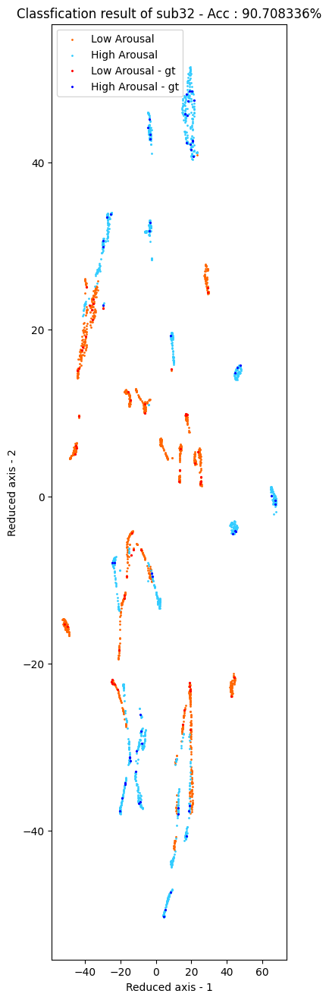

In [376]:
vlc_best_acc = []
ars_best_acc = []

for i in range(32):
    print("\n\n******************* SUBJECT : {} *********************".format(i+1))

    date = '230324'
    sub_idx = 'sub'+str(i+1)

    subject_de, subject_psd, subject_label, _ = load_subject_data(args.tensor_save_path, isdeap=True)

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    valence_label, arousal_label = deap_label(sub_label)

    de, psd, vlc_identifier, ars_identifier = preprocessing(sub_de,sub_psd, (valence_label,arousal_label), args.n_labels_by_class, args.out_channels, args.seed, isdeap=True)

    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

    de_ssm, de_nssm = ssm_construction(de, args.n_samples,args.de_k)
    psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples,args.psd_k)
    save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
    save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
    save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
    save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    adj = normalize_adj(fsm)
    save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
    save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    feature = input_feature(de, psd)

    save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(adj).to(torch.float32).to(device)
    ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
    vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

    vlc_identifier = torch.from_numpy(vlc_identifier).bool()
    vlc_train_identifier = vlc_identifier.to(device)
    isunlabeled = ~vlc_identifier
    vlc_test_identifier = isunlabeled.to(device)

    ars_identifier = torch.from_numpy(ars_identifier).bool()
    ars_train_identifier = ars_identifier.to(device)
    isunlabeled = ~ars_identifier
    ars_test_identifier = isunlabeled.to(device)


    activation = get_activation('celu')
    gcn = GraphConvolution

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, adj, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, vlc_label,
                                                                        vlc_train_identifier, vlc_test_identifier,
                                                                        args,date,sub_idx, isdeap=True)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    vlc_best_acc.append(round(best_acc.item(), 2))
    

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_valence'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'valence_test_acc_'+date, best_acc)

    cf_name = args.valence
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)


    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)



    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, adj, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, ars_label,
                                                                        ars_train_identifier, ars_test_identifier,
                                                                        args,date,sub_idx, isdeap=True)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    ars_best_acc.append(round(best_acc.item(), 2))

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_arousal'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'arousal_test_acc_'+date, best_acc)

    cf_name = args.arousal
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, ars_train_identifier, cf_name, fig_name)
print("\n**************** Valence *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
print("**************** Arousal *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))




******************* SUBJECT : 1 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 640 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 88.42,    Test Loss :0.52,    Total Acc : 92.13
Epoch 650 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.6,    Test Loss :0.53,    Total Acc : 94.39
Epoch 660 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 88.06,    Test Loss :0.55,    Total Acc : 91.95
Epoch 670 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.6,    Test Loss :0.52,    Total Acc : 93.68
Epoch 680 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.21,    Test Loss :0.48,    Total Acc : 94.48
Epoch 690 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 89.12,    Test Loss :0.59,    Total Acc : 93.73
Epoch 700 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 88.42,    Test Loss :0.62,    Total Acc : 92.96
Epoch 710 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 88.96,    Test Loss :0.65,    Total Acc : 92.81
Epoch 720 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.88,    Test Loss :0.59,

Epoch 1360 - Train Acc : 98.75    Train Loss : 0.76,    Test Acc : 92.08,    Test Loss :1.38,    Total Acc : 95.42
Epoch 1370 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 82.06,    Test Loss :1.13,    Total Acc : 87.07
Epoch 1380 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.56,    Test Loss :1.27,    Total Acc : 93.95
Epoch 1390 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 90.85,    Test Loss :1.18,    Total Acc : 93.97
Epoch 1400 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 90.75,    Test Loss :0.61,    Total Acc : 93.29
Epoch 1410 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.85,    Test Loss :0.84,    Total Acc : 94.18
Epoch 1420 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 87.79,    Test Loss :1.04,    Total Acc : 91.19
Epoch 1430 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 89.19,    Test Loss :1.06,    Total Acc : 92.72
Epoch 1440 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 90.33,    Test L

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.06,    Test Loss :1.13,    Total Acc : 95.32
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.96,    Test Loss :1.47,    Total Acc : 95.48
Epoch 2100 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.79,    Test Loss :0.43,    Total Acc : 95.27
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.46,    Test Loss :0.49,    Total Acc : 95.4
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.77,    Test Loss :0.57,    Total Acc : 95.26
Epoch 2130 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 92.56,    Test Loss :0.65,    Total Acc : 95.66
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.62,    Test Loss :0.51,    Total Acc : 96.4
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.61,    Total Acc : 96.46
Epoch 2160 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 92.4,    Test Los

Epoch 2800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.12,    Test Loss :0.56,    Total Acc : 95.65
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.29,    Test Loss :0.68,    Total Acc : 95.94
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.17,    Test Loss :0.71,    Total Acc : 95.67
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.31,    Test Loss :0.56,    Total Acc : 96.66
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.23,    Test Loss :0.64,    Total Acc : 95.2
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.6,    Test Loss :0.6,    Total Acc : 96.39
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.1,    Test Loss :0.52,    Total Acc : 96.34
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.67,    Test Loss :0.75,    Total Acc : 95.42
Epoch 2880 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.5,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 61.67    Train Loss : 0.74,    Test Acc : 54.29,    Test Loss :0.66,    Total Acc : 57.98
Epoch 20 - Train Acc : 66.25    Train Loss : 0.71,    Test Acc : 62.31,    Test Loss :0.61,    Total Acc : 64.28
Epoch 30 - Train Acc : 70.0    Train Loss : 0.68,    Test Acc : 67.92,    Test Loss :0.59,    Total Acc : 68.96
Epoch 40 - Train Acc : 76.67    Train Loss : 0.62,    Test Acc : 71.48,    Test Loss :0.55,    Total Acc : 74.07
Epoch 50 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 71.29,    Test Loss :0.52,    Total Acc : 72.73
Epoch 60 - Train Acc : 75.83    Train Loss : 0.56,    Test Acc : 71.15,    Test Loss :0.58,    Total Acc : 73.49
Epoch 70 - Train Acc : 83.33    Train Loss : 0.52,    Test Acc : 74.73,    Test Loss :0.55,    Total Acc : 79.03
Epoch 80 - Train Acc : 83.33    Train Loss : 0.47,    Test Acc : 77.25,    Test Loss :0.48,    Total Acc : 80.29
Epoch 90 - Train Acc : 75.83    Train Loss : 0.57,    Test Acc : 68.33,    Test Loss :0.65,    To

Epoch 750 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 85.04,    Test Loss :0.35,    Total Acc : 89.6
Epoch 760 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 82.67,    Test Loss :0.41,    Total Acc : 88.21
Epoch 770 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 85.62,    Test Loss :0.38,    Total Acc : 90.52
Epoch 780 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 84.31,    Test Loss :0.36,    Total Acc : 88.2
Epoch 790 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 83.29,    Test Loss :0.44,    Total Acc : 89.15
Epoch 800 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 83.85,    Test Loss :0.45,    Total Acc : 89.43
Epoch 810 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 83.98,    Test Loss :0.43,    Total Acc : 89.49
Epoch 820 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 85.83,    Test Loss :0.33,    Total Acc : 90.0
Epoch 830 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 84.77,    Test Loss :0.39,  

Epoch 1470 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 87.65,    Test Loss :0.34,    Total Acc : 91.74
Epoch 1480 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 84.5,    Test Loss :0.54,    Total Acc : 89.12
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 87.25,    Test Loss :0.34,    Total Acc : 91.54
Epoch 1500 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 88.19,    Test Loss :0.33,    Total Acc : 93.26
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 87.94,    Test Loss :0.36,    Total Acc : 92.09
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 87.42,    Test Loss :0.35,    Total Acc : 92.67
Epoch 1530 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 88.19,    Test Loss :0.34,    Total Acc : 92.01
Epoch 1540 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.15,    Test Loss :0.38,    Total Acc : 91.2
Epoch 1550 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 87.27,    Test 

Epoch 2190 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 87.83,    Test Loss :0.42,    Total Acc : 92.25
Epoch 2200 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 85.0,    Test Loss :0.42,    Total Acc : 89.17
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 89.21,    Test Loss :0.38,    Total Acc : 92.1
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.5,    Test Loss :0.22,    Total Acc : 95.21
Epoch 2230 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.27,    Test Loss :0.35,    Total Acc : 93.8
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.6,    Test Loss :0.33,    Total Acc : 94.18
Epoch 2250 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 87.02,    Test Loss :0.42,    Total Acc : 92.47
Epoch 2260 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 85.81,    Test Loss :0.52,    Total Acc : 89.57
Epoch 2270 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 87.17,    Test Loss

Epoch 2910 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.96,    Test Loss :0.34,    Total Acc : 94.65
Epoch 2920 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.85,    Test Loss :0.36,    Total Acc : 95.22
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 87.98,    Test Loss :0.43,    Total Acc : 93.78
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.33,    Test Loss :0.33,    Total Acc : 95.04
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.56,    Test Loss :0.35,    Total Acc : 94.16
Epoch 2960 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 87.71,    Test Loss :0.57,    Total Acc : 91.98
Epoch 2970 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 88.58,    Test Loss :0.46,    Total Acc : 91.79
Epoch 2980 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 89.56,    Test Loss :0.31,    Total Acc : 93.74
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 88.81,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 2 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 650 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 84.38,    Test Loss :1.61,    Total Acc : 91.56
Epoch 660 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 85.79,    Test Loss :1.07,    Total Acc : 92.27
Epoch 670 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.42,    Test Loss :1.7,    Total Acc : 90.5
Epoch 680 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 81.52,    Test Loss :1.22,    Total Acc : 89.93
Epoch 690 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 80.85,    Test Loss :1.4,    Total Acc : 88.76
Epoch 700 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 86.35,    Test Loss :1.4,    Total Acc : 92.34
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.42,    Test Loss :1.65,    Total Acc : 93.21
Epoch 720 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 86.29,    Test Loss :2.42,    Total Acc : 92.94
Epoch 730 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.21,    Test Loss :1.93,    

Epoch 1370 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 81.88,    Test Loss :1.95,    Total Acc : 90.1
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 83.48,    Test Loss :1.23,    Total Acc : 90.49
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 83.92,    Test Loss :1.85,    Total Acc : 91.75
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 83.85,    Test Loss :1.86,    Total Acc : 91.72
Epoch 1410 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 84.19,    Test Loss :1.48,    Total Acc : 90.84
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.83,    Test Loss :4.98,    Total Acc : 91.0
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 84.79,    Test Loss :1.51,    Total Acc : 92.19
Epoch 1440 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 83.5,    Test Loss :2.11,    Total Acc : 90.92
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.69,    Test Loss 

Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.79,    Test Loss :8.19,    Total Acc : 92.4
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 84.71,    Test Loss :8.77,    Total Acc : 92.35
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.46,    Test Loss :5.6,    Total Acc : 93.23
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.04,    Test Loss :5.73,    Total Acc : 93.52
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 85.23,    Test Loss :5.8,    Total Acc : 92.2
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.15,    Test Loss :4.67,    Total Acc : 92.57
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 84.33,    Test Loss :4.25,    Total Acc : 91.75
Epoch 2160 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.67,    Test Loss :3.94,    Total Acc : 90.71
Epoch 2170 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 86.92,    Test Loss

Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.75,    Test Loss :6.15,    Total Acc : 92.38
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.12,    Test Loss :6.59,    Total Acc : 92.56
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.96,    Test Loss :6.51,    Total Acc : 92.98
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.31,    Test Loss :6.67,    Total Acc : 93.16
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.65,    Test Loss :6.1,    Total Acc : 92.11
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 86.06,    Test Loss :7.04,    Total Acc : 92.61
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.23,    Test Loss :6.98,    Total Acc : 92.61
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.96,    Test Loss :6.35,    Total Acc : 92.98
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.12,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 73.33    Train Loss : 0.67,    Test Acc : 63.02,    Test Loss :0.63,    Total Acc : 68.18
Epoch 20 - Train Acc : 73.75    Train Loss : 0.62,    Test Acc : 62.73,    Test Loss :0.68,    Total Acc : 68.24
Epoch 30 - Train Acc : 77.5    Train Loss : 0.56,    Test Acc : 65.58,    Test Loss :0.62,    Total Acc : 71.54
Epoch 40 - Train Acc : 80.0    Train Loss : 0.5,    Test Acc : 66.42,    Test Loss :0.62,    Total Acc : 73.21
Epoch 50 - Train Acc : 84.17    Train Loss : 0.46,    Test Acc : 68.23,    Test Loss :0.66,    Total Acc : 76.2
Epoch 60 - Train Acc : 83.75    Train Loss : 0.44,    Test Acc : 68.6,    Test Loss :0.71,    Total Acc : 76.18
Epoch 70 - Train Acc : 84.58    Train Loss : 0.45,    Test Acc : 70.9,    Test Loss :0.66,    Total Acc : 77.74
Epoch 80 - Train Acc : 85.83    Train Loss : 0.43,    Test Acc : 66.67,    Test Loss :0.99,    Total Acc : 76.25
Epoch 90 - Train Acc : 85.42    Train Loss : 0.35,    Test Acc : 71.38,    Test Loss :0.82,    Total A

Epoch 760 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 79.35,    Test Loss :1.38,    Total Acc : 87.59
Epoch 770 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.54,    Test Loss :1.45,    Total Acc : 90.85
Epoch 780 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 83.81,    Test Loss :1.06,    Total Acc : 89.82
Epoch 790 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 85.1,    Test Loss :0.98,    Total Acc : 91.72
Epoch 800 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 85.12,    Test Loss :0.92,    Total Acc : 92.56
Epoch 810 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.1,    Test Loss :1.51,    Total Acc : 90.14
Epoch 820 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 84.29,    Test Loss :1.29,    Total Acc : 91.1
Epoch 830 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 84.85,    Test Loss :1.09,    Total Acc : 90.76
Epoch 840 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 84.65,    Test Loss :1.23, 

Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.85,    Test Loss :1.17,    Total Acc : 93.43
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.71,    Test Loss :1.29,    Total Acc : 92.85
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.27,    Test Loss :1.26,    Total Acc : 93.43
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 86.35,    Test Loss :1.12,    Total Acc : 92.55
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.06,    Test Loss :1.15,    Total Acc : 92.82
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 81.83,    Test Loss :1.69,    Total Acc : 89.67
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.6,    Test Loss :1.21,    Total Acc : 93.3
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.65,    Test Loss :1.32,    Total Acc : 92.32
Epoch 1570 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.17,    Test L

Epoch 2210 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 86.08,    Test Loss :1.41,    Total Acc : 92.83
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.4,    Test Loss :1.2,    Total Acc : 93.49
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.81,    Test Loss :1.2,    Total Acc : 93.41
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.38,    Test Loss :1.44,    Total Acc : 92.69
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 86.81,    Test Loss :1.23,    Total Acc : 92.78
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.42,    Test Loss :1.39,    Total Acc : 93.21
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 84.6,    Test Loss :1.24,    Total Acc : 91.05
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.92,    Test Loss :1.43,    Total Acc : 93.46
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.08,    Test Los

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.35,    Test Loss :1.18,    Total Acc : 93.68
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.04,    Test Loss :1.39,    Total Acc : 93.52
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.83,    Test Loss :1.37,    Total Acc : 93.92
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.79,    Test Loss :1.31,    Total Acc : 93.69
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 87.33,    Test Loss :1.32,    Total Acc : 93.46
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.52,    Test Loss :1.17,    Total Acc : 94.26
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 85.71,    Test Loss :1.6,    Total Acc : 92.44
Epoch 3000 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :1.2,    Total Acc : 94.21
*** Best ACC : 89.44 ***
directory already exists
arousal_test_acc_230324_update1 i

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 3 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (756,),    high valence : (1764,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm cons

/tmp/ipykernel_7653/723135367.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


Epoch 10 - Train Acc : 61.67    Train Loss : 0.64,    Test Acc : 51.62,    Test Loss :0.6,    Total Acc : 56.65
Epoch 20 - Train Acc : 70.0    Train Loss : 0.59,    Test Acc : 59.15,    Test Loss :0.95,    Total Acc : 64.57
Epoch 30 - Train Acc : 75.83    Train Loss : 0.55,    Test Acc : 65.06,    Test Loss :1.18,    Total Acc : 70.45
Epoch 40 - Train Acc : 81.25    Train Loss : 0.53,    Test Acc : 64.62,    Test Loss :0.82,    Total Acc : 72.94
Epoch 50 - Train Acc : 85.0    Train Loss : 0.49,    Test Acc : 68.67,    Test Loss :1.48,    Total Acc : 76.83
Epoch 60 - Train Acc : 88.33    Train Loss : 0.41,    Test Acc : 70.15,    Test Loss :0.89,    Total Acc : 79.24
Epoch 70 - Train Acc : 80.0    Train Loss : 0.47,    Test Acc : 68.06,    Test Loss :0.79,    Total Acc : 74.03
Epoch 80 - Train Acc : 88.75    Train Loss : 0.38,    Test Acc : 74.19,    Test Loss :0.9,    Total Acc : 81.47
Epoch 90 - Train Acc : 90.0    Train Loss : 0.32,    Test Acc : 73.94,    Test Loss :1.09,    Total A

Epoch 750 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.06,    Test Loss :4.66,    Total Acc : 92.28
Epoch 760 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.12,    Test Loss :3.69,    Total Acc : 93.73
Epoch 770 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.27,    Test Loss :3.96,    Total Acc : 95.43
Epoch 780 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.98,    Test Loss :4.28,    Total Acc : 92.32
Epoch 790 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 88.21,    Test Loss :3.6,    Total Acc : 92.23
Epoch 800 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 87.85,    Test Loss :3.02,    Total Acc : 93.09
Epoch 810 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 87.31,    Test Loss :2.84,    Total Acc : 92.2
Epoch 820 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.94,    Test Loss :3.51,    Total Acc : 93.64
Epoch 830 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 89.1,    Test Loss :4.66,  

Epoch 1470 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.56,    Test Loss :0.36,    Total Acc : 94.32
Epoch 1480 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.19,    Test Loss :0.38,    Total Acc : 95.47
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 88.85,    Test Loss :0.41,    Total Acc : 93.59
Epoch 1500 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.6,    Test Loss :0.25,    Total Acc : 96.18
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.21,    Total Acc : 96.83
Epoch 1520 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 92.6,    Test Loss :0.26,    Total Acc : 94.22
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.75,    Test Loss :0.21,    Total Acc : 97.17
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.41,    Total Acc : 96.27
Epoch 1550 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.56,    Test 

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.46,    Test Loss :0.23,    Total Acc : 97.23
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.79,    Test Loss :0.67,    Total Acc : 96.9
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.23,    Test Loss :0.48,    Total Acc : 96.41
Epoch 2230 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.12,    Test Loss :0.66,    Total Acc : 96.35
Epoch 2240 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 87.42,    Test Loss :0.69,    Total Acc : 92.67
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 95.17,    Test Loss :0.26,    Total Acc : 97.38
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.33,    Test Loss :0.41,    Total Acc : 95.46
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.4,    Test Loss :0.3,    Total Acc : 96.2
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.88,    Test Loss 

Epoch 2920 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.38,    Test Loss :0.6,    Total Acc : 95.27
Epoch 2930 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 92.27,    Test Loss :0.95,    Total Acc : 94.89
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.12,    Test Loss :0.59,    Total Acc : 97.06
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.06,    Test Loss :0.57,    Total Acc : 95.82
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :0.88,    Total Acc : 95.41
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.0,    Test Loss :0.68,    Total Acc : 96.58
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.19,    Test Loss :0.57,    Total Acc : 94.68
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.68,    Total Acc : 97.57
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.75,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 59.17    Train Loss : 0.71,    Test Acc : 48.98,    Test Loss :0.67,    Total Acc : 54.07
Epoch 20 - Train Acc : 61.67    Train Loss : 0.7,    Test Acc : 60.81,    Test Loss :0.61,    Total Acc : 61.24
Epoch 30 - Train Acc : 57.08    Train Loss : 0.69,    Test Acc : 50.73,    Test Loss :0.64,    Total Acc : 53.91
Epoch 40 - Train Acc : 61.67    Train Loss : 0.68,    Test Acc : 53.12,    Test Loss :0.61,    Total Acc : 57.4
Epoch 50 - Train Acc : 66.25    Train Loss : 0.65,    Test Acc : 57.6,    Test Loss :0.61,    Total Acc : 61.93
Epoch 60 - Train Acc : 67.92    Train Loss : 0.66,    Test Acc : 58.85,    Test Loss :0.67,    Total Acc : 63.39
Epoch 70 - Train Acc : 65.83    Train Loss : 0.63,    Test Acc : 57.79,    Test Loss :0.6,    Total Acc : 61.81
Epoch 80 - Train Acc : 67.5    Train Loss : 0.61,    Test Acc : 59.71,    Test Loss :0.59,    Total Acc : 63.6
Epoch 90 - Train Acc : 68.33    Train Loss : 0.66,    Test Acc : 63.33,    Test Loss :0.61,    Total A

Epoch 760 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 79.62,    Test Loss :0.44,    Total Acc : 84.19
Epoch 770 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 78.71,    Test Loss :0.49,    Total Acc : 84.15
Epoch 780 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 78.71,    Test Loss :0.43,    Total Acc : 84.77
Epoch 790 - Train Acc : 87.08    Train Loss : 0.31,    Test Acc : 77.44,    Test Loss :0.43,    Total Acc : 82.26
Epoch 800 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 78.67,    Test Loss :0.46,    Total Acc : 84.54
Epoch 810 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 81.0,    Test Loss :0.42,    Total Acc : 86.33
Epoch 820 - Train Acc : 87.08    Train Loss : 0.39,    Test Acc : 78.5,    Test Loss :0.5,    Total Acc : 82.79
Epoch 830 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 85.08,    Test Loss :0.36,    Total Acc : 88.38
Epoch 840 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 80.23,    Test Loss :0.47,

Epoch 1480 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 85.27,    Test Loss :0.39,    Total Acc : 90.34
Epoch 1490 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 84.1,    Test Loss :0.41,    Total Acc : 88.09
Epoch 1500 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 85.02,    Test Loss :0.34,    Total Acc : 89.59
Epoch 1510 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 87.56,    Test Loss :0.32,    Total Acc : 91.28
Epoch 1520 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 83.21,    Test Loss :0.6,    Total Acc : 86.19
Epoch 1530 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 83.54,    Test Loss :0.4,    Total Acc : 86.56
Epoch 1540 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 83.0,    Test Loss :0.42,    Total Acc : 87.75
Epoch 1550 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 86.15,    Test Loss :0.33,    Total Acc : 88.91
Epoch 1560 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 85.65,    Test Loss 

Epoch 2220 - Train Acc : 93.75    Train Loss : 0.18,    Test Acc : 89.4,    Test Loss :0.24,    Total Acc : 91.57
Epoch 2230 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 88.17,    Test Loss :0.36,    Total Acc : 91.79
Epoch 2240 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 84.71,    Test Loss :0.33,    Total Acc : 90.69
Epoch 2250 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 86.98,    Test Loss :0.33,    Total Acc : 92.03
Epoch 2260 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 83.48,    Test Loss :0.54,    Total Acc : 89.03
Epoch 2270 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 88.65,    Test Loss :0.3,    Total Acc : 92.66
Epoch 2280 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 83.98,    Test Loss :0.43,    Total Acc : 89.7
Epoch 2290 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 89.56,    Test Loss :0.22,    Total Acc : 92.49
Epoch 2300 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 84.98,    Test L

Epoch 2950 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 86.67,    Test Loss :0.41,    Total Acc : 90.83
Epoch 2960 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 85.06,    Test Loss :0.52,    Total Acc : 90.86
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 89.96,    Test Loss :0.33,    Total Acc : 94.56
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 86.73,    Test Loss :0.5,    Total Acc : 91.49
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 88.6,    Test Loss :0.4,    Total Acc : 92.64
Epoch 3000 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 86.67,    Test Loss :0.42,    Total Acc : 92.08
*** Best ACC : 93.35 ***
directory already exists
arousal_test_acc_230324_update1 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 4 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 630 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 76.81,    Test Loss :1.4,    Total Acc : 84.24
Epoch 640 - Train Acc : 84.17    Train Loss : 0.48,    Test Acc : 69.67,    Test Loss :1.84,    Total Acc : 76.92
Epoch 650 - Train Acc : 88.33    Train Loss : 0.29,    Test Acc : 76.92,    Test Loss :1.28,    Total Acc : 82.62
Epoch 660 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 74.27,    Test Loss :1.3,    Total Acc : 83.18
Epoch 670 - Train Acc : 90.0    Train Loss : 0.26,    Test Acc : 72.83,    Test Loss :1.23,    Total Acc : 81.42
Epoch 680 - Train Acc : 88.33    Train Loss : 0.29,    Test Acc : 70.67,    Test Loss :1.23,    Total Acc : 79.5
Epoch 690 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 77.27,    Test Loss :1.23,    Total Acc : 85.3
Epoch 700 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 78.27,    Test Loss :1.25,    Total Acc : 86.22
Epoch 710 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 78.5,    Test Loss :1.27,   

Epoch 1360 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 76.65,    Test Loss :1.78,    Total Acc : 84.78
Epoch 1370 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 78.0,    Test Loss :1.56,    Total Acc : 87.33
Epoch 1380 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 80.1,    Test Loss :1.61,    Total Acc : 86.72
Epoch 1390 - Train Acc : 91.67    Train Loss : 0.21,    Test Acc : 77.06,    Test Loss :2.08,    Total Acc : 84.36
Epoch 1400 - Train Acc : 91.67    Train Loss : 0.21,    Test Acc : 75.79,    Test Loss :1.41,    Total Acc : 83.73
Epoch 1410 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 74.23,    Test Loss :1.67,    Total Acc : 82.74
Epoch 1420 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 79.17,    Test Loss :1.39,    Total Acc : 88.33
Epoch 1430 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 79.08,    Test Loss :1.22,    Total Acc : 85.58
Epoch 1440 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 76.04,    Test Lo

Epoch 2080 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 75.25,    Test Loss :1.75,    Total Acc : 83.25
Epoch 2090 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 77.33,    Test Loss :2.19,    Total Acc : 86.58
Epoch 2100 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 80.06,    Test Loss :2.11,    Total Acc : 88.99
Epoch 2110 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 76.67,    Test Loss :2.34,    Total Acc : 85.21
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 80.48,    Test Loss :2.43,    Total Acc : 89.61
Epoch 2130 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 71.23,    Test Loss :2.33,    Total Acc : 80.61
Epoch 2140 - Train Acc : 91.67    Train Loss : 0.22,    Test Acc : 73.19,    Test Loss :1.98,    Total Acc : 82.43
Epoch 2150 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 76.71,    Test Loss :1.5,    Total Acc : 84.19
Epoch 2160 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 79.27,    Test 

Epoch 2800 - Train Acc : 90.42    Train Loss : 0.25,    Test Acc : 74.06,    Test Loss :2.06,    Total Acc : 82.24
Epoch 2810 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.25,    Test Loss :2.0,    Total Acc : 90.0
Epoch 2820 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 80.27,    Test Loss :2.22,    Total Acc : 87.64
Epoch 2830 - Train Acc : 93.75    Train Loss : 0.18,    Test Acc : 77.0,    Test Loss :2.08,    Total Acc : 85.38
Epoch 2840 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 78.88,    Test Loss :2.41,    Total Acc : 88.19
Epoch 2850 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 80.08,    Test Loss :1.97,    Total Acc : 87.96
Epoch 2860 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 79.44,    Test Loss :2.14,    Total Acc : 87.84
Epoch 2870 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 79.96,    Test Loss :1.94,    Total Acc : 87.9
Epoch 2880 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 76.92,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.92    Train Loss : 0.64,    Test Acc : 64.02,    Test Loss :0.62,    Total Acc : 68.47
Epoch 20 - Train Acc : 79.17    Train Loss : 0.51,    Test Acc : 69.12,    Test Loss :0.54,    Total Acc : 74.15
Epoch 30 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 71.29,    Test Loss :0.6,    Total Acc : 76.06
Epoch 40 - Train Acc : 79.17    Train Loss : 0.46,    Test Acc : 71.81,    Test Loss :0.67,    Total Acc : 75.49
Epoch 50 - Train Acc : 79.58    Train Loss : 0.43,    Test Acc : 70.92,    Test Loss :0.6,    Total Acc : 75.25
Epoch 60 - Train Acc : 80.42    Train Loss : 0.42,    Test Acc : 72.71,    Test Loss :0.58,    Total Acc : 76.56
Epoch 70 - Train Acc : 80.0    Train Loss : 0.42,    Test Acc : 74.06,    Test Loss :0.61,    Total Acc : 77.03
Epoch 80 - Train Acc : 82.92    Train Loss : 0.39,    Test Acc : 72.44,    Test Loss :0.61,    Total Acc : 77.68
Epoch 90 - Train Acc : 85.42    Train Loss : 0.38,    Test Acc : 75.94,    Test Loss :0.6,    Total

Epoch 760 - Train Acc : 89.17    Train Loss : 0.29,    Test Acc : 76.71,    Test Loss :0.71,    Total Acc : 82.94
Epoch 770 - Train Acc : 88.75    Train Loss : 0.32,    Test Acc : 77.02,    Test Loss :0.75,    Total Acc : 82.89
Epoch 780 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 77.23,    Test Loss :0.77,    Total Acc : 82.57
Epoch 790 - Train Acc : 83.75    Train Loss : 0.37,    Test Acc : 74.77,    Test Loss :0.74,    Total Acc : 79.26
Epoch 800 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 79.52,    Test Loss :0.68,    Total Acc : 85.8
Epoch 810 - Train Acc : 87.08    Train Loss : 0.33,    Test Acc : 77.02,    Test Loss :0.76,    Total Acc : 82.05
Epoch 820 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 80.02,    Test Loss :0.7,    Total Acc : 85.84
Epoch 830 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 80.31,    Test Loss :0.73,    Total Acc : 86.41
Epoch 840 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 79.94,    Test Loss :0.72

Epoch 1490 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 85.48,    Test Loss :1.13,    Total Acc : 90.03
Epoch 1500 - Train Acc : 92.5    Train Loss : 0.21,    Test Acc : 85.81,    Test Loss :1.35,    Total Acc : 89.16
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 86.29,    Test Loss :1.16,    Total Acc : 91.69
Epoch 1520 - Train Acc : 89.17    Train Loss : 0.26,    Test Acc : 81.62,    Test Loss :1.21,    Total Acc : 85.4
Epoch 1530 - Train Acc : 90.83    Train Loss : 0.21,    Test Acc : 82.67,    Test Loss :1.24,    Total Acc : 86.75
Epoch 1540 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 84.21,    Test Loss :1.1,    Total Acc : 88.15
Epoch 1550 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 83.42,    Test Loss :1.21,    Total Acc : 87.75
Epoch 1560 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 81.0,    Test Loss :1.35,    Total Acc : 85.5
Epoch 1570 - Train Acc : 89.17    Train Loss : 0.29,    Test Acc : 80.15,    Test Loss 

Epoch 2210 - Train Acc : 87.08    Train Loss : 0.33,    Test Acc : 82.38,    Test Loss :1.29,    Total Acc : 84.73
Epoch 2220 - Train Acc : 91.67    Train Loss : 0.21,    Test Acc : 85.29,    Test Loss :1.34,    Total Acc : 88.48
Epoch 2230 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 85.83,    Test Loss :1.25,    Total Acc : 90.0
Epoch 2240 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 87.69,    Test Loss :1.3,    Total Acc : 91.34
Epoch 2250 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 84.08,    Test Loss :1.42,    Total Acc : 88.5
Epoch 2260 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 88.42,    Test Loss :1.35,    Total Acc : 92.96
Epoch 2270 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 86.83,    Test Loss :1.37,    Total Acc : 90.92
Epoch 2280 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.21,    Test Loss :1.43,    Total Acc : 90.02
Epoch 2290 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 85.15,    Test Loss

Epoch 2940 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.27,    Test Loss :1.29,    Total Acc : 93.09
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 89.25,    Test Loss :1.2,    Total Acc : 93.79
Epoch 2960 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 87.38,    Test Loss :1.47,    Total Acc : 91.4
Epoch 2970 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 86.52,    Test Loss :1.39,    Total Acc : 91.18
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 88.54,    Test Loss :1.43,    Total Acc : 93.02
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 89.35,    Test Loss :1.3,    Total Acc : 94.05
Epoch 3000 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 85.19,    Test Loss :1.34,    Total Acc : 90.3
*** Best ACC : 89.6 ***
directory already exists
arousal_test_acc_230324_update1 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 5 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1575,),    high valence : (945,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 630 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.19,    Test Loss :0.19,    Total Acc : 96.89
Epoch 640 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.29,    Test Loss :0.19,    Total Acc : 96.23
Epoch 650 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.6,    Test Loss :0.3,    Total Acc : 95.26
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.17,    Test Loss :0.2,    Total Acc : 96.67
Epoch 670 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 94.19,    Test Loss :0.15,    Total Acc : 97.09
Epoch 680 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.42,    Test Loss :0.18,    Total Acc : 95.38
Epoch 690 - Train Acc : 95.42    Train Loss : 0.11,    Test Acc : 91.42,    Test Loss :0.18,    Total Acc : 93.42
Epoch 700 - Train Acc : 97.92    Train Loss : 0.09,    Test Acc : 93.06,    Test Loss :0.2,    Total Acc : 95.49
Epoch 710 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.85,    Test Loss :0.34,

Epoch 1350 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.1,    Test Loss :0.32,    Total Acc : 96.14
Epoch 1360 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.48,    Test Loss :0.24,    Total Acc : 96.53
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.52,    Test Loss :0.31,    Total Acc : 97.05
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.71,    Test Loss :0.22,    Total Acc : 96.44
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.28,    Total Acc : 96.48
Epoch 1400 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.56,    Test Loss :0.26,    Total Acc : 95.03
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.58,    Test Loss :0.23,    Total Acc : 97.29
Epoch 1420 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 93.88,    Test Loss :0.38,    Total Acc : 96.1
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.69,    Test Lo

Epoch 2080 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.24,    Total Acc : 97.12
Epoch 2090 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.79,    Test Loss :0.2,    Total Acc : 96.27
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.94,    Test Loss :0.25,    Total Acc : 97.47
Epoch 2110 - Train Acc : 98.33    Train Loss : 0.09,    Test Acc : 94.35,    Test Loss :0.31,    Total Acc : 96.34
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.4,    Test Loss :0.31,    Total Acc : 97.2
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.28,    Total Acc : 97.16
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.85,    Test Loss :0.25,    Total Acc : 97.43
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.96,    Test Loss :0.25,    Total Acc : 97.48
Epoch 2160 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 92.83,    Test L

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :0.33,    Total Acc : 96.91
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.31,    Total Acc : 96.46
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.71,    Test Loss :0.32,    Total Acc : 96.85
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.65,    Test Loss :0.35,    Total Acc : 96.82
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.44,    Test Loss :0.34,    Total Acc : 97.01
Epoch 2860 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 91.83,    Test Loss :0.54,    Total Acc : 94.88
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.21,    Test Loss :0.32,    Total Acc : 96.4
Epoch 2880 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 92.31,    Test Loss :0.48,    Total Acc : 94.91
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.46,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.92    Train Loss : 0.64,    Test Acc : 65.6,    Test Loss :0.58,    Total Acc : 66.76
Epoch 20 - Train Acc : 66.67    Train Loss : 0.63,    Test Acc : 67.81,    Test Loss :0.57,    Total Acc : 67.24
Epoch 30 - Train Acc : 69.58    Train Loss : 0.62,    Test Acc : 69.62,    Test Loss :0.56,    Total Acc : 69.6
Epoch 40 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 69.77,    Test Loss :0.55,    Total Acc : 69.68
Epoch 50 - Train Acc : 75.42    Train Loss : 0.58,    Test Acc : 73.17,    Test Loss :0.54,    Total Acc : 74.29
Epoch 60 - Train Acc : 75.42    Train Loss : 0.55,    Test Acc : 71.9,    Test Loss :0.52,    Total Acc : 73.66
Epoch 70 - Train Acc : 71.67    Train Loss : 0.53,    Test Acc : 67.5,    Test Loss :0.5,    Total Acc : 69.58
Epoch 80 - Train Acc : 73.33    Train Loss : 0.53,    Test Acc : 70.98,    Test Loss :0.49,    Total Acc : 72.16
Epoch 90 - Train Acc : 78.33    Train Loss : 0.49,    Test Acc : 73.96,    Test Loss :0.47,    Total 

Epoch 740 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 82.06,    Test Loss :0.42,    Total Acc : 85.82
Epoch 750 - Train Acc : 87.5    Train Loss : 0.39,    Test Acc : 79.92,    Test Loss :0.49,    Total Acc : 83.71
Epoch 760 - Train Acc : 83.75    Train Loss : 0.39,    Test Acc : 75.98,    Test Loss :0.46,    Total Acc : 79.86
Epoch 770 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 83.88,    Test Loss :0.37,    Total Acc : 88.19
Epoch 780 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 84.9,    Test Loss :0.34,    Total Acc : 87.66
Epoch 790 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 75.73,    Test Loss :0.51,    Total Acc : 78.91
Epoch 800 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 83.4,    Test Loss :0.34,    Total Acc : 88.57
Epoch 810 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 81.17,    Test Loss :0.41,    Total Acc : 83.92
Epoch 820 - Train Acc : 87.5    Train Loss : 0.34,    Test Acc : 80.96,    Test Loss :0.47, 

Epoch 1470 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 87.29,    Test Loss :0.31,    Total Acc : 91.56
Epoch 1480 - Train Acc : 83.75    Train Loss : 0.45,    Test Acc : 77.79,    Test Loss :0.59,    Total Acc : 80.77
Epoch 1490 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 84.06,    Test Loss :0.39,    Total Acc : 88.91
Epoch 1500 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 86.92,    Test Loss :0.33,    Total Acc : 90.54
Epoch 1510 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 84.9,    Test Loss :0.36,    Total Acc : 88.28
Epoch 1520 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 83.94,    Test Loss :0.41,    Total Acc : 88.64
Epoch 1530 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 81.92,    Test Loss :0.5,    Total Acc : 84.5
Epoch 1540 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 83.48,    Test Loss :0.37,    Total Acc : 88.2
Epoch 1550 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 85.69,    Test Lo

Epoch 2190 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 83.25,    Test Loss :0.47,    Total Acc : 87.46
Epoch 2200 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 86.9,    Test Loss :0.35,    Total Acc : 89.91
Epoch 2210 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 83.75,    Test Loss :0.52,    Total Acc : 86.04
Epoch 2220 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 86.85,    Test Loss :0.36,    Total Acc : 90.72
Epoch 2230 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 87.77,    Test Loss :0.37,    Total Acc : 91.59
Epoch 2240 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 83.08,    Test Loss :0.38,    Total Acc : 87.17
Epoch 2250 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 83.85,    Test Loss :0.45,    Total Acc : 87.55
Epoch 2260 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 86.1,    Test Loss :0.39,    Total Acc : 89.72
Epoch 2270 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 86.31,    Test L

Epoch 2930 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 89.33,    Test Loss :0.37,    Total Acc : 93.62
Epoch 2940 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.46,    Test Loss :0.34,    Total Acc : 91.65
Epoch 2950 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.81,    Test Loss :0.41,    Total Acc : 91.82
Epoch 2960 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.58,    Test Loss :0.39,    Total Acc : 92.42
Epoch 2970 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 86.73,    Test Loss :0.41,    Total Acc : 91.7
Epoch 2980 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.42,    Test Loss :0.34,    Total Acc : 93.17
Epoch 2990 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.67,    Test Loss :0.41,    Total Acc : 91.75
Epoch 3000 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 88.29,    Test Loss :0.37,    Total Acc : 91.85
*** Best ACC : 91.1 ***
directory already exists
arousal_test_acc_230324_update1 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 6 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 650 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 94.0,    Test Loss :0.32,    Total Acc : 95.75
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.19,    Test Loss :0.28,    Total Acc : 96.18
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.94,    Test Loss :0.27,    Total Acc : 96.55
Epoch 680 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.85,    Test Loss :0.14,    Total Acc : 97.22
Epoch 690 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.6,    Test Loss :0.19,    Total Acc : 97.09
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.42,    Test Loss :0.11,    Total Acc : 97.71
Epoch 710 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.81,    Test Loss :0.23,    Total Acc : 97.2
Epoch 720 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 91.73,    Test Loss :0.49,    Total Acc : 94.2
Epoch 730 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 88.02,    Test Loss :0.42,   

Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.31,    Test Loss :0.19,    Total Acc : 97.45
Epoch 1390 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.23,    Test Loss :0.21,    Total Acc : 95.99
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 96.06,    Test Loss :0.11,    Total Acc : 97.61
Epoch 1410 - Train Acc : 95.83    Train Loss : 0.22,    Test Acc : 92.06,    Test Loss :0.28,    Total Acc : 93.95
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 95.48,    Test Loss :0.17,    Total Acc : 97.11
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.44,    Test Loss :0.14,    Total Acc : 98.22
Epoch 1440 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 93.42,    Test Loss :0.26,    Total Acc : 95.25
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.31,    Test Loss :0.2,    Total Acc : 96.95
Epoch 1460 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.21,    Test 

Epoch 2110 - Train Acc : 85.42    Train Loss : 0.47,    Test Acc : 79.42,    Test Loss :0.67,    Total Acc : 82.42
Epoch 2120 - Train Acc : 95.83    Train Loss : 0.24,    Test Acc : 86.75,    Test Loss :0.73,    Total Acc : 91.29
Epoch 2130 - Train Acc : 85.42    Train Loss : 0.49,    Test Acc : 79.81,    Test Loss :0.66,    Total Acc : 82.61
Epoch 2140 - Train Acc : 70.42    Train Loss : 0.73,    Test Acc : 64.75,    Test Loss :0.89,    Total Acc : 67.58
Epoch 2150 - Train Acc : 70.42    Train Loss : 0.62,    Test Acc : 63.67,    Test Loss :0.6,    Total Acc : 67.04
Epoch 2160 - Train Acc : 62.5    Train Loss : 0.69,    Test Acc : 52.58,    Test Loss :0.91,    Total Acc : 57.54
Epoch 2170 - Train Acc : 71.25    Train Loss : 0.6,    Test Acc : 64.15,    Test Loss :1.04,    Total Acc : 67.7
Epoch 2180 - Train Acc : 67.92    Train Loss : 0.64,    Test Acc : 57.35,    Test Loss :0.99,    Total Acc : 62.64
Epoch 2190 - Train Acc : 70.0    Train Loss : 0.62,    Test Acc : 60.77,    Test Los

Epoch 2850 - Train Acc : 96.67    Train Loss : 0.21,    Test Acc : 91.19,    Test Loss :0.48,    Total Acc : 93.93
Epoch 2860 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 88.27,    Test Loss :0.58,    Total Acc : 91.84
Epoch 2870 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 91.62,    Test Loss :0.58,    Total Acc : 93.52
Epoch 2880 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 87.88,    Test Loss :0.69,    Total Acc : 91.65
Epoch 2890 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 88.33,    Test Loss :0.9,    Total Acc : 92.29
Epoch 2900 - Train Acc : 96.67    Train Loss : 0.21,    Test Acc : 90.38,    Test Loss :0.95,    Total Acc : 93.52
Epoch 2910 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 85.79,    Test Loss :1.32,    Total Acc : 90.4
Epoch 2920 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 91.46,    Test Loss :1.02,    Total Acc : 93.85
Epoch 2930 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 89.23,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.83    Train Loss : 0.71,    Test Acc : 68.62,    Test Loss :0.6,    Total Acc : 67.23
Epoch 20 - Train Acc : 71.67    Train Loss : 0.63,    Test Acc : 72.79,    Test Loss :0.57,    Total Acc : 72.23
Epoch 30 - Train Acc : 72.92    Train Loss : 0.58,    Test Acc : 70.56,    Test Loss :0.56,    Total Acc : 71.74
Epoch 40 - Train Acc : 76.25    Train Loss : 0.54,    Test Acc : 72.98,    Test Loss :0.52,    Total Acc : 74.61
Epoch 50 - Train Acc : 76.25    Train Loss : 0.52,    Test Acc : 75.98,    Test Loss :0.5,    Total Acc : 76.11
Epoch 60 - Train Acc : 76.67    Train Loss : 0.5,    Test Acc : 74.92,    Test Loss :0.52,    Total Acc : 75.79
Epoch 70 - Train Acc : 75.42    Train Loss : 0.52,    Test Acc : 73.73,    Test Loss :0.58,    Total Acc : 74.57
Epoch 80 - Train Acc : 78.75    Train Loss : 0.46,    Test Acc : 75.73,    Test Loss :0.48,    Total Acc : 77.24
Epoch 90 - Train Acc : 79.17    Train Loss : 0.46,    Test Acc : 76.88,    Test Loss :0.51,    Tota

Epoch 750 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 86.12,    Test Loss :0.39,    Total Acc : 92.02
Epoch 760 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 82.5,    Test Loss :0.46,    Total Acc : 88.33
Epoch 770 - Train Acc : 91.67    Train Loss : 0.32,    Test Acc : 82.23,    Test Loss :0.54,    Total Acc : 86.95
Epoch 780 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 83.73,    Test Loss :0.48,    Total Acc : 90.41
Epoch 790 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 84.46,    Test Loss :0.45,    Total Acc : 90.56
Epoch 800 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 86.35,    Test Loss :0.36,    Total Acc : 92.34
Epoch 810 - Train Acc : 95.42    Train Loss : 0.25,    Test Acc : 83.92,    Test Loss :0.6,    Total Acc : 89.67
Epoch 820 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 86.94,    Test Loss :0.37,    Total Acc : 92.84
Epoch 830 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 84.1,    Test Loss :0.49

Epoch 1470 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 83.12,    Test Loss :0.68,    Total Acc : 89.48
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.83,    Test Loss :0.4,    Total Acc : 94.42
Epoch 1490 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.6,    Test Loss :0.42,    Total Acc : 93.39
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.29,    Test Loss :0.49,    Total Acc : 93.23
Epoch 1510 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 86.9,    Test Loss :0.57,    Total Acc : 93.24
Epoch 1520 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.92,    Test Loss :0.54,    Total Acc : 93.33
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 88.27,    Test Loss :0.39,    Total Acc : 93.93
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.81,    Test Loss :0.44,    Total Acc : 93.28
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 86.17,    Test Los

Epoch 2190 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 88.38,    Test Loss :0.43,    Total Acc : 92.94
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 89.48,    Test Loss :0.51,    Total Acc : 94.74
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.12,    Test Loss :0.44,    Total Acc : 93.65
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.17,    Test Loss :0.36,    Total Acc : 94.46
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.67,    Test Loss :0.45,    Total Acc : 94.42
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.69,    Test Loss :0.44,    Total Acc : 94.43
Epoch 2250 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.25,    Test Loss :0.74,    Total Acc : 92.79
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 86.27,    Test Loss :0.83,    Total Acc : 92.3
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.92,    Test Lo

Epoch 2910 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 86.88,    Test Loss :0.52,    Total Acc : 91.98
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.29,    Test Loss :0.39,    Total Acc : 94.23
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.06,    Test Loss :0.39,    Total Acc : 93.91
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.04,    Test Loss :0.64,    Total Acc : 93.1
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.1,    Test Loss :0.38,    Total Acc : 95.05
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.46,    Test Loss :0.41,    Total Acc : 94.81
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 87.19,    Test Loss :0.66,    Total Acc : 92.97
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 90.08,    Test Loss :0.38,    Total Acc : 94.42
Epoch 2990 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.46,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 7 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (819,),    high valence : (1701,)
low arousal : (1701,),    high arousal : (819,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm cons

Epoch 630 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 80.02,    Test Loss :0.6,    Total Acc : 86.68
Epoch 640 - Train Acc : 87.5    Train Loss : 0.4,    Test Acc : 79.58,    Test Loss :0.59,    Total Acc : 83.54
Epoch 650 - Train Acc : 90.83    Train Loss : 0.31,    Test Acc : 81.04,    Test Loss :0.81,    Total Acc : 85.94
Epoch 660 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 80.69,    Test Loss :0.42,    Total Acc : 87.01
Epoch 670 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 84.94,    Test Loss :0.49,    Total Acc : 91.01
Epoch 680 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 78.12,    Test Loss :1.02,    Total Acc : 84.9
Epoch 690 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 81.15,    Test Loss :0.72,    Total Acc : 88.49
Epoch 700 - Train Acc : 86.67    Train Loss : 0.29,    Test Acc : 75.12,    Test Loss :0.5,    Total Acc : 80.9
Epoch 710 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 81.52,    Test Loss :0.61,  

Epoch 1370 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 86.1,    Test Loss :0.77,    Total Acc : 91.8
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 88.52,    Test Loss :0.67,    Total Acc : 93.64
Epoch 1390 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 84.04,    Test Loss :0.84,    Total Acc : 90.35
Epoch 1400 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 83.38,    Test Loss :0.91,    Total Acc : 89.19
Epoch 1410 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.98,    Test Loss :0.77,    Total Acc : 92.03
Epoch 1420 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 89.1,    Test Loss :0.46,    Total Acc : 93.51
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 87.23,    Test Loss :1.16,    Total Acc : 92.99
Epoch 1440 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 86.67,    Test Loss :1.14,    Total Acc : 91.67
Epoch 1450 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 88.48,    Test Los

Epoch 2090 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 88.48,    Test Loss :1.32,    Total Acc : 92.99
Epoch 2100 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.17,    Test Loss :1.18,    Total Acc : 93.96
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.23,    Test Loss :1.4,    Total Acc : 93.49
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.1,    Test Loss :1.02,    Total Acc : 95.55
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.27,    Test Loss :1.17,    Total Acc : 95.64
Epoch 2140 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.62,    Test Loss :1.41,    Total Acc : 94.6
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 89.17,    Test Loss :1.29,    Total Acc : 94.58
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.58,    Test Loss :1.59,    Total Acc : 94.38
Epoch 2170 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 90.21,    Test Loss

Epoch 2820 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.58,    Test Loss :1.2,    Total Acc : 92.96
Epoch 2830 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 86.08,    Test Loss :1.37,    Total Acc : 91.17
Epoch 2840 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.48,    Test Loss :0.99,    Total Acc : 94.2
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 88.5,    Test Loss :1.38,    Total Acc : 93.83
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.5,    Test Loss :0.83,    Total Acc : 95.75
Epoch 2870 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 88.58,    Test Loss :0.94,    Total Acc : 93.46
Epoch 2880 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 89.12,    Test Loss :0.75,    Total Acc : 93.73
Epoch 2890 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 88.46,    Test Loss :0.83,    Total Acc : 92.98
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 88.02,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 66.67    Train Loss : 0.72,    Test Acc : 61.62,    Test Loss :0.65,    Total Acc : 64.15
Epoch 20 - Train Acc : 74.58    Train Loss : 0.62,    Test Acc : 64.77,    Test Loss :0.6,    Total Acc : 69.68
Epoch 30 - Train Acc : 73.75    Train Loss : 0.55,    Test Acc : 67.46,    Test Loss :0.54,    Total Acc : 70.6
Epoch 40 - Train Acc : 75.0    Train Loss : 0.53,    Test Acc : 76.15,    Test Loss :0.44,    Total Acc : 75.57
Epoch 50 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 76.02,    Test Loss :0.46,    Total Acc : 78.84
Epoch 60 - Train Acc : 84.58    Train Loss : 0.5,    Test Acc : 82.27,    Test Loss :0.42,    Total Acc : 83.43
Epoch 70 - Train Acc : 78.75    Train Loss : 0.48,    Test Acc : 78.5,    Test Loss :0.41,    Total Acc : 78.62
Epoch 80 - Train Acc : 86.67    Train Loss : 0.41,    Test Acc : 76.58,    Test Loss :0.47,    Total Acc : 81.62
Epoch 90 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 75.02,    Test Loss :0.46,    Total 

Epoch 740 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 83.62,    Test Loss :0.47,    Total Acc : 89.1
Epoch 750 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 84.17,    Test Loss :0.48,    Total Acc : 88.33
Epoch 760 - Train Acc : 88.75    Train Loss : 0.34,    Test Acc : 82.83,    Test Loss :0.41,    Total Acc : 85.79
Epoch 770 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 86.85,    Test Loss :0.33,    Total Acc : 89.89
Epoch 780 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 82.21,    Test Loss :0.49,    Total Acc : 89.02
Epoch 790 - Train Acc : 87.08    Train Loss : 0.38,    Test Acc : 80.77,    Test Loss :0.67,    Total Acc : 83.93
Epoch 800 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 88.1,    Test Loss :0.36,    Total Acc : 92.39
Epoch 810 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 86.35,    Test Loss :0.44,    Total Acc : 90.26
Epoch 820 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 82.31,    Test Loss :0.52,   

Epoch 1460 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 85.54,    Test Loss :0.64,    Total Acc : 90.48
Epoch 1470 - Train Acc : 87.92    Train Loss : 0.37,    Test Acc : 83.12,    Test Loss :0.6,    Total Acc : 85.52
Epoch 1480 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 87.88,    Test Loss :0.71,    Total Acc : 91.02
Epoch 1490 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 88.04,    Test Loss :0.82,    Total Acc : 91.52
Epoch 1500 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 89.54,    Test Loss :0.62,    Total Acc : 93.1
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 88.23,    Test Loss :0.7,    Total Acc : 92.66
Epoch 1520 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 82.98,    Test Loss :0.92,    Total Acc : 89.2
Epoch 1530 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 86.56,    Test Loss :0.63,    Total Acc : 89.11
Epoch 1540 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 88.29,    Test Loss 

Epoch 2180 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 87.0,    Test Loss :0.74,    Total Acc : 93.29
Epoch 2190 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 90.94,    Test Loss :0.65,    Total Acc : 94.64
Epoch 2200 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 86.31,    Test Loss :0.75,    Total Acc : 92.11
Epoch 2210 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 89.08,    Test Loss :0.58,    Total Acc : 92.88
Epoch 2220 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.69,    Test Loss :0.66,    Total Acc : 94.3
Epoch 2230 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 86.4,    Test Loss :0.92,    Total Acc : 92.36
Epoch 2240 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.15,    Test Loss :0.67,    Total Acc : 93.95
Epoch 2250 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 79.6,    Test Loss :1.23,    Total Acc : 86.26
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.5,    Test Los

Epoch 2900 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 91.48,    Test Loss :0.6,    Total Acc : 95.74
Epoch 2910 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.48,    Test Loss :0.62,    Total Acc : 96.53
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 90.83,    Test Loss :0.77,    Total Acc : 95.42
Epoch 2930 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.27,    Test Loss :0.84,    Total Acc : 96.22
Epoch 2940 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.56,    Test Loss :0.76,    Total Acc : 95.16
Epoch 2950 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 87.96,    Test Loss :0.91,    Total Acc : 93.15
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.31,    Test Loss :0.63,    Total Acc : 96.74
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.23,    Test Loss :0.6,    Total Acc : 96.91
Epoch 2980 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.33,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 8 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 630 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 81.81,    Test Loss :2.09,    Total Acc : 89.86
Epoch 640 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 76.38,    Test Loss :1.16,    Total Acc : 84.85
Epoch 650 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 78.42,    Test Loss :1.49,    Total Acc : 86.92
Epoch 660 - Train Acc : 97.92    Train Loss : 0.2,    Test Acc : 78.62,    Test Loss :1.88,    Total Acc : 88.27
Epoch 670 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 74.62,    Test Loss :1.91,    Total Acc : 83.98
Epoch 680 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 75.5,    Test Loss :1.83,    Total Acc : 85.46
Epoch 690 - Train Acc : 92.5    Train Loss : 0.33,    Test Acc : 75.67,    Test Loss :2.68,    Total Acc : 84.08
Epoch 700 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 75.06,    Test Loss :1.26,    Total Acc : 84.41
Epoch 710 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 76.67,    Test Loss :1.06

Epoch 1350 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 81.98,    Test Loss :1.59,    Total Acc : 90.78
Epoch 1360 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.85,    Test Loss :1.59,    Total Acc : 91.22
Epoch 1370 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 81.1,    Test Loss :1.55,    Total Acc : 89.3
Epoch 1380 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 81.79,    Test Loss :1.67,    Total Acc : 89.85
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 82.9,    Test Loss :1.74,    Total Acc : 91.03
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 82.75,    Test Loss :2.06,    Total Acc : 91.17
Epoch 1410 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 81.29,    Test Loss :2.35,    Total Acc : 89.6
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 81.52,    Test Loss :2.14,    Total Acc : 90.34
Epoch 1430 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.38,    Test Loss 

Epoch 2070 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 81.98,    Test Loss :3.82,    Total Acc : 89.95
Epoch 2080 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.44,    Test Loss :3.68,    Total Acc : 90.09
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.98,    Test Loss :2.92,    Total Acc : 90.66
Epoch 2100 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 81.96,    Test Loss :3.36,    Total Acc : 89.94
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 84.4,    Test Loss :3.45,    Total Acc : 91.57
Epoch 2120 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 82.67,    Test Loss :4.76,    Total Acc : 89.88
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 82.85,    Test Loss :2.41,    Total Acc : 91.01
Epoch 2140 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 81.4,    Test Loss :2.86,    Total Acc : 90.07
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 81.85,    Test 

Epoch 2800 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 82.88,    Test Loss :4.05,    Total Acc : 90.81
Epoch 2810 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.71,    Test Loss :3.84,    Total Acc : 90.23
Epoch 2820 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 82.29,    Test Loss :3.34,    Total Acc : 90.52
Epoch 2830 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 81.88,    Test Loss :3.46,    Total Acc : 90.52
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 81.65,    Test Loss :3.01,    Total Acc : 90.2
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 81.21,    Test Loss :3.05,    Total Acc : 90.19
Epoch 2860 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 81.77,    Test Loss :2.65,    Total Acc : 90.47
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 82.52,    Test Loss :2.98,    Total Acc : 91.05
Epoch 2880 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 80.9,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 76.25    Train Loss : 0.61,    Test Acc : 67.81,    Test Loss :0.53,    Total Acc : 72.03
Epoch 20 - Train Acc : 82.5    Train Loss : 0.47,    Test Acc : 70.33,    Test Loss :0.54,    Total Acc : 76.42
Epoch 30 - Train Acc : 90.83    Train Loss : 0.38,    Test Acc : 79.48,    Test Loss :0.43,    Total Acc : 85.16
Epoch 40 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 74.54,    Test Loss :0.53,    Total Acc : 80.81
Epoch 50 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 83.65,    Test Loss :0.37,    Total Acc : 87.24
Epoch 60 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 88.06,    Test Loss :0.28,    Total Acc : 91.11
Epoch 70 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 90.5,    Test Loss :0.23,    Total Acc : 93.58
Epoch 80 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.02,    Test Loss :0.28,    Total Acc : 94.89
Epoch 90 - Train Acc : 98.75    Train Loss : 0.15,    Test Acc : 83.42,    Test Loss :0.51,    Tot

Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.5,    Test Loss :0.2,    Total Acc : 97.25
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.42,    Total Acc : 96.21
Epoch 770 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.98,    Test Loss :0.21,    Total Acc : 97.78
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.42,    Total Acc : 95.8
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.4,    Total Acc : 96.26
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.96,    Test Loss :0.36,    Total Acc : 96.48
Epoch 810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.79,    Test Loss :0.42,    Total Acc : 95.9
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.0,    Test Loss :0.29,    Total Acc : 97.0
Epoch 830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.79,    Test Loss :0.34,    

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :0.54,    Total Acc : 96.58
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.41,    Total Acc : 96.97
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.94,    Test Loss :0.49,    Total Acc : 96.47
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.17,    Test Loss :0.57,    Total Acc : 96.58
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.45,    Total Acc : 96.21
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.42,    Test Loss :0.61,    Total Acc : 96.21
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 94.06,    Test Loss :0.37,    Total Acc : 96.41
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.81,    Test Loss :0.58,    Total Acc : 95.41
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.98,    Tes

Epoch 2210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.62,    Test Loss :0.42,    Total Acc : 96.81
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.88,    Test Loss :0.34,    Total Acc : 96.73
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.27,    Test Loss :0.46,    Total Acc : 96.64
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.88,    Test Loss :0.38,    Total Acc : 96.94
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.55,    Total Acc : 96.16
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.54,    Test Loss :0.48,    Total Acc : 96.27
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.88,    Test Loss :0.48,    Total Acc : 96.44
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.48,    Test Loss :0.45,    Total Acc : 96.74
Epoch 2290 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.96,    Tes

Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.0,    Test Loss :0.57,    Total Acc : 96.5
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.67,    Total Acc : 96.68
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.12,    Test Loss :0.71,    Total Acc : 96.56
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :0.61,    Total Acc : 96.05
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.71,    Test Loss :0.6,    Total Acc : 96.35
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.46,    Test Loss :0.49,    Total Acc : 96.73
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.02,    Test Loss :0.64,    Total Acc : 96.51
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.58,    Total Acc : 96.46
*** Best ACC : 96.42 ***
directory already exists
arousal_test_acc_230324_update1 i

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 9 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 640 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.67,    Test Loss :0.28,    Total Acc : 96.0
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.5,    Test Loss :0.32,    Total Acc : 97.75
Epoch 660 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.81,    Test Loss :0.41,    Total Acc : 96.99
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.15,    Test Loss :0.35,    Total Acc : 97.57
Epoch 680 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.27,    Test Loss :0.35,    Total Acc : 96.93
Epoch 690 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 94.48,    Test Loss :0.33,    Total Acc : 96.61
Epoch 700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.34,    Total Acc : 97.22
Epoch 710 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.17,    Test Loss :0.34,    Total Acc : 96.88
Epoch 720 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.4,    Test Loss :0.38,

Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.73,    Test Loss :0.36,    Total Acc : 97.16
Epoch 1380 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.4,    Test Loss :0.42,    Total Acc : 96.49
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.42,    Total Acc : 97.27
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.17,    Test Loss :0.59,    Total Acc : 96.17
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.52,    Test Loss :0.41,    Total Acc : 96.34
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.51,    Total Acc : 97.22
Epoch 1430 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.92,    Test Loss :0.33,    Total Acc : 97.04
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.65,    Test Loss :0.47,    Total Acc : 97.32
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.1,    Test L

Epoch 2090 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.02,    Test Loss :0.98,    Total Acc : 97.3
Epoch 2100 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.71,    Test Loss :0.89,    Total Acc : 96.44
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.02,    Test Loss :0.98,    Total Acc : 96.8
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.35,    Test Loss :0.64,    Total Acc : 96.97
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.83,    Test Loss :0.96,    Total Acc : 97.92
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.54,    Test Loss :1.27,    Total Acc : 97.77
Epoch 2150 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 94.19,    Test Loss :1.02,    Total Acc : 96.47
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.27,    Test Loss :0.52,    Total Acc : 96.43
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.0,    Test Lo

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.9,    Test Loss :0.56,    Total Acc : 97.45
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.75,    Test Loss :0.39,    Total Acc : 97.38
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.98,    Test Loss :0.6,    Total Acc : 96.78
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.85,    Test Loss :0.65,    Total Acc : 96.93
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.0,    Test Loss :1.36,    Total Acc : 96.0
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.84,    Total Acc : 95.95
Epoch 2870 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.75,    Test Loss :0.69,    Total Acc : 95.75
Epoch 2880 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 89.62,    Test Loss :0.85,    Total Acc : 92.1
Epoch 2890 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.15,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 77.08    Train Loss : 0.63,    Test Acc : 69.06,    Test Loss :0.58,    Total Acc : 73.07
Epoch 20 - Train Acc : 75.0    Train Loss : 0.51,    Test Acc : 68.83,    Test Loss :0.55,    Total Acc : 71.92
Epoch 30 - Train Acc : 86.25    Train Loss : 0.43,    Test Acc : 74.65,    Test Loss :0.54,    Total Acc : 80.45
Epoch 40 - Train Acc : 90.42    Train Loss : 0.35,    Test Acc : 80.6,    Test Loss :0.49,    Total Acc : 85.51
Epoch 50 - Train Acc : 92.08    Train Loss : 0.32,    Test Acc : 81.83,    Test Loss :0.45,    Total Acc : 86.96
Epoch 60 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 82.25,    Test Loss :0.45,    Total Acc : 87.17
Epoch 70 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 83.6,    Test Loss :0.41,    Total Acc : 87.84
Epoch 80 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 81.27,    Test Loss :0.5,    Total Acc : 87.51
Epoch 90 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 82.0,    Test Loss :0.51,    Total A

Epoch 750 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.19,    Test Loss :0.62,    Total Acc : 93.68
Epoch 760 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 87.23,    Test Loss :0.75,    Total Acc : 92.99
Epoch 770 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.54,    Test Loss :0.76,    Total Acc : 93.77
Epoch 780 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 85.46,    Test Loss :0.79,    Total Acc : 89.81
Epoch 790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.98,    Test Loss :0.72,    Total Acc : 94.28
Epoch 800 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 86.5,    Test Loss :0.7,    Total Acc : 92.83
Epoch 810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.17,    Test Loss :0.67,    Total Acc : 93.88
Epoch 820 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 86.79,    Test Loss :0.69,    Total Acc : 92.98
Epoch 830 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 86.27,    Test Loss :0.82,

Epoch 1470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.58,    Test Loss :1.0,    Total Acc : 93.29
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.52,    Test Loss :0.97,    Total Acc : 93.34
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.33,    Test Acc : 85.04,    Test Loss :1.2,    Total Acc : 90.44
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.6,    Test Loss :1.05,    Total Acc : 91.76
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.35,    Test Loss :0.81,    Total Acc : 93.34
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.71,    Test Loss :0.83,    Total Acc : 93.85
Epoch 1530 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.62,    Test Loss :0.86,    Total Acc : 93.6
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.21,    Test Loss :0.85,    Total Acc : 94.1
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.9,    Test Loss 

Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.9,    Test Loss :1.07,    Total Acc : 93.45
Epoch 2200 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 84.06,    Test Loss :1.28,    Total Acc : 90.57
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.9,    Test Loss :0.99,    Total Acc : 94.03
Epoch 2220 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 88.21,    Test Loss :0.95,    Total Acc : 93.69
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.35,    Test Loss :1.1,    Total Acc : 93.26
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 89.4,    Test Loss :0.87,    Total Acc : 94.28
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 88.19,    Test Loss :0.93,    Total Acc : 93.89
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 87.46,    Test Loss :0.94,    Total Acc : 93.31
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.9,    Test Loss 

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 88.67,    Test Loss :0.9,    Total Acc : 94.12
Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 89.13,    Test Loss :1.0,    Total Acc : 94.15
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.46,    Test Loss :1.1,    Total Acc : 93.73
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.35,    Test Loss :1.09,    Total Acc : 94.18
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.1,    Test Loss :1.03,    Total Acc : 94.05
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.02,    Test Loss :0.97,    Total Acc : 94.01
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 87.73,    Test Loss :1.18,    Total Acc : 93.66
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :1.01,    Total Acc : 94.42
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.67,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 10 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (441,),    high arousal : (2079,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 86.54,    Test Loss :0.41,    Total Acc : 89.31
Epoch 640 - Train Acc : 91.25    Train Loss : 0.29,    Test Acc : 84.42,    Test Loss :0.44,    Total Acc : 87.83
Epoch 650 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 82.73,    Test Loss :0.59,    Total Acc : 85.32
Epoch 660 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 90.46,    Test Loss :0.44,    Total Acc : 93.56
Epoch 670 - Train Acc : 97.08    Train Loss : 0.19,    Test Acc : 88.62,    Test Loss :0.49,    Total Acc : 92.85
Epoch 680 - Train Acc : 84.17    Train Loss : 0.42,    Test Acc : 80.17,    Test Loss :0.55,    Total Acc : 82.17
Epoch 690 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 91.85,    Test Loss :0.33,    Total Acc : 94.05
Epoch 700 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 89.56,    Test Loss :0.32,    Total Acc : 93.53
Epoch 710 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 86.62,    Test Loss :0.41

Epoch 1350 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 81.83,    Test Loss :0.72,    Total Acc : 86.54
Epoch 1360 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 91.48,    Test Loss :0.45,    Total Acc : 94.91
Epoch 1370 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 92.15,    Test Loss :0.57,    Total Acc : 95.03
Epoch 1380 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 89.92,    Test Loss :0.55,    Total Acc : 93.5
Epoch 1390 - Train Acc : 95.42    Train Loss : 0.23,    Test Acc : 89.96,    Test Loss :0.49,    Total Acc : 92.69
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 91.46,    Test Loss :0.56,    Total Acc : 94.69
Epoch 1410 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 85.69,    Test Loss :0.73,    Total Acc : 89.72
Epoch 1420 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 89.92,    Test Loss :0.57,    Total Acc : 93.71
Epoch 1430 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.69,    Test 

Epoch 2070 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 90.17,    Test Loss :0.63,    Total Acc : 93.42
Epoch 2080 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 85.77,    Test Loss :0.89,    Total Acc : 90.59
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 90.17,    Test Loss :0.63,    Total Acc : 94.25
Epoch 2100 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.96,    Test Loss :0.68,    Total Acc : 94.15
Epoch 2110 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.69,    Test Loss :0.8,    Total Acc : 91.47
Epoch 2120 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 89.35,    Test Loss :0.71,    Total Acc : 94.05
Epoch 2130 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 89.77,    Test Loss :0.78,    Total Acc : 93.43
Epoch 2140 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 90.79,    Test Loss :0.89,    Total Acc : 94.56
Epoch 2150 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 89.73,    Test

Epoch 2790 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 91.81,    Test Loss :0.48,    Total Acc : 94.66
Epoch 2800 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 91.04,    Test Loss :0.4,    Total Acc : 93.65
Epoch 2810 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 90.6,    Test Loss :0.54,    Total Acc : 94.47
Epoch 2820 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.17,    Test Loss :0.55,    Total Acc : 95.46
Epoch 2830 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 90.0,    Test Loss :0.61,    Total Acc : 93.12
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.0,    Test Loss :0.63,    Total Acc : 95.17
Epoch 2850 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 90.96,    Test Loss :0.54,    Total Acc : 94.65
Epoch 2860 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 90.42,    Test Loss :0.57,    Total Acc : 93.75
Epoch 2870 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 89.31,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.0    Train Loss : 0.69,    Test Acc : 60.85,    Test Loss :0.63,    Total Acc : 62.93
Epoch 20 - Train Acc : 69.58    Train Loss : 0.62,    Test Acc : 65.83,    Test Loss :0.54,    Total Acc : 67.71
Epoch 30 - Train Acc : 70.0    Train Loss : 0.6,    Test Acc : 66.94,    Test Loss :0.52,    Total Acc : 68.47
Epoch 40 - Train Acc : 69.17    Train Loss : 0.57,    Test Acc : 73.0,    Test Loss :0.47,    Total Acc : 71.08
Epoch 50 - Train Acc : 73.33    Train Loss : 0.56,    Test Acc : 75.48,    Test Loss :0.46,    Total Acc : 74.41
Epoch 60 - Train Acc : 75.42    Train Loss : 0.61,    Test Acc : 73.48,    Test Loss :0.51,    Total Acc : 74.45
Epoch 70 - Train Acc : 73.33    Train Loss : 0.53,    Test Acc : 76.83,    Test Loss :0.41,    Total Acc : 75.08
Epoch 80 - Train Acc : 74.17    Train Loss : 0.55,    Test Acc : 75.6,    Test Loss :0.43,    Total Acc : 74.89
Epoch 90 - Train Acc : 77.5    Train Loss : 0.51,    Test Acc : 77.33,    Test Loss :0.39,    Total A

Epoch 760 - Train Acc : 82.08    Train Loss : 0.44,    Test Acc : 74.67,    Test Loss :0.43,    Total Acc : 78.38
Epoch 770 - Train Acc : 85.0    Train Loss : 0.4,    Test Acc : 77.6,    Test Loss :0.4,    Total Acc : 81.3
Epoch 780 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 75.0,    Test Loss :0.45,    Total Acc : 79.17
Epoch 790 - Train Acc : 82.5    Train Loss : 0.46,    Test Acc : 77.06,    Test Loss :0.42,    Total Acc : 79.78
Epoch 800 - Train Acc : 72.92    Train Loss : 0.56,    Test Acc : 68.04,    Test Loss :0.58,    Total Acc : 70.48
Epoch 810 - Train Acc : 81.67    Train Loss : 0.45,    Test Acc : 80.21,    Test Loss :0.34,    Total Acc : 80.94
Epoch 820 - Train Acc : 75.83    Train Loss : 0.48,    Test Acc : 83.31,    Test Loss :0.32,    Total Acc : 79.57
Epoch 830 - Train Acc : 87.92    Train Loss : 0.4,    Test Acc : 83.19,    Test Loss :0.31,    Total Acc : 85.55
Epoch 840 - Train Acc : 85.42    Train Loss : 0.41,    Test Acc : 82.65,    Test Loss :0.34,    

Epoch 1480 - Train Acc : 89.17    Train Loss : 0.36,    Test Acc : 80.46,    Test Loss :0.34,    Total Acc : 84.81
Epoch 1490 - Train Acc : 84.58    Train Loss : 0.42,    Test Acc : 76.92,    Test Loss :0.46,    Total Acc : 80.75
Epoch 1500 - Train Acc : 89.58    Train Loss : 0.34,    Test Acc : 82.58,    Test Loss :0.31,    Total Acc : 86.08
Epoch 1510 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 77.23,    Test Loss :0.43,    Total Acc : 80.91
Epoch 1520 - Train Acc : 87.92    Train Loss : 0.38,    Test Acc : 85.17,    Test Loss :0.3,    Total Acc : 86.54
Epoch 1530 - Train Acc : 85.42    Train Loss : 0.39,    Test Acc : 78.5,    Test Loss :0.44,    Total Acc : 81.96
Epoch 1540 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 76.42,    Test Loss :0.45,    Total Acc : 78.63
Epoch 1550 - Train Acc : 81.25    Train Loss : 0.42,    Test Acc : 77.25,    Test Loss :0.44,    Total Acc : 79.25
Epoch 1560 - Train Acc : 88.75    Train Loss : 0.37,    Test Acc : 86.12,    Test 

Epoch 2200 - Train Acc : 84.58    Train Loss : 0.41,    Test Acc : 84.33,    Test Loss :0.37,    Total Acc : 84.46
Epoch 2210 - Train Acc : 90.83    Train Loss : 0.33,    Test Acc : 81.1,    Test Loss :0.38,    Total Acc : 85.97
Epoch 2220 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 80.69,    Test Loss :0.37,    Total Acc : 83.68
Epoch 2230 - Train Acc : 91.25    Train Loss : 0.33,    Test Acc : 84.19,    Test Loss :0.3,    Total Acc : 87.72
Epoch 2240 - Train Acc : 92.08    Train Loss : 0.34,    Test Acc : 80.83,    Test Loss :0.4,    Total Acc : 86.46
Epoch 2250 - Train Acc : 93.75    Train Loss : 0.31,    Test Acc : 85.23,    Test Loss :0.27,    Total Acc : 89.49
Epoch 2260 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 81.92,    Test Loss :0.35,    Total Acc : 86.38
Epoch 2270 - Train Acc : 93.75    Train Loss : 0.28,    Test Acc : 83.08,    Test Loss :0.33,    Total Acc : 88.42
Epoch 2280 - Train Acc : 89.58    Train Loss : 0.33,    Test Acc : 84.48,    Test L

Epoch 2930 - Train Acc : 86.25    Train Loss : 0.39,    Test Acc : 81.08,    Test Loss :0.39,    Total Acc : 83.67
Epoch 2940 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 85.25,    Test Loss :0.28,    Total Acc : 87.42
Epoch 2950 - Train Acc : 96.25    Train Loss : 0.23,    Test Acc : 88.58,    Test Loss :0.23,    Total Acc : 92.42
Epoch 2960 - Train Acc : 95.83    Train Loss : 0.23,    Test Acc : 89.73,    Test Loss :0.22,    Total Acc : 92.78
Epoch 2970 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 87.79,    Test Loss :0.28,    Total Acc : 87.02
Epoch 2980 - Train Acc : 84.58    Train Loss : 0.34,    Test Acc : 88.27,    Test Loss :0.25,    Total Acc : 86.43
Epoch 2990 - Train Acc : 86.25    Train Loss : 0.42,    Test Acc : 86.56,    Test Loss :0.34,    Total Acc : 86.41
Epoch 3000 - Train Acc : 95.83    Train Loss : 0.19,    Test Acc : 85.29,    Test Loss :0.29,    Total Acc : 90.56
*** Best ACC : 93.33 ***
directory already exists
arousal_test_acc_230324_update1

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 11 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (756,),    high arousal : (1764,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.92,    Test Loss :0.93,    Total Acc : 95.42
Epoch 640 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 92.4,    Test Loss :0.78,    Total Acc : 95.16
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test Loss :0.49,    Total Acc : 97.41
Epoch 660 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.08,    Test Loss :0.57,    Total Acc : 96.62
Epoch 670 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.02,    Test Loss :0.49,    Total Acc : 94.97
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.17,    Test Loss :0.51,    Total Acc : 97.58
Epoch 690 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.06,    Test Loss :1.07,    Total Acc : 94.91
Epoch 700 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.48,    Test Loss :0.47,    Total Acc : 95.41
Epoch 710 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.75,    Test Loss :1.0

Epoch 1360 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 92.29,    Test Loss :4.16,    Total Acc : 94.69
Epoch 1370 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 92.25,    Test Loss :3.3,    Total Acc : 94.46
Epoch 1380 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 92.52,    Test Loss :3.57,    Total Acc : 94.8
Epoch 1390 - Train Acc : 96.67    Train Loss : 0.12,    Test Acc : 90.1,    Test Loss :3.5,    Total Acc : 93.39
Epoch 1400 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.65,    Test Loss :3.69,    Total Acc : 95.07
Epoch 1410 - Train Acc : 93.33    Train Loss : 0.16,    Test Acc : 87.38,    Test Loss :2.54,    Total Acc : 90.35
Epoch 1420 - Train Acc : 96.25    Train Loss : 0.12,    Test Acc : 90.19,    Test Loss :4.06,    Total Acc : 93.22
Epoch 1430 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.6,    Test Loss :4.73,    Total Acc : 95.05
Epoch 1440 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 91.77,    Test Loss 

Epoch 2080 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 92.25,    Test Loss :2.84,    Total Acc : 94.25
Epoch 2090 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 91.88,    Test Loss :2.19,    Total Acc : 94.48
Epoch 2100 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.62,    Test Loss :1.57,    Total Acc : 95.06
Epoch 2110 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 90.62,    Test Loss :1.98,    Total Acc : 93.44
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.5,    Test Loss :2.32,    Total Acc : 95.0
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.88,    Test Loss :2.11,    Total Acc : 95.19
Epoch 2140 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.33,    Test Loss :2.21,    Total Acc : 94.92
Epoch 2150 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 92.69,    Test Loss :2.32,    Total Acc : 94.89
Epoch 2160 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 89.98,    Test Loss

Epoch 2810 - Train Acc : 72.5    Train Loss : 0.57,    Test Acc : 65.06,    Test Loss :0.75,    Total Acc : 68.78
Epoch 2820 - Train Acc : 83.33    Train Loss : 0.44,    Test Acc : 73.46,    Test Loss :1.12,    Total Acc : 78.4
Epoch 2830 - Train Acc : 77.5    Train Loss : 0.52,    Test Acc : 69.17,    Test Loss :0.63,    Total Acc : 73.33
Epoch 2840 - Train Acc : 81.25    Train Loss : 0.47,    Test Acc : 73.56,    Test Loss :0.7,    Total Acc : 77.41
Epoch 2850 - Train Acc : 82.5    Train Loss : 0.69,    Test Acc : 72.85,    Test Loss :7.37,    Total Acc : 77.68
Epoch 2860 - Train Acc : 80.0    Train Loss : 0.47,    Test Acc : 70.75,    Test Loss :3.02,    Total Acc : 75.38
Epoch 2870 - Train Acc : 82.08    Train Loss : 0.45,    Test Acc : 72.92,    Test Loss :2.23,    Total Acc : 77.5
Epoch 2880 - Train Acc : 84.17    Train Loss : 0.42,    Test Acc : 73.31,    Test Loss :2.83,    Total Acc : 78.74
Epoch 2890 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 73.85,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 60.0    Train Loss : 0.7,    Test Acc : 49.52,    Test Loss :0.66,    Total Acc : 54.76
Epoch 20 - Train Acc : 65.0    Train Loss : 0.63,    Test Acc : 62.17,    Test Loss :0.61,    Total Acc : 63.58
Epoch 30 - Train Acc : 69.17    Train Loss : 0.58,    Test Acc : 66.4,    Test Loss :0.56,    Total Acc : 67.78
Epoch 40 - Train Acc : 76.67    Train Loss : 0.54,    Test Acc : 63.65,    Test Loss :0.57,    Total Acc : 70.16
Epoch 50 - Train Acc : 80.83    Train Loss : 0.5,    Test Acc : 72.65,    Test Loss :0.52,    Total Acc : 76.74
Epoch 60 - Train Acc : 78.33    Train Loss : 0.49,    Test Acc : 71.92,    Test Loss :0.49,    Total Acc : 75.12
Epoch 70 - Train Acc : 78.33    Train Loss : 0.67,    Test Acc : 65.65,    Test Loss :0.66,    Total Acc : 71.99
Epoch 80 - Train Acc : 84.17    Train Loss : 0.4,    Test Acc : 81.58,    Test Loss :0.38,    Total Acc : 82.88
Epoch 90 - Train Acc : 84.58    Train Loss : 0.41,    Test Acc : 80.29,    Test Loss :0.41,    Total A

Epoch 760 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 85.58,    Test Loss :0.56,    Total Acc : 85.92
Epoch 770 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 90.5,    Test Loss :0.42,    Total Acc : 92.12
Epoch 780 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 91.58,    Test Loss :0.38,    Total Acc : 94.12
Epoch 790 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 88.44,    Test Loss :0.46,    Total Acc : 91.72
Epoch 800 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 90.67,    Test Loss :0.42,    Total Acc : 93.88
Epoch 810 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 88.92,    Test Loss :0.5,    Total Acc : 91.33
Epoch 820 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 90.69,    Test Loss :0.4,    Total Acc : 93.47
Epoch 830 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 88.38,    Test Loss :0.49,    Total Acc : 91.69
Epoch 840 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 89.92,    Test Loss :0.46, 

Epoch 1480 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 90.85,    Test Loss :0.51,    Total Acc : 93.76
Epoch 1490 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 92.44,    Test Loss :0.43,    Total Acc : 94.55
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 90.58,    Test Loss :0.48,    Total Acc : 94.25
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 90.27,    Test Loss :0.47,    Total Acc : 93.26
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 90.9,    Test Loss :0.45,    Total Acc : 94.41
Epoch 1530 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.25,    Test Loss :0.52,    Total Acc : 93.58
Epoch 1540 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.08,    Test Loss :0.44,    Total Acc : 94.08
Epoch 1550 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.77,    Test Loss :0.52,    Total Acc : 94.34
Epoch 1560 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 87.06,    Test

Epoch 2200 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 92.19,    Test Loss :0.52,    Total Acc : 95.26
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 85.17,    Test Loss :0.71,    Total Acc : 90.08
Epoch 2220 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.44,    Test Loss :0.43,    Total Acc : 95.59
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.6,    Test Loss :0.44,    Total Acc : 95.26
Epoch 2240 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.58,    Test Loss :0.52,    Total Acc : 95.58
Epoch 2250 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.29,    Test Loss :0.45,    Total Acc : 94.9
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.04,    Test Loss :0.41,    Total Acc : 95.4
Epoch 2270 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.02,    Test Loss :0.53,    Total Acc : 95.39
Epoch 2280 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.92,    Test Loss :0

Epoch 2920 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.71,    Test Loss :0.48,    Total Acc : 95.23
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.79,    Test Loss :0.49,    Total Acc : 95.27
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.58,    Test Loss :0.54,    Total Acc : 95.88
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.44,    Test Loss :0.53,    Total Acc : 96.72
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.06,    Test Loss :0.41,    Total Acc : 96.61
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.23,    Test Loss :0.55,    Total Acc : 95.91
Epoch 2980 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.42,    Test Loss :0.48,    Total Acc : 95.17
Epoch 2990 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 91.73,    Test Loss :0.54,    Total Acc : 93.78
Epoch 3000 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.4,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 12 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1323,),    high valence : (1197,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm c

Epoch 640 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.04,    Test Loss :0.45,    Total Acc : 97.31
Epoch 650 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.4,    Test Loss :0.32,    Total Acc : 97.28
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test Loss :0.35,    Total Acc : 97.41
Epoch 670 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.48,    Test Loss :0.32,    Total Acc : 97.32
Epoch 680 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 92.73,    Test Loss :0.42,    Total Acc : 95.53
Epoch 690 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 96.42,    Test Loss :0.19,    Total Acc : 97.79
Epoch 700 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.73,    Test Loss :0.2,    Total Acc : 96.74
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.19,    Test Loss :0.28,    Total Acc : 97.59
Epoch 720 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.06,    Test Loss :0.22

Epoch 1360 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.35,    Test Loss :0.28,    Total Acc : 96.97
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.19,    Test Loss :0.19,    Total Acc : 97.39
Epoch 1380 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.5,    Test Loss :0.4,    Total Acc : 96.33
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 95.02,    Test Loss :0.22,    Total Acc : 97.3
Epoch 1400 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.21,    Test Loss :0.4,    Total Acc : 96.19
Epoch 1410 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 91.69,    Test Loss :0.38,    Total Acc : 93.97
Epoch 1420 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.56,    Test Loss :0.27,    Total Acc : 97.07
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.83,    Test Loss :0.36,    Total Acc : 96.92
Epoch 1440 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.62,    Test Loss 

Epoch 2080 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.15,    Test Loss :0.39,    Total Acc : 95.24
Epoch 2090 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.27,    Test Loss :0.36,    Total Acc : 96.22
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.62,    Test Loss :0.33,    Total Acc : 97.1
Epoch 2110 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.46,    Test Loss :0.4,    Total Acc : 96.52
Epoch 2120 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 91.98,    Test Loss :0.35,    Total Acc : 94.32
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.17,    Test Acc : 95.29,    Test Loss :0.2,    Total Acc : 97.23
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.5,    Test Loss :0.31,    Total Acc : 96.83
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.28,    Total Acc : 97.16
Epoch 2160 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.98,    Test Loss

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.88,    Test Loss :0.24,    Total Acc : 97.44
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.58,    Test Loss :0.28,    Total Acc : 97.29
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.06,    Test Loss :0.46,    Total Acc : 96.82
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.9,    Test Loss :0.47,    Total Acc : 96.32
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.12,    Test Acc : 94.9,    Test Loss :0.24,    Total Acc : 97.24
Epoch 2850 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.23,    Test Loss :0.36,    Total Acc : 96.2
Epoch 2860 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.23,    Test Loss :0.32,    Total Acc : 97.41
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.65,    Test Loss :0.48,    Total Acc : 96.82
Epoch 2880 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.73,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 63.33    Train Loss : 0.7,    Test Acc : 51.96,    Test Loss :0.67,    Total Acc : 57.65
Epoch 20 - Train Acc : 57.08    Train Loss : 0.68,    Test Acc : 49.85,    Test Loss :0.62,    Total Acc : 53.47
Epoch 30 - Train Acc : 67.92    Train Loss : 0.65,    Test Acc : 58.25,    Test Loss :0.61,    Total Acc : 63.08
Epoch 40 - Train Acc : 77.5    Train Loss : 0.59,    Test Acc : 71.58,    Test Loss :0.54,    Total Acc : 74.54
Epoch 50 - Train Acc : 75.42    Train Loss : 0.55,    Test Acc : 70.88,    Test Loss :0.52,    Total Acc : 73.15
Epoch 60 - Train Acc : 73.75    Train Loss : 0.54,    Test Acc : 70.83,    Test Loss :0.52,    Total Acc : 72.29
Epoch 70 - Train Acc : 76.67    Train Loss : 0.55,    Test Acc : 76.6,    Test Loss :0.52,    Total Acc : 76.64
Epoch 80 - Train Acc : 80.42    Train Loss : 0.5,    Test Acc : 78.21,    Test Loss :0.47,    Total Acc : 79.31
Epoch 90 - Train Acc : 83.33    Train Loss : 0.47,    Test Acc : 77.48,    Test Loss :0.47,    Total

Epoch 740 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 87.17,    Test Loss :0.31,    Total Acc : 91.08
Epoch 750 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 90.42,    Test Loss :0.25,    Total Acc : 93.33
Epoch 760 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 89.88,    Test Loss :0.27,    Total Acc : 92.85
Epoch 770 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 87.71,    Test Loss :0.28,    Total Acc : 91.77
Epoch 780 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 86.88,    Test Loss :0.34,    Total Acc : 89.06
Epoch 790 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.15,    Test Loss :0.26,    Total Acc : 93.74
Epoch 800 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 91.48,    Test Loss :0.21,    Total Acc : 94.91
Epoch 810 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 89.83,    Test Loss :0.25,    Total Acc : 93.67
Epoch 820 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 92.58,    Test Loss :0.1

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.6,    Test Loss :0.24,    Total Acc : 95.18
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 91.88,    Test Loss :0.24,    Total Acc : 95.52
Epoch 1490 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 92.5,    Test Loss :0.27,    Total Acc : 95.0
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.29,    Test Loss :0.19,    Total Acc : 96.65
Epoch 1510 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.73,    Test Loss :0.22,    Total Acc : 95.95
Epoch 1520 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 88.17,    Test Loss :0.5,    Total Acc : 92.42
Epoch 1530 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 94.23,    Test Loss :0.2,    Total Acc : 96.28
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.33,    Test Loss :0.22,    Total Acc : 96.46
Epoch 1550 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.98,    Test Loss :0

Epoch 2200 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 90.96,    Test Loss :0.31,    Total Acc : 94.23
Epoch 2210 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.79,    Test Loss :0.25,    Total Acc : 96.48
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.96,    Test Loss :0.28,    Total Acc : 96.77
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.46,    Test Loss :0.21,    Total Acc : 96.73
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.58,    Test Loss :0.31,    Total Acc : 95.88
Epoch 2250 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.4,    Test Loss :0.34,    Total Acc : 95.99
Epoch 2260 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.42,    Test Loss :0.28,    Total Acc : 95.58
Epoch 2270 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.0,    Test Loss :0.27,    Total Acc : 96.79
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.69,    Test Loss

Epoch 2920 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.73,    Test Loss :0.32,    Total Acc : 95.74
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.75,    Test Loss :0.32,    Total Acc : 96.38
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.25,    Test Loss :0.27,    Total Acc : 96.92
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.02,    Test Loss :0.27,    Total Acc : 96.8
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.17,    Test Loss :0.21,    Total Acc : 97.08
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.12,    Test Loss :0.28,    Total Acc : 96.65
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.46,    Test Loss :0.27,    Total Acc : 97.02
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 90.19,    Test Loss :0.35,    Total Acc : 94.05
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.17,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 13 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (504,),    high arousal : (2016,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 86.67    Train Loss : 0.32,    Test Acc : 84.48,    Test Loss :0.29,    Total Acc : 85.57
Epoch 640 - Train Acc : 85.42    Train Loss : 0.35,    Test Acc : 81.56,    Test Loss :0.37,    Total Acc : 83.49
Epoch 650 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 83.96,    Test Loss :0.3,    Total Acc : 87.81
Epoch 660 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 88.25,    Test Loss :0.24,    Total Acc : 90.38
Epoch 670 - Train Acc : 91.67    Train Loss : 0.27,    Test Acc : 86.31,    Test Loss :0.28,    Total Acc : 88.99
Epoch 680 - Train Acc : 92.08    Train Loss : 0.29,    Test Acc : 86.92,    Test Loss :0.31,    Total Acc : 89.5
Epoch 690 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 86.15,    Test Loss :0.25,    Total Acc : 88.7
Epoch 700 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 86.79,    Test Loss :0.24,    Total Acc : 89.02
Epoch 710 - Train Acc : 83.33    Train Loss : 0.38,    Test Acc : 78.98,    Test Loss :0.45,

Epoch 1360 - Train Acc : 86.25    Train Loss : 0.27,    Test Acc : 83.04,    Test Loss :0.32,    Total Acc : 84.65
Epoch 1370 - Train Acc : 93.75    Train Loss : 0.29,    Test Acc : 87.06,    Test Loss :0.29,    Total Acc : 90.41
Epoch 1380 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 88.6,    Test Loss :0.25,    Total Acc : 90.97
Epoch 1390 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 88.48,    Test Loss :0.23,    Total Acc : 91.32
Epoch 1400 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 90.0,    Test Loss :0.2,    Total Acc : 92.71
Epoch 1410 - Train Acc : 90.83    Train Loss : 0.3,    Test Acc : 88.9,    Test Loss :0.27,    Total Acc : 89.86
Epoch 1420 - Train Acc : 91.25    Train Loss : 0.22,    Test Acc : 86.79,    Test Loss :0.25,    Total Acc : 89.02
Epoch 1430 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 88.17,    Test Loss :0.2,    Total Acc : 90.75
Epoch 1440 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 85.88,    Test Loss 

Epoch 2080 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 88.56,    Test Loss :0.25,    Total Acc : 90.53
Epoch 2090 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 89.23,    Test Loss :0.23,    Total Acc : 91.07
Epoch 2100 - Train Acc : 89.17    Train Loss : 0.33,    Test Acc : 87.5,    Test Loss :0.68,    Total Acc : 88.33
Epoch 2110 - Train Acc : 89.58    Train Loss : 0.27,    Test Acc : 84.88,    Test Loss :0.29,    Total Acc : 87.23
Epoch 2120 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 88.19,    Test Loss :0.21,    Total Acc : 90.14
Epoch 2130 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 87.33,    Test Loss :0.26,    Total Acc : 90.54
Epoch 2140 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 89.15,    Test Loss :0.26,    Total Acc : 91.24
Epoch 2150 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.58,    Test Loss :0.24,    Total Acc : 91.38
Epoch 2160 - Train Acc : 93.75    Train Loss : 0.18,    Test Acc : 90.4,    Test Los

Epoch 2820 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 87.88,    Test Loss :0.33,    Total Acc : 90.4
Epoch 2830 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 89.56,    Test Loss :0.21,    Total Acc : 90.82
Epoch 2840 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 91.4,    Test Loss :0.2,    Total Acc : 93.41
Epoch 2850 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 85.42,    Test Loss :0.31,    Total Acc : 87.71
Epoch 2860 - Train Acc : 90.0    Train Loss : 0.3,    Test Acc : 85.85,    Test Loss :0.34,    Total Acc : 87.93
Epoch 2870 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 88.56,    Test Loss :0.31,    Total Acc : 90.53
Epoch 2880 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 90.29,    Test Loss :0.26,    Total Acc : 92.85
Epoch 2890 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 90.54,    Test Loss :0.21,    Total Acc : 92.56
Epoch 2900 - Train Acc : 93.33    Train Loss : 0.16,    Test Acc : 91.27,    Test Loss :0

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 60.42    Train Loss : 0.7,    Test Acc : 47.38,    Test Loss :0.77,    Total Acc : 53.9
Epoch 20 - Train Acc : 63.33    Train Loss : 0.68,    Test Acc : 47.19,    Test Loss :0.65,    Total Acc : 55.26
Epoch 30 - Train Acc : 64.58    Train Loss : 0.67,    Test Acc : 46.94,    Test Loss :0.67,    Total Acc : 55.76
Epoch 40 - Train Acc : 66.67    Train Loss : 0.65,    Test Acc : 44.79,    Test Loss :0.63,    Total Acc : 55.73
Epoch 50 - Train Acc : 67.5    Train Loss : 0.64,    Test Acc : 43.83,    Test Loss :0.64,    Total Acc : 55.67
Epoch 60 - Train Acc : 66.25    Train Loss : 0.63,    Test Acc : 44.15,    Test Loss :0.64,    Total Acc : 55.2
Epoch 70 - Train Acc : 61.25    Train Loss : 0.62,    Test Acc : 46.04,    Test Loss :0.7,    Total Acc : 53.65
Epoch 80 - Train Acc : 67.92    Train Loss : 0.59,    Test Acc : 61.31,    Test Loss :0.8,    Total Acc : 64.61
Epoch 90 - Train Acc : 71.67    Train Loss : 0.57,    Test Acc : 57.65,    Test Loss :0.94,    Total A

Epoch 750 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 85.46,    Test Loss :3.28,    Total Acc : 88.98
Epoch 760 - Train Acc : 94.58    Train Loss : 0.24,    Test Acc : 88.23,    Test Loss :3.16,    Total Acc : 91.41
Epoch 770 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 83.42,    Test Loss :3.51,    Total Acc : 88.17
Epoch 780 - Train Acc : 81.67    Train Loss : 0.47,    Test Acc : 79.44,    Test Loss :3.8,    Total Acc : 80.55
Epoch 790 - Train Acc : 90.42    Train Loss : 0.27,    Test Acc : 80.9,    Test Loss :3.66,    Total Acc : 85.66
Epoch 800 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 78.56,    Test Loss :3.49,    Total Acc : 83.86
Epoch 810 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 79.56,    Test Loss :3.6,    Total Acc : 84.57
Epoch 820 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 82.23,    Test Loss :3.86,    Total Acc : 86.53
Epoch 830 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 89.35,    Test Loss :3.33, 

Epoch 1470 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 87.04,    Test Loss :3.5,    Total Acc : 91.23
Epoch 1480 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 87.06,    Test Loss :3.63,    Total Acc : 91.66
Epoch 1490 - Train Acc : 90.83    Train Loss : 0.39,    Test Acc : 84.23,    Test Loss :4.44,    Total Acc : 87.53
Epoch 1500 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 89.25,    Test Loss :3.62,    Total Acc : 90.25
Epoch 1510 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 87.94,    Test Loss :3.48,    Total Acc : 91.68
Epoch 1520 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 88.58,    Test Loss :3.77,    Total Acc : 92.62
Epoch 1530 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 89.02,    Test Loss :3.77,    Total Acc : 92.01
Epoch 1540 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 83.35,    Test Loss :3.6,    Total Acc : 88.97
Epoch 1550 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 89.1,    Test Lo

Epoch 2190 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 89.27,    Test Loss :4.15,    Total Acc : 92.55
Epoch 2200 - Train Acc : 85.0    Train Loss : 0.45,    Test Acc : 84.56,    Test Loss :4.17,    Total Acc : 84.78
Epoch 2210 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 90.56,    Test Loss :3.7,    Total Acc : 92.78
Epoch 2220 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.65,    Test Loss :3.99,    Total Acc : 92.57
Epoch 2230 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 90.58,    Test Loss :3.87,    Total Acc : 94.88
Epoch 2240 - Train Acc : 94.17    Train Loss : 0.27,    Test Acc : 82.58,    Test Loss :4.32,    Total Acc : 88.38
Epoch 2250 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 86.46,    Test Loss :4.11,    Total Acc : 90.1
Epoch 2260 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 85.75,    Test Loss :4.04,    Total Acc : 90.58
Epoch 2270 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 85.88,    Test Loss

Epoch 2910 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 92.02,    Test Loss :3.72,    Total Acc : 94.14
Epoch 2920 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 90.98,    Test Loss :3.88,    Total Acc : 92.99
Epoch 2930 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 90.0,    Test Loss :3.94,    Total Acc : 92.08
Epoch 2940 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.69,    Test Loss :3.88,    Total Acc : 94.01
Epoch 2950 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 89.75,    Test Loss :4.27,    Total Acc : 91.75
Epoch 2960 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 89.75,    Test Loss :4.04,    Total Acc : 92.58
Epoch 2970 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 88.96,    Test Loss :3.71,    Total Acc : 93.65
Epoch 2980 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 92.65,    Test Loss :3.63,    Total Acc : 95.7
Epoch 2990 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 90.52,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 14 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 640 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 92.58,    Test Loss :0.35,    Total Acc : 93.79
Epoch 650 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 88.6,    Test Loss :0.26,    Total Acc : 91.8
Epoch 660 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 91.12,    Test Loss :0.22,    Total Acc : 94.52
Epoch 670 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 95.42,    Test Loss :0.25,    Total Acc : 97.29
Epoch 680 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 95.31,    Test Loss :0.18,    Total Acc : 97.45
Epoch 690 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.9,    Test Loss :0.36,    Total Acc : 96.74
Epoch 700 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 96.44,    Test Loss :0.22,    Total Acc : 97.8
Epoch 710 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 90.27,    Test Loss :0.41,    Total Acc : 94.72
Epoch 720 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 94.38,    Test Loss :0.27,    

Epoch 1370 - Train Acc : 72.5    Train Loss : 0.53,    Test Acc : 79.5,    Test Loss :0.66,    Total Acc : 76.0
Epoch 1380 - Train Acc : 72.5    Train Loss : 0.53,    Test Acc : 78.77,    Test Loss :0.75,    Total Acc : 75.64
Epoch 1390 - Train Acc : 62.5    Train Loss : 0.61,    Test Acc : 72.0,    Test Loss :0.99,    Total Acc : 67.25
Epoch 1400 - Train Acc : 61.67    Train Loss : 0.61,    Test Acc : 49.38,    Test Loss :0.83,    Total Acc : 55.52
Epoch 1410 - Train Acc : 61.67    Train Loss : 0.61,    Test Acc : 49.42,    Test Loss :0.62,    Total Acc : 55.54
Epoch 1420 - Train Acc : 62.5    Train Loss : 0.61,    Test Acc : 72.67,    Test Loss :0.61,    Total Acc : 67.58
Epoch 1430 - Train Acc : 62.5    Train Loss : 0.61,    Test Acc : 72.48,    Test Loss :0.75,    Total Acc : 67.49
Epoch 1440 - Train Acc : 62.5    Train Loss : 0.61,    Test Acc : 72.62,    Test Loss :0.74,    Total Acc : 67.56
Epoch 1450 - Train Acc : 62.5    Train Loss : 0.61,    Test Acc : 72.56,    Test Loss :0.

Epoch 2110 - Train Acc : 62.5    Train Loss : 0.63,    Test Acc : 72.54,    Test Loss :1.05,    Total Acc : 67.52
Epoch 2120 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.52,    Test Loss :1.14,    Total Acc : 67.51
Epoch 2130 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.5,    Test Loss :1.01,    Total Acc : 67.5
Epoch 2140 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.52,    Test Loss :1.06,    Total Acc : 67.51
Epoch 2150 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.52,    Test Loss :1.08,    Total Acc : 67.51
Epoch 2160 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.52,    Test Loss :1.28,    Total Acc : 67.51
Epoch 2170 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.5,    Test Loss :1.0,    Total Acc : 67.5
Epoch 2180 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.52,    Test Loss :1.06,    Total Acc : 67.51
Epoch 2190 - Train Acc : 62.5    Train Loss : 0.62,    Test Acc : 72.44,    Test Loss :1.63, 

Epoch 2850 - Train Acc : 59.17    Train Loss : 0.69,    Test Acc : 46.46,    Test Loss :0.76,    Total Acc : 52.81
Epoch 2860 - Train Acc : 52.5    Train Loss : 0.68,    Test Acc : 66.9,    Test Loss :1.65,    Total Acc : 59.7
Epoch 2870 - Train Acc : 55.42    Train Loss : 0.73,    Test Acc : 40.15,    Test Loss :0.65,    Total Acc : 47.78
Epoch 2880 - Train Acc : 52.08    Train Loss : 0.74,    Test Acc : 66.79,    Test Loss :0.65,    Total Acc : 59.44
Epoch 2890 - Train Acc : 53.33    Train Loss : 0.74,    Test Acc : 38.17,    Test Loss :0.66,    Total Acc : 45.75
Epoch 2900 - Train Acc : 54.17    Train Loss : 0.73,    Test Acc : 39.12,    Test Loss :0.69,    Total Acc : 46.65
Epoch 2910 - Train Acc : 54.17    Train Loss : 0.73,    Test Acc : 39.71,    Test Loss :0.65,    Total Acc : 46.94
Epoch 2920 - Train Acc : 54.17    Train Loss : 0.73,    Test Acc : 39.69,    Test Loss :0.8,    Total Acc : 46.93
Epoch 2930 - Train Acc : 54.17    Train Loss : 0.73,    Test Acc : 39.79,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.5    Train Loss : 0.66,    Test Acc : 70.73,    Test Loss :0.6,    Total Acc : 71.61
Epoch 20 - Train Acc : 74.58    Train Loss : 0.58,    Test Acc : 72.04,    Test Loss :0.54,    Total Acc : 73.31
Epoch 30 - Train Acc : 83.33    Train Loss : 0.49,    Test Acc : 77.27,    Test Loss :0.49,    Total Acc : 80.3
Epoch 40 - Train Acc : 81.25    Train Loss : 0.44,    Test Acc : 75.31,    Test Loss :0.46,    Total Acc : 78.28
Epoch 50 - Train Acc : 87.5    Train Loss : 0.38,    Test Acc : 77.88,    Test Loss :0.41,    Total Acc : 82.69
Epoch 60 - Train Acc : 84.58    Train Loss : 0.35,    Test Acc : 79.4,    Test Loss :0.39,    Total Acc : 81.99
Epoch 70 - Train Acc : 86.25    Train Loss : 0.35,    Test Acc : 78.35,    Test Loss :0.45,    Total Acc : 82.3
Epoch 80 - Train Acc : 83.75    Train Loss : 0.33,    Test Acc : 80.85,    Test Loss :0.39,    Total Acc : 82.3
Epoch 90 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 82.15,    Test Loss :0.38,    Total Acc

Epoch 760 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 87.96,    Test Loss :0.47,    Total Acc : 92.31
Epoch 770 - Train Acc : 95.83    Train Loss : 0.21,    Test Acc : 87.4,    Test Loss :0.45,    Total Acc : 91.61
Epoch 780 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.04,    Test Loss :0.39,    Total Acc : 93.98
Epoch 790 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.52,    Test Loss :0.41,    Total Acc : 93.93
Epoch 800 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.02,    Test Loss :0.44,    Total Acc : 91.09
Epoch 810 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 89.27,    Test Loss :0.32,    Total Acc : 92.76
Epoch 820 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 91.6,    Test Loss :0.3,    Total Acc : 95.18
Epoch 830 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 89.65,    Test Loss :0.35,    Total Acc : 93.57
Epoch 840 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.75,    Test Loss :0.35, 

Epoch 1480 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.04,    Test Loss :0.41,    Total Acc : 94.69
Epoch 1490 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 91.94,    Test Loss :0.33,    Total Acc : 94.3
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 91.17,    Test Loss :0.39,    Total Acc : 94.54
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.94,    Test Loss :0.36,    Total Acc : 95.34
Epoch 1520 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 88.75,    Test Loss :0.41,    Total Acc : 92.29
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 93.08,    Test Loss :0.33,    Total Acc : 96.54
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.31,    Test Loss :0.35,    Total Acc : 95.03
Epoch 1550 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.65,    Test Loss :0.38,    Total Acc : 94.36
Epoch 1560 - Train Acc : 97.92    Train Loss : 0.1,    Test Acc : 91.5,    Test Los

Epoch 2200 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 92.54,    Test Loss :0.34,    Total Acc : 95.44
Epoch 2210 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 91.04,    Test Loss :0.31,    Total Acc : 93.23
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.73,    Test Loss :0.36,    Total Acc : 96.16
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.17,    Test Loss :0.42,    Total Acc : 95.46
Epoch 2240 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 90.73,    Test Loss :0.36,    Total Acc : 93.28
Epoch 2250 - Train Acc : 97.92    Train Loss : 0.1,    Test Acc : 91.71,    Test Loss :0.33,    Total Acc : 94.81
Epoch 2260 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 90.44,    Test Loss :0.37,    Total Acc : 93.34
Epoch 2270 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 90.52,    Test Loss :0.4,    Total Acc : 93.39
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.75,    Test L

Epoch 2920 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 91.35,    Test Loss :0.43,    Total Acc : 94.43
Epoch 2930 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 93.71,    Test Loss :0.33,    Total Acc : 96.23
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 93.71,    Test Loss :0.29,    Total Acc : 95.81
Epoch 2950 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.62,    Test Loss :0.37,    Total Acc : 95.06
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.19,    Test Loss :0.28,    Total Acc : 96.09
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 94.27,    Test Loss :0.23,    Total Acc : 96.93
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.58,    Test Loss :0.43,    Total Acc : 96.29
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.56,    Test Loss :0.48,    Total Acc : 95.16
Epoch 3000 - Train Acc : 97.92    Train Loss : 0.1,    Test Acc : 92.73,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 15 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1197,),    high arousal : (1323,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm c

Epoch 630 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.44,    Test Loss :0.4,    Total Acc : 94.68
Epoch 640 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.33,    Test Loss :0.29,    Total Acc : 96.04
Epoch 650 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.29,    Test Loss :0.43,    Total Acc : 93.9
Epoch 660 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.29,    Test Loss :0.27,    Total Acc : 95.52
Epoch 670 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 92.54,    Test Loss :0.3,    Total Acc : 95.02
Epoch 680 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 91.29,    Test Loss :0.4,    Total Acc : 94.81
Epoch 690 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.48,    Test Loss :0.23,    Total Acc : 96.74
Epoch 700 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.27,    Test Loss :0.34,    Total Acc : 94.8
Epoch 710 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.83,    Test Loss :0.36,    

Epoch 1350 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.81,    Test Loss :0.27,    Total Acc : 96.28
Epoch 1360 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.92,    Test Loss :0.6,    Total Acc : 95.25
Epoch 1370 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.54,    Test Loss :0.42,    Total Acc : 95.02
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.52,    Test Loss :0.45,    Total Acc : 95.14
Epoch 1390 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.4,    Test Loss :0.42,    Total Acc : 96.28
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.62,    Test Loss :0.44,    Total Acc : 95.69
Epoch 1410 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.17,    Test Loss :0.44,    Total Acc : 95.25
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.29,    Test Loss :0.39,    Total Acc : 96.23
Epoch 1430 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 92.42,    Test Loss

Epoch 2080 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.88,    Test Loss :0.31,    Total Acc : 96.02
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.75,    Test Loss :0.27,    Total Acc : 97.38
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.67,    Test Loss :0.25,    Total Acc : 97.33
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.1,    Test Loss :0.23,    Total Acc : 97.55
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 93.62,    Test Loss :0.26,    Total Acc : 95.56
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.35,    Test Loss :0.22,    Total Acc : 97.18
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.27,    Total Acc : 97.27
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.81,    Test Loss :0.25,    Total Acc : 96.91
Epoch 2160 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.29,    Test 

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.31,    Test Loss :0.32,    Total Acc : 97.16
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.19,    Test Loss :0.36,    Total Acc : 96.59
Epoch 2830 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.4,    Test Loss :0.36,    Total Acc : 96.49
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.81,    Test Loss :0.38,    Total Acc : 96.49
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.47,    Total Acc : 96.07
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.92,    Test Loss :0.43,    Total Acc : 96.46
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.9,    Test Loss :0.31,    Total Acc : 96.95
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.67,    Test Loss :0.37,    Total Acc : 96.83
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.25,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.5    Train Loss : 0.65,    Test Acc : 57.1,    Test Loss :0.62,    Total Acc : 62.3
Epoch 20 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 68.9,    Test Loss :0.54,    Total Acc : 71.53
Epoch 30 - Train Acc : 77.08    Train Loss : 0.48,    Test Acc : 74.42,    Test Loss :0.51,    Total Acc : 75.75
Epoch 40 - Train Acc : 82.08    Train Loss : 0.41,    Test Acc : 77.23,    Test Loss :0.47,    Total Acc : 79.66
Epoch 50 - Train Acc : 80.42    Train Loss : 0.41,    Test Acc : 74.79,    Test Loss :0.44,    Total Acc : 77.6
Epoch 60 - Train Acc : 83.75    Train Loss : 0.39,    Test Acc : 79.73,    Test Loss :0.4,    Total Acc : 81.74
Epoch 70 - Train Acc : 83.75    Train Loss : 0.37,    Test Acc : 79.62,    Test Loss :0.38,    Total Acc : 81.69
Epoch 80 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 80.71,    Test Loss :0.36,    Total Acc : 83.06
Epoch 90 - Train Acc : 82.08    Train Loss : 0.39,    Test Acc : 76.94,    Test Loss :0.42,    Total A

Epoch 740 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 87.65,    Test Loss :0.29,    Total Acc : 91.53
Epoch 750 - Train Acc : 92.5    Train Loss : 0.19,    Test Acc : 87.56,    Test Loss :0.26,    Total Acc : 90.03
Epoch 760 - Train Acc : 89.17    Train Loss : 0.33,    Test Acc : 83.56,    Test Loss :0.49,    Total Acc : 86.36
Epoch 770 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 88.65,    Test Loss :0.26,    Total Acc : 91.82
Epoch 780 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 85.33,    Test Loss :0.43,    Total Acc : 88.71
Epoch 790 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 84.27,    Test Loss :0.54,    Total Acc : 87.97
Epoch 800 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 85.81,    Test Loss :0.42,    Total Acc : 88.95
Epoch 810 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 89.5,    Test Loss :0.26,    Total Acc : 92.46
Epoch 820 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 86.23,    Test Loss :0.44,

Epoch 1460 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 87.62,    Test Loss :0.41,    Total Acc : 91.31
Epoch 1470 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 93.04,    Test Loss :0.21,    Total Acc : 95.69
Epoch 1480 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.33,    Test Loss :0.22,    Total Acc : 96.25
Epoch 1490 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.35,    Test Loss :0.23,    Total Acc : 95.34
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 94.25,    Test Loss :0.22,    Total Acc : 96.92
Epoch 1510 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.4,    Test Loss :0.27,    Total Acc : 95.86
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 91.5,    Test Loss :0.28,    Total Acc : 93.88
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.85,    Test Loss :0.23,    Total Acc : 96.93
Epoch 1540 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 91.4,    Test Loss

Epoch 2180 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 91.75,    Test Loss :0.36,    Total Acc : 94.42
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.22,    Total Acc : 97.22
Epoch 2200 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.85,    Test Loss :0.17,    Total Acc : 96.8
Epoch 2210 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 89.94,    Test Loss :0.38,    Total Acc : 93.09
Epoch 2220 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 92.12,    Test Loss :0.36,    Total Acc : 94.6
Epoch 2230 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 94.19,    Test Loss :0.21,    Total Acc : 95.84
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.81,    Test Loss :0.28,    Total Acc : 96.49
Epoch 2250 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 89.92,    Test Loss :0.47,    Total Acc : 92.88
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 93.5,    Test Los

Epoch 2900 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.92,    Test Loss :0.21,    Total Acc : 97.25
Epoch 2910 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 93.35,    Test Loss :0.27,    Total Acc : 96.47
Epoch 2920 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.42,    Test Loss :0.25,    Total Acc : 96.58
Epoch 2930 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.62,    Test Loss :0.23,    Total Acc : 97.1
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.17,    Test Loss :0.31,    Total Acc : 96.17
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.98,    Test Loss :0.24,    Total Acc : 97.78
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.02,    Test Loss :0.19,    Total Acc : 97.3
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 93.25,    Test Loss :0.28,    Total Acc : 96.21
Epoch 2980 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 91.9,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 16 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1575,),    high arousal : (945,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 85.83    Train Loss : 0.3,    Test Acc : 80.5,    Test Loss :0.48,    Total Acc : 83.17
Epoch 640 - Train Acc : 87.08    Train Loss : 0.31,    Test Acc : 83.54,    Test Loss :0.52,    Total Acc : 85.31
Epoch 650 - Train Acc : 84.58    Train Loss : 0.33,    Test Acc : 80.33,    Test Loss :0.54,    Total Acc : 82.46
Epoch 660 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 79.6,    Test Loss :0.49,    Total Acc : 80.64
Epoch 670 - Train Acc : 87.92    Train Loss : 0.29,    Test Acc : 85.0,    Test Loss :0.43,    Total Acc : 86.46
Epoch 680 - Train Acc : 87.5    Train Loss : 0.3,    Test Acc : 84.67,    Test Loss :0.48,    Total Acc : 86.08
Epoch 690 - Train Acc : 89.17    Train Loss : 0.27,    Test Acc : 82.1,    Test Loss :0.6,    Total Acc : 85.64
Epoch 700 - Train Acc : 88.75    Train Loss : 0.26,    Test Acc : 83.83,    Test Loss :0.53,    Total Acc : 86.29
Epoch 710 - Train Acc : 85.83    Train Loss : 0.35,    Test Acc : 78.96,    Test Loss :0.69,    

Epoch 1360 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 81.02,    Test Loss :0.74,    Total Acc : 86.76
Epoch 1370 - Train Acc : 85.83    Train Loss : 0.31,    Test Acc : 79.65,    Test Loss :0.78,    Total Acc : 82.74
Epoch 1380 - Train Acc : 88.33    Train Loss : 0.27,    Test Acc : 78.75,    Test Loss :0.77,    Total Acc : 83.54
Epoch 1390 - Train Acc : 90.42    Train Loss : 0.24,    Test Acc : 84.15,    Test Loss :0.58,    Total Acc : 87.28
Epoch 1400 - Train Acc : 87.92    Train Loss : 0.33,    Test Acc : 80.65,    Test Loss :0.85,    Total Acc : 84.28
Epoch 1410 - Train Acc : 90.0    Train Loss : 0.25,    Test Acc : 84.31,    Test Loss :0.6,    Total Acc : 87.16
Epoch 1420 - Train Acc : 89.58    Train Loss : 0.26,    Test Acc : 81.04,    Test Loss :0.69,    Total Acc : 85.31
Epoch 1430 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 85.17,    Test Loss :0.75,    Total Acc : 88.63
Epoch 1440 - Train Acc : 87.92    Train Loss : 0.28,    Test Acc : 79.77,    Test L

Epoch 2100 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 82.83,    Test Loss :0.69,    Total Acc : 87.25
Epoch 2110 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 83.23,    Test Loss :0.71,    Total Acc : 87.45
Epoch 2120 - Train Acc : 90.0    Train Loss : 0.25,    Test Acc : 80.9,    Test Loss :0.72,    Total Acc : 85.45
Epoch 2130 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 82.62,    Test Loss :0.66,    Total Acc : 87.35
Epoch 2140 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 82.04,    Test Loss :0.74,    Total Acc : 86.02
Epoch 2150 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 81.88,    Test Loss :0.82,    Total Acc : 87.19
Epoch 2160 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 80.52,    Test Loss :0.74,    Total Acc : 85.68
Epoch 2170 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 81.69,    Test Loss :0.59,    Total Acc : 86.89
Epoch 2180 - Train Acc : 88.33    Train Loss : 0.29,    Test Acc : 79.58,    Test Lo

Epoch 2830 - Train Acc : 89.58    Train Loss : 0.24,    Test Acc : 80.85,    Test Loss :0.86,    Total Acc : 85.22
Epoch 2840 - Train Acc : 90.42    Train Loss : 0.24,    Test Acc : 82.4,    Test Loss :0.91,    Total Acc : 86.41
Epoch 2850 - Train Acc : 91.67    Train Loss : 0.21,    Test Acc : 84.1,    Test Loss :0.82,    Total Acc : 87.89
Epoch 2860 - Train Acc : 90.42    Train Loss : 0.24,    Test Acc : 79.29,    Test Loss :0.97,    Total Acc : 84.85
Epoch 2870 - Train Acc : 89.58    Train Loss : 0.28,    Test Acc : 83.5,    Test Loss :0.86,    Total Acc : 86.54
Epoch 2880 - Train Acc : 91.25    Train Loss : 0.22,    Test Acc : 82.69,    Test Loss :0.92,    Total Acc : 86.97
Epoch 2890 - Train Acc : 87.5    Train Loss : 0.3,    Test Acc : 81.4,    Test Loss :0.77,    Total Acc : 84.45
Epoch 2900 - Train Acc : 87.08    Train Loss : 0.3,    Test Acc : 80.96,    Test Loss :0.72,    Total Acc : 84.02
Epoch 2910 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 82.44,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.92    Train Loss : 0.65,    Test Acc : 71.35,    Test Loss :0.61,    Total Acc : 72.14
Epoch 20 - Train Acc : 69.17    Train Loss : 0.62,    Test Acc : 67.42,    Test Loss :0.63,    Total Acc : 68.29
Epoch 30 - Train Acc : 73.33    Train Loss : 0.61,    Test Acc : 68.92,    Test Loss :0.58,    Total Acc : 71.12
Epoch 40 - Train Acc : 71.25    Train Loss : 0.6,    Test Acc : 70.4,    Test Loss :0.6,    Total Acc : 70.82
Epoch 50 - Train Acc : 71.67    Train Loss : 0.58,    Test Acc : 71.08,    Test Loss :0.56,    Total Acc : 71.38
Epoch 60 - Train Acc : 70.42    Train Loss : 0.57,    Test Acc : 71.71,    Test Loss :0.55,    Total Acc : 71.06
Epoch 70 - Train Acc : 72.92    Train Loss : 0.55,    Test Acc : 71.65,    Test Loss :0.56,    Total Acc : 72.28
Epoch 80 - Train Acc : 75.42    Train Loss : 0.52,    Test Acc : 74.44,    Test Loss :0.55,    Total Acc : 74.93
Epoch 90 - Train Acc : 76.67    Train Loss : 0.5,    Test Acc : 68.46,    Test Loss :0.58,    Total

Epoch 760 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 81.44,    Test Loss :0.78,    Total Acc : 87.39
Epoch 770 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 77.15,    Test Loss :1.11,    Total Acc : 83.16
Epoch 780 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 79.0,    Test Loss :0.95,    Total Acc : 85.96
Epoch 790 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 82.29,    Test Loss :0.83,    Total Acc : 87.4
Epoch 800 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 82.21,    Test Loss :0.86,    Total Acc : 87.77
Epoch 810 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 81.19,    Test Loss :1.08,    Total Acc : 87.68
Epoch 820 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 79.94,    Test Loss :0.92,    Total Acc : 87.26
Epoch 830 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 84.06,    Test Loss :0.88,    Total Acc : 90.16
Epoch 840 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 83.27,    Test Loss :0.88,

Epoch 1490 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 80.15,    Test Loss :1.37,    Total Acc : 87.36
Epoch 1500 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 82.98,    Test Loss :1.3,    Total Acc : 90.45
Epoch 1510 - Train Acc : 91.25    Train Loss : 0.24,    Test Acc : 80.79,    Test Loss :1.39,    Total Acc : 86.02
Epoch 1520 - Train Acc : 88.33    Train Loss : 0.29,    Test Acc : 81.33,    Test Loss :1.7,    Total Acc : 84.83
Epoch 1530 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 81.44,    Test Loss :1.48,    Total Acc : 85.93
Epoch 1540 - Train Acc : 94.17    Train Loss : 0.17,    Test Acc : 81.79,    Test Loss :1.43,    Total Acc : 87.98
Epoch 1550 - Train Acc : 99.17    Train Loss : 0.13,    Test Acc : 83.56,    Test Loss :1.33,    Total Acc : 91.36
Epoch 1560 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 84.12,    Test Loss :1.43,    Total Acc : 90.81
Epoch 1570 - Train Acc : 92.5    Train Loss : 0.2,    Test Acc : 79.38,    Test Los

Epoch 2210 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 81.81,    Test Loss :1.68,    Total Acc : 88.61
Epoch 2220 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 83.33,    Test Loss :1.6,    Total Acc : 90.0
Epoch 2230 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 82.73,    Test Loss :1.52,    Total Acc : 89.07
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 83.4,    Test Loss :1.78,    Total Acc : 90.86
Epoch 2250 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 84.73,    Test Loss :1.65,    Total Acc : 91.95
Epoch 2260 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 82.54,    Test Loss :1.75,    Total Acc : 89.4
Epoch 2270 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 83.92,    Test Loss :1.6,    Total Acc : 90.5
Epoch 2280 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 83.83,    Test Loss :1.67,    Total Acc : 90.67
Epoch 2290 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 84.12,    Test Loss 

Epoch 2930 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 82.83,    Test Loss :1.67,    Total Acc : 90.38
Epoch 2940 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.94,    Test Loss :2.01,    Total Acc : 91.14
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 85.62,    Test Loss :1.81,    Total Acc : 92.81
Epoch 2960 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 80.77,    Test Loss :1.95,    Total Acc : 88.93
Epoch 2970 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 84.0,    Test Loss :1.95,    Total Acc : 91.17
Epoch 2980 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.73,    Test Loss :1.95,    Total Acc : 89.41
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 83.79,    Test Loss :1.94,    Total Acc : 90.65
Epoch 3000 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 81.65,    Test Loss :2.35,    Total Acc : 88.11
*** Best ACC : 86.48 ***
directory already exists
arousal_test_acc_230324_update1 is

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 17 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 90.33,    Test Loss :0.4,    Total Acc : 93.29
Epoch 640 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 87.92,    Test Loss :0.43,    Total Acc : 92.71
Epoch 650 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 87.15,    Test Loss :0.36,    Total Acc : 90.45
Epoch 660 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 88.56,    Test Loss :0.4,    Total Acc : 92.2
Epoch 670 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 87.54,    Test Loss :0.5,    Total Acc : 91.9
Epoch 680 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 81.27,    Test Loss :0.5,    Total Acc : 85.84
Epoch 690 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 88.19,    Test Loss :0.42,    Total Acc : 92.43
Epoch 700 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.23,    Test Loss :0.44,    Total Acc : 94.49
Epoch 710 - Train Acc : 92.08    Train Loss : 0.2,    Test Acc : 86.31,    Test Loss :0.51,    T

Epoch 1350 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.88,    Test Loss :0.57,    Total Acc : 92.9
Epoch 1360 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 89.19,    Test Loss :0.58,    Total Acc : 94.18
Epoch 1370 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 88.54,    Test Loss :0.44,    Total Acc : 92.4
Epoch 1380 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.33,    Test Loss :0.48,    Total Acc : 94.54
Epoch 1390 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 86.98,    Test Loss :0.56,    Total Acc : 91.2
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 91.0,    Test Loss :0.38,    Total Acc : 94.46
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 90.23,    Test Loss :0.47,    Total Acc : 94.49
Epoch 1420 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 87.98,    Test Loss :0.75,    Total Acc : 92.53
Epoch 1430 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 87.92,    Test Los

Epoch 2070 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.92,    Test Loss :1.02,    Total Acc : 92.71
Epoch 2080 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 92.56,    Test Loss :0.7,    Total Acc : 94.82
Epoch 2090 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.33,    Test Loss :1.45,    Total Acc : 92.83
Epoch 2100 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 86.71,    Test Loss :1.0,    Total Acc : 91.27
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.35,    Test Loss :0.87,    Total Acc : 95.05
Epoch 2120 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 88.33,    Test Loss :1.17,    Total Acc : 92.29
Epoch 2130 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.12,    Test Loss :0.95,    Total Acc : 94.73
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 88.4,    Test Loss :1.33,    Total Acc : 93.78
Epoch 2150 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 89.0,    Test Loss

Epoch 2790 - Train Acc : 69.58    Train Loss : 0.6,    Test Acc : 62.04,    Test Loss :0.96,    Total Acc : 65.81
Epoch 2800 - Train Acc : 72.5    Train Loss : 0.49,    Test Acc : 63.27,    Test Loss :0.96,    Total Acc : 67.89
Epoch 2810 - Train Acc : 72.08    Train Loss : 0.49,    Test Acc : 62.88,    Test Loss :0.92,    Total Acc : 67.48
Epoch 2820 - Train Acc : 72.08    Train Loss : 0.49,    Test Acc : 63.42,    Test Loss :0.76,    Total Acc : 67.75
Epoch 2830 - Train Acc : 72.08    Train Loss : 0.5,    Test Acc : 63.0,    Test Loss :1.06,    Total Acc : 67.54
Epoch 2840 - Train Acc : 72.92    Train Loss : 0.49,    Test Acc : 64.02,    Test Loss :0.81,    Total Acc : 68.47
Epoch 2850 - Train Acc : 72.92    Train Loss : 0.47,    Test Acc : 62.98,    Test Loss :0.82,    Total Acc : 67.95
Epoch 2860 - Train Acc : 73.33    Train Loss : 0.47,    Test Acc : 64.08,    Test Loss :0.77,    Total Acc : 68.71
Epoch 2870 - Train Acc : 70.83    Train Loss : 0.47,    Test Acc : 67.46,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 55.42    Train Loss : 0.73,    Test Acc : 61.06,    Test Loss :0.63,    Total Acc : 58.24
Epoch 20 - Train Acc : 65.83    Train Loss : 0.68,    Test Acc : 72.42,    Test Loss :0.55,    Total Acc : 69.12
Epoch 30 - Train Acc : 71.25    Train Loss : 0.63,    Test Acc : 74.56,    Test Loss :0.52,    Total Acc : 72.91
Epoch 40 - Train Acc : 72.92    Train Loss : 0.59,    Test Acc : 66.27,    Test Loss :0.54,    Total Acc : 69.59
Epoch 50 - Train Acc : 78.33    Train Loss : 0.53,    Test Acc : 74.42,    Test Loss :0.46,    Total Acc : 76.38
Epoch 60 - Train Acc : 68.75    Train Loss : 0.64,    Test Acc : 61.94,    Test Loss :0.69,    Total Acc : 65.34
Epoch 70 - Train Acc : 75.83    Train Loss : 0.55,    Test Acc : 66.85,    Test Loss :0.56,    Total Acc : 71.34
Epoch 80 - Train Acc : 70.42    Train Loss : 0.56,    Test Acc : 72.1,    Test Loss :0.49,    Total Acc : 71.26
Epoch 90 - Train Acc : 68.33    Train Loss : 0.56,    Test Acc : 60.52,    Test Loss :0.58,    To

Epoch 740 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 91.33,    Test Loss :0.21,    Total Acc : 92.12
Epoch 750 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 90.83,    Test Loss :0.24,    Total Acc : 92.5
Epoch 760 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 88.96,    Test Loss :0.26,    Total Acc : 90.73
Epoch 770 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 87.0,    Test Loss :0.33,    Total Acc : 90.38
Epoch 780 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 90.4,    Test Loss :0.24,    Total Acc : 91.86
Epoch 790 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 90.42,    Test Loss :0.25,    Total Acc : 93.12
Epoch 800 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 84.29,    Test Loss :0.37,    Total Acc : 88.4
Epoch 810 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 90.46,    Test Loss :0.24,    Total Acc : 91.06
Epoch 820 - Train Acc : 97.92    Train Loss : 0.17,    Test Acc : 92.85,    Test Loss :0.18,  

Epoch 1460 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 88.31,    Test Loss :0.36,    Total Acc : 91.66
Epoch 1470 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 92.98,    Test Loss :0.19,    Total Acc : 94.82
Epoch 1480 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 92.33,    Test Loss :0.22,    Total Acc : 94.5
Epoch 1490 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 93.56,    Test Loss :0.14,    Total Acc : 94.7
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 91.9,    Test Loss :0.26,    Total Acc : 94.7
Epoch 1510 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 92.54,    Test Loss :0.22,    Total Acc : 94.19
Epoch 1520 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 91.96,    Test Loss :0.2,    Total Acc : 95.15
Epoch 1530 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 91.19,    Test Loss :0.26,    Total Acc : 92.68
Epoch 1540 - Train Acc : 98.75    Train Loss : 0.14,    Test Acc : 94.12,    Test Loss 

Epoch 2180 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 92.94,    Test Loss :0.2,    Total Acc : 94.8
Epoch 2190 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 93.15,    Test Loss :0.19,    Total Acc : 94.91
Epoch 2200 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 93.44,    Test Loss :0.17,    Total Acc : 95.68
Epoch 2210 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 93.6,    Test Loss :0.14,    Total Acc : 94.93
Epoch 2220 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 94.83,    Test Loss :0.13,    Total Acc : 96.17
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 94.71,    Test Loss :0.11,    Total Acc : 96.73
Epoch 2240 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 92.19,    Test Loss :0.25,    Total Acc : 93.8
Epoch 2250 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 93.1,    Test Loss :0.19,    Total Acc : 95.3
Epoch 2260 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 90.67,    Test Loss :

Epoch 2900 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 90.35,    Test Loss :0.27,    Total Acc : 92.68
Epoch 2910 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 93.46,    Test Loss :0.17,    Total Acc : 95.9
Epoch 2920 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 94.06,    Test Loss :0.15,    Total Acc : 95.78
Epoch 2930 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 95.27,    Test Loss :0.11,    Total Acc : 96.8
Epoch 2940 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 90.94,    Test Loss :0.29,    Total Acc : 92.76
Epoch 2950 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 93.67,    Test Loss :0.18,    Total Acc : 95.79
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 93.06,    Test Loss :0.19,    Total Acc : 95.28
Epoch 2970 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 93.67,    Test Loss :0.19,    Total Acc : 95.79
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.38,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 18 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (2016,),    high arousal : (504,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 640 - Train Acc : 89.58    Train Loss : 0.27,    Test Acc : 81.71,    Test Loss :0.46,    Total Acc : 85.65
Epoch 650 - Train Acc : 96.67    Train Loss : 0.21,    Test Acc : 86.4,    Test Loss :0.4,    Total Acc : 91.53
Epoch 660 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 80.23,    Test Loss :0.53,    Total Acc : 86.36
Epoch 670 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 83.6,    Test Loss :0.43,    Total Acc : 88.47
Epoch 680 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 82.4,    Test Loss :0.44,    Total Acc : 87.45
Epoch 690 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 86.08,    Test Loss :0.43,    Total Acc : 90.33
Epoch 700 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 80.31,    Test Loss :0.5,    Total Acc : 86.41
Epoch 710 - Train Acc : 84.58    Train Loss : 0.48,    Test Acc : 76.08,    Test Loss :0.83,    Total Acc : 80.33
Epoch 720 - Train Acc : 87.08    Train Loss : 0.32,    Test Acc : 79.42,    Test Loss :0.53,    

Epoch 1370 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 89.52,    Test Loss :0.4,    Total Acc : 93.72
Epoch 1380 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 84.5,    Test Loss :0.51,    Total Acc : 89.54
Epoch 1390 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 89.08,    Test Loss :0.39,    Total Acc : 92.04
Epoch 1400 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 85.92,    Test Loss :0.53,    Total Acc : 88.79
Epoch 1410 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 90.79,    Test Loss :0.36,    Total Acc : 94.35
Epoch 1420 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 85.5,    Test Loss :0.62,    Total Acc : 90.67
Epoch 1430 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 84.79,    Test Loss :0.62,    Total Acc : 88.65
Epoch 1440 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 88.56,    Test Loss :0.52,    Total Acc : 91.78
Epoch 1450 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 90.52,    Test Loss 

Epoch 2100 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 85.38,    Test Loss :0.48,    Total Acc : 89.77
Epoch 2110 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 82.79,    Test Loss :0.56,    Total Acc : 88.06
Epoch 2120 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 84.92,    Test Loss :0.51,    Total Acc : 90.79
Epoch 2130 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 86.73,    Test Loss :0.42,    Total Acc : 91.28
Epoch 2140 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 87.85,    Test Loss :0.5,    Total Acc : 92.47
Epoch 2150 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 89.15,    Test Loss :0.46,    Total Acc : 92.91
Epoch 2160 - Train Acc : 91.25    Train Loss : 0.31,    Test Acc : 84.65,    Test Loss :0.56,    Total Acc : 87.95
Epoch 2170 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 86.69,    Test Loss :0.48,    Total Acc : 91.05
Epoch 2180 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 86.04,    Test 

Epoch 2840 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.54,    Test Loss :0.45,    Total Acc : 92.31
Epoch 2850 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 86.21,    Test Loss :0.52,    Total Acc : 91.23
Epoch 2860 - Train Acc : 93.75    Train Loss : 0.19,    Test Acc : 84.71,    Test Loss :0.52,    Total Acc : 89.23
Epoch 2870 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 87.92,    Test Loss :0.6,    Total Acc : 92.29
Epoch 2880 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 84.56,    Test Loss :0.71,    Total Acc : 89.99
Epoch 2890 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 84.19,    Test Loss :0.71,    Total Acc : 89.39
Epoch 2900 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 87.83,    Test Loss :0.58,    Total Acc : 91.83
Epoch 2910 - Train Acc : 91.67    Train Loss : 0.23,    Test Acc : 84.04,    Test Loss :0.57,    Total Acc : 87.85
Epoch 2920 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 85.04,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 60.83    Train Loss : 0.66,    Test Acc : 74.71,    Test Loss :0.54,    Total Acc : 67.77
Epoch 20 - Train Acc : 70.0    Train Loss : 0.62,    Test Acc : 88.38,    Test Loss :0.48,    Total Acc : 79.19
Epoch 30 - Train Acc : 70.0    Train Loss : 0.58,    Test Acc : 88.38,    Test Loss :0.51,    Total Acc : 79.19
Epoch 40 - Train Acc : 77.08    Train Loss : 0.55,    Test Acc : 87.98,    Test Loss :0.49,    Total Acc : 82.53
Epoch 50 - Train Acc : 80.42    Train Loss : 0.47,    Test Acc : 79.19,    Test Loss :0.48,    Total Acc : 79.8
Epoch 60 - Train Acc : 76.25    Train Loss : 0.49,    Test Acc : 70.75,    Test Loss :0.55,    Total Acc : 73.5
Epoch 70 - Train Acc : 77.5    Train Loss : 0.48,    Test Acc : 80.6,    Test Loss :0.41,    Total Acc : 79.05
Epoch 80 - Train Acc : 82.92    Train Loss : 0.42,    Test Acc : 86.23,    Test Loss :0.38,    Total Acc : 84.57
Epoch 90 - Train Acc : 83.33    Train Loss : 0.42,    Test Acc : 86.67,    Test Loss :0.37,    Total A

Epoch 750 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 89.79,    Test Loss :0.22,    Total Acc : 90.52
Epoch 760 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.92,    Test Loss :0.27,    Total Acc : 91.54
Epoch 770 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 87.27,    Test Loss :0.3,    Total Acc : 90.09
Epoch 780 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 91.79,    Test Loss :0.17,    Total Acc : 94.23
Epoch 790 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 94.33,    Test Loss :0.12,    Total Acc : 95.29
Epoch 800 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 89.77,    Test Loss :0.22,    Total Acc : 92.8
Epoch 810 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 90.1,    Test Loss :0.23,    Total Acc : 92.55
Epoch 820 - Train Acc : 93.75    Train Loss : 0.28,    Test Acc : 87.83,    Test Loss :0.32,    Total Acc : 90.79
Epoch 830 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 92.92,    Test Loss :0.16, 

Epoch 1470 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 95.38,    Test Loss :0.15,    Total Acc : 97.06
Epoch 1480 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 94.6,    Test Loss :0.17,    Total Acc : 97.09
Epoch 1490 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.06,    Test Loss :0.19,    Total Acc : 94.78
Epoch 1500 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.15,    Test Loss :0.22,    Total Acc : 96.16
Epoch 1510 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 94.06,    Test Loss :0.15,    Total Acc : 96.41
Epoch 1520 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 94.46,    Test Loss :0.16,    Total Acc : 96.19
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.6,    Test Loss :0.18,    Total Acc : 96.39
Epoch 1540 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 94.85,    Test Loss :0.14,    Total Acc : 95.55
Epoch 1550 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 95.65,    Test Lo

Epoch 2200 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 92.75,    Test Loss :0.22,    Total Acc : 94.5
Epoch 2210 - Train Acc : 94.17    Train Loss : 0.3,    Test Acc : 94.67,    Test Loss :0.18,    Total Acc : 94.42
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 96.15,    Test Loss :0.13,    Total Acc : 97.86
Epoch 2230 - Train Acc : 98.75    Train Loss : 0.09,    Test Acc : 95.56,    Test Loss :0.16,    Total Acc : 97.16
Epoch 2240 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 96.31,    Test Loss :0.13,    Total Acc : 97.74
Epoch 2250 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 93.6,    Test Loss :0.17,    Total Acc : 96.18
Epoch 2260 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.0,    Test Loss :0.15,    Total Acc : 97.29
Epoch 2270 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.81,    Test Loss :0.15,    Total Acc : 96.99
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.96,    Test Loss 

Epoch 2920 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.12,    Test Loss :0.15,    Total Acc : 97.15
Epoch 2930 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 96.5,    Test Loss :0.13,    Total Acc : 96.58
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.71,    Test Loss :0.17,    Total Acc : 96.94
Epoch 2950 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 94.04,    Test Loss :0.16,    Total Acc : 95.35
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 92.44,    Test Loss :0.2,    Total Acc : 95.39
Epoch 2970 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.77,    Test Loss :0.14,    Total Acc : 97.68
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 93.31,    Test Loss :0.2,    Total Acc : 95.41
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 95.67,    Test Loss :0.16,    Total Acc : 96.17
Epoch 3000 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 95.88,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 19 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 85.73,    Test Loss :0.32,    Total Acc : 90.36
Epoch 640 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 86.08,    Test Loss :0.34,    Total Acc : 89.5
Epoch 650 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 83.79,    Test Loss :0.34,    Total Acc : 90.02
Epoch 660 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 86.04,    Test Loss :0.33,    Total Acc : 90.1
Epoch 670 - Train Acc : 94.58    Train Loss : 0.25,    Test Acc : 84.83,    Test Loss :0.38,    Total Acc : 89.71
Epoch 680 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 87.44,    Test Loss :0.3,    Total Acc : 91.84
Epoch 690 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 86.17,    Test Loss :0.35,    Total Acc : 90.17
Epoch 700 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 84.79,    Test Loss :0.38,    Total Acc : 88.85
Epoch 710 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 86.83,    Test Loss :0.3,  

Epoch 1350 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 84.67,    Test Loss :0.45,    Total Acc : 90.04
Epoch 1360 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 84.25,    Test Loss :0.46,    Total Acc : 89.62
Epoch 1370 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 85.71,    Test Loss :0.35,    Total Acc : 90.15
Epoch 1380 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 89.17,    Test Loss :0.35,    Total Acc : 92.92
Epoch 1390 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 86.69,    Test Loss :0.38,    Total Acc : 90.64
Epoch 1400 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 86.23,    Test Loss :0.45,    Total Acc : 89.78
Epoch 1410 - Train Acc : 91.25    Train Loss : 0.28,    Test Acc : 84.75,    Test Loss :0.44,    Total Acc : 88.0
Epoch 1420 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 86.96,    Test Loss :0.34,    Total Acc : 91.6
Epoch 1430 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 88.02,    Test Los

Epoch 2070 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 87.06,    Test Loss :0.48,    Total Acc : 91.03
Epoch 2080 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 86.5,    Test Loss :0.43,    Total Acc : 91.38
Epoch 2090 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.27,    Test Loss :0.3,    Total Acc : 93.59
Epoch 2100 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 88.21,    Test Loss :0.39,    Total Acc : 92.85
Epoch 2110 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 85.5,    Test Loss :0.44,    Total Acc : 90.88
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.5,    Test Loss :0.37,    Total Acc : 92.0
Epoch 2130 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 85.62,    Test Loss :0.51,    Total Acc : 91.15
Epoch 2140 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 87.54,    Test Loss :0.33,    Total Acc : 92.1
Epoch 2150 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 87.85,    Test Loss :0

Epoch 2790 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 89.48,    Test Loss :0.28,    Total Acc : 93.49
Epoch 2800 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.96,    Test Loss :0.4,    Total Acc : 93.35
Epoch 2810 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 88.81,    Test Loss :0.39,    Total Acc : 93.36
Epoch 2820 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 88.88,    Test Loss :0.35,    Total Acc : 93.6
Epoch 2830 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 88.23,    Test Loss :0.31,    Total Acc : 91.82
Epoch 2840 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 88.23,    Test Loss :0.48,    Total Acc : 92.66
Epoch 2850 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.4,    Test Loss :0.47,    Total Acc : 91.74
Epoch 2860 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 84.04,    Test Loss :0.43,    Total Acc : 89.73
Epoch 2870 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 89.08,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 53.75    Train Loss : 0.73,    Test Acc : 50.35,    Test Loss :0.65,    Total Acc : 52.05
Epoch 20 - Train Acc : 62.92    Train Loss : 0.69,    Test Acc : 64.75,    Test Loss :0.59,    Total Acc : 63.83
Epoch 30 - Train Acc : 63.33    Train Loss : 0.66,    Test Acc : 64.19,    Test Loss :0.57,    Total Acc : 63.76
Epoch 40 - Train Acc : 68.33    Train Loss : 0.65,    Test Acc : 68.75,    Test Loss :0.56,    Total Acc : 68.54
Epoch 50 - Train Acc : 70.83    Train Loss : 0.61,    Test Acc : 69.38,    Test Loss :0.54,    Total Acc : 70.1
Epoch 60 - Train Acc : 72.92    Train Loss : 0.58,    Test Acc : 68.54,    Test Loss :0.54,    Total Acc : 70.73
Epoch 70 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 69.54,    Test Loss :0.53,    Total Acc : 71.85
Epoch 80 - Train Acc : 74.17    Train Loss : 0.56,    Test Acc : 68.08,    Test Loss :0.54,    Total Acc : 71.12
Epoch 90 - Train Acc : 75.83    Train Loss : 0.53,    Test Acc : 68.98,    Test Loss :0.5,    Tot

Epoch 750 - Train Acc : 85.83    Train Loss : 0.36,    Test Acc : 78.94,    Test Loss :0.55,    Total Acc : 82.39
Epoch 760 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 78.81,    Test Loss :0.57,    Total Acc : 81.91
Epoch 770 - Train Acc : 89.58    Train Loss : 0.3,    Test Acc : 82.75,    Test Loss :0.53,    Total Acc : 86.17
Epoch 780 - Train Acc : 87.5    Train Loss : 0.36,    Test Acc : 82.1,    Test Loss :0.54,    Total Acc : 84.8
Epoch 790 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 80.46,    Test Loss :0.46,    Total Acc : 84.6
Epoch 800 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 82.92,    Test Loss :0.43,    Total Acc : 88.13
Epoch 810 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 79.06,    Test Loss :0.52,    Total Acc : 83.91
Epoch 820 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 83.46,    Test Loss :0.42,    Total Acc : 88.19
Epoch 830 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 84.19,    Test Loss :0.4,   

Epoch 1490 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 83.48,    Test Loss :0.47,    Total Acc : 87.78
Epoch 1500 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 86.6,    Test Loss :0.37,    Total Acc : 90.8
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 86.25,    Test Loss :0.36,    Total Acc : 91.67
Epoch 1520 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 80.33,    Test Loss :0.55,    Total Acc : 85.79
Epoch 1530 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 83.98,    Test Loss :0.42,    Total Acc : 89.28
Epoch 1540 - Train Acc : 90.83    Train Loss : 0.27,    Test Acc : 83.33,    Test Loss :0.53,    Total Acc : 87.08
Epoch 1550 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 85.96,    Test Loss :0.57,    Total Acc : 90.06
Epoch 1560 - Train Acc : 92.5    Train Loss : 0.23,    Test Acc : 85.73,    Test Loss :0.41,    Total Acc : 89.11
Epoch 1570 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 86.62,    Test Lo

Epoch 2210 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 88.23,    Test Loss :0.46,    Total Acc : 92.03
Epoch 2220 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 88.6,    Test Loss :0.42,    Total Acc : 93.47
Epoch 2230 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 89.48,    Test Loss :0.44,    Total Acc : 93.28
Epoch 2240 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 84.77,    Test Loss :0.49,    Total Acc : 90.51
Epoch 2250 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.71,    Test Loss :0.42,    Total Acc : 92.19
Epoch 2260 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.81,    Test Loss :0.4,    Total Acc : 93.07
Epoch 2270 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 84.81,    Test Loss :0.5,    Total Acc : 89.91
Epoch 2280 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 84.25,    Test Loss :0.51,    Total Acc : 89.21
Epoch 2290 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 86.58,    Test Los

Epoch 2940 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 88.52,    Test Loss :0.43,    Total Acc : 93.22
Epoch 2950 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 88.1,    Test Loss :0.49,    Total Acc : 93.43
Epoch 2960 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 88.23,    Test Loss :0.46,    Total Acc : 93.07
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.9,    Test Loss :0.43,    Total Acc : 94.82
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 88.77,    Test Loss :0.46,    Total Acc : 92.51
Epoch 2990 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 88.88,    Test Loss :0.43,    Total Acc : 93.81
Epoch 3000 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 89.79,    Test Loss :0.41,    Total Acc : 94.06
*** Best ACC : 91.19 ***
directory already exists
arousal_test_acc_230324_update1 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 20 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1134,),    high valence : (1386,)
low arousal : (1008,),    high arousal : (1512,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm c

Epoch 640 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.98,    Test Loss :0.27,    Total Acc : 95.86
Epoch 650 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 92.44,    Test Loss :0.4,    Total Acc : 95.8
Epoch 660 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.17,    Test Loss :0.38,    Total Acc : 95.46
Epoch 670 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 89.04,    Test Loss :0.5,    Total Acc : 92.23
Epoch 680 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 94.65,    Test Loss :0.3,    Total Acc : 96.49
Epoch 690 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.77,    Test Loss :0.37,    Total Acc : 94.84
Epoch 700 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.73,    Test Loss :0.44,    Total Acc : 94.32
Epoch 710 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 89.54,    Test Loss :0.47,    Total Acc : 93.73
Epoch 720 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 90.52,    Test Loss :0.52, 

Epoch 1360 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 89.19,    Test Loss :0.5,    Total Acc : 93.34
Epoch 1370 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 92.0,    Test Loss :0.49,    Total Acc : 95.38
Epoch 1380 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 93.04,    Test Loss :0.25,    Total Acc : 95.69
Epoch 1390 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 90.81,    Test Loss :0.39,    Total Acc : 93.11
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.46,    Test Loss :0.24,    Total Acc : 97.02
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.9,    Test Loss :0.37,    Total Acc : 96.45
Epoch 1420 - Train Acc : 95.0    Train Loss : 0.27,    Test Acc : 91.23,    Test Loss :0.52,    Total Acc : 93.11
Epoch 1430 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.4,    Test Loss :0.39,    Total Acc : 95.57
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.5,    Test Loss 

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.38,    Test Loss :0.46,    Total Acc : 96.69
Epoch 2090 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.81,    Test Loss :0.59,    Total Acc : 96.2
Epoch 2100 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.67,    Test Loss :0.43,    Total Acc : 96.62
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.56,    Test Loss :0.22,    Total Acc : 96.78
Epoch 2120 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 94.25,    Test Loss :0.28,    Total Acc : 96.71
Epoch 2130 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 89.69,    Test Loss :0.58,    Total Acc : 94.22
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.54,    Test Loss :0.32,    Total Acc : 97.27
Epoch 2150 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.85,    Test Loss :0.52,    Total Acc : 95.51
Epoch 2160 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 92.02,    Test 

Epoch 2800 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.62,    Test Loss :0.28,    Total Acc : 96.6
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.29,    Test Loss :0.32,    Total Acc : 96.44
Epoch 2820 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.73,    Test Loss :0.28,    Total Acc : 96.45
Epoch 2830 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 91.94,    Test Loss :0.32,    Total Acc : 95.34
Epoch 2840 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.44,    Test Loss :0.34,    Total Acc : 95.59
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.42,    Test Loss :0.3,    Total Acc : 95.08
Epoch 2860 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.08,    Test Loss :0.36,    Total Acc : 95.42
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 91.96,    Test Loss :0.31,    Total Acc : 95.56
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.15,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 54.58    Train Loss : 0.72,    Test Acc : 62.69,    Test Loss :0.64,    Total Acc : 58.64
Epoch 20 - Train Acc : 59.58    Train Loss : 0.68,    Test Acc : 66.44,    Test Loss :0.59,    Total Acc : 63.01
Epoch 30 - Train Acc : 72.92    Train Loss : 0.61,    Test Acc : 68.9,    Test Loss :0.53,    Total Acc : 70.91
Epoch 40 - Train Acc : 70.83    Train Loss : 0.57,    Test Acc : 67.31,    Test Loss :0.54,    Total Acc : 69.07
Epoch 50 - Train Acc : 73.75    Train Loss : 0.53,    Test Acc : 71.58,    Test Loss :0.53,    Total Acc : 72.67
Epoch 60 - Train Acc : 74.17    Train Loss : 0.54,    Test Acc : 69.19,    Test Loss :0.56,    Total Acc : 71.68
Epoch 70 - Train Acc : 75.0    Train Loss : 0.54,    Test Acc : 70.77,    Test Loss :0.51,    Total Acc : 72.89
Epoch 80 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 71.94,    Test Loss :0.52,    Total Acc : 73.89
Epoch 90 - Train Acc : 74.17    Train Loss : 0.53,    Test Acc : 70.5,    Test Loss :0.53,    Tota

Epoch 750 - Train Acc : 87.08    Train Loss : 0.36,    Test Acc : 77.83,    Test Loss :0.56,    Total Acc : 82.46
Epoch 760 - Train Acc : 94.58    Train Loss : 0.25,    Test Acc : 80.29,    Test Loss :0.45,    Total Acc : 87.44
Epoch 770 - Train Acc : 82.08    Train Loss : 0.4,    Test Acc : 76.17,    Test Loss :0.59,    Total Acc : 79.12
Epoch 780 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 76.88,    Test Loss :0.55,    Total Acc : 80.1
Epoch 790 - Train Acc : 85.0    Train Loss : 0.41,    Test Acc : 77.73,    Test Loss :0.58,    Total Acc : 81.36
Epoch 800 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 78.35,    Test Loss :0.52,    Total Acc : 83.34
Epoch 810 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 80.44,    Test Loss :0.43,    Total Acc : 85.84
Epoch 820 - Train Acc : 83.75    Train Loss : 0.41,    Test Acc : 77.52,    Test Loss :0.57,    Total Acc : 80.64
Epoch 830 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 80.27,    Test Loss :0.46,

Epoch 1470 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 83.5,    Test Loss :0.5,    Total Acc : 88.83
Epoch 1480 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 85.12,    Test Loss :0.44,    Total Acc : 91.73
Epoch 1490 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 81.1,    Test Loss :0.57,    Total Acc : 86.59
Epoch 1500 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 84.02,    Test Loss :0.5,    Total Acc : 90.34
Epoch 1510 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 84.02,    Test Loss :0.48,    Total Acc : 88.89
Epoch 1520 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 84.54,    Test Loss :0.51,    Total Acc : 88.52
Epoch 1530 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 83.15,    Test Loss :0.47,    Total Acc : 89.07
Epoch 1540 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 85.15,    Test Loss :0.43,    Total Acc : 91.53
Epoch 1550 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 86.71,    Test Loss :

Epoch 2190 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 84.85,    Test Loss :0.65,    Total Acc : 89.93
Epoch 2200 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 84.5,    Test Loss :0.71,    Total Acc : 89.33
Epoch 2210 - Train Acc : 90.42    Train Loss : 0.34,    Test Acc : 82.65,    Test Loss :0.88,    Total Acc : 86.53
Epoch 2220 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.02,    Test Loss :0.53,    Total Acc : 91.55
Epoch 2230 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 88.15,    Test Loss :0.45,    Total Acc : 92.61
Epoch 2240 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 87.06,    Test Loss :0.52,    Total Acc : 92.7
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 88.69,    Test Loss :0.51,    Total Acc : 94.34
Epoch 2260 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 85.44,    Test Loss :0.53,    Total Acc : 90.22
Epoch 2270 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.58,    Test Los

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.38,    Test Loss :0.56,    Total Acc : 93.48
Epoch 2920 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.85,    Test Loss :0.68,    Total Acc : 91.26
Epoch 2930 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 86.44,    Test Loss :0.58,    Total Acc : 91.76
Epoch 2940 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 87.69,    Test Loss :0.56,    Total Acc : 93.43
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.71,    Test Loss :0.54,    Total Acc : 93.85
Epoch 2960 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 85.17,    Test Loss :0.71,    Total Acc : 90.29
Epoch 2970 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 86.85,    Test Loss :0.72,    Total Acc : 91.76
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 86.0,    Test Loss :0.6,    Total Acc : 91.75
Epoch 2990 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 86.73,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 21 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (882,),    high valence : (1638,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 640 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 81.21,    Test Loss :4.71,    Total Acc : 85.4
Epoch 650 - Train Acc : 90.83    Train Loss : 0.25,    Test Acc : 80.4,    Test Loss :3.86,    Total Acc : 85.61
Epoch 660 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 83.4,    Test Loss :8.77,    Total Acc : 88.36
Epoch 670 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 82.65,    Test Loss :9.64,    Total Acc : 87.99
Epoch 680 - Train Acc : 88.33    Train Loss : 0.29,    Test Acc : 79.08,    Test Loss :6.64,    Total Acc : 83.71
Epoch 690 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 82.35,    Test Loss :8.13,    Total Acc : 87.84
Epoch 700 - Train Acc : 92.5    Train Loss : 0.21,    Test Acc : 84.23,    Test Loss :8.91,    Total Acc : 88.36
Epoch 710 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 81.96,    Test Loss :10.37,    Total Acc : 87.23
Epoch 720 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 82.96,    Test Loss :7.99, 

Epoch 1370 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.94,    Test Loss :8.34,    Total Acc : 90.39
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 82.98,    Test Loss :7.39,    Total Acc : 90.24
Epoch 1390 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 84.21,    Test Loss :9.17,    Total Acc : 90.23
Epoch 1400 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 82.48,    Test Loss :9.99,    Total Acc : 87.28
Epoch 1410 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 84.02,    Test Loss :9.56,    Total Acc : 88.68
Epoch 1420 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 84.08,    Test Loss :8.84,    Total Acc : 88.92
Epoch 1430 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.62,    Test Loss :9.32,    Total Acc : 90.23
Epoch 1440 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 85.02,    Test Loss :8.35,    Total Acc : 91.26
Epoch 1450 - Train Acc : 89.58    Train Loss : 0.26,    Test Acc : 83.69,    Test L

Epoch 2090 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 86.1,    Test Loss :15.57,    Total Acc : 92.01
Epoch 2100 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 83.92,    Test Loss :18.26,    Total Acc : 90.08
Epoch 2110 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 78.9,    Test Loss :19.51,    Total Acc : 86.53
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 83.96,    Test Loss :17.42,    Total Acc : 90.73
Epoch 2130 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 84.4,    Test Loss :19.5,    Total Acc : 90.11
Epoch 2140 - Train Acc : 95.42    Train Loss : 0.15,    Test Acc : 82.56,    Test Loss :18.18,    Total Acc : 88.99
Epoch 2150 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 85.73,    Test Loss :18.38,    Total Acc : 91.61
Epoch 2160 - Train Acc : 92.5    Train Loss : 0.29,    Test Acc : 81.31,    Test Loss :15.36,    Total Acc : 86.91
Epoch 2170 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 84.5,    Tes

Epoch 2820 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 84.73,    Test Loss :28.34,    Total Acc : 90.49
Epoch 2830 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.88,    Test Loss :19.59,    Total Acc : 91.4
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 87.02,    Test Loss :30.24,    Total Acc : 92.68
Epoch 2850 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 85.42,    Test Loss :29.17,    Total Acc : 90.83
Epoch 2860 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.67,    Test Loss :18.17,    Total Acc : 89.75
Epoch 2870 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 85.06,    Test Loss :19.39,    Total Acc : 90.86
Epoch 2880 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 80.96,    Test Loss :20.1,    Total Acc : 89.02
Epoch 2890 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.19,    Test Loss :28.97,    Total Acc : 91.55
Epoch 2900 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.54, 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 55.42    Train Loss : 0.73,    Test Acc : 67.21,    Test Loss :0.63,    Total Acc : 61.31
Epoch 20 - Train Acc : 56.25    Train Loss : 0.69,    Test Acc : 64.71,    Test Loss :0.59,    Total Acc : 60.48
Epoch 30 - Train Acc : 63.33    Train Loss : 0.66,    Test Acc : 66.35,    Test Loss :0.55,    Total Acc : 64.84
Epoch 40 - Train Acc : 69.17    Train Loss : 0.63,    Test Acc : 64.65,    Test Loss :0.58,    Total Acc : 66.91
Epoch 50 - Train Acc : 70.0    Train Loss : 0.65,    Test Acc : 69.02,    Test Loss :0.58,    Total Acc : 69.51
Epoch 60 - Train Acc : 74.17    Train Loss : 0.6,    Test Acc : 71.71,    Test Loss :0.54,    Total Acc : 72.94
Epoch 70 - Train Acc : 71.25    Train Loss : 0.62,    Test Acc : 68.56,    Test Loss :0.57,    Total Acc : 69.91
Epoch 80 - Train Acc : 71.67    Train Loss : 0.6,    Test Acc : 67.35,    Test Loss :0.56,    Total Acc : 69.51
Epoch 90 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 61.1,    Test Loss :0.59,    Total

Epoch 760 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 82.46,    Test Loss :0.41,    Total Acc : 85.4
Epoch 770 - Train Acc : 84.17    Train Loss : 0.4,    Test Acc : 82.38,    Test Loss :0.63,    Total Acc : 83.27
Epoch 780 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 86.56,    Test Loss :0.4,    Total Acc : 89.53
Epoch 790 - Train Acc : 90.42    Train Loss : 0.31,    Test Acc : 87.1,    Test Loss :0.49,    Total Acc : 88.76
Epoch 800 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 88.21,    Test Loss :0.41,    Total Acc : 90.56
Epoch 810 - Train Acc : 89.17    Train Loss : 0.31,    Test Acc : 82.56,    Test Loss :0.39,    Total Acc : 85.86
Epoch 820 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 83.5,    Test Loss :0.44,    Total Acc : 86.75
Epoch 830 - Train Acc : 93.33    Train Loss : 0.27,    Test Acc : 87.75,    Test Loss :0.45,    Total Acc : 90.54
Epoch 840 - Train Acc : 91.67    Train Loss : 0.29,    Test Acc : 87.21,    Test Loss :0.45,   

Epoch 1490 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 86.27,    Test Loss :0.65,    Total Acc : 89.59
Epoch 1500 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 90.54,    Test Loss :0.38,    Total Acc : 92.77
Epoch 1510 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 88.15,    Test Loss :0.44,    Total Acc : 92.2
Epoch 1520 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 86.4,    Test Loss :0.55,    Total Acc : 88.61
Epoch 1530 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 88.21,    Test Loss :0.53,    Total Acc : 90.98
Epoch 1540 - Train Acc : 89.17    Train Loss : 0.28,    Test Acc : 86.21,    Test Loss :0.54,    Total Acc : 87.69
Epoch 1550 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 88.75,    Test Loss :0.45,    Total Acc : 91.46
Epoch 1560 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 88.65,    Test Loss :0.37,    Total Acc : 91.61
Epoch 1570 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 88.19,    Test Lo

Epoch 2210 - Train Acc : 90.83    Train Loss : 0.5,    Test Acc : 85.06,    Test Loss :0.96,    Total Acc : 87.95
Epoch 2220 - Train Acc : 92.92    Train Loss : 0.28,    Test Acc : 87.62,    Test Loss :0.55,    Total Acc : 90.27
Epoch 2230 - Train Acc : 93.33    Train Loss : 0.2,    Test Acc : 89.69,    Test Loss :0.54,    Total Acc : 91.51
Epoch 2240 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 90.04,    Test Loss :0.58,    Total Acc : 92.94
Epoch 2250 - Train Acc : 88.75    Train Loss : 0.38,    Test Acc : 81.4,    Test Loss :0.59,    Total Acc : 85.07
Epoch 2260 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 87.79,    Test Loss :0.55,    Total Acc : 92.23
Epoch 2270 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 91.21,    Test Loss :0.47,    Total Acc : 93.31
Epoch 2280 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 89.88,    Test Loss :0.45,    Total Acc : 92.44
Epoch 2290 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 88.46,    Test Lo

Epoch 2950 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 89.52,    Test Loss :0.49,    Total Acc : 93.3
Epoch 2960 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.04,    Test Loss :0.51,    Total Acc : 94.69
Epoch 2970 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.04,    Test Loss :0.49,    Total Acc : 94.48
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.54,    Test Loss :0.5,    Total Acc : 92.4
Epoch 2990 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 88.77,    Test Loss :0.59,    Total Acc : 93.14
Epoch 3000 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 88.9,    Test Loss :0.5,    Total Acc : 91.74
*** Best ACC : 92.48 ***
directory already exists
arousal_test_acc_230324_update1 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 22 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1386,),    high valence : (1134,)
low arousal : (378,),    high arousal : (2142,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 78.31,    Test Loss :0.55,    Total Acc : 83.32
Epoch 640 - Train Acc : 84.17    Train Loss : 0.43,    Test Acc : 74.4,    Test Loss :0.75,    Total Acc : 79.28
Epoch 650 - Train Acc : 89.58    Train Loss : 0.29,    Test Acc : 79.75,    Test Loss :0.5,    Total Acc : 84.67
Epoch 660 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 77.62,    Test Loss :0.6,    Total Acc : 82.98
Epoch 670 - Train Acc : 79.17    Train Loss : 0.39,    Test Acc : 73.52,    Test Loss :0.55,    Total Acc : 76.34
Epoch 680 - Train Acc : 78.75    Train Loss : 0.47,    Test Acc : 70.33,    Test Loss :0.67,    Total Acc : 74.54
Epoch 690 - Train Acc : 92.08    Train Loss : 0.31,    Test Acc : 81.6,    Test Loss :0.53,    Total Acc : 86.84
Epoch 700 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 80.88,    Test Loss :0.54,    Total Acc : 86.06
Epoch 710 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 77.62,    Test Loss :0.77, 

Epoch 1350 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 80.81,    Test Loss :0.53,    Total Acc : 86.66
Epoch 1360 - Train Acc : 87.08    Train Loss : 0.28,    Test Acc : 80.02,    Test Loss :0.53,    Total Acc : 83.55
Epoch 1370 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 82.17,    Test Loss :0.67,    Total Acc : 87.13
Epoch 1380 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 82.12,    Test Loss :0.75,    Total Acc : 87.31
Epoch 1390 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 81.65,    Test Loss :0.56,    Total Acc : 86.66
Epoch 1400 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 78.58,    Test Loss :0.75,    Total Acc : 83.25
Epoch 1410 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 81.79,    Test Loss :0.58,    Total Acc : 87.15
Epoch 1420 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 83.04,    Test Loss :0.45,    Total Acc : 88.19
Epoch 1430 - Train Acc : 93.75    Train Loss : 0.26,    Test Acc : 83.02,    Test L

Epoch 2090 - Train Acc : 81.67    Train Loss : 0.38,    Test Acc : 72.58,    Test Loss :0.57,    Total Acc : 77.12
Epoch 2100 - Train Acc : 78.75    Train Loss : 0.47,    Test Acc : 69.5,    Test Loss :0.89,    Total Acc : 74.12
Epoch 2110 - Train Acc : 84.17    Train Loss : 0.34,    Test Acc : 76.17,    Test Loss :0.72,    Total Acc : 80.17
Epoch 2120 - Train Acc : 84.58    Train Loss : 0.33,    Test Acc : 73.65,    Test Loss :0.77,    Total Acc : 79.11
Epoch 2130 - Train Acc : 85.0    Train Loss : 0.37,    Test Acc : 77.65,    Test Loss :1.71,    Total Acc : 81.32
Epoch 2140 - Train Acc : 86.67    Train Loss : 0.33,    Test Acc : 77.73,    Test Loss :0.8,    Total Acc : 82.2
Epoch 2150 - Train Acc : 85.0    Train Loss : 0.34,    Test Acc : 75.33,    Test Loss :0.88,    Total Acc : 80.17
Epoch 2160 - Train Acc : 82.92    Train Loss : 0.39,    Test Acc : 73.02,    Test Loss :0.94,    Total Acc : 77.97
Epoch 2170 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 75.31,    Test Los

Epoch 2820 - Train Acc : 85.83    Train Loss : 0.29,    Test Acc : 79.5,    Test Loss :0.66,    Total Acc : 82.67
Epoch 2830 - Train Acc : 87.5    Train Loss : 0.3,    Test Acc : 77.62,    Test Loss :0.79,    Total Acc : 82.56
Epoch 2840 - Train Acc : 83.75    Train Loss : 0.36,    Test Acc : 80.92,    Test Loss :0.71,    Total Acc : 82.33
Epoch 2850 - Train Acc : 87.5    Train Loss : 0.27,    Test Acc : 80.6,    Test Loss :0.68,    Total Acc : 84.05
Epoch 2860 - Train Acc : 85.0    Train Loss : 0.3,    Test Acc : 76.38,    Test Loss :1.05,    Total Acc : 80.69
Epoch 2870 - Train Acc : 86.25    Train Loss : 0.3,    Test Acc : 77.17,    Test Loss :0.9,    Total Acc : 81.71
Epoch 2880 - Train Acc : 88.33    Train Loss : 0.27,    Test Acc : 78.81,    Test Loss :0.65,    Total Acc : 83.57
Epoch 2890 - Train Acc : 85.0    Train Loss : 0.31,    Test Acc : 80.25,    Test Loss :0.85,    Total Acc : 82.62
Epoch 2900 - Train Acc : 82.08    Train Loss : 0.4,    Test Acc : 75.4,    Test Loss :0.86

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 72.92    Train Loss : 0.69,    Test Acc : 51.27,    Test Loss :0.71,    Total Acc : 62.09
Epoch 20 - Train Acc : 75.0    Train Loss : 0.61,    Test Acc : 56.75,    Test Loss :0.54,    Total Acc : 65.88
Epoch 30 - Train Acc : 70.42    Train Loss : 0.57,    Test Acc : 56.5,    Test Loss :0.54,    Total Acc : 63.46
Epoch 40 - Train Acc : 69.58    Train Loss : 0.54,    Test Acc : 55.69,    Test Loss :0.54,    Total Acc : 62.64
Epoch 50 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 56.62,    Test Loss :0.53,    Total Acc : 66.23
Epoch 60 - Train Acc : 81.25    Train Loss : 0.49,    Test Acc : 72.04,    Test Loss :0.51,    Total Acc : 76.65
Epoch 70 - Train Acc : 89.58    Train Loss : 0.44,    Test Acc : 77.12,    Test Loss :0.5,    Total Acc : 83.35
Epoch 80 - Train Acc : 89.17    Train Loss : 0.39,    Test Acc : 79.56,    Test Loss :0.43,    Total Acc : 84.36
Epoch 90 - Train Acc : 90.83    Train Loss : 0.34,    Test Acc : 80.4,    Test Loss :0.42,    Total

Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.94,    Test Loss :0.24,    Total Acc : 96.97
Epoch 770 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 92.88,    Test Loss :0.39,    Total Acc : 95.19
Epoch 780 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.73,    Test Loss :0.34,    Total Acc : 96.66
Epoch 790 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.0,    Test Loss :0.3,    Total Acc : 96.29
Epoch 800 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.23,    Test Loss :0.32,    Total Acc : 95.99
Epoch 810 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 95.69,    Test Loss :0.16,    Total Acc : 97.01
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.85,    Test Loss :0.28,    Total Acc : 97.43
Epoch 830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.75,    Test Loss :0.4,    Total Acc : 95.54
Epoch 840 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 93.48,    Test Loss :0.26,

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.12,    Test Loss :0.23,    Total Acc : 97.56
Epoch 1490 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 95.67,    Test Loss :0.22,    Total Acc : 97.83
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.19,    Test Loss :0.29,    Total Acc : 97.09
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.44,    Test Loss :0.25,    Total Acc : 97.22
Epoch 1520 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 95.46,    Test Loss :0.22,    Total Acc : 97.31
Epoch 1530 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.67,    Test Loss :0.28,    Total Acc : 96.92
Epoch 1540 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 93.83,    Test Loss :0.31,    Total Acc : 96.5
Epoch 1550 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 94.58,    Test Loss :0.23,    Total Acc : 96.46
Epoch 1560 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.67,    Test 

Epoch 2210 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 92.54,    Test Loss :0.38,    Total Acc : 94.81
Epoch 2220 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.71,    Test Loss :0.26,    Total Acc : 97.15
Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.31,    Total Acc : 97.05
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.15,    Test Loss :0.32,    Total Acc : 97.07
Epoch 2250 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 93.06,    Test Loss :0.32,    Total Acc : 95.07
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.62,    Test Loss :0.32,    Total Acc : 96.9
Epoch 2270 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 92.48,    Test Loss :0.47,    Total Acc : 95.41
Epoch 2280 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 93.42,    Test Loss :0.29,    Total Acc : 96.29
Epoch 2290 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.71,    Test Lo

Epoch 2930 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.73,    Test Loss :0.29,    Total Acc : 97.16
Epoch 2940 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 91.85,    Test Loss :0.52,    Total Acc : 95.09
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 96.44,    Test Loss :0.2,    Total Acc : 98.01
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.54,    Test Loss :0.4,    Total Acc : 96.56
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.1,    Test Loss :0.21,    Total Acc : 98.05
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.33,    Test Loss :0.2,    Total Acc : 97.67
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 95.21,    Test Loss :0.29,    Total Acc : 97.4
Epoch 3000 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 93.9,    Test Loss :0.31,    Total Acc : 96.32
*** Best ACC : 97.25 ***
directory already exists
arousal_test_acc_230324_update1 is s

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 23 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 640 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 85.33,    Test Loss :0.37,    Total Acc : 87.67
Epoch 650 - Train Acc : 87.5    Train Loss : 0.4,    Test Acc : 84.79,    Test Loss :0.66,    Total Acc : 86.15
Epoch 660 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 89.23,    Test Loss :0.33,    Total Acc : 91.28
Epoch 670 - Train Acc : 92.92    Train Loss : 0.35,    Test Acc : 90.42,    Test Loss :0.49,    Total Acc : 91.67
Epoch 680 - Train Acc : 89.17    Train Loss : 0.36,    Test Acc : 84.25,    Test Loss :0.45,    Total Acc : 86.71
Epoch 690 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 92.54,    Test Loss :0.28,    Total Acc : 94.4
Epoch 700 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 89.75,    Test Loss :0.37,    Total Acc : 92.17
Epoch 710 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 92.06,    Test Loss :0.3,    Total Acc : 95.41
Epoch 720 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 93.21,    Test Loss :0.26, 

Epoch 1380 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 92.42,    Test Loss :0.31,    Total Acc : 95.17
Epoch 1390 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.27,    Test Loss :0.3,    Total Acc : 96.93
Epoch 1400 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 92.54,    Test Loss :0.46,    Total Acc : 95.65
Epoch 1410 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 94.58,    Test Loss :0.25,    Total Acc : 97.08
Epoch 1420 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 91.35,    Test Loss :0.4,    Total Acc : 95.26
Epoch 1430 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 93.19,    Test Loss :0.34,    Total Acc : 96.39
Epoch 1440 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 94.06,    Test Loss :0.42,    Total Acc : 96.82
Epoch 1450 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 95.65,    Test Loss :0.27,    Total Acc : 97.61
Epoch 1460 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 94.62,    Test 

Epoch 2100 - Train Acc : 74.17    Train Loss : 3.26,    Test Acc : 67.88,    Test Loss :5.79,    Total Acc : 71.02
Epoch 2110 - Train Acc : 72.92    Train Loss : 1.01,    Test Acc : 69.17,    Test Loss :1.95,    Total Acc : 71.04
Epoch 2120 - Train Acc : 62.5    Train Loss : 0.69,    Test Acc : 57.98,    Test Loss :0.83,    Total Acc : 60.24
Epoch 2130 - Train Acc : 62.08    Train Loss : 0.64,    Test Acc : 60.04,    Test Loss :0.67,    Total Acc : 61.06
Epoch 2140 - Train Acc : 63.75    Train Loss : 0.59,    Test Acc : 63.35,    Test Loss :0.54,    Total Acc : 63.55
Epoch 2150 - Train Acc : 61.67    Train Loss : 0.6,    Test Acc : 61.75,    Test Loss :0.57,    Total Acc : 61.71
Epoch 2160 - Train Acc : 66.67    Train Loss : 0.61,    Test Acc : 65.15,    Test Loss :0.6,    Total Acc : 65.91
Epoch 2170 - Train Acc : 68.33    Train Loss : 0.55,    Test Acc : 68.04,    Test Loss :0.57,    Total Acc : 68.19
Epoch 2180 - Train Acc : 70.42    Train Loss : 0.62,    Test Acc : 72.81,    Test L

Epoch 2820 - Train Acc : 79.17    Train Loss : 0.44,    Test Acc : 80.17,    Test Loss :0.4,    Total Acc : 79.67
Epoch 2830 - Train Acc : 77.5    Train Loss : 0.51,    Test Acc : 79.69,    Test Loss :0.4,    Total Acc : 78.59
Epoch 2840 - Train Acc : 77.5    Train Loss : 0.48,    Test Acc : 78.27,    Test Loss :0.46,    Total Acc : 77.89
Epoch 2850 - Train Acc : 79.58    Train Loss : 0.44,    Test Acc : 80.08,    Test Loss :0.44,    Total Acc : 79.83
Epoch 2860 - Train Acc : 79.17    Train Loss : 0.44,    Test Acc : 78.92,    Test Loss :0.42,    Total Acc : 79.04
Epoch 2870 - Train Acc : 78.75    Train Loss : 0.44,    Test Acc : 78.0,    Test Loss :0.44,    Total Acc : 78.38
Epoch 2880 - Train Acc : 79.17    Train Loss : 0.44,    Test Acc : 80.02,    Test Loss :0.43,    Total Acc : 79.59
Epoch 2890 - Train Acc : 77.92    Train Loss : 0.45,    Test Acc : 79.31,    Test Loss :0.45,    Total Acc : 78.61
Epoch 2900 - Train Acc : 80.0    Train Loss : 0.45,    Test Acc : 79.98,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 63.75    Train Loss : 0.72,    Test Acc : 57.58,    Test Loss :0.65,    Total Acc : 60.67
Epoch 20 - Train Acc : 72.08    Train Loss : 0.69,    Test Acc : 66.12,    Test Loss :0.62,    Total Acc : 69.1
Epoch 30 - Train Acc : 68.33    Train Loss : 0.65,    Test Acc : 64.92,    Test Loss :0.6,    Total Acc : 66.62
Epoch 40 - Train Acc : 79.58    Train Loss : 0.6,    Test Acc : 69.06,    Test Loss :0.6,    Total Acc : 74.32
Epoch 50 - Train Acc : 74.17    Train Loss : 0.57,    Test Acc : 66.92,    Test Loss :0.57,    Total Acc : 70.54
Epoch 60 - Train Acc : 67.08    Train Loss : 0.66,    Test Acc : 54.0,    Test Loss :0.76,    Total Acc : 60.54
Epoch 70 - Train Acc : 61.67    Train Loss : 0.68,    Test Acc : 50.56,    Test Loss :0.73,    Total Acc : 56.11
Epoch 80 - Train Acc : 78.75    Train Loss : 0.58,    Test Acc : 68.06,    Test Loss :0.59,    Total Acc : 73.41
Epoch 90 - Train Acc : 83.33    Train Loss : 0.56,    Test Acc : 72.0,    Test Loss :0.55,    Total A

Epoch 760 - Train Acc : 84.58    Train Loss : 0.42,    Test Acc : 76.65,    Test Loss :0.68,    Total Acc : 80.61
Epoch 770 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 78.46,    Test Loss :0.56,    Total Acc : 85.69
Epoch 780 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 76.0,    Test Loss :0.67,    Total Acc : 81.96
Epoch 790 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 75.27,    Test Loss :0.62,    Total Acc : 81.8
Epoch 800 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 79.65,    Test Loss :0.57,    Total Acc : 87.32
Epoch 810 - Train Acc : 87.08    Train Loss : 0.39,    Test Acc : 75.52,    Test Loss :0.63,    Total Acc : 81.3
Epoch 820 - Train Acc : 92.08    Train Loss : 0.24,    Test Acc : 77.0,    Test Loss :0.65,    Total Acc : 84.54
Epoch 830 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 77.58,    Test Loss :0.64,    Total Acc : 85.88
Epoch 840 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 77.92,    Test Loss :0.68, 

Epoch 1490 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 80.85,    Test Loss :0.66,    Total Acc : 88.76
Epoch 1500 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 80.04,    Test Loss :0.67,    Total Acc : 87.73
Epoch 1510 - Train Acc : 84.58    Train Loss : 0.43,    Test Acc : 75.52,    Test Loss :0.76,    Total Acc : 80.05
Epoch 1520 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 77.21,    Test Loss :0.88,    Total Acc : 83.6
Epoch 1530 - Train Acc : 91.67    Train Loss : 0.28,    Test Acc : 74.56,    Test Loss :0.85,    Total Acc : 83.11
Epoch 1540 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 78.48,    Test Loss :0.61,    Total Acc : 84.86
Epoch 1550 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 80.08,    Test Loss :0.73,    Total Acc : 87.54
Epoch 1560 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 75.75,    Test Loss :0.77,    Total Acc : 83.92
Epoch 1570 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 80.62,    Test L

Epoch 2220 - Train Acc : 98.33    Train Loss : 0.16,    Test Acc : 81.02,    Test Loss :0.79,    Total Acc : 89.68
Epoch 2230 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 80.31,    Test Loss :0.77,    Total Acc : 88.49
Epoch 2240 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 82.15,    Test Loss :0.77,    Total Acc : 89.82
Epoch 2250 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 80.46,    Test Loss :0.79,    Total Acc : 88.15
Epoch 2260 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 80.08,    Test Loss :0.84,    Total Acc : 86.5
Epoch 2270 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 81.96,    Test Loss :0.71,    Total Acc : 89.73
Epoch 2280 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 79.67,    Test Loss :0.96,    Total Acc : 87.96
Epoch 2290 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 80.1,    Test Loss :0.78,    Total Acc : 87.55
Epoch 2300 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 81.38,    Test Loss

Epoch 2950 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 82.25,    Test Loss :0.9,    Total Acc : 89.88
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 81.88,    Test Loss :0.89,    Total Acc : 89.69
Epoch 2970 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 81.38,    Test Loss :1.0,    Total Acc : 89.02
Epoch 2980 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 80.25,    Test Loss :0.96,    Total Acc : 88.25
Epoch 2990 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 79.94,    Test Loss :1.02,    Total Acc : 85.8
Epoch 3000 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 81.6,    Test Loss :0.9,    Total Acc : 90.18
*** Best ACC : 84.04 ***
directory already exists
arousal_test_acc_230324_update1 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 24 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (945,),    high arousal : (1575,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 77.25,    Test Loss :1.24,    Total Acc : 84.04
Epoch 640 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 77.33,    Test Loss :1.05,    Total Acc : 85.96
Epoch 650 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 76.77,    Test Loss :1.1,    Total Acc : 84.64
Epoch 660 - Train Acc : 90.83    Train Loss : 0.28,    Test Acc : 72.04,    Test Loss :1.21,    Total Acc : 81.44
Epoch 670 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 75.17,    Test Loss :0.98,    Total Acc : 83.42
Epoch 680 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 76.58,    Test Loss :0.96,    Total Acc : 85.58
Epoch 690 - Train Acc : 89.58    Train Loss : 0.26,    Test Acc : 75.46,    Test Loss :1.25,    Total Acc : 82.52
Epoch 700 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 77.04,    Test Loss :1.09,    Total Acc : 83.52
Epoch 710 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 72.73,    Test Loss :1.33, 

Epoch 1360 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 78.12,    Test Loss :1.68,    Total Acc : 86.98
Epoch 1370 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 76.33,    Test Loss :1.62,    Total Acc : 85.67
Epoch 1380 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 78.6,    Test Loss :1.56,    Total Acc : 87.43
Epoch 1390 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 76.94,    Test Loss :1.59,    Total Acc : 85.76
Epoch 1400 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 74.17,    Test Loss :1.49,    Total Acc : 83.75
Epoch 1410 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 76.67,    Test Loss :1.76,    Total Acc : 86.04
Epoch 1420 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 73.02,    Test Loss :1.99,    Total Acc : 83.59
Epoch 1430 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 74.92,    Test Loss :2.05,    Total Acc : 84.75
Epoch 1440 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 75.4,    Test L

Epoch 2090 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 76.98,    Test Loss :1.47,    Total Acc : 85.78
Epoch 2100 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 77.06,    Test Loss :2.25,    Total Acc : 86.45
Epoch 2110 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 75.46,    Test Loss :2.11,    Total Acc : 85.23
Epoch 2120 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 79.0,    Test Loss :2.08,    Total Acc : 88.25
Epoch 2130 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 78.33,    Test Loss :2.19,    Total Acc : 87.5
Epoch 2140 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 76.23,    Test Loss :2.66,    Total Acc : 85.41
Epoch 2150 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 78.92,    Test Loss :2.05,    Total Acc : 87.79
Epoch 2160 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 77.02,    Test Loss :2.13,    Total Acc : 86.84
Epoch 2170 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 76.83,    Test Los

Epoch 2810 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 77.19,    Test Loss :2.25,    Total Acc : 86.93
Epoch 2820 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 76.67,    Test Loss :2.13,    Total Acc : 87.08
Epoch 2830 - Train Acc : 93.75    Train Loss : 0.12,    Test Acc : 73.85,    Test Loss :2.6,    Total Acc : 83.8
Epoch 2840 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 77.42,    Test Loss :3.01,    Total Acc : 85.79
Epoch 2850 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 77.96,    Test Loss :2.34,    Total Acc : 87.73
Epoch 2860 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 77.29,    Test Loss :2.26,    Total Acc : 86.98
Epoch 2870 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 78.73,    Test Loss :2.25,    Total Acc : 87.91
Epoch 2880 - Train Acc : 82.08    Train Loss : 0.99,    Test Acc : 73.0,    Test Loss :2.34,    Total Acc : 77.54
Epoch 2890 - Train Acc : 78.75    Train Loss : 1.68,    Test Acc : 68.54,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.0    Train Loss : 0.72,    Test Acc : 67.06,    Test Loss :0.64,    Total Acc : 66.03
Epoch 20 - Train Acc : 68.75    Train Loss : 0.65,    Test Acc : 62.94,    Test Loss :0.63,    Total Acc : 65.84
Epoch 30 - Train Acc : 69.58    Train Loss : 0.63,    Test Acc : 64.88,    Test Loss :0.58,    Total Acc : 67.23
Epoch 40 - Train Acc : 70.0    Train Loss : 0.62,    Test Acc : 64.98,    Test Loss :0.57,    Total Acc : 67.49
Epoch 50 - Train Acc : 71.25    Train Loss : 0.6,    Test Acc : 65.65,    Test Loss :0.57,    Total Acc : 68.45
Epoch 60 - Train Acc : 69.58    Train Loss : 0.61,    Test Acc : 63.52,    Test Loss :0.61,    Total Acc : 66.55
Epoch 70 - Train Acc : 73.75    Train Loss : 0.59,    Test Acc : 66.65,    Test Loss :0.57,    Total Acc : 70.2
Epoch 80 - Train Acc : 67.5    Train Loss : 0.63,    Test Acc : 65.0,    Test Loss :0.58,    Total Acc : 66.25
Epoch 90 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 65.88,    Test Loss :0.56,    Total Ac

Epoch 760 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 71.17,    Test Loss :0.76,    Total Acc : 78.71
Epoch 770 - Train Acc : 87.08    Train Loss : 0.34,    Test Acc : 73.17,    Test Loss :0.8,    Total Acc : 80.13
Epoch 780 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 72.85,    Test Loss :0.72,    Total Acc : 81.01
Epoch 790 - Train Acc : 87.5    Train Loss : 0.35,    Test Acc : 72.46,    Test Loss :0.77,    Total Acc : 79.98
Epoch 800 - Train Acc : 87.5    Train Loss : 0.35,    Test Acc : 72.9,    Test Loss :0.77,    Total Acc : 80.2
Epoch 810 - Train Acc : 86.25    Train Loss : 0.37,    Test Acc : 72.56,    Test Loss :0.79,    Total Acc : 79.41
Epoch 820 - Train Acc : 84.17    Train Loss : 0.37,    Test Acc : 71.92,    Test Loss :0.76,    Total Acc : 78.04
Epoch 830 - Train Acc : 91.25    Train Loss : 0.32,    Test Acc : 75.56,    Test Loss :0.67,    Total Acc : 83.41
Epoch 840 - Train Acc : 83.75    Train Loss : 0.39,    Test Acc : 73.75,    Test Loss :0.75,  

Epoch 1480 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 74.15,    Test Loss :0.89,    Total Acc : 82.91
Epoch 1490 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 74.85,    Test Loss :0.85,    Total Acc : 82.64
Epoch 1500 - Train Acc : 90.83    Train Loss : 0.24,    Test Acc : 74.85,    Test Loss :0.8,    Total Acc : 82.84
Epoch 1510 - Train Acc : 91.25    Train Loss : 0.27,    Test Acc : 75.0,    Test Loss :0.88,    Total Acc : 83.12
Epoch 1520 - Train Acc : 87.92    Train Loss : 0.32,    Test Acc : 72.67,    Test Loss :0.89,    Total Acc : 80.29
Epoch 1530 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 74.85,    Test Loss :0.83,    Total Acc : 83.68
Epoch 1540 - Train Acc : 84.17    Train Loss : 0.35,    Test Acc : 74.65,    Test Loss :0.94,    Total Acc : 79.41
Epoch 1550 - Train Acc : 87.92    Train Loss : 0.3,    Test Acc : 74.81,    Test Loss :0.9,    Total Acc : 81.36
Epoch 1560 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 76.15,    Test Loss

Epoch 2200 - Train Acc : 91.25    Train Loss : 0.23,    Test Acc : 76.31,    Test Loss :0.94,    Total Acc : 83.78
Epoch 2210 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 74.19,    Test Loss :0.98,    Total Acc : 82.51
Epoch 2220 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 75.48,    Test Loss :0.99,    Total Acc : 84.2
Epoch 2230 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 75.98,    Test Loss :0.89,    Total Acc : 84.86
Epoch 2240 - Train Acc : 90.0    Train Loss : 0.25,    Test Acc : 74.88,    Test Loss :0.93,    Total Acc : 82.44
Epoch 2250 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 74.5,    Test Loss :0.94,    Total Acc : 83.92
Epoch 2260 - Train Acc : 90.42    Train Loss : 0.24,    Test Acc : 75.31,    Test Loss :0.99,    Total Acc : 82.86
Epoch 2270 - Train Acc : 90.83    Train Loss : 0.29,    Test Acc : 74.02,    Test Loss :0.96,    Total Acc : 82.43
Epoch 2280 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 75.35,    Test Lo

Epoch 2920 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 77.19,    Test Loss :1.05,    Total Acc : 86.09
Epoch 2930 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 77.0,    Test Loss :1.05,    Total Acc : 87.25
Epoch 2940 - Train Acc : 90.42    Train Loss : 0.25,    Test Acc : 74.46,    Test Loss :1.11,    Total Acc : 82.44
Epoch 2950 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 76.88,    Test Loss :1.15,    Total Acc : 85.52
Epoch 2960 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 78.0,    Test Loss :0.98,    Total Acc : 86.29
Epoch 2970 - Train Acc : 94.58    Train Loss : 0.21,    Test Acc : 77.19,    Test Loss :0.98,    Total Acc : 85.89
Epoch 2980 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 76.65,    Test Loss :0.97,    Total Acc : 85.2
Epoch 2990 - Train Acc : 90.0    Train Loss : 0.24,    Test Acc : 76.31,    Test Loss :1.11,    Total Acc : 83.16
Epoch 3000 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 77.19,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 25 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (1449,),    high arousal : (1071,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 640 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 89.48,    Test Loss :3.48,    Total Acc : 94.11
Epoch 650 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.46,    Test Loss :2.93,    Total Acc : 96.02
Epoch 660 - Train Acc : 94.58    Train Loss : 0.33,    Test Acc : 87.9,    Test Loss :3.42,    Total Acc : 91.24
Epoch 670 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 87.21,    Test Loss :2.37,    Total Acc : 91.31
Epoch 680 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 90.04,    Test Loss :1.75,    Total Acc : 93.56
Epoch 690 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 85.58,    Test Loss :3.6,    Total Acc : 90.71
Epoch 700 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.23,    Test Loss :4.46,    Total Acc : 95.41
Epoch 710 - Train Acc : 95.83    Train Loss : 0.2,    Test Acc : 90.75,    Test Loss :5.43,    Total Acc : 93.29
Epoch 720 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.54,    Test Loss :4.95, 

Epoch 1360 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.35,    Test Loss :90.26,    Total Acc : 92.64
Epoch 1370 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.67,    Test Loss :85.17,    Total Acc : 93.42
Epoch 1380 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 90.23,    Test Loss :91.77,    Total Acc : 91.99
Epoch 1390 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 89.88,    Test Loss :69.91,    Total Acc : 93.9
Epoch 1400 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 92.0,    Test Loss :63.12,    Total Acc : 95.79
Epoch 1410 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 91.96,    Test Loss :66.84,    Total Acc : 95.56
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :72.88,    Total Acc : 96.14
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.83,    Test Loss :71.03,    Total Acc : 95.92
Epoch 1440 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 90.17,  

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 92.92,    Test Loss :50.08,    Total Acc : 96.46
Epoch 2090 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 89.31,    Test Loss :58.73,    Total Acc : 93.61
Epoch 2100 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 90.56,    Test Loss :43.08,    Total Acc : 94.24
Epoch 2110 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 92.06,    Test Loss :51.6,    Total Acc : 95.61
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.04,    Test Loss :50.01,    Total Acc : 96.02
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.83,    Test Loss :45.84,    Total Acc : 94.42
Epoch 2140 - Train Acc : 99.17    Train Loss : 0.09,    Test Acc : 90.5,    Test Loss :51.79,    Total Acc : 94.83
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.29,    Test Loss :54.94,    Total Acc : 96.65
Epoch 2160 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 83.52, 

Epoch 2800 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :35.01,    Total Acc : 95.82
Epoch 2810 - Train Acc : 99.17    Train Loss : 0.08,    Test Acc : 93.46,    Test Loss :62.91,    Total Acc : 96.31
Epoch 2820 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.08,    Test Loss :56.93,    Total Acc : 95.83
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.73,    Test Loss :52.63,    Total Acc : 96.36
Epoch 2840 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.83,    Test Loss :47.33,    Total Acc : 96.21
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.21,    Test Loss :51.6,    Total Acc : 96.6
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.88,    Test Loss :48.74,    Total Acc : 95.94
Epoch 2870 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.58,    Test Loss :49.79,    Total Acc : 95.88
Epoch 2880 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 91.9,    Te

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 57.08    Train Loss : 0.72,    Test Acc : 62.52,    Test Loss :0.63,    Total Acc : 59.8
Epoch 20 - Train Acc : 54.58    Train Loss : 0.69,    Test Acc : 56.44,    Test Loss :0.63,    Total Acc : 55.51
Epoch 30 - Train Acc : 63.75    Train Loss : 0.66,    Test Acc : 55.75,    Test Loss :0.63,    Total Acc : 59.75
Epoch 40 - Train Acc : 66.25    Train Loss : 0.65,    Test Acc : 67.54,    Test Loss :0.6,    Total Acc : 66.9
Epoch 50 - Train Acc : 67.5    Train Loss : 0.62,    Test Acc : 64.6,    Test Loss :0.59,    Total Acc : 66.05
Epoch 60 - Train Acc : 68.75    Train Loss : 0.61,    Test Acc : 63.19,    Test Loss :0.6,    Total Acc : 65.97
Epoch 70 - Train Acc : 65.83    Train Loss : 0.62,    Test Acc : 63.35,    Test Loss :0.62,    Total Acc : 64.59
Epoch 80 - Train Acc : 69.58    Train Loss : 0.6,    Test Acc : 66.58,    Test Loss :0.58,    Total Acc : 68.08
Epoch 90 - Train Acc : 72.08    Train Loss : 0.55,    Test Acc : 68.79,    Test Loss :0.54,    Total Ac

Epoch 750 - Train Acc : 91.67    Train Loss : 0.26,    Test Acc : 82.23,    Test Loss :0.45,    Total Acc : 86.95
Epoch 760 - Train Acc : 90.0    Train Loss : 0.28,    Test Acc : 79.75,    Test Loss :0.45,    Total Acc : 84.88
Epoch 770 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 84.31,    Test Loss :0.39,    Total Acc : 88.82
Epoch 780 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 83.58,    Test Loss :0.41,    Total Acc : 87.83
Epoch 790 - Train Acc : 90.0    Train Loss : 0.26,    Test Acc : 82.44,    Test Loss :0.43,    Total Acc : 86.22
Epoch 800 - Train Acc : 87.92    Train Loss : 0.31,    Test Acc : 78.52,    Test Loss :0.51,    Total Acc : 83.22
Epoch 810 - Train Acc : 83.33    Train Loss : 0.41,    Test Acc : 73.63,    Test Loss :0.68,    Total Acc : 78.48
Epoch 820 - Train Acc : 92.92    Train Loss : 0.24,    Test Acc : 83.17,    Test Loss :0.42,    Total Acc : 88.04
Epoch 830 - Train Acc : 88.75    Train Loss : 0.27,    Test Acc : 81.83,    Test Loss :0.4

Epoch 1470 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 78.73,    Test Loss :0.66,    Total Acc : 85.2
Epoch 1480 - Train Acc : 91.25    Train Loss : 0.22,    Test Acc : 84.71,    Test Loss :0.43,    Total Acc : 87.98
Epoch 1490 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 84.08,    Test Loss :0.52,    Total Acc : 90.17
Epoch 1500 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 83.33,    Test Loss :0.61,    Total Acc : 89.58
Epoch 1510 - Train Acc : 91.25    Train Loss : 0.21,    Test Acc : 85.08,    Test Loss :0.43,    Total Acc : 88.17
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 83.96,    Test Loss :0.6,    Total Acc : 90.1
Epoch 1530 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 84.58,    Test Loss :0.48,    Total Acc : 88.75
Epoch 1540 - Train Acc : 91.67    Train Loss : 0.22,    Test Acc : 82.65,    Test Loss :0.61,    Total Acc : 87.16
Epoch 1550 - Train Acc : 92.5    Train Loss : 0.24,    Test Acc : 82.81,    Test Los

Epoch 2190 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 83.33,    Test Loss :0.64,    Total Acc : 90.83
Epoch 2200 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 82.23,    Test Loss :0.73,    Total Acc : 89.24
Epoch 2210 - Train Acc : 92.92    Train Loss : 0.22,    Test Acc : 78.19,    Test Loss :0.95,    Total Acc : 85.55
Epoch 2220 - Train Acc : 95.83    Train Loss : 0.16,    Test Acc : 87.52,    Test Loss :0.44,    Total Acc : 91.68
Epoch 2230 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 78.75,    Test Loss :0.8,    Total Acc : 85.0
Epoch 2240 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 79.63,    Test Loss :0.89,    Total Acc : 87.31
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.13,    Test Acc : 88.1,    Test Loss :0.46,    Total Acc : 94.05
Epoch 2260 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 86.88,    Test Loss :0.59,    Total Acc : 93.02
Epoch 2270 - Train Acc : 90.42    Train Loss : 0.25,    Test Acc : 84.6,    Test Los

Epoch 2910 - Train Acc : 99.58    Train Loss : 0.11,    Test Acc : 91.12,    Test Loss :0.43,    Total Acc : 95.35
Epoch 2920 - Train Acc : 98.75    Train Loss : 0.12,    Test Acc : 90.5,    Test Loss :0.49,    Total Acc : 94.62
Epoch 2930 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 88.81,    Test Loss :0.57,    Total Acc : 92.53
Epoch 2940 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.19,    Test Loss :0.52,    Total Acc : 95.39
Epoch 2950 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.79,    Test Loss :0.51,    Total Acc : 95.19
Epoch 2960 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 90.35,    Test Loss :0.46,    Total Acc : 94.97
Epoch 2970 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 87.98,    Test Loss :0.58,    Total Acc : 93.36
Epoch 2980 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.71,    Test Loss :0.67,    Total Acc : 92.52
Epoch 2990 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 89.5,    Test Los

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 26 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1008,),    high valence : (1512,)
low arousal : (1323,),    high arousal : (1197,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm c

Epoch 630 - Train Acc : 87.5    Train Loss : 0.28,    Test Acc : 81.52,    Test Loss :0.48,    Total Acc : 84.51
Epoch 640 - Train Acc : 88.75    Train Loss : 0.29,    Test Acc : 82.38,    Test Loss :0.37,    Total Acc : 85.56
Epoch 650 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 83.69,    Test Loss :0.42,    Total Acc : 86.01
Epoch 660 - Train Acc : 88.33    Train Loss : 0.35,    Test Acc : 82.08,    Test Loss :0.45,    Total Acc : 85.21
Epoch 670 - Train Acc : 87.08    Train Loss : 0.33,    Test Acc : 83.65,    Test Loss :0.35,    Total Acc : 85.36
Epoch 680 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 86.94,    Test Loss :0.35,    Total Acc : 88.47
Epoch 690 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 86.94,    Test Loss :0.36,    Total Acc : 89.09
Epoch 700 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 81.25,    Test Loss :0.37,    Total Acc : 85.21
Epoch 710 - Train Acc : 89.17    Train Loss : 0.3,    Test Acc : 81.58,    Test Loss :0.48,

Epoch 1360 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 87.25,    Test Loss :0.49,    Total Acc : 92.17
Epoch 1370 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 86.08,    Test Loss :0.55,    Total Acc : 90.13
Epoch 1380 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 84.77,    Test Loss :0.61,    Total Acc : 89.26
Epoch 1390 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 88.4,    Test Loss :0.54,    Total Acc : 92.32
Epoch 1400 - Train Acc : 93.33    Train Loss : 0.21,    Test Acc : 83.79,    Test Loss :0.58,    Total Acc : 88.56
Epoch 1410 - Train Acc : 98.75    Train Loss : 0.16,    Test Acc : 88.27,    Test Loss :0.41,    Total Acc : 93.51
Epoch 1420 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 87.69,    Test Loss :0.54,    Total Acc : 92.59
Epoch 1430 - Train Acc : 93.75    Train Loss : 0.25,    Test Acc : 87.1,    Test Loss :0.67,    Total Acc : 90.43
Epoch 1440 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 88.58,    Test L

Epoch 2090 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 86.27,    Test Loss :0.53,    Total Acc : 91.26
Epoch 2100 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 88.9,    Test Loss :0.49,    Total Acc : 93.41
Epoch 2110 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 88.12,    Test Loss :0.49,    Total Acc : 92.6
Epoch 2120 - Train Acc : 96.25    Train Loss : 0.15,    Test Acc : 87.29,    Test Loss :0.5,    Total Acc : 91.77
Epoch 2130 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 82.92,    Test Loss :0.74,    Total Acc : 88.33
Epoch 2140 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 87.35,    Test Loss :0.67,    Total Acc : 92.64
Epoch 2150 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 88.81,    Test Loss :0.57,    Total Acc : 93.57
Epoch 2160 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 85.31,    Test Loss :0.75,    Total Acc : 90.78
Epoch 2170 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 84.85,    Test Lo

Epoch 2810 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 89.02,    Test Loss :0.65,    Total Acc : 93.68
Epoch 2820 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 88.46,    Test Loss :0.62,    Total Acc : 92.77
Epoch 2830 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 88.69,    Test Loss :0.4,    Total Acc : 92.26
Epoch 2840 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 85.52,    Test Loss :0.61,    Total Acc : 91.93
Epoch 2850 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 87.69,    Test Loss :0.59,    Total Acc : 92.8
Epoch 2860 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 86.58,    Test Loss :0.58,    Total Acc : 91.83
Epoch 2870 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 87.52,    Test Loss :0.58,    Total Acc : 93.55
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 86.62,    Test Loss :0.62,    Total Acc : 91.65
Epoch 2890 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 84.56,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 59.58    Train Loss : 0.71,    Test Acc : 58.31,    Test Loss :0.67,    Total Acc : 58.95
Epoch 20 - Train Acc : 71.25    Train Loss : 0.66,    Test Acc : 63.31,    Test Loss :0.72,    Total Acc : 67.28
Epoch 30 - Train Acc : 70.83    Train Loss : 0.62,    Test Acc : 64.27,    Test Loss :0.82,    Total Acc : 67.55
Epoch 40 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 65.06,    Test Loss :0.8,    Total Acc : 68.78
Epoch 50 - Train Acc : 72.92    Train Loss : 0.59,    Test Acc : 65.83,    Test Loss :0.82,    Total Acc : 69.38
Epoch 60 - Train Acc : 72.08    Train Loss : 0.59,    Test Acc : 64.42,    Test Loss :0.87,    Total Acc : 68.25
Epoch 70 - Train Acc : 71.25    Train Loss : 0.58,    Test Acc : 66.83,    Test Loss :0.77,    Total Acc : 69.04
Epoch 80 - Train Acc : 76.25    Train Loss : 0.58,    Test Acc : 68.67,    Test Loss :0.85,    Total Acc : 72.46
Epoch 90 - Train Acc : 75.83    Train Loss : 0.56,    Test Acc : 67.94,    Test Loss :0.79,    Tot

Epoch 750 - Train Acc : 82.08    Train Loss : 0.48,    Test Acc : 67.94,    Test Loss :0.92,    Total Acc : 75.01
Epoch 760 - Train Acc : 77.08    Train Loss : 0.49,    Test Acc : 66.79,    Test Loss :0.86,    Total Acc : 71.94
Epoch 770 - Train Acc : 75.83    Train Loss : 0.52,    Test Acc : 64.35,    Test Loss :0.87,    Total Acc : 70.09
Epoch 780 - Train Acc : 82.08    Train Loss : 0.47,    Test Acc : 69.21,    Test Loss :0.78,    Total Acc : 75.65
Epoch 790 - Train Acc : 75.42    Train Loss : 0.53,    Test Acc : 66.67,    Test Loss :0.88,    Total Acc : 71.04
Epoch 800 - Train Acc : 80.42    Train Loss : 0.47,    Test Acc : 66.75,    Test Loss :0.73,    Total Acc : 73.58
Epoch 810 - Train Acc : 82.08    Train Loss : 0.48,    Test Acc : 67.85,    Test Loss :0.9,    Total Acc : 74.97
Epoch 820 - Train Acc : 83.75    Train Loss : 0.45,    Test Acc : 69.83,    Test Loss :0.86,    Total Acc : 76.79
Epoch 830 - Train Acc : 77.92    Train Loss : 0.51,    Test Acc : 68.02,    Test Loss :0.

Epoch 1470 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 73.69,    Test Loss :0.81,    Total Acc : 80.18
Epoch 1480 - Train Acc : 87.92    Train Loss : 0.34,    Test Acc : 74.75,    Test Loss :0.82,    Total Acc : 81.33
Epoch 1490 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 72.33,    Test Loss :0.93,    Total Acc : 78.88
Epoch 1500 - Train Acc : 90.42    Train Loss : 0.35,    Test Acc : 74.04,    Test Loss :0.89,    Total Acc : 82.23
Epoch 1510 - Train Acc : 84.58    Train Loss : 0.38,    Test Acc : 72.0,    Test Loss :0.8,    Total Acc : 78.29
Epoch 1520 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 74.1,    Test Loss :1.05,    Total Acc : 80.59
Epoch 1530 - Train Acc : 86.25    Train Loss : 0.39,    Test Acc : 71.69,    Test Loss :0.89,    Total Acc : 78.97
Epoch 1540 - Train Acc : 85.0    Train Loss : 0.39,    Test Acc : 70.77,    Test Loss :0.88,    Total Acc : 77.89
Epoch 1550 - Train Acc : 88.33    Train Loss : 0.36,    Test Acc : 74.85,    Test Lo

Epoch 2190 - Train Acc : 92.08    Train Loss : 0.29,    Test Acc : 77.27,    Test Loss :1.44,    Total Acc : 84.68
Epoch 2200 - Train Acc : 89.58    Train Loss : 0.34,    Test Acc : 77.54,    Test Loss :1.73,    Total Acc : 83.56
Epoch 2210 - Train Acc : 85.0    Train Loss : 0.4,    Test Acc : 72.0,    Test Loss :1.69,    Total Acc : 78.5
Epoch 2220 - Train Acc : 93.33    Train Loss : 0.27,    Test Acc : 77.81,    Test Loss :1.5,    Total Acc : 85.57
Epoch 2230 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 73.88,    Test Loss :1.53,    Total Acc : 80.9
Epoch 2240 - Train Acc : 85.83    Train Loss : 0.35,    Test Acc : 68.96,    Test Loss :1.49,    Total Acc : 77.4
Epoch 2250 - Train Acc : 83.33    Train Loss : 0.37,    Test Acc : 68.4,    Test Loss :1.57,    Total Acc : 75.86
Epoch 2260 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 76.23,    Test Loss :1.67,    Total Acc : 83.11
Epoch 2270 - Train Acc : 85.83    Train Loss : 0.42,    Test Acc : 73.73,    Test Loss :1

Epoch 2920 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 77.04,    Test Loss :0.74,    Total Acc : 85.19
Epoch 2930 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 80.83,    Test Loss :0.63,    Total Acc : 87.08
Epoch 2940 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 75.6,    Test Loss :0.78,    Total Acc : 84.47
Epoch 2950 - Train Acc : 91.67    Train Loss : 0.31,    Test Acc : 77.25,    Test Loss :0.94,    Total Acc : 84.46
Epoch 2960 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 78.79,    Test Loss :1.02,    Total Acc : 85.23
Epoch 2970 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 79.52,    Test Loss :0.71,    Total Acc : 84.76
Epoch 2980 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 78.15,    Test Loss :0.88,    Total Acc : 86.57
Epoch 2990 - Train Acc : 89.58    Train Loss : 0.36,    Test Acc : 77.54,    Test Loss :1.02,    Total Acc : 83.56
Epoch 3000 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 74.98,    Test L

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 27 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (630,),    high valence : (1890,)
low arousal : (819,),    high arousal : (1701,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm con

Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.81,    Test Loss :0.78,    Total Acc : 97.41
Epoch 650 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.88,    Test Loss :0.79,    Total Acc : 97.44
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.92,    Test Loss :0.85,    Total Acc : 97.46
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.9,    Test Loss :0.8,    Total Acc : 97.45
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.42,    Test Loss :1.07,    Total Acc : 96.71
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.42,    Test Loss :1.11,    Total Acc : 96.71
Epoch 700 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.71,    Test Loss :1.04,    Total Acc : 96.85
Epoch 710 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.12,    Test Loss :0.97,    Total Acc : 97.06
Epoch 720 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.9,    Test Loss :0.96

Epoch 1360 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.44,    Test Loss :0.79,    Total Acc : 97.22
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.25,    Test Loss :0.79,    Total Acc : 97.12
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.54,    Test Loss :0.8,    Total Acc : 97.27
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.73,    Test Loss :0.8,    Total Acc : 97.36
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.88,    Test Loss :0.78,    Total Acc : 97.44
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.77,    Test Loss :0.78,    Total Acc : 97.39
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.67,    Test Loss :0.79,    Total Acc : 97.33
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.79,    Test Loss :0.73,    Total Acc : 97.4
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.73,    Test L

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.02,    Test Loss :5.91,    Total Acc : 95.01
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.27,    Test Loss :5.68,    Total Acc : 95.14
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.98,    Test Loss :5.27,    Total Acc : 94.99
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.56,    Test Loss :5.24,    Total Acc : 94.78
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.33,    Test Loss :5.3,    Total Acc : 95.17
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.71,    Test Loss :4.8,    Total Acc : 94.85
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.92,    Test Loss :4.68,    Total Acc : 94.96
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.1,    Test Loss :4.1,    Total Acc : 95.05
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.17,    Test Lo

Epoch 2810 - Train Acc : 99.17    Train Loss : 0.16,    Test Acc : 94.92,    Test Loss :6.21,    Total Acc : 97.04
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.52,    Test Loss :8.86,    Total Acc : 97.76
Epoch 2830 - Train Acc : 96.67    Train Loss : 0.33,    Test Acc : 95.92,    Test Loss :3.7,    Total Acc : 96.29
Epoch 2840 - Train Acc : 87.5    Train Loss : 0.34,    Test Acc : 89.67,    Test Loss :7.44,    Total Acc : 88.58
Epoch 2850 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 77.6,    Test Loss :14.52,    Total Acc : 82.55
Epoch 2860 - Train Acc : 83.33    Train Loss : 0.31,    Test Acc : 87.23,    Test Loss :15.81,    Total Acc : 85.28
Epoch 2870 - Train Acc : 88.75    Train Loss : 0.97,    Test Acc : 83.33,    Test Loss :9.71,    Total Acc : 86.04
Epoch 2880 - Train Acc : 76.67    Train Loss : 0.36,    Test Acc : 69.23,    Test Loss :8.52,    Total Acc : 72.95
Epoch 2890 - Train Acc : 84.17    Train Loss : 0.34,    Test Acc : 88.21,    Test 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 75.83    Train Loss : 0.67,    Test Acc : 65.56,    Test Loss :0.63,    Total Acc : 70.7
Epoch 20 - Train Acc : 85.42    Train Loss : 0.51,    Test Acc : 80.77,    Test Loss :0.45,    Total Acc : 83.09
Epoch 30 - Train Acc : 78.33    Train Loss : 0.48,    Test Acc : 79.12,    Test Loss :0.45,    Total Acc : 78.73
Epoch 40 - Train Acc : 91.25    Train Loss : 0.34,    Test Acc : 85.17,    Test Loss :0.37,    Total Acc : 88.21
Epoch 50 - Train Acc : 91.25    Train Loss : 0.32,    Test Acc : 84.56,    Test Loss :0.36,    Total Acc : 87.91
Epoch 60 - Train Acc : 92.08    Train Loss : 0.27,    Test Acc : 84.12,    Test Loss :0.38,    Total Acc : 88.1
Epoch 70 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 85.33,    Test Loss :0.35,    Total Acc : 89.33
Epoch 80 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 85.17,    Test Loss :0.37,    Total Acc : 89.04
Epoch 90 - Train Acc : 94.58    Train Loss : 0.22,    Test Acc : 83.21,    Test Loss :0.46,    Tot

Epoch 760 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 89.88,    Test Loss :0.56,    Total Acc : 94.73
Epoch 770 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 90.58,    Test Loss :0.52,    Total Acc : 95.08
Epoch 780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.65,    Test Loss :0.48,    Total Acc : 95.32
Epoch 790 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 87.85,    Test Loss :0.91,    Total Acc : 93.93
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.62,    Test Loss :0.51,    Total Acc : 95.31
Epoch 810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 92.69,    Test Loss :0.46,    Total Acc : 96.14
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.02,    Test Loss :0.53,    Total Acc : 95.01
Epoch 830 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 89.33,    Test Loss :0.6,    Total Acc : 93.83
Epoch 840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.17,    Test Loss :0.

Epoch 1490 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.23,    Test Loss :0.86,    Total Acc : 94.41
Epoch 1500 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 90.0,    Test Loss :0.88,    Total Acc : 94.79
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.02,    Test Loss :0.72,    Total Acc : 95.51
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.71,    Test Loss :0.85,    Total Acc : 94.35
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.56,    Test Loss :0.68,    Total Acc : 95.28
Epoch 1540 - Train Acc : 99.58    Train Loss : 0.09,    Test Acc : 91.6,    Test Loss :0.58,    Total Acc : 95.59
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.98,    Test Loss :0.72,    Total Acc : 95.49
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.04,    Test Loss :0.89,    Total Acc : 95.02
Epoch 1570 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.9,    Test L

Epoch 2230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.65,    Test Loss :1.0,    Total Acc : 94.82
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.75,    Test Loss :0.87,    Total Acc : 95.38
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.96,    Test Loss :0.99,    Total Acc : 94.48
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.46,    Test Loss :0.84,    Total Acc : 95.23
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.4,    Test Loss :0.91,    Total Acc : 95.2
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.23,    Test Loss :0.99,    Total Acc : 95.11
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.33,    Test Loss :1.03,    Total Acc : 94.67
Epoch 2300 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.08,    Test Loss :0.98,    Total Acc : 95.04
Epoch 2310 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.33,    Test L

Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.5,    Test Loss :0.77,    Total Acc : 95.75
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.19,    Test Loss :0.75,    Total Acc : 95.59
Epoch 2980 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 89.9,    Test Loss :0.85,    Total Acc : 94.74
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.67,    Test Loss :0.96,    Total Acc : 95.33
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 88.79,    Test Loss :1.01,    Total Acc : 94.4
*** Best ACC : 94.29 ***
directory already exists
arousal_test_acc_230324_update1 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 28 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1197,),    high valence : (1323,)
low arousal : (630,),    high arousal : (1890,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 640 - Train Acc : 87.08    Train Loss : 0.4,    Test Acc : 75.08,    Test Loss :1.22,    Total Acc : 81.08
Epoch 650 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 84.27,    Test Loss :1.4,    Total Acc : 89.22
Epoch 660 - Train Acc : 92.08    Train Loss : 0.21,    Test Acc : 81.08,    Test Loss :1.38,    Total Acc : 86.58
Epoch 670 - Train Acc : 90.83    Train Loss : 0.22,    Test Acc : 80.67,    Test Loss :1.42,    Total Acc : 85.75
Epoch 680 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 80.81,    Test Loss :0.95,    Total Acc : 84.57
Epoch 690 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 81.92,    Test Loss :1.11,    Total Acc : 88.25
Epoch 700 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 84.02,    Test Loss :1.21,    Total Acc : 90.97
Epoch 710 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 84.15,    Test Loss :0.94,    Total Acc : 89.16
Epoch 720 - Train Acc : 92.08    Train Loss : 0.22,    Test Acc : 81.23,    Test Loss :1.0,

Epoch 1360 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 82.25,    Test Loss :1.52,    Total Acc : 88.21
Epoch 1370 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 84.08,    Test Loss :1.57,    Total Acc : 90.17
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 83.21,    Test Loss :2.31,    Total Acc : 90.35
Epoch 1390 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 82.96,    Test Loss :1.42,    Total Acc : 90.23
Epoch 1400 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 81.79,    Test Loss :1.7,    Total Acc : 89.44
Epoch 1410 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 82.77,    Test Loss :1.72,    Total Acc : 88.89
Epoch 1420 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 83.02,    Test Loss :2.14,    Total Acc : 89.43
Epoch 1430 - Train Acc : 95.42    Train Loss : 0.15,    Test Acc : 82.65,    Test Loss :1.96,    Total Acc : 89.03
Epoch 1440 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 81.98,    Test Lo

Epoch 2100 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 82.56,    Test Loss :2.16,    Total Acc : 90.45
Epoch 2110 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 82.04,    Test Loss :1.98,    Total Acc : 88.73
Epoch 2120 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 81.08,    Test Loss :1.82,    Total Acc : 87.42
Epoch 2130 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 83.33,    Test Loss :1.79,    Total Acc : 90.42
Epoch 2140 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 83.58,    Test Loss :1.83,    Total Acc : 89.92
Epoch 2150 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 84.17,    Test Loss :2.03,    Total Acc : 90.62
Epoch 2160 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 81.15,    Test Loss :2.31,    Total Acc : 89.53
Epoch 2170 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 83.12,    Test Loss :1.99,    Total Acc : 90.31
Epoch 2180 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 83.44,    Test L

Epoch 2840 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 83.33,    Test Loss :2.7,    Total Acc : 90.63
Epoch 2850 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 84.04,    Test Loss :2.79,    Total Acc : 90.98
Epoch 2860 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 83.54,    Test Loss :3.16,    Total Acc : 90.94
Epoch 2870 - Train Acc : 94.17    Train Loss : 0.26,    Test Acc : 82.35,    Test Loss :3.49,    Total Acc : 88.26
Epoch 2880 - Train Acc : 96.67    Train Loss : 0.16,    Test Acc : 83.31,    Test Loss :7.0,    Total Acc : 89.99
Epoch 2890 - Train Acc : 95.0    Train Loss : 0.19,    Test Acc : 83.15,    Test Loss :4.28,    Total Acc : 89.07
Epoch 2900 - Train Acc : 89.17    Train Loss : 0.34,    Test Acc : 80.25,    Test Loss :2.56,    Total Acc : 84.71
Epoch 2910 - Train Acc : 90.83    Train Loss : 0.35,    Test Acc : 82.9,    Test Loss :5.93,    Total Acc : 86.86
Epoch 2920 - Train Acc : 93.75    Train Loss : 0.27,    Test Acc : 81.52,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 67.92    Train Loss : 0.68,    Test Acc : 66.73,    Test Loss :0.64,    Total Acc : 67.32
Epoch 20 - Train Acc : 69.58    Train Loss : 0.65,    Test Acc : 69.71,    Test Loss :0.59,    Total Acc : 69.65
Epoch 30 - Train Acc : 73.33    Train Loss : 0.62,    Test Acc : 74.5,    Test Loss :0.59,    Total Acc : 73.92
Epoch 40 - Train Acc : 74.58    Train Loss : 0.59,    Test Acc : 75.04,    Test Loss :0.59,    Total Acc : 74.81
Epoch 50 - Train Acc : 75.0    Train Loss : 0.58,    Test Acc : 72.65,    Test Loss :0.61,    Total Acc : 73.82
Epoch 60 - Train Acc : 76.25    Train Loss : 0.56,    Test Acc : 73.52,    Test Loss :0.55,    Total Acc : 74.89
Epoch 70 - Train Acc : 75.0    Train Loss : 0.52,    Test Acc : 70.67,    Test Loss :0.56,    Total Acc : 72.83
Epoch 80 - Train Acc : 79.17    Train Loss : 0.49,    Test Acc : 73.02,    Test Loss :0.54,    Total Acc : 76.09
Epoch 90 - Train Acc : 80.0    Train Loss : 0.5,    Test Acc : 66.94,    Test Loss :0.61,    Total 

Epoch 760 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 79.29,    Test Loss :0.7,    Total Acc : 86.1
Epoch 770 - Train Acc : 92.92    Train Loss : 0.23,    Test Acc : 77.4,    Test Loss :0.82,    Total Acc : 85.16
Epoch 780 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 76.48,    Test Loss :0.92,    Total Acc : 85.74
Epoch 790 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 80.35,    Test Loss :0.64,    Total Acc : 87.68
Epoch 800 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 78.85,    Test Loss :0.81,    Total Acc : 87.55
Epoch 810 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 78.46,    Test Loss :0.77,    Total Acc : 86.52
Epoch 820 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 77.6,    Test Loss :0.76,    Total Acc : 83.8
Epoch 830 - Train Acc : 87.08    Train Loss : 0.34,    Test Acc : 80.27,    Test Loss :0.62,    Total Acc : 83.68
Epoch 840 - Train Acc : 92.5    Train Loss : 0.26,    Test Acc : 76.83,    Test Loss :0.89,    To

Epoch 1490 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.48,    Test Loss :0.98,    Total Acc : 89.49
Epoch 1500 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 81.12,    Test Loss :1.01,    Total Acc : 89.31
Epoch 1510 - Train Acc : 93.33    Train Loss : 0.18,    Test Acc : 78.1,    Test Loss :1.14,    Total Acc : 85.72
Epoch 1520 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 79.65,    Test Loss :1.0,    Total Acc : 87.53
Epoch 1530 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 80.79,    Test Loss :1.16,    Total Acc : 87.48
Epoch 1540 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 80.54,    Test Loss :0.99,    Total Acc : 88.6
Epoch 1550 - Train Acc : 95.0    Train Loss : 0.16,    Test Acc : 81.35,    Test Loss :1.01,    Total Acc : 88.18
Epoch 1560 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 82.69,    Test Loss :0.92,    Total Acc : 89.26
Epoch 1570 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 77.56,    Test Loss

Epoch 2210 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 80.56,    Test Loss :1.3,    Total Acc : 87.78
Epoch 2220 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 82.25,    Test Loss :0.99,    Total Acc : 89.67
Epoch 2230 - Train Acc : 95.83    Train Loss : 0.14,    Test Acc : 81.96,    Test Loss :1.15,    Total Acc : 88.9
Epoch 2240 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 75.67,    Test Loss :1.53,    Total Acc : 84.08
Epoch 2250 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 77.38,    Test Loss :1.52,    Total Acc : 85.77
Epoch 2260 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 83.19,    Test Loss :1.04,    Total Acc : 90.14
Epoch 2270 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 81.29,    Test Loss :1.19,    Total Acc : 89.19
Epoch 2280 - Train Acc : 97.08    Train Loss : 0.13,    Test Acc : 81.52,    Test Loss :1.24,    Total Acc : 89.3
Epoch 2290 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 81.54,    Test Los

Epoch 2950 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.17,    Test Loss :1.15,    Total Acc : 89.83
Epoch 2960 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 82.19,    Test Loss :1.21,    Total Acc : 89.84
Epoch 2970 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 81.38,    Test Loss :1.34,    Total Acc : 88.81
Epoch 2980 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 78.71,    Test Loss :1.33,    Total Acc : 87.27
Epoch 2990 - Train Acc : 93.75    Train Loss : 0.24,    Test Acc : 79.17,    Test Loss :1.47,    Total Acc : 86.46
Epoch 3000 - Train Acc : 95.0    Train Loss : 0.2,    Test Acc : 76.46,    Test Loss :1.96,    Total Acc : 85.73
*** Best ACC : 84.46 ***
directory already exists
arousal_test_acc_230324_update1 is saved successfully


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 29 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1260,),    high valence : (1260,)
low arousal : (1134,),    high arousal : (1386,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm c

Epoch 630 - Train Acc : 96.67    Train Loss : 0.19,    Test Acc : 87.15,    Test Loss :0.32,    Total Acc : 91.91
Epoch 640 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 91.0,    Test Loss :0.29,    Total Acc : 93.21
Epoch 650 - Train Acc : 96.25    Train Loss : 0.16,    Test Acc : 88.6,    Test Loss :0.32,    Total Acc : 92.43
Epoch 660 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 84.94,    Test Loss :0.42,    Total Acc : 90.59
Epoch 670 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 90.69,    Test Loss :0.35,    Total Acc : 93.89
Epoch 680 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 82.19,    Test Loss :0.56,    Total Acc : 85.26
Epoch 690 - Train Acc : 90.0    Train Loss : 0.27,    Test Acc : 83.94,    Test Loss :0.45,    Total Acc : 86.97
Epoch 700 - Train Acc : 92.08    Train Loss : 0.26,    Test Acc : 85.69,    Test Loss :0.4,    Total Acc : 88.89
Epoch 710 - Train Acc : 96.25    Train Loss : 0.19,    Test Acc : 87.15,    Test Loss :0.31,

Epoch 1360 - Train Acc : 96.25    Train Loss : 0.22,    Test Acc : 90.04,    Test Loss :0.34,    Total Acc : 93.15
Epoch 1370 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 91.33,    Test Loss :0.28,    Total Acc : 93.58
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 90.6,    Test Loss :0.24,    Total Acc : 94.05
Epoch 1390 - Train Acc : 97.08    Train Loss : 0.21,    Test Acc : 88.88,    Test Loss :0.41,    Total Acc : 92.98
Epoch 1400 - Train Acc : 93.75    Train Loss : 0.2,    Test Acc : 88.08,    Test Loss :0.43,    Total Acc : 90.92
Epoch 1410 - Train Acc : 96.67    Train Loss : 0.13,    Test Acc : 90.75,    Test Loss :0.28,    Total Acc : 93.71
Epoch 1420 - Train Acc : 93.75    Train Loss : 0.28,    Test Acc : 88.85,    Test Loss :0.35,    Total Acc : 91.3
Epoch 1430 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 84.08,    Test Loss :0.47,    Total Acc : 86.83
Epoch 1440 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 87.77,    Test Lo

Epoch 2090 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 91.46,    Test Loss :0.29,    Total Acc : 94.69
Epoch 2100 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 92.46,    Test Loss :0.3,    Total Acc : 95.81
Epoch 2110 - Train Acc : 98.75    Train Loss : 0.11,    Test Acc : 91.9,    Test Loss :0.34,    Total Acc : 95.32
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 92.9,    Test Loss :0.29,    Total Acc : 96.24
Epoch 2130 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 91.0,    Test Loss :0.35,    Total Acc : 95.29
Epoch 2140 - Train Acc : 97.5    Train Loss : 0.12,    Test Acc : 92.08,    Test Loss :0.43,    Total Acc : 94.79
Epoch 2150 - Train Acc : 94.17    Train Loss : 0.18,    Test Acc : 91.08,    Test Loss :0.37,    Total Acc : 92.62
Epoch 2160 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 92.77,    Test Loss :0.31,    Total Acc : 95.34
Epoch 2170 - Train Acc : 98.33    Train Loss : 0.11,    Test Acc : 91.62,    Test Loss :

Epoch 2810 - Train Acc : 78.75    Train Loss : 0.39,    Test Acc : 71.81,    Test Loss :0.87,    Total Acc : 75.28
Epoch 2820 - Train Acc : 79.58    Train Loss : 0.4,    Test Acc : 71.25,    Test Loss :0.88,    Total Acc : 75.42
Epoch 2830 - Train Acc : 78.75    Train Loss : 0.4,    Test Acc : 69.73,    Test Loss :1.04,    Total Acc : 74.24
Epoch 2840 - Train Acc : 78.75    Train Loss : 0.39,    Test Acc : 70.71,    Test Loss :0.74,    Total Acc : 74.73
Epoch 2850 - Train Acc : 77.5    Train Loss : 0.41,    Test Acc : 71.96,    Test Loss :0.79,    Total Acc : 74.73
Epoch 2860 - Train Acc : 78.75    Train Loss : 0.4,    Test Acc : 70.69,    Test Loss :0.8,    Total Acc : 74.72
Epoch 2870 - Train Acc : 80.0    Train Loss : 0.39,    Test Acc : 72.19,    Test Loss :0.97,    Total Acc : 76.09
Epoch 2880 - Train Acc : 76.67    Train Loss : 0.43,    Test Acc : 72.52,    Test Loss :1.13,    Total Acc : 74.59
Epoch 2890 - Train Acc : 78.75    Train Loss : 0.4,    Test Acc : 72.48,    Test Loss 

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.58    Train Loss : 0.67,    Test Acc : 59.17,    Test Loss :0.65,    Total Acc : 61.88
Epoch 20 - Train Acc : 68.75    Train Loss : 0.64,    Test Acc : 60.4,    Test Loss :0.61,    Total Acc : 64.57
Epoch 30 - Train Acc : 72.08    Train Loss : 0.61,    Test Acc : 63.67,    Test Loss :0.61,    Total Acc : 67.88
Epoch 40 - Train Acc : 72.08    Train Loss : 0.58,    Test Acc : 63.81,    Test Loss :0.6,    Total Acc : 67.95
Epoch 50 - Train Acc : 70.0    Train Loss : 0.57,    Test Acc : 62.62,    Test Loss :0.58,    Total Acc : 66.31
Epoch 60 - Train Acc : 68.33    Train Loss : 0.59,    Test Acc : 62.4,    Test Loss :0.61,    Total Acc : 65.36
Epoch 70 - Train Acc : 75.83    Train Loss : 0.53,    Test Acc : 67.71,    Test Loss :0.56,    Total Acc : 71.77
Epoch 80 - Train Acc : 72.5    Train Loss : 0.55,    Test Acc : 59.71,    Test Loss :0.57,    Total Acc : 66.1
Epoch 90 - Train Acc : 73.33    Train Loss : 0.53,    Test Acc : 69.54,    Test Loss :0.52,    Total A

Epoch 740 - Train Acc : 92.5    Train Loss : 0.34,    Test Acc : 80.33,    Test Loss :0.44,    Total Acc : 86.42
Epoch 750 - Train Acc : 90.83    Train Loss : 0.3,    Test Acc : 81.71,    Test Loss :0.39,    Total Acc : 86.27
Epoch 760 - Train Acc : 80.83    Train Loss : 0.4,    Test Acc : 76.88,    Test Loss :0.49,    Total Acc : 78.85
Epoch 770 - Train Acc : 88.33    Train Loss : 0.33,    Test Acc : 80.02,    Test Loss :0.41,    Total Acc : 84.18
Epoch 780 - Train Acc : 88.33    Train Loss : 0.31,    Test Acc : 77.42,    Test Loss :0.43,    Total Acc : 82.88
Epoch 790 - Train Acc : 86.67    Train Loss : 0.38,    Test Acc : 79.9,    Test Loss :0.46,    Total Acc : 83.28
Epoch 800 - Train Acc : 87.5    Train Loss : 0.32,    Test Acc : 81.54,    Test Loss :0.4,    Total Acc : 84.52
Epoch 810 - Train Acc : 90.42    Train Loss : 0.28,    Test Acc : 79.92,    Test Loss :0.4,    Total Acc : 85.17
Epoch 820 - Train Acc : 84.58    Train Loss : 0.35,    Test Acc : 77.67,    Test Loss :0.43,   

Epoch 1460 - Train Acc : 92.92    Train Loss : 0.27,    Test Acc : 78.44,    Test Loss :0.44,    Total Acc : 85.68
Epoch 1470 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 77.54,    Test Loss :0.49,    Total Acc : 82.1
Epoch 1480 - Train Acc : 88.33    Train Loss : 0.28,    Test Acc : 81.71,    Test Loss :0.41,    Total Acc : 85.02
Epoch 1490 - Train Acc : 87.5    Train Loss : 0.33,    Test Acc : 73.9,    Test Loss :0.56,    Total Acc : 80.7
Epoch 1500 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 77.25,    Test Loss :0.48,    Total Acc : 84.04
Epoch 1510 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 79.62,    Test Loss :0.45,    Total Acc : 84.81
Epoch 1520 - Train Acc : 88.75    Train Loss : 0.28,    Test Acc : 84.5,    Test Loss :0.39,    Total Acc : 86.62
Epoch 1530 - Train Acc : 85.0    Train Loss : 0.47,    Test Acc : 81.75,    Test Loss :0.54,    Total Acc : 83.38
Epoch 1540 - Train Acc : 83.33    Train Loss : 0.39,    Test Acc : 75.69,    Test Loss 

Epoch 2190 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 81.19,    Test Loss :0.42,    Total Acc : 86.01
Epoch 2200 - Train Acc : 92.5    Train Loss : 0.25,    Test Acc : 81.06,    Test Loss :0.46,    Total Acc : 86.78
Epoch 2210 - Train Acc : 93.33    Train Loss : 0.27,    Test Acc : 82.62,    Test Loss :0.51,    Total Acc : 87.98
Epoch 2220 - Train Acc : 90.42    Train Loss : 0.23,    Test Acc : 81.29,    Test Loss :0.46,    Total Acc : 85.85
Epoch 2230 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 77.06,    Test Loss :0.6,    Total Acc : 83.11
Epoch 2240 - Train Acc : 89.17    Train Loss : 0.33,    Test Acc : 79.81,    Test Loss :0.51,    Total Acc : 84.49
Epoch 2250 - Train Acc : 91.25    Train Loss : 0.26,    Test Acc : 78.0,    Test Loss :0.53,    Total Acc : 84.62
Epoch 2260 - Train Acc : 90.0    Train Loss : 0.29,    Test Acc : 82.44,    Test Loss :0.44,    Total Acc : 86.22
Epoch 2270 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 79.6,    Test Los

Epoch 2910 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 80.92,    Test Loss :0.56,    Total Acc : 87.12
Epoch 2920 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 81.48,    Test Loss :0.5,    Total Acc : 87.61
Epoch 2930 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 83.94,    Test Loss :0.4,    Total Acc : 90.3
Epoch 2940 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 79.56,    Test Loss :0.56,    Total Acc : 84.99
Epoch 2950 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 85.38,    Test Loss :0.42,    Total Acc : 90.81
Epoch 2960 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 79.1,    Test Loss :0.63,    Total Acc : 83.09
Epoch 2970 - Train Acc : 92.92    Train Loss : 0.21,    Test Acc : 79.35,    Test Loss :0.57,    Total Acc : 86.14
Epoch 2980 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 82.44,    Test Loss :0.44,    Total Acc : 88.51
Epoch 2990 - Train Acc : 94.17    Train Loss : 0.2,    Test Acc : 85.23,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 30 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1512,),    high valence : (1008,)
low arousal : (1512,),    high arousal : (1008,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm c

Epoch 640 - Train Acc : 87.92    Train Loss : 0.32,    Test Acc : 73.19,    Test Loss :0.56,    Total Acc : 80.55
Epoch 650 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 80.35,    Test Loss :0.52,    Total Acc : 86.84
Epoch 660 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 82.12,    Test Loss :0.48,    Total Acc : 87.1
Epoch 670 - Train Acc : 90.42    Train Loss : 0.29,    Test Acc : 76.81,    Test Loss :0.62,    Total Acc : 83.61
Epoch 680 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 76.79,    Test Loss :0.52,    Total Acc : 82.77
Epoch 690 - Train Acc : 95.0    Train Loss : 0.22,    Test Acc : 78.73,    Test Loss :0.51,    Total Acc : 86.86
Epoch 700 - Train Acc : 89.17    Train Loss : 0.34,    Test Acc : 81.19,    Test Loss :0.69,    Total Acc : 85.18
Epoch 710 - Train Acc : 89.17    Train Loss : 0.36,    Test Acc : 77.15,    Test Loss :0.82,    Total Acc : 83.16
Epoch 720 - Train Acc : 93.75    Train Loss : 0.22,    Test Acc : 82.04,    Test Loss :0.4

Epoch 1360 - Train Acc : 97.08    Train Loss : 0.17,    Test Acc : 84.02,    Test Loss :0.51,    Total Acc : 90.55
Epoch 1370 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 84.21,    Test Loss :0.52,    Total Acc : 90.85
Epoch 1380 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 84.5,    Test Loss :0.44,    Total Acc : 91.0
Epoch 1390 - Train Acc : 96.25    Train Loss : 0.21,    Test Acc : 81.31,    Test Loss :0.54,    Total Acc : 88.78
Epoch 1400 - Train Acc : 93.33    Train Loss : 0.23,    Test Acc : 81.71,    Test Loss :0.61,    Total Acc : 87.52
Epoch 1410 - Train Acc : 91.25    Train Loss : 0.31,    Test Acc : 82.44,    Test Loss :0.76,    Total Acc : 86.84
Epoch 1420 - Train Acc : 94.58    Train Loss : 0.23,    Test Acc : 82.29,    Test Loss :0.7,    Total Acc : 88.44
Epoch 1430 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 84.62,    Test Loss :0.55,    Total Acc : 89.6
Epoch 1440 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 83.67,    Test Loss

Epoch 2080 - Train Acc : 92.08    Train Loss : 0.25,    Test Acc : 80.48,    Test Loss :0.67,    Total Acc : 86.28
Epoch 2090 - Train Acc : 93.33    Train Loss : 0.19,    Test Acc : 84.31,    Test Loss :0.47,    Total Acc : 88.82
Epoch 2100 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 83.52,    Test Loss :0.61,    Total Acc : 88.43
Epoch 2110 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 81.5,    Test Loss :0.75,    Total Acc : 88.04
Epoch 2120 - Train Acc : 94.17    Train Loss : 0.21,    Test Acc : 85.44,    Test Loss :0.49,    Total Acc : 89.8
Epoch 2130 - Train Acc : 92.08    Train Loss : 0.23,    Test Acc : 83.23,    Test Loss :0.56,    Total Acc : 87.66
Epoch 2140 - Train Acc : 95.0    Train Loss : 0.15,    Test Acc : 83.56,    Test Loss :0.61,    Total Acc : 89.28
Epoch 2150 - Train Acc : 96.67    Train Loss : 0.14,    Test Acc : 86.65,    Test Loss :0.54,    Total Acc : 91.66
Epoch 2160 - Train Acc : 95.42    Train Loss : 0.17,    Test Acc : 82.12,    Test L

Epoch 2810 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 81.21,    Test Loss :0.8,    Total Acc : 88.73
Epoch 2820 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 85.06,    Test Loss :0.53,    Total Acc : 90.86
Epoch 2830 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 81.0,    Test Loss :0.81,    Total Acc : 89.04
Epoch 2840 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 83.54,    Test Loss :0.85,    Total Acc : 88.85
Epoch 2850 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 85.1,    Test Loss :0.63,    Total Acc : 90.89
Epoch 2860 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 82.15,    Test Loss :0.69,    Total Acc : 88.78
Epoch 2870 - Train Acc : 97.08    Train Loss : 0.14,    Test Acc : 85.77,    Test Loss :0.62,    Total Acc : 91.43
Epoch 2880 - Train Acc : 93.33    Train Loss : 0.26,    Test Acc : 80.98,    Test Loss :0.9,    Total Acc : 87.16
Epoch 2890 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 84.94,    Test Lo

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 64.17    Train Loss : 0.69,    Test Acc : 47.42,    Test Loss :0.72,    Total Acc : 55.79
Epoch 20 - Train Acc : 65.83    Train Loss : 0.64,    Test Acc : 48.75,    Test Loss :0.71,    Total Acc : 57.29
Epoch 30 - Train Acc : 68.33    Train Loss : 0.59,    Test Acc : 53.02,    Test Loss :0.71,    Total Acc : 60.68
Epoch 40 - Train Acc : 71.67    Train Loss : 0.57,    Test Acc : 58.13,    Test Loss :0.78,    Total Acc : 64.9
Epoch 50 - Train Acc : 75.0    Train Loss : 0.55,    Test Acc : 61.02,    Test Loss :0.75,    Total Acc : 68.01
Epoch 60 - Train Acc : 75.0    Train Loss : 0.54,    Test Acc : 56.27,    Test Loss :0.78,    Total Acc : 65.64
Epoch 70 - Train Acc : 76.67    Train Loss : 0.54,    Test Acc : 57.33,    Test Loss :0.72,    Total Acc : 67.0
Epoch 80 - Train Acc : 80.42    Train Loss : 0.5,    Test Acc : 59.27,    Test Loss :0.71,    Total Acc : 69.84
Epoch 90 - Train Acc : 78.33    Train Loss : 0.52,    Test Acc : 57.96,    Test Loss :0.85,    Total 

Epoch 740 - Train Acc : 86.25    Train Loss : 0.41,    Test Acc : 68.38,    Test Loss :0.62,    Total Acc : 77.31
Epoch 750 - Train Acc : 82.5    Train Loss : 0.41,    Test Acc : 65.0,    Test Loss :0.75,    Total Acc : 73.75
Epoch 760 - Train Acc : 81.25    Train Loss : 0.47,    Test Acc : 60.21,    Test Loss :1.02,    Total Acc : 70.73
Epoch 770 - Train Acc : 84.58    Train Loss : 0.4,    Test Acc : 63.6,    Test Loss :0.88,    Total Acc : 74.09
Epoch 780 - Train Acc : 85.83    Train Loss : 0.39,    Test Acc : 64.44,    Test Loss :0.76,    Total Acc : 75.14
Epoch 790 - Train Acc : 82.5    Train Loss : 0.41,    Test Acc : 65.67,    Test Loss :0.77,    Total Acc : 74.08
Epoch 800 - Train Acc : 86.25    Train Loss : 0.4,    Test Acc : 65.73,    Test Loss :0.72,    Total Acc : 75.99
Epoch 810 - Train Acc : 88.75    Train Loss : 0.35,    Test Acc : 68.94,    Test Loss :0.69,    Total Acc : 78.84
Epoch 820 - Train Acc : 85.0    Train Loss : 0.38,    Test Acc : 63.56,    Test Loss :0.83,   

Epoch 1460 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 70.62,    Test Loss :0.87,    Total Acc : 79.9
Epoch 1470 - Train Acc : 89.17    Train Loss : 0.32,    Test Acc : 67.27,    Test Loss :0.93,    Total Acc : 78.22
Epoch 1480 - Train Acc : 88.33    Train Loss : 0.32,    Test Acc : 67.33,    Test Loss :0.84,    Total Acc : 77.83
Epoch 1490 - Train Acc : 89.17    Train Loss : 0.35,    Test Acc : 63.5,    Test Loss :1.13,    Total Acc : 76.33
Epoch 1500 - Train Acc : 87.92    Train Loss : 0.35,    Test Acc : 67.42,    Test Loss :0.9,    Total Acc : 77.67
Epoch 1510 - Train Acc : 90.42    Train Loss : 0.3,    Test Acc : 67.67,    Test Loss :0.88,    Total Acc : 79.04
Epoch 1520 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 70.44,    Test Loss :0.75,    Total Acc : 80.01
Epoch 1530 - Train Acc : 75.42    Train Loss : 0.5,    Test Acc : 66.69,    Test Loss :0.88,    Total Acc : 71.05
Epoch 1540 - Train Acc : 90.83    Train Loss : 0.33,    Test Acc : 70.35,    Test Los

Epoch 2180 - Train Acc : 90.42    Train Loss : 0.26,    Test Acc : 71.04,    Test Loss :0.98,    Total Acc : 80.73
Epoch 2190 - Train Acc : 93.75    Train Loss : 0.23,    Test Acc : 74.35,    Test Loss :0.85,    Total Acc : 84.05
Epoch 2200 - Train Acc : 89.58    Train Loss : 0.31,    Test Acc : 70.9,    Test Loss :1.05,    Total Acc : 80.24
Epoch 2210 - Train Acc : 87.08    Train Loss : 0.35,    Test Acc : 68.71,    Test Loss :1.22,    Total Acc : 77.9
Epoch 2220 - Train Acc : 90.83    Train Loss : 0.26,    Test Acc : 66.46,    Test Loss :1.15,    Total Acc : 78.65
Epoch 2230 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 70.75,    Test Loss :0.91,    Total Acc : 82.04
Epoch 2240 - Train Acc : 93.33    Train Loss : 0.24,    Test Acc : 68.85,    Test Loss :0.96,    Total Acc : 81.09
Epoch 2250 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 69.6,    Test Loss :0.99,    Total Acc : 81.26
Epoch 2260 - Train Acc : 88.75    Train Loss : 0.3,    Test Acc : 65.1,    Test Los

Epoch 2900 - Train Acc : 94.58    Train Loss : 0.19,    Test Acc : 74.25,    Test Loss :1.08,    Total Acc : 84.42
Epoch 2910 - Train Acc : 92.92    Train Loss : 0.26,    Test Acc : 67.46,    Test Loss :1.16,    Total Acc : 80.19
Epoch 2920 - Train Acc : 95.42    Train Loss : 0.19,    Test Acc : 71.1,    Test Loss :1.23,    Total Acc : 83.26
Epoch 2930 - Train Acc : 91.67    Train Loss : 0.24,    Test Acc : 66.54,    Test Loss :1.29,    Total Acc : 79.1
Epoch 2940 - Train Acc : 89.58    Train Loss : 0.35,    Test Acc : 67.79,    Test Loss :1.3,    Total Acc : 78.69
Epoch 2950 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 73.73,    Test Loss :1.02,    Total Acc : 82.7
Epoch 2960 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 73.23,    Test Loss :1.19,    Total Acc : 83.28
Epoch 2970 - Train Acc : 94.58    Train Loss : 0.2,    Test Acc : 70.4,    Test Loss :1.09,    Total Acc : 82.49
Epoch 2980 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 69.12,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 31 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (1071,),    high valence : (1449,)
low arousal : (567,),    high arousal : (1953,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 640 - Train Acc : 81.25    Train Loss : 0.46,    Test Acc : 74.21,    Test Loss :0.8,    Total Acc : 77.73
Epoch 650 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 83.79,    Test Loss :0.39,    Total Acc : 88.98
Epoch 660 - Train Acc : 94.58    Train Loss : 0.18,    Test Acc : 85.92,    Test Loss :0.4,    Total Acc : 90.25
Epoch 670 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 82.54,    Test Loss :0.65,    Total Acc : 86.9
Epoch 680 - Train Acc : 85.83    Train Loss : 0.43,    Test Acc : 80.9,    Test Loss :0.79,    Total Acc : 83.36
Epoch 690 - Train Acc : 90.83    Train Loss : 0.32,    Test Acc : 83.19,    Test Loss :0.41,    Total Acc : 87.01
Epoch 700 - Train Acc : 94.17    Train Loss : 0.25,    Test Acc : 83.6,    Test Loss :0.66,    Total Acc : 88.89
Epoch 710 - Train Acc : 95.0    Train Loss : 0.24,    Test Acc : 83.44,    Test Loss :0.44,    Total Acc : 89.22
Epoch 720 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 84.65,    Test Loss :0.41,   

Epoch 1360 - Train Acc : 94.17    Train Loss : 0.23,    Test Acc : 84.85,    Test Loss :0.57,    Total Acc : 89.51
Epoch 1370 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 90.48,    Test Loss :0.41,    Total Acc : 92.95
Epoch 1380 - Train Acc : 94.17    Train Loss : 0.28,    Test Acc : 83.21,    Test Loss :0.64,    Total Acc : 88.69
Epoch 1390 - Train Acc : 97.92    Train Loss : 0.16,    Test Acc : 88.52,    Test Loss :0.34,    Total Acc : 93.22
Epoch 1400 - Train Acc : 97.92    Train Loss : 0.15,    Test Acc : 89.85,    Test Loss :0.33,    Total Acc : 93.89
Epoch 1410 - Train Acc : 91.67    Train Loss : 0.25,    Test Acc : 88.88,    Test Loss :0.35,    Total Acc : 90.27
Epoch 1420 - Train Acc : 95.83    Train Loss : 0.18,    Test Acc : 85.42,    Test Loss :0.38,    Total Acc : 90.62
Epoch 1430 - Train Acc : 94.17    Train Loss : 0.22,    Test Acc : 86.71,    Test Loss :0.37,    Total Acc : 90.44
Epoch 1440 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 88.98,    Tes

Epoch 2080 - Train Acc : 84.17    Train Loss : 0.36,    Test Acc : 73.98,    Test Loss :0.59,    Total Acc : 79.07
Epoch 2090 - Train Acc : 92.92    Train Loss : 0.25,    Test Acc : 85.31,    Test Loss :0.51,    Total Acc : 89.11
Epoch 2100 - Train Acc : 94.17    Train Loss : 0.19,    Test Acc : 83.62,    Test Loss :0.45,    Total Acc : 88.9
Epoch 2110 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 85.12,    Test Loss :0.51,    Total Acc : 90.27
Epoch 2120 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.96,    Test Loss :0.54,    Total Acc : 92.44
Epoch 2130 - Train Acc : 95.42    Train Loss : 0.2,    Test Acc : 83.85,    Test Loss :0.48,    Total Acc : 89.64
Epoch 2140 - Train Acc : 94.58    Train Loss : 0.17,    Test Acc : 88.0,    Test Loss :0.4,    Total Acc : 91.29
Epoch 2150 - Train Acc : 97.08    Train Loss : 0.15,    Test Acc : 85.81,    Test Loss :0.51,    Total Acc : 91.45
Epoch 2160 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 89.79,    Test Lo

Epoch 2810 - Train Acc : 100.0    Train Loss : 0.12,    Test Acc : 88.12,    Test Loss :0.42,    Total Acc : 94.06
Epoch 2820 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 87.98,    Test Loss :0.42,    Total Acc : 92.74
Epoch 2830 - Train Acc : 97.5    Train Loss : 0.18,    Test Acc : 88.46,    Test Loss :0.47,    Total Acc : 92.98
Epoch 2840 - Train Acc : 99.17    Train Loss : 0.12,    Test Acc : 91.08,    Test Loss :0.38,    Total Acc : 95.12
Epoch 2850 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 89.79,    Test Loss :0.4,    Total Acc : 94.27
Epoch 2860 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 87.65,    Test Loss :0.46,    Total Acc : 92.16
Epoch 2870 - Train Acc : 95.83    Train Loss : 0.22,    Test Acc : 88.02,    Test Loss :0.5,    Total Acc : 91.93
Epoch 2880 - Train Acc : 92.08    Train Loss : 0.28,    Test Acc : 86.1,    Test Loss :0.45,    Total Acc : 89.09
Epoch 2890 - Train Acc : 96.25    Train Loss : 0.18,    Test Acc : 86.79,    Test Loss

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 66.25    Train Loss : 0.7,    Test Acc : 63.44,    Test Loss :0.64,    Total Acc : 64.84
Epoch 20 - Train Acc : 66.67    Train Loss : 0.69,    Test Acc : 66.75,    Test Loss :0.62,    Total Acc : 66.71
Epoch 30 - Train Acc : 66.67    Train Loss : 0.69,    Test Acc : 64.98,    Test Loss :0.64,    Total Acc : 65.82
Epoch 40 - Train Acc : 67.92    Train Loss : 0.68,    Test Acc : 68.4,    Test Loss :0.66,    Total Acc : 68.16
Epoch 50 - Train Acc : 68.75    Train Loss : 0.66,    Test Acc : 70.25,    Test Loss :0.71,    Total Acc : 69.5
Epoch 60 - Train Acc : 68.75    Train Loss : 0.64,    Test Acc : 74.0,    Test Loss :0.69,    Total Acc : 71.38
Epoch 70 - Train Acc : 67.5    Train Loss : 0.63,    Test Acc : 73.48,    Test Loss :0.61,    Total Acc : 70.49
Epoch 80 - Train Acc : 68.33    Train Loss : 0.59,    Test Acc : 78.19,    Test Loss :0.5,    Total Acc : 73.26
Epoch 90 - Train Acc : 72.5    Train Loss : 0.59,    Test Acc : 66.33,    Test Loss :0.6,    Total Acc

Epoch 750 - Train Acc : 79.17    Train Loss : 0.53,    Test Acc : 69.62,    Test Loss :0.67,    Total Acc : 74.4
Epoch 760 - Train Acc : 77.92    Train Loss : 0.5,    Test Acc : 72.6,    Test Loss :0.52,    Total Acc : 75.26
Epoch 770 - Train Acc : 77.92    Train Loss : 0.59,    Test Acc : 80.75,    Test Loss :0.38,    Total Acc : 79.33
Epoch 780 - Train Acc : 81.67    Train Loss : 0.46,    Test Acc : 70.88,    Test Loss :0.55,    Total Acc : 76.27
Epoch 790 - Train Acc : 81.67    Train Loss : 0.44,    Test Acc : 74.69,    Test Loss :0.4,    Total Acc : 78.18
Epoch 800 - Train Acc : 83.75    Train Loss : 0.46,    Test Acc : 80.31,    Test Loss :0.36,    Total Acc : 82.03
Epoch 810 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 73.46,    Test Loss :0.44,    Total Acc : 78.81
Epoch 820 - Train Acc : 81.67    Train Loss : 0.42,    Test Acc : 76.19,    Test Loss :0.41,    Total Acc : 78.93
Epoch 830 - Train Acc : 82.5    Train Loss : 0.42,    Test Acc : 71.42,    Test Loss :0.48, 

Epoch 1470 - Train Acc : 75.83    Train Loss : 0.7,    Test Acc : 69.79,    Test Loss :0.96,    Total Acc : 72.81
Epoch 1480 - Train Acc : 82.08    Train Loss : 0.42,    Test Acc : 73.08,    Test Loss :0.52,    Total Acc : 77.58
Epoch 1490 - Train Acc : 82.92    Train Loss : 0.44,    Test Acc : 72.02,    Test Loss :0.55,    Total Acc : 77.47
Epoch 1500 - Train Acc : 85.42    Train Loss : 0.38,    Test Acc : 75.73,    Test Loss :0.42,    Total Acc : 80.57
Epoch 1510 - Train Acc : 80.83    Train Loss : 0.46,    Test Acc : 84.71,    Test Loss :0.33,    Total Acc : 82.77
Epoch 1520 - Train Acc : 83.33    Train Loss : 0.4,    Test Acc : 74.06,    Test Loss :0.49,    Total Acc : 78.7
Epoch 1530 - Train Acc : 83.33    Train Loss : 0.38,    Test Acc : 75.33,    Test Loss :0.43,    Total Acc : 79.33
Epoch 1540 - Train Acc : 84.17    Train Loss : 0.42,    Test Acc : 74.27,    Test Loss :0.52,    Total Acc : 79.22
Epoch 1550 - Train Acc : 86.67    Train Loss : 0.37,    Test Acc : 75.77,    Test L

Epoch 2210 - Train Acc : 81.25    Train Loss : 0.46,    Test Acc : 75.79,    Test Loss :0.55,    Total Acc : 78.52
Epoch 2220 - Train Acc : 84.17    Train Loss : 0.41,    Test Acc : 74.52,    Test Loss :0.55,    Total Acc : 79.34
Epoch 2230 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 79.31,    Test Loss :0.42,    Total Acc : 82.36
Epoch 2240 - Train Acc : 83.33    Train Loss : 0.43,    Test Acc : 75.75,    Test Loss :0.55,    Total Acc : 79.54
Epoch 2250 - Train Acc : 85.42    Train Loss : 0.36,    Test Acc : 75.17,    Test Loss :0.47,    Total Acc : 80.29
Epoch 2260 - Train Acc : 90.0    Train Loss : 0.35,    Test Acc : 83.92,    Test Loss :0.36,    Total Acc : 86.96
Epoch 2270 - Train Acc : 85.0    Train Loss : 0.4,    Test Acc : 79.42,    Test Loss :0.45,    Total Acc : 82.21
Epoch 2280 - Train Acc : 85.42    Train Loss : 0.35,    Test Acc : 75.67,    Test Loss :0.47,    Total Acc : 80.54
Epoch 2290 - Train Acc : 82.5    Train Loss : 0.39,    Test Acc : 71.0,    Test Los

Epoch 2930 - Train Acc : 88.33    Train Loss : 0.34,    Test Acc : 82.54,    Test Loss :0.37,    Total Acc : 85.44
Epoch 2940 - Train Acc : 85.83    Train Loss : 0.34,    Test Acc : 74.67,    Test Loss :0.52,    Total Acc : 80.25
Epoch 2950 - Train Acc : 86.67    Train Loss : 0.35,    Test Acc : 79.21,    Test Loss :0.4,    Total Acc : 82.94
Epoch 2960 - Train Acc : 86.67    Train Loss : 0.38,    Test Acc : 77.56,    Test Loss :0.51,    Total Acc : 82.11
Epoch 2970 - Train Acc : 88.75    Train Loss : 0.31,    Test Acc : 78.81,    Test Loss :0.44,    Total Acc : 83.78
Epoch 2980 - Train Acc : 89.58    Train Loss : 0.32,    Test Acc : 79.25,    Test Loss :0.5,    Total Acc : 84.42
Epoch 2990 - Train Acc : 91.67    Train Loss : 0.3,    Test Acc : 83.1,    Test Loss :0.37,    Total Acc : 87.39
Epoch 3000 - Train Acc : 84.58    Train Loss : 0.39,    Test Acc : 72.25,    Test Loss :0.64,    Total Acc : 78.42
*** Best ACC : 86.29 ***
directory already exists
arousal_test_acc_230324_update1 is

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(




******************* SUBJECT : 32 *********************
************* The number of samples by class ***********
Threshold : 5.0
low valence : (945,),    high valence : (1575,)
low arousal : (1260,),    high arousal : (1260,)

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230324_update1 is saved successfully
directory already exists
psd_ssm_230324_update1 is saved successfully
directory already exists
de_nssm_230324_update1 is saved successfully
directory already exists
psd_nssm_230324_update1 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm co

Epoch 630 - Train Acc : 97.08    Train Loss : 0.12,    Test Acc : 93.21,    Test Loss :0.18,    Total Acc : 95.15
Epoch 640 - Train Acc : 97.5    Train Loss : 0.15,    Test Acc : 95.79,    Test Loss :0.15,    Total Acc : 96.65
Epoch 650 - Train Acc : 95.83    Train Loss : 0.15,    Test Acc : 92.52,    Test Loss :0.26,    Total Acc : 94.18
Epoch 660 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 94.31,    Test Loss :0.15,    Total Acc : 96.11
Epoch 670 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 92.5,    Test Loss :0.24,    Total Acc : 93.75
Epoch 680 - Train Acc : 97.08    Train Loss : 0.11,    Test Acc : 93.6,    Test Loss :0.15,    Total Acc : 95.34
Epoch 690 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 96.9,    Test Loss :0.19,    Total Acc : 98.45
Epoch 700 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 96.92,    Test Loss :0.12,    Total Acc : 98.25
Epoch 710 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 94.5,    Test Loss :0.2,    T

Epoch 1360 - Train Acc : 97.5    Train Loss : 0.11,    Test Acc : 93.23,    Test Loss :0.26,    Total Acc : 95.36
Epoch 1370 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.73,    Test Loss :0.11,    Total Acc : 98.66
Epoch 1380 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 94.4,    Test Loss :0.16,    Total Acc : 96.16
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.65,    Test Loss :0.16,    Total Acc : 98.32
Epoch 1400 - Train Acc : 96.67    Train Loss : 0.18,    Test Acc : 92.25,    Test Loss :0.31,    Total Acc : 94.46
Epoch 1410 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 92.85,    Test Loss :0.23,    Total Acc : 95.39
Epoch 1420 - Train Acc : 98.75    Train Loss : 0.1,    Test Acc : 93.75,    Test Loss :0.16,    Total Acc : 96.25
Epoch 1430 - Train Acc : 96.25    Train Loss : 0.14,    Test Acc : 93.69,    Test Loss :0.31,    Total Acc : 94.97
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.9,    Test Lo

Epoch 2080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.4,    Test Loss :0.17,    Total Acc : 98.2
Epoch 2090 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.5,    Test Loss :0.22,    Total Acc : 97.75
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.79,    Test Loss :0.18,    Total Acc : 98.9
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.5,    Test Loss :0.22,    Total Acc : 98.25
Epoch 2120 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 95.6,    Test Loss :0.55,    Total Acc : 97.59
Epoch 2130 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 94.96,    Test Loss :0.18,    Total Acc : 97.06
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.88,    Test Loss :0.08,    Total Acc : 98.94
Epoch 2150 - Train Acc : 97.92    Train Loss : 0.11,    Test Acc : 95.46,    Test Loss :0.23,    Total Acc : 96.69
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.23,    Test Loss :

Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.77,    Test Loss :0.16,    Total Acc : 98.89
Epoch 2810 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.4,    Test Loss :0.19,    Total Acc : 98.49
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.31,    Test Loss :0.12,    Total Acc : 98.66
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.71,    Test Loss :0.09,    Total Acc : 98.85
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.65,    Test Loss :0.11,    Total Acc : 98.82
Epoch 2850 - Train Acc : 99.58    Train Loss : 0.08,    Test Acc : 97.71,    Test Loss :0.11,    Total Acc : 98.65
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.92,    Test Loss :0.11,    Total Acc : 98.96
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.12,    Test Loss :0.15,    Total Acc : 98.56
Epoch 2880 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 95.56,    Test

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Epoch 10 - Train Acc : 65.0    Train Loss : 0.72,    Test Acc : 61.52,    Test Loss :0.68,    Total Acc : 63.26
Epoch 20 - Train Acc : 70.42    Train Loss : 0.66,    Test Acc : 61.85,    Test Loss :0.66,    Total Acc : 66.14
Epoch 30 - Train Acc : 76.25    Train Loss : 0.58,    Test Acc : 69.27,    Test Loss :0.59,    Total Acc : 72.76
Epoch 40 - Train Acc : 77.08    Train Loss : 0.55,    Test Acc : 68.21,    Test Loss :0.6,    Total Acc : 72.65
Epoch 50 - Train Acc : 77.08    Train Loss : 0.51,    Test Acc : 71.19,    Test Loss :0.55,    Total Acc : 74.14
Epoch 60 - Train Acc : 84.58    Train Loss : 0.46,    Test Acc : 74.69,    Test Loss :0.53,    Total Acc : 79.64
Epoch 70 - Train Acc : 75.0    Train Loss : 0.65,    Test Acc : 69.71,    Test Loss :0.72,    Total Acc : 72.35
Epoch 80 - Train Acc : 80.83    Train Loss : 0.49,    Test Acc : 72.5,    Test Loss :0.58,    Total Acc : 76.67
Epoch 90 - Train Acc : 80.0    Train Loss : 0.49,    Test Acc : 71.71,    Test Loss :0.55,    Total 

Epoch 750 - Train Acc : 85.42    Train Loss : 0.49,    Test Acc : 76.9,    Test Loss :0.84,    Total Acc : 81.16
Epoch 760 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 81.56,    Test Loss :0.53,    Total Acc : 87.45
Epoch 770 - Train Acc : 97.08    Train Loss : 0.18,    Test Acc : 83.19,    Test Loss :0.46,    Total Acc : 90.14
Epoch 780 - Train Acc : 91.25    Train Loss : 0.25,    Test Acc : 80.54,    Test Loss :0.54,    Total Acc : 85.9
Epoch 790 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 79.67,    Test Loss :0.61,    Total Acc : 86.71
Epoch 800 - Train Acc : 95.42    Train Loss : 0.21,    Test Acc : 81.02,    Test Loss :0.53,    Total Acc : 88.22
Epoch 810 - Train Acc : 89.58    Train Loss : 0.33,    Test Acc : 80.0,    Test Loss :0.66,    Total Acc : 84.79
Epoch 820 - Train Acc : 92.5    Train Loss : 0.22,    Test Acc : 81.79,    Test Loss :0.54,    Total Acc : 87.15
Epoch 830 - Train Acc : 98.33    Train Loss : 0.17,    Test Acc : 82.62,    Test Loss :0.51,

Epoch 1470 - Train Acc : 96.67    Train Loss : 0.15,    Test Acc : 83.83,    Test Loss :0.5,    Total Acc : 90.25
Epoch 1480 - Train Acc : 92.5    Train Loss : 0.19,    Test Acc : 82.5,    Test Loss :0.57,    Total Acc : 87.5
Epoch 1490 - Train Acc : 96.67    Train Loss : 0.17,    Test Acc : 84.62,    Test Loss :0.44,    Total Acc : 90.65
Epoch 1500 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 84.12,    Test Loss :0.5,    Total Acc : 88.94
Epoch 1510 - Train Acc : 97.08    Train Loss : 0.16,    Test Acc : 86.1,    Test Loss :0.5,    Total Acc : 91.59
Epoch 1520 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 83.6,    Test Loss :0.66,    Total Acc : 89.93
Epoch 1530 - Train Acc : 98.75    Train Loss : 0.13,    Test Acc : 85.19,    Test Loss :0.46,    Total Acc : 91.97
Epoch 1540 - Train Acc : 95.83    Train Loss : 0.17,    Test Acc : 83.48,    Test Loss :0.51,    Total Acc : 89.66
Epoch 1550 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 86.21,    Test Loss :

Epoch 2190 - Train Acc : 95.42    Train Loss : 0.22,    Test Acc : 85.33,    Test Loss :0.63,    Total Acc : 90.38
Epoch 2200 - Train Acc : 97.5    Train Loss : 0.16,    Test Acc : 84.08,    Test Loss :0.71,    Total Acc : 90.79
Epoch 2210 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 87.27,    Test Loss :0.63,    Total Acc : 92.39
Epoch 2220 - Train Acc : 95.42    Train Loss : 0.18,    Test Acc : 84.73,    Test Loss :0.74,    Total Acc : 90.07
Epoch 2230 - Train Acc : 97.92    Train Loss : 0.12,    Test Acc : 85.96,    Test Loss :0.6,    Total Acc : 91.94
Epoch 2240 - Train Acc : 96.25    Train Loss : 0.2,    Test Acc : 84.35,    Test Loss :0.62,    Total Acc : 90.3
Epoch 2250 - Train Acc : 97.92    Train Loss : 0.13,    Test Acc : 85.44,    Test Loss :0.59,    Total Acc : 91.68
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.11,    Test Acc : 88.29,    Test Loss :0.46,    Total Acc : 94.15
Epoch 2270 - Train Acc : 93.75    Train Loss : 0.21,    Test Acc : 84.0,    Test Loss

Epoch 2910 - Train Acc : 95.42    Train Loss : 0.16,    Test Acc : 85.31,    Test Loss :0.51,    Total Acc : 90.36
Epoch 2920 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 87.62,    Test Loss :0.46,    Total Acc : 92.56
Epoch 2930 - Train Acc : 96.25    Train Loss : 0.13,    Test Acc : 87.96,    Test Loss :0.47,    Total Acc : 92.1
Epoch 2940 - Train Acc : 97.92    Train Loss : 0.14,    Test Acc : 86.85,    Test Loss :0.57,    Total Acc : 92.39
Epoch 2950 - Train Acc : 96.25    Train Loss : 0.17,    Test Acc : 86.25,    Test Loss :0.6,    Total Acc : 91.25
Epoch 2960 - Train Acc : 99.17    Train Loss : 0.1,    Test Acc : 87.52,    Test Loss :0.6,    Total Acc : 93.34
Epoch 2970 - Train Acc : 99.17    Train Loss : 0.11,    Test Acc : 85.38,    Test Loss :0.62,    Total Acc : 92.27
Epoch 2980 - Train Acc : 97.5    Train Loss : 0.14,    Test Acc : 85.23,    Test Loss :0.62,    Total Acc : 91.36
Epoch 2990 - Train Acc : 99.58    Train Loss : 0.1,    Test Acc : 89.1,    Test Loss :

/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(



**************** Valence *********************
** Best ACC : [94.54, 88.38, 96.4, 83.4, 95.92, 98.67, 93.77, 85.08, 96.81, 93.52, 95.6, 97.1, 94.17, 98.04, 95.9, 88.27, 94.5, 92.94, 91.04, 95.58, 89.1, 88.1, 96.6, 79.79, 94.4, 91.42, 97.69, 85.65, 95.48, 87.71, 93.73, 99.29] **
 ** Avearge acc : 92.7684375,    std : 4.742648330162564 **

**************** Arousal *********************
** Best ACC : [93.33, 89.44, 93.35, 89.6, 91.1, 91.75, 95.25, 96.42, 91.0, 93.33, 94.15, 96.0, 93.56, 96.02, 96.42, 86.48, 96.23, 96.94, 91.19, 90.06, 92.48, 97.25, 84.04, 78.6, 93.17, 82.9, 94.29, 84.46, 86.1, 76.58, 86.29, 90.71] **
 ** Avearge acc : 90.8903125,    std : 5.214233814986028 **



<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

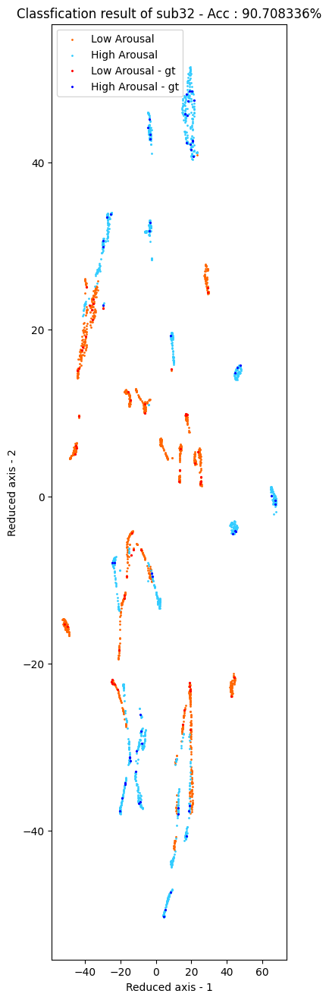

In [377]:
vlc_best_acc = []
ars_best_acc = []

for i in range(32):
    print("\n\n******************* SUBJECT : {} *********************".format(i+1))

    date = '230324_update1'
    sub_idx = 'sub'+str(i+1)

    subject_de, subject_psd, subject_label, _ = load_subject_data(args.tensor_save_path, isdeap=True)

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    valence_label, arousal_label = deap_label(sub_label)

    de, psd, vlc_identifier, ars_identifier = preprocessing(sub_de,sub_psd, (valence_label,arousal_label), args.n_labels_by_class, args.out_channels, args.seed, isdeap=True)

    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

    de_ssm, de_nssm = ssm_construction(de, args.n_samples,args.de_k)
    psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples,args.psd_k)
    save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
    save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
    save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
    save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    adj = normalize_adj(fsm)
    save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
    save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


    feature = input_feature(de, psd)

    save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(adj).to(torch.float32).to(device)
    ars_label = torch.from_numpy(arousal_label).to(torch.long).to(device)
    vlc_label = torch.from_numpy(valence_label).to(torch.long).to(device)

    vlc_identifier = torch.from_numpy(vlc_identifier).bool()
    vlc_train_identifier = vlc_identifier.to(device)
    isunlabeled = ~vlc_identifier
    vlc_test_identifier = isunlabeled.to(device)

    ars_identifier = torch.from_numpy(ars_identifier).bool()
    ars_train_identifier = ars_identifier.to(device)
    isunlabeled = ~ars_identifier
    ars_test_identifier = isunlabeled.to(device)


    activation = get_activation('celu')
    gcn = GraphConvolution

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, adj, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, vlc_label,
                                                                        vlc_train_identifier, vlc_test_identifier,
                                                                        args,date,sub_idx, isdeap=True)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    vlc_best_acc.append(round(best_acc.item(), 2))
    

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_valence'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'valence_test_acc_'+date, best_acc)

    cf_name = args.valence
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)


    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, vlc_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)



    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, adj, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, ars_label,
                                                                        ars_train_identifier, ars_test_identifier,
                                                                        args,date,sub_idx, isdeap=True)
    print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
    ars_best_acc.append(round(best_acc.item(), 2))

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model_arousal'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)
    best_acc = np.array(best_acc.cpu())
    save_np(args.tensor_save_path+sub_idx, 'arousal_test_acc_'+date, best_acc)

    cf_name = args.arousal
    fig_name = 'Output'
    save_scatter_deap(result.detach().cpu().numpy(), ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, vlc_train_identifier, cf_name, fig_name)

    visualization_type = 1
    sample = best_z.cpu().detach().numpy().copy()
    drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 2500)
    tsne_sample = StandardScaler().fit_transform(sample) # standardization
    dr_result = drmodel.fit_transform(tsne_sample)

    fig_name = 'GCN Encoder'
    save_scatter_deap(dr_result, ars_label, best_acc, sub_idx, date, args.figure_save_path, visualization_type, ars_train_identifier, cf_name, fig_name)
print("\n**************** Valence *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(vlc_best_acc, np.mean(vlc_best_acc), np.std(vlc_best_acc)))
print("**************** Arousal *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(ars_best_acc, np.mean(ars_best_acc), np.std(ars_best_acc)))


In [350]:
sub_psd = subject_psd[5]
psd = normalization(psd, axis = 0, ntype='standardization')
de, psd, vlc_identifier, ars_identifier = preprocessing(sub_de,sub_psd, (valence_label,arousal_label), args.n_labels_by_class, args.out_channels, args.seed, isdeap=True)


In [359]:
psd[510]

array([3.94903717e+07, 9.78525215e+06, 2.00680913e+07, 1.01683733e+07,
       2.43956176e+07, 8.78711330e+06, 1.34312654e+07, 6.14508822e+07,
       8.80779173e+06, 2.62891717e+07, 3.22688584e+07, 2.82020556e+07,
       6.39886103e+06, 2.91015552e+07, 9.99028601e+06, 2.29004549e+06,
       2.76028338e+07, 3.87223998e+06, 1.00766226e+07, 3.10430043e+07,
       3.89771168e+06, 6.29563926e+07, 1.59939242e+07, 7.93811338e+06,
       1.80599939e+07, 8.31151961e+06, 2.25794921e+07, 7.17356298e+06,
       1.57757642e+07, 1.88744672e+06, 8.99036731e+06, 1.37973113e+07,
       2.74136245e+06, 1.85683783e+06, 2.12814775e+06, 7.54038406e+05,
       3.42527430e+06, 1.35889030e+06, 6.28526745e+05, 3.64195515e+06,
       1.22684445e+06, 2.65962092e+06, 1.70181567e+06, 2.77747318e+06,
       1.06944848e+06, 3.90887147e+06, 9.01629667e+05, 5.03501665e+05,
       1.99313494e+06, 5.81912806e+05, 1.85512743e+06, 2.72550775e+06,
       5.03882041e+05, 6.82679405e+06, 9.78721168e+05, 7.88214812e+05,
      

In [363]:
psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples,args.psd_k)


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
510
[1.00000000e+000 3.38080096e-029 2.51226995e-030 ... 1.84468249e-187
 1.84313300e-187 1.80787248e-187]
0.0
Done



<Figure size 640x480 with 0 Axes>

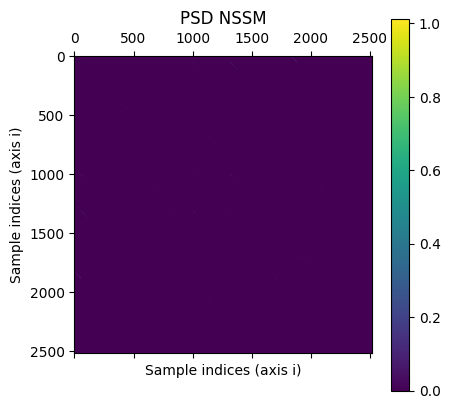

In [356]:
i = 1
save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+'sub1'+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')


In [364]:
def ssm_construction(feature_list, length, k):
    print("\n********** SSM construction start ***********")
    ssm = np.zeros((length, length), dtype = 'float64')
    normalized_sparse_ssm = np.zeros((length,length), dtype = 'float64')
    
    print("\nDistance matrix construction start...")
    dm = distance_matrix(feature_list, length)
    scaled_distance_mean = -dm.mean()*0.05
    neighbors = kneighbors(dm, length, k)
    print("Done")
    print("\nSparse ssm and normalized sparse ssm construction start...")
    # construct sparse_ssm 
    for i in range(length):
        ith_neigh = neighbors[i]
        ssm_elements = np.exp(dm[i][ith_neigh]/scaled_distance_mean)
        ssm[i][ith_neigh] = ssm_elements
        sum_elements = np.sum(ssm_elements)-1.
        if sum_elements == 0.0:
            normalized_sparse_ssm[i][ith_neigh] = ssm_elements
        else:
            normalized_sparse_ssm[i][ith_neigh] = ssm_elements / (np.sum(ssm_elements)-1.)
        normalized_sparse_ssm[i][i] = 0.
    print("Done\n")
    
    trium = np.triu(normalized_sparse_ssm, k=1)
    normalized_sparse_ssm = trium + trium.T + np.diag(normalized_sparse_ssm.diagonal())
    
    return ssm, normalized_sparse_ssm

In [584]:
mean = 0
for i in range(15):
    mean += subject_best_acc[i].item()
mean /= 15.
mean

84.39224141438802

# Edge drop hyperparameter validation

In [273]:
drop_features(feature, adj, 0.1)

tensor([0.9799, 0.9831, 0.9841, 0.9768, 0.9771, 0.9678, 0.9316, 0.9309, 0.8962,
        0.9055, 0.9393, 0.9465, 0.9641, 0.9234, 0.9590, 0.9240, 0.9305, 0.9317,
        0.9401, 0.9515, 0.9146, 0.9384, 0.9289, 0.9477, 0.9246, 0.9270, 0.9475,
        0.9976, 0.9988, 0.9267, 0.9059, 0.9225, 0.9338, 0.9253, 0.9638, 0.9094,
        0.9854, 0.9458, 0.9430, 0.9387, 0.9164, 0.9092, 0.9189, 0.9381, 0.9749,
        0.9880, 0.9062, 0.9382, 0.9212, 0.9268, 0.9095, 0.9084, 0.8920, 0.8948,
        0.8015, 0.9425, 0.9427, 0.9326, 0.9401, 0.9608, 0.9495, 0.9430, 0.9884,
        0.9848, 0.9785, 0.9740, 0.9787, 0.9720, 0.9536, 0.9524, 0.9413, 0.9656,
        0.8708, 0.8938, 0.9526, 0.9325, 0.9652, 0.9113, 0.9163, 0.9148, 0.9691,
        0.9783, 0.9197, 0.9212, 0.8937, 0.9526, 0.9406, 0.9471, 0.9419, 0.9970,
        1.0000, 0.9359, 0.9276, 0.9060, 0.9805, 0.9285, 0.9575, 0.9126, 0.9775,
        0.9644, 0.9618, 0.9385, 0.9209, 0.9199, 0.9463, 0.9716, 0.9474, 0.9438,
        0.9317, 0.9781, 0.9592, 0.9558, 

tensor([[-0.9299, -0.9922, -1.3947,  ..., -0.1198,  0.6016,  0.5215],
        [-0.9305, -0.9918, -1.3938,  ..., -0.1196,  0.6023,  0.5221],
        [-0.9314, -0.9922, -1.3941,  ..., -0.1192,  0.6038,  0.5234],
        ...,
        [-1.7059, -1.4937, -1.3851,  ...,  0.7166,  1.0864,  1.0704],
        [-1.7075, -1.4946, -1.3852,  ...,  0.7163,  1.0861,  1.0702],
        [-1.7081, -1.4952, -1.3858,  ...,  0.7161,  1.0858,  1.0699]],
       device='cuda:1')

In [263]:

def drop_edges(edge_weights, p: float, threshold: float = 1.):
#     alleviated_weights = torch.log(edge_weights)
    weight_max = edge_weights.max()
    weights = (weight_max-edge_weights)/(weight_max-edge_weights.mean())

    probability_weights = weights / weights.mean() * p
    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold)
    drop_mask = torch.bernoulli(1. - probability_weights).to(torch.bool)
   
    edge_weights_view = edge_weights.where(drop_mask == True, torch.zeros_like(edge_weights))
    
    return edge_weights_view

# Feature drop hyperparameter validation

In [270]:
def drop_features(features, edges, p: float, threshold: float = 0.7):
    x = torch.abs(features)
    row_sum = torch.sum(edges, axis=0)
    feature_weights = x.t() @ row_sum
    feature_weights = feature_weights.log()
    weight_max = feature_weights.max()
    w = (weight_max-feature_weights)/(weight_max-feature_weights.mean())

    probability_weights = w / w.mean() * p
    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold) 
    drop_mask = torch.bernoulli(probability_weights).to(torch.bool)
    
    features_view = features.clone()
    features_view[:,drop_mask] = 0.

    return features_view


In [10]:
def drop_features2(probability_weights, features, threshold: float = 1.):

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold) 
    drop_mask = torch.bernoulli(probability_weights).to(torch.bool)
    
    features_view = features.clone()
    features_view[:,drop_mask] = 0.

    return features_view

def edge_rank(edge_weights):
    weight_max = edge_weights.max(axis=1).values
    weight_mean = edge_weights.sum(axis=1)/(edge_weights!=0).sum(axis=1)
    weights = (weight_max-edge_weights)/(weight_max-edge_weights.mean())
    return weights

def drop_edges2(probability_weights, edge_weights, threshold: float = 1.):
#     alleviated_weights = torch.log(edge_weights

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold)
    drop_mask = torch.bernoulli(1. - probability_weights).to(torch.bool)
   
    edge_weights_view = edge_weights.where(drop_mask == True, torch.zeros_like(edge_weights))

    return edge_weights_view


def GCA_train2(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False ):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    rankf = disc_rank(feature, label,train_identifier, args.out_channels)
    rankf1 = rankf*args.pf1
    rankf2 = rankf*args.pf2
    ranke = edge_rank(adj)
    ranke1 = ranke*args.pe1
    ranke2 = ranke*args.pe2
    
    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        x1 = drop_features2(rankf1, feature, threshold = args.tpf1)
        x2 = drop_features2(rankf2, feature, threshold = args.tpf2)
        e1 = drop_edges2(ranke1,orig_adj, threshold = args.tpe1)
        e2 = drop_edges2(ranke2,orig_adj, threshold = args.tpe2)

#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)
 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]
        r1_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r1_y)
        r1_acc = accuracy(r1_pred, r1_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        r2_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r2_y)
        r2_acc = accuracy(r2_pred, r2_y, isdeap)

        
        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = (labeled_loss1 + labeled_loss2)/2. + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr1_pred = r1[test_identifier]
        tr1_y = label[test_identifier]
        tr1_loss = criterion(tr1_pred, tr1_y)
        tr1_acc = accuracy(tr1_pred, tr1_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr2_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr2_y)
        
#         tr_acc = (tr1_acc + tr2_acc)/2.
        if tr1_acc > tr2_acc:
            result = r1
            tr_acc = tr1_acc
        else:
            result = r2
            tr_acc = tr2_acc
        
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            
            best_result = result
            best_z = z1 if tr1_acc > tr2_acc else z2


#         if epoch % 10 == 0:
#             print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return model, best_acc, best_epoch, best_model, best_z, best_result


# Row max, mean with Self-similarity 

Device: cuda
Current cuda device: 2
Count of using GPUs: 3
========================================== SEED_IV Protocol 15 ==========================================
+++++++++++++++++++++++++++ Pe: 0.1, Pf:0.1 +++++++++++++++++++++++++++++++++++


******************* SUBJECT : 1 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature 

/tmp/ipykernel_5080/4212163399.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


*** Best ACC : 83.03 , Best Epoch : 1380***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2886 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successful

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2933 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.42 , Best Epoch : 1195***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_

directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.99 , Best Epoch : 479***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2815 sec
Done
**************************************


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2793 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully


KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

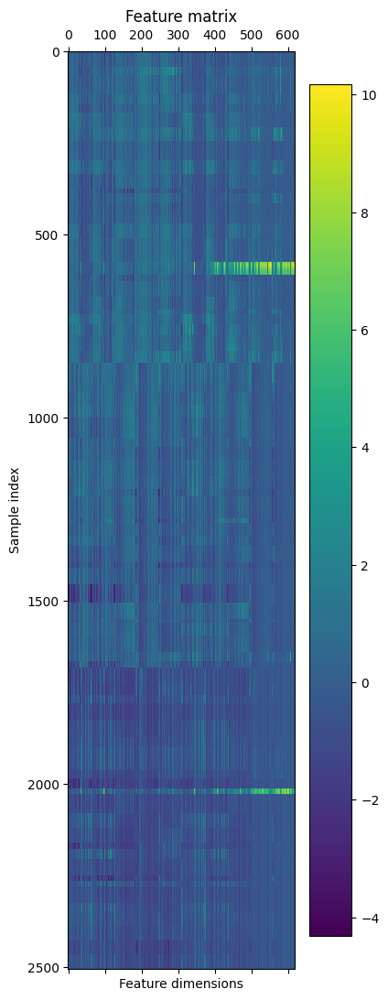

In [11]:

cp.cuda.Device(2).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[2])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)

args.tpe1 = 1.
args.tpe2 = 1.
args.tpf1 = 1.
args.tpf2 = 1.

subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)

visualization_type = 1
for p in range(1):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class1
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    



    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))
    Best_EF_acc = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_std = [[0 for _ in range(9)] for _ in range(9)]
    for e in range(1,10):
        for f in range(1,10):
            print("+++++++++++++++++++++++++++ Pe: {}, Pf:{} +++++++++++++++++++++++++++++++++++".format(e/10,f/10))
        
            best_epoch_list = []
            best_acc_list = []
            orig_acc_list = []
            args.pe1 = e/10
            args.pe2 = e/10
            args.pf1 = f/10
            args.pf2 = f/10
            for i in range(15):
                print("\n\n******************* SUBJECT : {} *********************".format(i+1))
                sub_idx = 'sub'+str(i+1)
                date = '230405'

                sub_de = subject_de[i]
                sub_psd = subject_psd[i]
                sub_label = subject_label[i]
                sub_sample_counts = subject_sample_counts[i]

                de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

                de = normalization(de, axis = 0, ntype='standardization')
                psd = normalization(psd, axis = 0, ntype='standardization')

                de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
                psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)

                save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
                save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
                save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
                save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
                save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                adj = normalize_adj(fsm)
                save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
                save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                feature = input_feature(de, psd)
                label = sub_label

                save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

                feature = torch.from_numpy(feature).to(torch.float32).to(device)
                adj = torch.from_numpy(adj).to(torch.float32).to(device)
                label = torch.from_numpy(label).to(torch.long).to(device)

                identifier = torch.from_numpy(identifier).bool()
                train_identifier = identifier.to(device)
                isunlabeled = ~identifier

                test_identifier = isunlabeled.to(device)

                activation = get_activation('celu')
                gcn = GraphConvolution

                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

                model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, label,
                                                                                    train_identifier, test_identifier,
                                                                                    args,device,date,sub_idx, isdeap=False)

                experiment_type = 'subject_dependent'
                model_save_name = sub_idx+'_model'
                model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
                torch.save(model.state_dict(), model_path)

                print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
                best_epoch_list.append(best_epoch)
                best_acc_list.append(round(best_acc.item(), 2))
                orig_acc_list.append(best_acc.item())


            #     sample = best_z.cpu().detach().numpy().copy()
            #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
            #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
            #     dr_result = drmodel.fit_transform(tsne_sample)

            #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

            print("\n**************** Best acc by subject *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

            Best_EF_acc[e-1][f-1] = round(np.mean(orig_acc_list),2)
            Best_EF_std[e-1][f-1] = round(np.std(orig_acc_list),2)
            print("\n Best Epochs : {}".format(best_epoch_list))
            best_acc_list = np.array(best_acc_list)
            save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

In [13]:
Best_EF_acc

[[95.96, 96.44, 96.51, 96.59, 96.37, 96.71, 96.62, 96.7, 96.45],
 [95.35, 95.99, 96.32, 96.51, 96.59, 96.78, 96.7, 96.57, 96.42],
 [95.85, 96.28, 96.53, 96.44, 96.52, 96.59, 96.37, 96.57, 96.49],
 [95.79, 96.31, 96.38, 96.53, 96.74, 96.6, 96.86, 96.67, 96.39],
 [95.97, 96.45, 96.74, 96.73, 96.62, 96.79, 96.57, 96.5, 96.6],
 [96.01, 96.35, 96.27, 96.64, 96.52, 96.54, 96.4, 96.62, 96.55],
 [95.75, 96.23, 96.57, 96.54, 96.65, 96.44, 96.5, 96.37, 96.52],
 [96.08, 96.17, 96.68, 96.57, 96.6, 96.63, 96.63, 96.55, 96.55],
 [95.96, 96.06, 96.67, 96.65, 96.66, 96.59, 96.68, 96.37, 96.44]]